In [3]:
# ============================================================
# BRISC2025 TRUE Joint Multi-task Brain Tumor Framework
# Classification + Segmentation in ONE shared model
#
# UPDATED VERSION:
#   1. One shared encoder/decoder/classification model is still used
#   2. Training is now TRUE joint multitask optimization
#   3. Classification and segmentation gradients are accumulated together
#   4. One optimizer step is made per joint CLS+SEG step
#   5. LAMBDA_CLS and LAMBDA_SEG are now actually used
#   6. One combined validation score selects ONE best joint checkpoint
#   7. Final test evaluates classification and segmentation from the SAME checkpoint
#   8. Full journal figure generation after training
# ============================================================

import os, math, random, warnings, time, json, hashlib, copy
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
from PIL import Image, ImageEnhance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

warnings.filterwarnings("ignore")

try:
    import timm
except Exception:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])
    import timm

try:
    import matplotlib
    matplotlib.use("Agg")          # non-interactive backend (safe for scripts)
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.gridspec as gridspec
    from matplotlib.colors import LinearSegmentedColormap
    from matplotlib.ticker import MaxNLocator
    MATPLOTLIB_OK = True
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "matplotlib"])
    import matplotlib
    matplotlib.use("Agg")
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.gridspec as gridspec
    from matplotlib.colors import LinearSegmentedColormap
    from matplotlib.ticker import MaxNLocator
    MATPLOTLIB_OK = True

try:
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )
    from sklearn.preprocessing import label_binarize
    SKLEARN_OK = True
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-learn"])
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )
    from sklearn.preprocessing import label_binarize
    SKLEARN_OK = True


# ============================================================
# CONFIG
# ============================================================
ROOT = r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\archive (2)\brisc2025"

OUT_DIR = "./runs_brisc2025_multitask_gated_unet"
FIG_DIR = os.path.join(OUT_DIR, "figures")
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

SEED        = 2025
IMG_SIZE    = 224
BATCH_SIZE  = 2

# Classification split ratios for leak-safe train/val/test creation.
# The code combines all classification images first, then splits them safely.
CLS_VAL_RATIO  = 0.15
CLS_TEST_RATIO = 0.15

MAX_EPOCHS  = 100
LR          = 2e-4
WEIGHT_DECAY= 5e-5
NUM_WORKERS = 0

USE_AMP           = True
FREEZE_BACKBONES  = True

# Accuracy boosters / regularization
# MixUp is applied ONLY to classification batches. Segmentation masks are kept unchanged.
USE_MIXUP          = True
MIXUP_ALPHA        = 0.20
MIXUP_PROB         = 0.50
CLS_LABEL_SMOOTHING= 0.05

# EMA usually gives a more stable/better final checkpoint for validation and testing.
USE_EMA            = True
EMA_DECAY          = 0.999

# Training stability and adaptive learning rate.
GRAD_CLIP_NORM     = 1.0
LR_PLATEAU_FACTOR  = 0.50
LR_PLATEAU_PATIENCE= 5
MIN_LR             = 1e-7

# Light MRI-safe augmentation.
USE_LIGHT_AUG      = True
ROTATE_DEGREES     = 10
BRIGHTNESS_JITTER  = 0.10
CONTRAST_JITTER    = 0.10

# Optional segmentation booster: BCE + Dice + Focal.
USE_FOCAL_SEG      = True
FOCAL_ALPHA        = 0.25
FOCAL_GAMMA        = 2.0
FOCAL_WEIGHT       = 0.50

# Loss weights used in the TRUE joint multitask objective:
# total_loss = LAMBDA_CLS * classification_loss + LAMBDA_SEG * segmentation_loss
LAMBDA_CLS = 1.0
LAMBDA_SEG = 1.0

# Use labels from segmentation samples too, when available.
# Your log showed missing_labels=0, so this gives the classifier more labeled images.
CLS_FROM_SEG_SAMPLES = True

# One single checkpoint is selected using this combined validation score:
# combined_score = COMBINED_CLS_WEIGHT * val_cls_acc + COMBINED_SEG_WEIGHT * val_seg_dice
COMBINED_CLS_WEIGHT = 0.5
COMBINED_SEG_WEIGHT = 0.5

MULTITASK_PATIENCE   = 20
MULTITASK_MIN_EPOCHS = 20
MULTITASK_MIN_DELTA  = 1e-4

CLASS_NAMES  = ["glioma", "meningioma", "no_tumor", "pituitary"]
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
NUM_CLASSES  = len(CLASS_NAMES)

BACKBONES = [
    "convnext_base",
    "efficientnetv2_rw_s",
    "densenet201",
    "swin_small_patch4_window7_224",
    "vit_base_patch16_224",
]

device  = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = bool(USE_AMP and torch.cuda.is_available())

print("Device:", device)
print("AMP:", USE_AMP)


# ============================================================
# Reproducibility
# ============================================================
def seed_everything(seed=2025):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SEED)


# ============================================================
# Utility functions
# ============================================================
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


def canonical_class_name(name):
    name = name.lower().strip().replace("-", "_").replace(" ", "_")
    if name in ["notumor", "no_tumor", "no_tumour", "normal", "healthy"]:
        return "no_tumor"
    return name


def list_images(folder):
    folder = Path(folder)
    return sorted(
        str(p) for p in folder.rglob("*")
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    )


def load_rgb(path):
    return Image.open(path).convert("RGB")


def load_mask(path):
    return Image.open(path).convert("L")


def resize_image_and_mask(img, mask=None, train=False):
    img = img.resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR)
    if mask is not None:
        mask = mask.resize((IMG_SIZE, IMG_SIZE), Image.NEAREST)

    if train:
        if random.random() < 0.5:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            if mask is not None:
                mask = mask.transpose(Image.FLIP_LEFT_RIGHT)

        if USE_LIGHT_AUG:
            # Small rotations are usually safe for brain MRI and applied equally to image + mask.
            if ROTATE_DEGREES > 0:
                angle = random.uniform(-ROTATE_DEGREES, ROTATE_DEGREES)
                img = img.rotate(angle, resample=Image.BILINEAR, fillcolor=0)
                if mask is not None:
                    mask = mask.rotate(angle, resample=Image.NEAREST, fillcolor=0)

            # Mild intensity augmentation, image only.
            if BRIGHTNESS_JITTER > 0:
                b = 1.0 + random.uniform(-BRIGHTNESS_JITTER, BRIGHTNESS_JITTER)
                img = ImageEnhance.Brightness(img).enhance(b)
            if CONTRAST_JITTER > 0:
                c = 1.0 + random.uniform(-CONTRAST_JITTER, CONTRAST_JITTER)
                img = ImageEnhance.Contrast(img).enhance(c)

    return img, mask


def img_to_tensor(img):
    arr  = np.array(img).astype(np.float32) / 255.0
    x    = torch.from_numpy(arr).permute(2, 0, 1)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return ((x - mean) / std).float()


def mask_to_tensor(mask):
    arr = np.array(mask).astype(np.float32)
    arr = (arr > 0).astype(np.float32)
    return torch.from_numpy(arr).unsqueeze(0).float()


def make_fingerprint_262(img):
    g    = np.array(img.convert("L").resize((IMG_SIZE, IMG_SIZE))).astype(np.float32)
    g01  = g / 255.0
    hist, _ = np.histogram(g, bins=256, range=(0, 255))
    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)
    mean = g01.mean()
    std  = g01.std() + 1e-8
    c    = g01 - mean
    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)
    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)
    ent  = -np.sum(hist * np.log(hist + 1e-8))
    fgr  = float((g01 > mean).mean())
    fp   = np.concatenate([hist, [mean, std, skew, kurt, ent, fgr]]).astype(np.float32)
    assert fp.shape[0] == 262
    return torch.from_numpy(fp).float()


def normalize_stem(stem):
    s = stem.lower()
    for r in ["_mask", "-mask", " mask", "mask_", "mask-"]:
        s = s.replace(r, "")
    return s.replace(" ", "").replace("_", "").replace("-", "")


# ============================================================
# Build classification items
# ============================================================
def _collect_classification_items_from_class_dirs(base_dir, warn_unknown=True):
    """
    Collect images from a directory containing class folders:
        base_dir/glioma/*.png
        base_dir/meningioma/*.png
        base_dir/notumor/*.png
        base_dir/pituitary/*.png

    This helper is used for both possible BRISC2025 layouts:
      1) classification_task/<class_name>/*.png
      2) classification_task/<split>/<class_name>/*.png
    """
    base_dir = Path(base_dir)
    items = []

    if not base_dir.exists():
        return items

    for class_folder in sorted(base_dir.iterdir()):
        if not class_folder.is_dir():
            continue

        cname = canonical_class_name(class_folder.name)
        if cname not in CLASS_TO_IDX:
            if warn_unknown:
                print("[WARN] Unknown class folder skipped:", class_folder)
            continue

        y = CLASS_TO_IDX[cname]
        imgs = list_images(class_folder)
        for p in imgs:
            items.append((p, y))

    return items


def build_classification_items(split):
    """
    Build items for split layout only:
        classification_task/train/<class_name>
        classification_task/test/<class_name>
        classification_task/val/<class_name>
    """
    split_dir = Path(ROOT) / "classification_task" / split
    return _collect_classification_items_from_class_dirs(split_dir, warn_unknown=True)


def file_md5(path, block_size=65536):
    """Exact duplicate detector using file content hash."""
    h = hashlib.md5()
    with open(path, "rb") as f:
        for block in iter(lambda: f.read(block_size), b""):
            h.update(block)
    return h.hexdigest()


def build_all_classification_items():
    """
    Combine all available classification images first, then split them ourselves.

    Supports BOTH dataset structures:
      A) classification_task/<class_name>/*.png
         Example from your screenshot:
         classification_task/glioma, classification_task/meningioma,
         classification_task/notumor, classification_task/pituitary

      B) classification_task/<split>/<class_name>/*.png
         Example:
         classification_task/train/glioma, classification_task/test/glioma
    """
    cls_root = Path(ROOT) / "classification_task"
    all_items = []

    # Layout A: class folders directly inside classification_task
    direct_items = _collect_classification_items_from_class_dirs(cls_root, warn_unknown=False)
    if direct_items:
        print("[CLS] Detected direct class-folder layout: classification_task/<class_name>")
        all_items.extend(direct_items)

    # Layout B: class folders inside train/test/val split folders
    split_items = []
    for split in ["train", "test", "val", "valid", "validation"]:
        split_items.extend(build_classification_items(split))
    if split_items:
        print("[CLS] Detected split-folder layout: classification_task/<split>/<class_name>")
        all_items.extend(split_items)

    # Remove exact duplicate paths, keeping labels.
    unique = {}
    for path, y in all_items:
        unique[str(Path(path))] = (path, y)
    all_items = list(unique.values())

    if len(all_items) == 0:
        existing = []
        if cls_root.exists():
            existing = [p.name for p in cls_root.iterdir() if p.is_dir()]
        raise RuntimeError(
            "No classification images found. Expected either "
            "classification_task/<class_name>/*.png or "
            "classification_task/<split>/<class_name>/*.png. "
            f"Found folders inside classification_task: {existing}"
        )

    return all_items


def split_classification_no_leakage(items, val_ratio=0.15, test_ratio=0.15, label_pos=1, seed=2025):
    """
    Leak-safe stratified train/val/test split for classification.

    Leakage prevention:
    - Images with the same normalized filename stem stay in one split.
    - Exact duplicate files, detected by MD5 hash, stay in one split even if filenames differ.

    This avoids the same image/case appearing across train, validation, and test.
    """
    rng = random.Random(seed)
    n = len(items)

    parent = list(range(n))

    def find(x):
        while parent[x] != x:
            parent[x] = parent[parent[x]]
            x = parent[x]
        return x

    def union(a, b):
        ra, rb = find(a), find(b)
        if ra != rb:
            parent[rb] = ra

    stem_owner = {}
    hash_owner = {}

    print("\n[CLS] Building no-leakage groups using filename stems + MD5 hashes...")
    for i, item in enumerate(items):
        path = item[0]
        stem_key = normalize_stem(Path(path).stem)
        hash_key = file_md5(path)

        if stem_key in stem_owner:
            union(i, stem_owner[stem_key])
        else:
            stem_owner[stem_key] = i

        if hash_key in hash_owner:
            union(i, hash_owner[hash_key])
        else:
            hash_owner[hash_key] = i

    grouped = defaultdict(list)
    for i, item in enumerate(items):
        grouped[find(i)].append(item)

    groups = list(grouped.values())

    # Assign one stratification label to each group.
    # If a group has conflicting labels, keep the group together and use majority label for stratification.
    class_to_groups = defaultdict(list)
    conflict_count = 0
    for g in groups:
        labels = [item[label_pos] for item in g]
        label_counter = Counter(labels)
        main_label = label_counter.most_common(1)[0][0]
        if len(label_counter) > 1:
            conflict_count += 1
            print(f"[WARN] One leakage group has conflicting labels: {dict(label_counter)}")
        class_to_groups[main_label].append(g)

    train_items, val_items, test_items = [], [], []

    for y, g_list in class_to_groups.items():
        rng.shuffle(g_list)
        n_g = len(g_list)

        n_test = int(round(n_g * test_ratio))
        n_val  = int(round(n_g * val_ratio))

        if n_g >= 3:
            n_test = max(1, n_test)
            n_val  = max(1, n_val)

        test_g  = g_list[:n_test]
        val_g   = g_list[n_test:n_test + n_val]
        train_g = g_list[n_test + n_val:]

        for group in train_g:
            train_items.extend(group)
        for group in val_g:
            val_items.extend(group)
        for group in test_g:
            test_items.extend(group)

    def leakage_keys(split_items):
        stem_keys = set()
        hash_keys = set()
        for path, _ in split_items:
            stem_keys.add(normalize_stem(Path(path).stem))
            hash_keys.add(file_md5(path))
        return stem_keys, hash_keys

    train_stems, train_hashes = leakage_keys(train_items)
    val_stems, val_hashes     = leakage_keys(val_items)
    test_stems, test_hashes   = leakage_keys(test_items)

    assert train_stems.isdisjoint(val_stems),  "LEAKAGE: train and val share filename stems!"
    assert train_stems.isdisjoint(test_stems), "LEAKAGE: train and test share filename stems!"
    assert val_stems.isdisjoint(test_stems),   "LEAKAGE: val and test share filename stems!"

    assert train_hashes.isdisjoint(val_hashes),  "LEAKAGE: train and val share exact image hashes!"
    assert train_hashes.isdisjoint(test_hashes), "LEAKAGE: train and test share exact image hashes!"
    assert val_hashes.isdisjoint(test_hashes),   "LEAKAGE: val and test share exact image hashes!"

    print("\n[CLS LEAK-SAFE SPLIT]")
    print(f"Total classification images : {len(items)}")
    print(f"Total leakage-safe groups   : {len(groups)}")
    print(f"Train images                : {len(train_items)}")
    print(f"Val images                  : {len(val_items)}")
    print(f"Test images                 : {len(test_items)}")
    print(f"Conflicting-label groups    : {conflict_count}")
    print("Leakage check               : PASSED")

    return train_items, val_items, test_items


# ============================================================
# Build segmentation image-mask pairs
# ============================================================
def build_mask_lookup(mask_dir):
    lookup = {}
    for mp in list_images(mask_dir):
        lookup[normalize_stem(Path(mp).stem)] = mp
    return lookup


_CLASS_LABEL_LOOKUP_CACHE = None


def build_label_lookup_from_classification():
    """
    Build filename-stem -> class-label lookup for segmentation samples.
    This now supports the direct class-folder layout too, so segmentation labels
    will not become missing just because classification_task has no train/test folders.
    """
    global _CLASS_LABEL_LOOKUP_CACHE
    if _CLASS_LABEL_LOOKUP_CACHE is not None:
        return _CLASS_LABEL_LOOKUP_CACHE

    lookup = {}
    for path, y in build_all_classification_items():
        lookup[normalize_stem(Path(path).stem)] = y

    _CLASS_LABEL_LOOKUP_CACHE = lookup
    print(f"[CLS] Label lookup entries for segmentation: {len(lookup)}")
    return lookup


def infer_label_from_filename(path):
    s = str(path).lower()
    for cname, idx in CLASS_TO_IDX.items():
        if cname in s or cname.replace("_", "") in s:
            return idx
    return -1


def build_segmentation_items(split):
    seg_dir   = Path(ROOT) / "segmentation_task" / split
    img_dir   = seg_dir / "images"
    mask_dir  = seg_dir / "masks"
    img_paths = list_images(img_dir)
    mask_lut  = build_mask_lookup(mask_dir)
    label_lut = build_label_lookup_from_classification()
    items, missing_masks, missing_labels = [], 0, 0
    for ip in img_paths:
        stem = normalize_stem(Path(ip).stem)
        mp   = mask_lut.get(stem)
        if mp is None:
            missing_masks += 1
            continue
        y = label_lut.get(stem, -1)
        if y == -1:
            y = infer_label_from_filename(ip)
        if y == -1:
            missing_labels += 1
        items.append((ip, mp, y))
    print(f"[SEG {split}] images={len(img_paths)} pairs={len(items)} "
          f"missing_masks={missing_masks} missing_labels={missing_labels}")
    return items


# ============================================================
# Dataset classes
# ============================================================
class ClassificationDataset(Dataset):
    def __init__(self, items, train=False):
        self.items = items
        self.train = train

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        path, y = self.items[idx]
        img, _  = resize_image_and_mask(load_rgb(path), None, train=self.train)
        return {
            "image":     img_to_tensor(img),
            "mask":      torch.zeros(1, IMG_SIZE, IMG_SIZE).float(),
            "label":     torch.tensor(y).long(),
            "has_mask":  torch.tensor(False),
            "has_label": torch.tensor(True),
            "fp":        make_fingerprint_262(img),
            "path":      path
        }


class SegmentationDataset(Dataset):
    def __init__(self, items, train=False):
        self.items = items
        self.train = train

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        ip, mp, y = self.items[idx]
        img, mask = resize_image_and_mask(load_rgb(ip), load_mask(mp), train=self.train)
        has_label = y >= 0
        if y < 0:
            y = 0
        return {
            "image":     img_to_tensor(img),
            "mask":      mask_to_tensor(mask),
            "label":     torch.tensor(y).long(),
            "has_mask":  torch.tensor(True),
            "has_label": torch.tensor(has_label),
            "fp":        make_fingerprint_262(img),
            "path":      ip
        }


def split_train_val_items(items, val_ratio=0.15, stratify=False, label_pos=-1):
    """
    Train/validation split.
    For classification and labeled segmentation, stratify=True keeps class balance more stable.
    """
    n = len(items)
    rng = random.Random(SEED)

    if not stratify:
        idxs = list(range(n))
        rng.shuffle(idxs)
        val_n = int(n * val_ratio)
        val_set = set(idxs[:val_n])
        return [items[i] for i in range(n) if i not in val_set], \
               [items[i] for i in range(n) if i in val_set]

    groups = defaultdict(list)
    for i, item in enumerate(items):
        groups[item[label_pos]].append(i)

    val_set = set()
    for _, idxs in groups.items():
        rng.shuffle(idxs)
        val_n = int(len(idxs) * val_ratio)
        if len(idxs) > 1:
            val_n = max(1, val_n)
        val_set.update(idxs[:val_n])

    return [items[i] for i in range(n) if i not in val_set], \
           [items[i] for i in range(n) if i in val_set]


# ============================================================
# Model blocks
# ============================================================
class ConvBNAct(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.GELU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.GELU(),
        )

    def forward(self, x):
        return self.block(x)


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        return self.conv(torch.cat([x, skip], dim=1))


class GatedFusionHead(nn.Module):
    """
    User-requested sigmoid stream-gating head.

    Input x is a concatenation of streams with dimensions given by dims.
    It learns one sigmoid gate per stream, multiplies each stream by its gate,
    then classifies the gated concatenated representation.
    """
    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):
        super().__init__()
        self.dims = list(map(int, dims))
        self.streams = len(self.dims)
        self.in_dim = sum(self.dims)
        self.gates = nn.Sequential(
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )
        self.norm = nn.LayerNorm(self.in_dim)
        self.mlp = nn.Sequential(
            nn.Linear(self.in_dim, hidden),
            nn.GELU(),
            nn.Dropout(p_drop),
            nn.Linear(hidden, num_classes)
        )

    def forward(self, x):
        g = self.gates(x)
        out_parts = []
        off = 0
        for i, d in enumerate(self.dims):
            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])
            off += d
        xg = torch.cat(out_parts, dim=1)
        return self.mlp(self.norm(xg))


class SpatialGatedFusionLevel(nn.Module):
    """
    Spatial version of the same GatedFusionHead idea for segmentation features.

    For each encoder level:
    1. Project every backbone stream to the same channel size.
    2. Concatenate streams.
    3. Learn one sigmoid gate per backbone stream from the concatenated features.
    4. Multiply each stream by its gate.
    5. Concatenate gated streams and reduce to out_ch for the decoder.

    This keeps the gating philosophy close to:
        gate = Linear(concat(streams)) -> Sigmoid
        gated_stream_i = stream_i * gate_i
    """
    def __init__(self, in_channels_list, out_ch, p_drop=0.05):
        super().__init__()
        self.dims = [int(out_ch) for _ in in_channels_list]
        self.streams = len(self.dims)
        self.in_dim = int(out_ch) * self.streams
        self.proj = nn.ModuleList([nn.Conv2d(c, out_ch, 1) for c in in_channels_list])
        self.gates = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )
        self.norm = nn.BatchNorm2d(self.in_dim)
        self.reduce = nn.Sequential(
            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Dropout2d(p_drop)
        )

    def forward(self, feats):
        max_h = max(f.shape[-2] for f in feats)
        max_w = max(f.shape[-1] for f in feats)

        proj_feats = [
            p(F.interpolate(f, (max_h, max_w), mode="bilinear", align_corners=False)
              if f.shape[-2:] != (max_h, max_w) else f)
            for f, p in zip(feats, self.proj)
        ]

        x = torch.cat(proj_feats, dim=1)
        g = self.gates(x)  # [B, streams], sigmoid like GatedFusionHead

        out_parts = []
        for i in range(self.streams):
            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])

        xg = torch.cat(out_parts, dim=1)
        return self.reduce(self.norm(xg))

class TimmSpatialBackbone(nn.Module):
    def __init__(self, name, pretrained=True, in_chans=3,
                 out_indices=(0, 1, 2, 3), freeze=True):
        super().__init__()
        self.name   = name
        self.freeze = freeze
        self.model  = timm.create_model(
            name, pretrained=pretrained, features_only=True,
            out_indices=out_indices, in_chans=in_chans
        )
        self.channels = self.model.feature_info.channels()
        if freeze:
            for p in self.model.parameters():
                p.requires_grad = False
            self.model.eval()

    def train(self, mode=True):
        super().train(mode)
        if self.freeze:
            self.model.eval()
        return self

    def _to_nchw(self, x, expected_ch):
        # ── FIX 4: log actual shapes on first call ──
        if x.ndim == 3:
            # ViT may return [B, tokens, C] — not usable as spatial feature
            raise RuntimeError(
                f"{self.name}: got 3-D tensor {x.shape}. "
                "This backbone does not return spatial feature maps via features_only=True. "
                "Remove it from BACKBONES or use a spatial-compatible variant."
            )
        if x.ndim != 4:
            raise RuntimeError(f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}")
        if x.shape[1] == expected_ch:
            return x
        if x.shape[-1] == expected_ch:                  # NHWC
            return x.permute(0, 3, 1, 2).contiguous()
        raise RuntimeError(
            f"{self.name}: expected C={expected_ch}, got shape={x.shape}"
        )

    def forward(self, x):
        ctx = torch.no_grad if self.freeze else torch.enable_grad
        with ctx():
            feats = self.model(x)
        return [self._to_nchw(f, ch) for f, ch in zip(feats, self.channels)]


class GatedMultiBackboneEncoder(nn.Module):
    def __init__(self, backbone_names, pretrained=True, in_chans=3,
                 fuse_channels=(64, 128, 256, 512), freeze=True):
        super().__init__()
        self.backbones      = nn.ModuleList()
        self.backbone_names = []

        for name in backbone_names:
            try:
                bb = TimmSpatialBackbone(
                    name=name, pretrained=pretrained,
                    in_chans=in_chans, out_indices=(0, 1, 2, 3), freeze=freeze
                )
                # ── FIX 4: log shapes with a dummy forward ──
                with torch.no_grad():
                    dummy = torch.zeros(1, 3, IMG_SIZE, IMG_SIZE)
                    shapes = [f.shape for f in bb.model(dummy)]
                print(f"  [OK] {name} | channels={bb.channels} | spatial={shapes}")
                self.backbones.append(bb)
                self.backbone_names.append(name)
            except Exception as e:
                print(f"  [SKIP] {name} — {str(e)[:200]}")

        if not self.backbones:
            raise RuntimeError("No backbone loaded successfully.")

        self.num_levels   = min(len(bb.channels) for bb in self.backbones)
        self.fuse_channels= list(fuse_channels[:self.num_levels])
        self.fusions      = nn.ModuleList([
            SpatialGatedFusionLevel(
                [bb.channels[lvl] for bb in self.backbones],
                self.fuse_channels[lvl]
            )
            for lvl in range(self.num_levels)
        ])

    def forward(self, x):
        all_feats = [bb(x) for bb in self.backbones]
        return [
            self.fusions[lvl]([feats[lvl] for feats in all_feats])
            for lvl in range(self.num_levels)
        ]


class GatedFPMultiTaskUNet(nn.Module):
    def __init__(self, backbone_names, num_classes=4, seg_classes=1,
                 fp_dim=262, use_fp=True, pretrained=True, freeze_backbones=True):
        super().__init__()
        self.use_fp  = use_fp
        self.encoder = GatedMultiBackboneEncoder(
            backbone_names=backbone_names, pretrained=pretrained,
            in_chans=3, fuse_channels=(64, 128, 256, 512),
            freeze=freeze_backbones
        )
        chs = self.encoder.fuse_channels
        self.decoder_blocks = nn.ModuleList([
            DecoderBlock(chs[i], chs[i-1], chs[i-1])
            for i in range(len(chs)-1, 0, -1)
        ])
        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)
        # Classification head uses the requested GatedFusionHead style.
        # Stream 1 = fused deep encoder feature, Stream 2 = handcrafted fingerprint projection.
        if use_fp:
            self.fp_proj = nn.Sequential(
                nn.Linear(fp_dim, 256), nn.GELU(), nn.Dropout(0.20)
            )
            cls_dims = [chs[-1], 256]
        else:
            self.fp_proj = None
            cls_dims = [chs[-1]]

        self.classifier = GatedFusionHead(
            dims=cls_dims, hidden=2048, num_classes=num_classes, p_drop=0.10
        )

    def forward(self, x, fp=None):
        feats       = self.encoder(x)
        d           = feats[-1]
        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):
            d = block(d, skip)
        seg_logits  = F.interpolate(
            self.seg_head(d), size=x.shape[-2:],
            mode="bilinear", align_corners=False
        )
        cls_parts = [F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)]
        if self.use_fp and fp is not None:
            cls_parts.append(self.fp_proj(fp.float()))
        cls_feat = torch.cat(cls_parts, dim=1)
        return {"seg_logits": seg_logits, "cls_logits": self.classifier(cls_feat)}


# ============================================================
# Loss and metrics
# ============================================================
def dice_loss_binary(seg_logits, mask, eps=1e-6):
    prob  = torch.sigmoid(seg_logits)
    inter = (prob * mask.float()).sum(dim=(2, 3))
    union = prob.sum(dim=(2, 3)) + mask.float().sum(dim=(2, 3))
    # ── FIX 3: eps only in denominator ──
    return (1 - (2 * inter) / (union + eps)).mean()


def focal_loss_binary_with_logits(seg_logits, mask, alpha=0.25, gamma=2.0):
    mask = mask.float()
    bce = F.binary_cross_entropy_with_logits(seg_logits, mask, reduction="none")
    prob = torch.sigmoid(seg_logits)
    pt = prob * mask + (1.0 - prob) * (1.0 - mask)
    alpha_t = alpha * mask + (1.0 - alpha) * (1.0 - mask)
    focal = alpha_t * ((1.0 - pt).clamp_min(1e-6) ** gamma) * bce
    return focal.mean()


def classification_ce_loss(logits, labels):
    return F.cross_entropy(logits, labels, label_smoothing=CLS_LABEL_SMOOTHING)


def mixup_cross_entropy(logits, y_a, y_b, lam):
    return lam * classification_ce_loss(logits, y_a) + (1.0 - lam) * classification_ce_loss(logits, y_b)


def segmentation_loss(seg_logits, mask):
    loss = F.binary_cross_entropy_with_logits(seg_logits, mask.float()) + dice_loss_binary(seg_logits, mask)
    if USE_FOCAL_SEG:
        loss = loss + FOCAL_WEIGHT * focal_loss_binary_with_logits(
            seg_logits, mask, alpha=FOCAL_ALPHA, gamma=FOCAL_GAMMA
        )
    return loss


def compute_task_loss(outputs, batch, task):
    label     = batch["label"].to(device)
    mask      = batch["mask"].to(device)
    has_label = batch["has_label"].to(device)
    has_mask  = batch["has_mask"].to(device)

    if task == "cls":
        if not has_label.any():
            return None, torch.tensor(0.0, device=device), torch.tensor(0.0, device=device)
        cl   = classification_ce_loss(outputs["cls_logits"][has_label], label[has_label])
        return cl, cl.detach(), torch.tensor(0.0, device=device)

    if task == "seg":
        if not has_mask.any():
            return None, torch.tensor(0.0, device=device), torch.tensor(0.0, device=device)
        sl   = segmentation_loss(outputs["seg_logits"][has_mask], mask[has_mask])
        return sl, torch.tensor(0.0, device=device), sl.detach()

    raise ValueError(f"Unknown task: {task}")


@torch.no_grad()
def dice_score_batch(seg_logits, mask, eps=1e-6):
    pred  = (torch.sigmoid(seg_logits) > 0.5).float()
    mask  = mask.float()
    inter = (pred * mask).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + mask.sum(dim=(2, 3))
    # ── FIX 3: eps only in denominator ──
    return ((2 * inter) / (union + eps)).mean().item()


# ============================================================
# Data preparation
# ============================================================
print("\n=== Building datasets ===")

# Classification: combine all available classification images first,
# then make a new leak-safe train/val/test split.
cls_items_all = build_all_classification_items()
cls_train_items, cls_val_items, cls_test_items = split_classification_no_leakage(
    cls_items_all,
    val_ratio=CLS_VAL_RATIO,
    test_ratio=CLS_TEST_RATIO,
    label_pos=1,
    seed=SEED
)

# Segmentation: keep the official train/test structure, then split train into train/val.
seg_train_items_all = build_segmentation_items("train")
seg_test_items      = build_segmentation_items("test")

seg_train_items, seg_val_items = split_train_val_items(
    seg_train_items_all, 0.15, stratify=True, label_pos=2
)

print(f"\nClassification: train={len(cls_train_items)} val={len(cls_val_items)} test={len(cls_test_items)}")
print(f"Segmentation:   train={len(seg_train_items)} val={len(seg_val_items)} test={len(seg_test_items)}")

cls_train_ds = ClassificationDataset(cls_train_items, train=True)
cls_val_ds   = ClassificationDataset(cls_val_items,   train=False)
cls_test_ds  = ClassificationDataset(cls_test_items,  train=False)
seg_train_ds = SegmentationDataset(seg_train_items,   train=True)
seg_val_ds   = SegmentationDataset(seg_val_items,     train=False)
seg_test_ds  = SegmentationDataset(seg_test_items,    train=False)

def make_loader(ds, shuffle):
    return DataLoader(ds, batch_size=BATCH_SIZE, shuffle=shuffle, num_workers=NUM_WORKERS)

cls_train_loader = make_loader(cls_train_ds, True)
cls_val_loader   = make_loader(cls_val_ds,   False)
cls_test_loader  = make_loader(cls_test_ds,  False)
seg_train_loader = make_loader(seg_train_ds, True)
seg_val_loader   = make_loader(seg_val_ds,   False)
seg_test_loader  = make_loader(seg_test_ds,  False)


# ============================================================
# Create model
# ============================================================
print("\n=== Loading backbones ===")
model = GatedFPMultiTaskUNet(
    backbone_names=BACKBONES, num_classes=NUM_CLASSES,
    seg_classes=1, fp_dim=262, use_fp=True,
    pretrained=True, freeze_backbones=FREEZE_BACKBONES
).to(device)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR, weight_decay=WEIGHT_DECAY
)
scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_p   = sum(p.numel() for p in model.parameters())
print(f"\nTrainable: {trainable/1e6:.2f}M / Total: {total_p/1e6:.2f}M")


# Adaptive LR scheduler: lowers LR automatically when the joint validation score plateaus.
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="max", factor=LR_PLATEAU_FACTOR,
    patience=LR_PLATEAU_PATIENCE, min_lr=MIN_LR
)


class ModelEMA:
    def __init__(self, model_ref, decay=0.999):
        self.decay = decay
        self.ema = copy.deepcopy(model_ref).eval()
        for p in self.ema.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def update(self, model_ref):
        ema_state = self.ema.state_dict()
        model_state = model_ref.state_dict()
        for k, v in ema_state.items():
            mv = model_state[k].detach()
            if v.dtype.is_floating_point:
                v.copy_(v * self.decay + mv * (1.0 - self.decay))
            else:
                v.copy_(mv)


ema = ModelEMA(model, decay=EMA_DECAY) if USE_EMA else None
print(f"EMA: {USE_EMA} | decay={EMA_DECAY if USE_EMA else 'off'}")


def maybe_mixup_batch(img, fp, label, alpha=MIXUP_ALPHA, prob=MIXUP_PROB):
    """MixUp only for classification batches. Returns mixed image/fp and soft target pair."""
    if (not USE_MIXUP) or alpha <= 0 or img.size(0) < 2 or random.random() > prob:
        return img, fp, label, label, 1.0
    lam = float(np.random.beta(alpha, alpha))
    index = torch.randperm(img.size(0), device=img.device)
    mixed_img = lam * img + (1.0 - lam) * img[index]
    mixed_fp = lam * fp + (1.0 - lam) * fp[index]
    return mixed_img, mixed_fp, label, label[index], lam


# ============================================================
# Train / eval loops
# ============================================================
def _cycle_loader(loader):
    while True:
        for batch in loader:
            yield batch


def _classification_loss_from_outputs(outputs, batch):
    label     = batch["label"].to(device)
    has_label = batch["has_label"].to(device)
    if not has_label.any():
        return None, 0
    loss = classification_ce_loss(outputs["cls_logits"][has_label], label[has_label])
    return loss, int(has_label.sum().item())


def _segmentation_loss_from_outputs(outputs, batch):
    mask     = batch["mask"].to(device)
    has_mask = batch["has_mask"].to(device)
    if not has_mask.any():
        return None, 0
    loss = segmentation_loss(outputs["seg_logits"][has_mask], mask[has_mask])
    return loss, int(has_mask.sum().item())


def train_one_joint_epoch(cls_loader, seg_loader, epoch):
    """
    TRUE joint multitask training.

    Each step uses one classification mini-batch and one segmentation mini-batch.
    The gradients from both tasks are accumulated first, then ONE optimizer step is made.
    This gives one shared model optimized by a combined multitask objective without
    doubling GPU memory by concatenating the batches.
    """
    model.train()

    steps = max(len(cls_loader), len(seg_loader))
    cls_iter = _cycle_loader(cls_loader)
    seg_iter = _cycle_loader(seg_loader)

    total_step_loss = 0.0
    total_cls_loss  = 0.0
    total_seg_loss  = 0.0
    total_cls_n     = 0
    total_seg_n     = 0

    pbar = tqdm(range(steps), desc=f"Train JOINT {epoch}", ncols=100)
    for _ in pbar:
        cls_batch = next(cls_iter)
        seg_batch = next(seg_iter)

        optimizer.zero_grad(set_to_none=True)

        # If segmentation samples also have labels, include their classification loss too.
        seg_has_label = bool(seg_batch["has_label"].any().item())
        cls_sources = 1 + int(CLS_FROM_SEG_SAMPLES and seg_has_label)
        cls_weight_each = LAMBDA_CLS / max(cls_sources, 1)

        step_loss_value = 0.0

        # ----- Classification batch forward/backward -----
        img_cls = cls_batch["image"].to(device)
        fp_cls  = cls_batch["fp"].to(device)
        label_cls = cls_batch["label"].to(device)
        has_label_cls = cls_batch["has_label"].to(device)

        # MixUp is applied only when every sample in this classification batch has a label.
        if has_label_cls.all():
            img_cls, fp_cls, y_a, y_b, lam = maybe_mixup_batch(img_cls, fp_cls, label_cls)
        else:
            y_a, y_b, lam = label_cls, label_cls, 1.0

        with torch.cuda.amp.autocast(enabled=USE_AMP):
            out_cls = model(img_cls, fp_cls)
            if has_label_cls.any():
                if lam < 1.0 and has_label_cls.all():
                    cls_loss_main = mixup_cross_entropy(out_cls["cls_logits"], y_a, y_b, lam)
                    cls_n_main = int(label_cls.numel())
                else:
                    cls_loss_main, cls_n_main = _classification_loss_from_outputs(out_cls, cls_batch)
                loss_cls_scaled = cls_weight_each * cls_loss_main
            else:
                cls_loss_main, cls_n_main, loss_cls_scaled = None, 0, None

        if loss_cls_scaled is not None:
            scaler.scale(loss_cls_scaled).backward()
            step_loss_value += float(loss_cls_scaled.detach().item())
            total_cls_loss  += float(cls_loss_main.detach().item()) * cls_n_main
            total_cls_n     += cls_n_main

        # ----- Segmentation batch forward/backward -----
        img_seg = seg_batch["image"].to(device)
        fp_seg  = seg_batch["fp"].to(device)
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            out_seg = model(img_seg, fp_seg)
            seg_loss, seg_n = _segmentation_loss_from_outputs(out_seg, seg_batch)
            seg_cls_loss, seg_cls_n = _classification_loss_from_outputs(out_seg, seg_batch)

            loss_seg_scaled = torch.tensor(0.0, device=device)
            if seg_loss is not None:
                loss_seg_scaled = loss_seg_scaled + LAMBDA_SEG * seg_loss
            if CLS_FROM_SEG_SAMPLES and seg_cls_loss is not None:
                loss_seg_scaled = loss_seg_scaled + cls_weight_each * seg_cls_loss

        if loss_seg_scaled.requires_grad:
            scaler.scale(loss_seg_scaled).backward()
            step_loss_value += float(loss_seg_scaled.detach().item())

        if seg_loss is not None:
            total_seg_loss += float(seg_loss.detach().item()) * seg_n
            total_seg_n    += seg_n

        if CLS_FROM_SEG_SAMPLES and seg_cls_loss is not None:
            total_cls_loss += float(seg_cls_loss.detach().item()) * seg_cls_n
            total_cls_n    += seg_cls_n

        if GRAD_CLIP_NORM is not None and GRAD_CLIP_NORM > 0:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(
                [p for p in model.parameters() if p.requires_grad],
                max_norm=GRAD_CLIP_NORM
            )

        scaler.step(optimizer)
        scaler.update()

        if ema is not None:
            ema.update(model)

        total_step_loss += step_loss_value
        pbar.set_postfix({
            "total": total_step_loss / max(pbar.n + 1, 1),
            "cls": total_cls_loss / max(total_cls_n, 1),
            "seg": total_seg_loss / max(total_seg_n, 1),
        })

    return {
        "train_total_loss": total_step_loss / max(steps, 1),
        "train_cls_loss":   total_cls_loss / max(total_cls_n, 1),
        "train_seg_loss":   total_seg_loss / max(total_seg_n, 1),
    }


@torch.no_grad()
def evaluate_classification(loader, name="cls", model_ref=None):
    net = model if model_ref is None else model_ref
    net.eval()
    correct = total = 0
    for batch in tqdm(loader, desc=f"Eval {name}", ncols=100):
        img       = batch["image"].to(device)
        fp        = batch["fp"].to(device)
        label     = batch["label"].to(device)
        has_label = batch["has_label"].to(device)
        # ── FIX 2: only count samples that actually have a label ──
        if not has_label.any():
            continue
        out  = net(img, fp)
        pred = out["cls_logits"][has_label].argmax(1)
        correct += (pred == label[has_label]).sum().item()
        total   += has_label.sum().item()
    return correct / max(total, 1)


@torch.no_grad()
def evaluate_segmentation(loader, name="seg", model_ref=None):
    net = model if model_ref is None else model_ref
    net.eval()
    dices = []
    for batch in tqdm(loader, desc=f"Eval {name}", ncols=100):
        img  = batch["image"].to(device)
        fp   = batch["fp"].to(device)
        mask = batch["mask"].to(device)
        out  = net(img, fp)
        dices.append(dice_score_batch(out["seg_logits"], mask))
    return float(np.mean(dices)) if dices else 0.0


@torch.no_grad()
def collect_cls_predictions(loader, model_ref=None):
    """Returns (all_labels, all_probs) for ROC/PR/confusion matrix computation."""
    net = model if model_ref is None else model_ref
    net.eval()
    all_labels, all_probs = [], []
    for batch in tqdm(loader, desc="Collecting predictions", ncols=100):
        img       = batch["image"].to(device)
        fp        = batch["fp"].to(device)
        label     = batch["label"].to(device)
        has_label = batch["has_label"].to(device)
        if not has_label.any():
            continue
        out   = net(img, fp)
        probs = torch.softmax(out["cls_logits"][has_label], dim=1)
        all_labels.append(label[has_label].cpu().numpy())
        all_probs.append(probs.cpu().numpy())
    return np.concatenate(all_labels), np.concatenate(all_probs)


@torch.no_grad()
def collect_seg_predictions(loader, max_samples=8, model_ref=None):
    """Returns list of (img_np, mask_np, pred_np, dice) tuples for overlay plots."""
    net = model if model_ref is None else model_ref
    net.eval()
    results = []
    for batch in loader:
        if len(results) >= max_samples:
            break
        img  = batch["image"].to(device)
        fp   = batch["fp"].to(device)
        mask = batch["mask"].to(device)
        out  = net(img, fp)
        pred = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
        for i in range(img.size(0)):
            if len(results) >= max_samples:
                break
            img_np  = img[i].cpu().permute(1,2,0).numpy()
            img_np  = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
            img_np  = np.clip(img_np, 0, 1)
            m_np    = mask[i, 0].cpu().numpy()
            p_np    = pred[i, 0].cpu().numpy()
            inter   = (p_np * m_np).sum()
            union   = p_np.sum() + m_np.sum()
            d       = (2*inter) / (union + 1e-6)
            label_i = batch["label"][i].item()
            results.append((img_np, m_np, p_np, d, label_i))
    return results


# ============================================================
# Early stopping
# ============================================================
class EarlyStopper:
    def __init__(self, mode="max", patience=5, min_delta=0.0, min_epochs=0):
        self.mode      = mode
        self.patience  = patience
        self.min_delta = min_delta
        self.min_epochs= min_epochs
        self.best      = -float("inf") if mode == "max" else float("inf")
        self.bad       = 0
        self.best_epoch= 0

    def step(self, value, epoch):
        improved = (value > self.best + self.min_delta) if self.mode == "max" \
                   else (value < self.best - self.min_delta)
        if improved:
            self.best       = value
            self.bad        = 0
            self.best_epoch = epoch
        else:
            self.bad += 1
        stop = (epoch >= self.min_epochs) and (self.bad >= self.patience)
        return improved, stop


# ============================================================
# Training loop — TRUE joint multitask optimization
# ============================================================
best_joint_path = os.path.join(OUT_DIR, "best_joint_multitask_checkpoint.pth")

joint_stopper = EarlyStopper(
    mode="max",
    patience=MULTITASK_PATIENCE,
    min_delta=MULTITASK_MIN_DELTA,
    min_epochs=MULTITASK_MIN_EPOCHS,
)
history = []

for epoch in range(1, MAX_EPOCHS + 1):
    print(f"\n{'='*16} EPOCH {epoch}/{MAX_EPOCHS} {'='*16}")

    train_stats = train_one_joint_epoch(cls_train_loader, seg_train_loader, epoch)

    eval_model = ema.ema if ema is not None else model
    val_cls_acc  = evaluate_classification(cls_val_loader, "CLS VAL", model_ref=eval_model)
    val_seg_dice = evaluate_segmentation(seg_val_loader, "SEG VAL", model_ref=eval_model)
    combined_score = (COMBINED_CLS_WEIGHT * val_cls_acc) + (COMBINED_SEG_WEIGHT * val_seg_dice)
    scheduler.step(combined_score)
    current_lr = optimizer.param_groups[0]["lr"]

    improved, stop = joint_stopper.step(combined_score, epoch)
    if improved:
        torch.save({
            "model": eval_model.state_dict(),
            "raw_model": model.state_dict(),
            "backbones": model.encoder.backbone_names,
            "class_names": CLASS_NAMES,
            "img_size": IMG_SIZE,
            "task": "joint_classification_segmentation",
            "best_val_cls_acc": val_cls_acc,
            "best_val_seg_dice": val_seg_dice,
            "best_combined_score": combined_score,
            "combined_cls_weight": COMBINED_CLS_WEIGHT,
            "combined_seg_weight": COMBINED_SEG_WEIGHT,
            "lambda_cls": LAMBDA_CLS,
            "lambda_seg": LAMBDA_SEG,
            "ema_used": USE_EMA,
            "ema_decay": EMA_DECAY if USE_EMA else None,
            "mixup_used": USE_MIXUP,
            "mixup_alpha": MIXUP_ALPHA,
            "label_smoothing": CLS_LABEL_SMOOTHING,
            "current_lr": current_lr,
            "epoch": epoch,
        }, best_joint_path)
        print(
            f"[JOINT] ✓ new best combined={combined_score:.4f} "
            f"| cls_acc={val_cls_acc:.4f} | seg_dice={val_seg_dice:.4f} saved"
        )

    history.append({
        "epoch": epoch,
        "train_total_loss": train_stats["train_total_loss"],
        "train_cls_loss": train_stats["train_cls_loss"],
        "train_seg_loss": train_stats["train_seg_loss"],
        "val_cls_acc": val_cls_acc,
        "val_seg_dice": val_seg_dice,
        "combined_score": combined_score,
    })

    print(
        f"[EPOCH {epoch}] train_total={train_stats['train_total_loss']:.4f} "
        f"| val_cls_acc={val_cls_acc:.4f} "
        f"| val_seg_dice={val_seg_dice:.4f} "
        f"| combined={combined_score:.4f} "
        f"| lr={current_lr:.2e}"
    )

    if stop:
        print(
            f"[JOINT] early stopped. Best combined={joint_stopper.best:.4f} "
            f"@ epoch {joint_stopper.best_epoch}"
        )
        break

with open(os.path.join(OUT_DIR, "history.json"), "w") as f:
    json.dump(history, f, indent=2)


# ============================================================
# Final test evaluation — SAME best joint checkpoint for BOTH tasks
# ============================================================
print("\n" + "="*50)
print("FINAL TEST — BEST JOINT MULTITASK CKPT")
ckpt_joint = torch.load(best_joint_path, map_location=device)
model.load_state_dict(ckpt_joint["model"])

test_cls_acc = evaluate_classification(cls_test_loader, "CLS TEST", model_ref=model)
print(f"Classification Test Accuracy : {test_cls_acc:.4f}")

# Collect per-sample predictions for CLS figures
cls_labels, cls_probs = collect_cls_predictions(cls_test_loader, model_ref=model)
cls_preds = cls_probs.argmax(1)

test_seg_dice = evaluate_segmentation(seg_test_loader, "SEG TEST", model_ref=model)
print(f"Segmentation Test Dice       : {test_seg_dice:.4f}")
print(f"Best joint epoch             : {ckpt_joint['epoch']}")
print(f"Best validation combined     : {ckpt_joint['best_combined_score']:.4f}")
print(f"Best validation CLS acc      : {ckpt_joint['best_val_cls_acc']:.4f}")
print(f"Best validation SEG Dice     : {ckpt_joint['best_val_seg_dice']:.4f}")

seg_samples = collect_seg_predictions(seg_test_loader, max_samples=8, model_ref=model)
print(f"Collected {len(seg_samples)} seg samples for visualization")
print("Used backbones:", ckpt_joint["backbones"])


# ============================================================
# ════════════════════════════════════════════════════════════
#  JOURNAL FIGURE GENERATION
#  All figures saved to: FIG_DIR
# ════════════════════════════════════════════════════════════
# ============================================================

DISPLAY_NAMES = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]
CLS_COLORS    = ["#2563eb", "#dc2626", "#16a34a", "#d97706"]

plt.rcParams.update({
    "font.family":       "DejaVu Sans",
    "font.size":         11,
    "axes.spines.top":   False,
    "axes.spines.right": False,
    "axes.grid":         True,
    "grid.color":        "#e5e7eb",
    "grid.linewidth":    0.6,
    "figure.dpi":        150,
    "savefig.dpi":       300,
    "savefig.bbox":      "tight",
    "savefig.pad_inches":0.15,
})


# ─────────────────────────────────────────────────────────────
# FIG 1 — Training curves (CLS + SEG side by side)
# ─────────────────────────────────────────────────────────────
def fig_training_curves(history, save_path):
    epochs      = [h["epoch"] for h in history]
    cls_loss    = [h["train_cls_loss"]  for h in history]
    seg_loss    = [h["train_seg_loss"]  for h in history]
    val_cls     = [h["val_cls_acc"]     for h in history]
    val_seg     = [h["val_seg_dice"]    for h in history]

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    # --- CLS ---
    ax  = axes[0]
    ax2 = ax.twinx()
    lns = []
    cls_ep   = [e for e, v in zip(epochs, cls_loss) if v is not None]
    cls_lv   = [v for v in cls_loss if v is not None]
    val_ep   = [e for e, v in zip(epochs, val_cls) if v is not None]
    val_lv   = [v for v in val_cls if v is not None]
    if cls_lv:
        lns += ax.plot(cls_ep, cls_lv, color="#dc2626", lw=2, label="Train loss")
    if val_lv:
        lns += ax2.plot(val_ep, val_lv, color="#2563eb", lw=2, ls="--", label="Val accuracy")
    ax.set_xlabel("Epoch"); ax.set_ylabel("Cross-Entropy Loss", color="#dc2626")
    ax2.set_ylabel("Validation Accuracy", color="#2563eb")
    ax.tick_params(axis="y", colors="#dc2626")
    ax2.tick_params(axis="y", colors="#2563eb")
    ax2.set_ylim(0, 1.05)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    labs  = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc="center right", fontsize=9)
    ax.set_title("(a) Classification Training", fontweight="bold")

    # --- SEG ---
    ax  = axes[1]
    ax2 = ax.twinx()
    lns = []
    seg_ep   = [e for e, v in zip(epochs, seg_loss) if v is not None]
    seg_lv   = [v for v in seg_loss if v is not None]
    vseg_ep  = [e for e, v in zip(epochs, val_seg) if v is not None]
    vseg_lv  = [v for v in val_seg if v is not None]
    if seg_lv:
        lns += ax.plot(seg_ep, seg_lv, color="#dc2626", lw=2, label="Train loss (BCE+Dice)")
    if vseg_lv:
        lns += ax2.plot(vseg_ep, vseg_lv, color="#16a34a", lw=2, ls="--", label="Val Dice")
        best_e = vseg_ep[int(np.argmax(vseg_lv))]
        best_v = max(vseg_lv)
        ax2.axhline(best_v, color="#16a34a", ls=":", lw=1, alpha=0.5)
        ax2.annotate(f"Best={best_v:.4f}", xy=(best_e, best_v),
                     xytext=(best_e + 1, best_v - 0.03),
                     fontsize=8, color="#16a34a",
                     arrowprops=dict(arrowstyle="->", color="#16a34a", lw=0.8))
    ax.set_xlabel("Epoch"); ax.set_ylabel("Loss", color="#dc2626")
    ax2.set_ylabel("Dice Score", color="#16a34a")
    ax.tick_params(axis="y", colors="#dc2626")
    ax2.tick_params(axis="y", colors="#16a34a")
    ax2.set_ylim(0, 1.05)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc="center right", fontsize=9)
    ax.set_title("(b) Segmentation Training", fontweight="bold")

    fig.suptitle("Fig. 1 — Joint Multitask Training Dynamics", fontsize=13, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 2 — Confusion matrix
# ─────────────────────────────────────────────────────────────
def fig_confusion_matrix(y_true, y_pred, save_path):
    cm      = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    row_sum = cm.sum(axis=1, keepdims=True)
    cm_norm = np.divide(
        cm.astype(float), row_sum,
        out=np.zeros_like(cm, dtype=float),
        where=row_sum != 0
    )

    fig, ax = plt.subplots(figsize=(7, 6))
    cmap    = LinearSegmentedColormap.from_list("blues", ["#f0f4ff", "#2563eb"])
    im      = ax.imshow(cm_norm, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Normalized count")

    for i in range(len(DISPLAY_NAMES)):
        for j in range(len(DISPLAY_NAMES)):
            v   = cm_norm[i, j]
            cnt = cm[i, j]
            col = "white" if v > 0.55 else "#1e293b"
            ax.text(j, i, f"{cnt}\n({v:.2f})", ha="center", va="center",
                    fontsize=9, color=col, fontweight="bold" if i == j else "normal")

    ax.set_xticks(range(len(DISPLAY_NAMES)))
    ax.set_yticks(range(len(DISPLAY_NAMES)))
    ax.set_xticklabels(DISPLAY_NAMES, rotation=25, ha="right")
    ax.set_yticklabels(DISPLAY_NAMES)
    ax.set_xlabel("Predicted Label", fontweight="bold")
    ax.set_ylabel("True Label", fontweight="bold")
    ax.set_title("Fig. 2 — Confusion Matrix (Test Set)", fontweight="bold")
    ax.grid(False)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 3 — ROC curves
# ─────────────────────────────────────────────────────────────
def fig_roc_curves(y_true, y_probs, save_path):
    y_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    fig, ax = plt.subplots(figsize=(7, 6))

    macro_fpr = np.linspace(0, 1, 200)
    macro_tpr = np.zeros_like(macro_fpr)

    valid_curve_count = 0
    for i, (name, col) in enumerate(zip(DISPLAY_NAMES, CLS_COLORS)):
        if len(np.unique(y_bin[:, i])) < 2:
            print(f"[WARN] Skipping ROC for {name}: only one class present in test labels.")
            continue
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_probs[:, i])
        roc_auc     = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=col, lw=2, label=f"{name}  (AUC={roc_auc:.3f})")
        macro_tpr  += np.interp(macro_fpr, fpr, tpr)
        valid_curve_count += 1

    if valid_curve_count > 0:
        macro_tpr /= valid_curve_count
        macro_auc  = auc(macro_fpr, macro_tpr)
        ax.plot(macro_fpr, macro_tpr, "k--", lw=1.5, label=f"Macro avg (AUC={macro_auc:.3f})")
    ax.plot([0,1],[0,1], "gray", lw=1, ls=":")
    ax.fill_between(macro_fpr, macro_tpr, alpha=0.05, color="k")

    ax.set_xlabel("False Positive Rate", fontweight="bold")
    ax.set_ylabel("True Positive Rate",  fontweight="bold")
    ax.set_title("Fig. 3 — ROC Curves (One-vs-Rest)", fontweight="bold")
    ax.legend(loc="lower right", fontsize=9)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 4 — Precision-Recall curves
# ─────────────────────────────────────────────────────────────
def fig_pr_curves(y_true, y_probs, save_path):
    y_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    fig, ax = plt.subplots(figsize=(7, 6))

    for i, (name, col) in enumerate(zip(DISPLAY_NAMES, CLS_COLORS)):
        if len(np.unique(y_bin[:, i])) < 2:
            print(f"[WARN] Skipping PR for {name}: only one class present in test labels.")
            continue
        prec, rec, _ = precision_recall_curve(y_bin[:, i], y_probs[:, i])
        ap           = average_precision_score(y_bin[:, i], y_probs[:, i])
        ax.plot(rec, prec, color=col, lw=2, label=f"{name}  (AP={ap:.3f})")
        ax.fill_between(rec, prec, alpha=0.06, color=col)

    ax.set_xlabel("Recall",    fontweight="bold")
    ax.set_ylabel("Precision", fontweight="bold")
    ax.set_title("Fig. 4 — Precision–Recall Curves", fontweight="bold")
    ax.legend(loc="lower left", fontsize=9)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 5 — Per-class metrics bar chart
# ─────────────────────────────────────────────────────────────
def fig_per_class_metrics(y_true, y_pred, save_path):
    report = classification_report(
        y_true, y_pred, labels=list(range(NUM_CLASSES)),
        target_names=DISPLAY_NAMES, output_dict=True, zero_division=0
    )
    metrics = ["precision", "recall", "f1-score"]
    x       = np.arange(len(DISPLAY_NAMES))
    width   = 0.25

    fig, ax = plt.subplots(figsize=(9, 5))
    pat = ["///", "...", ""]
    for mi, (met, pat_i) in enumerate(zip(metrics, pat)):
        vals = [report[n][met] for n in DISPLAY_NAMES]
        bars = ax.bar(x + (mi - 1) * width, vals, width,
                      label=met.capitalize(), color=["#2563eb","#7c3aed","#16a34a"][mi],
                      alpha=0.8, edgecolor="white", hatch=pat_i)
        for bar, v in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                    f"{v:.3f}", ha="center", va="bottom", fontsize=8)

    ax.set_xticks(x); ax.set_xticklabels(DISPLAY_NAMES)
    ax.set_ylim(0, 1.12)
    ax.set_ylabel("Score", fontweight="bold")
    ax.set_title("Fig. 5 — Per-Class Classification Metrics", fontweight="bold")
    ax.legend(fontsize=9)

    # Add macro avg line
    macro_f1 = report["macro avg"]["f1-score"]
    ax.axhline(macro_f1, color="#d97706", ls="--", lw=1.5, label=f"Macro F1={macro_f1:.3f}")
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 6 — Dice score distribution histogram
# ─────────────────────────────────────────────────────────────
def fig_dice_distribution(seg_test_loader_ref, save_path):
    """Collect per-sample Dice scores from the test set."""
    model.eval()
    all_dices = []
    with torch.no_grad():
        for batch in tqdm(seg_test_loader_ref, desc="Collecting Dice scores", ncols=80):
            img  = batch["image"].to(device)
            fp   = batch["fp"].to(device)
            mask = batch["mask"].to(device)
            out  = model(img, fp)
            pred = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
            for i in range(img.size(0)):
                m  = mask[i, 0].cpu().numpy()
                p  = pred[i, 0].cpu().numpy()
                inter = (p * m).sum()
                union = p.sum() + m.sum()
                all_dices.append(float(2 * inter / (union + 1e-6)))

    all_dices = np.array(all_dices)
    fig, ax   = plt.subplots(figsize=(8, 4.5))
    n, bins, patches = ax.hist(all_dices, bins=20, edgecolor="white", linewidth=0.5)
    for patch, left in zip(patches, bins):
        patch.set_facecolor("#16a34a" if left >= 0.7 else "#dc2626")
        patch.set_alpha(0.75)

    ax.axvline(all_dices.mean(),   color="#1e293b", ls="--", lw=2,
               label=f"Mean = {all_dices.mean():.4f}")
    ax.axvline(np.median(all_dices), color="#2563eb", ls=":",  lw=2,
               label=f"Median = {np.median(all_dices):.4f}")
    ax.set_xlabel("Dice Score",         fontweight="bold")
    ax.set_ylabel("Number of Samples",  fontweight="bold")
    ax.set_title("Fig. 6 — Dice Score Distribution (Test Set)", fontweight="bold")
    ax.legend(fontsize=9)

    stats_txt = (f"n={len(all_dices)}  mean={all_dices.mean():.4f}  "
                 f"std={all_dices.std():.4f}  min={all_dices.min():.4f}  max={all_dices.max():.4f}")
    ax.text(0.02, 0.97, stats_txt, transform=ax.transAxes,
            fontsize=8, va="top", color="#555",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7))
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")
    return all_dices


# ─────────────────────────────────────────────────────────────
# FIG 7 — Dice by tumor class (box plot)
# ─────────────────────────────────────────────────────────────
def fig_dice_by_class(seg_test_loader_ref, save_path):
    model.eval()
    class_dices = defaultdict(list)
    with torch.no_grad():
        for batch in tqdm(seg_test_loader_ref, desc="Dice by class", ncols=80):
            img   = batch["image"].to(device)
            fp    = batch["fp"].to(device)
            mask  = batch["mask"].to(device)
            label = batch["label"]
            out   = model(img, fp)
            pred  = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
            for i in range(img.size(0)):
                m     = mask[i, 0].cpu().numpy()
                p     = pred[i, 0].cpu().numpy()
                inter = (p * m).sum()
                union = p.sum() + m.sum()
                d     = float(2 * inter / (union + 1e-6))
                lbl   = label[i].item()
                if lbl >= 0:
                    class_dices[lbl].append(d)

    data = [class_dices.get(i, []) for i in range(NUM_CLASSES)]
    fig, ax = plt.subplots(figsize=(8, 5))
    bp = ax.boxplot(data, patch_artist=True, notch=False,
                    medianprops=dict(color="black", lw=2),
                    whiskerprops=dict(lw=1.2),
                    capprops=dict(lw=1.2))
    for patch, col in zip(bp["boxes"], CLS_COLORS):
        patch.set_facecolor(col); patch.set_alpha(0.65)

    # Overlay scatter
    for i, (d, col) in enumerate(zip(data, CLS_COLORS)):
        if d:
            jitter = np.random.RandomState(42).uniform(-0.15, 0.15, len(d))
            ax.scatter(np.full(len(d), i+1) + jitter, d,
                       color=col, alpha=0.35, s=12, zorder=3)

    ax.set_xticks(range(1, NUM_CLASSES+1))
    ax.set_xticklabels(DISPLAY_NAMES)
    ax.set_ylabel("Dice Score", fontweight="bold")
    ax.set_title("Fig. 7 — Dice Score Distribution by Tumor Class", fontweight="bold")
    ax.set_ylim(0, 1.05)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 8 — Segmentation overlay visualization
# ─────────────────────────────────────────────────────────────
def fig_seg_overlay(seg_samples, save_path):
    n    = min(len(seg_samples), 4)
    if n == 0:
        print("No seg samples available, skipping Fig 8."); return

    fig, axes = plt.subplots(n, 4, figsize=(14, 3.5 * n))
    if n == 1:
        axes = axes[np.newaxis, :]

    col_titles = ["Input Image", "Ground Truth", "Prediction", "Overlay (GT=blue, Pred=red)"]
    for col, ct in enumerate(col_titles):
        axes[0, col].set_title(ct, fontweight="bold", fontsize=10)

    for row, (img_np, mask_np, pred_np, dice, lbl) in enumerate(seg_samples[:n]):
        # Input
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_ylabel(DISPLAY_NAMES[lbl] if 0<=lbl<NUM_CLASSES else "Unknown",
                                fontsize=9, rotation=90, labelpad=4)
        # GT
        axes[row, 1].imshow(mask_np, cmap="Blues", vmin=0, vmax=1)
        # Prediction
        axes[row, 2].imshow(pred_np, cmap="Reds", vmin=0, vmax=1)
        # Overlay
        overlay = img_np.copy()
        gt_rgba  = np.zeros((*mask_np.shape, 4))
        gt_rgba[mask_np > 0.5] = [0.1, 0.4, 1.0, 0.5]    # blue = GT
        pr_rgba  = np.zeros((*pred_np.shape, 4))
        pr_rgba[pred_np > 0.5] = [1.0, 0.2, 0.2, 0.5]    # red  = Pred
        axes[row, 3].imshow(overlay)
        axes[row, 3].imshow(gt_rgba)
        axes[row, 3].imshow(pr_rgba)
        axes[row, 3].set_xlabel(f"Dice = {dice:.4f}", fontsize=9)

    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])

    fig.suptitle("Fig. 8 — Segmentation Overlay Visualization", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 9 — Summary metrics table as figure
# ─────────────────────────────────────────────────────────────
def fig_summary_table(y_true_cls, y_pred_cls, test_dice, save_path):
    report = classification_report(
        y_true_cls, y_pred_cls, labels=list(range(NUM_CLASSES)),
        target_names=DISPLAY_NAMES, output_dict=True, zero_division=0
    )
    rows   = []
    for name in DISPLAY_NAMES:
        r = report[name]
        rows.append([name, f"{r['precision']:.4f}", f"{r['recall']:.4f}",
                     f"{r['f1-score']:.4f}", str(int(r['support']))])
    rows.append(["─"*12]*5)
    r = report["macro avg"]
    rows.append(["Macro avg", f"{r['precision']:.4f}", f"{r['recall']:.4f}",
                 f"{r['f1-score']:.4f}", "—"])
    rows.append(["Test CLS Acc", f"{test_cls_acc:.4f}", "—", "—", "—"])
    rows.append(["Test SEG Dice", "—", f"{test_dice:.4f}", "—", "—"])

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.axis("off")
    tbl = ax.table(
        cellText  = rows,
        colLabels = ["Class", "Precision", "Recall", "F1-Score", "Support"],
        cellLoc   = "center", loc="center",
        bbox      = [0, 0, 1, 1]
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(10)
    for (row, col), cell in tbl.get_celld().items():
        cell.set_edgecolor("#d1d5db")
        if row == 0:
            cell.set_facecolor("#1e40af"); cell.set_text_props(color="white", fontweight="bold")
        elif row % 2 == 0:
            cell.set_facecolor("#f0f4ff")
        else:
            cell.set_facecolor("white")
        if col == 0:
            cell.set_text_props(fontweight="bold")

    ax.set_title("Fig. 9 — Summary Results Table", fontweight="bold", pad=12)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# RUN ALL FIGURES
# ─────────────────────────────────────────────────────────────
print("\n" + "="*50)
print("GENERATING JOURNAL FIGURES")
print(f"Output directory: {FIG_DIR}")
print("="*50)

fig_training_curves(history,
    os.path.join(FIG_DIR, "fig1_training_curves.png"))

fig_confusion_matrix(cls_labels, cls_preds,
    os.path.join(FIG_DIR, "fig2_confusion_matrix.png"))

fig_roc_curves(cls_labels, cls_probs,
    os.path.join(FIG_DIR, "fig3_roc_curves.png"))

fig_pr_curves(cls_labels, cls_probs,
    os.path.join(FIG_DIR, "fig4_pr_curves.png"))

fig_per_class_metrics(cls_labels, cls_preds,
    os.path.join(FIG_DIR, "fig5_per_class_metrics.png"))

all_dices = fig_dice_distribution(seg_test_loader,
    os.path.join(FIG_DIR, "fig6_dice_distribution.png"))

fig_dice_by_class(seg_test_loader,
    os.path.join(FIG_DIR, "fig7_dice_by_class.png"))

fig_seg_overlay(seg_samples,
    os.path.join(FIG_DIR, "fig8_seg_overlay.png"))

fig_summary_table(cls_labels, cls_preds, test_seg_dice,
    os.path.join(FIG_DIR, "fig9_summary_table.png"))

print("\n" + "="*50)
print("ALL FIGURES SAVED")
print(f"Location: {os.path.abspath(FIG_DIR)}")
print("="*50)
print("\nFiles generated:")
for f in sorted(os.listdir(FIG_DIR)):
    fp = os.path.join(FIG_DIR, f)
    print(f"  {f:45s}  ({os.path.getsize(fp)//1024} KB)")

Device: cuda
AMP: True

=== Building datasets ===
[CLS] Detected direct class-folder layout: classification_task/<class_name>

[CLS] Building no-leakage groups using filename stems + MD5 hashes...
[WARN] One leakage group has conflicting labels: {0: 1, 1: 1, 2: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 1: 1, 2: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 1: 1, 2: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 1: 1, 2: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 1: 1, 2: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 1: 1, 2: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 3: 1}
[WARN] One leakage group has conflicting labels: {0: 1, 3: 1}

Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160] | spatial=[torch.Size([1, 24, 112, 112]), torch.Size([1, 48, 56, 56]), torch.Size([1, 64, 28, 28]), torch.Size([1, 160, 14, 14])]
  [OK] densenet201 | channels=[64, 256, 512, 1792] | spatial=[torch.Size([1, 64, 112, 112]), torch.Size([1, 256, 56, 56]), torch.Size([1, 512, 28, 28]), torch.Size([1, 1792, 14, 14])]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768] | spatial=[torch.Size([1, 56, 56, 96]), torch.Size([1, 28, 28, 192]), torch.Size([1, 14, 14, 384]), torch.Size([1, 7, 7, 768])]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768] | spatial=[torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14])]

Trainable: 9.68M / Total: 206.33M
EMA: True | decay=0.999

================ EPOCH 1/100 ================


Train JOINT 1:   2%|▏         | 391/23715 [02:25<2:24:29,  2.69it/s, total=2.29, cls=1.03, seg=1.26]


KeyboardInterrupt: 

In [1]:
# ============================================================
# BRISC2025 TRUE Joint Multi-task Brain Tumor Framework
# Classification + Segmentation in ONE shared model
#
# UPDATED VERSION:
#   1. One shared encoder/decoder/classification model is still used
#   2. Training is now TRUE joint multitask optimization
#   3. Classification and segmentation gradients are accumulated together
#   4. One optimizer step is made per joint CLS+SEG step
#   5. LAMBDA_CLS and LAMBDA_SEG are now actually used
#   6. One combined validation score selects ONE best joint checkpoint
#   7. Final test evaluates classification and segmentation from the SAME checkpoint
#   8. Full journal figure generation after training
# ============================================================

import os, math, random, warnings, time, json, copy
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
from PIL import Image, ImageEnhance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

warnings.filterwarnings("ignore")

try:
    import timm
except Exception:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])
    import timm

try:
    import matplotlib
    matplotlib.use("Agg")          # non-interactive backend (safe for scripts)
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.gridspec as gridspec
    from matplotlib.colors import LinearSegmentedColormap
    from matplotlib.ticker import MaxNLocator
    MATPLOTLIB_OK = True
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "matplotlib"])
    import matplotlib
    matplotlib.use("Agg")
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.gridspec as gridspec
    from matplotlib.colors import LinearSegmentedColormap
    from matplotlib.ticker import MaxNLocator
    MATPLOTLIB_OK = True

try:
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )
    from sklearn.preprocessing import label_binarize
    SKLEARN_OK = True
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-learn"])
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )
    from sklearn.preprocessing import label_binarize
    SKLEARN_OK = True


# ============================================================
# CONFIG
# ============================================================
ROOT = r"C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025"

OUT_DIR = "./runs_brisc2025_multitask_gated_unet"
FIG_DIR = os.path.join(OUT_DIR, "figures")
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

SEED        = 2025
IMG_SIZE    = 224
BATCH_SIZE  = 2

# Validation ratio used ONLY if the dataset has no official classification val/valid/validation folder.
# Official test split is always kept unchanged.
CLS_VAL_RATIO  = 0.15

MAX_EPOCHS  = 100
LR          = 2e-4
WEIGHT_DECAY= 5e-5
NUM_WORKERS = 0

USE_AMP           = True
FREEZE_BACKBONES  = True

# Accuracy boosters / regularization
# MixUp is applied ONLY to classification batches. Segmentation masks are kept unchanged.
USE_MIXUP          = True
MIXUP_ALPHA        = 0.20
MIXUP_PROB         = 0.50
CLS_LABEL_SMOOTHING= 0.05

# EMA usually gives a more stable/better final checkpoint for validation and testing.
USE_EMA            = True
EMA_DECAY          = 0.999

# Training stability and adaptive learning rate.
GRAD_CLIP_NORM     = 1.0
LR_PLATEAU_FACTOR  = 0.50
LR_PLATEAU_PATIENCE= 5
MIN_LR             = 1e-7

# Light MRI-safe augmentation.
USE_LIGHT_AUG      = True
ROTATE_DEGREES     = 10
BRIGHTNESS_JITTER  = 0.10
CONTRAST_JITTER    = 0.10

# Optional segmentation booster: BCE + Dice + Focal.
USE_FOCAL_SEG      = True
FOCAL_ALPHA        = 0.25
FOCAL_GAMMA        = 2.0
FOCAL_WEIGHT       = 0.50

# Loss weights used in the TRUE joint multitask objective:
# total_loss = LAMBDA_CLS * classification_loss + LAMBDA_SEG * segmentation_loss
LAMBDA_CLS = 1.0
LAMBDA_SEG = 1.0

# Use labels from segmentation samples too, when available.
# Your log showed missing_labels=0, so this gives the classifier more labeled images.
CLS_FROM_SEG_SAMPLES = True

# One single checkpoint is selected using this combined validation score:
# combined_score = COMBINED_CLS_WEIGHT * val_cls_acc + COMBINED_SEG_WEIGHT * val_seg_dice
COMBINED_CLS_WEIGHT = 0.5
COMBINED_SEG_WEIGHT = 0.5

MULTITASK_PATIENCE   = 20
MULTITASK_MIN_EPOCHS = 20
MULTITASK_MIN_DELTA  = 1e-4

CLASS_NAMES  = ["glioma", "meningioma", "no_tumor", "pituitary"]
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
NUM_CLASSES  = len(CLASS_NAMES)

BACKBONES = [
    "convnext_base",
    "efficientnetv2_rw_s",
    "densenet201",
    "swin_small_patch4_window7_224",
    "vit_base_patch16_224",
]

device  = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = bool(USE_AMP and torch.cuda.is_available())

print("Device:", device)
print("AMP:", USE_AMP)


# ============================================================
# Reproducibility
# ============================================================
def seed_everything(seed=2025):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SEED)


# ============================================================
# Utility functions
# ============================================================
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


def canonical_class_name(name):
    name = name.lower().strip().replace("-", "_").replace(" ", "_")
    name = name.replace("__", "_")

    if name in ["glioma", "glioma_tumor", "glioma_tumour", "gl", "glial"]:
        return "glioma"
    if name in ["meningioma", "meningioma_tumor", "meningioma_tumour", "me"]:
        return "meningioma"
    if name in ["notumor", "no_tumor", "no_tumour", "no_tumor_image", "normal", "healthy", "nt"]:
        return "no_tumor"
    if name in ["pituitary", "pituitary_tumor", "pituitary_tumour", "pituitary_adenoma", "pi"]:
        return "pituitary"

    return name


def list_images(folder):
    folder = Path(folder)
    return sorted(
        str(p) for p in folder.rglob("*")
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    )


def load_rgb(path):
    return Image.open(path).convert("RGB")


def load_mask(path):
    return Image.open(path).convert("L")


def resize_image_and_mask(img, mask=None, train=False):
    img = img.resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR)
    if mask is not None:
        mask = mask.resize((IMG_SIZE, IMG_SIZE), Image.NEAREST)

    if train:
        if random.random() < 0.5:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            if mask is not None:
                mask = mask.transpose(Image.FLIP_LEFT_RIGHT)

        if USE_LIGHT_AUG:
            # Small rotations are usually safe for brain MRI and applied equally to image + mask.
            if ROTATE_DEGREES > 0:
                angle = random.uniform(-ROTATE_DEGREES, ROTATE_DEGREES)
                img = img.rotate(angle, resample=Image.BILINEAR, fillcolor=0)
                if mask is not None:
                    mask = mask.rotate(angle, resample=Image.NEAREST, fillcolor=0)

            # Mild intensity augmentation, image only.
            if BRIGHTNESS_JITTER > 0:
                b = 1.0 + random.uniform(-BRIGHTNESS_JITTER, BRIGHTNESS_JITTER)
                img = ImageEnhance.Brightness(img).enhance(b)
            if CONTRAST_JITTER > 0:
                c = 1.0 + random.uniform(-CONTRAST_JITTER, CONTRAST_JITTER)
                img = ImageEnhance.Contrast(img).enhance(c)

    return img, mask


def img_to_tensor(img):
    arr  = np.array(img).astype(np.float32) / 255.0
    x    = torch.from_numpy(arr).permute(2, 0, 1)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return ((x - mean) / std).float()


def mask_to_tensor(mask):
    arr = np.array(mask).astype(np.float32)
    arr = (arr > 0).astype(np.float32)
    return torch.from_numpy(arr).unsqueeze(0).float()


def make_fingerprint_262(img):
    g    = np.array(img.convert("L").resize((IMG_SIZE, IMG_SIZE))).astype(np.float32)
    g01  = g / 255.0
    hist, _ = np.histogram(g, bins=256, range=(0, 255))
    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)
    mean = g01.mean()
    std  = g01.std() + 1e-8
    c    = g01 - mean
    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)
    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)
    ent  = -np.sum(hist * np.log(hist + 1e-8))
    fgr  = float((g01 > mean).mean())
    fp   = np.concatenate([hist, [mean, std, skew, kurt, ent, fgr]]).astype(np.float32)
    assert fp.shape[0] == 262
    return torch.from_numpy(fp).float()


def normalize_stem(stem):
    s = stem.lower()
    for r in ["_mask", "-mask", " mask", "mask_", "mask-"]:
        s = s.replace(r, "")
    return s.replace(" ", "").replace("_", "").replace("-", "")


# ============================================================
# Robust dataset path resolver
# ============================================================
def clean_key(s):
    """Normalize folder names for matching: Classification Task == classification_task."""
    return str(s).lower().strip().replace(" ", "").replace("_", "").replace("-", "").replace(".", "")


SPLIT_ALIASES = {
    "train": {"train", "training", "tr"},
    "test": {"test", "testing", "te"},
    "val": {"val", "valid", "validation"},
    "valid": {"val", "valid", "validation"},
    "validation": {"val", "valid", "validation"},
}


def _class_root_candidates():
    root = Path(ROOT)
    names = [
        "classification_task", "classification task", "classification",
        "classification_dataset", "classification dataset",
        "brain_tumor_classification", "brain tumor classification",
    ]
    candidates = [root / n for n in names]

    # Also check immediate child folders containing the word classification.
    if root.exists():
        for child in root.iterdir():
            if child.is_dir() and "classification" in clean_key(child.name):
                candidates.append(child)

    # Last fallback: sometimes train/test folders are directly inside ROOT.
    candidates.append(root)

    # Deduplicate while preserving order.
    out, seen = [], set()
    for c in candidates:
        key = str(c).lower()
        if key not in seen:
            out.append(c)
            seen.add(key)
    return out


def _seg_root_candidates():
    root = Path(ROOT)
    names = [
        "segmentation_task", "segmentation task", "segmentation",
        "segmentation_dataset", "segmentation dataset",
        "brain_tumor_segmentation", "brain tumor segmentation",
    ]
    candidates = [root / n for n in names]

    if root.exists():
        for child in root.iterdir():
            if child.is_dir() and "segmentation" in clean_key(child.name):
                candidates.append(child)

    # Last fallback: sometimes train/test folders are directly inside ROOT.
    candidates.append(root)

    out, seen = [], set()
    for c in candidates:
        key = str(c).lower()
        if key not in seen:
            out.append(c)
            seen.add(key)
    return out


def _find_child_dir_by_alias(parent, aliases):
    parent = Path(parent)
    if not parent.exists():
        return None
    alias_keys = {clean_key(a) for a in aliases}

    # Exact common names first.
    for a in aliases:
        p = parent / a
        if p.exists() and p.is_dir():
            return p

    # Case/space/underscore-insensitive match.
    for child in parent.iterdir():
        if child.is_dir() and clean_key(child.name) in alias_keys:
            return child
    return None


def _contains_class_folders(folder):
    folder = Path(folder)
    if not folder.exists():
        return False
    for child in folder.iterdir():
        if child.is_dir() and canonical_class_name(child.name) in CLASS_TO_IDX:
            return True
    return False


def resolve_classification_split_dir(split):
    """Find classification split folder even if naming/case is different."""
    aliases = SPLIT_ALIASES.get(split, {split})
    for base in _class_root_candidates():
        split_dir = _find_child_dir_by_alias(base, aliases)
        if split_dir is not None and _contains_class_folders(split_dir):
            return split_dir

        # If class folders are directly under the classification root, include them once as train.
        if split == "train" and _contains_class_folders(base):
            return base
    return None


def resolve_segmentation_dirs(split):
    """Find segmentation image/mask folders even if naming/case is different."""
    aliases = SPLIT_ALIASES.get(split, {split})
    image_aliases = {"images", "image", "imgs", "img", "mri", "mris"}
    mask_aliases  = {"masks", "mask", "labels", "label", "groundtruth", "ground_truth", "gt"}

    for base in _seg_root_candidates():
        split_dir = _find_child_dir_by_alias(base, aliases)
        if split_dir is None:
            continue

        img_dir = _find_child_dir_by_alias(split_dir, image_aliases)
        mask_dir = _find_child_dir_by_alias(split_dir, mask_aliases)

        if img_dir is None:
            for d in split_dir.rglob("*"):
                if d.is_dir() and clean_key(d.name) in {clean_key(a) for a in image_aliases}:
                    img_dir = d
                    break

        if mask_dir is None:
            for d in split_dir.rglob("*"):
                if d.is_dir() and clean_key(d.name) in {clean_key(a) for a in mask_aliases}:
                    mask_dir = d
                    break

        if img_dir is not None and mask_dir is not None:
            return img_dir, mask_dir

    return None, None


def print_dataset_path_diagnostics():
    root = Path(ROOT)
    print("\n[PATH CHECK]")
    print(f"ROOT exists              : {root.exists()} | {root}")

    for split in ["train", "test", "val"]:
        cls_dir = resolve_classification_split_dir(split)
        print(f"CLS {split:<5} folder found : {cls_dir if cls_dir else 'NOT FOUND'}")

    for split in ["train", "test"]:
        img_dir, mask_dir = resolve_segmentation_dirs(split)
        print(f"SEG {split:<5} images found : {img_dir if img_dir else 'NOT FOUND'}")
        print(f"SEG {split:<5} masks found  : {mask_dir if mask_dir else 'NOT FOUND'}")


# ============================================================
# Build classification items
# ============================================================
def build_classification_items(split):
    split_dir = resolve_classification_split_dir(split)
    items = []

    if split_dir is None:
        return items

    for class_folder in Path(split_dir).iterdir():
        if not class_folder.is_dir():
            continue
        cname = canonical_class_name(class_folder.name)
        if cname not in CLASS_TO_IDX:
            print("[WARN] Unknown class folder skipped:", class_folder)
            continue
        y = CLASS_TO_IDX[cname]
        for p in list_images(class_folder):
            items.append((p, y))
    return items




# ============================================================
# Build segmentation image-mask pairs
# ============================================================
def build_mask_lookup(mask_dir):
    lookup = {}
    for mp in list_images(mask_dir):
        lookup[normalize_stem(Path(mp).stem)] = mp
    return lookup


def build_label_lookup_from_classification():
    lookup = {}
    seen = set()
    # Use official classification folders only; no regrouping or leakage-safe split.
    for split in ["train", "test", "val", "valid", "validation"]:
        for path, y in build_classification_items(split):
            if path not in seen:
                lookup[normalize_stem(Path(path).stem)] = y
                seen.add(path)
    return lookup


def infer_label_from_filename(path):
    s = str(path).lower()
    for cname, idx in CLASS_TO_IDX.items():
        if cname in s or cname.replace("_", "") in s:
            return idx
    return -1


def build_segmentation_items(split):
    img_dir, mask_dir = resolve_segmentation_dirs(split)

    if img_dir is None or mask_dir is None:
        print(f"[WARN] Segmentation {split} image/mask folder not found.")
        img_paths = []
        mask_lut = {}
    else:
        img_paths = list_images(img_dir)
        mask_lut = build_mask_lookup(mask_dir)

    label_lut = build_label_lookup_from_classification()
    items, missing_masks, missing_labels = [], 0, 0
    for ip in img_paths:
        stem = normalize_stem(Path(ip).stem)
        mp   = mask_lut.get(stem)
        if mp is None:
            missing_masks += 1
            continue
        y = label_lut.get(stem, -1)
        if y == -1:
            y = infer_label_from_filename(ip)
        if y == -1:
            missing_labels += 1
        items.append((ip, mp, y))
    print(f"[SEG {split}] images={len(img_paths)} pairs={len(items)} "
          f"missing_masks={missing_masks} missing_labels={missing_labels}")
    return items


# ============================================================
# Dataset classes
# ============================================================
class ClassificationDataset(Dataset):
    def __init__(self, items, train=False):
        self.items = items
        self.train = train

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        path, y = self.items[idx]
        img, _  = resize_image_and_mask(load_rgb(path), None, train=self.train)
        return {
            "image":     img_to_tensor(img),
            "mask":      torch.zeros(1, IMG_SIZE, IMG_SIZE).float(),
            "label":     torch.tensor(y).long(),
            "has_mask":  torch.tensor(False),
            "has_label": torch.tensor(True),
            "fp":        make_fingerprint_262(img),
            "path":      path
        }


class SegmentationDataset(Dataset):
    def __init__(self, items, train=False):
        self.items = items
        self.train = train

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        ip, mp, y = self.items[idx]
        img, mask = resize_image_and_mask(load_rgb(ip), load_mask(mp), train=self.train)
        has_label = y >= 0
        if y < 0:
            y = 0
        return {
            "image":     img_to_tensor(img),
            "mask":      mask_to_tensor(mask),
            "label":     torch.tensor(y).long(),
            "has_mask":  torch.tensor(True),
            "has_label": torch.tensor(has_label),
            "fp":        make_fingerprint_262(img),
            "path":      ip
        }


def split_train_val_items(items, val_ratio=0.15, stratify=False, label_pos=-1):
    """
    Train/validation split.
    For classification and labeled segmentation, stratify=True keeps class balance more stable.
    """
    n = len(items)
    rng = random.Random(SEED)

    if not stratify:
        idxs = list(range(n))
        rng.shuffle(idxs)
        val_n = int(n * val_ratio)
        val_set = set(idxs[:val_n])
        return [items[i] for i in range(n) if i not in val_set], \
               [items[i] for i in range(n) if i in val_set]

    groups = defaultdict(list)
    for i, item in enumerate(items):
        groups[item[label_pos]].append(i)

    val_set = set()
    for _, idxs in groups.items():
        rng.shuffle(idxs)
        val_n = int(len(idxs) * val_ratio)
        if len(idxs) > 1:
            val_n = max(1, val_n)
        val_set.update(idxs[:val_n])

    return [items[i] for i in range(n) if i not in val_set], \
           [items[i] for i in range(n) if i in val_set]


def build_classification_official_split():
    """
    Use the dataset's official classification split.

    - train comes from official train/training folder.
    - test comes from official test/testing folder.
    - val comes from official val/valid/validation folder if present.
    - if official val is missing, only the official TRAIN set is split internally
      into train/val for early stopping; official TEST is never touched.
    """
    train_items_all = build_classification_items("train")
    test_items      = build_classification_items("test")

    # Avoid duplicate val aliases: val/valid/validation may resolve to the same folder.
    val_items, seen = [], set()
    for split in ["val", "valid", "validation"]:
        for path, y in build_classification_items(split):
            if path not in seen:
                val_items.append((path, y))
                seen.add(path)

    if len(train_items_all) == 0:
        print_dataset_path_diagnostics()
        raise RuntimeError(
            "No official classification TRAIN images found. Check ROOT and class folders. "
            "Expected classification_task/train/<class_name>/images or similar."
        )

    if len(test_items) == 0:
        print("[WARN] No official classification TEST images found. Classification test accuracy will be 0/empty.")

    if len(val_items) > 0:
        train_items = train_items_all
        print("[CLS OFFICIAL SPLIT] Using official train / val / test folders.")
    else:
        # Official test is preserved. This split is only for validation/early stopping.
        train_items, val_items = split_train_val_items(
            train_items_all,
            val_ratio=CLS_VAL_RATIO,
            stratify=True,
            label_pos=1
        )
        print("[CLS OFFICIAL SPLIT] Using official train/test; official val not found, so train was split into train/val only.")

    print(f"[CLS OFFICIAL SPLIT] Train images : {len(train_items)}")
    print(f"[CLS OFFICIAL SPLIT] Val images   : {len(val_items)}")
    print(f"[CLS OFFICIAL SPLIT] Test images  : {len(test_items)}")

    return train_items, val_items, test_items


def build_segmentation_official_split():
    """
    Use official segmentation train/test folders.
    If an official segmentation val folder exists, use it; otherwise split official train into train/val.
    """
    train_items_all = build_segmentation_items("train")
    test_items      = build_segmentation_items("test")

    # Try official validation segmentation folders if available.
    val_items, seen = [], set()
    for split in ["val", "valid", "validation"]:
        for ip, mp, y in build_segmentation_items(split):
            key = (ip, mp)
            if key not in seen:
                val_items.append((ip, mp, y))
                seen.add(key)

    if len(train_items_all) == 0:
        print_dataset_path_diagnostics()
        raise RuntimeError(
            "No official segmentation TRAIN pairs found. Check segmentation_task/train/images and masks folder names."
        )

    if len(test_items) == 0:
        print("[WARN] No official segmentation TEST pairs found. Segmentation test Dice will be 0.")

    if len(val_items) > 0:
        train_items = train_items_all
        print("[SEG OFFICIAL SPLIT] Using official train / val / test folders.")
    else:
        train_items, val_items = split_train_val_items(
            train_items_all,
            val_ratio=0.15,
            stratify=True,
            label_pos=2
        )
        print("[SEG OFFICIAL SPLIT] Using official train/test; official val not found, so train was split into train/val only.")

    print(f"[SEG OFFICIAL SPLIT] Train pairs : {len(train_items)}")
    print(f"[SEG OFFICIAL SPLIT] Val pairs   : {len(val_items)}")
    print(f"[SEG OFFICIAL SPLIT] Test pairs  : {len(test_items)}")

    return train_items, val_items, test_items


# ============================================================
# Model blocks
# ============================================================
class ConvBNAct(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.GELU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.GELU(),
        )

    def forward(self, x):
        return self.block(x)


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        return self.conv(torch.cat([x, skip], dim=1))


class GatedFusionHead(nn.Module):
    """
    User-requested sigmoid stream-gating head.

    Input x is a concatenation of streams with dimensions given by dims.
    It learns one sigmoid gate per stream, multiplies each stream by its gate,
    then classifies the gated concatenated representation.
    """
    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):
        super().__init__()
        self.dims = list(map(int, dims))
        self.streams = len(self.dims)
        self.in_dim = sum(self.dims)
        self.gates = nn.Sequential(
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )
        self.norm = nn.LayerNorm(self.in_dim)
        self.mlp = nn.Sequential(
            nn.Linear(self.in_dim, hidden),
            nn.GELU(),
            nn.Dropout(p_drop),
            nn.Linear(hidden, num_classes)
        )

    def forward(self, x):
        g = self.gates(x)
        out_parts = []
        off = 0
        for i, d in enumerate(self.dims):
            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])
            off += d
        xg = torch.cat(out_parts, dim=1)
        return self.mlp(self.norm(xg))


class SpatialGatedFusionLevel(nn.Module):
    """
    Spatial version of the same GatedFusionHead idea for segmentation features.

    For each encoder level:
    1. Project every backbone stream to the same channel size.
    2. Concatenate streams.
    3. Learn one sigmoid gate per backbone stream from the concatenated features.
    4. Multiply each stream by its gate.
    5. Concatenate gated streams and reduce to out_ch for the decoder.

    This keeps the gating philosophy close to:
        gate = Linear(concat(streams)) -> Sigmoid
        gated_stream_i = stream_i * gate_i
    """
    def __init__(self, in_channels_list, out_ch, p_drop=0.05):
        super().__init__()
        self.dims = [int(out_ch) for _ in in_channels_list]
        self.streams = len(self.dims)
        self.in_dim = int(out_ch) * self.streams
        self.proj = nn.ModuleList([nn.Conv2d(c, out_ch, 1) for c in in_channels_list])
        self.gates = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )
        self.norm = nn.BatchNorm2d(self.in_dim)
        self.reduce = nn.Sequential(
            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Dropout2d(p_drop)
        )

    def forward(self, feats):
        max_h = max(f.shape[-2] for f in feats)
        max_w = max(f.shape[-1] for f in feats)

        proj_feats = [
            p(F.interpolate(f, (max_h, max_w), mode="bilinear", align_corners=False)
              if f.shape[-2:] != (max_h, max_w) else f)
            for f, p in zip(feats, self.proj)
        ]

        x = torch.cat(proj_feats, dim=1)
        g = self.gates(x)  # [B, streams], sigmoid like GatedFusionHead

        out_parts = []
        for i in range(self.streams):
            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])

        xg = torch.cat(out_parts, dim=1)
        return self.reduce(self.norm(xg))

class TimmSpatialBackbone(nn.Module):
    def __init__(self, name, pretrained=True, in_chans=3,
                 out_indices=(0, 1, 2, 3), freeze=True):
        super().__init__()
        self.name   = name
        self.freeze = freeze
        self.model  = timm.create_model(
            name, pretrained=pretrained, features_only=True,
            out_indices=out_indices, in_chans=in_chans
        )
        self.channels = self.model.feature_info.channels()
        if freeze:
            for p in self.model.parameters():
                p.requires_grad = False
            self.model.eval()

    def train(self, mode=True):
        super().train(mode)
        if self.freeze:
            self.model.eval()
        return self

    def _to_nchw(self, x, expected_ch):
        # ── FIX 4: log actual shapes on first call ──
        if x.ndim == 3:
            # ViT may return [B, tokens, C] — not usable as spatial feature
            raise RuntimeError(
                f"{self.name}: got 3-D tensor {x.shape}. "
                "This backbone does not return spatial feature maps via features_only=True. "
                "Remove it from BACKBONES or use a spatial-compatible variant."
            )
        if x.ndim != 4:
            raise RuntimeError(f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}")
        if x.shape[1] == expected_ch:
            return x
        if x.shape[-1] == expected_ch:                  # NHWC
            return x.permute(0, 3, 1, 2).contiguous()
        raise RuntimeError(
            f"{self.name}: expected C={expected_ch}, got shape={x.shape}"
        )

    def forward(self, x):
        ctx = torch.no_grad if self.freeze else torch.enable_grad
        with ctx():
            feats = self.model(x)
        return [self._to_nchw(f, ch) for f, ch in zip(feats, self.channels)]


class GatedMultiBackboneEncoder(nn.Module):
    def __init__(self, backbone_names, pretrained=True, in_chans=3,
                 fuse_channels=(64, 128, 256, 512), freeze=True):
        super().__init__()
        self.backbones      = nn.ModuleList()
        self.backbone_names = []

        for name in backbone_names:
            try:
                bb = TimmSpatialBackbone(
                    name=name, pretrained=pretrained,
                    in_chans=in_chans, out_indices=(0, 1, 2, 3), freeze=freeze
                )
                # ── FIX 4: log shapes with a dummy forward ──
                with torch.no_grad():
                    dummy = torch.zeros(1, 3, IMG_SIZE, IMG_SIZE)
                    shapes = [f.shape for f in bb.model(dummy)]
                print(f"  [OK] {name} | channels={bb.channels} | spatial={shapes}")
                self.backbones.append(bb)
                self.backbone_names.append(name)
            except Exception as e:
                print(f"  [SKIP] {name} — {str(e)[:200]}")

        if not self.backbones:
            raise RuntimeError("No backbone loaded successfully.")

        self.num_levels   = min(len(bb.channels) for bb in self.backbones)
        self.fuse_channels= list(fuse_channels[:self.num_levels])
        self.fusions      = nn.ModuleList([
            SpatialGatedFusionLevel(
                [bb.channels[lvl] for bb in self.backbones],
                self.fuse_channels[lvl]
            )
            for lvl in range(self.num_levels)
        ])

    def forward(self, x):
        all_feats = [bb(x) for bb in self.backbones]
        return [
            self.fusions[lvl]([feats[lvl] for feats in all_feats])
            for lvl in range(self.num_levels)
        ]


class GatedFPMultiTaskUNet(nn.Module):
    def __init__(self, backbone_names, num_classes=4, seg_classes=1,
                 fp_dim=262, use_fp=True, pretrained=True, freeze_backbones=True):
        super().__init__()
        self.use_fp  = use_fp
        self.encoder = GatedMultiBackboneEncoder(
            backbone_names=backbone_names, pretrained=pretrained,
            in_chans=3, fuse_channels=(64, 128, 256, 512),
            freeze=freeze_backbones
        )
        chs = self.encoder.fuse_channels
        self.decoder_blocks = nn.ModuleList([
            DecoderBlock(chs[i], chs[i-1], chs[i-1])
            for i in range(len(chs)-1, 0, -1)
        ])
        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)
        # Classification head uses the requested GatedFusionHead style.
        # Stream 1 = fused deep encoder feature, Stream 2 = handcrafted fingerprint projection.
        if use_fp:
            self.fp_proj = nn.Sequential(
                nn.Linear(fp_dim, 256), nn.GELU(), nn.Dropout(0.20)
            )
            cls_dims = [chs[-1], 256]
        else:
            self.fp_proj = None
            cls_dims = [chs[-1]]

        self.classifier = GatedFusionHead(
            dims=cls_dims, hidden=2048, num_classes=num_classes, p_drop=0.10
        )

    def forward(self, x, fp=None):
        feats       = self.encoder(x)
        d           = feats[-1]
        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):
            d = block(d, skip)
        seg_logits  = F.interpolate(
            self.seg_head(d), size=x.shape[-2:],
            mode="bilinear", align_corners=False
        )
        cls_parts = [F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)]
        if self.use_fp and fp is not None:
            cls_parts.append(self.fp_proj(fp.float()))
        cls_feat = torch.cat(cls_parts, dim=1)
        return {"seg_logits": seg_logits, "cls_logits": self.classifier(cls_feat)}


# ============================================================
# Loss and metrics
# ============================================================
def dice_loss_binary(seg_logits, mask, eps=1e-6):
    prob  = torch.sigmoid(seg_logits)
    inter = (prob * mask.float()).sum(dim=(2, 3))
    union = prob.sum(dim=(2, 3)) + mask.float().sum(dim=(2, 3))
    # ── FIX 3: eps only in denominator ──
    return (1 - (2 * inter) / (union + eps)).mean()


def focal_loss_binary_with_logits(seg_logits, mask, alpha=0.25, gamma=2.0):
    mask = mask.float()
    bce = F.binary_cross_entropy_with_logits(seg_logits, mask, reduction="none")
    prob = torch.sigmoid(seg_logits)
    pt = prob * mask + (1.0 - prob) * (1.0 - mask)
    alpha_t = alpha * mask + (1.0 - alpha) * (1.0 - mask)
    focal = alpha_t * ((1.0 - pt).clamp_min(1e-6) ** gamma) * bce
    return focal.mean()


def classification_ce_loss(logits, labels):
    return F.cross_entropy(logits, labels, label_smoothing=CLS_LABEL_SMOOTHING)


def mixup_cross_entropy(logits, y_a, y_b, lam):
    return lam * classification_ce_loss(logits, y_a) + (1.0 - lam) * classification_ce_loss(logits, y_b)


def segmentation_loss(seg_logits, mask):
    loss = F.binary_cross_entropy_with_logits(seg_logits, mask.float()) + dice_loss_binary(seg_logits, mask)
    if USE_FOCAL_SEG:
        loss = loss + FOCAL_WEIGHT * focal_loss_binary_with_logits(
            seg_logits, mask, alpha=FOCAL_ALPHA, gamma=FOCAL_GAMMA
        )
    return loss


def compute_task_loss(outputs, batch, task):
    label     = batch["label"].to(device)
    mask      = batch["mask"].to(device)
    has_label = batch["has_label"].to(device)
    has_mask  = batch["has_mask"].to(device)

    if task == "cls":
        if not has_label.any():
            return None, torch.tensor(0.0, device=device), torch.tensor(0.0, device=device)
        cl   = classification_ce_loss(outputs["cls_logits"][has_label], label[has_label])
        return cl, cl.detach(), torch.tensor(0.0, device=device)

    if task == "seg":
        if not has_mask.any():
            return None, torch.tensor(0.0, device=device), torch.tensor(0.0, device=device)
        sl   = segmentation_loss(outputs["seg_logits"][has_mask], mask[has_mask])
        return sl, torch.tensor(0.0, device=device), sl.detach()

    raise ValueError(f"Unknown task: {task}")


@torch.no_grad()
def dice_score_batch(seg_logits, mask, eps=1e-6):
    pred  = (torch.sigmoid(seg_logits) > 0.5).float()
    mask  = mask.float()
    inter = (pred * mask).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + mask.sum(dim=(2, 3))
    # ── FIX 3: eps only in denominator ──
    return ((2 * inter) / (union + eps)).mean().item()


# ============================================================
# Data preparation
# ============================================================
print("\n=== Building datasets ===")
print_dataset_path_diagnostics()

# Classification: use official dataset split. No regrouping/re-splitting.
cls_train_items, cls_val_items, cls_test_items = build_classification_official_split()

# Segmentation: use official dataset split. If no official val exists, split only official train for validation.
seg_train_items, seg_val_items, seg_test_items = build_segmentation_official_split()

print(f"\nClassification: train={len(cls_train_items)} val={len(cls_val_items)} test={len(cls_test_items)}")
print(f"Segmentation:   train={len(seg_train_items)} val={len(seg_val_items)} test={len(seg_test_items)}")

cls_train_ds = ClassificationDataset(cls_train_items, train=True)
cls_val_ds   = ClassificationDataset(cls_val_items,   train=False)
cls_test_ds  = ClassificationDataset(cls_test_items,  train=False)
seg_train_ds = SegmentationDataset(seg_train_items,   train=True)
seg_val_ds   = SegmentationDataset(seg_val_items,     train=False)
seg_test_ds  = SegmentationDataset(seg_test_items,    train=False)

def make_loader(ds, shuffle):
    return DataLoader(ds, batch_size=BATCH_SIZE, shuffle=shuffle, num_workers=NUM_WORKERS)

cls_train_loader = make_loader(cls_train_ds, True)
cls_val_loader   = make_loader(cls_val_ds,   False)
cls_test_loader  = make_loader(cls_test_ds,  False)
seg_train_loader = make_loader(seg_train_ds, True)
seg_val_loader   = make_loader(seg_val_ds,   False)
seg_test_loader  = make_loader(seg_test_ds,  False)


# ============================================================
# Create model
# ============================================================
print("\n=== Loading backbones ===")
model = GatedFPMultiTaskUNet(
    backbone_names=BACKBONES, num_classes=NUM_CLASSES,
    seg_classes=1, fp_dim=262, use_fp=True,
    pretrained=True, freeze_backbones=FREEZE_BACKBONES
).to(device)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR, weight_decay=WEIGHT_DECAY
)
scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_p   = sum(p.numel() for p in model.parameters())
print(f"\nTrainable: {trainable/1e6:.2f}M / Total: {total_p/1e6:.2f}M")


# Adaptive LR scheduler: lowers LR automatically when the joint validation score plateaus.
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="max", factor=LR_PLATEAU_FACTOR,
    patience=LR_PLATEAU_PATIENCE, min_lr=MIN_LR
)


class ModelEMA:
    def __init__(self, model_ref, decay=0.999):
        self.decay = decay
        self.ema = copy.deepcopy(model_ref).eval()
        for p in self.ema.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def update(self, model_ref):
        ema_state = self.ema.state_dict()
        model_state = model_ref.state_dict()
        for k, v in ema_state.items():
            mv = model_state[k].detach()
            if v.dtype.is_floating_point:
                v.copy_(v * self.decay + mv * (1.0 - self.decay))
            else:
                v.copy_(mv)


ema = ModelEMA(model, decay=EMA_DECAY) if USE_EMA else None
print(f"EMA: {USE_EMA} | decay={EMA_DECAY if USE_EMA else 'off'}")


def maybe_mixup_batch(img, fp, label, alpha=MIXUP_ALPHA, prob=MIXUP_PROB):
    """MixUp only for classification batches. Returns mixed image/fp and soft target pair."""
    if (not USE_MIXUP) or alpha <= 0 or img.size(0) < 2 or random.random() > prob:
        return img, fp, label, label, 1.0
    lam = float(np.random.beta(alpha, alpha))
    index = torch.randperm(img.size(0), device=img.device)
    mixed_img = lam * img + (1.0 - lam) * img[index]
    mixed_fp = lam * fp + (1.0 - lam) * fp[index]
    return mixed_img, mixed_fp, label, label[index], lam


# ============================================================
# Train / eval loops
# ============================================================
def _cycle_loader(loader):
    while True:
        for batch in loader:
            yield batch


def _classification_loss_from_outputs(outputs, batch):
    label     = batch["label"].to(device)
    has_label = batch["has_label"].to(device)
    if not has_label.any():
        return None, 0
    loss = classification_ce_loss(outputs["cls_logits"][has_label], label[has_label])
    return loss, int(has_label.sum().item())


def _segmentation_loss_from_outputs(outputs, batch):
    mask     = batch["mask"].to(device)
    has_mask = batch["has_mask"].to(device)
    if not has_mask.any():
        return None, 0
    loss = segmentation_loss(outputs["seg_logits"][has_mask], mask[has_mask])
    return loss, int(has_mask.sum().item())


def train_one_joint_epoch(cls_loader, seg_loader, epoch):
    """
    TRUE joint multitask training.

    Each step uses one classification mini-batch and one segmentation mini-batch.
    The gradients from both tasks are accumulated first, then ONE optimizer step is made.
    This gives one shared model optimized by a combined multitask objective without
    doubling GPU memory by concatenating the batches.
    """
    model.train()

    steps = max(len(cls_loader), len(seg_loader))
    cls_iter = _cycle_loader(cls_loader)
    seg_iter = _cycle_loader(seg_loader)

    total_step_loss = 0.0
    total_cls_loss  = 0.0
    total_seg_loss  = 0.0
    total_cls_n     = 0
    total_seg_n     = 0

    pbar = tqdm(range(steps), desc=f"Train JOINT {epoch}", ncols=100)
    for _ in pbar:
        cls_batch = next(cls_iter)
        seg_batch = next(seg_iter)

        optimizer.zero_grad(set_to_none=True)

        # If segmentation samples also have labels, include their classification loss too.
        seg_has_label = bool(seg_batch["has_label"].any().item())
        cls_sources = 1 + int(CLS_FROM_SEG_SAMPLES and seg_has_label)
        cls_weight_each = LAMBDA_CLS / max(cls_sources, 1)

        step_loss_value = 0.0

        # ----- Classification batch forward/backward -----
        img_cls = cls_batch["image"].to(device)
        fp_cls  = cls_batch["fp"].to(device)
        label_cls = cls_batch["label"].to(device)
        has_label_cls = cls_batch["has_label"].to(device)

        # MixUp is applied only when every sample in this classification batch has a label.
        if has_label_cls.all():
            img_cls, fp_cls, y_a, y_b, lam = maybe_mixup_batch(img_cls, fp_cls, label_cls)
        else:
            y_a, y_b, lam = label_cls, label_cls, 1.0

        with torch.cuda.amp.autocast(enabled=USE_AMP):
            out_cls = model(img_cls, fp_cls)
            if has_label_cls.any():
                if lam < 1.0 and has_label_cls.all():
                    cls_loss_main = mixup_cross_entropy(out_cls["cls_logits"], y_a, y_b, lam)
                    cls_n_main = int(label_cls.numel())
                else:
                    cls_loss_main, cls_n_main = _classification_loss_from_outputs(out_cls, cls_batch)
                loss_cls_scaled = cls_weight_each * cls_loss_main
            else:
                cls_loss_main, cls_n_main, loss_cls_scaled = None, 0, None

        if loss_cls_scaled is not None:
            scaler.scale(loss_cls_scaled).backward()
            step_loss_value += float(loss_cls_scaled.detach().item())
            total_cls_loss  += float(cls_loss_main.detach().item()) * cls_n_main
            total_cls_n     += cls_n_main

        # ----- Segmentation batch forward/backward -----
        img_seg = seg_batch["image"].to(device)
        fp_seg  = seg_batch["fp"].to(device)
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            out_seg = model(img_seg, fp_seg)
            seg_loss, seg_n = _segmentation_loss_from_outputs(out_seg, seg_batch)
            seg_cls_loss, seg_cls_n = _classification_loss_from_outputs(out_seg, seg_batch)

            loss_seg_scaled = torch.tensor(0.0, device=device)
            if seg_loss is not None:
                loss_seg_scaled = loss_seg_scaled + LAMBDA_SEG * seg_loss
            if CLS_FROM_SEG_SAMPLES and seg_cls_loss is not None:
                loss_seg_scaled = loss_seg_scaled + cls_weight_each * seg_cls_loss

        if loss_seg_scaled.requires_grad:
            scaler.scale(loss_seg_scaled).backward()
            step_loss_value += float(loss_seg_scaled.detach().item())

        if seg_loss is not None:
            total_seg_loss += float(seg_loss.detach().item()) * seg_n
            total_seg_n    += seg_n

        if CLS_FROM_SEG_SAMPLES and seg_cls_loss is not None:
            total_cls_loss += float(seg_cls_loss.detach().item()) * seg_cls_n
            total_cls_n    += seg_cls_n

        if GRAD_CLIP_NORM is not None and GRAD_CLIP_NORM > 0:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(
                [p for p in model.parameters() if p.requires_grad],
                max_norm=GRAD_CLIP_NORM
            )

        scaler.step(optimizer)
        scaler.update()

        if ema is not None:
            ema.update(model)

        total_step_loss += step_loss_value
        pbar.set_postfix({
            "total": total_step_loss / max(pbar.n + 1, 1),
            "cls": total_cls_loss / max(total_cls_n, 1),
            "seg": total_seg_loss / max(total_seg_n, 1),
        })

    return {
        "train_total_loss": total_step_loss / max(steps, 1),
        "train_cls_loss":   total_cls_loss / max(total_cls_n, 1),
        "train_seg_loss":   total_seg_loss / max(total_seg_n, 1),
    }


@torch.no_grad()
def evaluate_classification(loader, name="cls", model_ref=None):
    net = model if model_ref is None else model_ref
    net.eval()
    correct = total = 0
    for batch in tqdm(loader, desc=f"Eval {name}", ncols=100):
        img       = batch["image"].to(device)
        fp        = batch["fp"].to(device)
        label     = batch["label"].to(device)
        has_label = batch["has_label"].to(device)
        # ── FIX 2: only count samples that actually have a label ──
        if not has_label.any():
            continue
        out  = net(img, fp)
        pred = out["cls_logits"][has_label].argmax(1)
        correct += (pred == label[has_label]).sum().item()
        total   += has_label.sum().item()
    return correct / max(total, 1)


@torch.no_grad()
def evaluate_segmentation(loader, name="seg", model_ref=None):
    net = model if model_ref is None else model_ref
    net.eval()
    dices = []
    for batch in tqdm(loader, desc=f"Eval {name}", ncols=100):
        img  = batch["image"].to(device)
        fp   = batch["fp"].to(device)
        mask = batch["mask"].to(device)
        out  = net(img, fp)
        dices.append(dice_score_batch(out["seg_logits"], mask))
    return float(np.mean(dices)) if dices else 0.0


@torch.no_grad()
def collect_cls_predictions(loader, model_ref=None):
    """Returns (all_labels, all_probs) for ROC/PR/confusion matrix computation."""
    net = model if model_ref is None else model_ref
    net.eval()
    all_labels, all_probs = [], []
    for batch in tqdm(loader, desc="Collecting predictions", ncols=100):
        img       = batch["image"].to(device)
        fp        = batch["fp"].to(device)
        label     = batch["label"].to(device)
        has_label = batch["has_label"].to(device)
        if not has_label.any():
            continue
        out   = net(img, fp)
        probs = torch.softmax(out["cls_logits"][has_label], dim=1)
        all_labels.append(label[has_label].cpu().numpy())
        all_probs.append(probs.cpu().numpy())
    return np.concatenate(all_labels), np.concatenate(all_probs)


@torch.no_grad()
def collect_seg_predictions(loader, max_samples=8, model_ref=None):
    """Returns list of (img_np, mask_np, pred_np, dice) tuples for overlay plots."""
    net = model if model_ref is None else model_ref
    net.eval()
    results = []
    for batch in loader:
        if len(results) >= max_samples:
            break
        img  = batch["image"].to(device)
        fp   = batch["fp"].to(device)
        mask = batch["mask"].to(device)
        out  = net(img, fp)
        pred = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
        for i in range(img.size(0)):
            if len(results) >= max_samples:
                break
            img_np  = img[i].cpu().permute(1,2,0).numpy()
            img_np  = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
            img_np  = np.clip(img_np, 0, 1)
            m_np    = mask[i, 0].cpu().numpy()
            p_np    = pred[i, 0].cpu().numpy()
            inter   = (p_np * m_np).sum()
            union   = p_np.sum() + m_np.sum()
            d       = (2*inter) / (union + 1e-6)
            label_i = batch["label"][i].item()
            results.append((img_np, m_np, p_np, d, label_i))
    return results


# ============================================================
# Early stopping
# ============================================================
class EarlyStopper:
    def __init__(self, mode="max", patience=5, min_delta=0.0, min_epochs=0):
        self.mode      = mode
        self.patience  = patience
        self.min_delta = min_delta
        self.min_epochs= min_epochs
        self.best      = -float("inf") if mode == "max" else float("inf")
        self.bad       = 0
        self.best_epoch= 0

    def step(self, value, epoch):
        improved = (value > self.best + self.min_delta) if self.mode == "max" \
                   else (value < self.best - self.min_delta)
        if improved:
            self.best       = value
            self.bad        = 0
            self.best_epoch = epoch
        else:
            self.bad += 1
        stop = (epoch >= self.min_epochs) and (self.bad >= self.patience)
        return improved, stop


# ============================================================
# Training loop — TRUE joint multitask optimization
# ============================================================
best_joint_path = os.path.join(OUT_DIR, "best_joint_multitask_checkpoint.pth")

joint_stopper = EarlyStopper(
    mode="max",
    patience=MULTITASK_PATIENCE,
    min_delta=MULTITASK_MIN_DELTA,
    min_epochs=MULTITASK_MIN_EPOCHS,
)
history = []

for epoch in range(1, MAX_EPOCHS + 1):
    print(f"\n{'='*16} EPOCH {epoch}/{MAX_EPOCHS} {'='*16}")

    train_stats = train_one_joint_epoch(cls_train_loader, seg_train_loader, epoch)

    eval_model = ema.ema if ema is not None else model
    val_cls_acc  = evaluate_classification(cls_val_loader, "CLS VAL", model_ref=eval_model)
    val_seg_dice = evaluate_segmentation(seg_val_loader, "SEG VAL", model_ref=eval_model)
    combined_score = (COMBINED_CLS_WEIGHT * val_cls_acc) + (COMBINED_SEG_WEIGHT * val_seg_dice)
    scheduler.step(combined_score)
    current_lr = optimizer.param_groups[0]["lr"]

    improved, stop = joint_stopper.step(combined_score, epoch)
    if improved:
        torch.save({
            "model": eval_model.state_dict(),
            "raw_model": model.state_dict(),
            "backbones": model.encoder.backbone_names,
            "class_names": CLASS_NAMES,
            "img_size": IMG_SIZE,
            "task": "joint_classification_segmentation",
            "best_val_cls_acc": val_cls_acc,
            "best_val_seg_dice": val_seg_dice,
            "best_combined_score": combined_score,
            "combined_cls_weight": COMBINED_CLS_WEIGHT,
            "combined_seg_weight": COMBINED_SEG_WEIGHT,
            "lambda_cls": LAMBDA_CLS,
            "lambda_seg": LAMBDA_SEG,
            "ema_used": USE_EMA,
            "ema_decay": EMA_DECAY if USE_EMA else None,
            "mixup_used": USE_MIXUP,
            "mixup_alpha": MIXUP_ALPHA,
            "label_smoothing": CLS_LABEL_SMOOTHING,
            "current_lr": current_lr,
            "epoch": epoch,
        }, best_joint_path)
        print(
            f"[JOINT] ✓ new best combined={combined_score:.4f} "
            f"| cls_acc={val_cls_acc:.4f} | seg_dice={val_seg_dice:.4f} saved"
        )

    history.append({
        "epoch": epoch,
        "train_total_loss": train_stats["train_total_loss"],
        "train_cls_loss": train_stats["train_cls_loss"],
        "train_seg_loss": train_stats["train_seg_loss"],
        "val_cls_acc": val_cls_acc,
        "val_seg_dice": val_seg_dice,
        "combined_score": combined_score,
    })

    print(
        f"[EPOCH {epoch}] train_total={train_stats['train_total_loss']:.4f} "
        f"| val_cls_acc={val_cls_acc:.4f} "
        f"| val_seg_dice={val_seg_dice:.4f} "
        f"| combined={combined_score:.4f} "
        f"| lr={current_lr:.2e}"
    )

    if stop:
        print(
            f"[JOINT] early stopped. Best combined={joint_stopper.best:.4f} "
            f"@ epoch {joint_stopper.best_epoch}"
        )
        break

with open(os.path.join(OUT_DIR, "history.json"), "w") as f:
    json.dump(history, f, indent=2)


# ============================================================
# Final test evaluation — SAME best joint checkpoint for BOTH tasks
# ============================================================
print("\n" + "="*50)
print("FINAL TEST — BEST JOINT MULTITASK CKPT")
ckpt_joint = torch.load(best_joint_path, map_location=device)
model.load_state_dict(ckpt_joint["model"])

test_cls_acc = evaluate_classification(cls_test_loader, "CLS TEST", model_ref=model)
print(f"Classification Test Accuracy : {test_cls_acc:.4f}")

# Collect per-sample predictions for CLS figures
cls_labels, cls_probs = collect_cls_predictions(cls_test_loader, model_ref=model)
cls_preds = cls_probs.argmax(1)

test_seg_dice = evaluate_segmentation(seg_test_loader, "SEG TEST", model_ref=model)
print(f"Segmentation Test Dice       : {test_seg_dice:.4f}")
print(f"Best joint epoch             : {ckpt_joint['epoch']}")
print(f"Best validation combined     : {ckpt_joint['best_combined_score']:.4f}")
print(f"Best validation CLS acc      : {ckpt_joint['best_val_cls_acc']:.4f}")
print(f"Best validation SEG Dice     : {ckpt_joint['best_val_seg_dice']:.4f}")

seg_samples = collect_seg_predictions(seg_test_loader, max_samples=8, model_ref=model)
print(f"Collected {len(seg_samples)} seg samples for visualization")
print("Used backbones:", ckpt_joint["backbones"])


# ============================================================
# ════════════════════════════════════════════════════════════
#  JOURNAL FIGURE GENERATION
#  All figures saved to: FIG_DIR
# ════════════════════════════════════════════════════════════
# ============================================================

DISPLAY_NAMES = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]
CLS_COLORS    = ["#2563eb", "#dc2626", "#16a34a", "#d97706"]

plt.rcParams.update({
    "font.family":       "DejaVu Sans",
    "font.size":         11,
    "axes.spines.top":   False,
    "axes.spines.right": False,
    "axes.grid":         True,
    "grid.color":        "#e5e7eb",
    "grid.linewidth":    0.6,
    "figure.dpi":        150,
    "savefig.dpi":       300,
    "savefig.bbox":      "tight",
    "savefig.pad_inches":0.15,
})


# ─────────────────────────────────────────────────────────────
# FIG 1 — Training curves (CLS + SEG side by side)
# ─────────────────────────────────────────────────────────────
def fig_training_curves(history, save_path):
    epochs      = [h["epoch"] for h in history]
    cls_loss    = [h["train_cls_loss"]  for h in history]
    seg_loss    = [h["train_seg_loss"]  for h in history]
    val_cls     = [h["val_cls_acc"]     for h in history]
    val_seg     = [h["val_seg_dice"]    for h in history]

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    # --- CLS ---
    ax  = axes[0]
    ax2 = ax.twinx()
    lns = []
    cls_ep   = [e for e, v in zip(epochs, cls_loss) if v is not None]
    cls_lv   = [v for v in cls_loss if v is not None]
    val_ep   = [e for e, v in zip(epochs, val_cls) if v is not None]
    val_lv   = [v for v in val_cls if v is not None]
    if cls_lv:
        lns += ax.plot(cls_ep, cls_lv, color="#dc2626", lw=2, label="Train loss")
    if val_lv:
        lns += ax2.plot(val_ep, val_lv, color="#2563eb", lw=2, ls="--", label="Val accuracy")
    ax.set_xlabel("Epoch"); ax.set_ylabel("Cross-Entropy Loss", color="#dc2626")
    ax2.set_ylabel("Validation Accuracy", color="#2563eb")
    ax.tick_params(axis="y", colors="#dc2626")
    ax2.tick_params(axis="y", colors="#2563eb")
    ax2.set_ylim(0, 1.05)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    labs  = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc="center right", fontsize=9)
    ax.set_title("(a) Classification Training", fontweight="bold")

    # --- SEG ---
    ax  = axes[1]
    ax2 = ax.twinx()
    lns = []
    seg_ep   = [e for e, v in zip(epochs, seg_loss) if v is not None]
    seg_lv   = [v for v in seg_loss if v is not None]
    vseg_ep  = [e for e, v in zip(epochs, val_seg) if v is not None]
    vseg_lv  = [v for v in val_seg if v is not None]
    if seg_lv:
        lns += ax.plot(seg_ep, seg_lv, color="#dc2626", lw=2, label="Train loss (BCE+Dice)")
    if vseg_lv:
        lns += ax2.plot(vseg_ep, vseg_lv, color="#16a34a", lw=2, ls="--", label="Val Dice")
        best_e = vseg_ep[int(np.argmax(vseg_lv))]
        best_v = max(vseg_lv)
        ax2.axhline(best_v, color="#16a34a", ls=":", lw=1, alpha=0.5)
        ax2.annotate(f"Best={best_v:.4f}", xy=(best_e, best_v),
                     xytext=(best_e + 1, best_v - 0.03),
                     fontsize=8, color="#16a34a",
                     arrowprops=dict(arrowstyle="->", color="#16a34a", lw=0.8))
    ax.set_xlabel("Epoch"); ax.set_ylabel("Loss", color="#dc2626")
    ax2.set_ylabel("Dice Score", color="#16a34a")
    ax.tick_params(axis="y", colors="#dc2626")
    ax2.tick_params(axis="y", colors="#16a34a")
    ax2.set_ylim(0, 1.05)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc="center right", fontsize=9)
    ax.set_title("(b) Segmentation Training", fontweight="bold")

    fig.suptitle("Fig. 1 — Joint Multitask Training Dynamics", fontsize=13, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 2 — Confusion matrix
# ─────────────────────────────────────────────────────────────
def fig_confusion_matrix(y_true, y_pred, save_path):
    cm      = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    row_sum = cm.sum(axis=1, keepdims=True)
    cm_norm = np.divide(
        cm.astype(float), row_sum,
        out=np.zeros_like(cm, dtype=float),
        where=row_sum != 0
    )

    fig, ax = plt.subplots(figsize=(7, 6))
    cmap    = LinearSegmentedColormap.from_list("blues", ["#f0f4ff", "#2563eb"])
    im      = ax.imshow(cm_norm, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Normalized count")

    for i in range(len(DISPLAY_NAMES)):
        for j in range(len(DISPLAY_NAMES)):
            v   = cm_norm[i, j]
            cnt = cm[i, j]
            col = "white" if v > 0.55 else "#1e293b"
            ax.text(j, i, f"{cnt}\n({v:.2f})", ha="center", va="center",
                    fontsize=9, color=col, fontweight="bold" if i == j else "normal")

    ax.set_xticks(range(len(DISPLAY_NAMES)))
    ax.set_yticks(range(len(DISPLAY_NAMES)))
    ax.set_xticklabels(DISPLAY_NAMES, rotation=25, ha="right")
    ax.set_yticklabels(DISPLAY_NAMES)
    ax.set_xlabel("Predicted Label", fontweight="bold")
    ax.set_ylabel("True Label", fontweight="bold")
    ax.set_title("Fig. 2 — Confusion Matrix (Test Set)", fontweight="bold")
    ax.grid(False)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 3 — ROC curves
# ─────────────────────────────────────────────────────────────
def fig_roc_curves(y_true, y_probs, save_path):
    y_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    fig, ax = plt.subplots(figsize=(7, 6))

    macro_fpr = np.linspace(0, 1, 200)
    macro_tpr = np.zeros_like(macro_fpr)

    valid_curve_count = 0
    for i, (name, col) in enumerate(zip(DISPLAY_NAMES, CLS_COLORS)):
        if len(np.unique(y_bin[:, i])) < 2:
            print(f"[WARN] Skipping ROC for {name}: only one class present in test labels.")
            continue
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_probs[:, i])
        roc_auc     = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=col, lw=2, label=f"{name}  (AUC={roc_auc:.3f})")
        macro_tpr  += np.interp(macro_fpr, fpr, tpr)
        valid_curve_count += 1

    if valid_curve_count > 0:
        macro_tpr /= valid_curve_count
        macro_auc  = auc(macro_fpr, macro_tpr)
        ax.plot(macro_fpr, macro_tpr, "k--", lw=1.5, label=f"Macro avg (AUC={macro_auc:.3f})")
    ax.plot([0,1],[0,1], "gray", lw=1, ls=":")
    ax.fill_between(macro_fpr, macro_tpr, alpha=0.05, color="k")

    ax.set_xlabel("False Positive Rate", fontweight="bold")
    ax.set_ylabel("True Positive Rate",  fontweight="bold")
    ax.set_title("Fig. 3 — ROC Curves (One-vs-Rest)", fontweight="bold")
    ax.legend(loc="lower right", fontsize=9)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 4 — Precision-Recall curves
# ─────────────────────────────────────────────────────────────
def fig_pr_curves(y_true, y_probs, save_path):
    y_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    fig, ax = plt.subplots(figsize=(7, 6))

    for i, (name, col) in enumerate(zip(DISPLAY_NAMES, CLS_COLORS)):
        if len(np.unique(y_bin[:, i])) < 2:
            print(f"[WARN] Skipping PR for {name}: only one class present in test labels.")
            continue
        prec, rec, _ = precision_recall_curve(y_bin[:, i], y_probs[:, i])
        ap           = average_precision_score(y_bin[:, i], y_probs[:, i])
        ax.plot(rec, prec, color=col, lw=2, label=f"{name}  (AP={ap:.3f})")
        ax.fill_between(rec, prec, alpha=0.06, color=col)

    ax.set_xlabel("Recall",    fontweight="bold")
    ax.set_ylabel("Precision", fontweight="bold")
    ax.set_title("Fig. 4 — Precision–Recall Curves", fontweight="bold")
    ax.legend(loc="lower left", fontsize=9)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 5 — Per-class metrics bar chart
# ─────────────────────────────────────────────────────────────
def fig_per_class_metrics(y_true, y_pred, save_path):
    report = classification_report(
        y_true, y_pred, labels=list(range(NUM_CLASSES)),
        target_names=DISPLAY_NAMES, output_dict=True, zero_division=0
    )
    metrics = ["precision", "recall", "f1-score"]
    x       = np.arange(len(DISPLAY_NAMES))
    width   = 0.25

    fig, ax = plt.subplots(figsize=(9, 5))
    pat = ["///", "...", ""]
    for mi, (met, pat_i) in enumerate(zip(metrics, pat)):
        vals = [report[n][met] for n in DISPLAY_NAMES]
        bars = ax.bar(x + (mi - 1) * width, vals, width,
                      label=met.capitalize(), color=["#2563eb","#7c3aed","#16a34a"][mi],
                      alpha=0.8, edgecolor="white", hatch=pat_i)
        for bar, v in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                    f"{v:.3f}", ha="center", va="bottom", fontsize=8)

    ax.set_xticks(x); ax.set_xticklabels(DISPLAY_NAMES)
    ax.set_ylim(0, 1.12)
    ax.set_ylabel("Score", fontweight="bold")
    ax.set_title("Fig. 5 — Per-Class Classification Metrics", fontweight="bold")
    ax.legend(fontsize=9)

    # Add macro avg line
    macro_f1 = report["macro avg"]["f1-score"]
    ax.axhline(macro_f1, color="#d97706", ls="--", lw=1.5, label=f"Macro F1={macro_f1:.3f}")
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 6 — Dice score distribution histogram
# ─────────────────────────────────────────────────────────────
def fig_dice_distribution(seg_test_loader_ref, save_path):
    """Collect per-sample Dice scores from the test set."""
    model.eval()
    all_dices = []
    with torch.no_grad():
        for batch in tqdm(seg_test_loader_ref, desc="Collecting Dice scores", ncols=80):
            img  = batch["image"].to(device)
            fp   = batch["fp"].to(device)
            mask = batch["mask"].to(device)
            out  = model(img, fp)
            pred = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
            for i in range(img.size(0)):
                m  = mask[i, 0].cpu().numpy()
                p  = pred[i, 0].cpu().numpy()
                inter = (p * m).sum()
                union = p.sum() + m.sum()
                all_dices.append(float(2 * inter / (union + 1e-6)))

    all_dices = np.array(all_dices)
    fig, ax   = plt.subplots(figsize=(8, 4.5))
    n, bins, patches = ax.hist(all_dices, bins=20, edgecolor="white", linewidth=0.5)
    for patch, left in zip(patches, bins):
        patch.set_facecolor("#16a34a" if left >= 0.7 else "#dc2626")
        patch.set_alpha(0.75)

    ax.axvline(all_dices.mean(),   color="#1e293b", ls="--", lw=2,
               label=f"Mean = {all_dices.mean():.4f}")
    ax.axvline(np.median(all_dices), color="#2563eb", ls=":",  lw=2,
               label=f"Median = {np.median(all_dices):.4f}")
    ax.set_xlabel("Dice Score",         fontweight="bold")
    ax.set_ylabel("Number of Samples",  fontweight="bold")
    ax.set_title("Fig. 6 — Dice Score Distribution (Test Set)", fontweight="bold")
    ax.legend(fontsize=9)

    stats_txt = (f"n={len(all_dices)}  mean={all_dices.mean():.4f}  "
                 f"std={all_dices.std():.4f}  min={all_dices.min():.4f}  max={all_dices.max():.4f}")
    ax.text(0.02, 0.97, stats_txt, transform=ax.transAxes,
            fontsize=8, va="top", color="#555",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7))
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")
    return all_dices


# ─────────────────────────────────────────────────────────────
# FIG 7 — Dice by tumor class (box plot)
# ─────────────────────────────────────────────────────────────
def fig_dice_by_class(seg_test_loader_ref, save_path):
    model.eval()
    class_dices = defaultdict(list)
    with torch.no_grad():
        for batch in tqdm(seg_test_loader_ref, desc="Dice by class", ncols=80):
            img   = batch["image"].to(device)
            fp    = batch["fp"].to(device)
            mask  = batch["mask"].to(device)
            label = batch["label"]
            out   = model(img, fp)
            pred  = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
            for i in range(img.size(0)):
                m     = mask[i, 0].cpu().numpy()
                p     = pred[i, 0].cpu().numpy()
                inter = (p * m).sum()
                union = p.sum() + m.sum()
                d     = float(2 * inter / (union + 1e-6))
                lbl   = label[i].item()
                if lbl >= 0:
                    class_dices[lbl].append(d)

    data = [class_dices.get(i, []) for i in range(NUM_CLASSES)]
    fig, ax = plt.subplots(figsize=(8, 5))
    bp = ax.boxplot(data, patch_artist=True, notch=False,
                    medianprops=dict(color="black", lw=2),
                    whiskerprops=dict(lw=1.2),
                    capprops=dict(lw=1.2))
    for patch, col in zip(bp["boxes"], CLS_COLORS):
        patch.set_facecolor(col); patch.set_alpha(0.65)

    # Overlay scatter
    for i, (d, col) in enumerate(zip(data, CLS_COLORS)):
        if d:
            jitter = np.random.RandomState(42).uniform(-0.15, 0.15, len(d))
            ax.scatter(np.full(len(d), i+1) + jitter, d,
                       color=col, alpha=0.35, s=12, zorder=3)

    ax.set_xticks(range(1, NUM_CLASSES+1))
    ax.set_xticklabels(DISPLAY_NAMES)
    ax.set_ylabel("Dice Score", fontweight="bold")
    ax.set_title("Fig. 7 — Dice Score Distribution by Tumor Class", fontweight="bold")
    ax.set_ylim(0, 1.05)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 8 — Segmentation overlay visualization
# ─────────────────────────────────────────────────────────────
def fig_seg_overlay(seg_samples, save_path):
    n    = min(len(seg_samples), 4)
    if n == 0:
        print("No seg samples available, skipping Fig 8."); return

    fig, axes = plt.subplots(n, 4, figsize=(14, 3.5 * n))
    if n == 1:
        axes = axes[np.newaxis, :]

    col_titles = ["Input Image", "Ground Truth", "Prediction", "Overlay (GT=blue, Pred=red)"]
    for col, ct in enumerate(col_titles):
        axes[0, col].set_title(ct, fontweight="bold", fontsize=10)

    for row, (img_np, mask_np, pred_np, dice, lbl) in enumerate(seg_samples[:n]):
        # Input
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_ylabel(DISPLAY_NAMES[lbl] if 0<=lbl<NUM_CLASSES else "Unknown",
                                fontsize=9, rotation=90, labelpad=4)
        # GT
        axes[row, 1].imshow(mask_np, cmap="Blues", vmin=0, vmax=1)
        # Prediction
        axes[row, 2].imshow(pred_np, cmap="Reds", vmin=0, vmax=1)
        # Overlay
        overlay = img_np.copy()
        gt_rgba  = np.zeros((*mask_np.shape, 4))
        gt_rgba[mask_np > 0.5] = [0.1, 0.4, 1.0, 0.5]    # blue = GT
        pr_rgba  = np.zeros((*pred_np.shape, 4))
        pr_rgba[pred_np > 0.5] = [1.0, 0.2, 0.2, 0.5]    # red  = Pred
        axes[row, 3].imshow(overlay)
        axes[row, 3].imshow(gt_rgba)
        axes[row, 3].imshow(pr_rgba)
        axes[row, 3].set_xlabel(f"Dice = {dice:.4f}", fontsize=9)

    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])

    fig.suptitle("Fig. 8 — Segmentation Overlay Visualization", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 9 — Summary metrics table as figure
# ─────────────────────────────────────────────────────────────
def fig_summary_table(y_true_cls, y_pred_cls, test_dice, save_path):
    report = classification_report(
        y_true_cls, y_pred_cls, labels=list(range(NUM_CLASSES)),
        target_names=DISPLAY_NAMES, output_dict=True, zero_division=0
    )
    rows   = []
    for name in DISPLAY_NAMES:
        r = report[name]
        rows.append([name, f"{r['precision']:.4f}", f"{r['recall']:.4f}",
                     f"{r['f1-score']:.4f}", str(int(r['support']))])
    rows.append(["─"*12]*5)
    r = report["macro avg"]
    rows.append(["Macro avg", f"{r['precision']:.4f}", f"{r['recall']:.4f}",
                 f"{r['f1-score']:.4f}", "—"])
    rows.append(["Test CLS Acc", f"{test_cls_acc:.4f}", "—", "—", "—"])
    rows.append(["Test SEG Dice", "—", f"{test_dice:.4f}", "—", "—"])

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.axis("off")
    tbl = ax.table(
        cellText  = rows,
        colLabels = ["Class", "Precision", "Recall", "F1-Score", "Support"],
        cellLoc   = "center", loc="center",
        bbox      = [0, 0, 1, 1]
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(10)
    for (row, col), cell in tbl.get_celld().items():
        cell.set_edgecolor("#d1d5db")
        if row == 0:
            cell.set_facecolor("#1e40af"); cell.set_text_props(color="white", fontweight="bold")
        elif row % 2 == 0:
            cell.set_facecolor("#f0f4ff")
        else:
            cell.set_facecolor("white")
        if col == 0:
            cell.set_text_props(fontweight="bold")

    ax.set_title("Fig. 9 — Summary Results Table", fontweight="bold", pad=12)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# RUN ALL FIGURES
# ─────────────────────────────────────────────────────────────
print("\n" + "="*50)
print("GENERATING JOURNAL FIGURES")
print(f"Output directory: {FIG_DIR}")
print("="*50)

fig_training_curves(history,
    os.path.join(FIG_DIR, "fig1_training_curves.png"))

fig_confusion_matrix(cls_labels, cls_preds,
    os.path.join(FIG_DIR, "fig2_confusion_matrix.png"))

fig_roc_curves(cls_labels, cls_probs,
    os.path.join(FIG_DIR, "fig3_roc_curves.png"))

fig_pr_curves(cls_labels, cls_probs,
    os.path.join(FIG_DIR, "fig4_pr_curves.png"))

fig_per_class_metrics(cls_labels, cls_preds,
    os.path.join(FIG_DIR, "fig5_per_class_metrics.png"))

all_dices = fig_dice_distribution(seg_test_loader,
    os.path.join(FIG_DIR, "fig6_dice_distribution.png"))

fig_dice_by_class(seg_test_loader,
    os.path.join(FIG_DIR, "fig7_dice_by_class.png"))

fig_seg_overlay(seg_samples,
    os.path.join(FIG_DIR, "fig8_seg_overlay.png"))

fig_summary_table(cls_labels, cls_preds, test_seg_dice,
    os.path.join(FIG_DIR, "fig9_summary_table.png"))

print("\n" + "="*50)
print("ALL FIGURES SAVED")
print(f"Location: {os.path.abspath(FIG_DIR)}")
print("="*50)
print("\nFiles generated:")
for f in sorted(os.listdir(FIG_DIR)):
    fp = os.path.join(FIG_DIR, f)
    print(f"  {f:45s}  ({os.path.getsize(fp)//1024} KB)")

Device: cuda
AMP: True

=== Building datasets ===

[PATH CHECK]
ROOT exists              : True | C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025
CLS train folder found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\train
CLS test  folder found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test
CLS val   folder found : NOT FOUND
SEG train images found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\train\images
SEG train masks found  : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\train\masks
SEG test  images found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\images
SEG test  masks found  : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\masks
[CLS OFFICIAL SPLIT] Using official train/test; official val not found, so tr

Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160] | spatial=[torch.Size([1, 24, 112, 112]), torch.Size([1, 48, 56, 56]), torch.Size([1, 64, 28, 28]), torch.Size([1, 160, 14, 14])]
  [OK] densenet201 | channels=[64, 256, 512, 1792] | spatial=[torch.Size([1, 64, 112, 112]), torch.Size([1, 256, 56, 56]), torch.Size([1, 512, 28, 28]), torch.Size([1, 1792, 14, 14])]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768] | spatial=[torch.Size([1, 56, 56, 96]), torch.Size([1, 28, 28, 192]), torch.Size([1, 14, 14, 384]), torch.Size([1, 7, 7, 768])]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768] | spatial=[torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14])]

Trainable: 9.68M / Total: 206.33M
EMA: True | decay=0.999

================ EPOCH 1/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:24<00:00, 12.25it/s]


[JOINT] ✓ new best combined=0.5624 | cls_acc=0.9279 | seg_dice=0.1969 saved
[EPOCH 1] train_total=1.3239 | val_cls_acc=0.9279 | val_seg_dice=0.1969 | combined=0.5624 | lr=2.00e-04

================ EPOCH 2/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.54it/s]


[JOINT] ✓ new best combined=0.8491 | cls_acc=0.9586 | seg_dice=0.7397 saved
[EPOCH 2] train_total=0.7224 | val_cls_acc=0.9586 | val_seg_dice=0.7397 | combined=0.8491 | lr=2.00e-04

================ EPOCH 3/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.58it/s]


[JOINT] ✓ new best combined=0.8860 | cls_acc=0.9706 | seg_dice=0.8013 saved
[EPOCH 3] train_total=0.6130 | val_cls_acc=0.9706 | val_seg_dice=0.8013 | combined=0.8860 | lr=2.00e-04

================ EPOCH 4/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.63it/s]


[JOINT] ✓ new best combined=0.8967 | cls_acc=0.9760 | seg_dice=0.8174 saved
[EPOCH 4] train_total=0.5543 | val_cls_acc=0.9760 | val_seg_dice=0.8174 | combined=0.8967 | lr=2.00e-04

================ EPOCH 5/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.64it/s]


[JOINT] ✓ new best combined=0.9007 | cls_acc=0.9760 | seg_dice=0.8254 saved
[EPOCH 5] train_total=0.5269 | val_cls_acc=0.9760 | val_seg_dice=0.8254 | combined=0.9007 | lr=2.00e-04

================ EPOCH 6/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.53it/s]


[JOINT] ✓ new best combined=0.9017 | cls_acc=0.9800 | seg_dice=0.8235 saved
[EPOCH 6] train_total=0.5028 | val_cls_acc=0.9800 | val_seg_dice=0.8235 | combined=0.9017 | lr=2.00e-04

================ EPOCH 7/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.53it/s]


[JOINT] ✓ new best combined=0.9080 | cls_acc=0.9880 | seg_dice=0.8280 saved
[EPOCH 7] train_total=0.4819 | val_cls_acc=0.9880 | val_seg_dice=0.8280 | combined=0.9080 | lr=2.00e-04

================ EPOCH 8/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.51it/s]


[JOINT] ✓ new best combined=0.9107 | cls_acc=0.9880 | seg_dice=0.8334 saved
[EPOCH 8] train_total=0.4742 | val_cls_acc=0.9880 | val_seg_dice=0.8334 | combined=0.9107 | lr=2.00e-04

================ EPOCH 9/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.60it/s]


[EPOCH 9] train_total=0.4606 | val_cls_acc=0.9893 | val_seg_dice=0.8261 | combined=0.9077 | lr=2.00e-04

================ EPOCH 10/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.60it/s]


[EPOCH 10] train_total=0.4491 | val_cls_acc=0.9866 | val_seg_dice=0.8280 | combined=0.9073 | lr=2.00e-04

================ EPOCH 11/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.56it/s]


[EPOCH 11] train_total=0.4481 | val_cls_acc=0.9880 | val_seg_dice=0.8304 | combined=0.9092 | lr=2.00e-04

================ EPOCH 12/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.65it/s]


[EPOCH 12] train_total=0.4409 | val_cls_acc=0.9893 | val_seg_dice=0.8263 | combined=0.9078 | lr=2.00e-04

================ EPOCH 13/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.56it/s]


[EPOCH 13] train_total=0.4343 | val_cls_acc=0.9893 | val_seg_dice=0.8303 | combined=0.9098 | lr=2.00e-04

================ EPOCH 14/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.63it/s]


[JOINT] ✓ new best combined=0.9127 | cls_acc=0.9920 | seg_dice=0.8334 saved
[EPOCH 14] train_total=0.4345 | val_cls_acc=0.9920 | val_seg_dice=0.8334 | combined=0.9127 | lr=2.00e-04

================ EPOCH 15/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.71it/s]


[JOINT] ✓ new best combined=0.9130 | cls_acc=0.9893 | seg_dice=0.8366 saved
[EPOCH 15] train_total=0.4277 | val_cls_acc=0.9893 | val_seg_dice=0.8366 | combined=0.9130 | lr=2.00e-04

================ EPOCH 16/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.60it/s]


[EPOCH 16] train_total=0.4216 | val_cls_acc=0.9893 | val_seg_dice=0.8358 | combined=0.9125 | lr=2.00e-04

================ EPOCH 17/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.59it/s]


[JOINT] ✓ new best combined=0.9135 | cls_acc=0.9907 | seg_dice=0.8364 saved
[EPOCH 17] train_total=0.4249 | val_cls_acc=0.9907 | val_seg_dice=0.8364 | combined=0.9135 | lr=2.00e-04

================ EPOCH 18/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.58it/s]


[JOINT] ✓ new best combined=0.9142 | cls_acc=0.9907 | seg_dice=0.8378 saved
[EPOCH 18] train_total=0.4153 | val_cls_acc=0.9907 | val_seg_dice=0.8378 | combined=0.9142 | lr=2.00e-04

================ EPOCH 19/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.65it/s]


[JOINT] ✓ new best combined=0.9178 | cls_acc=0.9960 | seg_dice=0.8396 saved
[EPOCH 19] train_total=0.4115 | val_cls_acc=0.9960 | val_seg_dice=0.8396 | combined=0.9178 | lr=2.00e-04

================ EPOCH 20/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.68it/s]


[EPOCH 20] train_total=0.4176 | val_cls_acc=0.9933 | val_seg_dice=0.8369 | combined=0.9151 | lr=2.00e-04

================ EPOCH 21/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.64it/s]


[EPOCH 21] train_total=0.4096 | val_cls_acc=0.9893 | val_seg_dice=0.8371 | combined=0.9132 | lr=2.00e-04

================ EPOCH 22/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.74it/s]


[EPOCH 22] train_total=0.4050 | val_cls_acc=0.9933 | val_seg_dice=0.8377 | combined=0.9155 | lr=2.00e-04

================ EPOCH 23/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.67it/s]


[EPOCH 23] train_total=0.3981 | val_cls_acc=0.9907 | val_seg_dice=0.8365 | combined=0.9136 | lr=2.00e-04

================ EPOCH 24/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.68it/s]


[EPOCH 24] train_total=0.3973 | val_cls_acc=0.9947 | val_seg_dice=0.8377 | combined=0.9162 | lr=2.00e-04

================ EPOCH 25/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.54it/s]


[EPOCH 25] train_total=0.3982 | val_cls_acc=0.9920 | val_seg_dice=0.8395 | combined=0.9158 | lr=1.00e-04

================ EPOCH 26/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.65it/s]


[EPOCH 26] train_total=0.3798 | val_cls_acc=0.9933 | val_seg_dice=0.8415 | combined=0.9174 | lr=1.00e-04

================ EPOCH 27/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.69it/s]


[JOINT] ✓ new best combined=0.9181 | cls_acc=0.9960 | seg_dice=0.8401 saved
[EPOCH 27] train_total=0.3812 | val_cls_acc=0.9960 | val_seg_dice=0.8401 | combined=0.9181 | lr=1.00e-04

================ EPOCH 28/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:23<00:00, 12.61it/s]


[EPOCH 28] train_total=0.3792 | val_cls_acc=0.9947 | val_seg_dice=0.8336 | combined=0.9141 | lr=1.00e-04

================ EPOCH 29/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:24<00:00, 12.22it/s]


[EPOCH 29] train_total=0.3817 | val_cls_acc=0.9933 | val_seg_dice=0.8367 | combined=0.9150 | lr=1.00e-04

================ EPOCH 30/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:27<00:00, 10.63it/s]


[EPOCH 30] train_total=0.3767 | val_cls_acc=0.9947 | val_seg_dice=0.8375 | combined=0.9161 | lr=1.00e-04

================ EPOCH 31/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:28<00:00, 10.42it/s]


[EPOCH 31] train_total=0.3739 | val_cls_acc=0.9933 | val_seg_dice=0.8369 | combined=0.9151 | lr=1.00e-04

================ EPOCH 32/100 ================


Eval SEG VAL: 100%|███████████████████████████████████████████████| 295/295 [00:28<00:00, 10.44it/s]


[EPOCH 32] train_total=0.3743 | val_cls_acc=0.9960 | val_seg_dice=0.8344 | combined=0.9152 | lr=1.00e-04

================ EPOCH 33/100 ================


Train JOINT 33:  57%|████▌   | 1215/2126 [07:46<05:50,  2.60it/s, total=0.378, cls=0.236, seg=0.142]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Train JOINT 55:  96%|███████▋| 2043/2126 [13:59<00:33,  2.47it/s, total=0.356, cls=0.228, seg=0.129]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Train JOINT 57:  80%|██████▍ | 1702/2126 [11:40<02:34,  2.74it/s, total=0.358, cls=0.229, seg=0.128]IOPub message rate exceeded.
The Jupyter server will temporarily

In [3]:
# ============================================================
# BRISC2025 TRUE Joint Multi-task Brain Tumor Framework
# Classification + Segmentation in ONE shared model
#
# UPDATED VERSION:
#   1. One shared encoder/decoder/classification model is still used
#   2. Training is now TRUE joint multitask optimization
#   3. Classification and segmentation gradients are accumulated together
#   4. One optimizer step is made per joint CLS+SEG step
#   5. LAMBDA_CLS and LAMBDA_SEG are now actually used
#   6. One combined validation score selects ONE best joint checkpoint
#   7. Final test evaluates classification and segmentation from the SAME checkpoint
#   8. Full journal figure generation after training
# ============================================================

import os, math, random, warnings, time, json, copy
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
from PIL import Image, ImageEnhance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

warnings.filterwarnings("ignore")

try:
    import timm
except Exception:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])
    import timm

try:
    import matplotlib
    matplotlib.use("Agg")          # non-interactive backend (safe for scripts)
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.gridspec as gridspec
    from matplotlib.colors import LinearSegmentedColormap
    from matplotlib.ticker import MaxNLocator
    MATPLOTLIB_OK = True
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "matplotlib"])
    import matplotlib
    matplotlib.use("Agg")
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    import matplotlib.gridspec as gridspec
    from matplotlib.colors import LinearSegmentedColormap
    from matplotlib.ticker import MaxNLocator
    MATPLOTLIB_OK = True

try:
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )
    from sklearn.preprocessing import label_binarize
    SKLEARN_OK = True
except ImportError:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-learn"])
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )
    from sklearn.preprocessing import label_binarize
    SKLEARN_OK = True


# ============================================================
# CONFIG
# ============================================================
ROOT = r"C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025"

OUT_DIR = "./runs_brisc2025_multitask_gated_unet"
FIG_DIR = os.path.join(OUT_DIR, "figures")
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

SEED        = 2025
IMG_SIZE    = 224
BATCH_SIZE  = 2

# Validation ratio used ONLY if the dataset has no official classification val/valid/validation folder.
# Official test split is always kept unchanged.
CLS_VAL_RATIO  = 0.15

MAX_EPOCHS  = 100
LR          = 2e-4
WEIGHT_DECAY= 5e-5
NUM_WORKERS = 0

USE_AMP           = True
FREEZE_BACKBONES  = True

# Accuracy boosters / regularization
# MixUp is applied ONLY to classification batches. Segmentation masks are kept unchanged.
USE_MIXUP          = True
MIXUP_ALPHA        = 0.20
MIXUP_PROB         = 0.50
CLS_LABEL_SMOOTHING= 0.05

# EMA usually gives a more stable/better final checkpoint for validation and testing.
USE_EMA            = True
EMA_DECAY          = 0.999

# Training stability and adaptive learning rate.
GRAD_CLIP_NORM     = 1.0
LR_PLATEAU_FACTOR  = 0.50
LR_PLATEAU_PATIENCE= 5
MIN_LR             = 1e-7

# Light MRI-safe augmentation.
USE_LIGHT_AUG      = True
ROTATE_DEGREES     = 10
BRIGHTNESS_JITTER  = 0.10
CONTRAST_JITTER    = 0.10

# Optional segmentation booster: BCE + Dice + Focal.
USE_FOCAL_SEG      = True
FOCAL_ALPHA        = 0.25
FOCAL_GAMMA        = 2.0
FOCAL_WEIGHT       = 0.50

# Loss weights used in the TRUE joint multitask objective:
# total_loss = LAMBDA_CLS * classification_loss + LAMBDA_SEG * segmentation_loss
LAMBDA_CLS = 1.0
LAMBDA_SEG = 1.0

# Use labels from segmentation samples too, when available.
# Your log showed missing_labels=0, so this gives the classifier more labeled images.
CLS_FROM_SEG_SAMPLES = True

# One single checkpoint is selected using this combined validation score:
# combined_score = COMBINED_CLS_WEIGHT * val_cls_acc + COMBINED_SEG_WEIGHT * val_seg_dice
COMBINED_CLS_WEIGHT = 0.5
COMBINED_SEG_WEIGHT = 0.5

MULTITASK_PATIENCE   = 8
MULTITASK_MIN_EPOCHS = 20
MULTITASK_MIN_DELTA  = 1e-4

CLASS_NAMES  = ["glioma", "meningioma", "no_tumor", "pituitary"]
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
NUM_CLASSES  = len(CLASS_NAMES)

BACKBONES = [
    "convnext_base",
    "efficientnetv2_rw_s",
    "densenet201",
    "swin_small_patch4_window7_224",
    "vit_base_patch16_224",
]

device  = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = bool(USE_AMP and torch.cuda.is_available())

print("Device:", device)
print("AMP:", USE_AMP)


# ============================================================
# Reproducibility
# ============================================================
def seed_everything(seed=2025):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SEED)


# ============================================================
# Utility functions
# ============================================================
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


def canonical_class_name(name):
    name = name.lower().strip().replace("-", "_").replace(" ", "_")
    name = name.replace("__", "_")

    if name in ["glioma", "glioma_tumor", "glioma_tumour", "gl", "glial"]:
        return "glioma"
    if name in ["meningioma", "meningioma_tumor", "meningioma_tumour", "me"]:
        return "meningioma"
    if name in ["notumor", "no_tumor", "no_tumour", "no_tumor_image", "normal", "healthy", "nt"]:
        return "no_tumor"
    if name in ["pituitary", "pituitary_tumor", "pituitary_tumour", "pituitary_adenoma", "pi"]:
        return "pituitary"

    return name


def list_images(folder):
    folder = Path(folder)
    return sorted(
        str(p) for p in folder.rglob("*")
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    )


def load_rgb(path):
    return Image.open(path).convert("RGB")


def load_mask(path):
    return Image.open(path).convert("L")


def resize_image_and_mask(img, mask=None, train=False):
    img = img.resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR)
    if mask is not None:
        mask = mask.resize((IMG_SIZE, IMG_SIZE), Image.NEAREST)

    if train:
        if random.random() < 0.5:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            if mask is not None:
                mask = mask.transpose(Image.FLIP_LEFT_RIGHT)

        if USE_LIGHT_AUG:
            # Small rotations are usually safe for brain MRI and applied equally to image + mask.
            if ROTATE_DEGREES > 0:
                angle = random.uniform(-ROTATE_DEGREES, ROTATE_DEGREES)
                img = img.rotate(angle, resample=Image.BILINEAR, fillcolor=0)
                if mask is not None:
                    mask = mask.rotate(angle, resample=Image.NEAREST, fillcolor=0)

            # Mild intensity augmentation, image only.
            if BRIGHTNESS_JITTER > 0:
                b = 1.0 + random.uniform(-BRIGHTNESS_JITTER, BRIGHTNESS_JITTER)
                img = ImageEnhance.Brightness(img).enhance(b)
            if CONTRAST_JITTER > 0:
                c = 1.0 + random.uniform(-CONTRAST_JITTER, CONTRAST_JITTER)
                img = ImageEnhance.Contrast(img).enhance(c)

    return img, mask


def img_to_tensor(img):
    arr  = np.array(img).astype(np.float32) / 255.0
    x    = torch.from_numpy(arr).permute(2, 0, 1)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return ((x - mean) / std).float()


def mask_to_tensor(mask):
    arr = np.array(mask).astype(np.float32)
    arr = (arr > 0).astype(np.float32)
    return torch.from_numpy(arr).unsqueeze(0).float()


def make_fingerprint_262(img):
    g    = np.array(img.convert("L").resize((IMG_SIZE, IMG_SIZE))).astype(np.float32)
    g01  = g / 255.0
    hist, _ = np.histogram(g, bins=256, range=(0, 255))
    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)
    mean = g01.mean()
    std  = g01.std() + 1e-8
    c    = g01 - mean
    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)
    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)
    ent  = -np.sum(hist * np.log(hist + 1e-8))
    fgr  = float((g01 > mean).mean())
    fp   = np.concatenate([hist, [mean, std, skew, kurt, ent, fgr]]).astype(np.float32)
    assert fp.shape[0] == 262
    return torch.from_numpy(fp).float()


def normalize_stem(stem):
    s = stem.lower()
    for r in ["_mask", "-mask", " mask", "mask_", "mask-"]:
        s = s.replace(r, "")
    return s.replace(" ", "").replace("_", "").replace("-", "")


# ============================================================
# Robust dataset path resolver
# ============================================================
def clean_key(s):
    """Normalize folder names for matching: Classification Task == classification_task."""
    return str(s).lower().strip().replace(" ", "").replace("_", "").replace("-", "").replace(".", "")


SPLIT_ALIASES = {
    "train": {"train", "training", "tr"},
    "test": {"test", "testing", "te"},
    "val": {"val", "valid", "validation"},
    "valid": {"val", "valid", "validation"},
    "validation": {"val", "valid", "validation"},
}


def _class_root_candidates():
    root = Path(ROOT)
    names = [
        "classification_task", "classification task", "classification",
        "classification_dataset", "classification dataset",
        "brain_tumor_classification", "brain tumor classification",
    ]
    candidates = [root / n for n in names]

    # Also check immediate child folders containing the word classification.
    if root.exists():
        for child in root.iterdir():
            if child.is_dir() and "classification" in clean_key(child.name):
                candidates.append(child)

    # Last fallback: sometimes train/test folders are directly inside ROOT.
    candidates.append(root)

    # Deduplicate while preserving order.
    out, seen = [], set()
    for c in candidates:
        key = str(c).lower()
        if key not in seen:
            out.append(c)
            seen.add(key)
    return out


def _seg_root_candidates():
    root = Path(ROOT)
    names = [
        "segmentation_task", "segmentation task", "segmentation",
        "segmentation_dataset", "segmentation dataset",
        "brain_tumor_segmentation", "brain tumor segmentation",
    ]
    candidates = [root / n for n in names]

    if root.exists():
        for child in root.iterdir():
            if child.is_dir() and "segmentation" in clean_key(child.name):
                candidates.append(child)

    # Last fallback: sometimes train/test folders are directly inside ROOT.
    candidates.append(root)

    out, seen = [], set()
    for c in candidates:
        key = str(c).lower()
        if key not in seen:
            out.append(c)
            seen.add(key)
    return out


def _find_child_dir_by_alias(parent, aliases):
    parent = Path(parent)
    if not parent.exists():
        return None
    alias_keys = {clean_key(a) for a in aliases}

    # Exact common names first.
    for a in aliases:
        p = parent / a
        if p.exists() and p.is_dir():
            return p

    # Case/space/underscore-insensitive match.
    for child in parent.iterdir():
        if child.is_dir() and clean_key(child.name) in alias_keys:
            return child
    return None


def _contains_class_folders(folder):
    folder = Path(folder)
    if not folder.exists():
        return False
    for child in folder.iterdir():
        if child.is_dir() and canonical_class_name(child.name) in CLASS_TO_IDX:
            return True
    return False


def resolve_classification_split_dir(split):
    """Find classification split folder even if naming/case is different."""
    aliases = SPLIT_ALIASES.get(split, {split})
    for base in _class_root_candidates():
        split_dir = _find_child_dir_by_alias(base, aliases)
        if split_dir is not None and _contains_class_folders(split_dir):
            return split_dir

        # If class folders are directly under the classification root, include them once as train.
        if split == "train" and _contains_class_folders(base):
            return base
    return None


def resolve_segmentation_dirs(split):
    """Find segmentation image/mask folders even if naming/case is different."""
    aliases = SPLIT_ALIASES.get(split, {split})
    image_aliases = {"images", "image", "imgs", "img", "mri", "mris"}
    mask_aliases  = {"masks", "mask", "labels", "label", "groundtruth", "ground_truth", "gt"}

    for base in _seg_root_candidates():
        split_dir = _find_child_dir_by_alias(base, aliases)
        if split_dir is None:
            continue

        img_dir = _find_child_dir_by_alias(split_dir, image_aliases)
        mask_dir = _find_child_dir_by_alias(split_dir, mask_aliases)

        if img_dir is None:
            for d in split_dir.rglob("*"):
                if d.is_dir() and clean_key(d.name) in {clean_key(a) for a in image_aliases}:
                    img_dir = d
                    break

        if mask_dir is None:
            for d in split_dir.rglob("*"):
                if d.is_dir() and clean_key(d.name) in {clean_key(a) for a in mask_aliases}:
                    mask_dir = d
                    break

        if img_dir is not None and mask_dir is not None:
            return img_dir, mask_dir

    return None, None


def print_dataset_path_diagnostics():
    root = Path(ROOT)
    print("\n[PATH CHECK]")
    print(f"ROOT exists              : {root.exists()} | {root}")

    for split in ["train", "test", "val"]:
        cls_dir = resolve_classification_split_dir(split)
        print(f"CLS {split:<5} folder found : {cls_dir if cls_dir else 'NOT FOUND'}")

    for split in ["train", "test"]:
        img_dir, mask_dir = resolve_segmentation_dirs(split)
        print(f"SEG {split:<5} images found : {img_dir if img_dir else 'NOT FOUND'}")
        print(f"SEG {split:<5} masks found  : {mask_dir if mask_dir else 'NOT FOUND'}")


# ============================================================
# Build classification items
# ============================================================
def build_classification_items(split):
    split_dir = resolve_classification_split_dir(split)
    items = []

    if split_dir is None:
        return items

    for class_folder in Path(split_dir).iterdir():
        if not class_folder.is_dir():
            continue
        cname = canonical_class_name(class_folder.name)
        if cname not in CLASS_TO_IDX:
            print("[WARN] Unknown class folder skipped:", class_folder)
            continue
        y = CLASS_TO_IDX[cname]
        for p in list_images(class_folder):
            items.append((p, y))
    return items




# ============================================================
# Build segmentation image-mask pairs
# ============================================================
def build_mask_lookup(mask_dir):
    lookup = {}
    for mp in list_images(mask_dir):
        lookup[normalize_stem(Path(mp).stem)] = mp
    return lookup


def build_label_lookup_from_classification():
    lookup = {}
    seen = set()
    # Use official classification folders only; no regrouping or leakage-safe split.
    for split in ["train", "test", "val", "valid", "validation"]:
        for path, y in build_classification_items(split):
            if path not in seen:
                lookup[normalize_stem(Path(path).stem)] = y
                seen.add(path)
    return lookup


def infer_label_from_filename(path):
    s = str(path).lower()
    for cname, idx in CLASS_TO_IDX.items():
        if cname in s or cname.replace("_", "") in s:
            return idx
    return -1


def build_segmentation_items(split):
    img_dir, mask_dir = resolve_segmentation_dirs(split)

    if img_dir is None or mask_dir is None:
        print(f"[WARN] Segmentation {split} image/mask folder not found.")
        img_paths = []
        mask_lut = {}
    else:
        img_paths = list_images(img_dir)
        mask_lut = build_mask_lookup(mask_dir)

    label_lut = build_label_lookup_from_classification()
    items, missing_masks, missing_labels = [], 0, 0
    for ip in img_paths:
        stem = normalize_stem(Path(ip).stem)
        mp   = mask_lut.get(stem)
        if mp is None:
            missing_masks += 1
            continue
        y = label_lut.get(stem, -1)
        if y == -1:
            y = infer_label_from_filename(ip)
        if y == -1:
            missing_labels += 1
        items.append((ip, mp, y))
    print(f"[SEG {split}] images={len(img_paths)} pairs={len(items)} "
          f"missing_masks={missing_masks} missing_labels={missing_labels}")
    return items


# ============================================================
# Dataset classes
# ============================================================
class ClassificationDataset(Dataset):
    def __init__(self, items, train=False):
        self.items = items
        self.train = train

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        path, y = self.items[idx]
        img, _  = resize_image_and_mask(load_rgb(path), None, train=self.train)
        return {
            "image":     img_to_tensor(img),
            "mask":      torch.zeros(1, IMG_SIZE, IMG_SIZE).float(),
            "label":     torch.tensor(y).long(),
            "has_mask":  torch.tensor(False),
            "has_label": torch.tensor(True),
            "fp":        make_fingerprint_262(img),
            "path":      path
        }


class SegmentationDataset(Dataset):
    def __init__(self, items, train=False):
        self.items = items
        self.train = train

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        ip, mp, y = self.items[idx]
        img, mask = resize_image_and_mask(load_rgb(ip), load_mask(mp), train=self.train)
        has_label = y >= 0
        if y < 0:
            y = 0
        return {
            "image":     img_to_tensor(img),
            "mask":      mask_to_tensor(mask),
            "label":     torch.tensor(y).long(),
            "has_mask":  torch.tensor(True),
            "has_label": torch.tensor(has_label),
            "fp":        make_fingerprint_262(img),
            "path":      ip
        }


def split_train_val_items(items, val_ratio=0.15, stratify=False, label_pos=-1):
    """
    Train/validation split.
    For classification and labeled segmentation, stratify=True keeps class balance more stable.
    """
    n = len(items)
    rng = random.Random(SEED)

    if not stratify:
        idxs = list(range(n))
        rng.shuffle(idxs)
        val_n = int(n * val_ratio)
        val_set = set(idxs[:val_n])
        return [items[i] for i in range(n) if i not in val_set], \
               [items[i] for i in range(n) if i in val_set]

    groups = defaultdict(list)
    for i, item in enumerate(items):
        groups[item[label_pos]].append(i)

    val_set = set()
    for _, idxs in groups.items():
        rng.shuffle(idxs)
        val_n = int(len(idxs) * val_ratio)
        if len(idxs) > 1:
            val_n = max(1, val_n)
        val_set.update(idxs[:val_n])

    return [items[i] for i in range(n) if i not in val_set], \
           [items[i] for i in range(n) if i in val_set]


def build_classification_official_split():
    """
    Use the dataset's official classification split.

    - train comes from official train/training folder.
    - test comes from official test/testing folder.
    - val comes from official val/valid/validation folder if present.
    - if official val is missing, only the official TRAIN set is split internally
      into train/val for early stopping; official TEST is never touched.
    """
    train_items_all = build_classification_items("train")
    test_items      = build_classification_items("test")

    # Avoid duplicate val aliases: val/valid/validation may resolve to the same folder.
    val_items, seen = [], set()
    for split in ["val", "valid", "validation"]:
        for path, y in build_classification_items(split):
            if path not in seen:
                val_items.append((path, y))
                seen.add(path)

    if len(train_items_all) == 0:
        print_dataset_path_diagnostics()
        raise RuntimeError(
            "No official classification TRAIN images found. Check ROOT and class folders. "
            "Expected classification_task/train/<class_name>/images or similar."
        )

    if len(test_items) == 0:
        print("[WARN] No official classification TEST images found. Classification test accuracy will be 0/empty.")

    if len(val_items) > 0:
        train_items = train_items_all
        print("[CLS OFFICIAL SPLIT] Using official train / val / test folders.")
    else:
        # Official test is preserved. This split is only for validation/early stopping.
        train_items, val_items = split_train_val_items(
            train_items_all,
            val_ratio=CLS_VAL_RATIO,
            stratify=True,
            label_pos=1
        )
        print("[CLS OFFICIAL SPLIT] Using official train/test; official val not found, so train was split into train/val only.")

    print(f"[CLS OFFICIAL SPLIT] Train images : {len(train_items)}")
    print(f"[CLS OFFICIAL SPLIT] Val images   : {len(val_items)}")
    print(f"[CLS OFFICIAL SPLIT] Test images  : {len(test_items)}")

    return train_items, val_items, test_items


def build_segmentation_official_split():
    """
    Use official segmentation train/test folders.
    If an official segmentation val folder exists, use it; otherwise split official train into train/val.
    """
    train_items_all = build_segmentation_items("train")
    test_items      = build_segmentation_items("test")

    # Try official validation segmentation folders if available.
    val_items, seen = [], set()
    for split in ["val", "valid", "validation"]:
        for ip, mp, y in build_segmentation_items(split):
            key = (ip, mp)
            if key not in seen:
                val_items.append((ip, mp, y))
                seen.add(key)

    if len(train_items_all) == 0:
        print_dataset_path_diagnostics()
        raise RuntimeError(
            "No official segmentation TRAIN pairs found. Check segmentation_task/train/images and masks folder names."
        )

    if len(test_items) == 0:
        print("[WARN] No official segmentation TEST pairs found. Segmentation test Dice will be 0.")

    if len(val_items) > 0:
        train_items = train_items_all
        print("[SEG OFFICIAL SPLIT] Using official train / val / test folders.")
    else:
        train_items, val_items = split_train_val_items(
            train_items_all,
            val_ratio=0.15,
            stratify=True,
            label_pos=2
        )
        print("[SEG OFFICIAL SPLIT] Using official train/test; official val not found, so train was split into train/val only.")

    print(f"[SEG OFFICIAL SPLIT] Train pairs : {len(train_items)}")
    print(f"[SEG OFFICIAL SPLIT] Val pairs   : {len(val_items)}")
    print(f"[SEG OFFICIAL SPLIT] Test pairs  : {len(test_items)}")

    return train_items, val_items, test_items


# ============================================================
# Model blocks
# ============================================================
class ConvBNAct(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.GELU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.GELU(),
        )

    def forward(self, x):
        return self.block(x)


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        return self.conv(torch.cat([x, skip], dim=1))


class GatedFusionHead(nn.Module):
    """
    User-requested sigmoid stream-gating head.

    Input x is a concatenation of streams with dimensions given by dims.
    It learns one sigmoid gate per stream, multiplies each stream by its gate,
    then classifies the gated concatenated representation.
    """
    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):
        super().__init__()
        self.dims = list(map(int, dims))
        self.streams = len(self.dims)
        self.in_dim = sum(self.dims)
        self.gates = nn.Sequential(
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )
        self.norm = nn.LayerNorm(self.in_dim)
        self.mlp = nn.Sequential(
            nn.Linear(self.in_dim, hidden),
            nn.GELU(),
            nn.Dropout(p_drop),
            nn.Linear(hidden, num_classes)
        )

    def forward(self, x):
        g = self.gates(x)
        out_parts = []
        off = 0
        for i, d in enumerate(self.dims):
            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])
            off += d
        xg = torch.cat(out_parts, dim=1)
        return self.mlp(self.norm(xg))


class SpatialGatedFusionLevel(nn.Module):
    """
    Spatial version of the same GatedFusionHead idea for segmentation features.

    For each encoder level:
    1. Project every backbone stream to the same channel size.
    2. Concatenate streams.
    3. Learn one sigmoid gate per backbone stream from the concatenated features.
    4. Multiply each stream by its gate.
    5. Concatenate gated streams and reduce to out_ch for the decoder.

    This keeps the gating philosophy close to:
        gate = Linear(concat(streams)) -> Sigmoid
        gated_stream_i = stream_i * gate_i
    """
    def __init__(self, in_channels_list, out_ch, p_drop=0.05):
        super().__init__()
        self.dims = [int(out_ch) for _ in in_channels_list]
        self.streams = len(self.dims)
        self.in_dim = int(out_ch) * self.streams
        self.proj = nn.ModuleList([nn.Conv2d(c, out_ch, 1) for c in in_channels_list])
        self.gates = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )
        self.norm = nn.BatchNorm2d(self.in_dim)
        self.reduce = nn.Sequential(
            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Dropout2d(p_drop)
        )

    def forward(self, feats):
        max_h = max(f.shape[-2] for f in feats)
        max_w = max(f.shape[-1] for f in feats)

        proj_feats = [
            p(F.interpolate(f, (max_h, max_w), mode="bilinear", align_corners=False)
              if f.shape[-2:] != (max_h, max_w) else f)
            for f, p in zip(feats, self.proj)
        ]

        x = torch.cat(proj_feats, dim=1)
        g = self.gates(x)  # [B, streams], sigmoid like GatedFusionHead

        out_parts = []
        for i in range(self.streams):
            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])

        xg = torch.cat(out_parts, dim=1)
        return self.reduce(self.norm(xg))

class TimmSpatialBackbone(nn.Module):
    def __init__(self, name, pretrained=True, in_chans=3,
                 out_indices=(0, 1, 2, 3), freeze=True):
        super().__init__()
        self.name   = name
        self.freeze = freeze
        self.model  = timm.create_model(
            name, pretrained=pretrained, features_only=True,
            out_indices=out_indices, in_chans=in_chans
        )
        self.channels = self.model.feature_info.channels()
        if freeze:
            for p in self.model.parameters():
                p.requires_grad = False
            self.model.eval()

    def train(self, mode=True):
        super().train(mode)
        if self.freeze:
            self.model.eval()
        return self

    def _to_nchw(self, x, expected_ch):
        # ── FIX 4: log actual shapes on first call ──
        if x.ndim == 3:
            # ViT may return [B, tokens, C] — not usable as spatial feature
            raise RuntimeError(
                f"{self.name}: got 3-D tensor {x.shape}. "
                "This backbone does not return spatial feature maps via features_only=True. "
                "Remove it from BACKBONES or use a spatial-compatible variant."
            )
        if x.ndim != 4:
            raise RuntimeError(f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}")
        if x.shape[1] == expected_ch:
            return x
        if x.shape[-1] == expected_ch:                  # NHWC
            return x.permute(0, 3, 1, 2).contiguous()
        raise RuntimeError(
            f"{self.name}: expected C={expected_ch}, got shape={x.shape}"
        )

    def forward(self, x):
        ctx = torch.no_grad if self.freeze else torch.enable_grad
        with ctx():
            feats = self.model(x)
        return [self._to_nchw(f, ch) for f, ch in zip(feats, self.channels)]


class GatedMultiBackboneEncoder(nn.Module):
    def __init__(self, backbone_names, pretrained=True, in_chans=3,
                 fuse_channels=(64, 128, 256, 512), freeze=True):
        super().__init__()
        self.backbones      = nn.ModuleList()
        self.backbone_names = []

        for name in backbone_names:
            try:
                bb = TimmSpatialBackbone(
                    name=name, pretrained=pretrained,
                    in_chans=in_chans, out_indices=(0, 1, 2, 3), freeze=freeze
                )
                # ── FIX 4: log shapes with a dummy forward ──
                with torch.no_grad():
                    dummy = torch.zeros(1, 3, IMG_SIZE, IMG_SIZE)
                    shapes = [f.shape for f in bb.model(dummy)]
                print(f"  [OK] {name} | channels={bb.channels} | spatial={shapes}")
                self.backbones.append(bb)
                self.backbone_names.append(name)
            except Exception as e:
                print(f"  [SKIP] {name} — {str(e)[:200]}")

        if not self.backbones:
            raise RuntimeError("No backbone loaded successfully.")

        self.num_levels   = min(len(bb.channels) for bb in self.backbones)
        self.fuse_channels= list(fuse_channels[:self.num_levels])
        self.fusions      = nn.ModuleList([
            SpatialGatedFusionLevel(
                [bb.channels[lvl] for bb in self.backbones],
                self.fuse_channels[lvl]
            )
            for lvl in range(self.num_levels)
        ])

    def forward(self, x):
        all_feats = [bb(x) for bb in self.backbones]
        return [
            self.fusions[lvl]([feats[lvl] for feats in all_feats])
            for lvl in range(self.num_levels)
        ]


class GatedFPMultiTaskUNet(nn.Module):
    def __init__(self, backbone_names, num_classes=4, seg_classes=1,
                 fp_dim=262, use_fp=True, pretrained=True, freeze_backbones=True):
        super().__init__()
        self.use_fp  = use_fp
        self.encoder = GatedMultiBackboneEncoder(
            backbone_names=backbone_names, pretrained=pretrained,
            in_chans=3, fuse_channels=(64, 128, 256, 512),
            freeze=freeze_backbones
        )
        chs = self.encoder.fuse_channels
        self.decoder_blocks = nn.ModuleList([
            DecoderBlock(chs[i], chs[i-1], chs[i-1])
            for i in range(len(chs)-1, 0, -1)
        ])
        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)
        # Classification head uses the requested GatedFusionHead style.
        # Stream 1 = fused deep encoder feature, Stream 2 = handcrafted fingerprint projection.
        if use_fp:
            self.fp_proj = nn.Sequential(
                nn.Linear(fp_dim, 256), nn.GELU(), nn.Dropout(0.20)
            )
            cls_dims = [chs[-1], 256]
        else:
            self.fp_proj = None
            cls_dims = [chs[-1]]

        self.classifier = GatedFusionHead(
            dims=cls_dims, hidden=2048, num_classes=num_classes, p_drop=0.10
        )

    def forward(self, x, fp=None):
        feats       = self.encoder(x)
        d           = feats[-1]
        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):
            d = block(d, skip)
        seg_logits  = F.interpolate(
            self.seg_head(d), size=x.shape[-2:],
            mode="bilinear", align_corners=False
        )
        cls_parts = [F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)]
        if self.use_fp and fp is not None:
            cls_parts.append(self.fp_proj(fp.float()))
        cls_feat = torch.cat(cls_parts, dim=1)
        return {"seg_logits": seg_logits, "cls_logits": self.classifier(cls_feat)}


# ============================================================
# Loss and metrics
# ============================================================
def dice_loss_binary(seg_logits, mask, eps=1e-6):
    prob  = torch.sigmoid(seg_logits)
    inter = (prob * mask.float()).sum(dim=(2, 3))
    union = prob.sum(dim=(2, 3)) + mask.float().sum(dim=(2, 3))
    # ── FIX 3: eps only in denominator ──
    return (1 - (2 * inter) / (union + eps)).mean()


def focal_loss_binary_with_logits(seg_logits, mask, alpha=0.25, gamma=2.0):
    mask = mask.float()
    bce = F.binary_cross_entropy_with_logits(seg_logits, mask, reduction="none")
    prob = torch.sigmoid(seg_logits)
    pt = prob * mask + (1.0 - prob) * (1.0 - mask)
    alpha_t = alpha * mask + (1.0 - alpha) * (1.0 - mask)
    focal = alpha_t * ((1.0 - pt).clamp_min(1e-6) ** gamma) * bce
    return focal.mean()


def classification_ce_loss(logits, labels):
    return F.cross_entropy(logits, labels, label_smoothing=CLS_LABEL_SMOOTHING)


def mixup_cross_entropy(logits, y_a, y_b, lam):
    return lam * classification_ce_loss(logits, y_a) + (1.0 - lam) * classification_ce_loss(logits, y_b)


def segmentation_loss(seg_logits, mask):
    loss = F.binary_cross_entropy_with_logits(seg_logits, mask.float()) + dice_loss_binary(seg_logits, mask)
    if USE_FOCAL_SEG:
        loss = loss + FOCAL_WEIGHT * focal_loss_binary_with_logits(
            seg_logits, mask, alpha=FOCAL_ALPHA, gamma=FOCAL_GAMMA
        )
    return loss


def compute_task_loss(outputs, batch, task):
    label     = batch["label"].to(device)
    mask      = batch["mask"].to(device)
    has_label = batch["has_label"].to(device)
    has_mask  = batch["has_mask"].to(device)

    if task == "cls":
        if not has_label.any():
            return None, torch.tensor(0.0, device=device), torch.tensor(0.0, device=device)
        cl   = classification_ce_loss(outputs["cls_logits"][has_label], label[has_label])
        return cl, cl.detach(), torch.tensor(0.0, device=device)

    if task == "seg":
        if not has_mask.any():
            return None, torch.tensor(0.0, device=device), torch.tensor(0.0, device=device)
        sl   = segmentation_loss(outputs["seg_logits"][has_mask], mask[has_mask])
        return sl, torch.tensor(0.0, device=device), sl.detach()

    raise ValueError(f"Unknown task: {task}")


@torch.no_grad()
def dice_score_batch(seg_logits, mask, eps=1e-6):
    pred  = (torch.sigmoid(seg_logits) > 0.5).float()
    mask  = mask.float()
    inter = (pred * mask).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + mask.sum(dim=(2, 3))
    # ── FIX 3: eps only in denominator ──
    return ((2 * inter) / (union + eps)).mean().item()


# ============================================================
# Data preparation
# ============================================================
print("\n=== Building datasets ===")
print_dataset_path_diagnostics()

# Classification: use official dataset split. No regrouping/re-splitting.
cls_train_items, cls_val_items, cls_test_items = build_classification_official_split()

# Segmentation: use official dataset split. If no official val exists, split only official train for validation.
seg_train_items, seg_val_items, seg_test_items = build_segmentation_official_split()

print(f"\nClassification: train={len(cls_train_items)} val={len(cls_val_items)} test={len(cls_test_items)}")
print(f"Segmentation:   train={len(seg_train_items)} val={len(seg_val_items)} test={len(seg_test_items)}")

cls_train_ds = ClassificationDataset(cls_train_items, train=True)
cls_val_ds   = ClassificationDataset(cls_val_items,   train=False)
cls_test_ds  = ClassificationDataset(cls_test_items,  train=False)
seg_train_ds = SegmentationDataset(seg_train_items,   train=True)
seg_val_ds   = SegmentationDataset(seg_val_items,     train=False)
seg_test_ds  = SegmentationDataset(seg_test_items,    train=False)

def make_loader(ds, shuffle):
    return DataLoader(ds, batch_size=BATCH_SIZE, shuffle=shuffle, num_workers=NUM_WORKERS)

cls_train_loader = make_loader(cls_train_ds, True)
cls_val_loader   = make_loader(cls_val_ds,   False)
cls_test_loader  = make_loader(cls_test_ds,  False)
seg_train_loader = make_loader(seg_train_ds, True)
seg_val_loader   = make_loader(seg_val_ds,   False)
seg_test_loader  = make_loader(seg_test_ds,  False)


# ============================================================
# Create model
# ============================================================
print("\n=== Loading backbones ===")
model = GatedFPMultiTaskUNet(
    backbone_names=BACKBONES, num_classes=NUM_CLASSES,
    seg_classes=1, fp_dim=262, use_fp=True,
    pretrained=True, freeze_backbones=FREEZE_BACKBONES
).to(device)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR, weight_decay=WEIGHT_DECAY
)
scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_p   = sum(p.numel() for p in model.parameters())
print(f"\nTrainable: {trainable/1e6:.2f}M / Total: {total_p/1e6:.2f}M")


# Adaptive LR scheduler: lowers LR automatically when the joint validation score plateaus.
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="max", factor=LR_PLATEAU_FACTOR,
    patience=LR_PLATEAU_PATIENCE, min_lr=MIN_LR
)


class ModelEMA:
    def __init__(self, model_ref, decay=0.999):
        self.decay = decay
        self.ema = copy.deepcopy(model_ref).eval()
        for p in self.ema.parameters():
            p.requires_grad_(False)

    @torch.no_grad()
    def update(self, model_ref):
        ema_state = self.ema.state_dict()
        model_state = model_ref.state_dict()
        for k, v in ema_state.items():
            mv = model_state[k].detach()
            if v.dtype.is_floating_point:
                v.copy_(v * self.decay + mv * (1.0 - self.decay))
            else:
                v.copy_(mv)


ema = ModelEMA(model, decay=EMA_DECAY) if USE_EMA else None
print(f"EMA: {USE_EMA} | decay={EMA_DECAY if USE_EMA else 'off'}")


def maybe_mixup_batch(img, fp, label, alpha=MIXUP_ALPHA, prob=MIXUP_PROB):
    """MixUp only for classification batches. Returns mixed image/fp and soft target pair."""
    if (not USE_MIXUP) or alpha <= 0 or img.size(0) < 2 or random.random() > prob:
        return img, fp, label, label, 1.0
    lam = float(np.random.beta(alpha, alpha))
    index = torch.randperm(img.size(0), device=img.device)
    mixed_img = lam * img + (1.0 - lam) * img[index]
    mixed_fp = lam * fp + (1.0 - lam) * fp[index]
    return mixed_img, mixed_fp, label, label[index], lam


# ============================================================
# Train / eval loops
# ============================================================
def _cycle_loader(loader):
    while True:
        for batch in loader:
            yield batch


def _classification_loss_from_outputs(outputs, batch):
    label     = batch["label"].to(device)
    has_label = batch["has_label"].to(device)
    if not has_label.any():
        return None, 0
    loss = classification_ce_loss(outputs["cls_logits"][has_label], label[has_label])
    return loss, int(has_label.sum().item())


def _segmentation_loss_from_outputs(outputs, batch):
    mask     = batch["mask"].to(device)
    has_mask = batch["has_mask"].to(device)
    if not has_mask.any():
        return None, 0
    loss = segmentation_loss(outputs["seg_logits"][has_mask], mask[has_mask])
    return loss, int(has_mask.sum().item())


def train_one_joint_epoch(cls_loader, seg_loader, epoch):
    """
    TRUE joint multitask training.

    Each step uses one classification mini-batch and one segmentation mini-batch.
    The gradients from both tasks are accumulated first, then ONE optimizer step is made.
    This gives one shared model optimized by a combined multitask objective without
    doubling GPU memory by concatenating the batches.
    """
    model.train()

    steps = max(len(cls_loader), len(seg_loader))
    cls_iter = _cycle_loader(cls_loader)
    seg_iter = _cycle_loader(seg_loader)

    total_step_loss = 0.0
    total_cls_loss  = 0.0
    total_seg_loss  = 0.0
    total_cls_n     = 0
    total_seg_n     = 0
    
    pbar = tqdm(
        range(steps),
        desc=f"Train JOINT {epoch}",
        ncols=100,
        mininterval=5.0,   # update display every 5 seconds
        miniters=50,       # or every 50 batches
        leave=False
    )

    for step in pbar:
        cls_batch = next(cls_iter)
        seg_batch = next(seg_iter)

        optimizer.zero_grad(set_to_none=True)

        # If segmentation samples also have labels, include their classification loss too.
        seg_has_label = bool(seg_batch["has_label"].any().item())
        cls_sources = 1 + int(CLS_FROM_SEG_SAMPLES and seg_has_label)
        cls_weight_each = LAMBDA_CLS / max(cls_sources, 1)

        step_loss_value = 0.0

        # ----- Classification batch forward/backward -----
        img_cls = cls_batch["image"].to(device)
        fp_cls  = cls_batch["fp"].to(device)
        label_cls = cls_batch["label"].to(device)
        has_label_cls = cls_batch["has_label"].to(device)

        # MixUp is applied only when every sample in this classification batch has a label.
        if has_label_cls.all():
            img_cls, fp_cls, y_a, y_b, lam = maybe_mixup_batch(img_cls, fp_cls, label_cls)
        else:
            y_a, y_b, lam = label_cls, label_cls, 1.0

        with torch.cuda.amp.autocast(enabled=USE_AMP):
            out_cls = model(img_cls, fp_cls)
            if has_label_cls.any():
                if lam < 1.0 and has_label_cls.all():
                    cls_loss_main = mixup_cross_entropy(out_cls["cls_logits"], y_a, y_b, lam)
                    cls_n_main = int(label_cls.numel())
                else:
                    cls_loss_main, cls_n_main = _classification_loss_from_outputs(out_cls, cls_batch)
                loss_cls_scaled = cls_weight_each * cls_loss_main
            else:
                cls_loss_main, cls_n_main, loss_cls_scaled = None, 0, None

        if loss_cls_scaled is not None:
            scaler.scale(loss_cls_scaled).backward()
            step_loss_value += float(loss_cls_scaled.detach().item())
            total_cls_loss  += float(cls_loss_main.detach().item()) * cls_n_main
            total_cls_n     += cls_n_main

        # ----- Segmentation batch forward/backward -----
        img_seg = seg_batch["image"].to(device)
        fp_seg  = seg_batch["fp"].to(device)
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            out_seg = model(img_seg, fp_seg)
            seg_loss, seg_n = _segmentation_loss_from_outputs(out_seg, seg_batch)
            seg_cls_loss, seg_cls_n = _classification_loss_from_outputs(out_seg, seg_batch)

            loss_seg_scaled = torch.tensor(0.0, device=device)
            if seg_loss is not None:
                loss_seg_scaled = loss_seg_scaled + LAMBDA_SEG * seg_loss
            if CLS_FROM_SEG_SAMPLES and seg_cls_loss is not None:
                loss_seg_scaled = loss_seg_scaled + cls_weight_each * seg_cls_loss

        if loss_seg_scaled.requires_grad:
            scaler.scale(loss_seg_scaled).backward()
            step_loss_value += float(loss_seg_scaled.detach().item())

        if seg_loss is not None:
            total_seg_loss += float(seg_loss.detach().item()) * seg_n
            total_seg_n    += seg_n

        if CLS_FROM_SEG_SAMPLES and seg_cls_loss is not None:
            total_cls_loss += float(seg_cls_loss.detach().item()) * seg_cls_n
            total_cls_n    += seg_cls_n

        if GRAD_CLIP_NORM is not None and GRAD_CLIP_NORM > 0:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(
                [p for p in model.parameters() if p.requires_grad],
                max_norm=GRAD_CLIP_NORM
            )

        scaler.step(optimizer)
        scaler.update()

        if ema is not None:
            ema.update(model)

        total_step_loss += step_loss_value

        # Update tqdm only every 50 steps or at the final step.
        # This prevents Jupyter IOPub message rate exceeded warnings.
        if (step + 1) % 50 == 0 or (step + 1) == steps:
            pbar.set_postfix({
                "total": total_step_loss / max(step + 1, 1),
                "cls": total_cls_loss / max(total_cls_n, 1),
                "seg": total_seg_loss / max(total_seg_n, 1),
            })

    return {
        "train_total_loss": total_step_loss / max(steps, 1),
        "train_cls_loss":   total_cls_loss / max(total_cls_n, 1),
        "train_seg_loss":   total_seg_loss / max(total_seg_n, 1),
    }


@torch.no_grad()
def evaluate_classification(loader, name="cls", model_ref=None):
    net = model if model_ref is None else model_ref
    net.eval()
    correct = total = 0
    for batch in tqdm(loader, desc=f"Eval {name}", ncols=100, mininterval=5.0, miniters=20, leave=False):
        img       = batch["image"].to(device)
        fp        = batch["fp"].to(device)
        label     = batch["label"].to(device)
        has_label = batch["has_label"].to(device)
        # ── FIX 2: only count samples that actually have a label ──
        if not has_label.any():
            continue
        out  = net(img, fp)
        pred = out["cls_logits"][has_label].argmax(1)
        correct += (pred == label[has_label]).sum().item()
        total   += has_label.sum().item()
    return correct / max(total, 1)


@torch.no_grad()
def evaluate_segmentation(loader, name="seg", model_ref=None):
    net = model if model_ref is None else model_ref
    net.eval()
    dices = []
    for batch in tqdm(loader, desc=f"Eval {name}", ncols=100, mininterval=5.0, miniters=20, leave=False):
        img  = batch["image"].to(device)
        fp   = batch["fp"].to(device)
        mask = batch["mask"].to(device)
        out  = net(img, fp)
        dices.append(dice_score_batch(out["seg_logits"], mask))
    return float(np.mean(dices)) if dices else 0.0


@torch.no_grad()
def collect_cls_predictions(loader, model_ref=None):
    """Returns (all_labels, all_probs) for ROC/PR/confusion matrix computation."""
    net = model if model_ref is None else model_ref
    net.eval()
    all_labels, all_probs = [], []
    for batch in tqdm(loader, desc="Collecting predictions", ncols=100, mininterval=5.0, miniters=20, leave=False):
        img       = batch["image"].to(device)
        fp        = batch["fp"].to(device)
        label     = batch["label"].to(device)
        has_label = batch["has_label"].to(device)
        if not has_label.any():
            continue
        out   = net(img, fp)
        probs = torch.softmax(out["cls_logits"][has_label], dim=1)
        all_labels.append(label[has_label].cpu().numpy())
        all_probs.append(probs.cpu().numpy())
    return np.concatenate(all_labels), np.concatenate(all_probs)


@torch.no_grad()
def collect_seg_predictions(loader, max_samples=8, model_ref=None):
    """Returns list of (img_np, mask_np, pred_np, dice) tuples for overlay plots."""
    net = model if model_ref is None else model_ref
    net.eval()
    results = []
    for batch in loader:
        if len(results) >= max_samples:
            break
        img  = batch["image"].to(device)
        fp   = batch["fp"].to(device)
        mask = batch["mask"].to(device)
        out  = net(img, fp)
        pred = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
        for i in range(img.size(0)):
            if len(results) >= max_samples:
                break
            img_np  = img[i].cpu().permute(1,2,0).numpy()
            img_np  = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
            img_np  = np.clip(img_np, 0, 1)
            m_np    = mask[i, 0].cpu().numpy()
            p_np    = pred[i, 0].cpu().numpy()
            inter   = (p_np * m_np).sum()
            union   = p_np.sum() + m_np.sum()
            d       = (2*inter) / (union + 1e-6)
            label_i = batch["label"][i].item()
            results.append((img_np, m_np, p_np, d, label_i))
    return results


# ============================================================
# Early stopping
# ============================================================
class EarlyStopper:
    def __init__(self, mode="max", patience=5, min_delta=0.0, min_epochs=0):
        self.mode      = mode
        self.patience  = patience
        self.min_delta = min_delta
        self.min_epochs= min_epochs
        self.best      = -float("inf") if mode == "max" else float("inf")
        self.bad       = 0
        self.best_epoch= 0

    def step(self, value, epoch):
        improved = (value > self.best + self.min_delta) if self.mode == "max" \
                   else (value < self.best - self.min_delta)
        if improved:
            self.best       = value
            self.bad        = 0
            self.best_epoch = epoch
        else:
            self.bad += 1
        stop = (epoch >= self.min_epochs) and (self.bad >= self.patience)
        return improved, stop


# ============================================================
# Training loop — TRUE joint multitask optimization
# ============================================================
best_joint_path = os.path.join(OUT_DIR, "best_joint_multitask_checkpoint.pth")

joint_stopper = EarlyStopper(
    mode="max",
    patience=MULTITASK_PATIENCE,
    min_delta=MULTITASK_MIN_DELTA,
    min_epochs=MULTITASK_MIN_EPOCHS,
)
history = []

for epoch in range(1, MAX_EPOCHS + 1):
    print(f"\n{'='*16} EPOCH {epoch}/{MAX_EPOCHS} {'='*16}")

    train_stats = train_one_joint_epoch(cls_train_loader, seg_train_loader, epoch)

    eval_model = ema.ema if ema is not None else model
    val_cls_acc  = evaluate_classification(cls_val_loader, "CLS VAL", model_ref=eval_model)
    val_seg_dice = evaluate_segmentation(seg_val_loader, "SEG VAL", model_ref=eval_model)
    combined_score = (COMBINED_CLS_WEIGHT * val_cls_acc) + (COMBINED_SEG_WEIGHT * val_seg_dice)
    scheduler.step(combined_score)
    current_lr = optimizer.param_groups[0]["lr"]

    improved, stop = joint_stopper.step(combined_score, epoch)
    if improved:
        torch.save({
            "model": eval_model.state_dict(),
            "raw_model": model.state_dict(),
            "backbones": model.encoder.backbone_names,
            "class_names": CLASS_NAMES,
            "img_size": IMG_SIZE,
            "task": "joint_classification_segmentation",
            "best_val_cls_acc": val_cls_acc,
            "best_val_seg_dice": val_seg_dice,
            "best_combined_score": combined_score,
            "combined_cls_weight": COMBINED_CLS_WEIGHT,
            "combined_seg_weight": COMBINED_SEG_WEIGHT,
            "lambda_cls": LAMBDA_CLS,
            "lambda_seg": LAMBDA_SEG,
            "ema_used": USE_EMA,
            "ema_decay": EMA_DECAY if USE_EMA else None,
            "mixup_used": USE_MIXUP,
            "mixup_alpha": MIXUP_ALPHA,
            "label_smoothing": CLS_LABEL_SMOOTHING,
            "current_lr": current_lr,
            "epoch": epoch,
        }, best_joint_path)
        print(
            f"[JOINT] ✓ new best combined={combined_score:.4f} "
            f"| cls_acc={val_cls_acc:.4f} | seg_dice={val_seg_dice:.4f} saved"
        )

    history.append({
        "epoch": epoch,
        "train_total_loss": train_stats["train_total_loss"],
        "train_cls_loss": train_stats["train_cls_loss"],
        "train_seg_loss": train_stats["train_seg_loss"],
        "val_cls_acc": val_cls_acc,
        "val_seg_dice": val_seg_dice,
        "combined_score": combined_score,
    })

    print(
        f"[EPOCH {epoch}] train_total={train_stats['train_total_loss']:.4f} "
        f"| val_cls_acc={val_cls_acc:.4f} "
        f"| val_seg_dice={val_seg_dice:.4f} "
        f"| combined={combined_score:.4f} "
        f"| lr={current_lr:.2e}"
    )

    if stop:
        print(
            f"[JOINT] early stopped. Best combined={joint_stopper.best:.4f} "
            f"@ epoch {joint_stopper.best_epoch}"
        )
        break

with open(os.path.join(OUT_DIR, "history.json"), "w") as f:
    json.dump(history, f, indent=2)


# ============================================================
# Final test evaluation — SAME best joint checkpoint for BOTH tasks
# ============================================================
print("\n" + "="*50)
print("FINAL TEST — BEST JOINT MULTITASK CKPT")
ckpt_joint = torch.load(best_joint_path, map_location=device)
model.load_state_dict(ckpt_joint["model"])

test_cls_acc = evaluate_classification(cls_test_loader, "CLS TEST", model_ref=model)
print(f"Classification Test Accuracy : {test_cls_acc:.4f}")

# Collect per-sample predictions for CLS figures
cls_labels, cls_probs = collect_cls_predictions(cls_test_loader, model_ref=model)
cls_preds = cls_probs.argmax(1)

test_seg_dice = evaluate_segmentation(seg_test_loader, "SEG TEST", model_ref=model)
print(f"Segmentation Test Dice       : {test_seg_dice:.4f}")
print(f"Best joint epoch             : {ckpt_joint['epoch']}")
print(f"Best validation combined     : {ckpt_joint['best_combined_score']:.4f}")
print(f"Best validation CLS acc      : {ckpt_joint['best_val_cls_acc']:.4f}")
print(f"Best validation SEG Dice     : {ckpt_joint['best_val_seg_dice']:.4f}")

seg_samples = collect_seg_predictions(seg_test_loader, max_samples=8, model_ref=model)
print(f"Collected {len(seg_samples)} seg samples for visualization")
print("Used backbones:", ckpt_joint["backbones"])


# ============================================================
# ════════════════════════════════════════════════════════════
#  JOURNAL FIGURE GENERATION
#  All figures saved to: FIG_DIR
# ════════════════════════════════════════════════════════════
# ============================================================

DISPLAY_NAMES = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]
CLS_COLORS    = ["#2563eb", "#dc2626", "#16a34a", "#d97706"]

plt.rcParams.update({
    "font.family":       "DejaVu Sans",
    "font.size":         11,
    "axes.spines.top":   False,
    "axes.spines.right": False,
    "axes.grid":         True,
    "grid.color":        "#e5e7eb",
    "grid.linewidth":    0.6,
    "figure.dpi":        150,
    "savefig.dpi":       300,
    "savefig.bbox":      "tight",
    "savefig.pad_inches":0.15,
})


# ─────────────────────────────────────────────────────────────
# FIG 1 — Training curves (CLS + SEG side by side)
# ─────────────────────────────────────────────────────────────
def fig_training_curves(history, save_path):
    epochs      = [h["epoch"] for h in history]
    cls_loss    = [h["train_cls_loss"]  for h in history]
    seg_loss    = [h["train_seg_loss"]  for h in history]
    val_cls     = [h["val_cls_acc"]     for h in history]
    val_seg     = [h["val_seg_dice"]    for h in history]

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    # --- CLS ---
    ax  = axes[0]
    ax2 = ax.twinx()
    lns = []
    cls_ep   = [e for e, v in zip(epochs, cls_loss) if v is not None]
    cls_lv   = [v for v in cls_loss if v is not None]
    val_ep   = [e for e, v in zip(epochs, val_cls) if v is not None]
    val_lv   = [v for v in val_cls if v is not None]
    if cls_lv:
        lns += ax.plot(cls_ep, cls_lv, color="#dc2626", lw=2, label="Train loss")
    if val_lv:
        lns += ax2.plot(val_ep, val_lv, color="#2563eb", lw=2, ls="--", label="Val accuracy")
    ax.set_xlabel("Epoch"); ax.set_ylabel("Cross-Entropy Loss", color="#dc2626")
    ax2.set_ylabel("Validation Accuracy", color="#2563eb")
    ax.tick_params(axis="y", colors="#dc2626")
    ax2.tick_params(axis="y", colors="#2563eb")
    ax2.set_ylim(0, 1.05)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    labs  = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc="center right", fontsize=9)
    ax.set_title("(a) Classification Training", fontweight="bold")

    # --- SEG ---
    ax  = axes[1]
    ax2 = ax.twinx()
    lns = []
    seg_ep   = [e for e, v in zip(epochs, seg_loss) if v is not None]
    seg_lv   = [v for v in seg_loss if v is not None]
    vseg_ep  = [e for e, v in zip(epochs, val_seg) if v is not None]
    vseg_lv  = [v for v in val_seg if v is not None]
    if seg_lv:
        lns += ax.plot(seg_ep, seg_lv, color="#dc2626", lw=2, label="Train loss (BCE+Dice)")
    if vseg_lv:
        lns += ax2.plot(vseg_ep, vseg_lv, color="#16a34a", lw=2, ls="--", label="Val Dice")
        best_e = vseg_ep[int(np.argmax(vseg_lv))]
        best_v = max(vseg_lv)
        ax2.axhline(best_v, color="#16a34a", ls=":", lw=1, alpha=0.5)
        ax2.annotate(f"Best={best_v:.4f}", xy=(best_e, best_v),
                     xytext=(best_e + 1, best_v - 0.03),
                     fontsize=8, color="#16a34a",
                     arrowprops=dict(arrowstyle="->", color="#16a34a", lw=0.8))
    ax.set_xlabel("Epoch"); ax.set_ylabel("Loss", color="#dc2626")
    ax2.set_ylabel("Dice Score", color="#16a34a")
    ax.tick_params(axis="y", colors="#dc2626")
    ax2.tick_params(axis="y", colors="#16a34a")
    ax2.set_ylim(0, 1.05)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc="center right", fontsize=9)
    ax.set_title("(b) Segmentation Training", fontweight="bold")

    fig.suptitle("Fig. 1 — Joint Multitask Training Dynamics", fontsize=13, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 2 — Confusion matrix
# ─────────────────────────────────────────────────────────────
def fig_confusion_matrix(y_true, y_pred, save_path):
    cm      = confusion_matrix(y_true, y_pred, labels=list(range(NUM_CLASSES)))
    row_sum = cm.sum(axis=1, keepdims=True)
    cm_norm = np.divide(
        cm.astype(float), row_sum,
        out=np.zeros_like(cm, dtype=float),
        where=row_sum != 0
    )

    fig, ax = plt.subplots(figsize=(7, 6))
    cmap    = LinearSegmentedColormap.from_list("blues", ["#f0f4ff", "#2563eb"])
    im      = ax.imshow(cm_norm, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Normalized count")

    for i in range(len(DISPLAY_NAMES)):
        for j in range(len(DISPLAY_NAMES)):
            v   = cm_norm[i, j]
            cnt = cm[i, j]
            col = "white" if v > 0.55 else "#1e293b"
            ax.text(j, i, f"{cnt}\n({v:.2f})", ha="center", va="center",
                    fontsize=9, color=col, fontweight="bold" if i == j else "normal")

    ax.set_xticks(range(len(DISPLAY_NAMES)))
    ax.set_yticks(range(len(DISPLAY_NAMES)))
    ax.set_xticklabels(DISPLAY_NAMES, rotation=25, ha="right")
    ax.set_yticklabels(DISPLAY_NAMES)
    ax.set_xlabel("Predicted Label", fontweight="bold")
    ax.set_ylabel("True Label", fontweight="bold")
    ax.set_title("Fig. 2 — Confusion Matrix (Test Set)", fontweight="bold")
    ax.grid(False)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 3 — ROC curves
# ─────────────────────────────────────────────────────────────
def fig_roc_curves(y_true, y_probs, save_path):
    y_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    fig, ax = plt.subplots(figsize=(7, 6))

    macro_fpr = np.linspace(0, 1, 200)
    macro_tpr = np.zeros_like(macro_fpr)

    valid_curve_count = 0
    for i, (name, col) in enumerate(zip(DISPLAY_NAMES, CLS_COLORS)):
        if len(np.unique(y_bin[:, i])) < 2:
            print(f"[WARN] Skipping ROC for {name}: only one class present in test labels.")
            continue
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_probs[:, i])
        roc_auc     = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=col, lw=2, label=f"{name}  (AUC={roc_auc:.3f})")
        macro_tpr  += np.interp(macro_fpr, fpr, tpr)
        valid_curve_count += 1

    if valid_curve_count > 0:
        macro_tpr /= valid_curve_count
        macro_auc  = auc(macro_fpr, macro_tpr)
        ax.plot(macro_fpr, macro_tpr, "k--", lw=1.5, label=f"Macro avg (AUC={macro_auc:.3f})")
    ax.plot([0,1],[0,1], "gray", lw=1, ls=":")
    ax.fill_between(macro_fpr, macro_tpr, alpha=0.05, color="k")

    ax.set_xlabel("False Positive Rate", fontweight="bold")
    ax.set_ylabel("True Positive Rate",  fontweight="bold")
    ax.set_title("Fig. 3 — ROC Curves (One-vs-Rest)", fontweight="bold")
    ax.legend(loc="lower right", fontsize=9)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 4 — Precision-Recall curves
# ─────────────────────────────────────────────────────────────
def fig_pr_curves(y_true, y_probs, save_path):
    y_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
    fig, ax = plt.subplots(figsize=(7, 6))

    for i, (name, col) in enumerate(zip(DISPLAY_NAMES, CLS_COLORS)):
        if len(np.unique(y_bin[:, i])) < 2:
            print(f"[WARN] Skipping PR for {name}: only one class present in test labels.")
            continue
        prec, rec, _ = precision_recall_curve(y_bin[:, i], y_probs[:, i])
        ap           = average_precision_score(y_bin[:, i], y_probs[:, i])
        ax.plot(rec, prec, color=col, lw=2, label=f"{name}  (AP={ap:.3f})")
        ax.fill_between(rec, prec, alpha=0.06, color=col)

    ax.set_xlabel("Recall",    fontweight="bold")
    ax.set_ylabel("Precision", fontweight="bold")
    ax.set_title("Fig. 4 — Precision–Recall Curves", fontweight="bold")
    ax.legend(loc="lower left", fontsize=9)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1.02)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 5 — Per-class metrics bar chart
# ─────────────────────────────────────────────────────────────
def fig_per_class_metrics(y_true, y_pred, save_path):
    report = classification_report(
        y_true, y_pred, labels=list(range(NUM_CLASSES)),
        target_names=DISPLAY_NAMES, output_dict=True, zero_division=0
    )
    metrics = ["precision", "recall", "f1-score"]
    x       = np.arange(len(DISPLAY_NAMES))
    width   = 0.25

    fig, ax = plt.subplots(figsize=(9, 5))
    pat = ["///", "...", ""]
    for mi, (met, pat_i) in enumerate(zip(metrics, pat)):
        vals = [report[n][met] for n in DISPLAY_NAMES]
        bars = ax.bar(x + (mi - 1) * width, vals, width,
                      label=met.capitalize(), color=["#2563eb","#7c3aed","#16a34a"][mi],
                      alpha=0.8, edgecolor="white", hatch=pat_i)
        for bar, v in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                    f"{v:.3f}", ha="center", va="bottom", fontsize=8)

    ax.set_xticks(x); ax.set_xticklabels(DISPLAY_NAMES)
    ax.set_ylim(0, 1.12)
    ax.set_ylabel("Score", fontweight="bold")
    ax.set_title("Fig. 5 — Per-Class Classification Metrics", fontweight="bold")
    ax.legend(fontsize=9)

    # Add macro avg line
    macro_f1 = report["macro avg"]["f1-score"]
    ax.axhline(macro_f1, color="#d97706", ls="--", lw=1.5, label=f"Macro F1={macro_f1:.3f}")
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 6 — Dice score distribution histogram
# ─────────────────────────────────────────────────────────────
def fig_dice_distribution(seg_test_loader_ref, save_path):
    """Collect per-sample Dice scores from the test set."""
    model.eval()
    all_dices = []
    with torch.no_grad():
        for batch in tqdm(seg_test_loader_ref, desc="Collecting Dice scores", ncols=80, mininterval=5.0, miniters=20, leave=False):
            img  = batch["image"].to(device)
            fp   = batch["fp"].to(device)
            mask = batch["mask"].to(device)
            out  = model(img, fp)
            pred = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
            for i in range(img.size(0)):
                m  = mask[i, 0].cpu().numpy()
                p  = pred[i, 0].cpu().numpy()
                inter = (p * m).sum()
                union = p.sum() + m.sum()
                all_dices.append(float(2 * inter / (union + 1e-6)))

    all_dices = np.array(all_dices)
    fig, ax   = plt.subplots(figsize=(8, 4.5))
    n, bins, patches = ax.hist(all_dices, bins=20, edgecolor="white", linewidth=0.5)
    for patch, left in zip(patches, bins):
        patch.set_facecolor("#16a34a" if left >= 0.7 else "#dc2626")
        patch.set_alpha(0.75)

    ax.axvline(all_dices.mean(),   color="#1e293b", ls="--", lw=2,
               label=f"Mean = {all_dices.mean():.4f}")
    ax.axvline(np.median(all_dices), color="#2563eb", ls=":",  lw=2,
               label=f"Median = {np.median(all_dices):.4f}")
    ax.set_xlabel("Dice Score",         fontweight="bold")
    ax.set_ylabel("Number of Samples",  fontweight="bold")
    ax.set_title("Fig. 6 — Dice Score Distribution (Test Set)", fontweight="bold")
    ax.legend(fontsize=9)

    stats_txt = (f"n={len(all_dices)}  mean={all_dices.mean():.4f}  "
                 f"std={all_dices.std():.4f}  min={all_dices.min():.4f}  max={all_dices.max():.4f}")
    ax.text(0.02, 0.97, stats_txt, transform=ax.transAxes,
            fontsize=8, va="top", color="#555",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7))
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")
    return all_dices


# ─────────────────────────────────────────────────────────────
# FIG 7 — Dice by tumor class (box plot)
# ─────────────────────────────────────────────────────────────
def fig_dice_by_class(seg_test_loader_ref, save_path):
    model.eval()
    class_dices = defaultdict(list)
    with torch.no_grad():
        for batch in tqdm(seg_test_loader_ref, desc="Dice by class", ncols=80):
            img   = batch["image"].to(device)
            fp    = batch["fp"].to(device)
            mask  = batch["mask"].to(device)
            label = batch["label"]
            out   = model(img, fp)
            pred  = (torch.sigmoid(out["seg_logits"]) > 0.5).float()
            for i in range(img.size(0)):
                m     = mask[i, 0].cpu().numpy()
                p     = pred[i, 0].cpu().numpy()
                inter = (p * m).sum()
                union = p.sum() + m.sum()
                d     = float(2 * inter / (union + 1e-6))
                lbl   = label[i].item()
                if lbl >= 0:
                    class_dices[lbl].append(d)

    data = [class_dices.get(i, []) for i in range(NUM_CLASSES)]
    fig, ax = plt.subplots(figsize=(8, 5))
    bp = ax.boxplot(data, patch_artist=True, notch=False,
                    medianprops=dict(color="black", lw=2),
                    whiskerprops=dict(lw=1.2),
                    capprops=dict(lw=1.2))
    for patch, col in zip(bp["boxes"], CLS_COLORS):
        patch.set_facecolor(col); patch.set_alpha(0.65)

    # Overlay scatter
    for i, (d, col) in enumerate(zip(data, CLS_COLORS)):
        if d:
            jitter = np.random.RandomState(42).uniform(-0.15, 0.15, len(d))
            ax.scatter(np.full(len(d), i+1) + jitter, d,
                       color=col, alpha=0.35, s=12, zorder=3)

    ax.set_xticks(range(1, NUM_CLASSES+1))
    ax.set_xticklabels(DISPLAY_NAMES)
    ax.set_ylabel("Dice Score", fontweight="bold")
    ax.set_title("Fig. 7 — Dice Score Distribution by Tumor Class", fontweight="bold")
    ax.set_ylim(0, 1.05)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 8 — Segmentation overlay visualization
# ─────────────────────────────────────────────────────────────
def fig_seg_overlay(seg_samples, save_path):
    n    = min(len(seg_samples), 4)
    if n == 0:
        print("No seg samples available, skipping Fig 8."); return

    fig, axes = plt.subplots(n, 4, figsize=(14, 3.5 * n))
    if n == 1:
        axes = axes[np.newaxis, :]

    col_titles = ["Input Image", "Ground Truth", "Prediction", "Overlay (GT=blue, Pred=red)"]
    for col, ct in enumerate(col_titles):
        axes[0, col].set_title(ct, fontweight="bold", fontsize=10)

    for row, (img_np, mask_np, pred_np, dice, lbl) in enumerate(seg_samples[:n]):
        # Input
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_ylabel(DISPLAY_NAMES[lbl] if 0<=lbl<NUM_CLASSES else "Unknown",
                                fontsize=9, rotation=90, labelpad=4)
        # GT
        axes[row, 1].imshow(mask_np, cmap="Blues", vmin=0, vmax=1)
        # Prediction
        axes[row, 2].imshow(pred_np, cmap="Reds", vmin=0, vmax=1)
        # Overlay
        overlay = img_np.copy()
        gt_rgba  = np.zeros((*mask_np.shape, 4))
        gt_rgba[mask_np > 0.5] = [0.1, 0.4, 1.0, 0.5]    # blue = GT
        pr_rgba  = np.zeros((*pred_np.shape, 4))
        pr_rgba[pred_np > 0.5] = [1.0, 0.2, 0.2, 0.5]    # red  = Pred
        axes[row, 3].imshow(overlay)
        axes[row, 3].imshow(gt_rgba)
        axes[row, 3].imshow(pr_rgba)
        axes[row, 3].set_xlabel(f"Dice = {dice:.4f}", fontsize=9)

    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])

    fig.suptitle("Fig. 8 — Segmentation Overlay Visualization", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# FIG 9 — Summary metrics table as figure
# ─────────────────────────────────────────────────────────────
def fig_summary_table(y_true_cls, y_pred_cls, test_dice, save_path):
    report = classification_report(
        y_true_cls, y_pred_cls, labels=list(range(NUM_CLASSES)),
        target_names=DISPLAY_NAMES, output_dict=True, zero_division=0
    )
    rows   = []
    for name in DISPLAY_NAMES:
        r = report[name]
        rows.append([name, f"{r['precision']:.4f}", f"{r['recall']:.4f}",
                     f"{r['f1-score']:.4f}", str(int(r['support']))])
    rows.append(["─"*12]*5)
    r = report["macro avg"]
    rows.append(["Macro avg", f"{r['precision']:.4f}", f"{r['recall']:.4f}",
                 f"{r['f1-score']:.4f}", "—"])
    rows.append(["Test CLS Acc", f"{test_cls_acc:.4f}", "—", "—", "—"])
    rows.append(["Test SEG Dice", "—", f"{test_dice:.4f}", "—", "—"])

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.axis("off")
    tbl = ax.table(
        cellText  = rows,
        colLabels = ["Class", "Precision", "Recall", "F1-Score", "Support"],
        cellLoc   = "center", loc="center",
        bbox      = [0, 0, 1, 1]
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(10)
    for (row, col), cell in tbl.get_celld().items():
        cell.set_edgecolor("#d1d5db")
        if row == 0:
            cell.set_facecolor("#1e40af"); cell.set_text_props(color="white", fontweight="bold")
        elif row % 2 == 0:
            cell.set_facecolor("#f0f4ff")
        else:
            cell.set_facecolor("white")
        if col == 0:
            cell.set_text_props(fontweight="bold")

    ax.set_title("Fig. 9 — Summary Results Table", fontweight="bold", pad=12)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()
    print(f"Saved: {save_path}")


# ─────────────────────────────────────────────────────────────
# RUN ALL FIGURES
# ─────────────────────────────────────────────────────────────
print("\n" + "="*50)
print("GENERATING JOURNAL FIGURES")
print(f"Output directory: {FIG_DIR}")
print("="*50)

fig_training_curves(history,
    os.path.join(FIG_DIR, "fig1_training_curves.png"))

fig_confusion_matrix(cls_labels, cls_preds,
    os.path.join(FIG_DIR, "fig2_confusion_matrix.png"))

fig_roc_curves(cls_labels, cls_probs,
    os.path.join(FIG_DIR, "fig3_roc_curves.png"))

fig_pr_curves(cls_labels, cls_probs,
    os.path.join(FIG_DIR, "fig4_pr_curves.png"))

fig_per_class_metrics(cls_labels, cls_preds,
    os.path.join(FIG_DIR, "fig5_per_class_metrics.png"))

all_dices = fig_dice_distribution(seg_test_loader,
    os.path.join(FIG_DIR, "fig6_dice_distribution.png"))

fig_dice_by_class(seg_test_loader,
    os.path.join(FIG_DIR, "fig7_dice_by_class.png"))

fig_seg_overlay(seg_samples,
    os.path.join(FIG_DIR, "fig8_seg_overlay.png"))

fig_summary_table(cls_labels, cls_preds, test_seg_dice,
    os.path.join(FIG_DIR, "fig9_summary_table.png"))

print("\n" + "="*50)
print("ALL FIGURES SAVED")
print(f"Location: {os.path.abspath(FIG_DIR)}")
print("="*50)
print("\nFiles generated:")
for f in sorted(os.listdir(FIG_DIR)):
    fp = os.path.join(FIG_DIR, f)
    print(f"  {f:45s}  ({os.path.getsize(fp)//1024} KB)")

Device: cuda
AMP: True

=== Building datasets ===

[PATH CHECK]
ROOT exists              : True | C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025
CLS train folder found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\train
CLS test  folder found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test
CLS val   folder found : NOT FOUND
SEG train images found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\train\images
SEG train masks found  : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\train\masks
SEG test  images found : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\images
SEG test  masks found  : C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\masks
[CLS OFFICIAL SPLIT] Using official train/test; official val not found, so tr

Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160] | spatial=[torch.Size([1, 24, 112, 112]), torch.Size([1, 48, 56, 56]), torch.Size([1, 64, 28, 28]), torch.Size([1, 160, 14, 14])]
  [OK] densenet201 | channels=[64, 256, 512, 1792] | spatial=[torch.Size([1, 64, 112, 112]), torch.Size([1, 256, 56, 56]), torch.Size([1, 512, 28, 28]), torch.Size([1, 1792, 14, 14])]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768] | spatial=[torch.Size([1, 56, 56, 96]), torch.Size([1, 28, 28, 192]), torch.Size([1, 14, 14, 384]), torch.Size([1, 7, 7, 768])]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768] | spatial=[torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14]), torch.Size([1, 768, 14, 14])]

Trainable: 9.68M / Total: 206.33M
EMA: True | decay=0.999

================ EPOCH 1/100 ================


[JOINT] ✓ new best combined=0.5633 | cls_acc=0.9319 | seg_dice=0.1946 saved
[EPOCH 1] train_total=1.3260 | val_cls_acc=0.9319 | val_seg_dice=0.1946 | combined=0.5633 | lr=2.00e-04

================ EPOCH 2/100 ================


[JOINT] ✓ new best combined=0.8471 | cls_acc=0.9586 | seg_dice=0.7357 saved
[EPOCH 2] train_total=0.7261 | val_cls_acc=0.9586 | val_seg_dice=0.7357 | combined=0.8471 | lr=2.00e-04

================ EPOCH 3/100 ================


[JOINT] ✓ new best combined=0.8838 | cls_acc=0.9706 | seg_dice=0.7970 saved
[EPOCH 3] train_total=0.6169 | val_cls_acc=0.9706 | val_seg_dice=0.7970 | combined=0.8838 | lr=2.00e-04

================ EPOCH 4/100 ================


[JOINT] ✓ new best combined=0.8969 | cls_acc=0.9746 | seg_dice=0.8191 saved
[EPOCH 4] train_total=0.5539 | val_cls_acc=0.9746 | val_seg_dice=0.8191 | combined=0.8969 | lr=2.00e-04

================ EPOCH 5/100 ================


[JOINT] ✓ new best combined=0.8993 | cls_acc=0.9760 | seg_dice=0.8226 saved
[EPOCH 5] train_total=0.5269 | val_cls_acc=0.9760 | val_seg_dice=0.8226 | combined=0.8993 | lr=2.00e-04

================ EPOCH 6/100 ================


[JOINT] ✓ new best combined=0.9020 | cls_acc=0.9813 | seg_dice=0.8227 saved
[EPOCH 6] train_total=0.5023 | val_cls_acc=0.9813 | val_seg_dice=0.8227 | combined=0.9020 | lr=2.00e-04

================ EPOCH 7/100 ================


[JOINT] ✓ new best combined=0.9066 | cls_acc=0.9866 | seg_dice=0.8265 saved
[EPOCH 7] train_total=0.4832 | val_cls_acc=0.9866 | val_seg_dice=0.8265 | combined=0.9066 | lr=2.00e-04

================ EPOCH 8/100 ================


[EPOCH 8] train_total=0.4754 | val_cls_acc=0.9840 | val_seg_dice=0.8291 | combined=0.9066 | lr=2.00e-04

================ EPOCH 9/100 ================


[EPOCH 9] train_total=0.4622 | val_cls_acc=0.9880 | val_seg_dice=0.8249 | combined=0.9065 | lr=2.00e-04

================ EPOCH 10/100 ================


[JOINT] ✓ new best combined=0.9075 | cls_acc=0.9880 | seg_dice=0.8270 saved
[EPOCH 10] train_total=0.4501 | val_cls_acc=0.9880 | val_seg_dice=0.8270 | combined=0.9075 | lr=2.00e-04

================ EPOCH 11/100 ================


[JOINT] ✓ new best combined=0.9087 | cls_acc=0.9893 | seg_dice=0.8281 saved
[EPOCH 11] train_total=0.4480 | val_cls_acc=0.9893 | val_seg_dice=0.8281 | combined=0.9087 | lr=2.00e-04

================ EPOCH 12/100 ================


[JOINT] ✓ new best combined=0.9111 | cls_acc=0.9907 | seg_dice=0.8316 saved
[EPOCH 12] train_total=0.4376 | val_cls_acc=0.9907 | val_seg_dice=0.8316 | combined=0.9111 | lr=2.00e-04

================ EPOCH 13/100 ================


[JOINT] ✓ new best combined=0.9121 | cls_acc=0.9920 | seg_dice=0.8321 saved
[EPOCH 13] train_total=0.4363 | val_cls_acc=0.9920 | val_seg_dice=0.8321 | combined=0.9121 | lr=2.00e-04

================ EPOCH 14/100 ================


[JOINT] ✓ new best combined=0.9144 | cls_acc=0.9920 | seg_dice=0.8369 saved
[EPOCH 14] train_total=0.4326 | val_cls_acc=0.9920 | val_seg_dice=0.8369 | combined=0.9144 | lr=2.00e-04

================ EPOCH 15/100 ================


[EPOCH 15] train_total=0.4267 | val_cls_acc=0.9920 | val_seg_dice=0.8321 | combined=0.9120 | lr=2.00e-04

================ EPOCH 16/100 ================


[JOINT] ✓ new best combined=0.9147 | cls_acc=0.9920 | seg_dice=0.8375 saved
[EPOCH 16] train_total=0.4228 | val_cls_acc=0.9920 | val_seg_dice=0.8375 | combined=0.9147 | lr=2.00e-04

================ EPOCH 17/100 ================


[EPOCH 18] train_total=0.4163 | val_cls_acc=0.9933 | val_seg_dice=0.8333 | combined=0.9133 | lr=2.00e-04

================ EPOCH 19/100 ================


[EPOCH 19] train_total=0.4116 | val_cls_acc=0.9933 | val_seg_dice=0.8349 | combined=0.9141 | lr=2.00e-04

================ EPOCH 20/100 ================


[JOINT] ✓ new best combined=0.9153 | cls_acc=0.9920 | seg_dice=0.8386 saved
[EPOCH 20] train_total=0.4176 | val_cls_acc=0.9920 | val_seg_dice=0.8386 | combined=0.9153 | lr=2.00e-04

================ EPOCH 21/100 ================


[EPOCH 21] train_total=0.4083 | val_cls_acc=0.9893 | val_seg_dice=0.8368 | combined=0.9131 | lr=2.00e-04

================ EPOCH 22/100 ================


[JOINT] ✓ new best combined=0.9164 | cls_acc=0.9920 | seg_dice=0.8409 saved
[EPOCH 22] train_total=0.4043 | val_cls_acc=0.9920 | val_seg_dice=0.8409 | combined=0.9164 | lr=2.00e-04

================ EPOCH 23/100 ================


[EPOCH 23] train_total=0.3984 | val_cls_acc=0.9920 | val_seg_dice=0.8362 | combined=0.9141 | lr=2.00e-04

================ EPOCH 24/100 ================


[EPOCH 24] train_total=0.3964 | val_cls_acc=0.9920 | val_seg_dice=0.8372 | combined=0.9146 | lr=2.00e-04

================ EPOCH 25/100 ================


[EPOCH 25] train_total=0.3977 | val_cls_acc=0.9907 | val_seg_dice=0.8361 | combined=0.9134 | lr=2.00e-04

================ EPOCH 26/100 ================


[EPOCH 26] train_total=0.3903 | val_cls_acc=0.9920 | val_seg_dice=0.8408 | combined=0.9164 | lr=2.00e-04

================ EPOCH 27/100 ================


[JOINT] ✓ new best combined=0.9184 | cls_acc=0.9920 | seg_dice=0.8447 saved
[EPOCH 27] train_total=0.3938 | val_cls_acc=0.9920 | val_seg_dice=0.8447 | combined=0.9184 | lr=2.00e-04

================ EPOCH 28/100 ================


[EPOCH 28] train_total=0.3886 | val_cls_acc=0.9960 | val_seg_dice=0.8398 | combined=0.9179 | lr=2.00e-04

================ EPOCH 29/100 ================


[EPOCH 29] train_total=0.3939 | val_cls_acc=0.9933 | val_seg_dice=0.8421 | combined=0.9177 | lr=2.00e-04

================ EPOCH 30/100 ================


[EPOCH 30] train_total=0.3879 | val_cls_acc=0.9947 | val_seg_dice=0.8389 | combined=0.9168 | lr=2.00e-04

================ EPOCH 31/100 ================


[JOINT] ✓ new best combined=0.9192 | cls_acc=0.9960 | seg_dice=0.8425 saved
[EPOCH 31] train_total=0.3861 | val_cls_acc=0.9960 | val_seg_dice=0.8425 | combined=0.9192 | lr=2.00e-04

================ EPOCH 32/100 ================


[EPOCH 32] train_total=0.3847 | val_cls_acc=0.9947 | val_seg_dice=0.8405 | combined=0.9176 | lr=2.00e-04

================ EPOCH 33/100 ================


[JOINT] ✓ new best combined=0.9197 | cls_acc=0.9960 | seg_dice=0.8434 saved
[EPOCH 33] train_total=0.3842 | val_cls_acc=0.9960 | val_seg_dice=0.8434 | combined=0.9197 | lr=2.00e-04

================ EPOCH 34/100 ================


[EPOCH 34] train_total=0.3831 | val_cls_acc=0.9907 | val_seg_dice=0.8411 | combined=0.9159 | lr=2.00e-04

================ EPOCH 35/100 ================


[EPOCH 35] train_total=0.3836 | val_cls_acc=0.9920 | val_seg_dice=0.8401 | combined=0.9160 | lr=2.00e-04

================ EPOCH 36/100 ================


[EPOCH 36] train_total=0.3810 | val_cls_acc=0.9933 | val_seg_dice=0.8415 | combined=0.9174 | lr=2.00e-04

================ EPOCH 37/100 ================


[EPOCH 37] train_total=0.3814 | val_cls_acc=0.9933 | val_seg_dice=0.8428 | combined=0.9181 | lr=2.00e-04

================ EPOCH 38/100 ================


[EPOCH 38] train_total=0.3789 | val_cls_acc=0.9933 | val_seg_dice=0.8407 | combined=0.9170 | lr=2.00e-04

================ EPOCH 39/100 ================


[EPOCH 39] train_total=0.3799 | val_cls_acc=0.9920 | val_seg_dice=0.8415 | combined=0.9167 | lr=1.00e-04

================ EPOCH 40/100 ================


[EPOCH 40] train_total=0.3726 | val_cls_acc=0.9920 | val_seg_dice=0.8421 | combined=0.9170 | lr=1.00e-04

================ EPOCH 41/100 ================


[EPOCH 41] train_total=0.3667 | val_cls_acc=0.9933 | val_seg_dice=0.8408 | combined=0.9171 | lr=1.00e-04
[JOINT] early stopped. Best combined=0.9197 @ epoch 33

FINAL TEST — BEST JOINT MULTITASK CKPT


Classification Test Accuracy : 0.9900


Segmentation Test Dice       : 0.8306
Best joint epoch             : 33
Best validation combined     : 0.9197
Best validation CLS acc      : 0.9960
Best validation SEG Dice     : 0.8434
Collected 8 seg samples for visualization
Used backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']

GENERATING JOURNAL FIGURES
Output directory: ./runs_brisc2025_multitask_gated_unet\figures
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig1_training_curves.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig2_confusion_matrix.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig3_roc_curves.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig4_pr_curves.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig5_per_class_metrics.png


Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig6_dice_distribution.png


Dice by class: 100%|██████████████████████████| 430/430 [00:34<00:00, 12.50it/s]


Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig7_dice_by_class.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig8_seg_overlay.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\fig9_summary_table.png

ALL FIGURES SAVED
Location: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\figures

Files generated:
  fig1_training_curves.png                       (249 KB)
  fig2_confusion_matrix.png                      (193 KB)
  fig3_roc_curves.png                            (157 KB)
  fig4_pr_curves.png                             (101 KB)
  fig5_per_class_metrics.png                     (262 KB)
  fig6_dice_distribution.png                     (121 KB)
  fig7_dice_by_class.png                         (326 KB)
  fig8_seg_overlay.png                           (451 KB)
  fig9_summary_table.png                         (139 KB)


In [7]:
# ============================================================
# SAVE FINAL BEST MODEL FOR INFERENCE
# ============================================================

import os
import torch

final_model_path = os.path.join(OUT_DIR, "BRISC2025_final_best_multitask_model.pth")

# Load best checkpoint
ckpt_joint = torch.load(best_joint_path, map_location=device)

# Load best weights into model
model.load_state_dict(ckpt_joint["model"])
model.eval()

# Save clean inference bundle
torch.save({
    "model_state_dict": model.state_dict(),
    "architecture": "GatedFPMultiTaskUNet",
    "backbones": ckpt_joint["backbones"],
    "class_names": ckpt_joint["class_names"],
    "img_size": ckpt_joint["img_size"],
    "num_classes": len(ckpt_joint["class_names"]),
    "use_fp": True,
    "fp_dim": 262,
    "best_epoch": ckpt_joint["epoch"],
    "best_val_cls_acc": ckpt_joint["best_val_cls_acc"],
    "best_val_seg_dice": ckpt_joint["best_val_seg_dice"],
    "best_combined_score": ckpt_joint["best_combined_score"],
    "test_cls_acc": float(test_cls_acc),
    "test_seg_dice": float(test_seg_dice),
}, final_model_path)

print("Final model saved successfully!")
print("Saved path:", os.path.abspath(final_model_path))

Final model saved successfully!
Saved path: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\BRISC2025_final_best_multitask_model.pth


In [8]:
# ============================================================
# GRADIO INTERFACE — CLASSIFY + SEGMENT TUMOR REGION
# ============================================================

import os
import numpy as np
from PIL import Image, ImageDraw
import torch
import torch.nn.functional as F

try:
    import gradio as gr
except Exception:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "gradio"])
    import gradio as gr


# ------------------------------------------------------------
# 1. MODEL PATH
# ------------------------------------------------------------

# Use your clean saved model if available, otherwise use the best checkpoint
final_model_path = os.path.join(OUT_DIR, "BRISC2025_final_best_multitask_model.pth")
best_ckpt_path   = os.path.join(OUT_DIR, "best_joint_multitask_checkpoint.pth")

MODEL_PATH = final_model_path if os.path.exists(final_model_path) else best_ckpt_path

print("Using model:", os.path.abspath(MODEL_PATH))


# ------------------------------------------------------------
# 2. LOAD CHECKPOINT SAFELY
# ------------------------------------------------------------

def safe_torch_load(path, map_location):
    try:
        return torch.load(path, map_location=map_location, weights_only=False)
    except TypeError:
        return torch.load(path, map_location=map_location)


ckpt = safe_torch_load(MODEL_PATH, map_location=device)

if "model_state_dict" in ckpt:
    state_dict = ckpt["model_state_dict"]
elif "model" in ckpt:
    state_dict = ckpt["model"]
else:
    raise KeyError("Checkpoint does not contain model_state_dict or model key.")

class_names = ckpt.get("class_names", CLASS_NAMES)
backbones   = ckpt.get("backbones", BACKBONES)
img_size    = int(ckpt.get("img_size", IMG_SIZE))

# Important: update global IMG_SIZE used by model/preprocessing
IMG_SIZE = img_size


# ------------------------------------------------------------
# 3. REBUILD MODEL ARCHITECTURE
# ------------------------------------------------------------

infer_model = GatedFPMultiTaskUNet(
    backbone_names=backbones,
    num_classes=len(class_names),
    seg_classes=1,
    fp_dim=262,
    use_fp=True,
    pretrained=False,
    freeze_backbones=True
).to(device)

infer_model.load_state_dict(state_dict, strict=True)
infer_model.eval()

print("Model loaded successfully.")
print("Classes:", class_names)
print("Backbones:", backbones)


# ------------------------------------------------------------
# 4. PREPROCESSING SAME AS TRAINING
# ------------------------------------------------------------

def make_fingerprint_262_interface(img):
    g = np.array(img.convert("L").resize((IMG_SIZE, IMG_SIZE))).astype(np.float32)
    g01 = g / 255.0

    hist, _ = np.histogram(g, bins=256, range=(0, 255))
    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)

    mean = g01.mean()
    std = g01.std() + 1e-8
    c = g01 - mean

    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)
    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)
    ent = -np.sum(hist * np.log(hist + 1e-8))
    fgr = float((g01 > mean).mean())

    fp = np.concatenate([hist, [mean, std, skew, kurt, ent, fgr]]).astype(np.float32)
    return torch.from_numpy(fp).float()


def preprocess_input_image(pil_img):
    img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR)

    arr = np.array(img).astype(np.float32) / 255.0
    x = torch.from_numpy(arr).permute(2, 0, 1)

    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    x = ((x - mean) / std).float().unsqueeze(0)
    fp = make_fingerprint_262_interface(img).unsqueeze(0)

    return x.to(device), fp.to(device), img


# ------------------------------------------------------------
# 5. OVERLAY + BOUNDING BOX
# ------------------------------------------------------------

def create_overlay_and_bbox(img, mask_prob, pred_class):
    """
    img: PIL RGB image resized to IMG_SIZE
    mask_prob: H x W numpy probability map
    """

    img_np = np.array(img).astype(np.uint8)

    # If predicted no tumor, do not force a tumor region
    if pred_class.lower() in ["no_tumor", "notumor", "normal", "healthy"]:
        empty_mask = Image.fromarray(np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8))
        return img, empty_mask, "No tumor region predicted because class is no_tumor."

    # Main threshold
    mask_bin = mask_prob > 0.50

    # Fallback threshold if mask is too empty
    if mask_bin.sum() < 20:
        mask_bin = mask_prob > 0.35

    if mask_bin.sum() < 20:
        empty_mask = Image.fromarray((mask_prob * 255).astype(np.uint8))
        return img, empty_mask, "Tumor class predicted, but segmentation region is weak/empty."

    # Create red overlay
    overlay = img_np.copy()
    red = np.zeros_like(img_np)
    red[:, :, 0] = 255

    alpha = 0.45
    overlay[mask_bin] = (
        (1 - alpha) * overlay[mask_bin] + alpha * red[mask_bin]
    ).astype(np.uint8)

    overlay_img = Image.fromarray(overlay)

    # Bounding box
    ys, xs = np.where(mask_bin)
    x1, x2 = xs.min(), xs.max()
    y1, y2 = ys.min(), ys.max()

    draw = ImageDraw.Draw(overlay_img)
    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)

    # Binary mask image
    mask_img = Image.fromarray((mask_bin.astype(np.uint8) * 255))

    region_text = (
        f"Tumor region detected.\n"
        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"
    )

    return overlay_img, mask_img, region_text


# ------------------------------------------------------------
# 6. PREDICTION FUNCTION
# ------------------------------------------------------------

@torch.no_grad()
def predict_brain_tumor(input_img):
    if input_img is None:
        return None, None, "Please upload an MRI image.", None

    x, fp, resized_img = preprocess_input_image(input_img)

    outputs = infer_model(x, fp)

    cls_logits = outputs["cls_logits"]
    seg_logits = outputs["seg_logits"]

    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()
    pred_idx = int(np.argmax(probs))
    pred_class = class_names[pred_idx]
    confidence = float(probs[pred_idx])

    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()

    overlay_img, mask_img, region_text = create_overlay_and_bbox(
        resized_img,
        mask_prob,
        pred_class
    )

    prob_text = "Prediction probabilities:\n"
    for cname, p in zip(class_names, probs):
        prob_text += f"{cname}: {p:.4f}\n"

    result_text = (
        f"Predicted Tumor Type: {pred_class}\n"
        f"Confidence: {confidence:.4f}\n\n"
        f"{region_text}\n\n"
        f"{prob_text}"
    )

    return resized_img, overlay_img, result_text, mask_img


# ------------------------------------------------------------
# 7. LAUNCH INTERFACE
# ------------------------------------------------------------

demo = gr.Interface(
    fn=predict_brain_tumor,
    inputs=gr.Image(type="pil", label="Upload Brain MRI Image"),
    outputs=[
        gr.Image(type="pil", label="Input MRI Resized"),
        gr.Image(type="pil", label="Tumor Region Overlay"),
        gr.Textbox(label="Classification + Detection Result", lines=12),
        gr.Image(type="pil", label="Binary Tumor Mask")
    ],
    title="Brain Tumor Classification and Segmentation Interface",
    description=(
        "Upload a brain MRI image. The saved multitask model will classify the tumor type "
        "and detect/segment the tumor region."
    )
)

demo.launch(share=True)

Using model: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\BRISC2025_final_best_multitask_model.pth
  [OK] convnext_base | channels=[128, 256, 512, 1024] | spatial=[torch.Size([1, 128, 56, 56]), torch.Size([1, 256, 28, 28]), torch.Size([1, 512, 14, 14]), torch.Size([1, 1024, 7, 7])]
  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160] | spatial=[torch.Size([1, 24, 112, 112]), torch.Size([1, 48, 56, 56]), torch.Size([1, 64, 28, 28]), torch.Size([1, 160, 14, 14])]
  [OK] densenet201 | channels=[64, 256, 512, 1792] | spatial=[torch.Size([1, 64, 112, 112]), torch.Size([1, 256, 56, 56]), torch.Size([1, 512, 28, 28]), torch.Size([1, 1792, 14, 14])]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768] | spatial=[torch.Size([1, 56, 56, 96]), torch.Size([1, 28, 28, 192]), torch.Size([1, 14, 14, 384]), torch.Size([1, 7, 7, 768])]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768] | spatial=[torch.Size([1, 768, 14, 14]), torch.S

Created dataset file at: .gradio\flagged\dataset1.csv


In [10]:
# ============================================================
# ONE-CELL INTERFACE AFTER KERNEL RESTART
# Brain Tumor Classification + Tumor Region Segmentation
# ============================================================

import os
import sys
import subprocess
from pathlib import Path

import numpy as np
from PIL import Image, ImageDraw

import torch
import torch.nn as nn
import torch.nn.functional as F


# ============================================================
# INSTALL / IMPORT REQUIRED LIBRARIES
# ============================================================

try:
    import timm
except Exception:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])
    import timm

try:
    import gradio as gr
except Exception:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "gradio"])
    import gradio as gr


# ============================================================
# BASIC CONFIG
# ============================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

IMG_SIZE = 224
CLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]

DEFAULT_BACKBONES = [
    "convnext_base",
    "efficientnetv2_rw_s",
    "densenet201",
    "swin_small_patch4_window7_224",
    "vit_base_patch16_224",
]


# ============================================================
# FIND SAVED MODEL AUTOMATICALLY
# ============================================================

OUT_DIR_CANDIDATES = [
    "./runs_brisc2025_multitask_gated_unet",
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet",
]

MODEL_FILENAMES = [
    "BRISC2025_final_best_multitask_model.pth",
    "best_joint_multitask_checkpoint.pth",
]

MODEL_PATH = None

# 1. Check common output folders
for out_dir in OUT_DIR_CANDIDATES:
    for fname in MODEL_FILENAMES:
        p = os.path.join(out_dir, fname)
        if os.path.exists(p):
            MODEL_PATH = p
            break
    if MODEL_PATH is not None:
        break

# 2. Search current notebook folder if not found
if MODEL_PATH is None:
    for fname in MODEL_FILENAMES:
        matches = list(Path(".").rglob(fname))
        if len(matches) > 0:
            MODEL_PATH = str(matches[0])
            break

if MODEL_PATH is None:
    raise FileNotFoundError(
        "Saved model not found.\n"
        "Please make sure one of these files exists:\n"
        "1. best_joint_multitask_checkpoint.pth\n"
        "2. BRISC2025_final_best_multitask_model.pth\n\n"
        "Expected folder:\n"
        "./runs_brisc2025_multitask_gated_unet/"
    )

print("Using model:", os.path.abspath(MODEL_PATH))


# ============================================================
# MODEL ARCHITECTURE DEFINITIONS
# ============================================================

class ConvBNAct(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
        )

    def forward(self, x):
        return self.block(x)


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = F.interpolate(
            x,
            size=skip.shape[-2:],
            mode="bilinear",
            align_corners=False
        )
        return self.conv(torch.cat([x, skip], dim=1))


class GatedFusionHead(nn.Module):
    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):
        super().__init__()

        self.dims = list(map(int, dims))
        self.streams = len(self.dims)
        self.in_dim = sum(self.dims)

        self.gates = nn.Sequential(
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )

        self.norm = nn.LayerNorm(self.in_dim)

        self.mlp = nn.Sequential(
            nn.Linear(self.in_dim, hidden),
            nn.GELU(),
            nn.Dropout(p_drop),
            nn.Linear(hidden, num_classes)
        )

    def forward(self, x):
        g = self.gates(x)

        out_parts = []
        off = 0

        for i, d in enumerate(self.dims):
            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])
            off += d

        xg = torch.cat(out_parts, dim=1)
        return self.mlp(self.norm(xg))


class SpatialGatedFusionLevel(nn.Module):
    def __init__(self, in_channels_list, out_ch, p_drop=0.05):
        super().__init__()

        self.dims = [int(out_ch) for _ in in_channels_list]
        self.streams = len(self.dims)
        self.in_dim = int(out_ch) * self.streams

        self.proj = nn.ModuleList([
            nn.Conv2d(c, out_ch, 1) for c in in_channels_list
        ])

        self.gates = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(self.in_dim, self.streams),
            nn.Sigmoid()
        )

        self.norm = nn.BatchNorm2d(self.in_dim)

        self.reduce = nn.Sequential(
            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Dropout2d(p_drop)
        )

    def forward(self, feats):
        max_h = max(f.shape[-2] for f in feats)
        max_w = max(f.shape[-1] for f in feats)

        proj_feats = []

        for f, p in zip(feats, self.proj):
            if f.shape[-2:] != (max_h, max_w):
                f = F.interpolate(
                    f,
                    size=(max_h, max_w),
                    mode="bilinear",
                    align_corners=False
                )

            proj_feats.append(p(f))

        x = torch.cat(proj_feats, dim=1)
        g = self.gates(x)

        out_parts = []

        for i in range(self.streams):
            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])

        xg = torch.cat(out_parts, dim=1)
        return self.reduce(self.norm(xg))


class TimmSpatialBackbone(nn.Module):
    def __init__(
        self,
        name,
        pretrained=False,
        in_chans=3,
        out_indices=(0, 1, 2, 3),
        freeze=True
    ):
        super().__init__()

        self.name = name
        self.freeze = freeze

        self.model = timm.create_model(
            name,
            pretrained=pretrained,
            features_only=True,
            out_indices=out_indices,
            in_chans=in_chans
        )

        self.channels = self.model.feature_info.channels()

        if freeze:
            for p in self.model.parameters():
                p.requires_grad = False

            self.model.eval()

    def train(self, mode=True):
        super().train(mode)

        if self.freeze:
            self.model.eval()

        return self

    def _to_nchw(self, x, expected_ch):
        if x.ndim != 4:
            raise RuntimeError(
                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"
            )

        # Already NCHW
        if x.shape[1] == expected_ch:
            return x

        # NHWC, common for Swin
        if x.shape[-1] == expected_ch:
            return x.permute(0, 3, 1, 2).contiguous()

        raise RuntimeError(
            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"
        )

    def forward(self, x):
        ctx = torch.no_grad if self.freeze else torch.enable_grad

        with ctx():
            feats = self.model(x)

        return [
            self._to_nchw(f, ch)
            for f, ch in zip(feats, self.channels)
        ]


class GatedMultiBackboneEncoder(nn.Module):
    def __init__(
        self,
        backbone_names,
        pretrained=False,
        in_chans=3,
        fuse_channels=(64, 128, 256, 512),
        freeze=True
    ):
        super().__init__()

        self.backbones = nn.ModuleList()
        self.backbone_names = []

        print("\nLoading backbones:")

        for name in backbone_names:
            try:
                bb = TimmSpatialBackbone(
                    name=name,
                    pretrained=pretrained,
                    in_chans=in_chans,
                    out_indices=(0, 1, 2, 3),
                    freeze=freeze
                )

                print(f"  [OK] {name} | channels={bb.channels}")

                self.backbones.append(bb)
                self.backbone_names.append(name)

            except Exception as e:
                print(f"  [SKIP] {name} | {str(e)[:200]}")

        if len(self.backbones) == 0:
            raise RuntimeError("No backbone loaded successfully.")

        self.num_levels = min(len(bb.channels) for bb in self.backbones)
        self.fuse_channels = list(fuse_channels[:self.num_levels])

        self.fusions = nn.ModuleList([
            SpatialGatedFusionLevel(
                [bb.channels[lvl] for bb in self.backbones],
                self.fuse_channels[lvl]
            )
            for lvl in range(self.num_levels)
        ])

    def forward(self, x):
        all_feats = [bb(x) for bb in self.backbones]

        return [
            self.fusions[lvl]([feats[lvl] for feats in all_feats])
            for lvl in range(self.num_levels)
        ]


class GatedFPMultiTaskUNet(nn.Module):
    def __init__(
        self,
        backbone_names,
        num_classes=4,
        seg_classes=1,
        fp_dim=262,
        use_fp=True,
        pretrained=False,
        freeze_backbones=True
    ):
        super().__init__()

        self.use_fp = use_fp

        self.encoder = GatedMultiBackboneEncoder(
            backbone_names=backbone_names,
            pretrained=pretrained,
            in_chans=3,
            fuse_channels=(64, 128, 256, 512),
            freeze=freeze_backbones
        )

        chs = self.encoder.fuse_channels

        self.decoder_blocks = nn.ModuleList([
            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])
            for i in range(len(chs) - 1, 0, -1)
        ])

        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)

        if use_fp:
            self.fp_proj = nn.Sequential(
                nn.Linear(fp_dim, 256),
                nn.GELU(),
                nn.Dropout(0.20)
            )
            cls_dims = [chs[-1], 256]
        else:
            self.fp_proj = None
            cls_dims = [chs[-1]]

        self.classifier = GatedFusionHead(
            dims=cls_dims,
            hidden=2048,
            num_classes=num_classes,
            p_drop=0.10
        )

    def forward(self, x, fp=None):
        feats = self.encoder(x)

        d = feats[-1]

        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):
            d = block(d, skip)

        seg_logits = F.interpolate(
            self.seg_head(d),
            size=x.shape[-2:],
            mode="bilinear",
            align_corners=False
        )

        cls_parts = [
            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)
        ]

        if self.use_fp and fp is not None:
            cls_parts.append(self.fp_proj(fp.float()))

        cls_feat = torch.cat(cls_parts, dim=1)

        return {
            "seg_logits": seg_logits,
            "cls_logits": self.classifier(cls_feat)
        }


# ============================================================
# LOAD CHECKPOINT
# ============================================================

def safe_torch_load(path, map_location):
    try:
        return torch.load(path, map_location=map_location, weights_only=False)
    except TypeError:
        return torch.load(path, map_location=map_location)


ckpt = safe_torch_load(MODEL_PATH, map_location=device)

if "model_state_dict" in ckpt:
    state_dict = ckpt["model_state_dict"]
elif "model" in ckpt:
    state_dict = ckpt["model"]
else:
    raise KeyError("Checkpoint must contain either 'model_state_dict' or 'model'.")

# Remove DataParallel prefix if present
clean_state_dict = {}

for k, v in state_dict.items():
    if k.startswith("module."):
        clean_state_dict[k.replace("module.", "", 1)] = v
    else:
        clean_state_dict[k] = v

state_dict = clean_state_dict

class_names = ckpt.get("class_names", CLASS_NAMES)
backbones = ckpt.get("backbones", DEFAULT_BACKBONES)
IMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))

print("\nCheckpoint loaded.")
print("Classes:", class_names)
print("Backbones:", backbones)
print("IMG_SIZE:", IMG_SIZE)


# ============================================================
# BUILD MODEL AND LOAD WEIGHTS
# ============================================================

model = GatedFPMultiTaskUNet(
    backbone_names=backbones,
    num_classes=len(class_names),
    seg_classes=1,
    fp_dim=262,
    use_fp=True,
    pretrained=False,
    freeze_backbones=True
).to(device)

model.load_state_dict(state_dict, strict=True)
model.eval()

print("\nModel loaded successfully.")
print("Ready for interface.")


# ============================================================
# PREPROCESSING
# ============================================================

def make_fingerprint_262_interface(img):
    g = np.array(
        img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    ).astype(np.float32)

    g01 = g / 255.0

    hist, _ = np.histogram(g, bins=256, range=(0, 255))
    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)

    mean = g01.mean()
    std = g01.std() + 1e-8

    c = g01 - mean

    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)
    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)
    ent = -np.sum(hist * np.log(hist + 1e-8))
    fgr = float((g01 > mean).mean())

    fp = np.concatenate(
        [hist, [mean, std, skew, kurt, ent, fgr]]
    ).astype(np.float32)

    return torch.from_numpy(fp).float()


def preprocess_input_image(pil_img):
    img = pil_img.convert("RGB").resize(
        (IMG_SIZE, IMG_SIZE),
        Image.BILINEAR
    )

    arr = np.array(img).astype(np.float32) / 255.0

    x = torch.from_numpy(arr).permute(2, 0, 1)

    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    x = ((x - mean) / std).float().unsqueeze(0)

    fp = make_fingerprint_262_interface(img).unsqueeze(0)

    return x.to(device), fp.to(device), img


# ============================================================
# SEGMENTATION OVERLAY
# ============================================================

def create_overlay_and_mask(img, mask_prob, pred_class):
    img_np = np.array(img).astype(np.uint8)

    pred_class_lower = str(pred_class).lower()

    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:
        empty_mask = Image.fromarray(
            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)
        )

        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."

    mask_bin = mask_prob > 0.50

    # Fallback threshold if segmentation is weak
    if mask_bin.sum() < 20:
        mask_bin = mask_prob > 0.35

    if mask_bin.sum() < 20:
        soft_mask = Image.fromarray(
            np.uint8(np.clip(mask_prob * 255, 0, 255))
        )

        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."

    overlay = img_np.copy()

    red = np.zeros_like(img_np)
    red[:, :, 0] = 255

    alpha = 0.45

    overlay[mask_bin] = (
        (1 - alpha) * overlay[mask_bin] +
        alpha * red[mask_bin]
    ).astype(np.uint8)

    overlay_img = Image.fromarray(overlay)

    ys, xs = np.where(mask_bin)

    x1 = int(xs.min())
    x2 = int(xs.max())
    y1 = int(ys.min())
    y2 = int(ys.max())

    draw = ImageDraw.Draw(overlay_img)
    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)

    mask_img = Image.fromarray(
        np.uint8(mask_bin) * 255
    )

    region_text = (
        "Tumor region detected.\n"
        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"
    )

    return overlay_img, mask_img, region_text


# ============================================================
# PREDICTION FUNCTION
# ============================================================

@torch.no_grad()
def predict_brain_tumor(input_img):
    if input_img is None:
        return None, None, "Please upload an MRI image.", None

    x, fp, resized_img = preprocess_input_image(input_img)

    outputs = model(x, fp)

    cls_logits = outputs["cls_logits"]
    seg_logits = outputs["seg_logits"]

    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()

    pred_idx = int(np.argmax(probs))
    pred_class = class_names[pred_idx]
    confidence = float(probs[pred_idx])

    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()

    overlay_img, mask_img, region_text = create_overlay_and_mask(
        resized_img,
        mask_prob,
        pred_class
    )

    prob_text = ""

    for cname, p in zip(class_names, probs):
        prob_text += f"{cname}: {p:.4f}\n"

    result_text = (
        f"Predicted Tumor Type: {pred_class}\n"
        f"Confidence: {confidence:.4f}\n\n"
        f"{region_text}\n\n"
        f"Prediction Probabilities:\n"
        f"{prob_text}"
    )

    return resized_img, overlay_img, result_text, mask_img


# ============================================================
# GRADIO INTERFACE - FIXED VERSION
# ============================================================

try:
    demo.close()
except Exception:
    pass

demo = gr.Interface(
    fn=predict_brain_tumor,
    inputs=gr.Image(type="pil", label="Upload Brain MRI Image"),
    outputs=[
        gr.Image(type="pil", label="Input MRI"),
        gr.Image(type="pil", label="Tumor Region Overlay"),
        gr.Textbox(label="Classification and Detection Result", lines=12),
        gr.Image(type="pil", label="Binary Tumor Mask")
    ],
    title="Brain Tumor Classification and Segmentation",
    description=(
        "Upload a brain MRI image. The saved multitask model will classify "
        "the tumor type and detect the tumor region."
    ),
    flagging_mode="never"   # fixed for your Gradio version
)

demo.launch(share=True)


Device: cuda
Using model: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\BRISC2025_final_best_multitask_model.pth

Checkpoint loaded.
Classes: ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']
IMG_SIZE: 224

Loading backbones:
  [OK] convnext_base | channels=[128, 256, 512, 1024]
  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160]
  [OK] densenet201 | channels=[64, 256, 512, 1792]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768]

Model loaded successfully.
Ready for interface.
Closing server running on port: 7861
* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://a2cf4af3e11a60be76.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in 

In [13]:
# ============================================================
# LOCAL FOLDER CLASSIFICATION REPORT
# Folder format:
# test_folder/
# ├── glioma/
# ├── meningioma/
# ├── notumor/
# └── pituitary/
# ============================================================

import os
from pathlib import Path
import numpy as np
import pandas as pd
from PIL import Image

import torch
import matplotlib.pyplot as plt

try:
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
except Exception:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-learn"])
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


# ------------------------------------------------------------
# 1. GIVE YOUR LOCAL TEST FOLDER PATH HERE
# ------------------------------------------------------------

LOCAL_TEST_DIR = r"C:\Users\cse.majib\Desktop\Data sets\mendeley ghaffer\Brain Tumor Data\Brain Tumor data\Brain Tumor data\Training"

# Example:
# LOCAL_TEST_DIR = r"C:\Users\cse.majib\Desktop\local_test"


# ------------------------------------------------------------
# 2. CLASS NAME MAPPING
# ------------------------------------------------------------

def canonical_class_name(name):
    name = str(name).lower().strip()
    name = name.replace("-", "_").replace(" ", "_")

    if name in ["glioma", "glioma_tumor", "glioma_tumour"]:
        return "glioma"

    if name in ["meningioma", "meningioma_tumor", "meningioma_tumour"]:
        return "meningioma"

    if name in ["notumor", "no_tumor", "no_tumour", "normal", "healthy"]:
        return "no_tumor"

    if name in ["pituitary", "pituitary_tumor", "pituitary_tumour"]:
        return "pituitary"

    return name


# Make sure class_names comes from your loaded checkpoint
print("Model classes:", class_names)

CLASS_TO_IDX = {c: i for i, c in enumerate(class_names)}

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


# ------------------------------------------------------------
# 3. COLLECT IMAGES FROM LOCAL FOLDER
# ------------------------------------------------------------

test_items = []

root = Path(LOCAL_TEST_DIR)

if not root.exists():
    raise FileNotFoundError(f"Folder not found: {LOCAL_TEST_DIR}")

for class_folder in root.iterdir():
    if not class_folder.is_dir():
        continue

    cname = canonical_class_name(class_folder.name)

    if cname not in CLASS_TO_IDX:
        print(f"[SKIP] Unknown folder: {class_folder.name}")
        continue

    label_idx = CLASS_TO_IDX[cname]

    for img_path in class_folder.rglob("*"):
        if img_path.is_file() and img_path.suffix.lower() in IMG_EXTS:
            test_items.append((str(img_path), label_idx, cname))

print(f"Total test images found: {len(test_items)}")

if len(test_items) == 0:
    raise RuntimeError("No valid test images found. Check folder path and image extensions.")


# ------------------------------------------------------------
# 4. PREDICT ALL IMAGES
# ------------------------------------------------------------

model.eval()

y_true = []
y_pred = []
y_prob = []
paths = []
true_names = []
pred_names = []

with torch.no_grad():
    for img_path, true_idx, true_class in test_items:
        try:
            pil_img = Image.open(img_path).convert("RGB")

            # This function came from the interface cell
            x, fp, _ = preprocess_input_image(pil_img)

            outputs = model(x, fp)
            logits = outputs["cls_logits"]

            probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()

            pred_idx = int(np.argmax(probs))
            pred_class = class_names[pred_idx]
            confidence = float(probs[pred_idx])

            y_true.append(true_idx)
            y_pred.append(pred_idx)
            y_prob.append(confidence)

            paths.append(img_path)
            true_names.append(true_class)
            pred_names.append(pred_class)

        except Exception as e:
            print(f"[ERROR] {img_path}: {e}")


# ------------------------------------------------------------
# 5. CLASSIFICATION REPORT
# ------------------------------------------------------------

acc = accuracy_score(y_true, y_pred)

print("\n==================================================")
print("LOCAL TEST CLASSIFICATION RESULT")
print("==================================================")
print(f"Total evaluated images: {len(y_true)}")
print(f"Accuracy: {acc:.4f}")
print("==================================================\n")

report_text = classification_report(
    y_true,
    y_pred,
    labels=list(range(len(class_names))),
    target_names=class_names,
    digits=4,
    zero_division=0
)

print(report_text)


# ------------------------------------------------------------
# 6. SAVE REPORT AS CSV
# ------------------------------------------------------------

report_dict = classification_report(
    y_true,
    y_pred,
    labels=list(range(len(class_names))),
    target_names=class_names,
    digits=4,
    zero_division=0,
    output_dict=True
)

report_df = pd.DataFrame(report_dict).transpose()
report_csv_path = os.path.join(LOCAL_TEST_DIR, "classification_report.csv")
report_df.to_csv(report_csv_path, index=True)

print("Saved classification report:")
print(report_csv_path)


# ------------------------------------------------------------
# 7. SAVE PER-IMAGE PREDICTIONS
# ------------------------------------------------------------

pred_df = pd.DataFrame({
    "image_path": paths,
    "true_class": true_names,
    "predicted_class": pred_names,
    "confidence": y_prob,
    "correct": [t == p for t, p in zip(true_names, pred_names)]
})

pred_csv_path = os.path.join(LOCAL_TEST_DIR, "classification_predictions.csv")
pred_df.to_csv(pred_csv_path, index=False)

print("Saved prediction details:")
print(pred_csv_path)


# ------------------------------------------------------------
# 8. CONFUSION MATRIX
# ------------------------------------------------------------

cm = confusion_matrix(
    y_true,
    y_pred,
    labels=list(range(len(class_names)))
)

plt.figure(figsize=(7, 6))
plt.imshow(cm)
plt.title("Local Test Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(range(len(class_names)), class_names, rotation=45, ha="right")
plt.yticks(range(len(class_names)), class_names)

for i in range(len(class_names)):
    for j in range(len(class_names)):
        plt.text(j, i, cm[i, j], ha="center", va="center")

plt.tight_layout()

cm_path = os.path.join(LOCAL_TEST_DIR, "confusion_matrix_local_test.png")
plt.savefig(cm_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved confusion matrix:")
print(cm_path)

Model classes: ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Total test images found: 5712

LOCAL TEST CLASSIFICATION RESULT
Total evaluated images: 5712
Accuracy: 0.8908

              precision    recall  f1-score   support

      glioma     0.9267    0.9955    0.9599      1321
  meningioma     0.7278    0.9963    0.8411      1339
    no_tumor     1.0000    0.6163    0.7626      1595
   pituitary     0.9858    0.9993    0.9925      1457

    accuracy                         0.8908      5712
   macro avg     0.9101    0.9018    0.8890      5712
weighted avg     0.9156    0.8908    0.8853      5712

Saved classification report:
C:\Users\cse.majib\Desktop\Data sets\mendeley ghaffer\Brain Tumor Data\Brain Tumor data\Brain Tumor data\Training\classification_report.csv
Saved prediction details:
C:\Users\cse.majib\Desktop\Data sets\mendeley ghaffer\Brain Tumor Data\Brain Tumor data\Brain Tumor data\Training\classification_predictions.csv
Saved confusion matrix:
C:\Users\cse.majib\Deskto

Collected 40 segmentation samples.
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_01.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_02.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_03.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_04.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_05.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_06.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_07.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_08.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_09.png
Saved: ./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_10.png

All generated figures:
./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_01.png
./runs_brisc2025_multitask_gated_unet\figures\seg_overlay_figure_02.png
./runs_

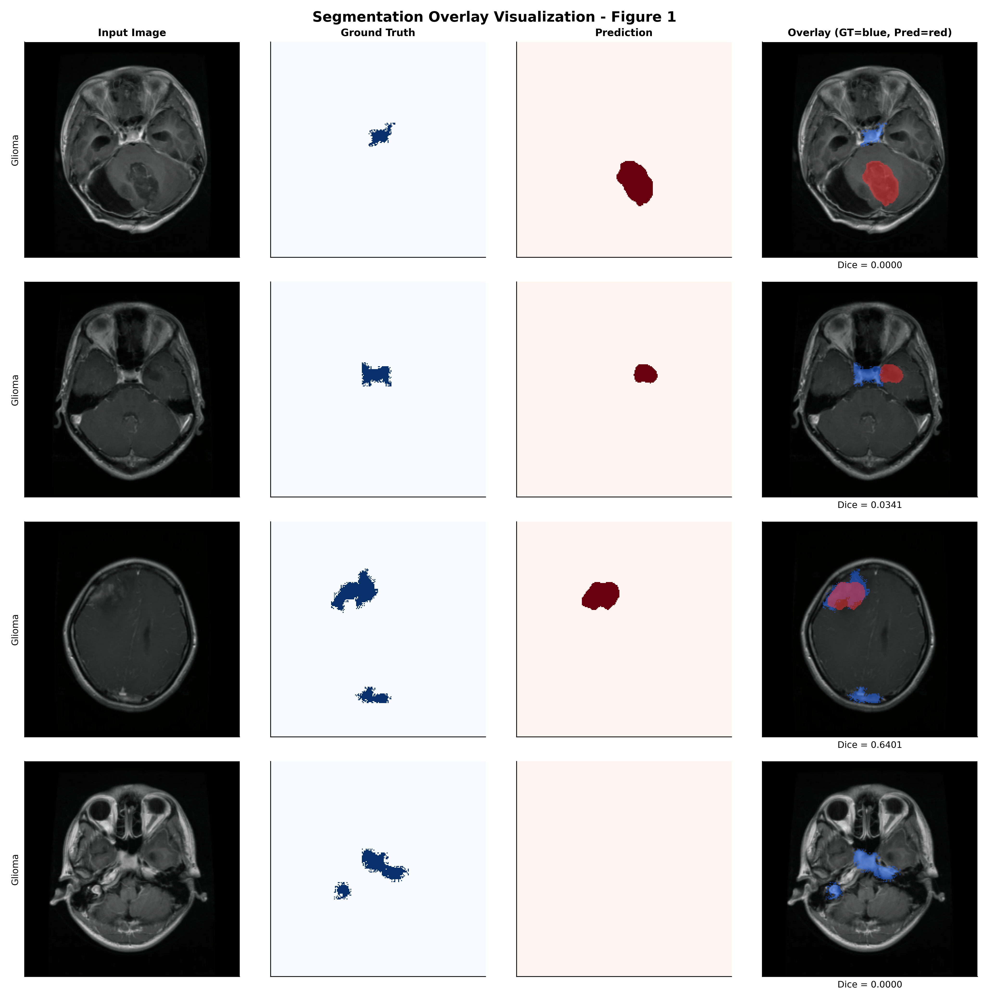

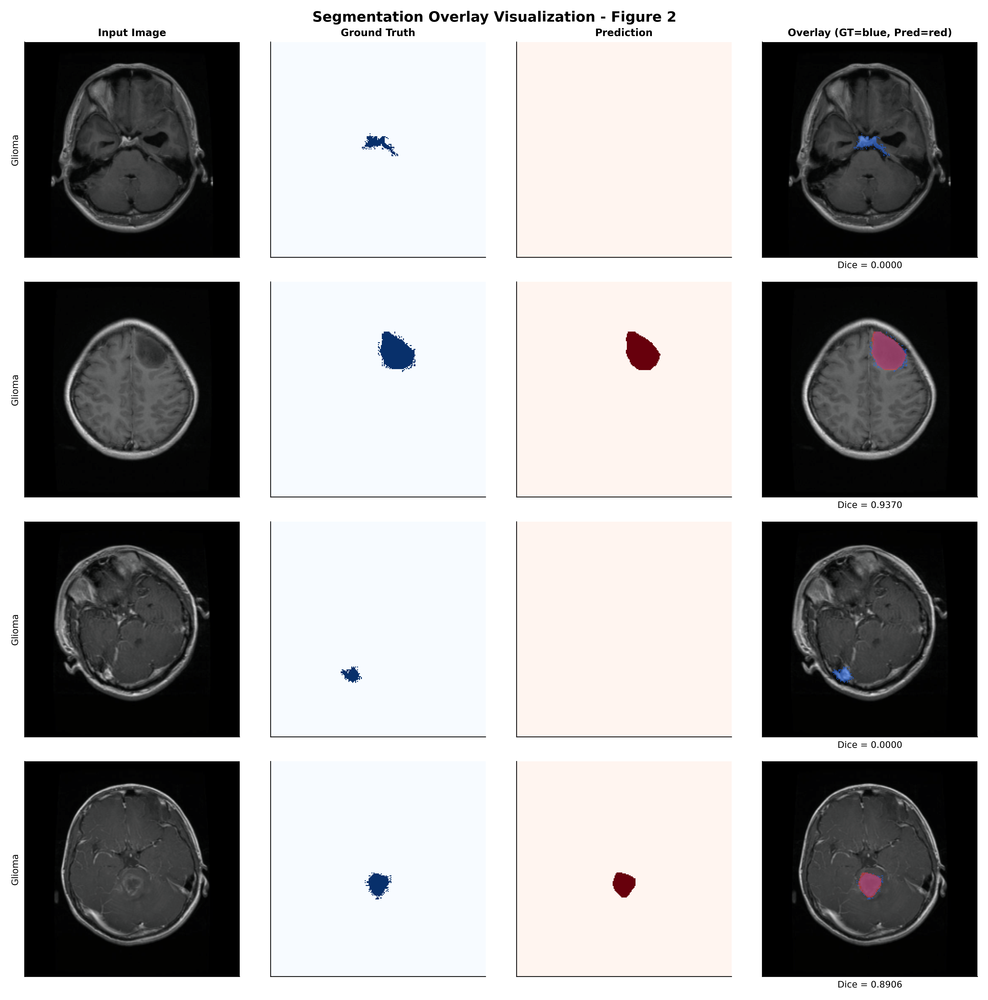

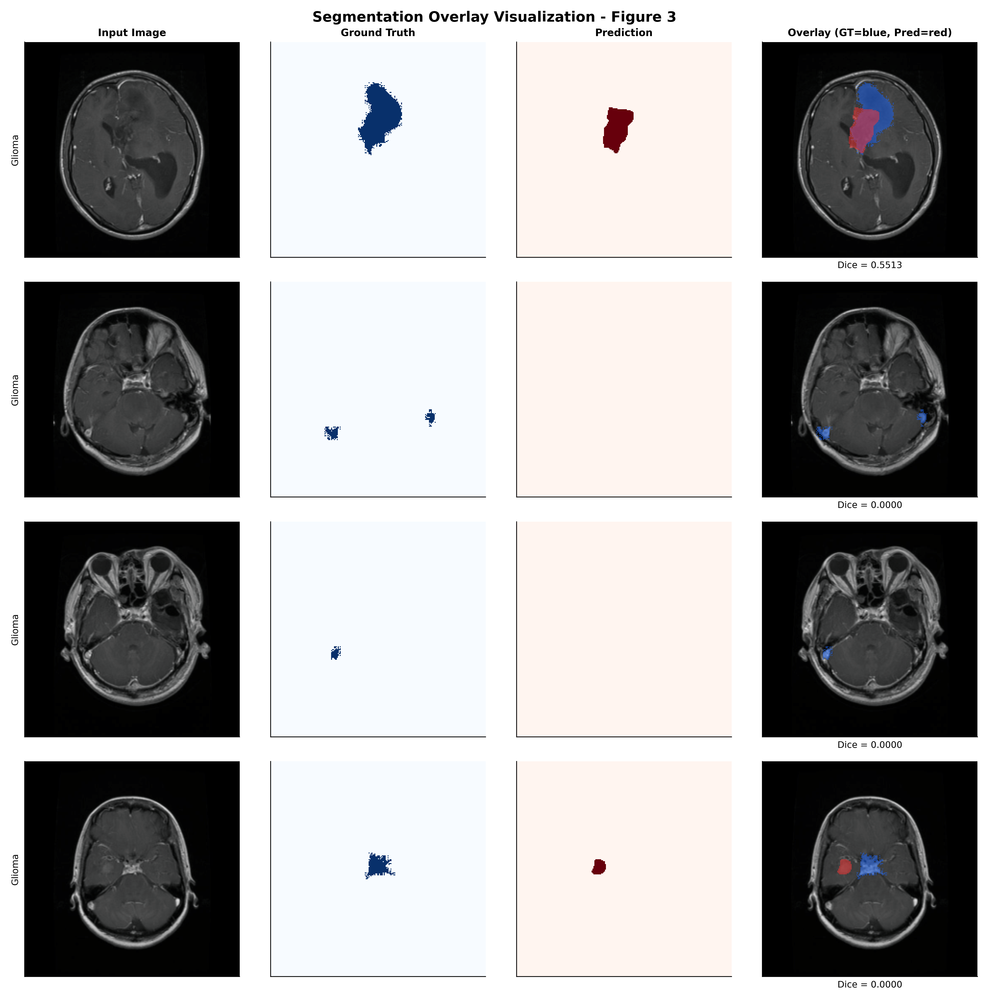

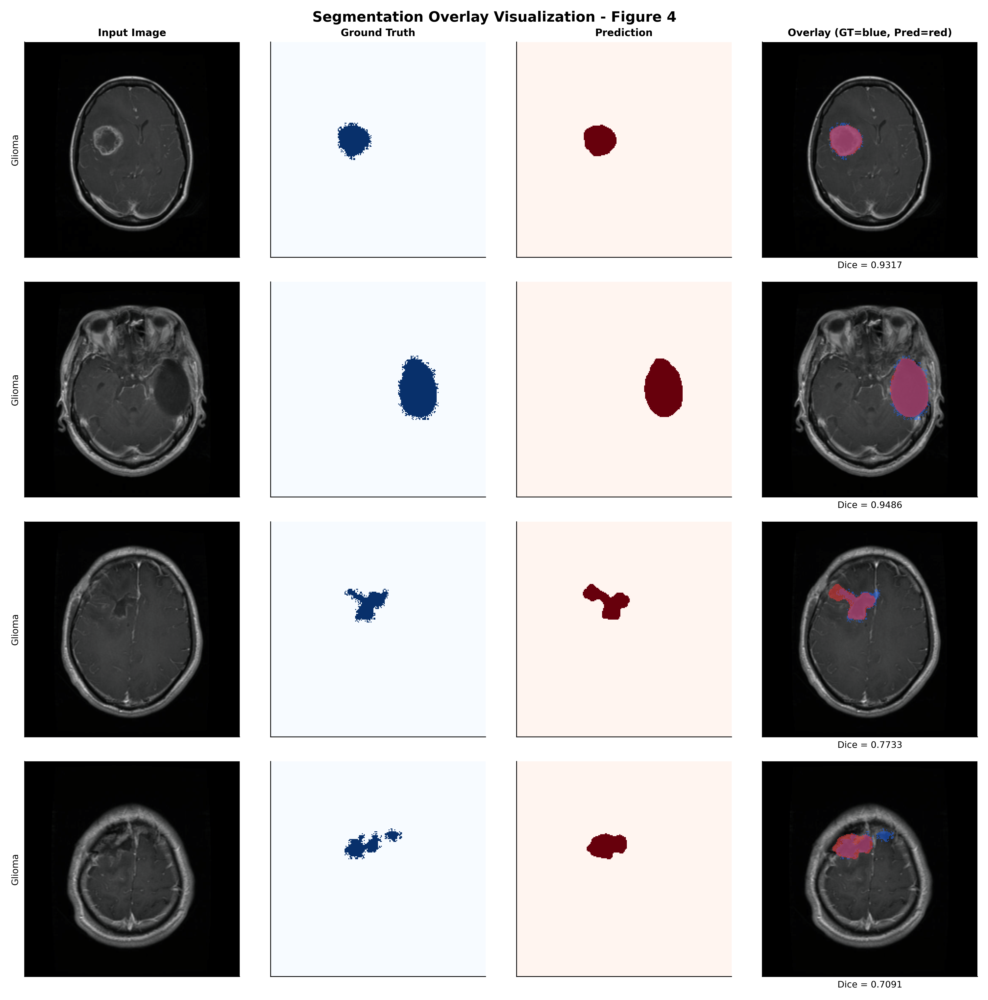

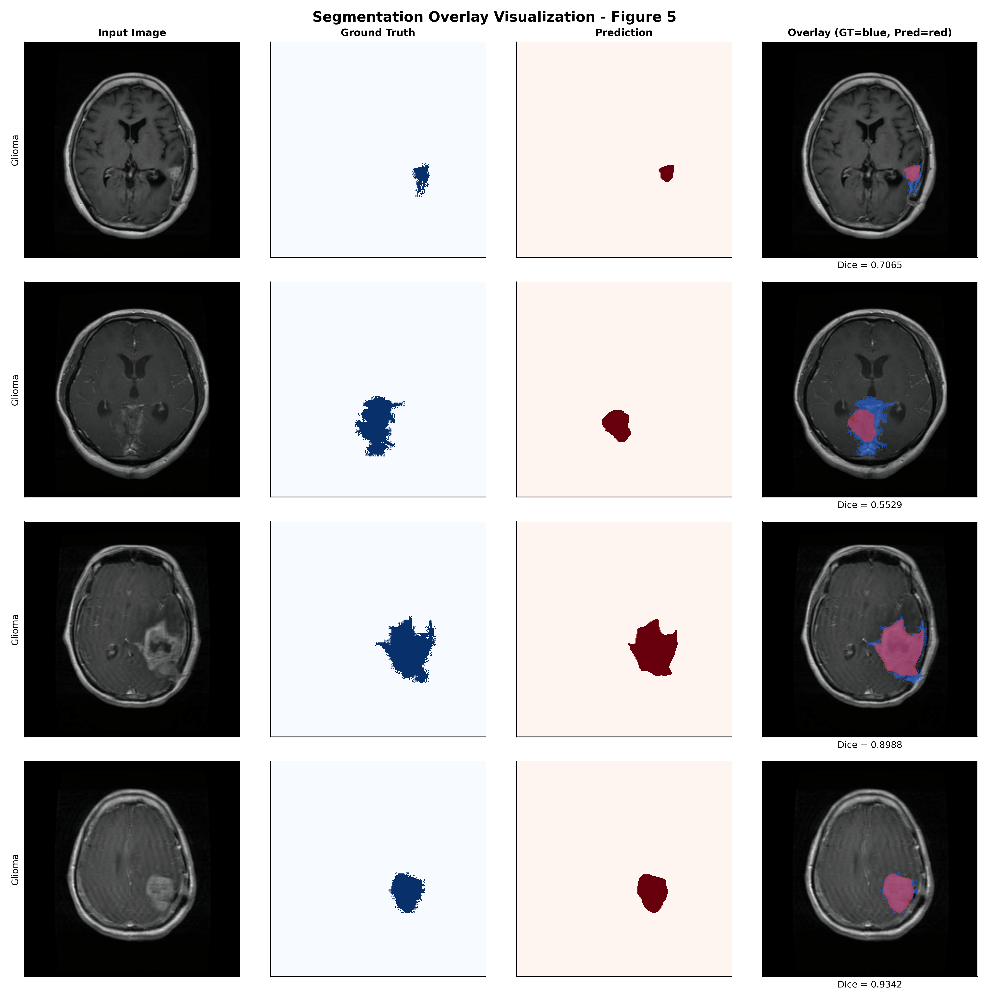

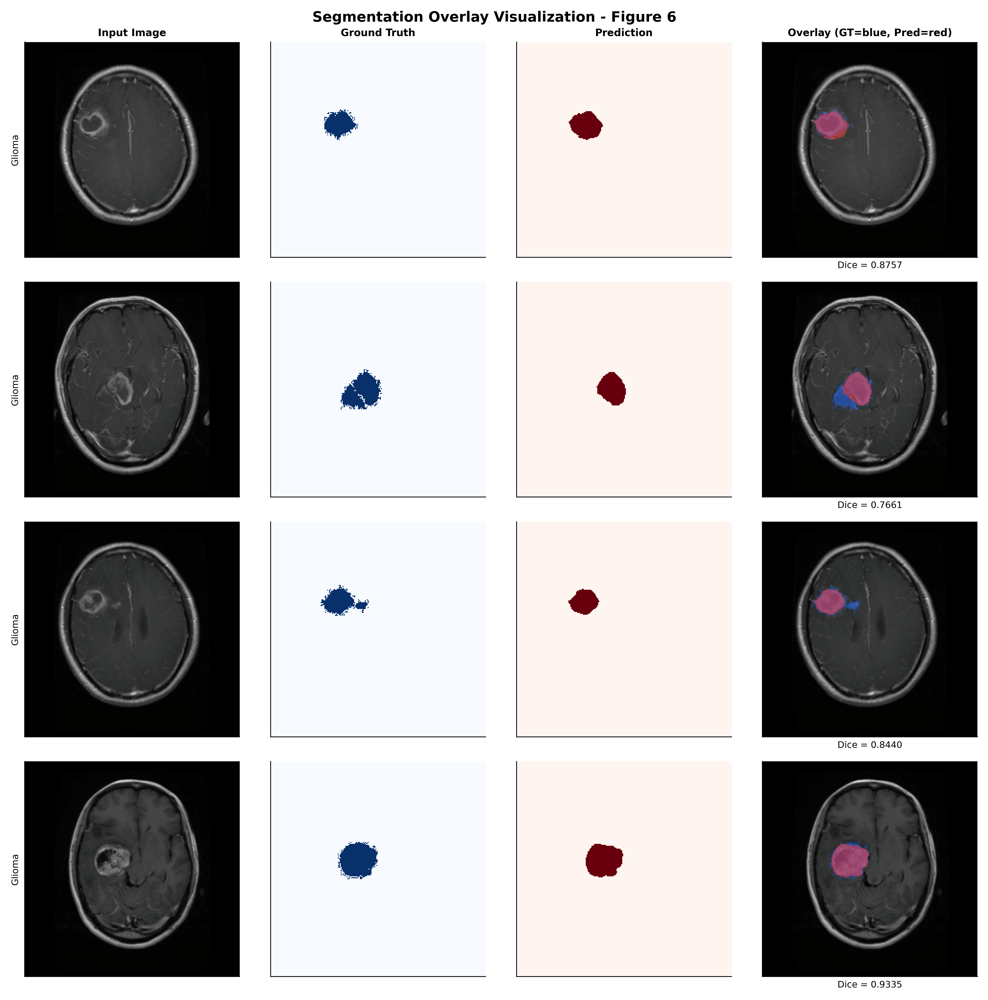

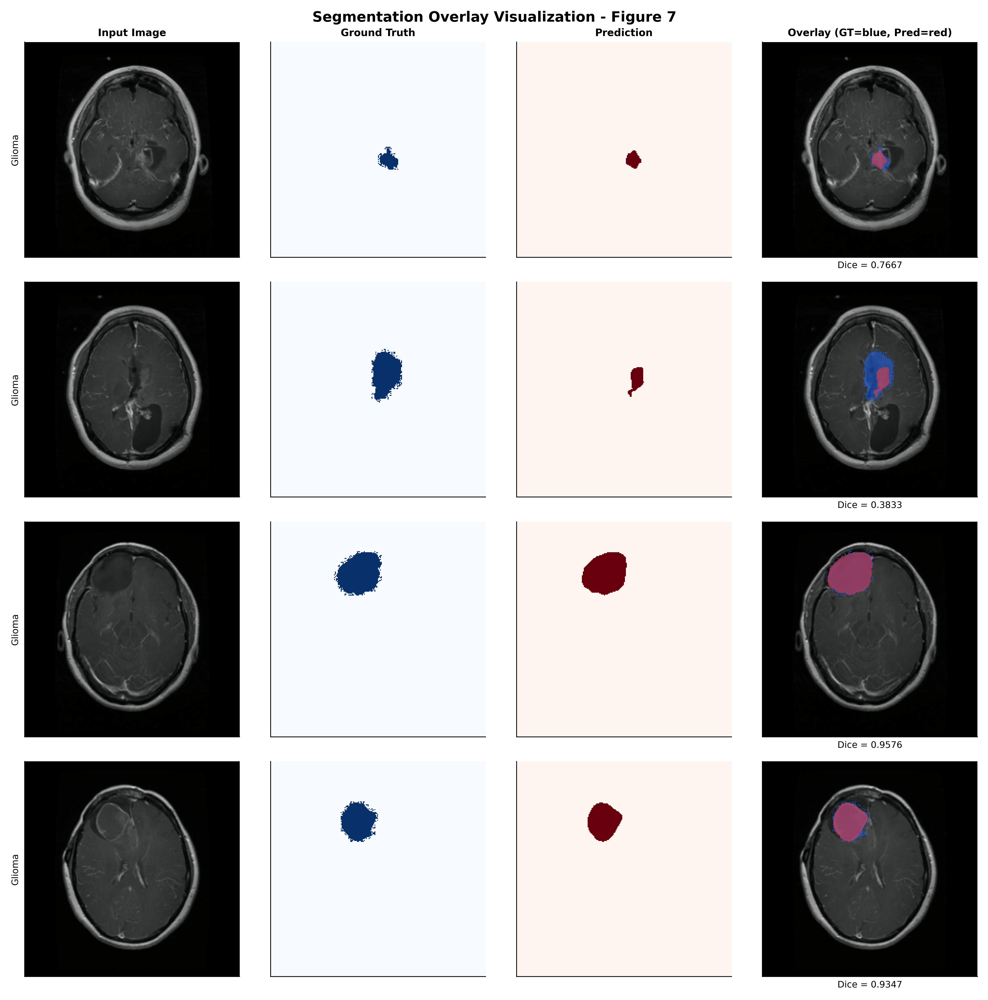

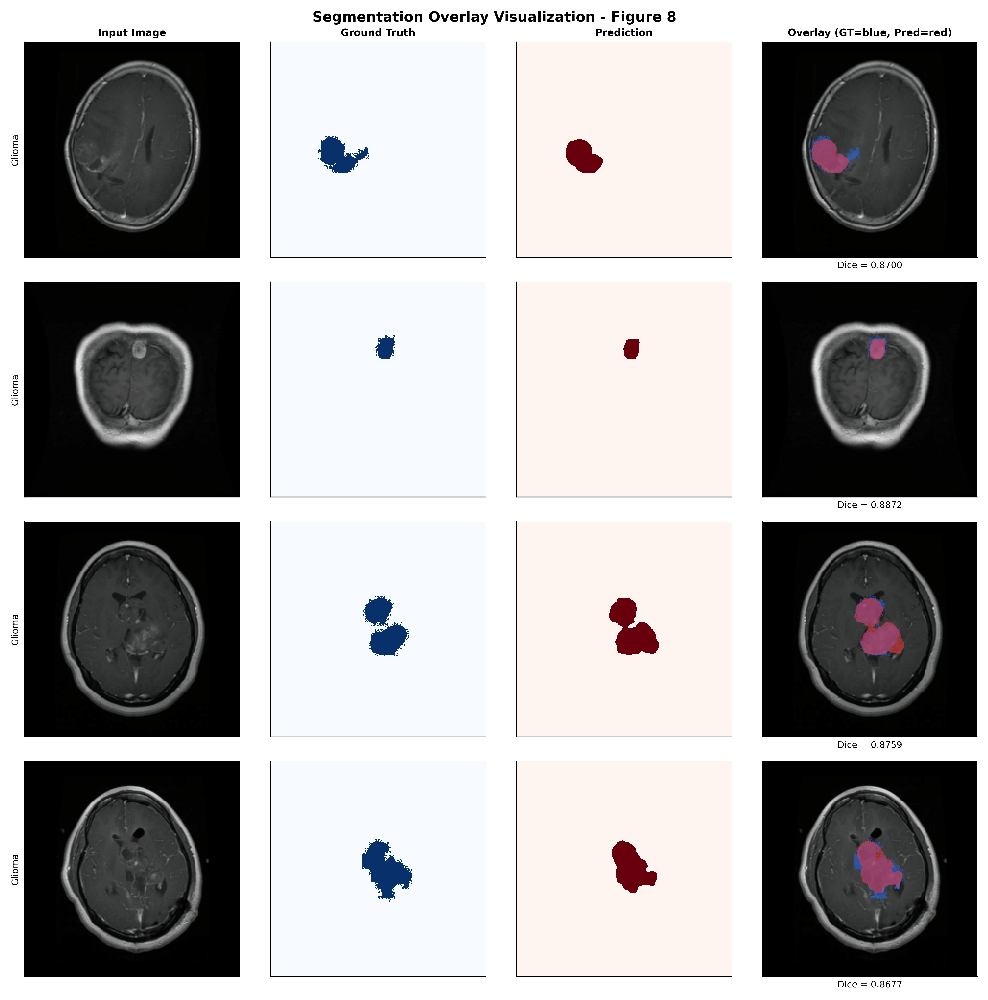

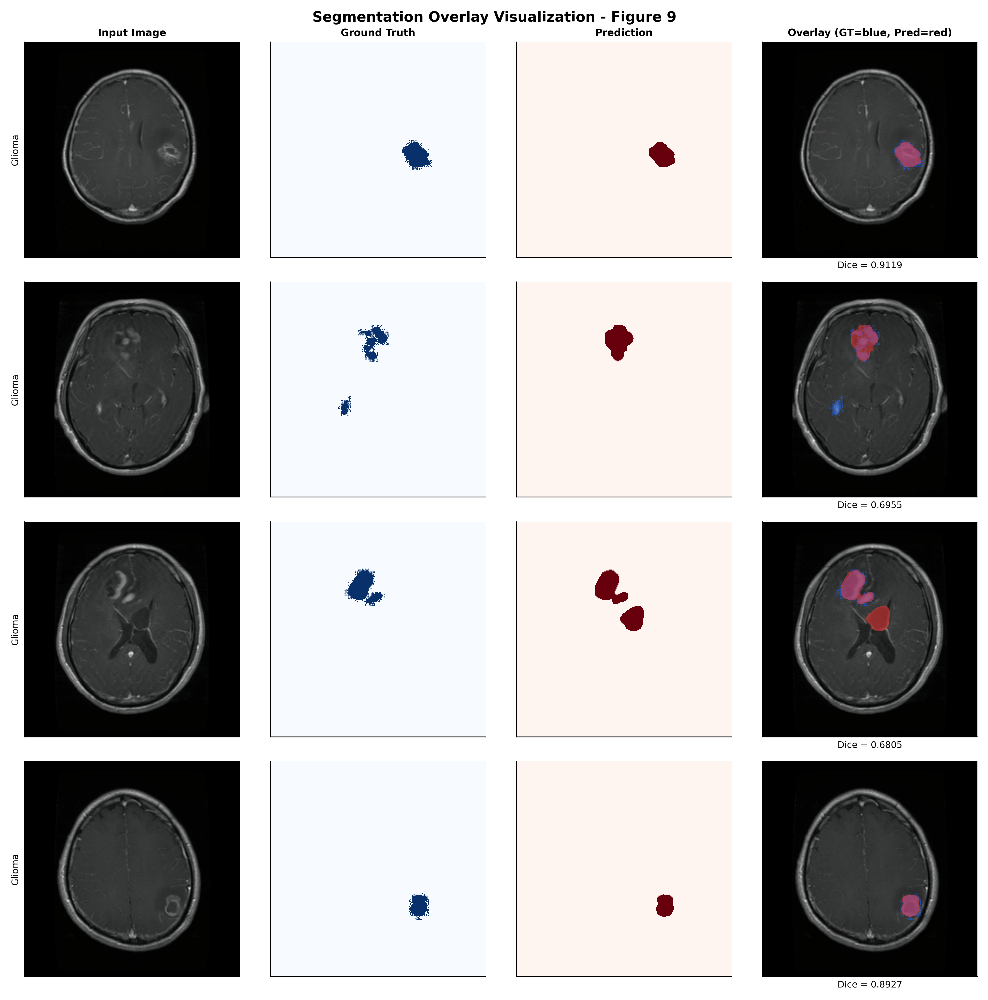

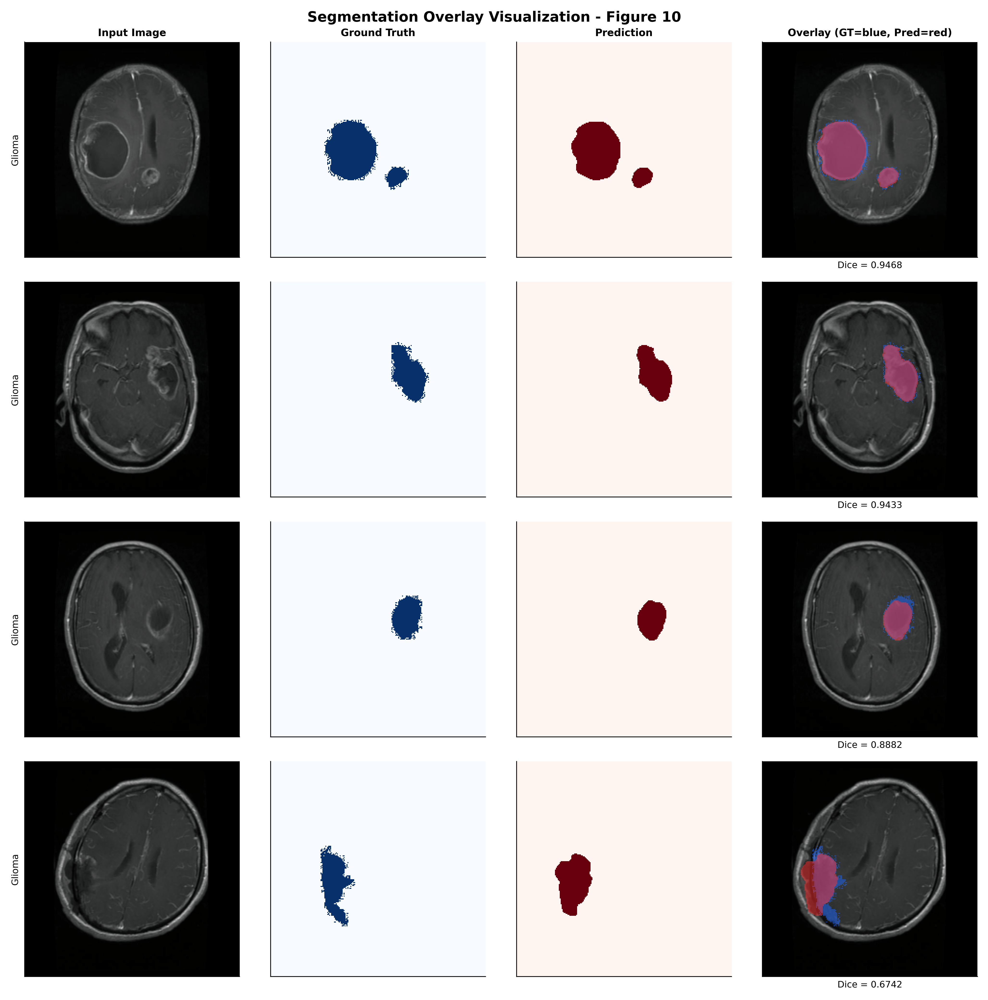

In [16]:
# ============================================================
# GENERATE 10 SEPARATE SEGMENTATION FIGURES
# Each figure = 4 cases like your screenshot
# Total figures = 10
# Total samples used = 40
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

# Fix Image conflict problem
from PIL import Image as PILImage
Image = PILImage

from IPython.display import Image as IPyImage, display

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------
NUM_FIGURES = 10
SAMPLES_PER_FIGURE = 4
TOTAL_SAMPLES = NUM_FIGURES * SAMPLES_PER_FIGURE

# Collect 40 samples for 10 figures
seg_samples_many = collect_seg_predictions(
    seg_test_loader,
    max_samples=TOTAL_SAMPLES,
    model_ref=model
)

print(f"Collected {len(seg_samples_many)} segmentation samples.")

# ------------------------------------------------------------
# Function: one figure with 4 rows like your screenshot
# ------------------------------------------------------------
def save_seg_overlay_figure(seg_samples, save_path, fig_no):
    n = min(len(seg_samples), SAMPLES_PER_FIGURE)

    if n == 0:
        print(f"No samples for Figure {fig_no}")
        return

    fig, axes = plt.subplots(
        n, 4,
        figsize=(14, 3.5 * n),
        dpi=300
    )

    if n == 1:
        axes = axes[np.newaxis, :]

    col_titles = [
        "Input Image",
        "Ground Truth",
        "Prediction",
        "Overlay (GT=blue, Pred=red)"
    ]

    for col, title in enumerate(col_titles):
        axes[0, col].set_title(title, fontweight="bold", fontsize=10)

    for row, (img_np, mask_np, pred_np, dice, lbl) in enumerate(seg_samples[:n]):

        # Input image
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_ylabel(
            DISPLAY_NAMES[lbl] if 0 <= lbl < NUM_CLASSES else "Unknown",
            fontsize=9,
            rotation=90,
            labelpad=5
        )

        # Ground truth
        axes[row, 1].imshow(mask_np, cmap="Blues", vmin=0, vmax=1)

        # Prediction
        axes[row, 2].imshow(pred_np, cmap="Reds", vmin=0, vmax=1)

        # Overlay
        gt_rgba = np.zeros((*mask_np.shape, 4))
        gt_rgba[mask_np > 0.5] = [0.1, 0.4, 1.0, 0.50]

        pr_rgba = np.zeros((*pred_np.shape, 4))
        pr_rgba[pred_np > 0.5] = [1.0, 0.2, 0.2, 0.50]

        axes[row, 3].imshow(img_np)
        axes[row, 3].imshow(gt_rgba)
        axes[row, 3].imshow(pr_rgba)
        axes[row, 3].set_xlabel(f"Dice = {dice:.4f}", fontsize=9)

    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    fig.suptitle(
        f"Segmentation Overlay Visualization - Figure {fig_no}",
        fontsize=14,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.close()

    print(f"Saved: {save_path}")


# ------------------------------------------------------------
# Generate 10 separate figures
# ------------------------------------------------------------
generated_files = []

for fig_idx in range(NUM_FIGURES):
    start = fig_idx * SAMPLES_PER_FIGURE
    end = start + SAMPLES_PER_FIGURE

    samples_chunk = seg_samples_many[start:end]

    if len(samples_chunk) == 0:
        break

    save_path = os.path.join(
        FIG_DIR,
        f"seg_overlay_figure_{fig_idx + 1:02d}.png"
    )

    save_seg_overlay_figure(
        samples_chunk,
        save_path,
        fig_no=fig_idx + 1
    )

    generated_files.append(save_path)

print("\nAll generated figures:")
for f in generated_files:
    print(f)

# Display all 10 figures in notebook
for f in generated_files:
    display(IPyImage(filename=f))

## Explainable AI add-on — fixed restart-safe version

Run the **ONE-CELL XAI AFTER KERNEL / PC RESTART** code cell below. It now automatically rebuilds and loads the saved checkpoint when `model` is missing, so you do **not** need to run the old interface cell first.

It adds:

- Predicted segmentation boundary as a yellow shape line
- Grad-CAM
- Integrated Gradients for MRI pixels and 262 handcrafted fingerprint features
- Full-model occlusion sensitivity with fingerprint recomputation
- LIME superpixel explanations
- SHAP expected-gradient explanations
- Classification and backbone gate values
- One complete XAI report figure

No retraining is performed.


In [1]:

# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\ntry:\n    import gradio as gr\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "gradio"])\n    import gradio as gr\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for interface.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n\n\n# ============================================================\n# GRADIO INTERFACE - FIXED VERSION\n# ============================================================\n\ntry:\n    demo.close()\nexcept Exception:\n    pass\n\ndemo = gr.Interface(\n    fn=predict_brain_tumor,\n    inputs=gr.Image(type="pil", label="Upload Brain MRI Image"),\n    outputs=[\n        gr.Image(type="pil", label="Input MRI"),\n        gr.Image(type="pil", label="Tumor Region Overlay"),\n        gr.Textbox(label="Classification and Detection Result", lines=12),\n        gr.Image(type="pil", label="Binary Tumor Mask")\n    ],\n    title="Brain Tumor Classification and Segmentation",\n    description=(\n        "Upload a brain MRI image. The saved multitask model will classify "\n        "the tumor type and detect the tumor region."\n    ),\n    flagging_mode="never"   # fixed for your Gradio version\n)\n\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# Install only missing packages
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name
        ])
        return __import__(import_name)

_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")

from captum.attr import IntegratedGradients, LayerGradCam, LayerAttribution
from lime import lime_image
from skimage.measure import find_contours
from skimage.segmentation import slic, mark_boundaries
import shap


# ------------------------------------------------------------
# 1. WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Return only classification logits from the multitask dictionary."""
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Return one target-class logit for SHAP GradientExplainer."""
    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


# ------------------------------------------------------------
# 2. IMPORTANT FIX FOR YOUR FROZEN BACKBONES
# ------------------------------------------------------------
# Your TimmSpatialBackbone.forward uses torch.no_grad() when
# freeze=True. That blocks input gradients required by IG/SHAP.
# This context temporarily changes only the "freeze" flag.
# Backbone parameters remain requires_grad=False and unchanged.

@contextlib.contextmanager
def xai_gradient_mode(base_model):
    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False
    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 3. GENERAL IMAGE HELPERS
# ------------------------------------------------------------

def normalize_map(a):
    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = a - a.min()
    mx = float(a.max())
    if mx > 1e-8:
        a = a / mx
    return a


def heatmap_overlay(pil_img, saliency, alpha=0.45):
    """Overlay a normalized heatmap on the MRI."""
    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32
    ) / 255.0

    s = normalize_map(saliency)
    cmap = plt.get_cmap("jet")
    heat = cmap(s)[..., :3]

    out = (1.0 - alpha) * base + alpha * heat
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def contour_overlay(pil_img, mask_prob, threshold=0.50):
    """
    Draw the segmentation boundary as a shape line.
    Yellow line = predicted tumor contour.
    """
    img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mask = np.asarray(mask_prob, dtype=np.float32) > float(threshold)

    if mask.sum() < 20:
        mask = np.asarray(mask_prob, dtype=np.float32) > 0.35

    out = img.copy()
    draw = ImageDraw.Draw(out)

    if mask.sum() >= 20:
        for contour in find_contours(mask.astype(np.float32), 0.5):
            points = [(float(col), float(row)) for row, col in contour]
            if len(points) >= 2:
                draw.line(points, fill=(255, 255, 0), width=2)

    return out


def batch_predict_uint8(images_uint8, batch_size=16):
    """
    Full-model prediction from raw RGB arrays.
    Fingerprints are recomputed for every perturbed image.
    This is required for LIME and occlusion faithfulness.
    """
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), batch_size):
        chunk = arrays[start:start + batch_size]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


# ------------------------------------------------------------
# 4. PREDICTION, SEGMENTATION, AND GATE VALUES
# ------------------------------------------------------------

def predict_with_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for fusion in model.encoder.fusions:
        handles.append(
            fusion.gates.register_forward_hook(
                lambda module, inp, out: spatial_gate_outputs.append(
                    out.detach().cpu()
                )
            )
        )

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(
                out.detach().cpu()
            )
        )
    )

    with torch.no_grad():
        outputs = model(x, fp)
        probs = torch.softmax(outputs["cls_logits"], dim=1)[0]
        seg_prob = torch.sigmoid(outputs["seg_logits"])[0, 0]

    for h in handles:
        h.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gates = np.stack(
            [g[0].numpy() for g in spatial_gate_outputs],
            axis=0
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "seg_prob": seg_prob.detach().cpu().numpy(),
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i+1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(figsize=(max(8, len(names) * 1.6), 4), dpi=160)
    im = ax.imshow(spatial_gates, vmin=0, vmax=1, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels([f"Encoder level {i+1}" for i in range(spatial_gates.shape[0])])
    ax.set_title("Spatial backbone gate values, 0 to 1")
    fig.colorbar(im, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 5. GRAD-CAM
# ------------------------------------------------------------

def compute_gradcam(x, fp, target_idx):
    # Last fused encoder convolution is the correct shared spatial layer
    target_layer = model.encoder.fusions[-1].reduce[0]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        gradcam = LayerGradCam(cls_model, target_layer)
        cam = gradcam.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
            relu_attributions=True
        )
        cam = LayerAttribution.interpolate(
            cam,
            interpolate_dims=(IMG_SIZE, IMG_SIZE),
            interpolate_mode="bilinear"
        )

    return normalize_map(cam[0, 0].detach().cpu().numpy())


# ------------------------------------------------------------
# 6. INTEGRATED GRADIENTS FOR BOTH MODEL INPUTS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean", "std", "skewness", "kurtosis", "entropy", "foreground_ratio"
]


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    # A strongly blurred MRI is a more useful baseline than random noise.
    baseline_img = pil_img.filter(ImageFilter.GaussianBlur(radius=14))
    bx, bfp, _ = preprocess_input_image(baseline_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return normalize_map(pixel_map), fp_values, delta_value


# ------------------------------------------------------------
# 7. FULL-MODEL OCCLUSION
# ------------------------------------------------------------

def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=40,
    stride=24,
    batch_size=16
):
    img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(img, dtype=np.uint8)

    base_prob = float(batch_predict_uint8([arr])[0, int(target_idx)])
    blurred = np.asarray(
        img.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8
    )

    variants = []
    positions = []

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), stride))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), stride))

    if not y_starts or y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if not x_starts or x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            occluded = arr.copy()
            occluded[y:y + patch_size, x0:x0 + patch_size] = \
                blurred[y:y + patch_size, x0:x0 + patch_size]
            variants.append(occluded)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=batch_size
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for p, (y, x0) in zip(probs, positions):
        drop = base_prob - float(p)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    positive_support = np.maximum(heat, 0.0)

    return normalize_map(positive_support), base_prob


# ------------------------------------------------------------
# 8. LIME WITH FINGERPRINT RECOMPUTATION
# ------------------------------------------------------------

def compute_lime(pil_img, target_idx, num_samples=400):
    img_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=16)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=10,
            sigma=1,
            start_label=0
        )

    explainer = lime_image.LimeImageExplainer(random_state=2025)
    explanation = explainer.explain_instance(
        image=img_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=0,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 9. SHAP EXPECTED-GRADIENT EXPLANATION
# ------------------------------------------------------------

def compute_shap(pil_img, x, fp, target_idx, nsamples=64):
    # For final experiments, replace these fallback baselines with
    # 10 to 20 representative training MRI images.
    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new(
            "RGB",
            (IMG_SIZE, IMG_SIZE),
            tuple(np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8))
        )
    ]

    bg_x, bg_fp = [], []
    for b in baseline_pils:
        bx, bfp, _ = preprocess_input_image(b)
        bg_x.append(bx)
        bg_fp.append(bfp)

    bg_x = torch.cat(bg_x, dim=0)
    bg_fp = torch.cat(bg_fp, dim=0)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples)
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP return format. Expected image and fingerprint values."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    # Remove optional final singleton output dimension
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return normalize_map(pixel_map), fp_values


# ------------------------------------------------------------
# 10. TOP FINGERPRINT FEATURES
# ------------------------------------------------------------

def top_fp_features(values, top_k=10):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}", float(values[i]))
        for i in order
    ]


# ------------------------------------------------------------
# 11. COMPOSITE FIGURE
# ------------------------------------------------------------

def make_composite(panels, title):
    n = len(panels)
    cols = 3
    rows = int(math.ceil(n / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(15, 4.7 * rows), dpi=170)
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=11, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=15, fontweight="bold")
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 12. RUN THE COMPLETE XAI ANALYSIS
# ------------------------------------------------------------

def explain_brain_tumor(
    input_img,
    run_lime=True,
    run_shap=True,
    ig_steps=32,
    lime_samples=400,
    shap_samples=64
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_with_details(input_img)

    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]
    seg_prob = details["seg_prob"]

    panels = [
        ("Input MRI", img),
        ("Segmentation shape line", contour_overlay(img, seg_prob)),
        ("Segmentation probability", heatmap_overlay(img, seg_prob)),
    ]

    gradcam_map = compute_gradcam(x, fp, pred_idx)
    panels.append(("Grad-CAM", heatmap_overlay(img, gradcam_map)))

    ig_map, ig_fp, ig_delta = compute_integrated_gradients(
        img, x, fp, pred_idx, n_steps=ig_steps
    )
    panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))

    occ_map, base_prob = compute_occlusion(img, pred_idx)
    panels.append(("Occlusion sensitivity", heatmap_overlay(img, occ_map)))

    lime_status = "Not run"
    if bool(run_lime):
        try:
            panels.append((
                "LIME positive superpixels",
                compute_lime(img, pred_idx, num_samples=lime_samples)
            ))
            lime_status = "Completed"
        except Exception as e:
            lime_status = f"Failed: {type(e).__name__}: {e}"

    shap_status = "Not run"
    shap_fp = None
    if bool(run_shap):
        try:
            shap_map, shap_fp = compute_shap(
                img, x, fp, pred_idx, nsamples=shap_samples
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            shap_status = "Completed"
        except Exception as e:
            shap_status = f"Failed: {type(e).__name__}: {e}"

    gate_img = gate_heatmap_image(details["spatial_gates"])
    if gate_img is not None:
        panels.append(("Backbone gate values", gate_img))

    composite = make_composite(
        panels,
        title=f"XAI report: {pred_class}"
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        "",
        "Class probabilities:"
    ]

    for cname, p in zip(class_names, probs):
        lines.append(f"  {cname}: {p:.4f}")

    if details["cls_gates"] is not None:
        cg = details["cls_gates"]
        lines.extend([
            "",
            "Classification gate values, not percentages:"
        ])
        if len(cg) >= 1:
            lines.append(f"  Deep fused image stream: {cg[0]:.4f}")
        if len(cg) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cg[1]:.4f}")

    lines.extend([
        "",
        f"Integrated Gradients convergence delta: {ig_delta:.6f}",
        f"Occlusion baseline target probability: {base_prob:.4f}",
        f"LIME status: {lime_status}",
        f"SHAP status: {shap_status}",
        "",
        "Top Integrated Gradients fingerprint features:"
    ])

    for name, value in top_fp_features(ig_fp, top_k=10):
        lines.append(f"  {name}: {value:+.6f}")

    if shap_fp is not None:
        lines.extend(["", "Top SHAP fingerprint features:"])
        for name, value in top_fp_features(shap_fp, top_k=10):
            lines.append(f"  {name}: {value:+.6f}")

    lines.extend([
        "",
        "Interpretation note:",
        "The segmentation contour shows the model's predicted tumor boundary.",
        "Grad-CAM, IG, occlusion, LIME, and SHAP show evidence used for classification.",
        "They are supporting explanations, not proof that the diagnosis is correct."
    ])

    return composite, "\n".join(lines)


# ------------------------------------------------------------
# 13. OPTIONAL GRADIO XAI INTERFACE
# ------------------------------------------------------------

try:
    demo.close()
except Exception:
    pass

xai_demo = gr.Interface(
    fn=explain_brain_tumor,
    inputs=[
        gr.Image(type="pil", label="Upload Brain MRI"),
        gr.Checkbox(value=True, label="Run LIME, slower"),
        gr.Checkbox(value=True, label="Run SHAP, slower"),
        gr.Slider(16, 96, value=32, step=8, label="IG steps"),
        gr.Slider(100, 1000, value=400, step=100, label="LIME samples"),
        gr.Slider(32, 256, value=64, step=32, label="SHAP samples"),
    ],
    outputs=[
        gr.Image(type="pil", label="Complete XAI figure"),
        gr.Textbox(label="Prediction and XAI details", lines=30),
    ],
    title="Brain Tumor Classification, Segmentation, and Explainability",
    description=(
        "Yellow contour = predicted tumor boundary. "
        "Grad-CAM, Integrated Gradients, occlusion, LIME, and SHAP explain "
        "the classification decision. LIME and SHAP take more time."
    ),
    flagging_mode="never"
)

print("XAI functions are ready.")
print("Run: xai_demo.launch(share=True)")


Model not found in current kernel. Loading saved checkpoint automatically...
Device: cuda
Using model: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\BRISC2025_final_best_multitask_model.pth

Checkpoint loaded.
Classes: ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']
IMG_SIZE: 224

Loading backbones:
  [OK] convnext_base | channels=[128, 256, 512, 1024]
  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160]
  [OK] densenet201 | channels=[64, 256, 512, 1792]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768]

Model loaded successfully.
Ready for interface.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
XAI functions are ready.
Ru

In [4]:
xai_demo.launch(share=True)

* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://1e816aa01a101c738a.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


  0%|          | 0/400 [00:00<?, ?it/s]

  0%|          | 0/400 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [3]:
# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\ntry:\n    import gradio as gr\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "gradio"])\n    import gradio as gr\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for interface.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n\n\n# ============================================================\n# GRADIO INTERFACE - FIXED VERSION\n# ============================================================\n\ntry:\n    demo.close()\nexcept Exception:\n    pass\n\ndemo = gr.Interface(\n    fn=predict_brain_tumor,\n    inputs=gr.Image(type="pil", label="Upload Brain MRI Image"),\n    outputs=[\n        gr.Image(type="pil", label="Input MRI"),\n        gr.Image(type="pil", label="Tumor Region Overlay"),\n        gr.Textbox(label="Classification and Detection Result", lines=12),\n        gr.Image(type="pil", label="Binary Tumor Mask")\n    ],\n    title="Brain Tumor Classification and Segmentation",\n    description=(\n        "Upload a brain MRI image. The saved multitask model will classify "\n        "the tumor type and detect the tumor region."\n    ),\n    flagging_mode="never"   # fixed for your Gradio version\n)\n\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# Install only missing packages
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name
        ])
        return __import__(import_name)

_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")

from captum.attr import IntegratedGradients
from lime import lime_image
from skimage.measure import find_contours
from skimage.segmentation import slic, mark_boundaries
import shap


# ------------------------------------------------------------
# 1. WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Return only classification logits from the multitask dictionary."""
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Return one target-class logit for SHAP GradientExplainer."""
    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


# ------------------------------------------------------------
# 2. IMPORTANT FIX FOR YOUR FROZEN BACKBONES
# ------------------------------------------------------------
# Your TimmSpatialBackbone.forward uses torch.no_grad() when
# freeze=True. That blocks input gradients required by IG/SHAP.
# This context temporarily changes only the "freeze" flag.
# Backbone parameters remain requires_grad=False and unchanged.

@contextlib.contextmanager
def xai_gradient_mode(base_model):
    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False
    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 3. GENERAL IMAGE HELPERS
# ------------------------------------------------------------

def normalize_map(a):
    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = a - a.min()
    mx = float(a.max())
    if mx > 1e-8:
        a = a / mx
    return a


def heatmap_overlay(pil_img, saliency, alpha=0.45):
    """Overlay a normalized heatmap on the MRI."""
    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32
    ) / 255.0

    s = normalize_map(saliency)
    cmap = plt.get_cmap("jet")
    heat = cmap(s)[..., :3]

    out = (1.0 - alpha) * base + alpha * heat
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def contour_overlay(pil_img, mask_prob, threshold=0.50):
    """
    Draw the segmentation boundary as a shape line.
    Yellow line = predicted tumor contour.
    """
    img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mask = np.asarray(mask_prob, dtype=np.float32) > float(threshold)

    if mask.sum() < 20:
        mask = np.asarray(mask_prob, dtype=np.float32) > 0.35

    out = img.copy()
    draw = ImageDraw.Draw(out)

    if mask.sum() >= 20:
        for contour in find_contours(mask.astype(np.float32), 0.5):
            points = [(float(col), float(row)) for row, col in contour]
            if len(points) >= 2:
                draw.line(points, fill=(255, 255, 0), width=2)

    return out


def batch_predict_uint8(images_uint8, batch_size=16):
    """
    Full-model prediction from raw RGB arrays.
    Fingerprints are recomputed for every perturbed image.
    This is required for LIME and occlusion faithfulness.
    """
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), batch_size):
        chunk = arrays[start:start + batch_size]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


# ------------------------------------------------------------
# 4. PREDICTION, SEGMENTATION, AND GATE VALUES
# ------------------------------------------------------------

def predict_with_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for fusion in model.encoder.fusions:
        handles.append(
            fusion.gates.register_forward_hook(
                lambda module, inp, out: spatial_gate_outputs.append(
                    out.detach().cpu()
                )
            )
        )

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(
                out.detach().cpu()
            )
        )
    )

    with torch.no_grad():
        outputs = model(x, fp)
        probs = torch.softmax(outputs["cls_logits"], dim=1)[0]
        seg_prob = torch.sigmoid(outputs["seg_logits"])[0, 0]

    for h in handles:
        h.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gates = np.stack(
            [g[0].numpy() for g in spatial_gate_outputs],
            axis=0
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "seg_prob": seg_prob.detach().cpu().numpy(),
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i+1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(figsize=(max(8, len(names) * 1.6), 4), dpi=160)
    im = ax.imshow(spatial_gates, vmin=0, vmax=1, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels([f"Encoder level {i+1}" for i in range(spatial_gates.shape[0])])
    ax.set_title("Spatial backbone gate values, 0 to 1")
    fig.colorbar(im, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 5. FINAL-FUSED GRAD-CAM FROM ALL LOADED BACKBONES
# ------------------------------------------------------------

def _normalize_cam(cam, percentile=99.5):
    """Stable CAM normalization without amplifying near-zero numerical noise."""
    cam = np.asarray(cam, dtype=np.float32)
    cam = np.nan_to_num(cam, nan=0.0, posinf=0.0, neginf=0.0)
    cam = np.maximum(cam, 0.0)

    scale = float(np.percentile(cam, percentile))
    if scale <= 1e-10:
        return np.zeros_like(cam, dtype=np.float32)

    return np.clip(cam / scale, 0.0, 1.0)


def compute_final_fused_gradcam(x, fp, target_idx):
    """
    Generate a class-specific Grad-CAM directly from the FINAL FUSED FEATURE
    tensor produced by all loaded backbones.

    Important architecture path:
        final feature of every backbone
            -> model.encoder.fusions[-1](...)
            -> final fused tensor feats[-1]
            -> global average pooling
            -> image/fingerprint gated classifier
            -> target-class logit

    The hook is placed on model.encoder.fusions[-1] itself, not on reduce[0].
    Therefore the captured tensor is the exact post-projection, post-spatial-gate,
    post-concatenation, post-reduction fused feature used by classification.
    """
    final_fusion = model.encoder.fusions[-1]
    captured = {}

    def _capture_final_fused_feature(module, inputs, output):
        if not torch.is_tensor(output) or output.ndim != 4:
            raise RuntimeError(
                "Expected final fused feature to be a 4-D tensor [B,C,H,W], "
                f"but received {type(output).__name__}."
            )
        captured["activation"] = output

    handle = final_fusion.register_forward_hook(_capture_final_fused_feature)

    xg = x.detach().clone().requires_grad_(True)
    # The fingerprint remains part of the real classifier. Its value affects the
    # classification gate, but the CAM gradient is taken only with respect to the
    # final fused IMAGE feature tensor.
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            outputs = model(xg, fpg)

            if "activation" not in captured:
                raise RuntimeError("The final fused feature hook did not run.")

            activation = captured["activation"]
            target_score = outputs["cls_logits"][:, int(target_idx)].sum()

            gradients = torch.autograd.grad(
                outputs=target_score,
                inputs=activation,
                retain_graph=False,
                create_graph=False,
                allow_unused=False,
            )[0]

            # Standard Grad-CAM channel weights from the exact final fused tensor.
            channel_weights = gradients.mean(dim=(2, 3), keepdim=True)
            cam = torch.sum(channel_weights * activation, dim=1, keepdim=True)
            cam = F.relu(cam)

            cam = F.interpolate(
                cam,
                size=(IMG_SIZE, IMG_SIZE),
                mode="bilinear",
                align_corners=False,
            )

        cam_np = cam[0, 0].detach().cpu().numpy()
        backbone_names = list(getattr(model.encoder, "backbone_names", []))

        info = {
            "backbone_count": len(backbone_names),
            "backbone_names": backbone_names,
            "fused_shape": tuple(int(v) for v in activation.shape),
            "gradient_shape": tuple(int(v) for v in gradients.shape),
            "cam_max_before_normalization": float(np.max(cam_np)),
        }

        return _normalize_cam(cam_np), info

    finally:
        handle.remove()
        model.zero_grad(set_to_none=True)


def final_fused_feature_energy(x, fp):
    """
    Non-class-specific spatial energy of the same final fused feature tensor.
    This is included only as a diagnostic to verify where the fused encoder is
    active. The class-specific explanation is compute_final_fused_gradcam().
    """
    final_fusion = model.encoder.fusions[-1]
    captured = {}

    def _capture(module, inputs, output):
        captured["activation"] = output

    handle = final_fusion.register_forward_hook(_capture)
    try:
        with torch.no_grad():
            model(x, fp)
        activation = captured["activation"]
        energy = torch.sqrt(torch.mean(activation.float() ** 2, dim=1, keepdim=True))
        energy = F.interpolate(
            energy,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )
        return _normalize_cam(energy[0, 0].detach().cpu().numpy())
    finally:
        handle.remove()


# ------------------------------------------------------------
# 6. INTEGRATED GRADIENTS FOR BOTH MODEL INPUTS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean", "std", "skewness", "kurtosis", "entropy", "foreground_ratio"
]


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    # A strongly blurred MRI is a more useful baseline than random noise.
    baseline_img = pil_img.filter(ImageFilter.GaussianBlur(radius=14))
    bx, bfp, _ = preprocess_input_image(baseline_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return normalize_map(pixel_map), fp_values, delta_value


# ------------------------------------------------------------
# 7. FULL-MODEL OCCLUSION
# ------------------------------------------------------------

def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=40,
    stride=24,
    batch_size=16
):
    img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(img, dtype=np.uint8)

    base_prob = float(batch_predict_uint8([arr])[0, int(target_idx)])
    blurred = np.asarray(
        img.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8
    )

    variants = []
    positions = []

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), stride))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), stride))

    if not y_starts or y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if not x_starts or x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            occluded = arr.copy()
            occluded[y:y + patch_size, x0:x0 + patch_size] = \
                blurred[y:y + patch_size, x0:x0 + patch_size]
            variants.append(occluded)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=batch_size
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for p, (y, x0) in zip(probs, positions):
        drop = base_prob - float(p)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    positive_support = np.maximum(heat, 0.0)

    return normalize_map(positive_support), base_prob


# ------------------------------------------------------------
# 8. LIME WITH FINGERPRINT RECOMPUTATION
# ------------------------------------------------------------

def compute_lime(pil_img, target_idx, num_samples=400):
    img_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=16)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=10,
            sigma=1,
            start_label=0
        )

    explainer = lime_image.LimeImageExplainer(random_state=2025)
    explanation = explainer.explain_instance(
        image=img_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=0,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 9. SHAP EXPECTED-GRADIENT EXPLANATION
# ------------------------------------------------------------

def compute_shap(pil_img, x, fp, target_idx, nsamples=64):
    # For final experiments, replace these fallback baselines with
    # 10 to 20 representative training MRI images.
    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new(
            "RGB",
            (IMG_SIZE, IMG_SIZE),
            tuple(np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8))
        )
    ]

    bg_x, bg_fp = [], []
    for b in baseline_pils:
        bx, bfp, _ = preprocess_input_image(b)
        bg_x.append(bx)
        bg_fp.append(bfp)

    bg_x = torch.cat(bg_x, dim=0)
    bg_fp = torch.cat(bg_fp, dim=0)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples)
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP return format. Expected image and fingerprint values."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    # Remove optional final singleton output dimension
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return normalize_map(pixel_map), fp_values


# ------------------------------------------------------------
# 10. TOP FINGERPRINT FEATURES
# ------------------------------------------------------------

def top_fp_features(values, top_k=10):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}", float(values[i]))
        for i in order
    ]


# ------------------------------------------------------------
# 11. COMPOSITE FIGURE
# ------------------------------------------------------------

def make_composite(panels, title):
    n = len(panels)
    cols = 3
    rows = int(math.ceil(n / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(15, 4.7 * rows), dpi=170)
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=11, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=15, fontweight="bold")
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 12. RUN THE COMPLETE XAI ANALYSIS
# ------------------------------------------------------------

def explain_brain_tumor(
    input_img,
    run_lime=True,
    run_shap=True,
    ig_steps=32,
    lime_samples=400,
    shap_samples=64
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_with_details(input_img)

    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]
    seg_prob = details["seg_prob"]

    panels = [
        ("Input MRI", img),
        ("Segmentation shape line", contour_overlay(img, seg_prob)),
        ("Segmentation probability", heatmap_overlay(img, seg_prob)),
    ]

    fused_cam, fused_cam_info = compute_final_fused_gradcam(
        x, fp, pred_idx
    )
    panels.append((
        "Final fused Grad-CAM (all backbones)",
        heatmap_overlay(img, fused_cam)
    ))

    fused_energy = final_fused_feature_energy(x, fp)
    panels.append((
        "Final fused feature energy",
        heatmap_overlay(img, fused_energy)
    ))

    ig_map, ig_fp, ig_delta = compute_integrated_gradients(
        img, x, fp, pred_idx, n_steps=ig_steps
    )
    panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))

    occ_map, base_prob = compute_occlusion(img, pred_idx)
    panels.append(("Occlusion sensitivity", heatmap_overlay(img, occ_map)))

    lime_status = "Not run"
    if bool(run_lime):
        try:
            panels.append((
                "LIME positive superpixels",
                compute_lime(img, pred_idx, num_samples=lime_samples)
            ))
            lime_status = "Completed"
        except Exception as e:
            lime_status = f"Failed: {type(e).__name__}: {e}"

    shap_status = "Not run"
    shap_fp = None
    if bool(run_shap):
        try:
            shap_map, shap_fp = compute_shap(
                img, x, fp, pred_idx, nsamples=shap_samples
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            shap_status = "Completed"
        except Exception as e:
            shap_status = f"Failed: {type(e).__name__}: {e}"

    gate_img = gate_heatmap_image(details["spatial_gates"])
    if gate_img is not None:
        panels.append(("Backbone gate values", gate_img))

    composite = make_composite(
        panels,
        title=f"XAI report: {pred_class}"
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        "",
        "FINAL-FUSED GRAD-CAM SOURCE:",
        f"  Loaded backbone count: {fused_cam_info['backbone_count']}",
        "  Loaded backbones: " + ", ".join(fused_cam_info["backbone_names"]),
        f"  Final fused tensor shape: {fused_cam_info['fused_shape']}",
        f"  Gradient tensor shape: {fused_cam_info['gradient_shape']}",
        f"  Raw CAM maximum: {fused_cam_info['cam_max_before_normalization']:.8f}",
        "  Target module: model.encoder.fusions[-1] output",
        "  Segmentation masking applied to fused CAM: NO",
        "",
        "Class probabilities:"
    ]

    for cname, p in zip(class_names, probs):
        lines.append(f"  {cname}: {p:.4f}")

    if details["cls_gates"] is not None:
        cg = details["cls_gates"]
        lines.extend([
            "",
            "Classification gate values, not percentages:"
        ])
        if len(cg) >= 1:
            lines.append(f"  Deep fused image stream: {cg[0]:.4f}")
        if len(cg) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cg[1]:.4f}")

    lines.extend([
        "",
        f"Integrated Gradients convergence delta: {ig_delta:.6f}",
        f"Occlusion baseline target probability: {base_prob:.4f}",
        f"LIME status: {lime_status}",
        f"SHAP status: {shap_status}",
        "",
        "Top Integrated Gradients fingerprint features:"
    ])

    for name, value in top_fp_features(ig_fp, top_k=10):
        lines.append(f"  {name}: {value:+.6f}")

    if shap_fp is not None:
        lines.extend(["", "Top SHAP fingerprint features:"])
        for name, value in top_fp_features(shap_fp, top_k=10):
            lines.append(f"  {name}: {value:+.6f}")

    lines.extend([
        "",
        "Interpretation note:",
        "The segmentation contour is a separate segmentation-branch output.",
        "The final-fused Grad-CAM comes directly from the classifier's final fused image feature.",
        "No segmentation mask is multiplied into the final-fused Grad-CAM.",
        "IG, occlusion, LIME, and SHAP are additional classification explanations.",
        "They are supporting explanations, not proof that the diagnosis is correct."
    ])

    return composite, "\n".join(lines)


# ------------------------------------------------------------
# 13. OPTIONAL GRADIO XAI INTERFACE
# ------------------------------------------------------------

try:
    demo.close()
except Exception:
    pass

xai_demo = gr.Interface(
    fn=explain_brain_tumor,
    inputs=[
        gr.Image(type="pil", label="Upload Brain MRI"),
        gr.Checkbox(value=True, label="Run LIME, slower"),
        gr.Checkbox(value=True, label="Run SHAP, slower"),
        gr.Slider(16, 96, value=32, step=8, label="IG steps"),
        gr.Slider(100, 1000, value=400, step=100, label="LIME samples"),
        gr.Slider(32, 256, value=64, step=32, label="SHAP samples"),
    ],
    outputs=[
        gr.Image(type="pil", label="Complete XAI figure"),
        gr.Textbox(label="Prediction and XAI details", lines=30),
    ],
    title="Brain Tumor Classification, Segmentation, and Explainability",
    description=(
        "Final fused Grad-CAM is generated from model.encoder.fusions[-1], "
        "the exact fused feature tensor built from all loaded backbone streams. "
        "It is not restricted by the segmentation mask. LIME and SHAP take more time."
    ),
    flagging_mode="never"
)

print("XAI functions are ready.")
print("Loaded backbone count:", len(model.encoder.backbones))
print("Loaded backbones:", model.encoder.backbone_names)
print("Final fused CAM source: model.encoder.fusions[-1] output")
if len(model.encoder.backbones) != 6:
    print(
        "WARNING: This checkpoint/model loaded",
        len(model.encoder.backbones),
        "backbones, not 6. The CAM still uses every backbone that was actually loaded."
    )
print("Run: xai_demo.launch(share=True)")

Model already exists in current kernel. Using loaded model.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
XAI functions are ready.
Loaded backbone count: 5
Loaded backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']
Final fused CAM source: model.encoder.fusions[-1] output
Run: xai_demo.launch(share=True)


In [9]:
# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\ntry:\n    import gradio as gr\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "gradio"])\n    import gradio as gr\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for interface.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n\n\n# ============================================================\n# GRADIO INTERFACE - FIXED VERSION\n# ============================================================\n\ntry:\n    demo.close()\nexcept Exception:\n    pass\n\ndemo = gr.Interface(\n    fn=predict_brain_tumor,\n    inputs=gr.Image(type="pil", label="Upload Brain MRI Image"),\n    outputs=[\n        gr.Image(type="pil", label="Input MRI"),\n        gr.Image(type="pil", label="Tumor Region Overlay"),\n        gr.Textbox(label="Classification and Detection Result", lines=12),\n        gr.Image(type="pil", label="Binary Tumor Mask")\n    ],\n    title="Brain Tumor Classification and Segmentation",\n    description=(\n        "Upload a brain MRI image. The saved multitask model will classify "\n        "the tumor type and detect the tumor region."\n    ),\n    flagging_mode="never"   # fixed for your Gradio version\n)\n\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)


# ------------------------------------------------------------
# 18. GRADIO INTERFACE
# ------------------------------------------------------------

try:
    xai_demo.close()
except Exception:
    pass

try:
    demo.close()
except Exception:
    pass

xai_demo = gr.Interface(
    fn=explain_brain_tumor_comprehensive,
    inputs=[
        gr.Image(type="pil", label="Upload Brain MRI"),
        gr.Dropdown(
            choices=[
                "Fast classifier-only",
                "Comprehensive classifier-only",
                "All available (very slow)",
            ],
            value="All available (very slow)",
            label="XAI profile",
        ),
        gr.Slider(16, 96, value=32, step=8, label="IG / fused-layer path steps"),
        gr.Slider(8, 48, value=16, step=4, label="SmoothGrad samples"),
        gr.Slider(8, 64, value=24, step=8, label="Score/Ablation-CAM top channels"),
        gr.Slider(100, 1000, value=300, step=100, label="LIME samples"),
        gr.Slider(16, 256, value=48, step=16, label="GradientSHAP / SHAP samples"),
        gr.Slider(80, 600, value=220, step=20, label="KernelSHAP samples"),
        gr.Slider(80, 800, value=220, step=20, label="RISE masks"),
    ],
    outputs=[
        gr.Image(type="pil", label="Complete classifier-only XAI figure"),
        gr.Textbox(label="Prediction and XAI details", lines=42),
    ],
    title="Comprehensive Classifier-Only XAI from Final Fused Backbone Features",
    description=(
        "Every explanation targets the classification output. Final-fused CAM methods "
        "use model.encoder.fusions[-1], which contains the gated fusion of all loaded "
        "backbones. Segmentation is not used by any XAI method. The All profile is very slow."
    ),
    flagging_mode="never",
)

print("Comprehensive classifier-only XAI functions are ready.")
print("Segmentation guidance used by XAI: NO")
print("Final fused CAM source: model.encoder.fusions[-1] output")
print("Loaded backbone count:", len(model.encoder.backbones))
print("Loaded backbones:", list(getattr(model.encoder, "backbone_names", [])))
print("Run: xai_demo.launch(share=True)")

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)


# ------------------------------------------------------------
# V2.11 GRADIO INTERFACE
# ------------------------------------------------------------

try:
    xai_demo.close()
except Exception:
    pass

xai_demo = gr.Interface(
    fn=explain_brain_tumor_classifier_only_v2,
    inputs=[
        gr.Image(type="pil", label="Upload Brain MRI"),
        gr.Dropdown(
            choices=[
                "Reliable focused (recommended)",
                "Comprehensive classifier-only",
                "All available (very slow)",
            ],
            value="Reliable focused (recommended)",
            label="XAI profile",
        ),
        gr.Dropdown(
            choices=[
                "Target-vs-rest logit margin (recommended)",
                "Predicted-class logit (raw)",
            ],
            value="Target-vs-rest logit margin (recommended)",
            label="Explanation objective",
        ),
        gr.Dropdown(
            choices=[
                "Suppress black padding only (recommended)",
                "Raw faithful maps",
            ],
            value="Suppress black padding only (recommended)",
            label="Display mode — never uses segmentation",
        ),
        gr.Slider(24, 96, value=48, step=8, label="IG / fused-layer path steps"),
        gr.Slider(8, 48, value=20, step=4, label="SmoothGrad samples"),
        gr.Slider(8, 64, value=24, step=8, label="Score/Ablation-CAM top channels"),
        gr.Slider(200, 1200, value=500, step=100, label="LIME samples"),
        gr.Slider(24, 256, value=64, step=16, label="GradientSHAP / SHAP samples"),
        gr.Slider(100, 700, value=260, step=20, label="KernelSHAP samples"),
        gr.Slider(120, 1000, value=320, step=40, label="RISE masks"),
    ],
    outputs=[
        gr.Image(type="pil", label="Classifier-only XAI V2 figure"),
        gr.Textbox(label="Prediction and XAI details", lines=45),
    ],
    title="Focused Classifier-Only XAI from All Fused Backbones — No Segmentation",
    description=(
        "Recommended mode explains the target-vs-rest class margin, aggregates gradient-connected "
        "features across all loaded backbones, and suppresses only near-black image padding. "
        "No segmentation output, contour, or tumor mask is read or used."
    ),
    flagging_mode="never",
)

print("Classifier-only XAI V2 is ready.")
print("Segmentation output used by XAI: NO")
print("Recommended objective: target-vs-rest logit margin")
print("Recommended display: suppress black padding only")
print("Run: xai_demo.launch(share=True)")

Model already exists in current kernel. Using loaded model.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Closing server running on port: 7861
Comprehensive classifier-only XAI functions are ready.
Segmentation guidance used by XAI: NO
Final fused CAM source: model.encoder.fusions[-1] output
Loaded backbone count: 5
Loaded backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']
Run: xai_demo.launch(share=True)
Classifier-only XAI V2 is ready.
Segmentation output used by XAI: NO
Recommended objective: target-vs-rest logit margin
Recommended display: suppress black padding only
Run: xai_demo.launch(share=True)


In [10]:
xai_demo.launch(share=True)

* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://a4d5a40a088b66da46.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

C:\Users\cse.majib\anaconda3\envs\pytorch_env\lib\site-packages\captum\attr\_core\guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


  0%|          | 0/500 [00:00<?, ?it/s]

In [15]:
# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import os
import re
import traceback
import uuid
from pathlib import Path
from datetime import datetime
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for notebook inference.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)

# Gradio interface removed for notebook execution.

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)

# ============================================================
# NOTEBOOK-ONLY JOURNAL FIGURE EXPORT — NO GRADIO INTERFACE
# ============================================================
# Workflow:
#   1. Upload/copy one MRI PNG/JPG/TIFF into the Jupyter working folder.
#   2. Set INPUT_IMAGE_PATH below, or leave it as None to use the most
#      recently modified supported image in the current folder.
#   3. Run this cell/script.
#   4. A high-resolution journal-style PNG is saved and displayed inline.
#
# IMPORTANT:
#   * XAI remains strictly classifier-only.
#   * No segmentation output, contour, or tumor mask is used.
# ============================================================

from datetime import datetime
from pathlib import Path

try:
    from IPython.display import display
except Exception:
    display = None


# ---------------------- USER SETTINGS -------------------------

# Preferred: enter the uploaded MRI filename, for example:
# INPUT_IMAGE_PATH = "patient_01.png"
#
# Leave as None to automatically select the newest supported image
# in the current Jupyter working directory.
INPUT_IMAGE_PATH = None

OUTPUT_DIRECTORY = "./classifier_xai_journal_outputs"

# Keep all implemented techniques. This is computationally expensive.
XAI_PROFILE = "All available (very slow)"

XAI_OBJECTIVE = "Target-vs-rest logit margin (recommended)"
XAI_DISPLAY_MODE = "Suppress black padding only (recommended)"

IG_STEPS = 48
SMOOTHGRAD_SAMPLES = 20
CAM_TOP_CHANNELS = 24
LIME_SAMPLES = 500
SHAP_SAMPLES = 64
KERNELSHAP_SAMPLES = 260
RISE_MASKS = 320

# Journal-quality layout.
JOURNAL_COLUMNS = 3
JOURNAL_FIGURE_WIDTH_IN = 7.20       # approximately two-column journal width
JOURNAL_RENDER_DPI = 450             # actual raster rendering resolution
JOURNAL_PNG_DPI_METADATA = 600       # PNG print-resolution metadata
JOURNAL_FONT_FAMILY = "DejaVu Serif"

AUTO_RUN_NOTEBOOK_ANALYSIS = False


# ---------------- JOURNAL COMPOSITE OVERRIDE ------------------

def _journal_panel_label(index):
    """Return (a), (b), ..., (z), (aa), ... labels."""
    index = int(index)
    letters = ""
    while True:
        index, remainder = divmod(index, 26)
        letters = chr(97 + remainder) + letters
        if index == 0:
            break
        index -= 1
    return f"({letters})"


def make_composite(panels, title, cols=None):
    """
    Create a clean, high-resolution journal-style multipanel figure.

    This function intentionally overrides the earlier screen-oriented
    composite function. The XAI calculations themselves are unchanged.
    """
    cols = int(cols or JOURNAL_COLUMNS)
    n_panels = len(panels)
    rows = int(math.ceil(n_panels / cols))

    width = float(JOURNAL_FIGURE_WIDTH_IN)
    panel_width = width / cols
    panel_height = panel_width * 1.08
    title_space = 0.34
    height = rows * panel_height + title_space

    rc = {
        "font.family": JOURNAL_FONT_FAMILY,
        "font.size": 7.5,
        "axes.titlesize": 7.2,
        "axes.titleweight": "semibold",
        "figure.titlesize": 10.5,
        "figure.titleweight": "bold",
        "savefig.facecolor": "white",
        "figure.facecolor": "white",
    }

    with plt.rc_context(rc):
        fig, axes = plt.subplots(
            rows,
            cols,
            figsize=(width, height),
            dpi=int(JOURNAL_RENDER_DPI),
            squeeze=False,
        )
        axes = axes.reshape(-1)
        fig.patch.set_facecolor("white")

        for index, (axis, panel) in enumerate(zip(axes, panels)):
            panel_name, panel_image = panel
            axis.imshow(panel_image)
            axis.set_title(str(panel_name), pad=3.0, wrap=True)
            axis.axis("off")

            # Journal panel identifier.
            axis.text(
                0.015,
                0.985,
                _journal_panel_label(index),
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=7.8,
                fontweight="bold",
                color="black",
                bbox={
                    "boxstyle": "square,pad=0.18",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.88,
                },
            )

        for axis in axes[n_panels:]:
            axis.axis("off")

        fig.suptitle(str(title), y=0.996)
        fig.subplots_adjust(
            left=0.012,
            right=0.988,
            bottom=0.008,
            top=0.970,
            wspace=0.055,
            hspace=0.145,
        )

        fig.canvas.draw()
        rgba = np.asarray(fig.canvas.buffer_rgba())
        composite = Image.fromarray(rgba[..., :3].copy())
        plt.close(fig)

    return composite


# -------------------- NOTEBOOK UTILITIES ----------------------

_SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"
}


def find_latest_notebook_image(directory="."):
    """
    Return the most recently modified supported image in directory.

    Generated XAI files are excluded so that rerunning the notebook does
    not accidentally use a previous result as the new input.
    """
    directory = Path(directory).expanduser().resolve()
    candidates = []

    for path in directory.iterdir():
        if not path.is_file():
            continue
        if path.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
            continue

        upper_name = path.name.upper()
        if "XAI_JOURNAL" in upper_name or "CLASSIFIER_XAI" in upper_name:
            continue

        candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "No MRI image was found in the current Jupyter folder. "
            "Upload a PNG/JPG/TIFF image, set INPUT_IMAGE_PATH, and rerun."
        )

    return max(candidates, key=lambda item: item.stat().st_mtime)


def resolve_notebook_image_path(image_path=None):
    if image_path is None or str(image_path).strip() == "":
        selected = find_latest_notebook_image(Path.cwd())
        print(f"Auto-selected newest uploaded image: {selected}")
        return selected

    selected = Path(image_path).expanduser()
    if not selected.is_absolute():
        selected = Path.cwd() / selected
    selected = selected.resolve()

    if not selected.exists():
        raise FileNotFoundError(f"Input MRI image not found: {selected}")

    if selected.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format: {selected.suffix}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    return selected


def save_journal_png(image, destination, dpi=600):
    """Save a PIL image as a publication-quality PNG."""
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)

    image.convert("RGB").save(
        destination,
        format="PNG",
        dpi=(int(dpi), int(dpi)),
        compress_level=6,
    )
    return destination


import re

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=XAI_PROFILE,
    objective=XAI_OBJECTIVE,
    display_mode=XAI_DISPLAY_MODE,
    ig_steps=IG_STEPS,
    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
    cam_top_channels=CAM_TOP_CHANNELS,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=KERNELSHAP_SAMPLES,
    rise_masks=RISE_MASKS,
):
    """
    Run classifier-only XAI from a local Jupyter image file.

    Returns a dictionary containing the PNG path, report path, PIL figure,
    textual report, selected image path, predicted class, and confidence.
    """
    selected_image = resolve_notebook_image_path(image_path)
    output_dir = Path(output_directory).expanduser().resolve()
    output_dir.mkdir(parents=True, exist_ok=True)

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(f"Running classifier-only XAI for: {selected_image.name}")
    print(f"Profile: {profile}")
    print("Segmentation guidance: NO")
    print("This can take a long time when all techniques are enabled.\n")

    composite, report = explain_brain_tumor_classifier_only_v2(
        input_image,
        profile=profile,
        objective=objective,
        display_mode=display_mode,
        ig_steps=int(ig_steps),
        smoothgrad_samples=int(smoothgrad_samples),
        cam_top_channels=int(cam_top_channels),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        kernelshap_samples=int(kernelshap_samples),
        rise_masks=int(rise_masks),
    )

    # Read prediction summary safely from the generated report.
    predicted_class = "unknown"
    confidence = float("nan")
    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(":", 1)[1].strip()
        elif line.startswith("Confidence:"):
            try:
                confidence = float(line.split(":", 1)[1].strip())
            except ValueError:
                pass

    safe_stem = re.sub(r"[^A-Za-z0-9._-]+", "_", selected_image.stem).strip("_")
    safe_class = re.sub(r"[^A-Za-z0-9._-]+", "_", predicted_class).strip("_")
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    png_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_JOURNAL_{safe_class}_{timestamp}.png"
    )
    report_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_REPORT_{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    report_path.write_text(report, encoding="utf-8")

    print("=" * 72)
    print(f"Predicted class : {predicted_class}")
    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")
    print(f"PNG saved       : {png_path}")
    print(f"PNG pixels      : {composite.width} × {composite.height}")
    print(f"PNG DPI metadata: {JOURNAL_PNG_DPI_METADATA}")
    print(f"Text report     : {report_path}")
    print("=" * 72)

    # Show the publication figure directly below the notebook cell.
    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }


# ------------------------- AUTO RUN ---------------------------

NOTEBOOK_XAI_RESULT = None

if AUTO_RUN_NOTEBOOK_ANALYSIS:
    try:
        NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(
            image_path=INPUT_IMAGE_PATH
        )
    except FileNotFoundError as error:
        print("\nNotebook XAI is ready, but no input MRI was found.")
        print(error)
        print(
            "\nUpload an MRI image through the Jupyter file browser, "
            "set INPUT_IMAGE_PATH near the bottom of this cell if needed, "
            "and rerun the cell."
        )
else:
    print("Notebook XAI functions are ready.")
    print(
        "Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai("
        "image_path='your_mri.png')"
    )

# ============================================================
# JUPYTER IMAGE UPLOAD WIDGET
# ============================================================
# The notebook now asks you to upload one or more MRI images.
# Select the images, then click "Run classifier-only XAI".
# Each journal-quality PNG and text report is saved automatically.
# ============================================================

try:
    import ipywidgets as widgets
except Exception:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "ipywidgets"
    ])
    import ipywidgets as widgets

from IPython.display import display, clear_output
from pathlib import Path
import traceback
import uuid


UPLOAD_INPUT_DIRECTORY = Path("./uploaded_mri_inputs").resolve()
UPLOAD_INPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

uploaded_file_widget = widgets.FileUpload(
    accept=".png,.jpg,.jpeg,.tif,.tiff,.bmp",
    multiple=True,
    description="Upload MRI images",
    button_style="primary",
    icon="upload",
    layout=widgets.Layout(width="260px"),
)

run_uploaded_xai_button = widgets.Button(
    description="Run classifier-only XAI",
    button_style="success",
    icon="play",
    layout=widgets.Layout(width="260px"),
)

clear_uploaded_files_button = widgets.Button(
    description="Clear selected images",
    button_style="warning",
    icon="trash",
    layout=widgets.Layout(width="220px"),
)

upload_status_html = widgets.HTML(
    value=(
        "<b>Step 1:</b> Click <i>Upload MRI images</i> and select one or more files.<br>"
        "<b>Step 2:</b> Click <i>Run classifier-only XAI</i>.<br>"
        "<b>Note:</b> The complete profile can take a long time for each image."
    )
)

upload_output = widgets.Output(
    layout=widgets.Layout(
        border="1px solid #cccccc",
        padding="8px",
        width="100%",
    )
)


def _normalise_uploaded_widget_value(value):
    """
    Support both ipywidgets 7 and ipywidgets 8 FileUpload value formats.
    Returns a list of dictionaries containing name and content.
    """
    normalised = []

    if value is None:
        return normalised

    # ipywidgets 8: tuple/list of dictionaries
    if isinstance(value, (tuple, list)):
        for item in value:
            if isinstance(item, dict):
                name = item.get("name") or item.get("metadata", {}).get("name")
                content = item.get("content")
                if name is not None and content is not None:
                    normalised.append({
                        "name": str(name),
                        "content": bytes(content),
                    })
        return normalised

    # ipywidgets 7: dictionary keyed by filename
    if isinstance(value, dict):
        for key, item in value.items():
            if isinstance(item, dict):
                name = item.get("metadata", {}).get("name") or item.get("name") or key
                content = item.get("content")
            else:
                name = key
                content = item

            if name is not None and content is not None:
                normalised.append({
                    "name": str(name),
                    "content": bytes(content),
                })

    return normalised


def _safe_uploaded_filename(filename):
    filename = Path(str(filename)).name
    stem = re.sub(r"[^A-Za-z0-9._-]+", "_", Path(filename).stem).strip("_")
    suffix = Path(filename).suffix.lower()

    if suffix not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format for {filename}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    if not stem:
        stem = "uploaded_mri"

    return f"{stem}_{uuid.uuid4().hex[:8]}{suffix}"


def _save_uploaded_images():
    uploaded_items = _normalise_uploaded_widget_value(
        uploaded_file_widget.value
    )

    if not uploaded_items:
        raise ValueError(
            "No MRI image is selected. Click 'Upload MRI images' first."
        )

    saved_paths = []

    for item in uploaded_items:
        safe_name = _safe_uploaded_filename(item["name"])
        destination = UPLOAD_INPUT_DIRECTORY / safe_name
        destination.write_bytes(item["content"])
        saved_paths.append(destination)

    return saved_paths


def _clear_upload_selection(_button=None):
    # The FileUpload value is writable in ipywidgets 8 and in many
    # ipywidgets 7 environments. If not, recreating the cell clears it.
    try:
        uploaded_file_widget.value = ()
    except Exception:
        try:
            uploaded_file_widget.value.clear()
            uploaded_file_widget._counter = 0
        except Exception:
            pass

    upload_status_html.value = (
        "<b>Selection cleared.</b> Upload one or more MRI images to continue."
    )

    with upload_output:
        clear_output(wait=True)
        print("Selected upload list cleared.")


def _run_xai_for_uploaded_images(_button=None):
    run_uploaded_xai_button.disabled = True
    clear_uploaded_files_button.disabled = True

    with upload_output:
        clear_output(wait=True)

        try:
            saved_images = _save_uploaded_images()

            print(f"Selected images: {len(saved_images)}")
            print(f"Saved temporary inputs in: {UPLOAD_INPUT_DIRECTORY}")
            print("=" * 78)

            all_results = []

            for index, image_path in enumerate(saved_images, start=1):
                print(
                    f"\nIMAGE {index}/{len(saved_images)}: "
                    f"{image_path.name}"
                )
                print("-" * 78)

                result = run_notebook_classifier_xai(
                    image_path=str(image_path),
                    output_directory=OUTPUT_DIRECTORY,
                    profile=XAI_PROFILE,
                    objective=XAI_OBJECTIVE,
                    display_mode=XAI_DISPLAY_MODE,
                    ig_steps=IG_STEPS,
                    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
                    cam_top_channels=CAM_TOP_CHANNELS,
                    lime_samples=LIME_SAMPLES,
                    shap_samples=SHAP_SAMPLES,
                    kernelshap_samples=KERNELSHAP_SAMPLES,
                    rise_masks=RISE_MASKS,
                )

                all_results.append(result)

            globals()["UPLOADED_XAI_RESULTS"] = all_results

            print("\n" + "=" * 78)
            print(
                f"Finished processing {len(all_results)} uploaded image(s)."
            )
            print(f"Journal figures saved in: {Path(OUTPUT_DIRECTORY).resolve()}")
            print(
                "All result dictionaries are available in "
                "UPLOADED_XAI_RESULTS."
            )

            upload_status_html.value = (
                f"<b>Completed:</b> {len(all_results)} image(s) processed. "
                f"Outputs saved in <code>{Path(OUTPUT_DIRECTORY).resolve()}</code>"
            )

        except Exception as error:
            upload_status_html.value = (
                f"<b style='color:#b00020'>Error:</b> {type(error).__name__}: "
                f"{str(error)}"
            )
            print(f"ERROR: {type(error).__name__}: {error}")
            traceback.print_exc()

        finally:
            run_uploaded_xai_button.disabled = False
            clear_uploaded_files_button.disabled = False


run_uploaded_xai_button.on_click(_run_xai_for_uploaded_images)
clear_uploaded_files_button.on_click(_clear_upload_selection)

upload_controls = widgets.VBox([
    widgets.HTML("<h3>Upload MRI images for classifier-only XAI</h3>"),
    upload_status_html,
    widgets.HBox([
        uploaded_file_widget,
        run_uploaded_xai_button,
        clear_uploaded_files_button,
    ]),
    upload_output,
])

display(upload_controls)

print("Upload widget is ready.")
print("1. Click 'Upload MRI images'.")
print("2. Select one or more MRI files.")
print("3. Click 'Run classifier-only XAI'.")

Model already exists in current kernel. Using loaded model.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Notebook XAI functions are ready.
Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(image_path='your_mri.png')


Upload widget is ready.
1. Click 'Upload MRI images'.
2. Select one or more MRI files.
3. Click 'Run classifier-only XAI'.


In [16]:
# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import os
import re
import traceback
import textwrap
import uuid
from pathlib import Path
from datetime import datetime
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for notebook inference.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)

# Gradio interface removed for notebook execution.

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)

# ============================================================
# NOTEBOOK-ONLY JOURNAL FIGURE EXPORT — NO GRADIO INTERFACE
# ============================================================
# Workflow:
#   1. Upload/copy one MRI PNG/JPG/TIFF into the Jupyter working folder.
#   2. Set INPUT_IMAGE_PATH below, or leave it as None to use the most
#      recently modified supported image in the current folder.
#   3. Run this cell/script.
#   4. A high-resolution journal-style PNG is saved and displayed inline.
#
# IMPORTANT:
#   * XAI remains strictly classifier-only.
#   * No segmentation output, contour, or tumor mask is used.
# ============================================================

from datetime import datetime
from pathlib import Path

try:
    from IPython.display import display
except Exception:
    display = None


# ---------------------- USER SETTINGS -------------------------

# Preferred: enter the uploaded MRI filename, for example:
# INPUT_IMAGE_PATH = "patient_01.png"
#
# Leave as None to automatically select the newest supported image
# in the current Jupyter working directory.
INPUT_IMAGE_PATH = None

OUTPUT_DIRECTORY = "./classifier_xai_journal_outputs"

# Keep all implemented techniques. This is computationally expensive.
XAI_PROFILE = "All available (very slow)"

XAI_OBJECTIVE = "Target-vs-rest logit margin (recommended)"
XAI_DISPLAY_MODE = "Suppress black padding only (recommended)"

IG_STEPS = 48
SMOOTHGRAD_SAMPLES = 20
CAM_TOP_CHANNELS = 24
LIME_SAMPLES = 500
SHAP_SAMPLES = 64
KERNELSHAP_SAMPLES = 260
RISE_MASKS = 320

# Journal-quality layout.
JOURNAL_COLUMNS = 3
JOURNAL_FIGURE_WIDTH_IN = 10.5       # approximately two-column journal width
JOURNAL_RENDER_DPI = 450             # actual raster rendering resolution
JOURNAL_PNG_DPI_METADATA = 600       # PNG print-resolution metadata
JOURNAL_FONT_FAMILY = "DejaVu Serif"

AUTO_RUN_NOTEBOOK_ANALYSIS = False


# ---------------- JOURNAL COMPOSITE OVERRIDE ------------------

def _journal_panel_label(index):
    """Return journal labels: (a), (b), ..., (z), (aa), ..."""
    index = int(index)
    letters = ""

    while True:
        index, remainder = divmod(index, 26)
        letters = chr(97 + remainder) + letters

        if index == 0:
            break

        index -= 1

    return f"({letters})"


def _clean_panel_title(title, wrap_width=25):
    """
    Shorten known long XAI names and wrap every title safely.

    The title is explicitly broken into lines. Matplotlib's automatic
    `wrap=True` is not reliable enough for densely packed journal panels.
    """
    title = str(title).strip()

    replacements = {
        "Final fused contrastive Grad-CAM":
            "Fused contrastive\nGrad-CAM",
        "Final fused contrastive Grad-CAM++":
            "Fused contrastive\nGrad-CAM++",
        "Final fused contrastive HiResCAM":
            "Fused contrastive\nHiResCAM",
        "Final fused contrastive LayerCAM":
            "Fused contrastive\nLayerCAM",
        "Final fused contrastive XGrad-CAM":
            "Fused contrastive\nXGrad-CAM",
        "Final fused contrastive Eigen-CAM":
            "Fused contrastive\nEigen-CAM",
        "Final fused contrastive Eigen-Grad-CAM":
            "Fused contrastive\nEigen-Grad-CAM",
        "Final fused contrastive Score-CAM":
            "Fused contrastive\nScore-CAM",
        "Final fused contrastive Ablation-CAM":
            "Fused contrastive\nAblation-CAM",
        "Multi-scale all-backbone classifier CAM":
            "Multi-scale all-backbone\nclassifier CAM",
        "Input × Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Input x Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Final fused Layer IG":
            "Fused Layer\nIntegrated Gradients",
        "Final fused Internal Influence":
            "Fused Internal\nInfluence",
        "Final fused feature energy":
            "Fused feature\nenergy",
        "Final fused feature energy (diagnostic)":
            "Fused feature energy\n(diagnostic)",
        "Integrated Gradients":
            "Integrated\nGradients",
        "Guided Backprop":
            "Guided\nBackpropagation",
        "Guided Backpropagation":
            "Guided\nBackpropagation",
        "Guided Grad-CAM":
            "Guided\nGrad-CAM",
        "SmoothGrad-Squared":
            "SmoothGrad\nSquared",
        "GradientSHAP":
            "Gradient\nSHAP",
        "Patch occlusion":
            "Patch\nocclusion",
        "Occlusion sensitivity":
            "Occlusion\nsensitivity",
        "Superpixel feature ablation":
            "Superpixel feature\nablation",
        "Superpixel KernelSHAP":
            "Superpixel\nKernelSHAP",
        "LIME positive superpixels":
            "LIME positive\nsuperpixels",
        "SHAP expected gradients":
            "SHAP Expected\nGradients",
        "SHAP Expected Gradients":
            "SHAP Expected\nGradients",
        "Per-backbone fused stream contributions":
            "Per-backbone fused-stream\ncontributions",
        "Backbone fusion gates":
            "Backbone\nfusion gates",
        "Fingerprint ablation importance":
            "Fingerprint ablation\nimportance",
        "Image-stream versus fingerprint-stream ablation":
            "Image vs fingerprint\nstream ablation",
    }

    if title in replacements:
        return replacements[title]

    # Preserve existing deliberate line breaks and wrap each part.
    wrapped_parts = []
    for part in title.splitlines():
        part = part.strip()
        if not part:
            continue

        wrapped = textwrap.wrap(
            part,
            width=int(wrap_width),
            break_long_words=False,
            break_on_hyphens=False,
        )

        wrapped_parts.extend(wrapped if wrapped else [part])

    return "\n".join(wrapped_parts)


def make_composite(panels, title, cols=None):
    """
    Create a non-overlapping, high-resolution journal multipanel figure.

    Only figure presentation is changed. The classifier-only XAI maps
    and all explanation calculations remain unchanged.
    """
    cols = int(cols or JOURNAL_COLUMNS)

    # Three columns provide enough title width for journal figures.
    cols = max(1, min(cols, 3))

    n_panels = len(panels)
    rows = int(math.ceil(n_panels / cols))

    width = max(float(JOURNAL_FIGURE_WIDTH_IN), 10.5)
    panel_width = width / cols

    # Extra vertical room is reserved for two-line panel headings.
    panel_height = panel_width * 1.12
    figure_title_space = 0.58
    height = rows * panel_height + figure_title_space

    rc = {
        "font.family": JOURNAL_FONT_FAMILY,
        "font.size": 8.0,
        "axes.titlesize": 8.0,
        "axes.titleweight": "semibold",
        "figure.titlesize": 12.0,
        "figure.titleweight": "bold",
        "savefig.facecolor": "white",
        "figure.facecolor": "white",
    }

    with plt.rc_context(rc):
        fig, axes = plt.subplots(
            rows,
            cols,
            figsize=(width, height),
            dpi=int(JOURNAL_RENDER_DPI),
            squeeze=False,
        )

        axes = axes.reshape(-1)
        fig.patch.set_facecolor("white")

        for index, (axis, panel) in enumerate(zip(axes, panels)):
            panel_name, panel_image = panel
            clean_title = _clean_panel_title(panel_name, wrap_width=25)

            axis.imshow(panel_image)
            axis.axis("off")

            axis.set_title(
                clean_title,
                fontsize=8.0,
                fontweight="semibold",
                pad=7.0,
                linespacing=1.05,
                loc="center",
            )

            # Journal panel identifier inside the image so it cannot
            # collide with the title above the axis.
            axis.text(
                0.018,
                0.982,
                _journal_panel_label(index),
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=8.5,
                fontweight="bold",
                color="black",
                clip_on=False,
                bbox={
                    "boxstyle": "square,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.90,
                },
            )

        for axis in axes[n_panels:]:
            axis.axis("off")

        fig.suptitle(
            str(title),
            fontsize=12.0,
            fontweight="bold",
            y=0.994,
        )

        # Larger horizontal and vertical gaps stop neighboring titles
        # and adjacent rows from colliding.
        fig.subplots_adjust(
            left=0.018,
            right=0.982,
            bottom=0.010,
            top=0.958,
            wspace=0.085,
            hspace=0.36,
        )

        fig.canvas.draw()
        rgba = np.asarray(fig.canvas.buffer_rgba())
        composite = Image.fromarray(rgba[..., :3].copy())
        plt.close(fig)

    return composite


# -------------------- NOTEBOOK UTILITIES ----------------------

_SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"
}


def find_latest_notebook_image(directory="."):
    """
    Return the most recently modified supported image in directory.

    Generated XAI files are excluded so that rerunning the notebook does
    not accidentally use a previous result as the new input.
    """
    directory = Path(directory).expanduser().resolve()
    candidates = []

    for path in directory.iterdir():
        if not path.is_file():
            continue
        if path.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
            continue

        upper_name = path.name.upper()
        if "XAI_JOURNAL" in upper_name or "CLASSIFIER_XAI" in upper_name:
            continue

        candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "No MRI image was found in the current Jupyter folder. "
            "Upload a PNG/JPG/TIFF image, set INPUT_IMAGE_PATH, and rerun."
        )

    return max(candidates, key=lambda item: item.stat().st_mtime)


def resolve_notebook_image_path(image_path=None):
    if image_path is None or str(image_path).strip() == "":
        selected = find_latest_notebook_image(Path.cwd())
        print(f"Auto-selected newest uploaded image: {selected}")
        return selected

    selected = Path(image_path).expanduser()
    if not selected.is_absolute():
        selected = Path.cwd() / selected
    selected = selected.resolve()

    if not selected.exists():
        raise FileNotFoundError(f"Input MRI image not found: {selected}")

    if selected.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format: {selected.suffix}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    return selected


def save_journal_png(image, destination, dpi=600):
    """Save a PIL image as a publication-quality PNG."""
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)

    image.convert("RGB").save(
        destination,
        format="PNG",
        dpi=(int(dpi), int(dpi)),
        compress_level=6,
    )
    return destination


import re

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=XAI_PROFILE,
    objective=XAI_OBJECTIVE,
    display_mode=XAI_DISPLAY_MODE,
    ig_steps=IG_STEPS,
    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
    cam_top_channels=CAM_TOP_CHANNELS,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=KERNELSHAP_SAMPLES,
    rise_masks=RISE_MASKS,
):
    """
    Run classifier-only XAI from a local Jupyter image file.

    Returns a dictionary containing the PNG path, report path, PIL figure,
    textual report, selected image path, predicted class, and confidence.
    """
    selected_image = resolve_notebook_image_path(image_path)
    output_dir = Path(output_directory).expanduser().resolve()
    output_dir.mkdir(parents=True, exist_ok=True)

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(f"Running classifier-only XAI for: {selected_image.name}")
    print(f"Profile: {profile}")
    print("Segmentation guidance: NO")
    print("This can take a long time when all techniques are enabled.\n")

    composite, report = explain_brain_tumor_classifier_only_v2(
        input_image,
        profile=profile,
        objective=objective,
        display_mode=display_mode,
        ig_steps=int(ig_steps),
        smoothgrad_samples=int(smoothgrad_samples),
        cam_top_channels=int(cam_top_channels),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        kernelshap_samples=int(kernelshap_samples),
        rise_masks=int(rise_masks),
    )

    # Read prediction summary safely from the generated report.
    predicted_class = "unknown"
    confidence = float("nan")
    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(":", 1)[1].strip()
        elif line.startswith("Confidence:"):
            try:
                confidence = float(line.split(":", 1)[1].strip())
            except ValueError:
                pass

    safe_stem = re.sub(r"[^A-Za-z0-9._-]+", "_", selected_image.stem).strip("_")
    safe_class = re.sub(r"[^A-Za-z0-9._-]+", "_", predicted_class).strip("_")
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    png_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_JOURNAL_{safe_class}_{timestamp}.png"
    )
    report_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_REPORT_{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    report_path.write_text(report, encoding="utf-8")

    print("=" * 72)
    print(f"Predicted class : {predicted_class}")
    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")
    print(f"PNG saved       : {png_path}")
    print(f"PNG pixels      : {composite.width} × {composite.height}")
    print(f"PNG DPI metadata: {JOURNAL_PNG_DPI_METADATA}")
    print(f"Text report     : {report_path}")
    print("=" * 72)

    # Show the publication figure directly below the notebook cell.
    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }


# ------------------------- AUTO RUN ---------------------------

NOTEBOOK_XAI_RESULT = None

if AUTO_RUN_NOTEBOOK_ANALYSIS:
    try:
        NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(
            image_path=INPUT_IMAGE_PATH
        )
    except FileNotFoundError as error:
        print("\nNotebook XAI is ready, but no input MRI was found.")
        print(error)
        print(
            "\nUpload an MRI image through the Jupyter file browser, "
            "set INPUT_IMAGE_PATH near the bottom of this cell if needed, "
            "and rerun the cell."
        )
else:
    print("Notebook XAI functions are ready.")
    print(
        "Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai("
        "image_path='your_mri.png')"
    )

# ============================================================
# JUPYTER IMAGE UPLOAD WIDGET
# ============================================================
# The notebook now asks you to upload one or more MRI images.
# Select the images, then click "Run classifier-only XAI".
# Each journal-quality PNG and text report is saved automatically.
# ============================================================

try:
    import ipywidgets as widgets
except Exception:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "ipywidgets"
    ])
    import ipywidgets as widgets

from IPython.display import display, clear_output
from pathlib import Path
import traceback
import uuid


UPLOAD_INPUT_DIRECTORY = Path("./uploaded_mri_inputs").resolve()
UPLOAD_INPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

uploaded_file_widget = widgets.FileUpload(
    accept=".png,.jpg,.jpeg,.tif,.tiff,.bmp",
    multiple=True,
    description="Upload MRI images",
    button_style="primary",
    icon="upload",
    layout=widgets.Layout(width="260px"),
)

run_uploaded_xai_button = widgets.Button(
    description="Run classifier-only XAI",
    button_style="success",
    icon="play",
    layout=widgets.Layout(width="260px"),
)

clear_uploaded_files_button = widgets.Button(
    description="Clear selected images",
    button_style="warning",
    icon="trash",
    layout=widgets.Layout(width="220px"),
)

upload_status_html = widgets.HTML(
    value=(
        "<b>Step 1:</b> Click <i>Upload MRI images</i> and select one or more files.<br>"
        "<b>Step 2:</b> Click <i>Run classifier-only XAI</i>.<br>"
        "<b>Note:</b> The complete profile can take a long time for each image."
    )
)

upload_output = widgets.Output(
    layout=widgets.Layout(
        border="1px solid #cccccc",
        padding="8px",
        width="100%",
    )
)


def _normalise_uploaded_widget_value(value):
    """
    Support both ipywidgets 7 and ipywidgets 8 FileUpload value formats.
    Returns a list of dictionaries containing name and content.
    """
    normalised = []

    if value is None:
        return normalised

    # ipywidgets 8: tuple/list of dictionaries
    if isinstance(value, (tuple, list)):
        for item in value:
            if isinstance(item, dict):
                name = item.get("name") or item.get("metadata", {}).get("name")
                content = item.get("content")
                if name is not None and content is not None:
                    normalised.append({
                        "name": str(name),
                        "content": bytes(content),
                    })
        return normalised

    # ipywidgets 7: dictionary keyed by filename
    if isinstance(value, dict):
        for key, item in value.items():
            if isinstance(item, dict):
                name = item.get("metadata", {}).get("name") or item.get("name") or key
                content = item.get("content")
            else:
                name = key
                content = item

            if name is not None and content is not None:
                normalised.append({
                    "name": str(name),
                    "content": bytes(content),
                })

    return normalised


def _safe_uploaded_filename(filename):
    filename = Path(str(filename)).name
    stem = re.sub(r"[^A-Za-z0-9._-]+", "_", Path(filename).stem).strip("_")
    suffix = Path(filename).suffix.lower()

    if suffix not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format for {filename}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    if not stem:
        stem = "uploaded_mri"

    return f"{stem}_{uuid.uuid4().hex[:8]}{suffix}"


def _save_uploaded_images():
    uploaded_items = _normalise_uploaded_widget_value(
        uploaded_file_widget.value
    )

    if not uploaded_items:
        raise ValueError(
            "No MRI image is selected. Click 'Upload MRI images' first."
        )

    saved_paths = []

    for item in uploaded_items:
        safe_name = _safe_uploaded_filename(item["name"])
        destination = UPLOAD_INPUT_DIRECTORY / safe_name
        destination.write_bytes(item["content"])
        saved_paths.append(destination)

    return saved_paths


def _clear_upload_selection(_button=None):
    # The FileUpload value is writable in ipywidgets 8 and in many
    # ipywidgets 7 environments. If not, recreating the cell clears it.
    try:
        uploaded_file_widget.value = ()
    except Exception:
        try:
            uploaded_file_widget.value.clear()
            uploaded_file_widget._counter = 0
        except Exception:
            pass

    upload_status_html.value = (
        "<b>Selection cleared.</b> Upload one or more MRI images to continue."
    )

    with upload_output:
        clear_output(wait=True)
        print("Selected upload list cleared.")


def _run_xai_for_uploaded_images(_button=None):
    run_uploaded_xai_button.disabled = True
    clear_uploaded_files_button.disabled = True

    with upload_output:
        clear_output(wait=True)

        try:
            saved_images = _save_uploaded_images()

            print(f"Selected images: {len(saved_images)}")
            print(f"Saved temporary inputs in: {UPLOAD_INPUT_DIRECTORY}")
            print("=" * 78)

            all_results = []

            for index, image_path in enumerate(saved_images, start=1):
                print(
                    f"\nIMAGE {index}/{len(saved_images)}: "
                    f"{image_path.name}"
                )
                print("-" * 78)

                result = run_notebook_classifier_xai(
                    image_path=str(image_path),
                    output_directory=OUTPUT_DIRECTORY,
                    profile=XAI_PROFILE,
                    objective=XAI_OBJECTIVE,
                    display_mode=XAI_DISPLAY_MODE,
                    ig_steps=IG_STEPS,
                    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
                    cam_top_channels=CAM_TOP_CHANNELS,
                    lime_samples=LIME_SAMPLES,
                    shap_samples=SHAP_SAMPLES,
                    kernelshap_samples=KERNELSHAP_SAMPLES,
                    rise_masks=RISE_MASKS,
                )

                all_results.append(result)

            globals()["UPLOADED_XAI_RESULTS"] = all_results

            print("\n" + "=" * 78)
            print(
                f"Finished processing {len(all_results)} uploaded image(s)."
            )
            print(f"Journal figures saved in: {Path(OUTPUT_DIRECTORY).resolve()}")
            print(
                "All result dictionaries are available in "
                "UPLOADED_XAI_RESULTS."
            )

            upload_status_html.value = (
                f"<b>Completed:</b> {len(all_results)} image(s) processed. "
                f"Outputs saved in <code>{Path(OUTPUT_DIRECTORY).resolve()}</code>"
            )

        except Exception as error:
            upload_status_html.value = (
                f"<b style='color:#b00020'>Error:</b> {type(error).__name__}: "
                f"{str(error)}"
            )
            print(f"ERROR: {type(error).__name__}: {error}")
            traceback.print_exc()

        finally:
            run_uploaded_xai_button.disabled = False
            clear_uploaded_files_button.disabled = False


run_uploaded_xai_button.on_click(_run_xai_for_uploaded_images)
clear_uploaded_files_button.on_click(_clear_upload_selection)

upload_controls = widgets.VBox([
    widgets.HTML("<h3>Upload MRI images for classifier-only XAI</h3>"),
    upload_status_html,
    widgets.HBox([
        uploaded_file_widget,
        run_uploaded_xai_button,
        clear_uploaded_files_button,
    ]),
    upload_output,
])

display(upload_controls)

print("Upload widget is ready.")
print("1. Click 'Upload MRI images'.")
print("2. Select one or more MRI files.")
print("3. Click 'Run classifier-only XAI'.")

Model already exists in current kernel. Using loaded model.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Notebook XAI functions are ready.
Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(image_path='your_mri.png')


Upload widget is ready.
1. Click 'Upload MRI images'.
2. Select one or more MRI files.
3. Click 'Run classifier-only XAI'.


In [17]:
# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import os
import re
import traceback
import textwrap
import uuid
from pathlib import Path
from datetime import datetime
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for notebook inference.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)

# Gradio interface removed for notebook execution.

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)

# ============================================================
# NOTEBOOK-ONLY JOURNAL FIGURE EXPORT — NO GRADIO INTERFACE
# ============================================================
# Workflow:
#   1. Upload/copy one MRI PNG/JPG/TIFF into the Jupyter working folder.
#   2. Set INPUT_IMAGE_PATH below, or leave it as None to use the most
#      recently modified supported image in the current folder.
#   3. Run this cell/script.
#   4. A high-resolution journal-style PNG is saved and displayed inline.
#
# IMPORTANT:
#   * XAI remains strictly classifier-only.
#   * No segmentation output, contour, or tumor mask is used.
# ============================================================

from datetime import datetime
from pathlib import Path

try:
    from IPython.display import display
except Exception:
    display = None


# ---------------------- USER SETTINGS -------------------------

# Preferred: enter the uploaded MRI filename, for example:
# INPUT_IMAGE_PATH = "patient_01.png"
#
# Leave as None to automatically select the newest supported image
# in the current Jupyter working directory.
INPUT_IMAGE_PATH = None

OUTPUT_DIRECTORY = "./classifier_xai_journal_outputs"

# Keep all implemented techniques. This is computationally expensive.
XAI_PROFILE = "Validated core methods"

XAI_OBJECTIVE = "Predicted-class logit"
XAI_DISPLAY_MODE = "Suppress black padding only (recommended)"

IG_STEPS = 64
SMOOTHGRAD_SAMPLES = 20
CAM_TOP_CHANNELS = 24
LIME_SAMPLES = 700
SHAP_SAMPLES = 96
KERNELSHAP_SAMPLES = 260
RISE_MASKS = 600

# Journal-quality layout.
JOURNAL_COLUMNS = 3
JOURNAL_FIGURE_WIDTH_IN = 10.5       # approximately two-column journal width
JOURNAL_RENDER_DPI = 450             # actual raster rendering resolution
JOURNAL_PNG_DPI_METADATA = 600       # PNG print-resolution metadata
JOURNAL_FONT_FAMILY = "DejaVu Serif"

AUTO_RUN_NOTEBOOK_ANALYSIS = False


# ---------------- JOURNAL COMPOSITE OVERRIDE ------------------

def _journal_panel_label(index):
    """Return journal labels: (a), (b), ..., (z), (aa), ..."""
    index = int(index)
    letters = ""

    while True:
        index, remainder = divmod(index, 26)
        letters = chr(97 + remainder) + letters

        if index == 0:
            break

        index -= 1

    return f"({letters})"


def _clean_panel_title(title, wrap_width=25):
    """
    Shorten known long XAI names and wrap every title safely.

    The title is explicitly broken into lines. Matplotlib's automatic
    `wrap=True` is not reliable enough for densely packed journal panels.
    """
    title = str(title).strip()

    replacements = {
        "Final fused contrastive Grad-CAM":
            "Fused contrastive\nGrad-CAM",
        "Final fused contrastive Grad-CAM++":
            "Fused contrastive\nGrad-CAM++",
        "Final fused contrastive HiResCAM":
            "Fused contrastive\nHiResCAM",
        "Final fused contrastive LayerCAM":
            "Fused contrastive\nLayerCAM",
        "Final fused contrastive XGrad-CAM":
            "Fused contrastive\nXGrad-CAM",
        "Final fused contrastive Eigen-CAM":
            "Fused contrastive\nEigen-CAM",
        "Final fused contrastive Eigen-Grad-CAM":
            "Fused contrastive\nEigen-Grad-CAM",
        "Final fused contrastive Score-CAM":
            "Fused contrastive\nScore-CAM",
        "Final fused contrastive Ablation-CAM":
            "Fused contrastive\nAblation-CAM",
        "Multi-scale all-backbone classifier CAM":
            "Multi-scale all-backbone\nclassifier CAM",
        "Input × Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Input x Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Final fused Layer IG":
            "Fused Layer\nIntegrated Gradients",
        "Final fused Internal Influence":
            "Fused Internal\nInfluence",
        "Final fused feature energy":
            "Fused feature\nenergy",
        "Final fused feature energy (diagnostic)":
            "Fused feature energy\n(diagnostic)",
        "Integrated Gradients":
            "Integrated\nGradients",
        "Guided Backprop":
            "Guided\nBackpropagation",
        "Guided Backpropagation":
            "Guided\nBackpropagation",
        "Guided Grad-CAM":
            "Guided\nGrad-CAM",
        "SmoothGrad-Squared":
            "SmoothGrad\nSquared",
        "GradientSHAP":
            "Gradient\nSHAP",
        "Patch occlusion":
            "Patch\nocclusion",
        "Occlusion sensitivity":
            "Occlusion\nsensitivity",
        "Superpixel feature ablation":
            "Superpixel feature\nablation",
        "Superpixel KernelSHAP":
            "Superpixel\nKernelSHAP",
        "LIME positive superpixels":
            "LIME positive\nsuperpixels",
        "SHAP expected gradients":
            "SHAP Expected\nGradients",
        "SHAP Expected Gradients":
            "SHAP Expected\nGradients",
        "Per-backbone fused stream contributions":
            "Per-backbone fused-stream\ncontributions",
        "Backbone fusion gates":
            "Backbone\nfusion gates",
        "Fingerprint ablation importance":
            "Fingerprint ablation\nimportance",
        "Image-stream versus fingerprint-stream ablation":
            "Image vs fingerprint\nstream ablation",
    }

    if title in replacements:
        return replacements[title]

    # Preserve existing deliberate line breaks and wrap each part.
    wrapped_parts = []
    for part in title.splitlines():
        part = part.strip()
        if not part:
            continue

        wrapped = textwrap.wrap(
            part,
            width=int(wrap_width),
            break_long_words=False,
            break_on_hyphens=False,
        )

        wrapped_parts.extend(wrapped if wrapped else [part])

    return "\n".join(wrapped_parts)


def make_composite(panels, title, cols=None):
    """
    Create a non-overlapping, high-resolution journal multipanel figure.

    Only figure presentation is changed. The classifier-only XAI maps
    and all explanation calculations remain unchanged.
    """
    cols = int(cols or JOURNAL_COLUMNS)

    # Three columns provide enough title width for journal figures.
    cols = max(1, min(cols, 3))

    n_panels = len(panels)
    rows = int(math.ceil(n_panels / cols))

    width = max(float(JOURNAL_FIGURE_WIDTH_IN), 10.5)
    panel_width = width / cols

    # Extra vertical room is reserved for two-line panel headings.
    panel_height = panel_width * 1.12
    figure_title_space = 0.58
    height = rows * panel_height + figure_title_space

    rc = {
        "font.family": JOURNAL_FONT_FAMILY,
        "font.size": 8.0,
        "axes.titlesize": 8.0,
        "axes.titleweight": "semibold",
        "figure.titlesize": 12.0,
        "figure.titleweight": "bold",
        "savefig.facecolor": "white",
        "figure.facecolor": "white",
    }

    with plt.rc_context(rc):
        fig, axes = plt.subplots(
            rows,
            cols,
            figsize=(width, height),
            dpi=int(JOURNAL_RENDER_DPI),
            squeeze=False,
        )

        axes = axes.reshape(-1)
        fig.patch.set_facecolor("white")

        for index, (axis, panel) in enumerate(zip(axes, panels)):
            panel_name, panel_image = panel
            clean_title = _clean_panel_title(panel_name, wrap_width=25)

            axis.imshow(panel_image)
            axis.axis("off")

            axis.set_title(
                clean_title,
                fontsize=8.0,
                fontweight="semibold",
                pad=7.0,
                linespacing=1.05,
                loc="center",
            )

            # Journal panel identifier inside the image so it cannot
            # collide with the title above the axis.
            axis.text(
                0.018,
                0.982,
                _journal_panel_label(index),
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=8.5,
                fontweight="bold",
                color="black",
                clip_on=False,
                bbox={
                    "boxstyle": "square,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.90,
                },
            )

        for axis in axes[n_panels:]:
            axis.axis("off")

        fig.suptitle(
            str(title),
            fontsize=12.0,
            fontweight="bold",
            y=0.994,
        )

        # Larger horizontal and vertical gaps stop neighboring titles
        # and adjacent rows from colliding.
        fig.subplots_adjust(
            left=0.018,
            right=0.982,
            bottom=0.010,
            top=0.958,
            wspace=0.085,
            hspace=0.36,
        )

        fig.canvas.draw()
        rgba = np.asarray(fig.canvas.buffer_rgba())
        composite = Image.fromarray(rgba[..., :3].copy())
        plt.close(fig)

    return composite


# -------------------- NOTEBOOK UTILITIES ----------------------

_SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"
}


def find_latest_notebook_image(directory="."):
    """
    Return the most recently modified supported image in directory.

    Generated XAI files are excluded so that rerunning the notebook does
    not accidentally use a previous result as the new input.
    """
    directory = Path(directory).expanduser().resolve()
    candidates = []

    for path in directory.iterdir():
        if not path.is_file():
            continue
        if path.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
            continue

        upper_name = path.name.upper()
        if "XAI_JOURNAL" in upper_name or "CLASSIFIER_XAI" in upper_name:
            continue

        candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "No MRI image was found in the current Jupyter folder. "
            "Upload a PNG/JPG/TIFF image, set INPUT_IMAGE_PATH, and rerun."
        )

    return max(candidates, key=lambda item: item.stat().st_mtime)


def resolve_notebook_image_path(image_path=None):
    if image_path is None or str(image_path).strip() == "":
        selected = find_latest_notebook_image(Path.cwd())
        print(f"Auto-selected newest uploaded image: {selected}")
        return selected

    selected = Path(image_path).expanduser()
    if not selected.is_absolute():
        selected = Path.cwd() / selected
    selected = selected.resolve()

    if not selected.exists():
        raise FileNotFoundError(f"Input MRI image not found: {selected}")

    if selected.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format: {selected.suffix}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    return selected


def save_journal_png(image, destination, dpi=600):
    """Save a PIL image as a publication-quality PNG."""
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)

    image.convert("RGB").save(
        destination,
        format="PNG",
        dpi=(int(dpi), int(dpi)),
        compress_level=6,
    )
    return destination


import re

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=XAI_PROFILE,
    objective=XAI_OBJECTIVE,
    display_mode=XAI_DISPLAY_MODE,
    ig_steps=IG_STEPS,
    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
    cam_top_channels=CAM_TOP_CHANNELS,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=KERNELSHAP_SAMPLES,
    rise_masks=RISE_MASKS,
):
    """
    Run classifier-only XAI from a local Jupyter image file.

    Returns a dictionary containing the PNG path, report path, PIL figure,
    textual report, selected image path, predicted class, and confidence.
    """
    selected_image = resolve_notebook_image_path(image_path)
    output_dir = Path(output_directory).expanduser().resolve()
    output_dir.mkdir(parents=True, exist_ok=True)

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(f"Running classifier-only XAI for: {selected_image.name}")
    print(f"Profile: {profile}")
    print("Segmentation guidance: NO")
    print("This can take a long time when all techniques are enabled.\n")

    composite, report = explain_brain_tumor_classifier_only_v2(
        input_image,
        profile=profile,
        objective=objective,
        display_mode=display_mode,
        ig_steps=int(ig_steps),
        smoothgrad_samples=int(smoothgrad_samples),
        cam_top_channels=int(cam_top_channels),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        kernelshap_samples=int(kernelshap_samples),
        rise_masks=int(rise_masks),
    )

    # Read prediction summary safely from the generated report.
    predicted_class = "unknown"
    confidence = float("nan")
    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(":", 1)[1].strip()
        elif line.startswith("Confidence:"):
            try:
                confidence = float(line.split(":", 1)[1].strip())
            except ValueError:
                pass

    safe_stem = re.sub(r"[^A-Za-z0-9._-]+", "_", selected_image.stem).strip("_")
    safe_class = re.sub(r"[^A-Za-z0-9._-]+", "_", predicted_class).strip("_")
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    png_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_JOURNAL_{safe_class}_{timestamp}.png"
    )
    report_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_REPORT_{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    report_path.write_text(report, encoding="utf-8")

    print("=" * 72)
    print(f"Predicted class : {predicted_class}")
    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")
    print(f"PNG saved       : {png_path}")
    print(f"PNG pixels      : {composite.width} × {composite.height}")
    print(f"PNG DPI metadata: {JOURNAL_PNG_DPI_METADATA}")
    print(f"Text report     : {report_path}")
    print("=" * 72)

    # Show the publication figure directly below the notebook cell.
    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }


# ------------------------- AUTO RUN ---------------------------

NOTEBOOK_XAI_RESULT = None

if AUTO_RUN_NOTEBOOK_ANALYSIS:
    try:
        NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(
            image_path=INPUT_IMAGE_PATH
        )
    except FileNotFoundError as error:
        print("\nNotebook XAI is ready, but no input MRI was found.")
        print(error)
        print(
            "\nUpload an MRI image through the Jupyter file browser, "
            "set INPUT_IMAGE_PATH near the bottom of this cell if needed, "
            "and rerun the cell."
        )
else:
    print("Notebook XAI functions are ready.")
    print(
        "Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai("
        "image_path='your_mri.png')"
    )


# ============================================================
# VALIDATED CLASSIFIER-ONLY XAI V3
# ============================================================
# Design rules:
#   1. The segmentation decoder and seg_logits are never called.
#   2. Final fused CAMs come from model.encoder.fusions[-1].
#   3. Gradient methods explain the image stream while holding the
#      original fingerprint fixed.
#   4. Perturbation methods rerun the complete classifier pipeline and
#      recompute the fingerprint for every perturbed MRI.
#   5. The report includes insertion/deletion faithfulness evaluation.
# ============================================================


def v3_classifier_only_forward(x, fp):
    """
    Execute only the encoder and trained classification tail.

    This bypasses:
        decoder_blocks
        seg_head
        seg_logits
    """
    fused_levels = model.encoder(x)
    final_fused = fused_levels[-1]
    logits = classifier_from_final_fused(final_fused, fp)
    return logits, final_fused


def v3_score(logits, target_idx, objective="logit"):
    target_idx = int(target_idx)

    if str(objective).lower().startswith("margin"):
        target = logits[:, target_idx]
        keep = torch.ones_like(logits, dtype=torch.bool)
        keep[:, target_idx] = False
        others = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
        return target - torch.logsumexp(others, dim=1)

    return logits[:, target_idx]


class V3FixedFingerprintImageWrapper(nn.Module):
    """
    Differentiable image-only view of the trained classifier.

    The original fingerprint is held fixed. Therefore, an image-gradient
    map explains the spatial image stream conditional on that fingerprint.
    """

    def __init__(self, fixed_fp, target_idx, objective="logit"):
        super().__init__()
        self.register_buffer("fixed_fp", fixed_fp.detach().clone())
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x):
        fp = self.fixed_fp.expand(x.shape[0], -1)
        logits, _ = v3_classifier_only_forward(x, fp)
        return v3_score(logits, self.target_idx, self.objective)


def v3_batch_logits_uint8(images_uint8, batch_size=12):
    """
    Run the complete classifier preprocessing for raw perturbed images.

    The 262-D fingerprint is recomputed for every image.
    """
    arrays = []

    for image in images_uint8:
        array = np.asarray(image)

        if array.max() <= 1.5:
            array = array * 255.0

        array = np.uint8(np.clip(array, 0, 255))

        if array.ndim == 2:
            array = np.repeat(array[..., None], 3, axis=2)

        if array.shape[-1] == 4:
            array = array[..., :3]

        arrays.append(array)

    outputs = []

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        image_tensors = []
        fingerprint_tensors = []

        for array in chunk:
            x_i, fp_i, _ = preprocess_input_image(
                Image.fromarray(array).convert("RGB")
            )
            image_tensors.append(x_i)
            fingerprint_tensors.append(fp_i)

        xb = torch.cat(image_tensors, dim=0)
        fpb = torch.cat(fingerprint_tensors, dim=0)

        with torch.no_grad():
            logits, _ = v3_classifier_only_forward(xb, fpb)

        outputs.append(logits.detach().cpu())

    return torch.cat(outputs, dim=0).numpy()


def v3_batch_probabilities_uint8(images_uint8, batch_size=12):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return torch.softmax(logits, dim=1).numpy()


def v3_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective="logit",
    batch_size=12,
):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return v3_score(logits, target_idx, objective).numpy()


def v3_predict_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    classification_gate_outputs = []
    handles = []

    for level_index, fusion in enumerate(model.encoder.fusions):
        def _gate_hook(module, inputs, output, index=level_index):
            spatial_gate_outputs.append((index, output.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_gate_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inputs, output:
                classification_gate_outputs.append(output.detach().cpu())
        )
    )

    try:
        with torch.no_grad():
            logits, final_fused = v3_classifier_only_forward(x, fp)
            probabilities = torch.softmax(logits, dim=1)[0]
    finally:
        for handle in handles:
            handle.remove()

    predicted_index = int(torch.argmax(probabilities).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    classification_gates = None
    if classification_gate_outputs:
        classification_gates = classification_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "logits": logits.detach().cpu().numpy()[0],
        "probabilities": probabilities.detach().cpu().numpy(),
        "predicted_index": predicted_index,
        "predicted_class": class_names[predicted_index],
        "final_fused_shape": tuple(final_fused.shape),
        "spatial_gates": spatial_gates,
        "classification_gates": classification_gates,
    }


def v3_prepare_positive_map(
    explanation_map,
    pil_img,
    smooth_sigma=0.7,
):
    """
    Apply display-only processing.

    No connected component, tumor crop, segmentation mask, or thresholded
    tumor selection is performed.
    """
    explanation_map = np.asarray(explanation_map, dtype=np.float32)
    explanation_map = np.nan_to_num(
        explanation_map,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    explanation_map = np.maximum(explanation_map, 0.0)

    if float(smooth_sigma) > 0:
        explanation_map = gaussian_filter(
            explanation_map,
            sigma=float(smooth_sigma),
        )

    # Only suppress near-black canvas outside the acquired MRI.
    explanation_map *= v2_input_support_mask(pil_img)
    explanation_map *= v2_border_taper(IMG_SIZE)

    return normalize_map(explanation_map, percentile=99.5)


def v3_overlay(
    pil_img,
    explanation_map,
    alpha=0.68,
    smooth_sigma=0.7,
):
    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    saliency = v3_prepare_positive_map(
        explanation_map,
        pil_img,
        smooth_sigma=smooth_sigma,
    )

    heat = plt.get_cmap("magma")(saliency)[..., :3]
    opacity = (float(alpha) * np.power(saliency, 0.75))[..., None]
    output = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(
        np.uint8(np.clip(output * 255.0, 0, 255))
    )


def v3_capture_final_fused(
    x,
    fp,
    target_idx,
    objective="logit",
):
    captured = {}

    def _hook(module, inputs, output):
        captured["activation"] = output

    handle = model.encoder.fusions[-1].register_forward_hook(_hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = v3_score(logits, target_idx, objective).sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            gradient_activation, gradient_input = torch.autograd.grad(
                score,
                (activation, xg),
                retain_graph=False,
                create_graph=False,
                allow_unused=False,
            )
    finally:
        handle.remove()

    return {
        "activation": activation.detach(),
        "gradient_activation": gradient_activation.detach(),
        "gradient_input": gradient_input.detach(),
        "logits": logits.detach(),
        "score": float(
            v3_score(logits.detach(), target_idx, objective)[0].item()
        ),
    }


def v3_gradcam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    weights = gradient.mean(dim=(2, 3), keepdim=True)
    cam = F.relu((weights * activation).sum(dim=1, keepdim=True))
    return upsample_map_tensor(cam)


def v3_layercam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    cam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )
    return upsample_map_tensor(cam)


def v3_image_baselines(pil_img):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(image).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_images = [
        image.filter(ImageFilter.GaussianBlur(radius=10)),
        image.filter(ImageFilter.GaussianBlur(radius=20)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    baseline_tensors = []

    for baseline in baseline_images:
        bx, _, _ = preprocess_input_image(baseline)
        baseline_tensors.append(bx)

    return torch.cat(baseline_tensors, dim=0), baseline_images


def v3_positive_image_attribution(attr):
    return (
        torch.relu(attr)
        .sum(dim=1)[0]
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )


def v3_integrated_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    starting_steps=64,
    relative_tolerance=0.05,
):
    """
    Multi-baseline conditional Integrated Gradients.

    Integration steps are automatically increased up to 256 when the
    relative completeness residual remains high.
    """
    baselines, _ = v3_image_baselines(pil_img)
    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    step_candidates = sorted(
        set([
            max(32, int(starting_steps)),
            128,
            256,
        ])
    )

    final_attributions = None
    final_relative_errors = None
    used_steps = step_candidates[-1]

    with xai_gradient_mode(model):
        method = IntegratedGradients(wrapper)

        for steps in step_candidates:
            attributions = []
            relative_errors = []

            input_score = float(wrapper(x).detach()[0].item())

            for baseline_index in range(baselines.shape[0]):
                baseline = baselines[
                    baseline_index:baseline_index + 1
                ]

                xg = x.detach().clone().requires_grad_(True)

                attribution, delta = method.attribute(
                    inputs=xg,
                    baselines=baseline,
                    target=None,
                    n_steps=int(steps),
                    method="gausslegendre",
                    internal_batch_size=8,
                    return_convergence_delta=True,
                )

                baseline_score = float(
                    wrapper(baseline).detach()[0].item()
                )
                score_difference = abs(
                    input_score - baseline_score
                )

                relative_error = float(
                    abs(delta.detach().cpu().item())
                    / max(score_difference, 1e-8)
                )

                attributions.append(attribution.detach())
                relative_errors.append(relative_error)

            final_attributions = attributions
            final_relative_errors = relative_errors
            used_steps = int(steps)

            if float(np.mean(relative_errors)) <= float(relative_tolerance):
                break

    mean_attribution = torch.stack(
        final_attributions,
        dim=0,
    ).mean(dim=0)

    return {
        "map": v3_positive_image_attribution(mean_attribution),
        "steps": used_steps,
        "mean_relative_delta": float(np.mean(final_relative_errors)),
        "max_relative_delta": float(np.max(final_relative_errors)),
    }


def v3_gradient_shap(
    pil_img,
    x,
    fp,
    target_idx,
    n_samples=96,
):
    baselines, _ = v3_image_baselines(pil_img)

    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attribution = method.attribute(
            inputs=xg,
            baselines=baselines,
            target=None,
            n_samples=max(32, int(n_samples)),
            stdevs=0.025,
        )

    return v3_positive_image_attribution(attribution)


def v3_occlusion(
    pil_img,
    target_idx,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    """
    Full-pipeline occlusion.

    Each perturbed image is reprocessed and its fingerprint is recomputed.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    original_score = float(
        v3_batch_scores_uint8(
            [original],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    starts_y = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )
    starts_x = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )

    final_start = IMG_SIZE - int(patch_size)

    if starts_y[-1] != final_start:
        starts_y.append(final_start)

    if starts_x[-1] != final_start:
        starts_x.append(final_start)

    variants = []
    positions = []

    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            if float(local_support.mean()) < 0.08:
                continue

            variant = original.copy()
            variant[
                y:y + patch_size,
                x0:x0 + patch_size,
            ] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for score, (y, x0) in zip(scores, positions):
        drop = max(original_score - float(score), 0.0)

        heat[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += drop

        counts[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += 1.0

    heat /= np.maximum(counts, 1.0)
    heat *= support

    return gaussian_filter(heat, sigma=1.0)


def v3_lime_consensus(
    pil_img,
    target_idx,
    num_samples=700,
    seeds=(2025, 2026, 2027),
):
    """
    Full-pipeline LIME consensus.

    The actual four-class probabilities are used. The fingerprint is
    recomputed for every LIME perturbation.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    array = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    fixed_segments, segment_count = v2_slic_segments(
        array,
        support,
        n_segments=70,
    )

    if segment_count < 2:
        return {
            "map": np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32),
            "mean_local_r2": float("nan"),
            "top_region_iou": float("nan"),
        }

    lime_segments = fixed_segments + 1
    lime_segments[fixed_segments < 0] = 0

    def classifier_fn(images):
        return v3_batch_probabilities_uint8(
            images,
            batch_size=12,
        )

    def segmentation_fn(_image):
        return lime_segments

    mean_rgb = tuple(
        array.reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    maps = []
    local_scores = []

    for seed in seeds:
        explainer = lime_image.LimeImageExplainer(
            random_state=int(seed)
        )

        explanation = explainer.explain_instance(
            image=array,
            classifier_fn=classifier_fn,
            labels=(int(target_idx),),
            hide_color=mean_rgb,
            num_samples=max(300, int(num_samples)),
            segmentation_fn=segmentation_fn,
        )

        local_map = np.zeros(
            (IMG_SIZE, IMG_SIZE),
            dtype=np.float32,
        )

        for segment_id, weight in explanation.local_exp.get(
            int(target_idx),
            [],
        ):
            if float(weight) > 0:
                local_map[
                    explanation.segments == int(segment_id)
                ] = float(weight)

        local_map *= support
        maps.append(normalize_map(local_map, percentile=99.0))

        local_score = getattr(explanation, "score", np.nan)
        local_scores.append(float(local_score))

    consensus = np.mean(np.stack(maps, axis=0), axis=0)

    binary_regions = []
    for local_map in maps:
        values = local_map[support > 0.2]
        if values.size == 0 or float(values.max()) <= 0:
            binary_regions.append(
                np.zeros_like(local_map, dtype=bool)
            )
            continue

        threshold = float(np.percentile(values, 80.0))
        binary_regions.append(
            (local_map >= threshold) & (support > 0.2)
        )

    pairwise_ious = []

    for first in range(len(binary_regions)):
        for second in range(first + 1, len(binary_regions)):
            union = np.logical_or(
                binary_regions[first],
                binary_regions[second],
            )
            intersection = np.logical_and(
                binary_regions[first],
                binary_regions[second],
            )

            if union.any():
                pairwise_ious.append(
                    float(intersection.sum() / union.sum())
                )

    return {
        "map": consensus,
        "mean_local_r2": float(np.nanmean(local_scores)),
        "top_region_iou": (
            float(np.mean(pairwise_ious))
            if pairwise_ious
            else float("nan")
        ),
    }


def v3_rise(
    pil_img,
    target_idx,
    num_masks=600,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """
    RISE with random shifts, using predicted-class probabilities.

    The fingerprint is recomputed for every randomly masked MRI.
    """
    rng = np.random.default_rng(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    count = max(64, int(num_masks))
    grid_size = max(4, int(grid_size))
    cell_size = int(math.ceil(IMG_SIZE / grid_size))
    upsampled_size = (grid_size + 1) * cell_size

    low_resolution = (
        rng.random((count, grid_size, grid_size))
        < float(keep_probability)
    ).astype(np.float32)

    low_tensor = torch.from_numpy(
        low_resolution[:, None]
    )

    upsampled = F.interpolate(
        low_tensor,
        size=(upsampled_size, upsampled_size),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    masks = np.empty(
        (count, IMG_SIZE, IMG_SIZE),
        dtype=np.float32,
    )

    for index in range(count):
        offset_y = int(rng.integers(0, cell_size))
        offset_x = int(rng.integers(0, cell_size))

        mask = upsampled[
            index,
            offset_y:offset_y + IMG_SIZE,
            offset_x:offset_x + IMG_SIZE,
        ]

        # Outside the MRI canvas, keep the original pixels unchanged.
        masks[index] = (
            mask * support
            + (1.0 - support)
        )

    variants = []

    for mask in masks:
        variant = (
            original.astype(np.float32) * mask[..., None]
            + blurred.astype(np.float32)
            * (1.0 - mask[..., None])
        )

        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    probabilities = v3_batch_probabilities_uint8(
        variants,
        batch_size=batch_size,
    )[:, int(target_idx)]

    heat = np.tensordot(
        probabilities.astype(np.float32),
        masks * support[None],
        axes=(0, 0),
    )

    heat /= (
        float(count)
        * max(float(keep_probability), 1e-6)
    )

    return heat * support


def v3_per_backbone_contributions(
    x,
    fp,
    target_idx,
    pil_img,
):
    """
    Final-fusion stream diagnostics.

    For each backbone projection entering the last fusion level, compute
    positive Gradient × Activation support for the predicted-class logit.
    These maps are shown separately; they are not combined with an
    unvalidated depth-prior formula.
    """
    fusion = model.encoder.fusions[-1]
    activations = [None] * len(fusion.proj)
    handles = []

    for index, projection in enumerate(fusion.proj):
        def _hook(module, inputs, output, stream_index=index):
            activations[stream_index] = output

        handles.append(projection.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = logits[:, int(target_idx)].sum()

            if any(item is None for item in activations):
                raise RuntimeError(
                    "Not all final-fusion backbone streams were captured."
                )

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(
        getattr(model.encoder, "backbone_names", [])
    )

    panels = []

    for index, (activation, gradient) in enumerate(
        zip(activations, gradients)
    ):
        if gradient is None:
            continue

        contribution = F.relu(
            (activation * gradient).sum(
                dim=1,
                keepdim=True,
            )
        )

        contribution_map = upsample_map_tensor(contribution)

        name = (
            names[index]
            if index < len(names)
            else f"Backbone {index + 1}"
        )

        panels.append(
            (
                name,
                v3_overlay(
                    pil_img,
                    contribution_map,
                    alpha=0.68,
                    smooth_sigma=0.7,
                ),
            )
        )

    return make_panel_mosaic(
        panels,
        "Per-backbone support before final fusion",
        cols=3,
    )


def v3_faithfulness_curves(
    pil_img,
    target_idx,
    explanation_map,
    steps=12,
):
    """
    Insertion/deletion evaluation using predicted-class probability.

    Higher insertion AUC is better.
    Lower deletion AUC is better.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    support = v2_input_support_mask(image) > 0.20
    saliency = v3_prepare_positive_map(
        explanation_map,
        image,
        smooth_sigma=0.0,
    )

    valid_indices = np.flatnonzero(support.reshape(-1))

    if valid_indices.size == 0:
        return {
            "fractions": np.linspace(0.0, 1.0, int(steps) + 1),
            "insertion": np.zeros(int(steps) + 1),
            "deletion": np.zeros(int(steps) + 1),
            "insertion_auc": float("nan"),
            "deletion_auc": float("nan"),
        }

    values = saliency.reshape(-1)[valid_indices]
    ranked_indices = valid_indices[
        np.argsort(values)[::-1]
    ]

    fractions = np.linspace(
        0.0,
        1.0,
        max(4, int(steps)) + 1,
    )

    support_3d = support[..., None]
    insertion_base = np.where(
        support_3d,
        blurred,
        original,
    ).astype(np.uint8)

    insertion_variants = []
    deletion_variants = []

    for fraction in fractions:
        selected_count = int(
            round(float(fraction) * ranked_indices.size)
        )

        selected = np.zeros(
            IMG_SIZE * IMG_SIZE,
            dtype=bool,
        )

        if selected_count > 0:
            selected[
                ranked_indices[:selected_count]
            ] = True

        selected = selected.reshape(
            IMG_SIZE,
            IMG_SIZE,
        )

        insertion = insertion_base.copy()
        insertion[selected] = original[selected]

        deletion = original.copy()
        deletion[selected] = blurred[selected]

        insertion_variants.append(insertion)
        deletion_variants.append(deletion)

    all_variants = insertion_variants + deletion_variants

    probabilities = v3_batch_probabilities_uint8(
        all_variants,
        batch_size=12,
    )[:, int(target_idx)]

    split = len(insertion_variants)
    insertion_curve = probabilities[:split]
    deletion_curve = probabilities[split:]

    insertion_auc = float(
        np.trapz(insertion_curve, fractions)
    )
    deletion_auc = float(
        np.trapz(deletion_curve, fractions)
    )

    return {
        "fractions": fractions,
        "insertion": insertion_curve,
        "deletion": deletion_curve,
        "insertion_auc": insertion_auc,
        "deletion_auc": deletion_auc,
    }


def v3_make_faithfulness_table(metrics):
    rows = []

    for method_name, metric in metrics.items():
        insertion_auc = float(metric["insertion_auc"])
        deletion_auc = float(metric["deletion_auc"])
        combined = insertion_auc - deletion_auc

        rows.append(
            (
                method_name,
                insertion_auc,
                deletion_auc,
                combined,
            )
        )

    rows.sort(key=lambda item: item[3], reverse=True)

    fig, axis = plt.subplots(
        figsize=(8.4, max(3.4, 0.48 * len(rows) + 1.7)),
        dpi=180,
    )
    axis.axis("off")

    table_data = [
        [
            name,
            f"{insertion:.3f}",
            f"{deletion:.3f}",
            f"{combined:+.3f}",
        ]
        for name, insertion, deletion, combined in rows
    ]

    table = axis.table(
        cellText=table_data,
        colLabels=[
            "Method",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Insertion − deletion ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[0.42, 0.19, 0.19, 0.20],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.5)
    table.scale(1.0, 1.35)

    axis.set_title(
        "Faithfulness evaluation",
        fontsize=11,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    output = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)

    return output, rows


def explain_brain_tumor_classifier_only_v3(
    input_img,
    ig_steps=64,
    lime_samples=700,
    gradientshap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    panels = [("Input MRI", image)]
    raw_maps = {}
    statuses = []

    # Canonical predicted-class-logit CAM.
    canonical_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )

    gradcam_map = v3_gradcam(canonical_state)
    layercam_map = v3_layercam(canonical_state)

    raw_maps["Fused Grad-CAM"] = gradcam_map
    raw_maps["Fused LayerCAM"] = layercam_map

    panels.append(
        (
            "Final fused Grad-CAM\n(predicted-class logit)",
            v3_overlay(image, gradcam_map),
        )
    )
    panels.append(
        (
            "Final fused LayerCAM\n(predicted-class logit)",
            v3_overlay(image, layercam_map),
        )
    )
    statuses.extend([
        "Final fused Grad-CAM: completed",
        "Final fused LayerCAM: completed",
    ])

    # Contrastive companion map. This is explicitly labeled as a margin map.
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )
    margin_gradcam = v3_gradcam(margin_state)
    raw_maps["Contrastive Grad-CAM"] = margin_gradcam

    panels.append(
        (
            "Final fused Grad-CAM\n(target-vs-rest margin)",
            v3_overlay(image, margin_gradcam),
        )
    )
    statuses.append(
        "Contrastive final fused Grad-CAM: completed"
    )

    # Conditional image-gradient methods.
    ig_result = v3_integrated_gradients(
        image,
        x,
        fp,
        target_idx,
        starting_steps=int(ig_steps),
    )
    raw_maps["Integrated Gradients"] = ig_result["map"]

    panels.append(
        (
            "Integrated Gradients\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                ig_result["map"],
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append(
        "Integrated Gradients: completed "
        f"({ig_result['steps']} steps; "
        f"mean relative delta={ig_result['mean_relative_delta']:.4f})"
    )

    gradient_shap_map = v3_gradient_shap(
        image,
        x,
        fp,
        target_idx,
        n_samples=int(gradientshap_samples),
    )
    raw_maps["GradientSHAP"] = gradient_shap_map

    panels.append(
        (
            "GradientSHAP\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                gradient_shap_map,
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append("GradientSHAP: completed")

    # Full-pipeline perturbation explanations.
    occlusion_map = v3_occlusion(
        image,
        target_idx,
    )
    raw_maps["Occlusion"] = occlusion_map

    panels.append(
        (
            "Patch occlusion\n(full pipeline)",
            v3_overlay(
                image,
                occlusion_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("Patch occlusion: completed")

    lime_result = v3_lime_consensus(
        image,
        target_idx,
        num_samples=int(lime_samples),
    )
    raw_maps["LIME consensus"] = lime_result["map"]

    panels.append(
        (
            "LIME consensus\n3 repeated runs",
            v3_overlay(
                image,
                lime_result["map"],
                smooth_sigma=0.25,
            ),
        )
    )
    statuses.append(
        "LIME consensus: completed "
        f"(mean local R²={lime_result['mean_local_r2']:.4f}; "
        f"top-region IoU={lime_result['top_region_iou']:.4f})"
    )

    rise_map = v3_rise(
        image,
        target_idx,
        num_masks=int(rise_masks),
    )
    raw_maps["RISE"] = rise_map

    panels.append(
        (
            "RISE\n(full pipeline probability)",
            v3_overlay(
                image,
                rise_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("RISE: completed")

    # Per-backbone maps are diagnostics, shown separately and never averaged
    # with an unvalidated depth prior.
    per_backbone_image = v3_per_backbone_contributions(
        x,
        fp,
        target_idx,
        image,
    )

    if per_backbone_image is not None:
        panels.append(
            (
                "Per-backbone final-fusion\nsupport maps",
                per_backbone_image,
            )
        )
        statuses.append(
            "Per-backbone final-fusion support maps: completed"
        )

    # Quantitative faithfulness evaluation.
    faithfulness_metrics = {}

    evaluation_methods = [
        "Fused Grad-CAM",
        "Integrated Gradients",
        "Occlusion",
        "LIME consensus",
        "RISE",
    ]

    for method_name in evaluation_methods:
        faithfulness_metrics[method_name] = (
            v3_faithfulness_curves(
                image,
                target_idx,
                raw_maps[method_name],
                steps=int(faithfulness_steps),
            )
        )

    # Random-map reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random((IMG_SIZE, IMG_SIZE)).astype(np.float32)
        * v2_input_support_mask(image)
    )

    faithfulness_metrics["Random reference"] = (
        v3_faithfulness_curves(
            image,
            target_idx,
            random_map,
            steps=int(faithfulness_steps),
        )
    )

    faithfulness_image, faithfulness_rows = (
        v3_make_faithfulness_table(
            faithfulness_metrics
        )
    )

    panels.append(
        (
            "Insertion/deletion\nfaithfulness",
            faithfulness_image,
        )
    )
    statuses.append(
        "Insertion/deletion faithfulness evaluation: completed"
    )

    composite = make_composite(
        panels,
        title=(
            f"Validated classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    report_lines = [
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {canonical_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: {details['final_fused_shape']}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION CHECK:",
        "  Execution path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask or contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "EXPLANATION SCOPE:",
        "  Grad-CAM, LayerCAM, Integrated Gradients, and GradientSHAP:",
        "    explain the image stream conditional on the original fingerprint.",
        "    The fingerprint is held fixed for these gradient calculations.",
        "  Occlusion, LIME, RISE, and insertion/deletion evaluation:",
        "    rerun complete preprocessing and recompute the fingerprint",
        "    for every perturbed MRI.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages or causal importance):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                "  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                "  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    report_lines.extend([
        "",
        "Integrated Gradients convergence:",
        f"  steps used: {ig_result['steps']}",
        "  mean relative completeness residual: "
        f"{ig_result['mean_relative_delta']:.6f}",
        "  maximum relative completeness residual: "
        f"{ig_result['max_relative_delta']:.6f}",
        "",
        "LIME repeatability:",
        "  mean local surrogate R²: "
        f"{lime_result['mean_local_r2']:.6f}",
        "  mean top-region pairwise IoU: "
        f"{lime_result['top_region_iou']:.6f}",
        "",
        "Faithfulness metrics:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
    ])

    for name, insertion_auc, deletion_auc, combined in faithfulness_rows:
        report_lines.append(
            f"  {name}: insertion={insertion_auc:.4f}, "
            f"deletion={deletion_auc:.4f}, "
            f"difference={combined:+.4f}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    report_lines.extend([
        "",
        "SCIENTIFIC INTERPRETATION:",
        "  These are classifier explanations, not tumor segmentations.",
        "  Agreement with the visible lesion is desirable but cannot be forced.",
        "  A method is more defensible when it is stable and outperforms",
        "  the random reference on insertion/deletion faithfulness.",
        "  Persistent evidence outside the lesion indicates that the trained",
        "  classifier may be using non-tumor context or acquisition shortcuts.",
        "",
        "METHODS EXCLUDED FROM THE PRIMARY JOURNAL FIGURE:",
        "  Guided Backprop / Guided Grad-CAM: can be weakly class-sensitive.",
        "  Eigen-CAM and feature energy: class-agnostic diagnostics.",
        "  Ad-hoc multi-scale weighted CAM: no standard theoretical weighting.",
        "  SmoothGrad variants: denoising variants, not independent explanations.",
        "  Home-built KernelSHAP: omitted to avoid approximate coalition claims.",
    ])

    return composite, "\n".join(report_lines)


# ------------------------------------------------------------------
# Override the notebook runner so the upload widget uses V3.
# ------------------------------------------------------------------

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    selected_image = resolve_notebook_image_path(image_path)

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running validated classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Methods: fused CAMs, IG, GradientSHAP, occlusion, "
        "LIME consensus, RISE, and faithfulness checks."
    )
    print(
        "Please wait. Perturbation and faithfulness evaluation "
        "require many classifier forward passes.\n"
    )

    composite, report = (
        explain_brain_tumor_classifier_only_v3(
            input_image,
            ig_steps=int(ig_steps),
            lime_samples=int(lime_samples),
            gradientshap_samples=int(shap_samples),
            rise_masks=int(rise_masks),
            faithfulness_steps=12,
        )
    )

    predicted_class = "unknown"
    confidence = float("nan")

    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(
                ":",
                1,
            )[1].strip()

        elif line.startswith("Confidence:"):
            try:
                confidence = float(
                    line.split(":", 1)[1].strip()
                )
            except ValueError:
                pass

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        predicted_class,
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    png_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_"
        f"{safe_class}_{timestamp}.png"
    )

    report_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_REPORT_"
        f"{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    report_path.write_text(
        report,
        encoding="utf-8",
    )

    print("=" * 78)
    print(f"Predicted class : {predicted_class}")

    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")

    print(f"PNG saved       : {png_path}")
    print(
        f"PNG pixels      : "
        f"{composite.width} × {composite.height}"
    )
    print(
        f"PNG DPI metadata: "
        f"{JOURNAL_PNG_DPI_METADATA}"
    )
    print(f"Text report     : {report_path}")
    print("=" * 78)

    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and validated XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }

# ============================================================
# JUPYTER IMAGE UPLOAD WIDGET
# ============================================================
# The notebook now asks you to upload one or more MRI images.
# Select the images, then click "Run classifier-only XAI".
# Each journal-quality PNG and text report is saved automatically.
# ============================================================

try:
    import ipywidgets as widgets
except Exception:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "ipywidgets"
    ])
    import ipywidgets as widgets

from IPython.display import display, clear_output
from pathlib import Path
import traceback
import uuid


UPLOAD_INPUT_DIRECTORY = Path("./uploaded_mri_inputs").resolve()
UPLOAD_INPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

uploaded_file_widget = widgets.FileUpload(
    accept=".png,.jpg,.jpeg,.tif,.tiff,.bmp",
    multiple=True,
    description="Upload MRI images",
    button_style="primary",
    icon="upload",
    layout=widgets.Layout(width="260px"),
)

run_uploaded_xai_button = widgets.Button(
    description="Run validated XAI",
    button_style="success",
    icon="play",
    layout=widgets.Layout(width="260px"),
)

clear_uploaded_files_button = widgets.Button(
    description="Clear selected images",
    button_style="warning",
    icon="trash",
    layout=widgets.Layout(width="220px"),
)

upload_status_html = widgets.HTML(
    value=(
        "<b>Step 1:</b> Click <i>Upload MRI images</i> and select one or more files.<br>"
        "<b>Step 2:</b> Click <i>Run validated XAI</i>.<br>"
        "<b>Note:</b> Faithfulness and perturbation checks can take time for each image."
    )
)

upload_output = widgets.Output(
    layout=widgets.Layout(
        border="1px solid #cccccc",
        padding="8px",
        width="100%",
    )
)


def _normalise_uploaded_widget_value(value):
    """
    Support both ipywidgets 7 and ipywidgets 8 FileUpload value formats.
    Returns a list of dictionaries containing name and content.
    """
    normalised = []

    if value is None:
        return normalised

    # ipywidgets 8: tuple/list of dictionaries
    if isinstance(value, (tuple, list)):
        for item in value:
            if isinstance(item, dict):
                name = item.get("name") or item.get("metadata", {}).get("name")
                content = item.get("content")
                if name is not None and content is not None:
                    normalised.append({
                        "name": str(name),
                        "content": bytes(content),
                    })
        return normalised

    # ipywidgets 7: dictionary keyed by filename
    if isinstance(value, dict):
        for key, item in value.items():
            if isinstance(item, dict):
                name = item.get("metadata", {}).get("name") or item.get("name") or key
                content = item.get("content")
            else:
                name = key
                content = item

            if name is not None and content is not None:
                normalised.append({
                    "name": str(name),
                    "content": bytes(content),
                })

    return normalised


def _safe_uploaded_filename(filename):
    filename = Path(str(filename)).name
    stem = re.sub(r"[^A-Za-z0-9._-]+", "_", Path(filename).stem).strip("_")
    suffix = Path(filename).suffix.lower()

    if suffix not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format for {filename}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    if not stem:
        stem = "uploaded_mri"

    return f"{stem}_{uuid.uuid4().hex[:8]}{suffix}"


def _save_uploaded_images():
    uploaded_items = _normalise_uploaded_widget_value(
        uploaded_file_widget.value
    )

    if not uploaded_items:
        raise ValueError(
            "No MRI image is selected. Click 'Upload MRI images' first."
        )

    saved_paths = []

    for item in uploaded_items:
        safe_name = _safe_uploaded_filename(item["name"])
        destination = UPLOAD_INPUT_DIRECTORY / safe_name
        destination.write_bytes(item["content"])
        saved_paths.append(destination)

    return saved_paths


def _clear_upload_selection(_button=None):
    # The FileUpload value is writable in ipywidgets 8 and in many
    # ipywidgets 7 environments. If not, recreating the cell clears it.
    try:
        uploaded_file_widget.value = ()
    except Exception:
        try:
            uploaded_file_widget.value.clear()
            uploaded_file_widget._counter = 0
        except Exception:
            pass

    upload_status_html.value = (
        "<b>Selection cleared.</b> Upload one or more MRI images to continue."
    )

    with upload_output:
        clear_output(wait=True)
        print("Selected upload list cleared.")


def _run_xai_for_uploaded_images(_button=None):
    run_uploaded_xai_button.disabled = True
    clear_uploaded_files_button.disabled = True

    with upload_output:
        clear_output(wait=True)

        try:
            saved_images = _save_uploaded_images()

            print(f"Selected images: {len(saved_images)}")
            print(f"Saved temporary inputs in: {UPLOAD_INPUT_DIRECTORY}")
            print("=" * 78)

            all_results = []

            for index, image_path in enumerate(saved_images, start=1):
                print(
                    f"\nIMAGE {index}/{len(saved_images)}: "
                    f"{image_path.name}"
                )
                print("-" * 78)

                result = run_notebook_classifier_xai(
                    image_path=str(image_path),
                    output_directory=OUTPUT_DIRECTORY,
                    profile=XAI_PROFILE,
                    objective=XAI_OBJECTIVE,
                    display_mode=XAI_DISPLAY_MODE,
                    ig_steps=IG_STEPS,
                    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
                    cam_top_channels=CAM_TOP_CHANNELS,
                    lime_samples=LIME_SAMPLES,
                    shap_samples=SHAP_SAMPLES,
                    kernelshap_samples=KERNELSHAP_SAMPLES,
                    rise_masks=RISE_MASKS,
                )

                all_results.append(result)

            globals()["UPLOADED_XAI_RESULTS"] = all_results

            print("\n" + "=" * 78)
            print(
                f"Finished processing {len(all_results)} uploaded image(s)."
            )
            print(f"Journal figures saved in: {Path(OUTPUT_DIRECTORY).resolve()}")
            print(
                "All result dictionaries are available in "
                "UPLOADED_XAI_RESULTS."
            )

            upload_status_html.value = (
                f"<b>Completed:</b> {len(all_results)} image(s) processed. "
                f"Outputs saved in <code>{Path(OUTPUT_DIRECTORY).resolve()}</code>"
            )

        except Exception as error:
            upload_status_html.value = (
                f"<b style='color:#b00020'>Error:</b> {type(error).__name__}: "
                f"{str(error)}"
            )
            print(f"ERROR: {type(error).__name__}: {error}")
            traceback.print_exc()

        finally:
            run_uploaded_xai_button.disabled = False
            clear_uploaded_files_button.disabled = False


run_uploaded_xai_button.on_click(_run_xai_for_uploaded_images)
clear_uploaded_files_button.on_click(_clear_upload_selection)

upload_controls = widgets.VBox([
    widgets.HTML("<h3>Upload MRI images for classifier-only XAI</h3>"),
    upload_status_html,
    widgets.HBox([
        uploaded_file_widget,
        run_uploaded_xai_button,
        clear_uploaded_files_button,
    ]),
    upload_output,
])

display(upload_controls)

print("Upload widget is ready.")
print("1. Click 'Upload MRI images'.")
print("2. Select one or more MRI files.")
print("3. Click 'Run validated XAI'.")

Model already exists in current kernel. Using loaded model.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Notebook XAI functions are ready.
Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(image_path='your_mri.png')


Upload widget is ready.
1. Click 'Upload MRI images'.
2. Select one or more MRI files.
3. Click 'Run validated XAI'.


In [1]:
# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import os
import re
import traceback
import textwrap
import uuid
from pathlib import Path
from datetime import datetime
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for notebook inference.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)

# Gradio interface removed for notebook execution.

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)

# ============================================================
# NOTEBOOK-ONLY JOURNAL FIGURE EXPORT — NO GRADIO INTERFACE
# ============================================================
# Workflow:
#   1. Upload/copy one MRI PNG/JPG/TIFF into the Jupyter working folder.
#   2. Set INPUT_IMAGE_PATH below, or leave it as None to use the most
#      recently modified supported image in the current folder.
#   3. Run this cell/script.
#   4. A high-resolution journal-style PNG is saved and displayed inline.
#
# IMPORTANT:
#   * XAI remains strictly classifier-only.
#   * No segmentation output, contour, or tumor mask is used.
# ============================================================

from datetime import datetime
from pathlib import Path

try:
    from IPython.display import display
except Exception:
    display = None


# ---------------------- USER SETTINGS -------------------------

# Preferred: enter the uploaded MRI filename, for example:
# INPUT_IMAGE_PATH = "patient_01.png"
#
# Leave as None to automatically select the newest supported image
# in the current Jupyter working directory.
INPUT_IMAGE_PATH = None

OUTPUT_DIRECTORY = "./classifier_xai_journal_outputs"

# Keep all implemented techniques. This is computationally expensive.
XAI_PROFILE = "Validated core methods"

XAI_OBJECTIVE = "Predicted-class logit"
XAI_DISPLAY_MODE = "Suppress black padding only (recommended)"

IG_STEPS = 64
SMOOTHGRAD_SAMPLES = 20
CAM_TOP_CHANNELS = 24
LIME_SAMPLES = 700
SHAP_SAMPLES = 96
KERNELSHAP_SAMPLES = 260
RISE_MASKS = 600

# Journal-quality layout.
JOURNAL_COLUMNS = 3
JOURNAL_FIGURE_WIDTH_IN = 10.5       # approximately two-column journal width
JOURNAL_RENDER_DPI = 450             # actual raster rendering resolution
JOURNAL_PNG_DPI_METADATA = 600       # PNG print-resolution metadata
JOURNAL_FONT_FAMILY = "DejaVu Serif"

AUTO_RUN_NOTEBOOK_ANALYSIS = False


# ---------------- JOURNAL COMPOSITE OVERRIDE ------------------

def _journal_panel_label(index):
    """Return journal labels: (a), (b), ..., (z), (aa), ..."""
    index = int(index)
    letters = ""

    while True:
        index, remainder = divmod(index, 26)
        letters = chr(97 + remainder) + letters

        if index == 0:
            break

        index -= 1

    return f"({letters})"


def _clean_panel_title(title, wrap_width=25):
    """
    Shorten known long XAI names and wrap every title safely.

    The title is explicitly broken into lines. Matplotlib's automatic
    `wrap=True` is not reliable enough for densely packed journal panels.
    """
    title = str(title).strip()

    replacements = {
        "Final fused contrastive Grad-CAM":
            "Fused contrastive\nGrad-CAM",
        "Final fused contrastive Grad-CAM++":
            "Fused contrastive\nGrad-CAM++",
        "Final fused contrastive HiResCAM":
            "Fused contrastive\nHiResCAM",
        "Final fused contrastive LayerCAM":
            "Fused contrastive\nLayerCAM",
        "Final fused contrastive XGrad-CAM":
            "Fused contrastive\nXGrad-CAM",
        "Final fused contrastive Eigen-CAM":
            "Fused contrastive\nEigen-CAM",
        "Final fused contrastive Eigen-Grad-CAM":
            "Fused contrastive\nEigen-Grad-CAM",
        "Final fused contrastive Score-CAM":
            "Fused contrastive\nScore-CAM",
        "Final fused contrastive Ablation-CAM":
            "Fused contrastive\nAblation-CAM",
        "Multi-scale all-backbone classifier CAM":
            "Multi-scale all-backbone\nclassifier CAM",
        "Input × Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Input x Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Final fused Layer IG":
            "Fused Layer\nIntegrated Gradients",
        "Final fused Internal Influence":
            "Fused Internal\nInfluence",
        "Final fused feature energy":
            "Fused feature\nenergy",
        "Final fused feature energy (diagnostic)":
            "Fused feature energy\n(diagnostic)",
        "Integrated Gradients":
            "Integrated\nGradients",
        "Guided Backprop":
            "Guided\nBackpropagation",
        "Guided Backpropagation":
            "Guided\nBackpropagation",
        "Guided Grad-CAM":
            "Guided\nGrad-CAM",
        "SmoothGrad-Squared":
            "SmoothGrad\nSquared",
        "GradientSHAP":
            "Gradient\nSHAP",
        "Patch occlusion":
            "Patch\nocclusion",
        "Occlusion sensitivity":
            "Occlusion\nsensitivity",
        "Superpixel feature ablation":
            "Superpixel feature\nablation",
        "Superpixel KernelSHAP":
            "Superpixel\nKernelSHAP",
        "LIME positive superpixels":
            "LIME positive\nsuperpixels",
        "SHAP expected gradients":
            "SHAP Expected\nGradients",
        "SHAP Expected Gradients":
            "SHAP Expected\nGradients",
        "Per-backbone fused stream contributions":
            "Per-backbone fused-stream\ncontributions",
        "Backbone fusion gates":
            "Backbone\nfusion gates",
        "Fingerprint ablation importance":
            "Fingerprint ablation\nimportance",
        "Image-stream versus fingerprint-stream ablation":
            "Image vs fingerprint\nstream ablation",
    }

    if title in replacements:
        return replacements[title]

    # Preserve existing deliberate line breaks and wrap each part.
    wrapped_parts = []
    for part in title.splitlines():
        part = part.strip()
        if not part:
            continue

        wrapped = textwrap.wrap(
            part,
            width=int(wrap_width),
            break_long_words=False,
            break_on_hyphens=False,
        )

        wrapped_parts.extend(wrapped if wrapped else [part])

    return "\n".join(wrapped_parts)


def make_composite(panels, title, cols=None):
    """
    Create a non-overlapping, high-resolution journal multipanel figure.

    Only figure presentation is changed. The classifier-only XAI maps
    and all explanation calculations remain unchanged.
    """
    cols = int(cols or JOURNAL_COLUMNS)

    # Three columns provide enough title width for journal figures.
    cols = max(1, min(cols, 3))

    n_panels = len(panels)
    rows = int(math.ceil(n_panels / cols))

    width = max(float(JOURNAL_FIGURE_WIDTH_IN), 10.5)
    panel_width = width / cols

    # Extra vertical room is reserved for two-line panel headings.
    panel_height = panel_width * 1.12
    figure_title_space = 0.58
    height = rows * panel_height + figure_title_space

    rc = {
        "font.family": JOURNAL_FONT_FAMILY,
        "font.size": 8.0,
        "axes.titlesize": 8.0,
        "axes.titleweight": "semibold",
        "figure.titlesize": 12.0,
        "figure.titleweight": "bold",
        "savefig.facecolor": "white",
        "figure.facecolor": "white",
    }

    with plt.rc_context(rc):
        fig, axes = plt.subplots(
            rows,
            cols,
            figsize=(width, height),
            dpi=int(JOURNAL_RENDER_DPI),
            squeeze=False,
        )

        axes = axes.reshape(-1)
        fig.patch.set_facecolor("white")

        for index, (axis, panel) in enumerate(zip(axes, panels)):
            panel_name, panel_image = panel
            clean_title = _clean_panel_title(panel_name, wrap_width=25)

            axis.imshow(panel_image)
            axis.axis("off")

            axis.set_title(
                clean_title,
                fontsize=8.0,
                fontweight="semibold",
                pad=7.0,
                linespacing=1.05,
                loc="center",
            )

            # Journal panel identifier inside the image so it cannot
            # collide with the title above the axis.
            axis.text(
                0.018,
                0.982,
                _journal_panel_label(index),
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=8.5,
                fontweight="bold",
                color="black",
                clip_on=False,
                bbox={
                    "boxstyle": "square,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.90,
                },
            )

        for axis in axes[n_panels:]:
            axis.axis("off")

        fig.suptitle(
            str(title),
            fontsize=12.0,
            fontweight="bold",
            y=0.994,
        )

        # Larger horizontal and vertical gaps stop neighboring titles
        # and adjacent rows from colliding.
        fig.subplots_adjust(
            left=0.018,
            right=0.982,
            bottom=0.010,
            top=0.958,
            wspace=0.085,
            hspace=0.36,
        )

        fig.canvas.draw()
        rgba = np.asarray(fig.canvas.buffer_rgba())
        composite = Image.fromarray(rgba[..., :3].copy())
        plt.close(fig)

    return composite


# -------------------- NOTEBOOK UTILITIES ----------------------

_SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"
}


def find_latest_notebook_image(directory="."):
    """
    Return the most recently modified supported image in directory.

    Generated XAI files are excluded so that rerunning the notebook does
    not accidentally use a previous result as the new input.
    """
    directory = Path(directory).expanduser().resolve()
    candidates = []

    for path in directory.iterdir():
        if not path.is_file():
            continue
        if path.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
            continue

        upper_name = path.name.upper()
        if "XAI_JOURNAL" in upper_name or "CLASSIFIER_XAI" in upper_name:
            continue

        candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "No MRI image was found in the current Jupyter folder. "
            "Upload a PNG/JPG/TIFF image, set INPUT_IMAGE_PATH, and rerun."
        )

    return max(candidates, key=lambda item: item.stat().st_mtime)


def resolve_notebook_image_path(image_path=None):
    if image_path is None or str(image_path).strip() == "":
        selected = find_latest_notebook_image(Path.cwd())
        print(f"Auto-selected newest uploaded image: {selected}")
        return selected

    selected = Path(image_path).expanduser()
    if not selected.is_absolute():
        selected = Path.cwd() / selected
    selected = selected.resolve()

    if not selected.exists():
        raise FileNotFoundError(f"Input MRI image not found: {selected}")

    if selected.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format: {selected.suffix}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    return selected


def save_journal_png(image, destination, dpi=600):
    """Save a PIL image as a publication-quality PNG."""
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)

    image.convert("RGB").save(
        destination,
        format="PNG",
        dpi=(int(dpi), int(dpi)),
        compress_level=6,
    )
    return destination


import re

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=XAI_PROFILE,
    objective=XAI_OBJECTIVE,
    display_mode=XAI_DISPLAY_MODE,
    ig_steps=IG_STEPS,
    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
    cam_top_channels=CAM_TOP_CHANNELS,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=KERNELSHAP_SAMPLES,
    rise_masks=RISE_MASKS,
):
    """
    Run classifier-only XAI from a local Jupyter image file.

    Returns a dictionary containing the PNG path, report path, PIL figure,
    textual report, selected image path, predicted class, and confidence.
    """
    selected_image = resolve_notebook_image_path(image_path)
    output_dir = Path(output_directory).expanduser().resolve()
    output_dir.mkdir(parents=True, exist_ok=True)

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(f"Running classifier-only XAI for: {selected_image.name}")
    print(f"Profile: {profile}")
    print("Segmentation guidance: NO")
    print("This can take a long time when all techniques are enabled.\n")

    composite, report = explain_brain_tumor_classifier_only_v2(
        input_image,
        profile=profile,
        objective=objective,
        display_mode=display_mode,
        ig_steps=int(ig_steps),
        smoothgrad_samples=int(smoothgrad_samples),
        cam_top_channels=int(cam_top_channels),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        kernelshap_samples=int(kernelshap_samples),
        rise_masks=int(rise_masks),
    )

    # Read prediction summary safely from the generated report.
    predicted_class = "unknown"
    confidence = float("nan")
    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(":", 1)[1].strip()
        elif line.startswith("Confidence:"):
            try:
                confidence = float(line.split(":", 1)[1].strip())
            except ValueError:
                pass

    safe_stem = re.sub(r"[^A-Za-z0-9._-]+", "_", selected_image.stem).strip("_")
    safe_class = re.sub(r"[^A-Za-z0-9._-]+", "_", predicted_class).strip("_")
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    png_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_JOURNAL_{safe_class}_{timestamp}.png"
    )
    report_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_REPORT_{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    report_path.write_text(report, encoding="utf-8")

    print("=" * 72)
    print(f"Predicted class : {predicted_class}")
    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")
    print(f"PNG saved       : {png_path}")
    print(f"PNG pixels      : {composite.width} × {composite.height}")
    print(f"PNG DPI metadata: {JOURNAL_PNG_DPI_METADATA}")
    print(f"Text report     : {report_path}")
    print("=" * 72)

    # Show the publication figure directly below the notebook cell.
    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }


# ------------------------- AUTO RUN ---------------------------

NOTEBOOK_XAI_RESULT = None

if AUTO_RUN_NOTEBOOK_ANALYSIS:
    try:
        NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(
            image_path=INPUT_IMAGE_PATH
        )
    except FileNotFoundError as error:
        print("\nNotebook XAI is ready, but no input MRI was found.")
        print(error)
        print(
            "\nUpload an MRI image through the Jupyter file browser, "
            "set INPUT_IMAGE_PATH near the bottom of this cell if needed, "
            "and rerun the cell."
        )
else:
    print("Notebook XAI functions are ready.")
    print(
        "Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai("
        "image_path='your_mri.png')"
    )


# ============================================================
# VALIDATED CLASSIFIER-ONLY XAI V3
# ============================================================
# Design rules:
#   1. The segmentation decoder and seg_logits are never called.
#   2. Final fused CAMs come from model.encoder.fusions[-1].
#   3. Gradient methods explain the image stream while holding the
#      original fingerprint fixed.
#   4. Perturbation methods rerun the complete classifier pipeline and
#      recompute the fingerprint for every perturbed MRI.
#   5. The report includes insertion/deletion faithfulness evaluation.
# ============================================================


def v3_classifier_only_forward(x, fp):
    """
    Execute only the encoder and trained classification tail.

    This bypasses:
        decoder_blocks
        seg_head
        seg_logits
    """
    fused_levels = model.encoder(x)
    final_fused = fused_levels[-1]
    logits = classifier_from_final_fused(final_fused, fp)
    return logits, final_fused


def v3_score(logits, target_idx, objective="logit"):
    target_idx = int(target_idx)

    if str(objective).lower().startswith("margin"):
        target = logits[:, target_idx]
        keep = torch.ones_like(logits, dtype=torch.bool)
        keep[:, target_idx] = False
        others = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
        return target - torch.logsumexp(others, dim=1)

    return logits[:, target_idx]


class V3FixedFingerprintImageWrapper(nn.Module):
    """
    Differentiable image-only view of the trained classifier.

    The original fingerprint is held fixed. Therefore, an image-gradient
    map explains the spatial image stream conditional on that fingerprint.
    """

    def __init__(self, fixed_fp, target_idx, objective="logit"):
        super().__init__()
        self.register_buffer("fixed_fp", fixed_fp.detach().clone())
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x):
        fp = self.fixed_fp.expand(x.shape[0], -1)
        logits, _ = v3_classifier_only_forward(x, fp)
        return v3_score(logits, self.target_idx, self.objective)


def v3_batch_logits_uint8(images_uint8, batch_size=12):
    """
    Run the complete classifier preprocessing for raw perturbed images.

    The 262-D fingerprint is recomputed for every image.
    """
    arrays = []

    for image in images_uint8:
        array = np.asarray(image)

        if array.max() <= 1.5:
            array = array * 255.0

        array = np.uint8(np.clip(array, 0, 255))

        if array.ndim == 2:
            array = np.repeat(array[..., None], 3, axis=2)

        if array.shape[-1] == 4:
            array = array[..., :3]

        arrays.append(array)

    outputs = []

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        image_tensors = []
        fingerprint_tensors = []

        for array in chunk:
            x_i, fp_i, _ = preprocess_input_image(
                Image.fromarray(array).convert("RGB")
            )
            image_tensors.append(x_i)
            fingerprint_tensors.append(fp_i)

        xb = torch.cat(image_tensors, dim=0)
        fpb = torch.cat(fingerprint_tensors, dim=0)

        with torch.no_grad():
            logits, _ = v3_classifier_only_forward(xb, fpb)

        outputs.append(logits.detach().cpu())

    return torch.cat(outputs, dim=0).numpy()


def v3_batch_probabilities_uint8(images_uint8, batch_size=12):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return torch.softmax(logits, dim=1).numpy()


def v3_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective="logit",
    batch_size=12,
):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return v3_score(logits, target_idx, objective).numpy()


def v3_predict_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    classification_gate_outputs = []
    handles = []

    for level_index, fusion in enumerate(model.encoder.fusions):
        def _gate_hook(module, inputs, output, index=level_index):
            spatial_gate_outputs.append((index, output.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_gate_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inputs, output:
                classification_gate_outputs.append(output.detach().cpu())
        )
    )

    try:
        with torch.no_grad():
            logits, final_fused = v3_classifier_only_forward(x, fp)
            probabilities = torch.softmax(logits, dim=1)[0]
    finally:
        for handle in handles:
            handle.remove()

    predicted_index = int(torch.argmax(probabilities).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    classification_gates = None
    if classification_gate_outputs:
        classification_gates = classification_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "logits": logits.detach().cpu().numpy()[0],
        "probabilities": probabilities.detach().cpu().numpy(),
        "predicted_index": predicted_index,
        "predicted_class": class_names[predicted_index],
        "final_fused_shape": tuple(final_fused.shape),
        "spatial_gates": spatial_gates,
        "classification_gates": classification_gates,
    }


def v3_prepare_positive_map(
    explanation_map,
    pil_img,
    smooth_sigma=0.7,
):
    """
    Apply display-only processing.

    No connected component, tumor crop, segmentation mask, or thresholded
    tumor selection is performed.
    """
    explanation_map = np.asarray(explanation_map, dtype=np.float32)
    explanation_map = np.nan_to_num(
        explanation_map,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    explanation_map = np.maximum(explanation_map, 0.0)

    if float(smooth_sigma) > 0:
        explanation_map = gaussian_filter(
            explanation_map,
            sigma=float(smooth_sigma),
        )

    # Only suppress near-black canvas outside the acquired MRI.
    explanation_map *= v2_input_support_mask(pil_img)
    explanation_map *= v2_border_taper(IMG_SIZE)

    return normalize_map(explanation_map, percentile=99.5)


def v3_overlay(
    pil_img,
    explanation_map,
    alpha=0.68,
    smooth_sigma=0.7,
):
    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    saliency = v3_prepare_positive_map(
        explanation_map,
        pil_img,
        smooth_sigma=smooth_sigma,
    )

    heat = plt.get_cmap("magma")(saliency)[..., :3]
    opacity = (float(alpha) * np.power(saliency, 0.75))[..., None]
    output = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(
        np.uint8(np.clip(output * 255.0, 0, 255))
    )


def v3_capture_final_fused(
    x,
    fp,
    target_idx,
    objective="logit",
):
    captured = {}

    def _hook(module, inputs, output):
        captured["activation"] = output

    handle = model.encoder.fusions[-1].register_forward_hook(_hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = v3_score(logits, target_idx, objective).sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            gradient_activation, gradient_input = torch.autograd.grad(
                score,
                (activation, xg),
                retain_graph=False,
                create_graph=False,
                allow_unused=False,
            )
    finally:
        handle.remove()

    return {
        "activation": activation.detach(),
        "gradient_activation": gradient_activation.detach(),
        "gradient_input": gradient_input.detach(),
        "logits": logits.detach(),
        "score": float(
            v3_score(logits.detach(), target_idx, objective)[0].item()
        ),
    }


def v3_gradcam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    weights = gradient.mean(dim=(2, 3), keepdim=True)
    cam = F.relu((weights * activation).sum(dim=1, keepdim=True))
    return upsample_map_tensor(cam)


def v3_layercam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    cam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )
    return upsample_map_tensor(cam)


def v3_image_baselines(pil_img):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(image).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_images = [
        image.filter(ImageFilter.GaussianBlur(radius=10)),
        image.filter(ImageFilter.GaussianBlur(radius=20)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    baseline_tensors = []

    for baseline in baseline_images:
        bx, _, _ = preprocess_input_image(baseline)
        baseline_tensors.append(bx)

    return torch.cat(baseline_tensors, dim=0), baseline_images


def v3_positive_image_attribution(attr):
    return (
        torch.relu(attr)
        .sum(dim=1)[0]
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )


def v3_integrated_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    starting_steps=64,
    relative_tolerance=0.05,
):
    """
    Multi-baseline conditional Integrated Gradients.

    Integration steps are automatically increased up to 256 when the
    relative completeness residual remains high.
    """
    baselines, _ = v3_image_baselines(pil_img)
    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    step_candidates = sorted(
        set([
            max(32, int(starting_steps)),
            128,
            256,
        ])
    )

    final_attributions = None
    final_relative_errors = None
    used_steps = step_candidates[-1]

    with xai_gradient_mode(model):
        method = IntegratedGradients(wrapper)

        for steps in step_candidates:
            attributions = []
            relative_errors = []

            input_score = float(wrapper(x).detach()[0].item())

            for baseline_index in range(baselines.shape[0]):
                baseline = baselines[
                    baseline_index:baseline_index + 1
                ]

                xg = x.detach().clone().requires_grad_(True)

                attribution, delta = method.attribute(
                    inputs=xg,
                    baselines=baseline,
                    target=None,
                    n_steps=int(steps),
                    method="gausslegendre",
                    internal_batch_size=8,
                    return_convergence_delta=True,
                )

                baseline_score = float(
                    wrapper(baseline).detach()[0].item()
                )
                score_difference = abs(
                    input_score - baseline_score
                )

                relative_error = float(
                    abs(delta.detach().cpu().item())
                    / max(score_difference, 1e-8)
                )

                attributions.append(attribution.detach())
                relative_errors.append(relative_error)

            final_attributions = attributions
            final_relative_errors = relative_errors
            used_steps = int(steps)

            if float(np.mean(relative_errors)) <= float(relative_tolerance):
                break

    mean_attribution = torch.stack(
        final_attributions,
        dim=0,
    ).mean(dim=0)

    return {
        "map": v3_positive_image_attribution(mean_attribution),
        "steps": used_steps,
        "mean_relative_delta": float(np.mean(final_relative_errors)),
        "max_relative_delta": float(np.max(final_relative_errors)),
    }


def v3_gradient_shap(
    pil_img,
    x,
    fp,
    target_idx,
    n_samples=96,
):
    baselines, _ = v3_image_baselines(pil_img)

    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attribution = method.attribute(
            inputs=xg,
            baselines=baselines,
            target=None,
            n_samples=max(32, int(n_samples)),
            stdevs=0.025,
        )

    return v3_positive_image_attribution(attribution)


def v3_occlusion(
    pil_img,
    target_idx,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    """
    Full-pipeline occlusion.

    Each perturbed image is reprocessed and its fingerprint is recomputed.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    original_score = float(
        v3_batch_scores_uint8(
            [original],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    starts_y = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )
    starts_x = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )

    final_start = IMG_SIZE - int(patch_size)

    if starts_y[-1] != final_start:
        starts_y.append(final_start)

    if starts_x[-1] != final_start:
        starts_x.append(final_start)

    variants = []
    positions = []

    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            if float(local_support.mean()) < 0.08:
                continue

            variant = original.copy()
            variant[
                y:y + patch_size,
                x0:x0 + patch_size,
            ] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for score, (y, x0) in zip(scores, positions):
        drop = max(original_score - float(score), 0.0)

        heat[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += drop

        counts[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += 1.0

    heat /= np.maximum(counts, 1.0)
    heat *= support

    return gaussian_filter(heat, sigma=1.0)


def v3_lime_consensus(
    pil_img,
    target_idx,
    num_samples=700,
    seeds=(2025, 2026, 2027),
):
    """
    Full-pipeline LIME consensus.

    The actual four-class probabilities are used. The fingerprint is
    recomputed for every LIME perturbation.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    array = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    fixed_segments, segment_count = v2_slic_segments(
        array,
        support,
        n_segments=70,
    )

    if segment_count < 2:
        return {
            "map": np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32),
            "mean_local_r2": float("nan"),
            "top_region_iou": float("nan"),
        }

    lime_segments = fixed_segments + 1
    lime_segments[fixed_segments < 0] = 0

    def classifier_fn(images):
        return v3_batch_probabilities_uint8(
            images,
            batch_size=12,
        )

    def segmentation_fn(_image):
        return lime_segments

    mean_rgb = tuple(
        array.reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    maps = []
    local_scores = []

    for seed in seeds:
        explainer = lime_image.LimeImageExplainer(
            random_state=int(seed)
        )

        explanation = explainer.explain_instance(
            image=array,
            classifier_fn=classifier_fn,
            labels=(int(target_idx),),
            hide_color=mean_rgb,
            num_samples=max(300, int(num_samples)),
            segmentation_fn=segmentation_fn,
        )

        local_map = np.zeros(
            (IMG_SIZE, IMG_SIZE),
            dtype=np.float32,
        )

        for segment_id, weight in explanation.local_exp.get(
            int(target_idx),
            [],
        ):
            if float(weight) > 0:
                local_map[
                    explanation.segments == int(segment_id)
                ] = float(weight)

        local_map *= support
        maps.append(normalize_map(local_map, percentile=99.0))

        local_score = getattr(explanation, "score", np.nan)
        local_scores.append(float(local_score))

    consensus = np.mean(np.stack(maps, axis=0), axis=0)

    binary_regions = []
    for local_map in maps:
        values = local_map[support > 0.2]
        if values.size == 0 or float(values.max()) <= 0:
            binary_regions.append(
                np.zeros_like(local_map, dtype=bool)
            )
            continue

        threshold = float(np.percentile(values, 80.0))
        binary_regions.append(
            (local_map >= threshold) & (support > 0.2)
        )

    pairwise_ious = []

    for first in range(len(binary_regions)):
        for second in range(first + 1, len(binary_regions)):
            union = np.logical_or(
                binary_regions[first],
                binary_regions[second],
            )
            intersection = np.logical_and(
                binary_regions[first],
                binary_regions[second],
            )

            if union.any():
                pairwise_ious.append(
                    float(intersection.sum() / union.sum())
                )

    return {
        "map": consensus,
        "mean_local_r2": float(np.nanmean(local_scores)),
        "top_region_iou": (
            float(np.mean(pairwise_ious))
            if pairwise_ious
            else float("nan")
        ),
    }


def v3_rise(
    pil_img,
    target_idx,
    num_masks=600,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """
    RISE with random shifts, using predicted-class probabilities.

    The fingerprint is recomputed for every randomly masked MRI.
    """
    rng = np.random.default_rng(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    count = max(64, int(num_masks))
    grid_size = max(4, int(grid_size))
    cell_size = int(math.ceil(IMG_SIZE / grid_size))
    upsampled_size = (grid_size + 1) * cell_size

    low_resolution = (
        rng.random((count, grid_size, grid_size))
        < float(keep_probability)
    ).astype(np.float32)

    low_tensor = torch.from_numpy(
        low_resolution[:, None]
    )

    upsampled = F.interpolate(
        low_tensor,
        size=(upsampled_size, upsampled_size),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    masks = np.empty(
        (count, IMG_SIZE, IMG_SIZE),
        dtype=np.float32,
    )

    for index in range(count):
        offset_y = int(rng.integers(0, cell_size))
        offset_x = int(rng.integers(0, cell_size))

        mask = upsampled[
            index,
            offset_y:offset_y + IMG_SIZE,
            offset_x:offset_x + IMG_SIZE,
        ]

        # Outside the MRI canvas, keep the original pixels unchanged.
        masks[index] = (
            mask * support
            + (1.0 - support)
        )

    variants = []

    for mask in masks:
        variant = (
            original.astype(np.float32) * mask[..., None]
            + blurred.astype(np.float32)
            * (1.0 - mask[..., None])
        )

        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    probabilities = v3_batch_probabilities_uint8(
        variants,
        batch_size=batch_size,
    )[:, int(target_idx)]

    heat = np.tensordot(
        probabilities.astype(np.float32),
        masks * support[None],
        axes=(0, 0),
    )

    heat /= (
        float(count)
        * max(float(keep_probability), 1e-6)
    )

    return heat * support


def v3_per_backbone_contributions(
    x,
    fp,
    target_idx,
    pil_img,
):
    """
    Final-fusion stream diagnostics.

    For each backbone projection entering the last fusion level, compute
    positive Gradient × Activation support for the predicted-class logit.
    These maps are shown separately; they are not combined with an
    unvalidated depth-prior formula.
    """
    fusion = model.encoder.fusions[-1]
    activations = [None] * len(fusion.proj)
    handles = []

    for index, projection in enumerate(fusion.proj):
        def _hook(module, inputs, output, stream_index=index):
            activations[stream_index] = output

        handles.append(projection.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = logits[:, int(target_idx)].sum()

            if any(item is None for item in activations):
                raise RuntimeError(
                    "Not all final-fusion backbone streams were captured."
                )

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(
        getattr(model.encoder, "backbone_names", [])
    )

    panels = []

    for index, (activation, gradient) in enumerate(
        zip(activations, gradients)
    ):
        if gradient is None:
            continue

        contribution = F.relu(
            (activation * gradient).sum(
                dim=1,
                keepdim=True,
            )
        )

        contribution_map = upsample_map_tensor(contribution)

        name = (
            names[index]
            if index < len(names)
            else f"Backbone {index + 1}"
        )

        panels.append(
            (
                name,
                v3_overlay(
                    pil_img,
                    contribution_map,
                    alpha=0.68,
                    smooth_sigma=0.7,
                ),
            )
        )

    return make_panel_mosaic(
        panels,
        "Per-backbone support before final fusion",
        cols=3,
    )


def v3_faithfulness_curves(
    pil_img,
    target_idx,
    explanation_map,
    steps=12,
):
    """
    Insertion/deletion evaluation using predicted-class probability.

    Higher insertion AUC is better.
    Lower deletion AUC is better.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    support = v2_input_support_mask(image) > 0.20
    saliency = v3_prepare_positive_map(
        explanation_map,
        image,
        smooth_sigma=0.0,
    )

    valid_indices = np.flatnonzero(support.reshape(-1))

    if valid_indices.size == 0:
        return {
            "fractions": np.linspace(0.0, 1.0, int(steps) + 1),
            "insertion": np.zeros(int(steps) + 1),
            "deletion": np.zeros(int(steps) + 1),
            "insertion_auc": float("nan"),
            "deletion_auc": float("nan"),
        }

    values = saliency.reshape(-1)[valid_indices]
    ranked_indices = valid_indices[
        np.argsort(values)[::-1]
    ]

    fractions = np.linspace(
        0.0,
        1.0,
        max(4, int(steps)) + 1,
    )

    support_3d = support[..., None]
    insertion_base = np.where(
        support_3d,
        blurred,
        original,
    ).astype(np.uint8)

    insertion_variants = []
    deletion_variants = []

    for fraction in fractions:
        selected_count = int(
            round(float(fraction) * ranked_indices.size)
        )

        selected = np.zeros(
            IMG_SIZE * IMG_SIZE,
            dtype=bool,
        )

        if selected_count > 0:
            selected[
                ranked_indices[:selected_count]
            ] = True

        selected = selected.reshape(
            IMG_SIZE,
            IMG_SIZE,
        )

        insertion = insertion_base.copy()
        insertion[selected] = original[selected]

        deletion = original.copy()
        deletion[selected] = blurred[selected]

        insertion_variants.append(insertion)
        deletion_variants.append(deletion)

    all_variants = insertion_variants + deletion_variants

    probabilities = v3_batch_probabilities_uint8(
        all_variants,
        batch_size=12,
    )[:, int(target_idx)]

    split = len(insertion_variants)
    insertion_curve = probabilities[:split]
    deletion_curve = probabilities[split:]

    insertion_auc = float(
        np.trapz(insertion_curve, fractions)
    )
    deletion_auc = float(
        np.trapz(deletion_curve, fractions)
    )

    return {
        "fractions": fractions,
        "insertion": insertion_curve,
        "deletion": deletion_curve,
        "insertion_auc": insertion_auc,
        "deletion_auc": deletion_auc,
    }


def v3_make_faithfulness_table(metrics):
    rows = []

    for method_name, metric in metrics.items():
        insertion_auc = float(metric["insertion_auc"])
        deletion_auc = float(metric["deletion_auc"])
        combined = insertion_auc - deletion_auc

        rows.append(
            (
                method_name,
                insertion_auc,
                deletion_auc,
                combined,
            )
        )

    rows.sort(key=lambda item: item[3], reverse=True)

    fig, axis = plt.subplots(
        figsize=(8.4, max(3.4, 0.48 * len(rows) + 1.7)),
        dpi=180,
    )
    axis.axis("off")

    table_data = [
        [
            name,
            f"{insertion:.3f}",
            f"{deletion:.3f}",
            f"{combined:+.3f}",
        ]
        for name, insertion, deletion, combined in rows
    ]

    table = axis.table(
        cellText=table_data,
        colLabels=[
            "Method",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Insertion − deletion ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[0.42, 0.19, 0.19, 0.20],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.5)
    table.scale(1.0, 1.35)

    axis.set_title(
        "Faithfulness evaluation",
        fontsize=11,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    output = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)

    return output, rows


def explain_brain_tumor_classifier_only_v3(
    input_img,
    ig_steps=64,
    lime_samples=700,
    gradientshap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    panels = [("Input MRI", image)]
    raw_maps = {}
    statuses = []

    # Canonical predicted-class-logit CAM.
    canonical_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )

    gradcam_map = v3_gradcam(canonical_state)
    layercam_map = v3_layercam(canonical_state)

    raw_maps["Fused Grad-CAM"] = gradcam_map
    raw_maps["Fused LayerCAM"] = layercam_map

    panels.append(
        (
            "Final fused Grad-CAM\n(predicted-class logit)",
            v3_overlay(image, gradcam_map),
        )
    )
    panels.append(
        (
            "Final fused LayerCAM\n(predicted-class logit)",
            v3_overlay(image, layercam_map),
        )
    )
    statuses.extend([
        "Final fused Grad-CAM: completed",
        "Final fused LayerCAM: completed",
    ])

    # Contrastive companion map. This is explicitly labeled as a margin map.
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )
    margin_gradcam = v3_gradcam(margin_state)
    raw_maps["Contrastive Grad-CAM"] = margin_gradcam

    panels.append(
        (
            "Final fused Grad-CAM\n(target-vs-rest margin)",
            v3_overlay(image, margin_gradcam),
        )
    )
    statuses.append(
        "Contrastive final fused Grad-CAM: completed"
    )

    # Conditional image-gradient methods.
    ig_result = v3_integrated_gradients(
        image,
        x,
        fp,
        target_idx,
        starting_steps=int(ig_steps),
    )
    raw_maps["Integrated Gradients"] = ig_result["map"]

    panels.append(
        (
            "Integrated Gradients\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                ig_result["map"],
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append(
        "Integrated Gradients: completed "
        f"({ig_result['steps']} steps; "
        f"mean relative delta={ig_result['mean_relative_delta']:.4f})"
    )

    gradient_shap_map = v3_gradient_shap(
        image,
        x,
        fp,
        target_idx,
        n_samples=int(gradientshap_samples),
    )
    raw_maps["GradientSHAP"] = gradient_shap_map

    panels.append(
        (
            "GradientSHAP\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                gradient_shap_map,
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append("GradientSHAP: completed")

    # Full-pipeline perturbation explanations.
    occlusion_map = v3_occlusion(
        image,
        target_idx,
    )
    raw_maps["Occlusion"] = occlusion_map

    panels.append(
        (
            "Patch occlusion\n(full pipeline)",
            v3_overlay(
                image,
                occlusion_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("Patch occlusion: completed")

    lime_result = v3_lime_consensus(
        image,
        target_idx,
        num_samples=int(lime_samples),
    )
    raw_maps["LIME consensus"] = lime_result["map"]

    panels.append(
        (
            "LIME consensus\n3 repeated runs",
            v3_overlay(
                image,
                lime_result["map"],
                smooth_sigma=0.25,
            ),
        )
    )
    statuses.append(
        "LIME consensus: completed "
        f"(mean local R²={lime_result['mean_local_r2']:.4f}; "
        f"top-region IoU={lime_result['top_region_iou']:.4f})"
    )

    rise_map = v3_rise(
        image,
        target_idx,
        num_masks=int(rise_masks),
    )
    raw_maps["RISE"] = rise_map

    panels.append(
        (
            "RISE\n(full pipeline probability)",
            v3_overlay(
                image,
                rise_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("RISE: completed")

    # Per-backbone maps are diagnostics, shown separately and never averaged
    # with an unvalidated depth prior.
    per_backbone_image = v3_per_backbone_contributions(
        x,
        fp,
        target_idx,
        image,
    )

    if per_backbone_image is not None:
        panels.append(
            (
                "Per-backbone final-fusion\nsupport maps",
                per_backbone_image,
            )
        )
        statuses.append(
            "Per-backbone final-fusion support maps: completed"
        )

    # Quantitative faithfulness evaluation.
    faithfulness_metrics = {}

    evaluation_methods = [
        "Fused Grad-CAM",
        "Integrated Gradients",
        "Occlusion",
        "LIME consensus",
        "RISE",
    ]

    for method_name in evaluation_methods:
        faithfulness_metrics[method_name] = (
            v3_faithfulness_curves(
                image,
                target_idx,
                raw_maps[method_name],
                steps=int(faithfulness_steps),
            )
        )

    # Random-map reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random((IMG_SIZE, IMG_SIZE)).astype(np.float32)
        * v2_input_support_mask(image)
    )

    faithfulness_metrics["Random reference"] = (
        v3_faithfulness_curves(
            image,
            target_idx,
            random_map,
            steps=int(faithfulness_steps),
        )
    )

    faithfulness_image, faithfulness_rows = (
        v3_make_faithfulness_table(
            faithfulness_metrics
        )
    )

    panels.append(
        (
            "Insertion/deletion\nfaithfulness",
            faithfulness_image,
        )
    )
    statuses.append(
        "Insertion/deletion faithfulness evaluation: completed"
    )

    composite = make_composite(
        panels,
        title=(
            f"Validated classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    report_lines = [
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {canonical_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: {details['final_fused_shape']}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION CHECK:",
        "  Execution path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask or contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "EXPLANATION SCOPE:",
        "  Grad-CAM, LayerCAM, Integrated Gradients, and GradientSHAP:",
        "    explain the image stream conditional on the original fingerprint.",
        "    The fingerprint is held fixed for these gradient calculations.",
        "  Occlusion, LIME, RISE, and insertion/deletion evaluation:",
        "    rerun complete preprocessing and recompute the fingerprint",
        "    for every perturbed MRI.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages or causal importance):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                "  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                "  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    report_lines.extend([
        "",
        "Integrated Gradients convergence:",
        f"  steps used: {ig_result['steps']}",
        "  mean relative completeness residual: "
        f"{ig_result['mean_relative_delta']:.6f}",
        "  maximum relative completeness residual: "
        f"{ig_result['max_relative_delta']:.6f}",
        "",
        "LIME repeatability:",
        "  mean local surrogate R²: "
        f"{lime_result['mean_local_r2']:.6f}",
        "  mean top-region pairwise IoU: "
        f"{lime_result['top_region_iou']:.6f}",
        "",
        "Faithfulness metrics:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
    ])

    for name, insertion_auc, deletion_auc, combined in faithfulness_rows:
        report_lines.append(
            f"  {name}: insertion={insertion_auc:.4f}, "
            f"deletion={deletion_auc:.4f}, "
            f"difference={combined:+.4f}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    report_lines.extend([
        "",
        "SCIENTIFIC INTERPRETATION:",
        "  These are classifier explanations, not tumor segmentations.",
        "  Agreement with the visible lesion is desirable but cannot be forced.",
        "  A method is more defensible when it is stable and outperforms",
        "  the random reference on insertion/deletion faithfulness.",
        "  Persistent evidence outside the lesion indicates that the trained",
        "  classifier may be using non-tumor context or acquisition shortcuts.",
        "",
        "METHODS EXCLUDED FROM THE PRIMARY JOURNAL FIGURE:",
        "  Guided Backprop / Guided Grad-CAM: can be weakly class-sensitive.",
        "  Eigen-CAM and feature energy: class-agnostic diagnostics.",
        "  Ad-hoc multi-scale weighted CAM: no standard theoretical weighting.",
        "  SmoothGrad variants: denoising variants, not independent explanations.",
        "  Home-built KernelSHAP: omitted to avoid approximate coalition claims.",
    ])

    return composite, "\n".join(report_lines)


# ------------------------------------------------------------------
# Override the notebook runner so the upload widget uses V3.
# ------------------------------------------------------------------

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    selected_image = resolve_notebook_image_path(image_path)

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running validated classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Methods: fused CAMs, IG, GradientSHAP, occlusion, "
        "LIME consensus, RISE, and faithfulness checks."
    )
    print(
        "Please wait. Perturbation and faithfulness evaluation "
        "require many classifier forward passes.\n"
    )

    composite, report = (
        explain_brain_tumor_classifier_only_v3(
            input_image,
            ig_steps=int(ig_steps),
            lime_samples=int(lime_samples),
            gradientshap_samples=int(shap_samples),
            rise_masks=int(rise_masks),
            faithfulness_steps=12,
        )
    )

    predicted_class = "unknown"
    confidence = float("nan")

    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(
                ":",
                1,
            )[1].strip()

        elif line.startswith("Confidence:"):
            try:
                confidence = float(
                    line.split(":", 1)[1].strip()
                )
            except ValueError:
                pass

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        predicted_class,
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    png_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_"
        f"{safe_class}_{timestamp}.png"
    )

    report_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_REPORT_"
        f"{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    report_path.write_text(
        report,
        encoding="utf-8",
    )

    print("=" * 78)
    print(f"Predicted class : {predicted_class}")

    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")

    print(f"PNG saved       : {png_path}")
    print(
        f"PNG pixels      : "
        f"{composite.width} × {composite.height}"
    )
    print(
        f"PNG DPI metadata: "
        f"{JOURNAL_PNG_DPI_METADATA}"
    )
    print(f"Text report     : {report_path}")
    print("=" * 78)

    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and validated XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }

# ============================================================
# JUPYTER IMAGE UPLOAD WIDGET
# ============================================================
# The notebook now asks you to upload one or more MRI images.
# Select the images, then click "Run classifier-only XAI".
# Each journal-quality PNG and text report is saved automatically.
# ============================================================

try:
    import ipywidgets as widgets
except Exception:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "ipywidgets"
    ])
    import ipywidgets as widgets

from IPython.display import display, clear_output
from pathlib import Path
import traceback
import uuid


UPLOAD_INPUT_DIRECTORY = Path("./uploaded_mri_inputs").resolve()
UPLOAD_INPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

uploaded_file_widget = widgets.FileUpload(
    accept=".png,.jpg,.jpeg,.tif,.tiff,.bmp",
    multiple=True,
    description="Upload MRI images",
    button_style="primary",
    icon="upload",
    layout=widgets.Layout(width="260px"),
)

run_uploaded_xai_button = widgets.Button(
    description="Run report-ready XAI",
    button_style="success",
    icon="play",
    layout=widgets.Layout(width="260px"),
)

clear_uploaded_files_button = widgets.Button(
    description="Clear selected images",
    button_style="warning",
    icon="trash",
    layout=widgets.Layout(width="220px"),
)

upload_status_html = widgets.HTML(
    value=(
        "<b>Step 1:</b> Click <i>Upload MRI images</i> and select one or more files.<br>"
        "<b>Step 2:</b> Click <i>Run report-ready XAI</i>.<br>"
        "<b>Note:</b> Faithfulness and perturbation checks can take time for each image."
    )
)

upload_output = widgets.Output(
    layout=widgets.Layout(
        border="1px solid #cccccc",
        padding="8px",
        width="100%",
    )
)


def _normalise_uploaded_widget_value(value):
    """
    Support both ipywidgets 7 and ipywidgets 8 FileUpload value formats.
    Returns a list of dictionaries containing name and content.
    """
    normalised = []

    if value is None:
        return normalised

    # ipywidgets 8: tuple/list of dictionaries
    if isinstance(value, (tuple, list)):
        for item in value:
            if isinstance(item, dict):
                name = item.get("name") or item.get("metadata", {}).get("name")
                content = item.get("content")
                if name is not None and content is not None:
                    normalised.append({
                        "name": str(name),
                        "content": bytes(content),
                    })
        return normalised

    # ipywidgets 7: dictionary keyed by filename
    if isinstance(value, dict):
        for key, item in value.items():
            if isinstance(item, dict):
                name = item.get("metadata", {}).get("name") or item.get("name") or key
                content = item.get("content")
            else:
                name = key
                content = item

            if name is not None and content is not None:
                normalised.append({
                    "name": str(name),
                    "content": bytes(content),
                })

    return normalised


def _safe_uploaded_filename(filename):
    filename = Path(str(filename)).name
    stem = re.sub(r"[^A-Za-z0-9._-]+", "_", Path(filename).stem).strip("_")
    suffix = Path(filename).suffix.lower()

    if suffix not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format for {filename}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    if not stem:
        stem = "uploaded_mri"

    return f"{stem}_{uuid.uuid4().hex[:8]}{suffix}"


def _save_uploaded_images():
    uploaded_items = _normalise_uploaded_widget_value(
        uploaded_file_widget.value
    )

    if not uploaded_items:
        raise ValueError(
            "No MRI image is selected. Click 'Upload MRI images' first."
        )

    saved_paths = []

    for item in uploaded_items:
        safe_name = _safe_uploaded_filename(item["name"])
        destination = UPLOAD_INPUT_DIRECTORY / safe_name
        destination.write_bytes(item["content"])
        saved_paths.append(destination)

    return saved_paths


def _clear_upload_selection(_button=None):
    # The FileUpload value is writable in ipywidgets 8 and in many
    # ipywidgets 7 environments. If not, recreating the cell clears it.
    try:
        uploaded_file_widget.value = ()
    except Exception:
        try:
            uploaded_file_widget.value.clear()
            uploaded_file_widget._counter = 0
        except Exception:
            pass

    upload_status_html.value = (
        "<b>Selection cleared.</b> Upload one or more MRI images to continue."
    )

    with upload_output:
        clear_output(wait=True)
        print("Selected upload list cleared.")


def _run_xai_for_uploaded_images(_button=None):
    run_uploaded_xai_button.disabled = True
    clear_uploaded_files_button.disabled = True

    with upload_output:
        clear_output(wait=True)

        try:
            saved_images = _save_uploaded_images()

            print(f"Selected images: {len(saved_images)}")
            print(f"Saved temporary inputs in: {UPLOAD_INPUT_DIRECTORY}")
            print("=" * 78)

            all_results = []

            for index, image_path in enumerate(saved_images, start=1):
                print(
                    f"\nIMAGE {index}/{len(saved_images)}: "
                    f"{image_path.name}"
                )
                print("-" * 78)

                result = run_notebook_classifier_xai(
                    image_path=str(image_path),
                    output_directory=OUTPUT_DIRECTORY,
                    profile=XAI_PROFILE,
                    objective=XAI_OBJECTIVE,
                    display_mode=XAI_DISPLAY_MODE,
                    ig_steps=IG_STEPS,
                    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
                    cam_top_channels=CAM_TOP_CHANNELS,
                    lime_samples=LIME_SAMPLES,
                    shap_samples=SHAP_SAMPLES,
                    kernelshap_samples=KERNELSHAP_SAMPLES,
                    rise_masks=RISE_MASKS,
                )

                all_results.append(result)

            globals()["UPLOADED_XAI_RESULTS"] = all_results

            print("\n" + "=" * 78)
            print(
                f"Finished processing {len(all_results)} uploaded image(s)."
            )
            print(f"Journal figures saved in: {Path(OUTPUT_DIRECTORY).resolve()}")
            print(
                "All result dictionaries are available in "
                "UPLOADED_XAI_RESULTS."
            )

            upload_status_html.value = (
                f"<b>Completed:</b> {len(all_results)} image(s) processed. "
                f"Outputs saved in <code>{Path(OUTPUT_DIRECTORY).resolve()}</code>"
            )

        except Exception as error:
            upload_status_html.value = (
                f"<b style='color:#b00020'>Error:</b> {type(error).__name__}: "
                f"{str(error)}"
            )
            print(f"ERROR: {type(error).__name__}: {error}")
            traceback.print_exc()

        finally:
            run_uploaded_xai_button.disabled = False
            clear_uploaded_files_button.disabled = False


run_uploaded_xai_button.on_click(_run_xai_for_uploaded_images)
clear_uploaded_files_button.on_click(_clear_upload_selection)

upload_controls = widgets.VBox([
    widgets.HTML("<h3>Upload MRI images for classifier-only XAI</h3>"),
    upload_status_html,
    widgets.HBox([
        uploaded_file_widget,
        run_uploaded_xai_button,
        clear_uploaded_files_button,
    ]),
    upload_output,
])

display(upload_controls)

print("Upload widget is ready.")
print("1. Click 'Upload MRI images'.")
print("2. Select one or more MRI files.")
print("3. Click 'Run report-ready XAI'.")

# ============================================================
# REPORT-READY CLASSIFIER-ONLY XAI V4
# ============================================================
# PURPOSE
# -------
# Produce three separate journal outputs:
#
#   1. PRIMARY METHODS FIGURE
#      Standard class-specific and perturbation explanations suitable for
#      the main manuscript.
#
#   2. SUPPLEMENTARY VARIANTS FIGURE
#      Additional valid CAM variants and diagnostics. These are kept out
#      of the primary figure to avoid redundancy and over-interpretation.
#
#   3. FAITHFULNESS TABLE
#      Insertion/deletion metrics for every spatial explanation, plus a
#      random-map reference.
#
# SCIENTIFIC RULES
# ----------------
#   * Uses the already trained joint model and saved weights.
#   * Executes only encoder -> final fused feature -> GAP -> classifier.
#   * Never executes decoder_blocks or seg_head.
#   * Never reads seg_logits or a segmentation mask.
#   * Final fused CAM source: model.encoder.fusions[-1].
#   * Gradient methods hold the original fingerprint fixed.
#   * Perturbation methods recompute the fingerprint for every image.
# ============================================================

import csv as _csv


V4_CAM_TOP_CHANNELS = 32
V4_SMOOTHGRAD_SAMPLES = 24
V4_SHAP_SAMPLES = 96
V4_FAITHFULNESS_STEPS = 12


def v4_cam_family(state):
    """
    Standard CAM variants computed from the exact final fused tensor.

    Input:
        activation: [B, C, H, W]
        gradient:   d(target score) / d(activation)

    Returned maps are raw, positive class-support maps.
    """
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()
    eps = 1e-8

    # Grad-CAM
    gradcam_weights = gradient.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu(
        (gradcam_weights * activation).sum(dim=1, keepdim=True)
    )

    # Grad-CAM++
    gradient_2 = gradient.pow(2)
    gradient_3 = gradient_2 * gradient
    denominator = (
        2.0 * gradient_2
        + activation.sum(dim=(2, 3), keepdim=True) * gradient_3
    )
    alpha = gradient_2 / (denominator + eps)
    gradcam_pp_weights = (
        alpha * F.relu(gradient)
    ).sum(dim=(2, 3), keepdim=True)
    gradcam_pp = F.relu(
        (gradcam_pp_weights * activation).sum(dim=1, keepdim=True)
    )

    # HiResCAM
    hirescam = F.relu(
        (activation * gradient).sum(dim=1, keepdim=True)
    )

    # LayerCAM
    layercam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )

    # XGrad-CAM
    xgrad_numerator = (
        activation * gradient
    ).sum(dim=(2, 3), keepdim=True)
    xgrad_denominator = activation.sum(
        dim=(2, 3),
        keepdim=True,
    )
    xgrad_denominator = torch.where(
        xgrad_denominator.abs() < eps,
        torch.full_like(xgrad_denominator, eps),
        xgrad_denominator,
    )
    xgrad_weights = xgrad_numerator / xgrad_denominator
    xgradcam = F.relu(
        (xgrad_weights * activation).sum(dim=1, keepdim=True)
    )

    return {
        "Grad-CAM": upsample_map_tensor(gradcam),
        "Grad-CAM++": upsample_map_tensor(gradcam_pp),
        "HiResCAM": upsample_map_tensor(hirescam),
        "LayerCAM": upsample_map_tensor(layercam),
        "XGrad-CAM": upsample_map_tensor(xgradcam),
    }


def v4_top_activation_channels(activation, top_k=32):
    channel_energy = (
        F.relu(activation[0])
        .mean(dim=(1, 2))
        .detach()
    )
    number = min(
        max(1, int(top_k)),
        int(channel_energy.numel()),
    )
    return (
        torch.topk(channel_energy, k=number)
        .indices
        .cpu()
        .numpy()
        .tolist()
    )


def v4_scorecam_full_pipeline(
    pil_img,
    fused_activation,
    target_idx,
    top_k=32,
    batch_size=10,
):
    """
    Top-K Score-CAM.

    Each channel activation masks the raw MRI. Complete preprocessing is
    rerun and the fingerprint is recomputed for every masked image.
    Weights are positive predicted-class-logit increases over a blurred
    reference image.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    channel_ids = v4_top_activation_channels(
        fused_activation,
        top_k=top_k,
    )

    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        channel = F.relu(
            fused_activation[:, channel_id:channel_id + 1]
        )
        channel = F.interpolate(
            channel,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0].detach().cpu().numpy()

        channel = normalize_map(channel, percentile=99.0)
        channel *= support

        if float(channel.max()) <= 1e-8:
            continue

        channel_maps.append(channel)

        variant = (
            original.astype(np.float32) * channel[..., None]
            + blurred.astype(np.float32)
            * (1.0 - channel[..., None])
        )
        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    baseline_score = float(
        v3_batch_scores_uint8(
            [blurred],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    masked_scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    weights = np.maximum(
        masked_scores - baseline_score,
        0.0,
    ).astype(np.float32)

    if float(weights.sum()) <= 1e-10:
        weights = np.maximum(masked_scores, 0.0).astype(np.float32)

    weights /= float(weights.sum() + 1e-8)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, channel_map in zip(weights, channel_maps):
        cam += float(weight) * channel_map

    return cam * support


def v4_ablationcam_classifier_tail(
    fused_activation,
    fp,
    target_idx,
    top_k=32,
    batch_size=16,
):
    """
    Top-K Ablation-CAM on the final fused classifier representation.

    The final fused channels are individually zeroed. The original
    fingerprint is held fixed because this intervention occurs after the
    encoder, directly at the classifier's spatial input.
    """
    activation = fused_activation.detach()
    channel_ids = v4_top_activation_channels(
        activation,
        top_k=top_k,
    )

    with torch.no_grad():
        base_logits = classifier_from_final_fused(
            activation,
            fp,
        )
        base_score = float(
            base_logits[0, int(target_idx)].item()
        )

    ablated_scores = []

    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        batch_count = len(ids)

        variants = activation.repeat(
            batch_count,
            1,
            1,
            1,
        )

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fp_batch = fp.repeat(batch_count, 1)

        with torch.no_grad():
            logits = classifier_from_final_fused(
                variants,
                fp_batch,
            )

        ablated_scores.extend(
            logits[:, int(target_idx)]
            .detach()
            .cpu()
            .numpy()
            .tolist()
        )

    drops = np.maximum(
        base_score - np.asarray(ablated_scores, dtype=np.float32),
        0.0,
    )

    if float(drops.sum()) <= 1e-10:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    drops /= float(drops.sum() + 1e-8)

    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(drops, channel_ids):
        cam += (
            float(weight)
            * F.relu(
                activation[:, channel_id:channel_id + 1]
            )
        )

    return upsample_map_tensor(cam)


class V4ShapImageWrapper(nn.Module):
    """One-output image wrapper with the original fingerprint fixed."""

    def __init__(self, fixed_fp, target_idx):
        super().__init__()
        self.register_buffer(
            "fixed_fp",
            fixed_fp.detach().clone(),
        )
        self.target_idx = int(target_idx)

    def forward(self, image_tensor):
        fp_batch = self.fixed_fp.expand(
            image_tensor.shape[0],
            -1,
        )
        logits, _ = v3_classifier_only_forward(
            image_tensor,
            fp_batch,
        )
        return logits[
            :,
            self.target_idx:self.target_idx + 1,
        ]


def v4_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=96,
):
    """
    SHAP GradientExplainer / expected-gradients image attribution.

    The original fingerprint remains fixed, so this is a conditional
    image-stream explanation.
    """
    baseline_tensors, _ = v3_image_baselines(pil_img)

    wrapper = V4ShapImageWrapper(
        fp,
        target_idx,
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            baseline_tensors,
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            xg,
            nsamples=max(32, int(nsamples)),
        )

    values = shap_values

    if isinstance(values, (list, tuple)):
        values = values[0]

    values = np.asarray(values)

    # Possible shapes:
    # [B,C,H,W], [B,C,H,W,1], or [C,H,W].
    if values.ndim == 5 and values.shape[-1] == 1:
        values = values[..., 0]

    if values.ndim == 4:
        values = values[0]

    if values.ndim != 3:
        raise RuntimeError(
            f"Unexpected SHAP image attribution shape: {values.shape}"
        )

    positive = np.maximum(values, 0.0).sum(axis=0)
    return positive.astype(np.float32)


def v4_input_x_gradient(x, gradient):
    attribution = torch.relu(
        x.detach() * gradient.detach()
    ).sum(dim=1)[0]
    return attribution.cpu().numpy().astype(np.float32)


def v4_smoothgrad_input_x_gradient(
    x,
    fp,
    target_idx,
    samples=24,
    noise_sigma=0.08,
    batch_size=4,
):
    """
    SmoothGrad of positive Input x Gradient with the fingerprint fixed.
    """
    total = torch.zeros(
        (1, IMG_SIZE, IMG_SIZE),
        device=x.device,
        dtype=x.dtype,
    )
    squared_total = torch.zeros_like(total)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, int(samples), int(batch_size)):
            count = min(
                int(batch_size),
                int(samples) - start,
            )

            noisy = (
                x.repeat(count, 1, 1, 1)
                + torch.randn_like(
                    x.repeat(count, 1, 1, 1)
                ) * float(noise_sigma)
            ).detach().requires_grad_(True)

            fp_batch = fp.repeat(count, 1)

            logits, _ = v3_classifier_only_forward(
                noisy,
                fp_batch,
            )

            score = logits[:, int(target_idx)].sum()
            gradients = torch.autograd.grad(
                score,
                noisy,
                retain_graph=False,
                create_graph=False,
            )[0]

            attribution = torch.relu(
                noisy * gradients
            ).sum(dim=1)

            total += attribution.sum(
                dim=0,
                keepdim=True,
            ).detach()

            squared_total += attribution.pow(2).sum(
                dim=0,
                keepdim=True,
            ).detach()

            completed += count

    mean = total / float(completed)
    variance = torch.clamp(
        squared_total / float(completed) - mean.pow(2),
        min=0.0,
    )

    return (
        mean[0].cpu().numpy().astype(np.float32),
        variance[0].cpu().numpy().astype(np.float32),
    )


def v4_eigen_diagnostics(activation, gradient):
    """
    Class-agnostic Eigen-CAM and class-specific Eigen-Grad-CAM diagnostics.
    """
    eigen_cam = _pca_projection(activation)
    eigen_gradcam = _pca_projection(
        activation * gradient
    )
    feature_energy = (
        torch.linalg.vector_norm(
            activation,
            ord=2,
            dim=1,
            keepdim=True,
        )
    )
    feature_energy = upsample_map_tensor(feature_energy)

    eigen_cam = upsample_map_tensor(
        torch.from_numpy(eigen_cam).to(
            activation.device
        )
    )
    eigen_gradcam = upsample_map_tensor(
        torch.from_numpy(eigen_gradcam).to(
            activation.device
        )
    )

    return {
        "Eigen-CAM (class-agnostic)": eigen_cam,
        "Eigen-Grad-CAM": eigen_gradcam,
        "Fused feature energy (class-agnostic)": feature_energy,
    }


def v4_safe_method(method_name, function, statuses, failures):
    try:
        result = function()
        statuses.append(f"{method_name}: completed")
        return result
    except Exception as error:
        failures[method_name] = (
            f"{type(error).__name__}: {error}"
        )
        statuses.append(
            f"{method_name}: failed — "
            f"{type(error).__name__}: {error}"
        )
        return None


def v4_faithfulness_table_image(rows):
    """
    Journal table for all evaluated methods.
    """
    figure_height = max(
        4.5,
        0.40 * len(rows) + 1.8,
    )

    fig, axis = plt.subplots(
        figsize=(9.6, figure_height),
        dpi=220,
    )
    axis.axis("off")

    table_rows = []

    for rank, row in enumerate(rows, start=1):
        table_rows.append([
            rank,
            row["method"],
            row["family"],
            f"{row['insertion_auc']:.3f}",
            f"{row['deletion_auc']:.3f}",
            f"{row['difference']:+.3f}",
        ])

    table = axis.table(
        cellText=table_rows,
        colLabels=[
            "Rank",
            "Method",
            "Family",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Difference ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[
            0.07,
            0.28,
            0.17,
            0.16,
            0.16,
            0.16,
        ],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.2)
    table.scale(1.0, 1.30)

    axis.set_title(
        "Classifier faithfulness ranking",
        fontsize=12,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()

    rgba = np.asarray(fig.canvas.buffer_rgba())
    image = Image.fromarray(
        rgba[..., :3].copy()
    )
    plt.close(fig)

    return image


def v4_build_report(
    input_img,
    ig_steps=64,
    lime_samples=700,
    shap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        raise ValueError("Please upload one MRI image.")

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    statuses = []
    failures = {}
    primary_maps = {}
    supplementary_maps = {}

    # --------------------------------------------------------
    # Final fused activation and gradients.
    # --------------------------------------------------------
    logit_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )

    logit_cams = v4_cam_family(logit_state)
    margin_cams = v4_cam_family(margin_state)

    for name, raw_map in logit_cams.items():
        primary_maps[name] = raw_map
        statuses.append(f"{name}: completed")

    for name, raw_map in margin_cams.items():
        supplementary_maps[
            f"Contrastive {name}"
        ] = raw_map
        statuses.append(
            f"Contrastive {name}: completed"
        )

    # --------------------------------------------------------
    # Input-gradient methods.
    # --------------------------------------------------------
    ig_result = v4_safe_method(
        "Integrated Gradients",
        lambda: v3_integrated_gradients(
            image,
            x,
            fp,
            target_idx,
            starting_steps=int(ig_steps),
        ),
        statuses,
        failures,
    )

    if ig_result is not None:
        primary_maps[
            "Integrated Gradients"
        ] = ig_result["map"]

    gradient_shap = v4_safe_method(
        "GradientSHAP",
        lambda: v3_gradient_shap(
            image,
            x,
            fp,
            target_idx,
            n_samples=int(shap_samples),
        ),
        statuses,
        failures,
    )

    if gradient_shap is not None:
        primary_maps[
            "GradientSHAP"
        ] = gradient_shap

    input_x_gradient = v4_input_x_gradient(
        x,
        logit_state["gradient_input"],
    )
    supplementary_maps[
        "Input × Gradient"
    ] = input_x_gradient
    statuses.append("Input × Gradient: completed")

    smoothgrad_result = v4_safe_method(
        "SmoothGrad Input × Gradient",
        lambda: v4_smoothgrad_input_x_gradient(
            x,
            fp,
            target_idx,
            samples=V4_SMOOTHGRAD_SAMPLES,
        ),
        statuses,
        failures,
    )

    if smoothgrad_result is not None:
        supplementary_maps[
            "SmoothGrad Input × Gradient"
        ] = smoothgrad_result[0]
        supplementary_maps[
            "VarGrad"
        ] = smoothgrad_result[1]

    shap_expected = v4_safe_method(
        "SHAP Expected Gradients",
        lambda: v4_shap_expected_gradients(
            image,
            x,
            fp,
            target_idx,
            nsamples=int(shap_samples),
        ),
        statuses,
        failures,
    )

    if shap_expected is not None:
        supplementary_maps[
            "SHAP Expected Gradients"
        ] = shap_expected

    # --------------------------------------------------------
    # CAM methods that use perturbation or channel ablation.
    # --------------------------------------------------------
    scorecam = v4_safe_method(
        "Score-CAM",
        lambda: v4_scorecam_full_pipeline(
            image,
            logit_state["activation"],
            target_idx,
            top_k=V4_CAM_TOP_CHANNELS,
        ),
        statuses,
        failures,
    )

    if scorecam is not None:
        primary_maps["Score-CAM"] = scorecam

    ablationcam = v4_safe_method(
        "Ablation-CAM",
        lambda: v4_ablationcam_classifier_tail(
            logit_state["activation"],
            fp,
            target_idx,
            top_k=V4_CAM_TOP_CHANNELS,
        ),
        statuses,
        failures,
    )

    if ablationcam is not None:
        primary_maps[
            "Ablation-CAM"
        ] = ablationcam

    # --------------------------------------------------------
    # Full-pipeline perturbation methods.
    # --------------------------------------------------------
    occlusion = v4_safe_method(
        "Patch Occlusion",
        lambda: v3_occlusion(
            image,
            target_idx,
        ),
        statuses,
        failures,
    )

    if occlusion is not None:
        primary_maps[
            "Patch Occlusion"
        ] = occlusion

    lime_result = v4_safe_method(
        "LIME Consensus",
        lambda: v3_lime_consensus(
            image,
            target_idx,
            num_samples=int(lime_samples),
        ),
        statuses,
        failures,
    )

    if lime_result is not None:
        primary_maps[
            "LIME Consensus"
        ] = lime_result["map"]

    rise = v4_safe_method(
        "RISE",
        lambda: v3_rise(
            image,
            target_idx,
            num_masks=int(rise_masks),
        ),
        statuses,
        failures,
    )

    if rise is not None:
        supplementary_maps["RISE"] = rise

    # --------------------------------------------------------
    # Diagnostic maps.
    # --------------------------------------------------------
    diagnostics = v4_eigen_diagnostics(
        logit_state["activation"],
        logit_state["gradient_activation"],
    )
    supplementary_maps.update(diagnostics)

    per_backbone_image = v4_safe_method(
        "Per-backbone support maps",
        lambda: v3_per_backbone_contributions(
            x,
            fp,
            target_idx,
            image,
        ),
        statuses,
        failures,
    )

    # --------------------------------------------------------
    # Faithfulness evaluation for every available spatial map.
    # --------------------------------------------------------
    all_evaluation_maps = {}

    for name, raw_map in primary_maps.items():
        all_evaluation_maps[name] = (
            raw_map,
            "Primary",
        )

    for name, raw_map in supplementary_maps.items():
        # Do not rank class-agnostic diagnostics as class explanations.
        if "class-agnostic" in name.lower():
            continue
        all_evaluation_maps[name] = (
            raw_map,
            "Supplementary",
        )

    faithfulness_rows = []
    faithfulness_failures = {}

    for method_name, (raw_map, family) in all_evaluation_maps.items():
        try:
            metric = v3_faithfulness_curves(
                image,
                target_idx,
                raw_map,
                steps=int(faithfulness_steps),
            )

            faithfulness_rows.append({
                "method": method_name,
                "family": family,
                "insertion_auc": float(
                    metric["insertion_auc"]
                ),
                "deletion_auc": float(
                    metric["deletion_auc"]
                ),
                "difference": float(
                    metric["insertion_auc"]
                    - metric["deletion_auc"]
                ),
            })
        except Exception as error:
            faithfulness_failures[method_name] = (
                f"{type(error).__name__}: {error}"
            )

    # Random reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random(
            (IMG_SIZE, IMG_SIZE)
        ).astype(np.float32)
        * v2_input_support_mask(image)
    )

    random_metric = v3_faithfulness_curves(
        image,
        target_idx,
        random_map,
        steps=int(faithfulness_steps),
    )

    faithfulness_rows.append({
        "method": "Random reference",
        "family": "Reference",
        "insertion_auc": float(
            random_metric["insertion_auc"]
        ),
        "deletion_auc": float(
            random_metric["deletion_auc"]
        ),
        "difference": float(
            random_metric["insertion_auc"]
            - random_metric["deletion_auc"]
        ),
    })

    faithfulness_rows.sort(
        key=lambda row: row["difference"],
        reverse=True,
    )

    faithfulness_image = v4_faithfulness_table_image(
        faithfulness_rows
    )

    # --------------------------------------------------------
    # Primary manuscript figure.
    # --------------------------------------------------------
    primary_order = [
        "Grad-CAM",
        "Grad-CAM++",
        "HiResCAM",
        "LayerCAM",
        "XGrad-CAM",
        "Integrated Gradients",
        "GradientSHAP",
        "Score-CAM",
        "Ablation-CAM",
        "Patch Occlusion",
        "LIME Consensus",
    ]

    primary_panels = [("Input MRI", image)]

    primary_titles = {
        "Grad-CAM":
            "Final fused Grad-CAM\n(predicted-class logit)",
        "Grad-CAM++":
            "Final fused Grad-CAM++\n(predicted-class logit)",
        "HiResCAM":
            "Final fused HiResCAM\n(predicted-class logit)",
        "LayerCAM":
            "Final fused LayerCAM\n(predicted-class logit)",
        "XGrad-CAM":
            "Final fused XGrad-CAM\n(predicted-class logit)",
        "Integrated Gradients":
            "Integrated Gradients\n(image | fingerprint fixed)",
        "GradientSHAP":
            "GradientSHAP\n(image | fingerprint fixed)",
        "Score-CAM":
            "Score-CAM\n(top fused channels)",
        "Ablation-CAM":
            "Ablation-CAM\n(top fused channels)",
        "Patch Occlusion":
            "Patch occlusion\n(full pipeline)",
        "LIME Consensus":
            "LIME consensus\n3 repeated runs",
    }

    for method_name in primary_order:
        raw_map = primary_maps.get(method_name)

        if raw_map is None:
            continue

        primary_panels.append((
            primary_titles[method_name],
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.65,
            ),
        ))

    primary_figure = make_composite(
        primary_panels,
        title=(
            f"Classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    # --------------------------------------------------------
    # Supplementary variants figure.
    # --------------------------------------------------------
    supplementary_order = [
        "Contrastive Grad-CAM",
        "Contrastive Grad-CAM++",
        "Contrastive HiResCAM",
        "Contrastive LayerCAM",
        "Contrastive XGrad-CAM",
        "Input × Gradient",
        "SmoothGrad Input × Gradient",
        "VarGrad",
        "SHAP Expected Gradients",
        "RISE",
        "Eigen-CAM (class-agnostic)",
        "Eigen-Grad-CAM",
        "Fused feature energy (class-agnostic)",
    ]

    supplementary_titles = {
        "Contrastive Grad-CAM":
            "Contrastive Grad-CAM\n(target-vs-rest margin)",
        "Contrastive Grad-CAM++":
            "Contrastive Grad-CAM++\n(target-vs-rest margin)",
        "Contrastive HiResCAM":
            "Contrastive HiResCAM\n(target-vs-rest margin)",
        "Contrastive LayerCAM":
            "Contrastive LayerCAM\n(target-vs-rest margin)",
        "Contrastive XGrad-CAM":
            "Contrastive XGrad-CAM\n(target-vs-rest margin)",
        "Input × Gradient":
            "Input × Gradient\n(fingerprint fixed)",
        "SmoothGrad Input × Gradient":
            "SmoothGrad Input × Gradient\n(fingerprint fixed)",
        "VarGrad":
            "VarGrad\n(fingerprint fixed)",
        "SHAP Expected Gradients":
            "SHAP Expected Gradients\n(fingerprint fixed)",
        "RISE":
            "RISE\n(full pipeline)",
        "Eigen-CAM (class-agnostic)":
            "Eigen-CAM\n(class-agnostic diagnostic)",
        "Eigen-Grad-CAM":
            "Eigen-Grad-CAM\n(class-specific diagnostic)",
        "Fused feature energy (class-agnostic)":
            "Fused feature energy\n(class-agnostic diagnostic)",
    }

    supplementary_panels = []

    for method_name in supplementary_order:
        raw_map = supplementary_maps.get(method_name)

        if raw_map is None:
            continue

        supplementary_panels.append((
            supplementary_titles[method_name],
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.65,
            ),
        ))

    if per_backbone_image is not None:
        supplementary_panels.append((
            "Per-backbone support\nbefore final fusion",
            per_backbone_image,
        ))

    supplementary_figure = make_composite(
        supplementary_panels,
        title=(
            f"Supplementary classifier-XAI variants: "
            f"{predicted_class}"
        ),
        cols=3,
    )

    # --------------------------------------------------------
    # Text report.
    # --------------------------------------------------------
    report_lines = [
        "REPORT-READY CLASSIFIER-ONLY XAI",
        "",
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {logit_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: "
        f"{tuple(logit_state['activation'].shape)}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION:",
        "  Path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask/contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "FINGERPRINT HANDLING:",
        "  Gradient/CAM methods: original fingerprint held fixed.",
        "  Occlusion, LIME, Score-CAM, RISE and faithfulness tests:",
        "    complete preprocessing is rerun and the fingerprint is",
        "    recomputed for each perturbed image where applicable.",
        "  Ablation-CAM intervenes at the final fused tensor and keeps",
        "    the original fingerprint fixed.",
        "",
        "PRIMARY FIGURE METHODS:",
        "  Grad-CAM, Grad-CAM++, HiResCAM, LayerCAM, XGrad-CAM,",
        "  Integrated Gradients, GradientSHAP, Score-CAM,",
        "  Ablation-CAM, patch occlusion, and LIME consensus.",
        "",
        "SUPPLEMENTARY METHODS:",
        "  Contrastive CAM variants, Input x Gradient, SmoothGrad,",
        "  VarGrad, SHAP Expected Gradients, RISE, Eigen diagnostics,",
        "  and per-backbone final-fusion support maps.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                f"  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                f"  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    if ig_result is not None:
        report_lines.extend([
            "",
            "Integrated Gradients convergence:",
            f"  steps used: {ig_result['steps']}",
            "  mean relative completeness residual: "
            f"{ig_result['mean_relative_delta']:.6f}",
            "  maximum relative completeness residual: "
            f"{ig_result['max_relative_delta']:.6f}",
        ])

    if lime_result is not None:
        report_lines.extend([
            "",
            "LIME repeatability:",
            "  mean local surrogate R²: "
            f"{lime_result['mean_local_r2']:.6f}",
            "  mean top-region pairwise IoU: "
            f"{lime_result['top_region_iou']:.6f}",
        ])

    report_lines.extend([
        "",
        "Faithfulness ranking:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
        "  Difference = insertion AUC - deletion AUC.",
    ])

    for row in faithfulness_rows:
        report_lines.append(
            f"  {row['method']}: "
            f"insertion={row['insertion_auc']:.4f}, "
            f"deletion={row['deletion_auc']:.4f}, "
            f"difference={row['difference']:+.4f}, "
            f"group={row['family']}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    if failures:
        report_lines.extend([
            "",
            "Method failures:",
        ])
        for name, error in failures.items():
            report_lines.append(
                f"  {name}: {error}"
            )

    if faithfulness_failures:
        report_lines.extend([
            "",
            "Faithfulness failures:",
        ])
        for name, error in faithfulness_failures.items():
            report_lines.append(
                f"  {name}: {error}"
            )

    report_lines.extend([
        "",
        "SCIENTIFIC USE:",
        "  The primary figure contains representative, class-specific",
        "  methods from complementary XAI families.",
        "  The supplementary figure contains additional valid variants",
        "  and diagnostics to avoid overcrowding the main manuscript.",
        "  These maps explain classifier evidence; they are not",
        "  segmentation masks and are not forced onto the tumor.",
        "  Final reporting should emphasize methods that outperform the",
        "  random reference and show acceptable stability/convergence.",
        "",
        "LIMITATION:",
        "  Tumor-localization accuracy cannot be established without",
        "  an independent ground-truth mask comparison performed after",
        "  heatmap generation.",
    ])

    return {
        "primary_figure": primary_figure,
        "supplementary_figure": supplementary_figure,
        "faithfulness_figure": faithfulness_image,
        "faithfulness_rows": faithfulness_rows,
        "report": "\n".join(report_lines),
        "predicted_class": predicted_class,
        "confidence": float(
            probabilities[target_idx]
        ),
    }


def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    """
    Final report-ready notebook runner.

    Produces:
        *_PRIMARY_XAI.png
        *_SUPPLEMENTARY_XAI.png
        *_FAITHFULNESS_TABLE.png
        *_XAI_METRICS.csv
        *_XAI_REPORT.txt
    """
    selected_image = resolve_notebook_image_path(
        image_path
    )

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running report-ready classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Outputs: primary figure, supplementary variants, "
        "faithfulness table, CSV metrics, and text report."
    )
    print(
        "This is computationally expensive because all perturbation "
        "methods and faithfulness checks rerun the classifier.\n"
    )

    result = v4_build_report(
        input_image,
        ig_steps=int(ig_steps),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        rise_masks=int(rise_masks),
        faithfulness_steps=V4_FAITHFULNESS_STEPS,
    )

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        result["predicted_class"],
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    prefix = (
        f"{safe_stem}_{safe_class}_{timestamp}"
    )

    primary_path = output_dir / (
        f"{prefix}_PRIMARY_XAI.png"
    )
    supplementary_path = output_dir / (
        f"{prefix}_SUPPLEMENTARY_XAI.png"
    )
    faithfulness_path = output_dir / (
        f"{prefix}_FAITHFULNESS_TABLE.png"
    )
    csv_path = output_dir / (
        f"{prefix}_XAI_METRICS.csv"
    )
    report_path = output_dir / (
        f"{prefix}_XAI_REPORT.txt"
    )

    save_journal_png(
        result["primary_figure"],
        primary_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    save_journal_png(
        result["supplementary_figure"],
        supplementary_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    save_journal_png(
        result["faithfulness_figure"],
        faithfulness_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    with csv_path.open(
        "w",
        newline="",
        encoding="utf-8",
    ) as handle:
        writer = _csv.DictWriter(
            handle,
            fieldnames=[
                "method",
                "family",
                "insertion_auc",
                "deletion_auc",
                "difference",
            ],
        )
        writer.writeheader()
        writer.writerows(
            result["faithfulness_rows"]
        )

    report_path.write_text(
        result["report"],
        encoding="utf-8",
    )

    print("=" * 82)
    print(
        f"Predicted class : "
        f"{result['predicted_class']}"
    )
    print(
        f"Confidence      : "
        f"{result['confidence']:.4f}"
    )
    print(f"Primary figure  : {primary_path}")
    print(
        f"Supplementary   : "
        f"{supplementary_path}"
    )
    print(
        f"Faithfulness    : "
        f"{faithfulness_path}"
    )
    print(f"Metrics CSV     : {csv_path}")
    print(f"Text report     : {report_path}")
    print("=" * 82)

    if display is not None:
        print("\nPRIMARY MANUSCRIPT FIGURE")
        display(result["primary_figure"])

        print("\nSUPPLEMENTARY VARIANTS FIGURE")
        display(result["supplementary_figure"])

        print("\nFAITHFULNESS TABLE")
        display(result["faithfulness_figure"])

    print("\nPrediction and report-ready XAI summary:\n")
    print(result["report"])

    result.update({
        "input_path": selected_image,
        "primary_path": primary_path,
        "supplementary_path": supplementary_path,
        "faithfulness_path": faithfulness_path,
        "metrics_csv_path": csv_path,
        "report_path": report_path,
    })

    return result


print("\nReport-ready XAI V4 is active.")
print("The upload button will now generate:")
print("  1. Primary manuscript XAI figure")
print("  2. Supplementary XAI variants figure")
print("  3. Faithfulness table")
print("  4. CSV metrics")
print("  5. Text report")

Model not found in current kernel. Loading saved checkpoint automatically...
Device: cuda
Using model: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\BRISC2025_final_best_multitask_model.pth

Checkpoint loaded.
Classes: ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']
IMG_SIZE: 224

Loading backbones:
  [OK] convnext_base | channels=[128, 256, 512, 1024]
  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160]
  [OK] densenet201 | channels=[64, 256, 512, 1792]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768]

Model loaded successfully.
Ready for notebook inference.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Notebook XAI funct

Upload widget is ready.
1. Click 'Upload MRI images'.
2. Select one or more MRI files.
3. Click 'Run report-ready XAI'.

Report-ready XAI V4 is active.
The upload button will now generate:
  1. Primary manuscript XAI figure
  2. Supplementary XAI variants figure
  3. Faithfulness table
  4. CSV metrics
  5. Text report


In [10]:
# ============================================================
# EDIT ONLY THIS CELL
# ============================================================

USER_TEST_ROOT = r"C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test"

USER_TEST_XAI_OUTPUT = r"./test_split_xai_faithfulness_results"

# Use "quick" first, then "publication" for the final experiment.
USER_EVALUATION_PROFILE = "publication"

# Use 2 for the pilot run.
# Use None for the complete test split.
USER_MAX_IMAGES_PER_CLASS = 2


# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import os
import re
import traceback
import textwrap
import uuid
from pathlib import Path
from datetime import datetime
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for notebook inference.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)

# Gradio interface removed for notebook execution.

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)

# ============================================================
# NOTEBOOK-ONLY JOURNAL FIGURE EXPORT — NO GRADIO INTERFACE
# ============================================================
# Workflow:
#   1. Upload/copy one MRI PNG/JPG/TIFF into the Jupyter working folder.
#   2. Set INPUT_IMAGE_PATH below, or leave it as None to use the most
#      recently modified supported image in the current folder.
#   3. Run this cell/script.
#   4. A high-resolution journal-style PNG is saved and displayed inline.
#
# IMPORTANT:
#   * XAI remains strictly classifier-only.
#   * No segmentation output, contour, or tumor mask is used.
# ============================================================

from datetime import datetime
from pathlib import Path

try:
    from IPython.display import display
except Exception:
    display = None


# ---------------------- USER SETTINGS -------------------------

# Preferred: enter the uploaded MRI filename, for example:
# INPUT_IMAGE_PATH = "patient_01.png"
#
# Leave as None to automatically select the newest supported image
# in the current Jupyter working directory.
INPUT_IMAGE_PATH = None

OUTPUT_DIRECTORY = "./classifier_xai_journal_outputs"

# Keep all implemented techniques. This is computationally expensive.
XAI_PROFILE = "Validated core methods"

XAI_OBJECTIVE = "Predicted-class logit"
XAI_DISPLAY_MODE = "Suppress black padding only (recommended)"

IG_STEPS = 64
SMOOTHGRAD_SAMPLES = 20
CAM_TOP_CHANNELS = 24
LIME_SAMPLES = 700
SHAP_SAMPLES = 96
KERNELSHAP_SAMPLES = 260
RISE_MASKS = 600

# Journal-quality layout.
JOURNAL_COLUMNS = 3
JOURNAL_FIGURE_WIDTH_IN = 10.5       # approximately two-column journal width
JOURNAL_RENDER_DPI = 450             # actual raster rendering resolution
JOURNAL_PNG_DPI_METADATA = 600       # PNG print-resolution metadata
JOURNAL_FONT_FAMILY = "DejaVu Serif"

AUTO_RUN_NOTEBOOK_ANALYSIS = False


# ---------------- JOURNAL COMPOSITE OVERRIDE ------------------

def _journal_panel_label(index):
    """Return journal labels: (a), (b), ..., (z), (aa), ..."""
    index = int(index)
    letters = ""

    while True:
        index, remainder = divmod(index, 26)
        letters = chr(97 + remainder) + letters

        if index == 0:
            break

        index -= 1

    return f"({letters})"


def _clean_panel_title(title, wrap_width=25):
    """
    Shorten known long XAI names and wrap every title safely.

    The title is explicitly broken into lines. Matplotlib's automatic
    `wrap=True` is not reliable enough for densely packed journal panels.
    """
    title = str(title).strip()

    replacements = {
        "Final fused contrastive Grad-CAM":
            "Fused contrastive\nGrad-CAM",
        "Final fused contrastive Grad-CAM++":
            "Fused contrastive\nGrad-CAM++",
        "Final fused contrastive HiResCAM":
            "Fused contrastive\nHiResCAM",
        "Final fused contrastive LayerCAM":
            "Fused contrastive\nLayerCAM",
        "Final fused contrastive XGrad-CAM":
            "Fused contrastive\nXGrad-CAM",
        "Final fused contrastive Eigen-CAM":
            "Fused contrastive\nEigen-CAM",
        "Final fused contrastive Eigen-Grad-CAM":
            "Fused contrastive\nEigen-Grad-CAM",
        "Final fused contrastive Score-CAM":
            "Fused contrastive\nScore-CAM",
        "Final fused contrastive Ablation-CAM":
            "Fused contrastive\nAblation-CAM",
        "Multi-scale all-backbone classifier CAM":
            "Multi-scale all-backbone\nclassifier CAM",
        "Input × Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Input x Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Final fused Layer IG":
            "Fused Layer\nIntegrated Gradients",
        "Final fused Internal Influence":
            "Fused Internal\nInfluence",
        "Final fused feature energy":
            "Fused feature\nenergy",
        "Final fused feature energy (diagnostic)":
            "Fused feature energy\n(diagnostic)",
        "Integrated Gradients":
            "Integrated\nGradients",
        "Guided Backprop":
            "Guided\nBackpropagation",
        "Guided Backpropagation":
            "Guided\nBackpropagation",
        "Guided Grad-CAM":
            "Guided\nGrad-CAM",
        "SmoothGrad-Squared":
            "SmoothGrad\nSquared",
        "GradientSHAP":
            "Gradient\nSHAP",
        "Patch occlusion":
            "Patch\nocclusion",
        "Occlusion sensitivity":
            "Occlusion\nsensitivity",
        "Superpixel feature ablation":
            "Superpixel feature\nablation",
        "Superpixel KernelSHAP":
            "Superpixel\nKernelSHAP",
        "LIME positive superpixels":
            "LIME positive\nsuperpixels",
        "SHAP expected gradients":
            "SHAP Expected\nGradients",
        "SHAP Expected Gradients":
            "SHAP Expected\nGradients",
        "Per-backbone fused stream contributions":
            "Per-backbone fused-stream\ncontributions",
        "Backbone fusion gates":
            "Backbone\nfusion gates",
        "Fingerprint ablation importance":
            "Fingerprint ablation\nimportance",
        "Image-stream versus fingerprint-stream ablation":
            "Image vs fingerprint\nstream ablation",
    }

    if title in replacements:
        return replacements[title]

    # Preserve existing deliberate line breaks and wrap each part.
    wrapped_parts = []
    for part in title.splitlines():
        part = part.strip()
        if not part:
            continue

        wrapped = textwrap.wrap(
            part,
            width=int(wrap_width),
            break_long_words=False,
            break_on_hyphens=False,
        )

        wrapped_parts.extend(wrapped if wrapped else [part])

    return "\n".join(wrapped_parts)


def make_composite(panels, title, cols=None):
    """
    Create a non-overlapping, high-resolution journal multipanel figure.

    Only figure presentation is changed. The classifier-only XAI maps
    and all explanation calculations remain unchanged.
    """
    cols = int(cols or JOURNAL_COLUMNS)

    # Three columns provide enough title width for journal figures.
    cols = max(1, min(cols, 3))

    n_panels = len(panels)
    rows = int(math.ceil(n_panels / cols))

    width = max(float(JOURNAL_FIGURE_WIDTH_IN), 10.5)
    panel_width = width / cols

    # Extra vertical room is reserved for two-line panel headings.
    panel_height = panel_width * 1.12
    figure_title_space = 0.58
    height = rows * panel_height + figure_title_space

    rc = {
        "font.family": JOURNAL_FONT_FAMILY,
        "font.size": 8.0,
        "axes.titlesize": 8.0,
        "axes.titleweight": "semibold",
        "figure.titlesize": 12.0,
        "figure.titleweight": "bold",
        "savefig.facecolor": "white",
        "figure.facecolor": "white",
    }

    with plt.rc_context(rc):
        fig, axes = plt.subplots(
            rows,
            cols,
            figsize=(width, height),
            dpi=int(JOURNAL_RENDER_DPI),
            squeeze=False,
        )

        axes = axes.reshape(-1)
        fig.patch.set_facecolor("white")

        for index, (axis, panel) in enumerate(zip(axes, panels)):
            panel_name, panel_image = panel
            clean_title = _clean_panel_title(panel_name, wrap_width=25)

            axis.imshow(panel_image)
            axis.axis("off")

            axis.set_title(
                clean_title,
                fontsize=8.0,
                fontweight="semibold",
                pad=7.0,
                linespacing=1.05,
                loc="center",
            )

            # Journal panel identifier inside the image so it cannot
            # collide with the title above the axis.
            axis.text(
                0.018,
                0.982,
                _journal_panel_label(index),
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=8.5,
                fontweight="bold",
                color="black",
                clip_on=False,
                bbox={
                    "boxstyle": "square,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.90,
                },
            )

        for axis in axes[n_panels:]:
            axis.axis("off")

        fig.suptitle(
            str(title),
            fontsize=12.0,
            fontweight="bold",
            y=0.994,
        )

        # Larger horizontal and vertical gaps stop neighboring titles
        # and adjacent rows from colliding.
        fig.subplots_adjust(
            left=0.018,
            right=0.982,
            bottom=0.010,
            top=0.958,
            wspace=0.085,
            hspace=0.36,
        )

        fig.canvas.draw()
        rgba = np.asarray(fig.canvas.buffer_rgba())
        composite = Image.fromarray(rgba[..., :3].copy())
        plt.close(fig)

    return composite


# -------------------- NOTEBOOK UTILITIES ----------------------

_SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"
}


def find_latest_notebook_image(directory="."):
    """
    Return the most recently modified supported image in directory.

    Generated XAI files are excluded so that rerunning the notebook does
    not accidentally use a previous result as the new input.
    """
    directory = Path(directory).expanduser().resolve()
    candidates = []

    for path in directory.iterdir():
        if not path.is_file():
            continue
        if path.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
            continue

        upper_name = path.name.upper()
        if "XAI_JOURNAL" in upper_name or "CLASSIFIER_XAI" in upper_name:
            continue

        candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "No MRI image was found in the current Jupyter folder. "
            "Upload a PNG/JPG/TIFF image, set INPUT_IMAGE_PATH, and rerun."
        )

    return max(candidates, key=lambda item: item.stat().st_mtime)


def resolve_notebook_image_path(image_path=None):
    if image_path is None or str(image_path).strip() == "":
        selected = find_latest_notebook_image(Path.cwd())
        print(f"Auto-selected newest uploaded image: {selected}")
        return selected

    selected = Path(image_path).expanduser()
    if not selected.is_absolute():
        selected = Path.cwd() / selected
    selected = selected.resolve()

    if not selected.exists():
        raise FileNotFoundError(f"Input MRI image not found: {selected}")

    if selected.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format: {selected.suffix}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    return selected


def save_journal_png(image, destination, dpi=600):
    """Save a PIL image as a publication-quality PNG."""
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)

    image.convert("RGB").save(
        destination,
        format="PNG",
        dpi=(int(dpi), int(dpi)),
        compress_level=6,
    )
    return destination


import re

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=XAI_PROFILE,
    objective=XAI_OBJECTIVE,
    display_mode=XAI_DISPLAY_MODE,
    ig_steps=IG_STEPS,
    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
    cam_top_channels=CAM_TOP_CHANNELS,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=KERNELSHAP_SAMPLES,
    rise_masks=RISE_MASKS,
):
    """
    Run classifier-only XAI from a local Jupyter image file.

    Returns a dictionary containing the PNG path, report path, PIL figure,
    textual report, selected image path, predicted class, and confidence.
    """
    selected_image = resolve_notebook_image_path(image_path)
    output_dir = Path(output_directory).expanduser().resolve()
    output_dir.mkdir(parents=True, exist_ok=True)

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(f"Running classifier-only XAI for: {selected_image.name}")
    print(f"Profile: {profile}")
    print("Segmentation guidance: NO")
    print("This can take a long time when all techniques are enabled.\n")

    composite, report = explain_brain_tumor_classifier_only_v2(
        input_image,
        profile=profile,
        objective=objective,
        display_mode=display_mode,
        ig_steps=int(ig_steps),
        smoothgrad_samples=int(smoothgrad_samples),
        cam_top_channels=int(cam_top_channels),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        kernelshap_samples=int(kernelshap_samples),
        rise_masks=int(rise_masks),
    )

    # Read prediction summary safely from the generated report.
    predicted_class = "unknown"
    confidence = float("nan")
    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(":", 1)[1].strip()
        elif line.startswith("Confidence:"):
            try:
                confidence = float(line.split(":", 1)[1].strip())
            except ValueError:
                pass

    safe_stem = re.sub(r"[^A-Za-z0-9._-]+", "_", selected_image.stem).strip("_")
    safe_class = re.sub(r"[^A-Za-z0-9._-]+", "_", predicted_class).strip("_")
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    png_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_JOURNAL_{safe_class}_{timestamp}.png"
    )
    report_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_REPORT_{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    report_path.write_text(report, encoding="utf-8")

    print("=" * 72)
    print(f"Predicted class : {predicted_class}")
    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")
    print(f"PNG saved       : {png_path}")
    print(f"PNG pixels      : {composite.width} × {composite.height}")
    print(f"PNG DPI metadata: {JOURNAL_PNG_DPI_METADATA}")
    print(f"Text report     : {report_path}")
    print("=" * 72)

    # Show the publication figure directly below the notebook cell.
    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }


# ------------------------- AUTO RUN ---------------------------

NOTEBOOK_XAI_RESULT = None

if AUTO_RUN_NOTEBOOK_ANALYSIS:
    try:
        NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(
            image_path=INPUT_IMAGE_PATH
        )
    except FileNotFoundError as error:
        print("\nNotebook XAI is ready, but no input MRI was found.")
        print(error)
        print(
            "\nUpload an MRI image through the Jupyter file browser, "
            "set INPUT_IMAGE_PATH near the bottom of this cell if needed, "
            "and rerun the cell."
        )
else:
    print("Notebook XAI functions are ready.")
    print(
        "Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai("
        "image_path='your_mri.png')"
    )


# ============================================================
# VALIDATED CLASSIFIER-ONLY XAI V3
# ============================================================
# Design rules:
#   1. The segmentation decoder and seg_logits are never called.
#   2. Final fused CAMs come from model.encoder.fusions[-1].
#   3. Gradient methods explain the image stream while holding the
#      original fingerprint fixed.
#   4. Perturbation methods rerun the complete classifier pipeline and
#      recompute the fingerprint for every perturbed MRI.
#   5. The report includes insertion/deletion faithfulness evaluation.
# ============================================================


def v3_classifier_only_forward(x, fp):
    """
    Execute only the encoder and trained classification tail.

    This bypasses:
        decoder_blocks
        seg_head
        seg_logits
    """
    fused_levels = model.encoder(x)
    final_fused = fused_levels[-1]
    logits = classifier_from_final_fused(final_fused, fp)
    return logits, final_fused


def v3_score(logits, target_idx, objective="logit"):
    target_idx = int(target_idx)

    if str(objective).lower().startswith("margin"):
        target = logits[:, target_idx]
        keep = torch.ones_like(logits, dtype=torch.bool)
        keep[:, target_idx] = False
        others = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
        return target - torch.logsumexp(others, dim=1)

    return logits[:, target_idx]


class V3FixedFingerprintImageWrapper(nn.Module):
    """
    Differentiable image-only view of the trained classifier.

    The original fingerprint is held fixed. Therefore, an image-gradient
    map explains the spatial image stream conditional on that fingerprint.
    """

    def __init__(self, fixed_fp, target_idx, objective="logit"):
        super().__init__()
        self.register_buffer("fixed_fp", fixed_fp.detach().clone())
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x):
        fp = self.fixed_fp.expand(x.shape[0], -1)
        logits, _ = v3_classifier_only_forward(x, fp)
        return v3_score(logits, self.target_idx, self.objective)


def v3_batch_logits_uint8(images_uint8, batch_size=12):
    """
    Run the complete classifier preprocessing for raw perturbed images.

    The 262-D fingerprint is recomputed for every image.
    """
    arrays = []

    for image in images_uint8:
        array = np.asarray(image)

        if array.max() <= 1.5:
            array = array * 255.0

        array = np.uint8(np.clip(array, 0, 255))

        if array.ndim == 2:
            array = np.repeat(array[..., None], 3, axis=2)

        if array.shape[-1] == 4:
            array = array[..., :3]

        arrays.append(array)

    outputs = []

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        image_tensors = []
        fingerprint_tensors = []

        for array in chunk:
            x_i, fp_i, _ = preprocess_input_image(
                Image.fromarray(array).convert("RGB")
            )
            image_tensors.append(x_i)
            fingerprint_tensors.append(fp_i)

        xb = torch.cat(image_tensors, dim=0)
        fpb = torch.cat(fingerprint_tensors, dim=0)

        with torch.no_grad():
            logits, _ = v3_classifier_only_forward(xb, fpb)

        outputs.append(logits.detach().cpu())

    return torch.cat(outputs, dim=0).numpy()


def v3_batch_probabilities_uint8(images_uint8, batch_size=12):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return torch.softmax(logits, dim=1).numpy()


def v3_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective="logit",
    batch_size=12,
):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return v3_score(logits, target_idx, objective).numpy()


def v3_predict_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    classification_gate_outputs = []
    handles = []

    for level_index, fusion in enumerate(model.encoder.fusions):
        def _gate_hook(module, inputs, output, index=level_index):
            spatial_gate_outputs.append((index, output.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_gate_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inputs, output:
                classification_gate_outputs.append(output.detach().cpu())
        )
    )

    try:
        with torch.no_grad():
            logits, final_fused = v3_classifier_only_forward(x, fp)
            probabilities = torch.softmax(logits, dim=1)[0]
    finally:
        for handle in handles:
            handle.remove()

    predicted_index = int(torch.argmax(probabilities).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    classification_gates = None
    if classification_gate_outputs:
        classification_gates = classification_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "logits": logits.detach().cpu().numpy()[0],
        "probabilities": probabilities.detach().cpu().numpy(),
        "predicted_index": predicted_index,
        "predicted_class": class_names[predicted_index],
        "final_fused_shape": tuple(final_fused.shape),
        "spatial_gates": spatial_gates,
        "classification_gates": classification_gates,
    }


def v3_prepare_positive_map(
    explanation_map,
    pil_img,
    smooth_sigma=0.7,
):
    """
    Apply display-only processing.

    No connected component, tumor crop, segmentation mask, or thresholded
    tumor selection is performed.
    """
    explanation_map = np.asarray(explanation_map, dtype=np.float32)
    explanation_map = np.nan_to_num(
        explanation_map,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    explanation_map = np.maximum(explanation_map, 0.0)

    if float(smooth_sigma) > 0:
        explanation_map = gaussian_filter(
            explanation_map,
            sigma=float(smooth_sigma),
        )

    # Only suppress near-black canvas outside the acquired MRI.
    explanation_map *= v2_input_support_mask(pil_img)
    explanation_map *= v2_border_taper(IMG_SIZE)

    return normalize_map(explanation_map, percentile=99.5)


def v3_overlay(
    pil_img,
    explanation_map,
    alpha=0.68,
    smooth_sigma=0.7,
):
    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    saliency = v3_prepare_positive_map(
        explanation_map,
        pil_img,
        smooth_sigma=smooth_sigma,
    )

    heat = plt.get_cmap("magma")(saliency)[..., :3]
    opacity = (float(alpha) * np.power(saliency, 0.75))[..., None]
    output = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(
        np.uint8(np.clip(output * 255.0, 0, 255))
    )


def v3_capture_final_fused(
    x,
    fp,
    target_idx,
    objective="logit",
):
    captured = {}

    def _hook(module, inputs, output):
        captured["activation"] = output

    handle = model.encoder.fusions[-1].register_forward_hook(_hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = v3_score(logits, target_idx, objective).sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            gradient_activation, gradient_input = torch.autograd.grad(
                score,
                (activation, xg),
                retain_graph=False,
                create_graph=False,
                allow_unused=False,
            )
    finally:
        handle.remove()

    return {
        "activation": activation.detach(),
        "gradient_activation": gradient_activation.detach(),
        "gradient_input": gradient_input.detach(),
        "logits": logits.detach(),
        "score": float(
            v3_score(logits.detach(), target_idx, objective)[0].item()
        ),
    }


def v3_gradcam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    weights = gradient.mean(dim=(2, 3), keepdim=True)
    cam = F.relu((weights * activation).sum(dim=1, keepdim=True))
    return upsample_map_tensor(cam)


def v3_layercam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    cam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )
    return upsample_map_tensor(cam)


def v3_image_baselines(pil_img):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(image).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_images = [
        image.filter(ImageFilter.GaussianBlur(radius=10)),
        image.filter(ImageFilter.GaussianBlur(radius=20)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    baseline_tensors = []

    for baseline in baseline_images:
        bx, _, _ = preprocess_input_image(baseline)
        baseline_tensors.append(bx)

    return torch.cat(baseline_tensors, dim=0), baseline_images


def v3_positive_image_attribution(attr):
    return (
        torch.relu(attr)
        .sum(dim=1)[0]
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )


def v3_integrated_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    starting_steps=64,
    relative_tolerance=0.05,
):
    """
    Multi-baseline conditional Integrated Gradients.

    Integration steps are automatically increased up to 256 when the
    relative completeness residual remains high.
    """
    baselines, _ = v3_image_baselines(pil_img)
    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    step_candidates = sorted(
        set([
            max(32, int(starting_steps)),
            128,
            256,
        ])
    )

    final_attributions = None
    final_relative_errors = None
    used_steps = step_candidates[-1]

    with xai_gradient_mode(model):
        method = IntegratedGradients(wrapper)

        for steps in step_candidates:
            attributions = []
            relative_errors = []

            input_score = float(wrapper(x).detach()[0].item())

            for baseline_index in range(baselines.shape[0]):
                baseline = baselines[
                    baseline_index:baseline_index + 1
                ]

                xg = x.detach().clone().requires_grad_(True)

                attribution, delta = method.attribute(
                    inputs=xg,
                    baselines=baseline,
                    target=None,
                    n_steps=int(steps),
                    method="gausslegendre",
                    internal_batch_size=8,
                    return_convergence_delta=True,
                )

                baseline_score = float(
                    wrapper(baseline).detach()[0].item()
                )
                score_difference = abs(
                    input_score - baseline_score
                )

                relative_error = float(
                    abs(delta.detach().cpu().item())
                    / max(score_difference, 1e-8)
                )

                attributions.append(attribution.detach())
                relative_errors.append(relative_error)

            final_attributions = attributions
            final_relative_errors = relative_errors
            used_steps = int(steps)

            if float(np.mean(relative_errors)) <= float(relative_tolerance):
                break

    mean_attribution = torch.stack(
        final_attributions,
        dim=0,
    ).mean(dim=0)

    return {
        "map": v3_positive_image_attribution(mean_attribution),
        "steps": used_steps,
        "mean_relative_delta": float(np.mean(final_relative_errors)),
        "max_relative_delta": float(np.max(final_relative_errors)),
    }


def v3_gradient_shap(
    pil_img,
    x,
    fp,
    target_idx,
    n_samples=96,
):
    baselines, _ = v3_image_baselines(pil_img)

    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attribution = method.attribute(
            inputs=xg,
            baselines=baselines,
            target=None,
            n_samples=max(32, int(n_samples)),
            stdevs=0.025,
        )

    return v3_positive_image_attribution(attribution)


def v3_occlusion(
    pil_img,
    target_idx,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    """
    Full-pipeline occlusion.

    Each perturbed image is reprocessed and its fingerprint is recomputed.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    original_score = float(
        v3_batch_scores_uint8(
            [original],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    starts_y = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )
    starts_x = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )

    final_start = IMG_SIZE - int(patch_size)

    if starts_y[-1] != final_start:
        starts_y.append(final_start)

    if starts_x[-1] != final_start:
        starts_x.append(final_start)

    variants = []
    positions = []

    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            if float(local_support.mean()) < 0.08:
                continue

            variant = original.copy()
            variant[
                y:y + patch_size,
                x0:x0 + patch_size,
            ] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for score, (y, x0) in zip(scores, positions):
        drop = max(original_score - float(score), 0.0)

        heat[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += drop

        counts[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += 1.0

    heat /= np.maximum(counts, 1.0)
    heat *= support

    return gaussian_filter(heat, sigma=1.0)


def v3_lime_consensus(
    pil_img,
    target_idx,
    num_samples=700,
    seeds=(2025, 2026, 2027),
):
    """
    Full-pipeline LIME consensus.

    The actual four-class probabilities are used. The fingerprint is
    recomputed for every LIME perturbation.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    array = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    fixed_segments, segment_count = v2_slic_segments(
        array,
        support,
        n_segments=70,
    )

    if segment_count < 2:
        return {
            "map": np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32),
            "mean_local_r2": float("nan"),
            "top_region_iou": float("nan"),
        }

    lime_segments = fixed_segments + 1
    lime_segments[fixed_segments < 0] = 0

    def classifier_fn(images):
        return v3_batch_probabilities_uint8(
            images,
            batch_size=12,
        )

    def segmentation_fn(_image):
        return lime_segments

    mean_rgb = tuple(
        array.reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    maps = []
    local_scores = []

    for seed in seeds:
        explainer = lime_image.LimeImageExplainer(
            random_state=int(seed)
        )

        explanation = explainer.explain_instance(
            image=array,
            classifier_fn=classifier_fn,
            labels=(int(target_idx),),
            hide_color=mean_rgb,
            num_samples=max(300, int(num_samples)),
            segmentation_fn=segmentation_fn,
        )

        local_map = np.zeros(
            (IMG_SIZE, IMG_SIZE),
            dtype=np.float32,
        )

        for segment_id, weight in explanation.local_exp.get(
            int(target_idx),
            [],
        ):
            if float(weight) > 0:
                local_map[
                    explanation.segments == int(segment_id)
                ] = float(weight)

        local_map *= support
        maps.append(normalize_map(local_map, percentile=99.0))

        local_score = getattr(explanation, "score", np.nan)
        local_scores.append(float(local_score))

    consensus = np.mean(np.stack(maps, axis=0), axis=0)

    binary_regions = []
    for local_map in maps:
        values = local_map[support > 0.2]
        if values.size == 0 or float(values.max()) <= 0:
            binary_regions.append(
                np.zeros_like(local_map, dtype=bool)
            )
            continue

        threshold = float(np.percentile(values, 80.0))
        binary_regions.append(
            (local_map >= threshold) & (support > 0.2)
        )

    pairwise_ious = []

    for first in range(len(binary_regions)):
        for second in range(first + 1, len(binary_regions)):
            union = np.logical_or(
                binary_regions[first],
                binary_regions[second],
            )
            intersection = np.logical_and(
                binary_regions[first],
                binary_regions[second],
            )

            if union.any():
                pairwise_ious.append(
                    float(intersection.sum() / union.sum())
                )

    return {
        "map": consensus,
        "mean_local_r2": float(np.nanmean(local_scores)),
        "top_region_iou": (
            float(np.mean(pairwise_ious))
            if pairwise_ious
            else float("nan")
        ),
    }


def v3_rise(
    pil_img,
    target_idx,
    num_masks=600,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """
    RISE with random shifts, using predicted-class probabilities.

    The fingerprint is recomputed for every randomly masked MRI.
    """
    rng = np.random.default_rng(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    count = max(64, int(num_masks))
    grid_size = max(4, int(grid_size))
    cell_size = int(math.ceil(IMG_SIZE / grid_size))
    upsampled_size = (grid_size + 1) * cell_size

    low_resolution = (
        rng.random((count, grid_size, grid_size))
        < float(keep_probability)
    ).astype(np.float32)

    low_tensor = torch.from_numpy(
        low_resolution[:, None]
    )

    upsampled = F.interpolate(
        low_tensor,
        size=(upsampled_size, upsampled_size),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    masks = np.empty(
        (count, IMG_SIZE, IMG_SIZE),
        dtype=np.float32,
    )

    for index in range(count):
        offset_y = int(rng.integers(0, cell_size))
        offset_x = int(rng.integers(0, cell_size))

        mask = upsampled[
            index,
            offset_y:offset_y + IMG_SIZE,
            offset_x:offset_x + IMG_SIZE,
        ]

        # Outside the MRI canvas, keep the original pixels unchanged.
        masks[index] = (
            mask * support
            + (1.0 - support)
        )

    variants = []

    for mask in masks:
        variant = (
            original.astype(np.float32) * mask[..., None]
            + blurred.astype(np.float32)
            * (1.0 - mask[..., None])
        )

        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    probabilities = v3_batch_probabilities_uint8(
        variants,
        batch_size=batch_size,
    )[:, int(target_idx)]

    heat = np.tensordot(
        probabilities.astype(np.float32),
        masks * support[None],
        axes=(0, 0),
    )

    heat /= (
        float(count)
        * max(float(keep_probability), 1e-6)
    )

    return heat * support


def v3_per_backbone_contributions(
    x,
    fp,
    target_idx,
    pil_img,
):
    """
    Final-fusion stream diagnostics.

    For each backbone projection entering the last fusion level, compute
    positive Gradient × Activation support for the predicted-class logit.
    These maps are shown separately; they are not combined with an
    unvalidated depth-prior formula.
    """
    fusion = model.encoder.fusions[-1]
    activations = [None] * len(fusion.proj)
    handles = []

    for index, projection in enumerate(fusion.proj):
        def _hook(module, inputs, output, stream_index=index):
            activations[stream_index] = output

        handles.append(projection.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = logits[:, int(target_idx)].sum()

            if any(item is None for item in activations):
                raise RuntimeError(
                    "Not all final-fusion backbone streams were captured."
                )

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(
        getattr(model.encoder, "backbone_names", [])
    )

    panels = []

    for index, (activation, gradient) in enumerate(
        zip(activations, gradients)
    ):
        if gradient is None:
            continue

        contribution = F.relu(
            (activation * gradient).sum(
                dim=1,
                keepdim=True,
            )
        )

        contribution_map = upsample_map_tensor(contribution)

        name = (
            names[index]
            if index < len(names)
            else f"Backbone {index + 1}"
        )

        panels.append(
            (
                name,
                v3_overlay(
                    pil_img,
                    contribution_map,
                    alpha=0.68,
                    smooth_sigma=0.7,
                ),
            )
        )

    return make_panel_mosaic(
        panels,
        "Per-backbone support before final fusion",
        cols=3,
    )


def v3_faithfulness_curves(
    pil_img,
    target_idx,
    explanation_map,
    steps=12,
):
    """
    Insertion/deletion evaluation using predicted-class probability.

    Higher insertion AUC is better.
    Lower deletion AUC is better.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    support = v2_input_support_mask(image) > 0.20
    saliency = v3_prepare_positive_map(
        explanation_map,
        image,
        smooth_sigma=0.0,
    )

    valid_indices = np.flatnonzero(support.reshape(-1))

    if valid_indices.size == 0:
        return {
            "fractions": np.linspace(0.0, 1.0, int(steps) + 1),
            "insertion": np.zeros(int(steps) + 1),
            "deletion": np.zeros(int(steps) + 1),
            "insertion_auc": float("nan"),
            "deletion_auc": float("nan"),
        }

    values = saliency.reshape(-1)[valid_indices]
    ranked_indices = valid_indices[
        np.argsort(values)[::-1]
    ]

    fractions = np.linspace(
        0.0,
        1.0,
        max(4, int(steps)) + 1,
    )

    support_3d = support[..., None]
    insertion_base = np.where(
        support_3d,
        blurred,
        original,
    ).astype(np.uint8)

    insertion_variants = []
    deletion_variants = []

    for fraction in fractions:
        selected_count = int(
            round(float(fraction) * ranked_indices.size)
        )

        selected = np.zeros(
            IMG_SIZE * IMG_SIZE,
            dtype=bool,
        )

        if selected_count > 0:
            selected[
                ranked_indices[:selected_count]
            ] = True

        selected = selected.reshape(
            IMG_SIZE,
            IMG_SIZE,
        )

        insertion = insertion_base.copy()
        insertion[selected] = original[selected]

        deletion = original.copy()
        deletion[selected] = blurred[selected]

        insertion_variants.append(insertion)
        deletion_variants.append(deletion)

    all_variants = insertion_variants + deletion_variants

    probabilities = v3_batch_probabilities_uint8(
        all_variants,
        batch_size=12,
    )[:, int(target_idx)]

    split = len(insertion_variants)
    insertion_curve = probabilities[:split]
    deletion_curve = probabilities[split:]

    insertion_auc = float(
        np.trapz(insertion_curve, fractions)
    )
    deletion_auc = float(
        np.trapz(deletion_curve, fractions)
    )

    return {
        "fractions": fractions,
        "insertion": insertion_curve,
        "deletion": deletion_curve,
        "insertion_auc": insertion_auc,
        "deletion_auc": deletion_auc,
    }


def v3_make_faithfulness_table(metrics):
    rows = []

    for method_name, metric in metrics.items():
        insertion_auc = float(metric["insertion_auc"])
        deletion_auc = float(metric["deletion_auc"])
        combined = insertion_auc - deletion_auc

        rows.append(
            (
                method_name,
                insertion_auc,
                deletion_auc,
                combined,
            )
        )

    rows.sort(key=lambda item: item[3], reverse=True)

    fig, axis = plt.subplots(
        figsize=(8.4, max(3.4, 0.48 * len(rows) + 1.7)),
        dpi=180,
    )
    axis.axis("off")

    table_data = [
        [
            name,
            f"{insertion:.3f}",
            f"{deletion:.3f}",
            f"{combined:+.3f}",
        ]
        for name, insertion, deletion, combined in rows
    ]

    table = axis.table(
        cellText=table_data,
        colLabels=[
            "Method",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Insertion − deletion ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[0.42, 0.19, 0.19, 0.20],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.5)
    table.scale(1.0, 1.35)

    axis.set_title(
        "Faithfulness evaluation",
        fontsize=11,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    output = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)

    return output, rows


def explain_brain_tumor_classifier_only_v3(
    input_img,
    ig_steps=64,
    lime_samples=700,
    gradientshap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    panels = [("Input MRI", image)]
    raw_maps = {}
    statuses = []

    # Canonical predicted-class-logit CAM.
    canonical_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )

    gradcam_map = v3_gradcam(canonical_state)
    layercam_map = v3_layercam(canonical_state)

    raw_maps["Fused Grad-CAM"] = gradcam_map
    raw_maps["Fused LayerCAM"] = layercam_map

    panels.append(
        (
            "Final fused Grad-CAM\n(predicted-class logit)",
            v3_overlay(image, gradcam_map),
        )
    )
    panels.append(
        (
            "Final fused LayerCAM\n(predicted-class logit)",
            v3_overlay(image, layercam_map),
        )
    )
    statuses.extend([
        "Final fused Grad-CAM: completed",
        "Final fused LayerCAM: completed",
    ])

    # Contrastive companion map. This is explicitly labeled as a margin map.
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )
    margin_gradcam = v3_gradcam(margin_state)
    raw_maps["Contrastive Grad-CAM"] = margin_gradcam

    panels.append(
        (
            "Final fused Grad-CAM\n(target-vs-rest margin)",
            v3_overlay(image, margin_gradcam),
        )
    )
    statuses.append(
        "Contrastive final fused Grad-CAM: completed"
    )

    # Conditional image-gradient methods.
    ig_result = v3_integrated_gradients(
        image,
        x,
        fp,
        target_idx,
        starting_steps=int(ig_steps),
    )
    raw_maps["Integrated Gradients"] = ig_result["map"]

    panels.append(
        (
            "Integrated Gradients\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                ig_result["map"],
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append(
        "Integrated Gradients: completed "
        f"({ig_result['steps']} steps; "
        f"mean relative delta={ig_result['mean_relative_delta']:.4f})"
    )

    gradient_shap_map = v3_gradient_shap(
        image,
        x,
        fp,
        target_idx,
        n_samples=int(gradientshap_samples),
    )
    raw_maps["GradientSHAP"] = gradient_shap_map

    panels.append(
        (
            "GradientSHAP\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                gradient_shap_map,
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append("GradientSHAP: completed")

    # Full-pipeline perturbation explanations.
    occlusion_map = v3_occlusion(
        image,
        target_idx,
    )
    raw_maps["Occlusion"] = occlusion_map

    panels.append(
        (
            "Patch occlusion\n(full pipeline)",
            v3_overlay(
                image,
                occlusion_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("Patch occlusion: completed")

    lime_result = v3_lime_consensus(
        image,
        target_idx,
        num_samples=int(lime_samples),
    )
    raw_maps["LIME consensus"] = lime_result["map"]

    panels.append(
        (
            "LIME consensus\n3 repeated runs",
            v3_overlay(
                image,
                lime_result["map"],
                smooth_sigma=0.25,
            ),
        )
    )
    statuses.append(
        "LIME consensus: completed "
        f"(mean local R²={lime_result['mean_local_r2']:.4f}; "
        f"top-region IoU={lime_result['top_region_iou']:.4f})"
    )

    rise_map = v3_rise(
        image,
        target_idx,
        num_masks=int(rise_masks),
    )
    raw_maps["RISE"] = rise_map

    panels.append(
        (
            "RISE\n(full pipeline probability)",
            v3_overlay(
                image,
                rise_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("RISE: completed")

    # Per-backbone maps are diagnostics, shown separately and never averaged
    # with an unvalidated depth prior.
    per_backbone_image = v3_per_backbone_contributions(
        x,
        fp,
        target_idx,
        image,
    )

    if per_backbone_image is not None:
        panels.append(
            (
                "Per-backbone final-fusion\nsupport maps",
                per_backbone_image,
            )
        )
        statuses.append(
            "Per-backbone final-fusion support maps: completed"
        )

    # Quantitative faithfulness evaluation.
    faithfulness_metrics = {}

    evaluation_methods = [
        "Fused Grad-CAM",
        "Integrated Gradients",
        "Occlusion",
        "LIME consensus",
        "RISE",
    ]

    for method_name in evaluation_methods:
        faithfulness_metrics[method_name] = (
            v3_faithfulness_curves(
                image,
                target_idx,
                raw_maps[method_name],
                steps=int(faithfulness_steps),
            )
        )

    # Random-map reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random((IMG_SIZE, IMG_SIZE)).astype(np.float32)
        * v2_input_support_mask(image)
    )

    faithfulness_metrics["Random reference"] = (
        v3_faithfulness_curves(
            image,
            target_idx,
            random_map,
            steps=int(faithfulness_steps),
        )
    )

    faithfulness_image, faithfulness_rows = (
        v3_make_faithfulness_table(
            faithfulness_metrics
        )
    )

    panels.append(
        (
            "Insertion/deletion\nfaithfulness",
            faithfulness_image,
        )
    )
    statuses.append(
        "Insertion/deletion faithfulness evaluation: completed"
    )

    composite = make_composite(
        panels,
        title=(
            f"Validated classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    report_lines = [
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {canonical_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: {details['final_fused_shape']}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION CHECK:",
        "  Execution path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask or contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "EXPLANATION SCOPE:",
        "  Grad-CAM, LayerCAM, Integrated Gradients, and GradientSHAP:",
        "    explain the image stream conditional on the original fingerprint.",
        "    The fingerprint is held fixed for these gradient calculations.",
        "  Occlusion, LIME, RISE, and insertion/deletion evaluation:",
        "    rerun complete preprocessing and recompute the fingerprint",
        "    for every perturbed MRI.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages or causal importance):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                "  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                "  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    report_lines.extend([
        "",
        "Integrated Gradients convergence:",
        f"  steps used: {ig_result['steps']}",
        "  mean relative completeness residual: "
        f"{ig_result['mean_relative_delta']:.6f}",
        "  maximum relative completeness residual: "
        f"{ig_result['max_relative_delta']:.6f}",
        "",
        "LIME repeatability:",
        "  mean local surrogate R²: "
        f"{lime_result['mean_local_r2']:.6f}",
        "  mean top-region pairwise IoU: "
        f"{lime_result['top_region_iou']:.6f}",
        "",
        "Faithfulness metrics:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
    ])

    for name, insertion_auc, deletion_auc, combined in faithfulness_rows:
        report_lines.append(
            f"  {name}: insertion={insertion_auc:.4f}, "
            f"deletion={deletion_auc:.4f}, "
            f"difference={combined:+.4f}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    report_lines.extend([
        "",
        "SCIENTIFIC INTERPRETATION:",
        "  These are classifier explanations, not tumor segmentations.",
        "  Agreement with the visible lesion is desirable but cannot be forced.",
        "  A method is more defensible when it is stable and outperforms",
        "  the random reference on insertion/deletion faithfulness.",
        "  Persistent evidence outside the lesion indicates that the trained",
        "  classifier may be using non-tumor context or acquisition shortcuts.",
        "",
        "METHODS EXCLUDED FROM THE PRIMARY JOURNAL FIGURE:",
        "  Guided Backprop / Guided Grad-CAM: can be weakly class-sensitive.",
        "  Eigen-CAM and feature energy: class-agnostic diagnostics.",
        "  Ad-hoc multi-scale weighted CAM: no standard theoretical weighting.",
        "  SmoothGrad variants: denoising variants, not independent explanations.",
        "  Home-built KernelSHAP: omitted to avoid approximate coalition claims.",
    ])

    return composite, "\n".join(report_lines)


# ------------------------------------------------------------------
# Override the notebook runner so the upload widget uses V3.
# ------------------------------------------------------------------

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    selected_image = resolve_notebook_image_path(image_path)

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running validated classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Methods: fused CAMs, IG, GradientSHAP, occlusion, "
        "LIME consensus, RISE, and faithfulness checks."
    )
    print(
        "Please wait. Perturbation and faithfulness evaluation "
        "require many classifier forward passes.\n"
    )

    composite, report = (
        explain_brain_tumor_classifier_only_v3(
            input_image,
            ig_steps=int(ig_steps),
            lime_samples=int(lime_samples),
            gradientshap_samples=int(shap_samples),
            rise_masks=int(rise_masks),
            faithfulness_steps=12,
        )
    )

    predicted_class = "unknown"
    confidence = float("nan")

    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(
                ":",
                1,
            )[1].strip()

        elif line.startswith("Confidence:"):
            try:
                confidence = float(
                    line.split(":", 1)[1].strip()
                )
            except ValueError:
                pass

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        predicted_class,
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    png_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_"
        f"{safe_class}_{timestamp}.png"
    )

    report_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_REPORT_"
        f"{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    report_path.write_text(
        report,
        encoding="utf-8",
    )

    print("=" * 78)
    print(f"Predicted class : {predicted_class}")

    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")

    print(f"PNG saved       : {png_path}")
    print(
        f"PNG pixels      : "
        f"{composite.width} × {composite.height}"
    )
    print(
        f"PNG DPI metadata: "
        f"{JOURNAL_PNG_DPI_METADATA}"
    )
    print(f"Text report     : {report_path}")
    print("=" * 78)

    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and validated XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }

# ============================================================
# JUPYTER IMAGE UPLOAD WIDGET
# ============================================================
# The notebook now asks you to upload one or more MRI images.
# Select the images, then click "Run classifier-only XAI".
# Each journal-quality PNG and text report is saved automatically.
# ============================================================

try:
    import ipywidgets as widgets
except Exception:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "ipywidgets"
    ])
    import ipywidgets as widgets

from IPython.display import display, clear_output
from pathlib import Path
import traceback
import uuid


UPLOAD_INPUT_DIRECTORY = Path("./uploaded_mri_inputs").resolve()
UPLOAD_INPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

uploaded_file_widget = widgets.FileUpload(
    accept=".png,.jpg,.jpeg,.tif,.tiff,.bmp",
    multiple=True,
    description="Upload MRI images",
    button_style="primary",
    icon="upload",
    layout=widgets.Layout(width="260px"),
)

run_uploaded_xai_button = widgets.Button(
    description="Run report-ready XAI",
    button_style="success",
    icon="play",
    layout=widgets.Layout(width="260px"),
)

clear_uploaded_files_button = widgets.Button(
    description="Clear selected images",
    button_style="warning",
    icon="trash",
    layout=widgets.Layout(width="220px"),
)

upload_status_html = widgets.HTML(
    value=(
        "<b>Step 1:</b> Click <i>Upload MRI images</i> and select one or more files.<br>"
        "<b>Step 2:</b> Click <i>Run report-ready XAI</i>.<br>"
        "<b>Note:</b> Faithfulness and perturbation checks can take time for each image."
    )
)

upload_output = widgets.Output(
    layout=widgets.Layout(
        border="1px solid #cccccc",
        padding="8px",
        width="100%",
    )
)


def _normalise_uploaded_widget_value(value):
    """
    Support both ipywidgets 7 and ipywidgets 8 FileUpload value formats.
    Returns a list of dictionaries containing name and content.
    """
    normalised = []

    if value is None:
        return normalised

    # ipywidgets 8: tuple/list of dictionaries
    if isinstance(value, (tuple, list)):
        for item in value:
            if isinstance(item, dict):
                name = item.get("name") or item.get("metadata", {}).get("name")
                content = item.get("content")
                if name is not None and content is not None:
                    normalised.append({
                        "name": str(name),
                        "content": bytes(content),
                    })
        return normalised

    # ipywidgets 7: dictionary keyed by filename
    if isinstance(value, dict):
        for key, item in value.items():
            if isinstance(item, dict):
                name = item.get("metadata", {}).get("name") or item.get("name") or key
                content = item.get("content")
            else:
                name = key
                content = item

            if name is not None and content is not None:
                normalised.append({
                    "name": str(name),
                    "content": bytes(content),
                })

    return normalised


def _safe_uploaded_filename(filename):
    filename = Path(str(filename)).name
    stem = re.sub(r"[^A-Za-z0-9._-]+", "_", Path(filename).stem).strip("_")
    suffix = Path(filename).suffix.lower()

    if suffix not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format for {filename}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    if not stem:
        stem = "uploaded_mri"

    return f"{stem}_{uuid.uuid4().hex[:8]}{suffix}"


def _save_uploaded_images():
    uploaded_items = _normalise_uploaded_widget_value(
        uploaded_file_widget.value
    )

    if not uploaded_items:
        raise ValueError(
            "No MRI image is selected. Click 'Upload MRI images' first."
        )

    saved_paths = []

    for item in uploaded_items:
        safe_name = _safe_uploaded_filename(item["name"])
        destination = UPLOAD_INPUT_DIRECTORY / safe_name
        destination.write_bytes(item["content"])
        saved_paths.append(destination)

    return saved_paths


def _clear_upload_selection(_button=None):
    # The FileUpload value is writable in ipywidgets 8 and in many
    # ipywidgets 7 environments. If not, recreating the cell clears it.
    try:
        uploaded_file_widget.value = ()
    except Exception:
        try:
            uploaded_file_widget.value.clear()
            uploaded_file_widget._counter = 0
        except Exception:
            pass

    upload_status_html.value = (
        "<b>Selection cleared.</b> Upload one or more MRI images to continue."
    )

    with upload_output:
        clear_output(wait=True)
        print("Selected upload list cleared.")


def _run_xai_for_uploaded_images(_button=None):
    run_uploaded_xai_button.disabled = True
    clear_uploaded_files_button.disabled = True

    with upload_output:
        clear_output(wait=True)

        try:
            saved_images = _save_uploaded_images()

            print(f"Selected images: {len(saved_images)}")
            print(f"Saved temporary inputs in: {UPLOAD_INPUT_DIRECTORY}")
            print("=" * 78)

            all_results = []

            for index, image_path in enumerate(saved_images, start=1):
                print(
                    f"\nIMAGE {index}/{len(saved_images)}: "
                    f"{image_path.name}"
                )
                print("-" * 78)

                result = run_notebook_classifier_xai(
                    image_path=str(image_path),
                    output_directory=OUTPUT_DIRECTORY,
                    profile=XAI_PROFILE,
                    objective=XAI_OBJECTIVE,
                    display_mode=XAI_DISPLAY_MODE,
                    ig_steps=IG_STEPS,
                    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
                    cam_top_channels=CAM_TOP_CHANNELS,
                    lime_samples=LIME_SAMPLES,
                    shap_samples=SHAP_SAMPLES,
                    kernelshap_samples=KERNELSHAP_SAMPLES,
                    rise_masks=RISE_MASKS,
                )

                all_results.append(result)

            globals()["UPLOADED_XAI_RESULTS"] = all_results

            print("\n" + "=" * 78)
            print(
                f"Finished processing {len(all_results)} uploaded image(s)."
            )
            print(f"Journal figures saved in: {Path(OUTPUT_DIRECTORY).resolve()}")
            print(
                "All result dictionaries are available in "
                "UPLOADED_XAI_RESULTS."
            )

            upload_status_html.value = (
                f"<b>Completed:</b> {len(all_results)} image(s) processed. "
                f"Outputs saved in <code>{Path(OUTPUT_DIRECTORY).resolve()}</code>"
            )

        except Exception as error:
            upload_status_html.value = (
                f"<b style='color:#b00020'>Error:</b> {type(error).__name__}: "
                f"{str(error)}"
            )
            print(f"ERROR: {type(error).__name__}: {error}")
            traceback.print_exc()

        finally:
            run_uploaded_xai_button.disabled = False
            clear_uploaded_files_button.disabled = False


run_uploaded_xai_button.on_click(_run_xai_for_uploaded_images)
clear_uploaded_files_button.on_click(_clear_upload_selection)

upload_controls = widgets.VBox([
    widgets.HTML("<h3>Upload MRI images for classifier-only XAI</h3>"),
    upload_status_html,
    widgets.HBox([
        uploaded_file_widget,
        run_uploaded_xai_button,
        clear_uploaded_files_button,
    ]),
    upload_output,
])

display(upload_controls)

print("Upload widget is ready.")
print("1. Click 'Upload MRI images'.")
print("2. Select one or more MRI files.")
print("3. Click 'Run report-ready XAI'.")

# ============================================================
# REPORT-READY CLASSIFIER-ONLY XAI V4
# ============================================================
# PURPOSE
# -------
# Produce three separate journal outputs:
#
#   1. PRIMARY METHODS FIGURE
#      Standard class-specific and perturbation explanations suitable for
#      the main manuscript.
#
#   2. SUPPLEMENTARY VARIANTS FIGURE
#      Additional valid CAM variants and diagnostics. These are kept out
#      of the primary figure to avoid redundancy and over-interpretation.
#
#   3. FAITHFULNESS TABLE
#      Insertion/deletion metrics for every spatial explanation, plus a
#      random-map reference.
#
# SCIENTIFIC RULES
# ----------------
#   * Uses the already trained joint model and saved weights.
#   * Executes only encoder -> final fused feature -> GAP -> classifier.
#   * Never executes decoder_blocks or seg_head.
#   * Never reads seg_logits or a segmentation mask.
#   * Final fused CAM source: model.encoder.fusions[-1].
#   * Gradient methods hold the original fingerprint fixed.
#   * Perturbation methods recompute the fingerprint for every image.
# ============================================================

import csv as _csv


V4_CAM_TOP_CHANNELS = 32
V4_SMOOTHGRAD_SAMPLES = 24
V4_SHAP_SAMPLES = 96
V4_FAITHFULNESS_STEPS = 12


def v4_cam_family(state):
    """
    Standard CAM variants computed from the exact final fused tensor.

    Input:
        activation: [B, C, H, W]
        gradient:   d(target score) / d(activation)

    Returned maps are raw, positive class-support maps.
    """
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()
    eps = 1e-8

    # Grad-CAM
    gradcam_weights = gradient.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu(
        (gradcam_weights * activation).sum(dim=1, keepdim=True)
    )

    # Grad-CAM++
    gradient_2 = gradient.pow(2)
    gradient_3 = gradient_2 * gradient
    denominator = (
        2.0 * gradient_2
        + activation.sum(dim=(2, 3), keepdim=True) * gradient_3
    )
    alpha = gradient_2 / (denominator + eps)
    gradcam_pp_weights = (
        alpha * F.relu(gradient)
    ).sum(dim=(2, 3), keepdim=True)
    gradcam_pp = F.relu(
        (gradcam_pp_weights * activation).sum(dim=1, keepdim=True)
    )

    # HiResCAM
    hirescam = F.relu(
        (activation * gradient).sum(dim=1, keepdim=True)
    )

    # LayerCAM
    layercam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )

    # XGrad-CAM
    xgrad_numerator = (
        activation * gradient
    ).sum(dim=(2, 3), keepdim=True)
    xgrad_denominator = activation.sum(
        dim=(2, 3),
        keepdim=True,
    )
    xgrad_denominator = torch.where(
        xgrad_denominator.abs() < eps,
        torch.full_like(xgrad_denominator, eps),
        xgrad_denominator,
    )
    xgrad_weights = xgrad_numerator / xgrad_denominator
    xgradcam = F.relu(
        (xgrad_weights * activation).sum(dim=1, keepdim=True)
    )

    return {
        "Grad-CAM": upsample_map_tensor(gradcam),
        "Grad-CAM++": upsample_map_tensor(gradcam_pp),
        "HiResCAM": upsample_map_tensor(hirescam),
        "LayerCAM": upsample_map_tensor(layercam),
        "XGrad-CAM": upsample_map_tensor(xgradcam),
    }


def v4_top_activation_channels(activation, top_k=32):
    channel_energy = (
        F.relu(activation[0])
        .mean(dim=(1, 2))
        .detach()
    )
    number = min(
        max(1, int(top_k)),
        int(channel_energy.numel()),
    )
    return (
        torch.topk(channel_energy, k=number)
        .indices
        .cpu()
        .numpy()
        .tolist()
    )


def v4_scorecam_full_pipeline(
    pil_img,
    fused_activation,
    target_idx,
    top_k=32,
    batch_size=10,
):
    """
    Top-K Score-CAM.

    Each channel activation masks the raw MRI. Complete preprocessing is
    rerun and the fingerprint is recomputed for every masked image.
    Weights are positive predicted-class-logit increases over a blurred
    reference image.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    channel_ids = v4_top_activation_channels(
        fused_activation,
        top_k=top_k,
    )

    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        channel = F.relu(
            fused_activation[:, channel_id:channel_id + 1]
        )
        channel = F.interpolate(
            channel,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0].detach().cpu().numpy()

        channel = normalize_map(channel, percentile=99.0)
        channel *= support

        if float(channel.max()) <= 1e-8:
            continue

        channel_maps.append(channel)

        variant = (
            original.astype(np.float32) * channel[..., None]
            + blurred.astype(np.float32)
            * (1.0 - channel[..., None])
        )
        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    baseline_score = float(
        v3_batch_scores_uint8(
            [blurred],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    masked_scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    weights = np.maximum(
        masked_scores - baseline_score,
        0.0,
    ).astype(np.float32)

    if float(weights.sum()) <= 1e-10:
        weights = np.maximum(masked_scores, 0.0).astype(np.float32)

    weights /= float(weights.sum() + 1e-8)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, channel_map in zip(weights, channel_maps):
        cam += float(weight) * channel_map

    return cam * support


def v4_ablationcam_classifier_tail(
    fused_activation,
    fp,
    target_idx,
    top_k=32,
    batch_size=16,
):
    """
    Top-K Ablation-CAM on the final fused classifier representation.

    The final fused channels are individually zeroed. The original
    fingerprint is held fixed because this intervention occurs after the
    encoder, directly at the classifier's spatial input.
    """
    activation = fused_activation.detach()
    channel_ids = v4_top_activation_channels(
        activation,
        top_k=top_k,
    )

    with torch.no_grad():
        base_logits = classifier_from_final_fused(
            activation,
            fp,
        )
        base_score = float(
            base_logits[0, int(target_idx)].item()
        )

    ablated_scores = []

    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        batch_count = len(ids)

        variants = activation.repeat(
            batch_count,
            1,
            1,
            1,
        )

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fp_batch = fp.repeat(batch_count, 1)

        with torch.no_grad():
            logits = classifier_from_final_fused(
                variants,
                fp_batch,
            )

        ablated_scores.extend(
            logits[:, int(target_idx)]
            .detach()
            .cpu()
            .numpy()
            .tolist()
        )

    drops = np.maximum(
        base_score - np.asarray(ablated_scores, dtype=np.float32),
        0.0,
    )

    if float(drops.sum()) <= 1e-10:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    drops /= float(drops.sum() + 1e-8)

    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(drops, channel_ids):
        cam += (
            float(weight)
            * F.relu(
                activation[:, channel_id:channel_id + 1]
            )
        )

    return upsample_map_tensor(cam)


class V4ShapImageWrapper(nn.Module):
    """One-output image wrapper with the original fingerprint fixed."""

    def __init__(self, fixed_fp, target_idx):
        super().__init__()
        self.register_buffer(
            "fixed_fp",
            fixed_fp.detach().clone(),
        )
        self.target_idx = int(target_idx)

    def forward(self, image_tensor):
        fp_batch = self.fixed_fp.expand(
            image_tensor.shape[0],
            -1,
        )
        logits, _ = v3_classifier_only_forward(
            image_tensor,
            fp_batch,
        )
        return logits[
            :,
            self.target_idx:self.target_idx + 1,
        ]


def v4_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=96,
):
    """
    SHAP GradientExplainer / expected-gradients image attribution.

    The original fingerprint remains fixed, so this is a conditional
    image-stream explanation.
    """
    baseline_tensors, _ = v3_image_baselines(pil_img)

    wrapper = V4ShapImageWrapper(
        fp,
        target_idx,
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            baseline_tensors,
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            xg,
            nsamples=max(32, int(nsamples)),
        )

    values = shap_values

    if isinstance(values, (list, tuple)):
        values = values[0]

    values = np.asarray(values)

    # Possible shapes:
    # [B,C,H,W], [B,C,H,W,1], or [C,H,W].
    if values.ndim == 5 and values.shape[-1] == 1:
        values = values[..., 0]

    if values.ndim == 4:
        values = values[0]

    if values.ndim != 3:
        raise RuntimeError(
            f"Unexpected SHAP image attribution shape: {values.shape}"
        )

    positive = np.maximum(values, 0.0).sum(axis=0)
    return positive.astype(np.float32)


def v4_input_x_gradient(x, gradient):
    attribution = torch.relu(
        x.detach() * gradient.detach()
    ).sum(dim=1)[0]
    return attribution.cpu().numpy().astype(np.float32)


def v4_smoothgrad_input_x_gradient(
    x,
    fp,
    target_idx,
    samples=24,
    noise_sigma=0.08,
    batch_size=4,
):
    """
    SmoothGrad of positive Input x Gradient with the fingerprint fixed.
    """
    total = torch.zeros(
        (1, IMG_SIZE, IMG_SIZE),
        device=x.device,
        dtype=x.dtype,
    )
    squared_total = torch.zeros_like(total)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, int(samples), int(batch_size)):
            count = min(
                int(batch_size),
                int(samples) - start,
            )

            noisy = (
                x.repeat(count, 1, 1, 1)
                + torch.randn_like(
                    x.repeat(count, 1, 1, 1)
                ) * float(noise_sigma)
            ).detach().requires_grad_(True)

            fp_batch = fp.repeat(count, 1)

            logits, _ = v3_classifier_only_forward(
                noisy,
                fp_batch,
            )

            score = logits[:, int(target_idx)].sum()
            gradients = torch.autograd.grad(
                score,
                noisy,
                retain_graph=False,
                create_graph=False,
            )[0]

            attribution = torch.relu(
                noisy * gradients
            ).sum(dim=1)

            total += attribution.sum(
                dim=0,
                keepdim=True,
            ).detach()

            squared_total += attribution.pow(2).sum(
                dim=0,
                keepdim=True,
            ).detach()

            completed += count

    mean = total / float(completed)
    variance = torch.clamp(
        squared_total / float(completed) - mean.pow(2),
        min=0.0,
    )

    return (
        mean[0].cpu().numpy().astype(np.float32),
        variance[0].cpu().numpy().astype(np.float32),
    )


def v4_eigen_diagnostics(activation, gradient):
    """
    Class-agnostic Eigen-CAM and class-specific Eigen-Grad-CAM diagnostics.
    """
    eigen_cam = _pca_projection(activation)
    eigen_gradcam = _pca_projection(
        activation * gradient
    )
    feature_energy = (
        torch.linalg.vector_norm(
            activation,
            ord=2,
            dim=1,
            keepdim=True,
        )
    )
    feature_energy = upsample_map_tensor(feature_energy)

    eigen_cam = upsample_map_tensor(
        torch.from_numpy(eigen_cam).to(
            activation.device
        )
    )
    eigen_gradcam = upsample_map_tensor(
        torch.from_numpy(eigen_gradcam).to(
            activation.device
        )
    )

    return {
        "Eigen-CAM (class-agnostic)": eigen_cam,
        "Eigen-Grad-CAM": eigen_gradcam,
        "Fused feature energy (class-agnostic)": feature_energy,
    }


def v4_safe_method(method_name, function, statuses, failures):
    try:
        result = function()
        statuses.append(f"{method_name}: completed")
        return result
    except Exception as error:
        failures[method_name] = (
            f"{type(error).__name__}: {error}"
        )
        statuses.append(
            f"{method_name}: failed — "
            f"{type(error).__name__}: {error}"
        )
        return None


def v4_faithfulness_table_image(rows):
    """
    Journal table for all evaluated methods.
    """
    figure_height = max(
        4.5,
        0.40 * len(rows) + 1.8,
    )

    fig, axis = plt.subplots(
        figsize=(9.6, figure_height),
        dpi=220,
    )
    axis.axis("off")

    table_rows = []

    for rank, row in enumerate(rows, start=1):
        table_rows.append([
            rank,
            row["method"],
            row["family"],
            f"{row['insertion_auc']:.3f}",
            f"{row['deletion_auc']:.3f}",
            f"{row['difference']:+.3f}",
        ])

    table = axis.table(
        cellText=table_rows,
        colLabels=[
            "Rank",
            "Method",
            "Family",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Difference ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[
            0.07,
            0.28,
            0.17,
            0.16,
            0.16,
            0.16,
        ],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.2)
    table.scale(1.0, 1.30)

    axis.set_title(
        "Classifier faithfulness ranking",
        fontsize=12,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()

    rgba = np.asarray(fig.canvas.buffer_rgba())
    image = Image.fromarray(
        rgba[..., :3].copy()
    )
    plt.close(fig)

    return image


def v4_build_report(
    input_img,
    ig_steps=64,
    lime_samples=700,
    shap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        raise ValueError("Please upload one MRI image.")

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    statuses = []
    failures = {}
    primary_maps = {}
    supplementary_maps = {}

    # --------------------------------------------------------
    # Final fused activation and gradients.
    # --------------------------------------------------------
    logit_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )

    logit_cams = v4_cam_family(logit_state)
    margin_cams = v4_cam_family(margin_state)

    for name, raw_map in logit_cams.items():
        primary_maps[name] = raw_map
        statuses.append(f"{name}: completed")

    for name, raw_map in margin_cams.items():
        supplementary_maps[
            f"Contrastive {name}"
        ] = raw_map
        statuses.append(
            f"Contrastive {name}: completed"
        )

    # --------------------------------------------------------
    # Input-gradient methods.
    # --------------------------------------------------------
    ig_result = v4_safe_method(
        "Integrated Gradients",
        lambda: v3_integrated_gradients(
            image,
            x,
            fp,
            target_idx,
            starting_steps=int(ig_steps),
        ),
        statuses,
        failures,
    )

    if ig_result is not None:
        primary_maps[
            "Integrated Gradients"
        ] = ig_result["map"]

    gradient_shap = v4_safe_method(
        "GradientSHAP",
        lambda: v3_gradient_shap(
            image,
            x,
            fp,
            target_idx,
            n_samples=int(shap_samples),
        ),
        statuses,
        failures,
    )

    if gradient_shap is not None:
        primary_maps[
            "GradientSHAP"
        ] = gradient_shap

    input_x_gradient = v4_input_x_gradient(
        x,
        logit_state["gradient_input"],
    )
    supplementary_maps[
        "Input × Gradient"
    ] = input_x_gradient
    statuses.append("Input × Gradient: completed")

    smoothgrad_result = v4_safe_method(
        "SmoothGrad Input × Gradient",
        lambda: v4_smoothgrad_input_x_gradient(
            x,
            fp,
            target_idx,
            samples=V4_SMOOTHGRAD_SAMPLES,
        ),
        statuses,
        failures,
    )

    if smoothgrad_result is not None:
        supplementary_maps[
            "SmoothGrad Input × Gradient"
        ] = smoothgrad_result[0]
        supplementary_maps[
            "VarGrad"
        ] = smoothgrad_result[1]

    shap_expected = v4_safe_method(
        "SHAP Expected Gradients",
        lambda: v4_shap_expected_gradients(
            image,
            x,
            fp,
            target_idx,
            nsamples=int(shap_samples),
        ),
        statuses,
        failures,
    )

    if shap_expected is not None:
        supplementary_maps[
            "SHAP Expected Gradients"
        ] = shap_expected

    # --------------------------------------------------------
    # CAM methods that use perturbation or channel ablation.
    # --------------------------------------------------------
    scorecam = v4_safe_method(
        "Score-CAM",
        lambda: v4_scorecam_full_pipeline(
            image,
            logit_state["activation"],
            target_idx,
            top_k=V4_CAM_TOP_CHANNELS,
        ),
        statuses,
        failures,
    )

    if scorecam is not None:
        primary_maps["Score-CAM"] = scorecam

    ablationcam = v4_safe_method(
        "Ablation-CAM",
        lambda: v4_ablationcam_classifier_tail(
            logit_state["activation"],
            fp,
            target_idx,
            top_k=V4_CAM_TOP_CHANNELS,
        ),
        statuses,
        failures,
    )

    if ablationcam is not None:
        primary_maps[
            "Ablation-CAM"
        ] = ablationcam

    # --------------------------------------------------------
    # Full-pipeline perturbation methods.
    # --------------------------------------------------------
    occlusion = v4_safe_method(
        "Patch Occlusion",
        lambda: v3_occlusion(
            image,
            target_idx,
        ),
        statuses,
        failures,
    )

    if occlusion is not None:
        primary_maps[
            "Patch Occlusion"
        ] = occlusion

    lime_result = v4_safe_method(
        "LIME Consensus",
        lambda: v3_lime_consensus(
            image,
            target_idx,
            num_samples=int(lime_samples),
        ),
        statuses,
        failures,
    )

    if lime_result is not None:
        primary_maps[
            "LIME Consensus"
        ] = lime_result["map"]

    rise = v4_safe_method(
        "RISE",
        lambda: v3_rise(
            image,
            target_idx,
            num_masks=int(rise_masks),
        ),
        statuses,
        failures,
    )

    if rise is not None:
        supplementary_maps["RISE"] = rise

    # --------------------------------------------------------
    # Diagnostic maps.
    # --------------------------------------------------------
    diagnostics = v4_eigen_diagnostics(
        logit_state["activation"],
        logit_state["gradient_activation"],
    )
    supplementary_maps.update(diagnostics)

    per_backbone_image = v4_safe_method(
        "Per-backbone support maps",
        lambda: v3_per_backbone_contributions(
            x,
            fp,
            target_idx,
            image,
        ),
        statuses,
        failures,
    )

    # --------------------------------------------------------
    # Faithfulness evaluation for every available spatial map.
    # --------------------------------------------------------
    all_evaluation_maps = {}

    for name, raw_map in primary_maps.items():
        all_evaluation_maps[name] = (
            raw_map,
            "Primary",
        )

    for name, raw_map in supplementary_maps.items():
        # Do not rank class-agnostic diagnostics as class explanations.
        if "class-agnostic" in name.lower():
            continue
        all_evaluation_maps[name] = (
            raw_map,
            "Supplementary",
        )

    faithfulness_rows = []
    faithfulness_failures = {}

    for method_name, (raw_map, family) in all_evaluation_maps.items():
        try:
            metric = v3_faithfulness_curves(
                image,
                target_idx,
                raw_map,
                steps=int(faithfulness_steps),
            )

            faithfulness_rows.append({
                "method": method_name,
                "family": family,
                "insertion_auc": float(
                    metric["insertion_auc"]
                ),
                "deletion_auc": float(
                    metric["deletion_auc"]
                ),
                "difference": float(
                    metric["insertion_auc"]
                    - metric["deletion_auc"]
                ),
            })
        except Exception as error:
            faithfulness_failures[method_name] = (
                f"{type(error).__name__}: {error}"
            )

    # Random reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random(
            (IMG_SIZE, IMG_SIZE)
        ).astype(np.float32)
        * v2_input_support_mask(image)
    )

    random_metric = v3_faithfulness_curves(
        image,
        target_idx,
        random_map,
        steps=int(faithfulness_steps),
    )

    faithfulness_rows.append({
        "method": "Random reference",
        "family": "Reference",
        "insertion_auc": float(
            random_metric["insertion_auc"]
        ),
        "deletion_auc": float(
            random_metric["deletion_auc"]
        ),
        "difference": float(
            random_metric["insertion_auc"]
            - random_metric["deletion_auc"]
        ),
    })

    faithfulness_rows.sort(
        key=lambda row: row["difference"],
        reverse=True,
    )

    faithfulness_image = v4_faithfulness_table_image(
        faithfulness_rows
    )

    # --------------------------------------------------------
    # Primary manuscript figure.
    # --------------------------------------------------------
    primary_order = [
        "Grad-CAM",
        "Grad-CAM++",
        "HiResCAM",
        "LayerCAM",
        "XGrad-CAM",
        "Integrated Gradients",
        "GradientSHAP",
        "Score-CAM",
        "Ablation-CAM",
        "Patch Occlusion",
        "LIME Consensus",
    ]

    primary_panels = [("Input MRI", image)]

    primary_titles = {
        "Grad-CAM":
            "Final fused Grad-CAM\n(predicted-class logit)",
        "Grad-CAM++":
            "Final fused Grad-CAM++\n(predicted-class logit)",
        "HiResCAM":
            "Final fused HiResCAM\n(predicted-class logit)",
        "LayerCAM":
            "Final fused LayerCAM\n(predicted-class logit)",
        "XGrad-CAM":
            "Final fused XGrad-CAM\n(predicted-class logit)",
        "Integrated Gradients":
            "Integrated Gradients\n(image | fingerprint fixed)",
        "GradientSHAP":
            "GradientSHAP\n(image | fingerprint fixed)",
        "Score-CAM":
            "Score-CAM\n(top fused channels)",
        "Ablation-CAM":
            "Ablation-CAM\n(top fused channels)",
        "Patch Occlusion":
            "Patch occlusion\n(full pipeline)",
        "LIME Consensus":
            "LIME consensus\n3 repeated runs",
    }

    for method_name in primary_order:
        raw_map = primary_maps.get(method_name)

        if raw_map is None:
            continue

        primary_panels.append((
            primary_titles[method_name],
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.65,
            ),
        ))

    primary_figure = make_composite(
        primary_panels,
        title=(
            f"Classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    # --------------------------------------------------------
    # Supplementary variants figure.
    # --------------------------------------------------------
    supplementary_order = [
        "Contrastive Grad-CAM",
        "Contrastive Grad-CAM++",
        "Contrastive HiResCAM",
        "Contrastive LayerCAM",
        "Contrastive XGrad-CAM",
        "Input × Gradient",
        "SmoothGrad Input × Gradient",
        "VarGrad",
        "SHAP Expected Gradients",
        "RISE",
        "Eigen-CAM (class-agnostic)",
        "Eigen-Grad-CAM",
        "Fused feature energy (class-agnostic)",
    ]

    supplementary_titles = {
        "Contrastive Grad-CAM":
            "Contrastive Grad-CAM\n(target-vs-rest margin)",
        "Contrastive Grad-CAM++":
            "Contrastive Grad-CAM++\n(target-vs-rest margin)",
        "Contrastive HiResCAM":
            "Contrastive HiResCAM\n(target-vs-rest margin)",
        "Contrastive LayerCAM":
            "Contrastive LayerCAM\n(target-vs-rest margin)",
        "Contrastive XGrad-CAM":
            "Contrastive XGrad-CAM\n(target-vs-rest margin)",
        "Input × Gradient":
            "Input × Gradient\n(fingerprint fixed)",
        "SmoothGrad Input × Gradient":
            "SmoothGrad Input × Gradient\n(fingerprint fixed)",
        "VarGrad":
            "VarGrad\n(fingerprint fixed)",
        "SHAP Expected Gradients":
            "SHAP Expected Gradients\n(fingerprint fixed)",
        "RISE":
            "RISE\n(full pipeline)",
        "Eigen-CAM (class-agnostic)":
            "Eigen-CAM\n(class-agnostic diagnostic)",
        "Eigen-Grad-CAM":
            "Eigen-Grad-CAM\n(class-specific diagnostic)",
        "Fused feature energy (class-agnostic)":
            "Fused feature energy\n(class-agnostic diagnostic)",
    }

    supplementary_panels = []

    for method_name in supplementary_order:
        raw_map = supplementary_maps.get(method_name)

        if raw_map is None:
            continue

        supplementary_panels.append((
            supplementary_titles[method_name],
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.65,
            ),
        ))

    if per_backbone_image is not None:
        supplementary_panels.append((
            "Per-backbone support\nbefore final fusion",
            per_backbone_image,
        ))

    supplementary_figure = make_composite(
        supplementary_panels,
        title=(
            f"Supplementary classifier-XAI variants: "
            f"{predicted_class}"
        ),
        cols=3,
    )

    # --------------------------------------------------------
    # Text report.
    # --------------------------------------------------------
    report_lines = [
        "REPORT-READY CLASSIFIER-ONLY XAI",
        "",
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {logit_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: "
        f"{tuple(logit_state['activation'].shape)}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION:",
        "  Path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask/contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "FINGERPRINT HANDLING:",
        "  Gradient/CAM methods: original fingerprint held fixed.",
        "  Occlusion, LIME, Score-CAM, RISE and faithfulness tests:",
        "    complete preprocessing is rerun and the fingerprint is",
        "    recomputed for each perturbed image where applicable.",
        "  Ablation-CAM intervenes at the final fused tensor and keeps",
        "    the original fingerprint fixed.",
        "",
        "PRIMARY FIGURE METHODS:",
        "  Grad-CAM, Grad-CAM++, HiResCAM, LayerCAM, XGrad-CAM,",
        "  Integrated Gradients, GradientSHAP, Score-CAM,",
        "  Ablation-CAM, patch occlusion, and LIME consensus.",
        "",
        "SUPPLEMENTARY METHODS:",
        "  Contrastive CAM variants, Input x Gradient, SmoothGrad,",
        "  VarGrad, SHAP Expected Gradients, RISE, Eigen diagnostics,",
        "  and per-backbone final-fusion support maps.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                f"  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                f"  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    if ig_result is not None:
        report_lines.extend([
            "",
            "Integrated Gradients convergence:",
            f"  steps used: {ig_result['steps']}",
            "  mean relative completeness residual: "
            f"{ig_result['mean_relative_delta']:.6f}",
            "  maximum relative completeness residual: "
            f"{ig_result['max_relative_delta']:.6f}",
        ])

    if lime_result is not None:
        report_lines.extend([
            "",
            "LIME repeatability:",
            "  mean local surrogate R²: "
            f"{lime_result['mean_local_r2']:.6f}",
            "  mean top-region pairwise IoU: "
            f"{lime_result['top_region_iou']:.6f}",
        ])

    report_lines.extend([
        "",
        "Faithfulness ranking:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
        "  Difference = insertion AUC - deletion AUC.",
    ])

    for row in faithfulness_rows:
        report_lines.append(
            f"  {row['method']}: "
            f"insertion={row['insertion_auc']:.4f}, "
            f"deletion={row['deletion_auc']:.4f}, "
            f"difference={row['difference']:+.4f}, "
            f"group={row['family']}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    if failures:
        report_lines.extend([
            "",
            "Method failures:",
        ])
        for name, error in failures.items():
            report_lines.append(
                f"  {name}: {error}"
            )

    if faithfulness_failures:
        report_lines.extend([
            "",
            "Faithfulness failures:",
        ])
        for name, error in faithfulness_failures.items():
            report_lines.append(
                f"  {name}: {error}"
            )

    report_lines.extend([
        "",
        "SCIENTIFIC USE:",
        "  The primary figure contains representative, class-specific",
        "  methods from complementary XAI families.",
        "  The supplementary figure contains additional valid variants",
        "  and diagnostics to avoid overcrowding the main manuscript.",
        "  These maps explain classifier evidence; they are not",
        "  segmentation masks and are not forced onto the tumor.",
        "  Final reporting should emphasize methods that outperform the",
        "  random reference and show acceptable stability/convergence.",
        "",
        "LIMITATION:",
        "  Tumor-localization accuracy cannot be established without",
        "  an independent ground-truth mask comparison performed after",
        "  heatmap generation.",
    ])

    return {
        "primary_figure": primary_figure,
        "supplementary_figure": supplementary_figure,
        "faithfulness_figure": faithfulness_image,
        "faithfulness_rows": faithfulness_rows,
        "report": "\n".join(report_lines),
        "predicted_class": predicted_class,
        "confidence": float(
            probabilities[target_idx]
        ),
    }


def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    """
    Final report-ready notebook runner.

    Produces:
        *_PRIMARY_XAI.png
        *_SUPPLEMENTARY_XAI.png
        *_FAITHFULNESS_TABLE.png
        *_XAI_METRICS.csv
        *_XAI_REPORT.txt
    """
    selected_image = resolve_notebook_image_path(
        image_path
    )

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running report-ready classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Outputs: primary figure, supplementary variants, "
        "faithfulness table, CSV metrics, and text report."
    )
    print(
        "This is computationally expensive because all perturbation "
        "methods and faithfulness checks rerun the classifier.\n"
    )

    result = v4_build_report(
        input_image,
        ig_steps=int(ig_steps),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        rise_masks=int(rise_masks),
        faithfulness_steps=V4_FAITHFULNESS_STEPS,
    )

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        result["predicted_class"],
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    prefix = (
        f"{safe_stem}_{safe_class}_{timestamp}"
    )

    primary_path = output_dir / (
        f"{prefix}_PRIMARY_XAI.png"
    )
    supplementary_path = output_dir / (
        f"{prefix}_SUPPLEMENTARY_XAI.png"
    )
    faithfulness_path = output_dir / (
        f"{prefix}_FAITHFULNESS_TABLE.png"
    )
    csv_path = output_dir / (
        f"{prefix}_XAI_METRICS.csv"
    )
    report_path = output_dir / (
        f"{prefix}_XAI_REPORT.txt"
    )

    save_journal_png(
        result["primary_figure"],
        primary_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    save_journal_png(
        result["supplementary_figure"],
        supplementary_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    save_journal_png(
        result["faithfulness_figure"],
        faithfulness_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    with csv_path.open(
        "w",
        newline="",
        encoding="utf-8",
    ) as handle:
        writer = _csv.DictWriter(
            handle,
            fieldnames=[
                "method",
                "family",
                "insertion_auc",
                "deletion_auc",
                "difference",
            ],
        )
        writer.writeheader()
        writer.writerows(
            result["faithfulness_rows"]
        )

    report_path.write_text(
        result["report"],
        encoding="utf-8",
    )

    print("=" * 82)
    print(
        f"Predicted class : "
        f"{result['predicted_class']}"
    )
    print(
        f"Confidence      : "
        f"{result['confidence']:.4f}"
    )
    print(f"Primary figure  : {primary_path}")
    print(
        f"Supplementary   : "
        f"{supplementary_path}"
    )
    print(
        f"Faithfulness    : "
        f"{faithfulness_path}"
    )
    print(f"Metrics CSV     : {csv_path}")
    print(f"Text report     : {report_path}")
    print("=" * 82)

    if display is not None:
        print("\nPRIMARY MANUSCRIPT FIGURE")
        display(result["primary_figure"])

        print("\nSUPPLEMENTARY VARIANTS FIGURE")
        display(result["supplementary_figure"])

        print("\nFAITHFULNESS TABLE")
        display(result["faithfulness_figure"])

    print("\nPrediction and report-ready XAI summary:\n")
    print(result["report"])

    result.update({
        "input_path": selected_image,
        "primary_path": primary_path,
        "supplementary_path": supplementary_path,
        "faithfulness_path": faithfulness_path,
        "metrics_csv_path": csv_path,
        "report_path": report_path,
    })

    return result


print("\nReport-ready XAI V4 is active.")
print("The upload button will now generate:")
print("  1. Primary manuscript XAI figure")
print("  2. Supplementary XAI variants figure")
print("  3. Faithfulness table")
print("  4. CSV metrics")
print("  5. Text report")

# ------------------------------------------------------------
# DEPENDENCY CHECK
# ------------------------------------------------------------
_REQUIRED_TEST_XAI_FUNCTIONS = [
    "v3_predict_details",
    "v3_capture_final_fused",
    "v4_cam_family",
    "v3_integrated_gradients",
    "v3_gradient_shap",
    "v4_scorecam_full_pipeline",
    "v4_ablationcam_classifier_tail",
    "v3_occlusion",
    "v3_lime_consensus",
    "v3_faithfulness_curves",
]

_missing_test_xai_functions = [
    name
    for name in _REQUIRED_TEST_XAI_FUNCTIONS
    if name not in globals()
]

if _missing_test_xai_functions:
    raise RuntimeError(
        "The report-ready XAI setup did not load correctly. "
        "Missing functions: "
        + ", ".join(_missing_test_xai_functions)
    )

print("All report-ready XAI dependencies are available.")


# ============================================================
# TEST-SPLIT XAI FAITHFULNESS EVALUATION
# Run this after the report-ready classifier-only XAI code.
# ============================================================

from pathlib import Path
from datetime import datetime
import gc
import hashlib
import json
import math
import re
import time
import traceback

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import torch


# ------------------------------------------------------------
# USER SETTINGS
# ------------------------------------------------------------

# Expected folder structure:
#
# TEST_ROOT/
#   glioma/
#       image_001.jpg
#       ...
#   meningioma/
#       ...
#   no_tumor/
#       ...
#   pituitary/
#       ...
#
# Change this path before running the final cell.
TEST_ROOT = Path(
    r"C:\CHANGE_THIS_TO_YOUR_TEST_FOLDER"
)

TEST_XAI_OUTPUT = Path(
    r"./test_split_xai_faithfulness_results"
)

# "publication" uses the same settings recommended for the report.
# "quick" is only for checking that the code works.
EVALUATION_PROFILE = "publication"

# Use None for the final experiment.
# For a quick trial, use a small number such as 2.
MAX_IMAGES_PER_CLASS = None

# The main thesis table is calculated from correctly classified images.
# Misclassified images are evaluated and saved separately as error analysis.
MAIN_ANALYSIS_CORRECT_ONLY = True

# Resume an interrupted experiment from saved CSV files.
RESUME = True

# Use the same methods and settings for every test image.
METHODS_TO_EVALUATE = [
    "Grad-CAM",
    "Grad-CAM++",
    "HiResCAM",
    "LayerCAM",
    "XGrad-CAM",
    "Integrated Gradients",
    "GradientSHAP",
    "Score-CAM",
    "Ablation-CAM",
    "Patch Occlusion",
    "LIME Consensus",
]

SUPPORTED_IMAGE_EXTENSIONS = {
    ".png",
    ".jpg",
    ".jpeg",
    ".bmp",
    ".tif",
    ".tiff",
}


# ------------------------------------------------------------
# ROBUST CLASS-NAME RECOVERY
# ------------------------------------------------------------

def ts_resolve_class_names():
    """
    Recover the trained class order from the current notebook or checkpoint.

    Priority:
      1. Existing `class_names`
      2. Existing `CLASS_NAMES`
      3. Checkpoint metadata
      4. Known four-class order used by this trained model
    """
    namespace = globals()

    existing = namespace.get("class_names")
    if existing is not None and len(existing) > 0:
        return [str(value) for value in existing]

    existing = namespace.get("CLASS_NAMES")
    if existing is not None and len(existing) > 0:
        return [str(value) for value in existing]

    checkpoint = namespace.get("ckpt")
    if isinstance(checkpoint, dict):
        checkpoint_names = checkpoint.get("class_names")
        if checkpoint_names is not None and len(checkpoint_names) > 0:
            return [str(value) for value in checkpoint_names]

    # This is the class order already used by the reported trained model.
    return [
        "glioma",
        "meningioma",
        "no_tumor",
        "pituitary",
    ]


class_names = ts_resolve_class_names()

print(
    "Test-split evaluator class order:",
    class_names,
)

if "model" in globals():
    try:
        output_count = int(
            model.classifier.mlp[-1].out_features
        )
        if output_count != len(class_names):
            raise RuntimeError(
                "Class-name count does not match the classifier output: "
                f"{len(class_names)} names versus {output_count} logits."
            )
    except AttributeError:
        # The architecture may expose the final layer differently.
        # Prediction-time checks will still catch any real mismatch.
        pass


# ------------------------------------------------------------
# PROFILE SETTINGS
# ------------------------------------------------------------

TEST_XAI_PROFILES = {
    "quick": {
        "ig_starting_steps": 32,
        "gradient_shap_samples": 24,
        "lime_samples": 150,
        "cam_top_channels": 12,
        "faithfulness_steps": 8,
        "bootstrap_repeats": 500,
    },
    "publication": {
        # IG automatically increases to 256 steps when needed.
        "ig_starting_steps": 64,
        "gradient_shap_samples": 96,
        "lime_samples": 700,
        "cam_top_channels": 32,
        "faithfulness_steps": 12,
        "bootstrap_repeats": 2000,
    },
}


# ------------------------------------------------------------
# BASIC HELPERS
# ------------------------------------------------------------

def ts_normalize_label(value):
    value = str(value).strip().lower()
    return re.sub(r"[^a-z0-9]+", "", value)


def ts_class_aliases():
    aliases = {}

    for index, class_name in enumerate(class_names):
        normalized = ts_normalize_label(class_name)
        aliases[normalized] = (index, class_name)

    # Common folder-name variants.
    extra = {
        "notumor": "no_tumor",
        "notumour": "no_tumor",
        "no_tumor": "no_tumor",
        "no-tumor": "no_tumor",
        "normal": "no_tumor",
        "healthy": "no_tumor",
        "meningiomas": "meningioma",
        "gliomas": "glioma",
        "pituitarytumor": "pituitary",
        "pituitarytumour": "pituitary",
    }

    normalized_class_lookup = {
        ts_normalize_label(name): (idx, name)
        for idx, name in enumerate(class_names)
    }

    for alias, canonical in extra.items():
        canonical_key = ts_normalize_label(canonical)
        if canonical_key in normalized_class_lookup:
            aliases[ts_normalize_label(alias)] = (
                normalized_class_lookup[canonical_key]
            )

    return aliases


def ts_infer_label_from_path(image_path, test_root):
    aliases = ts_class_aliases()
    relative = image_path.relative_to(test_root)

    # Search parent folders from nearest to farthest.
    for part in reversed(relative.parts[:-1]):
        normalized = ts_normalize_label(part)
        if normalized in aliases:
            return aliases[normalized]

    raise ValueError(
        "Could not infer the ground-truth class from the folder path: "
        f"{image_path}\n"
        f"Expected a parent folder matching one of: {list(class_names)}"
    )


def ts_collect_test_images(
    test_root,
    max_images_per_class=None,
):
    test_root = Path(test_root).expanduser().resolve()

    if not test_root.exists():
        raise FileNotFoundError(
            f"Test folder not found: {test_root}"
        )

    grouped = {
        class_name: []
        for class_name in class_names
    }
    skipped = []

    for path in sorted(test_root.rglob("*")):
        if (
            not path.is_file()
            or path.suffix.lower() not in SUPPORTED_IMAGE_EXTENSIONS
        ):
            continue

        try:
            _, true_class = ts_infer_label_from_path(
                path,
                test_root,
            )
            grouped[true_class].append(path)
        except Exception as error:
            skipped.append({
                "image_path": str(path),
                "reason": str(error),
            })

    selected = []

    for class_name in class_names:
        paths = grouped.get(class_name, [])

        if max_images_per_class is not None:
            paths = paths[: int(max_images_per_class)]

        selected.extend(paths)

    if not selected:
        raise RuntimeError(
            "No labelled test images were found. "
            "Check TEST_ROOT and the class-folder names."
        )

    return selected, skipped


def ts_stable_seed(text):
    digest = hashlib.sha256(
        str(text).encode("utf-8")
    ).hexdigest()
    return int(digest[:8], 16)


def ts_bootstrap_mean_ci(
    values,
    repeats=2000,
    seed=2026,
):
    values = np.asarray(values, dtype=np.float64)
    values = values[np.isfinite(values)]

    if values.size == 0:
        return np.nan, np.nan

    if values.size == 1:
        value = float(values[0])
        return value, value

    rng = np.random.default_rng(int(seed))
    bootstrap_means = np.empty(
        int(repeats),
        dtype=np.float64,
    )

    for index in range(int(repeats)):
        sample = rng.choice(
            values,
            size=values.size,
            replace=True,
        )
        bootstrap_means[index] = sample.mean()

    low, high = np.percentile(
        bootstrap_means,
        [2.5, 97.5],
    )

    return float(low), float(high)


def ts_mean_sd_text(mean_value, sd_value):
    if not np.isfinite(mean_value):
        return "NA"

    if not np.isfinite(sd_value):
        sd_value = 0.0

    return f"{mean_value:.4f} ± {sd_value:.4f}"


def ts_safe_read_csv(path):
    path = Path(path)

    if not path.exists() or path.stat().st_size == 0:
        return pd.DataFrame()

    try:
        return pd.read_csv(path)
    except pd.errors.EmptyDataError:
        return pd.DataFrame()


def ts_write_csv_rows(rows, path, columns):
    dataframe = pd.DataFrame(rows)

    if dataframe.empty:
        dataframe = pd.DataFrame(columns=list(columns))

    dataframe.to_csv(path, index=False)


# ------------------------------------------------------------
# MAP GENERATION
# ------------------------------------------------------------

def ts_generate_selected_maps(
    details,
    methods,
    settings,
):
    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = int(details["predicted_index"])

    requested = set(methods)
    maps = {}
    quality_rows = []
    failures = []

    cam_names = {
        "Grad-CAM",
        "Grad-CAM++",
        "HiResCAM",
        "LayerCAM",
        "XGrad-CAM",
    }

    need_final_state = bool(
        requested.intersection(cam_names)
        or "Score-CAM" in requested
        or "Ablation-CAM" in requested
    )

    final_state = None

    if need_final_state:
        try:
            final_state = v3_capture_final_fused(
                x,
                fp,
                target_idx,
                objective="logit",
            )
        except Exception as error:
            failures.append({
                "method": "Final fused capture",
                "error": f"{type(error).__name__}: {error}",
            })

    if final_state is not None:
        try:
            cam_maps = v4_cam_family(final_state)

            for method_name in cam_names:
                if (
                    method_name in requested
                    and method_name in cam_maps
                ):
                    maps[method_name] = cam_maps[method_name]
        except Exception as error:
            failures.append({
                "method": "CAM family",
                "error": f"{type(error).__name__}: {error}",
            })

    if "Integrated Gradients" in requested:
        try:
            result = v3_integrated_gradients(
                image,
                x,
                fp,
                target_idx,
                starting_steps=int(
                    settings["ig_starting_steps"]
                ),
            )
            maps["Integrated Gradients"] = result["map"]

            quality_rows.extend([
                {
                    "method": "Integrated Gradients",
                    "quality_metric": "steps_used",
                    "value": float(result["steps"]),
                },
                {
                    "method": "Integrated Gradients",
                    "quality_metric": "mean_relative_completeness_residual",
                    "value": float(
                        result["mean_relative_delta"]
                    ),
                },
                {
                    "method": "Integrated Gradients",
                    "quality_metric": "max_relative_completeness_residual",
                    "value": float(
                        result["max_relative_delta"]
                    ),
                },
            ])
        except Exception as error:
            failures.append({
                "method": "Integrated Gradients",
                "error": f"{type(error).__name__}: {error}",
            })

    if "GradientSHAP" in requested:
        try:
            maps["GradientSHAP"] = v3_gradient_shap(
                image,
                x,
                fp,
                target_idx,
                n_samples=int(
                    settings["gradient_shap_samples"]
                ),
            )
        except Exception as error:
            failures.append({
                "method": "GradientSHAP",
                "error": f"{type(error).__name__}: {error}",
            })

    if "Score-CAM" in requested and final_state is not None:
        try:
            maps["Score-CAM"] = v4_scorecam_full_pipeline(
                image,
                final_state["activation"],
                target_idx,
                top_k=int(
                    settings["cam_top_channels"]
                ),
            )
        except Exception as error:
            failures.append({
                "method": "Score-CAM",
                "error": f"{type(error).__name__}: {error}",
            })

    if "Ablation-CAM" in requested and final_state is not None:
        try:
            maps[
                "Ablation-CAM"
            ] = v4_ablationcam_classifier_tail(
                final_state["activation"],
                fp,
                target_idx,
                top_k=int(
                    settings["cam_top_channels"]
                ),
            )
        except Exception as error:
            failures.append({
                "method": "Ablation-CAM",
                "error": f"{type(error).__name__}: {error}",
            })

    if "Patch Occlusion" in requested:
        try:
            maps["Patch Occlusion"] = v3_occlusion(
                image,
                target_idx,
            )
        except Exception as error:
            failures.append({
                "method": "Patch Occlusion",
                "error": f"{type(error).__name__}: {error}",
            })

    if "LIME Consensus" in requested:
        try:
            result = v3_lime_consensus(
                image,
                target_idx,
                num_samples=int(
                    settings["lime_samples"]
                ),
            )
            maps["LIME Consensus"] = result["map"]

            quality_rows.extend([
                {
                    "method": "LIME Consensus",
                    "quality_metric": "mean_local_surrogate_r2",
                    "value": float(
                        result["mean_local_r2"]
                    ),
                },
                {
                    "method": "LIME Consensus",
                    "quality_metric": "mean_top_region_pairwise_iou",
                    "value": float(
                        result["top_region_iou"]
                    ),
                },
            ])
        except Exception as error:
            failures.append({
                "method": "LIME Consensus",
                "error": f"{type(error).__name__}: {error}",
            })

    return maps, quality_rows, failures


# ------------------------------------------------------------
# ONE-IMAGE EVALUATION
# ------------------------------------------------------------

def ts_evaluate_one_image(
    image_path,
    test_root,
    methods,
    settings,
):
    start_time = time.time()

    true_index, true_class = ts_infer_label_from_path(
        image_path,
        test_root,
    )

    with Image.open(image_path) as opened:
        pil_image = opened.convert("RGB")
        details = v3_predict_details(pil_image)

    predicted_index = int(details["predicted_index"])
    predicted_class = str(details["predicted_class"])
    probabilities = np.asarray(
        details["probabilities"],
        dtype=np.float64,
    )
    confidence = float(probabilities[predicted_index])
    is_correct = bool(predicted_index == true_index)

    maps, quality_rows, generation_failures = (
        ts_generate_selected_maps(
            details,
            methods,
            settings,
        )
    )

    metric_rows = []
    failure_rows = []

    for failure in generation_failures:
        failure_rows.append({
            "image_path": str(image_path),
            "true_class": true_class,
            "predicted_class": predicted_class,
            "is_correct": is_correct,
            "stage": "map_generation",
            "method": failure["method"],
            "error": failure["error"],
        })

    for method_name, raw_map in maps.items():
        try:
            metric = v3_faithfulness_curves(
                details["image"],
                predicted_index,
                raw_map,
                steps=int(
                    settings["faithfulness_steps"]
                ),
            )

            insertion_auc = float(
                metric["insertion_auc"]
            )
            deletion_auc = float(
                metric["deletion_auc"]
            )

            metric_rows.append({
                "image_path": str(image_path),
                "image_name": image_path.name,
                "true_class": true_class,
                "predicted_class": predicted_class,
                "is_correct": is_correct,
                "confidence": confidence,
                "method": method_name,
                "insertion_auc": insertion_auc,
                "deletion_auc": deletion_auc,
                "difference": (
                    insertion_auc - deletion_auc
                ),
            })
        except Exception as error:
            failure_rows.append({
                "image_path": str(image_path),
                "true_class": true_class,
                "predicted_class": predicted_class,
                "is_correct": is_correct,
                "stage": "faithfulness",
                "method": method_name,
                "error": (
                    f"{type(error).__name__}: {error}"
                ),
            })

    # Paired random reference for this exact image.
    try:
        rng = np.random.default_rng(
            ts_stable_seed(str(image_path))
        )
        random_map = (
            rng.random(
                (IMG_SIZE, IMG_SIZE)
            ).astype(np.float32)
            * v2_input_support_mask(details["image"])
        )

        random_metric = v3_faithfulness_curves(
            details["image"],
            predicted_index,
            random_map,
            steps=int(
                settings["faithfulness_steps"]
            ),
        )

        random_insertion = float(
            random_metric["insertion_auc"]
        )
        random_deletion = float(
            random_metric["deletion_auc"]
        )

        metric_rows.append({
            "image_path": str(image_path),
            "image_name": image_path.name,
            "true_class": true_class,
            "predicted_class": predicted_class,
            "is_correct": is_correct,
            "confidence": confidence,
            "method": "Random reference",
            "insertion_auc": random_insertion,
            "deletion_auc": random_deletion,
            "difference": (
                random_insertion - random_deletion
            ),
        })
    except Exception as error:
        failure_rows.append({
            "image_path": str(image_path),
            "true_class": true_class,
            "predicted_class": predicted_class,
            "is_correct": is_correct,
            "stage": "faithfulness",
            "method": "Random reference",
            "error": f"{type(error).__name__}: {error}",
        })

    for row in quality_rows:
        row.update({
            "image_path": str(image_path),
            "image_name": image_path.name,
            "true_class": true_class,
            "predicted_class": predicted_class,
            "is_correct": is_correct,
        })

    prediction_row = {
        "image_path": str(image_path),
        "image_name": image_path.name,
        "true_class": true_class,
        "predicted_class": predicted_class,
        "is_correct": is_correct,
        "confidence": confidence,
        "processing_seconds": (
            time.time() - start_time
        ),
    }

    # Release graph and image tensors before the next case.
    del maps
    del details
    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return (
        prediction_row,
        metric_rows,
        quality_rows,
        failure_rows,
    )


# ------------------------------------------------------------
# SUMMARY TABLES
# ------------------------------------------------------------

def ts_summarize_metrics(
    dataframe,
    group_columns,
    bootstrap_repeats=2000,
):
    rows = []

    if dataframe.empty:
        return pd.DataFrame()

    grouped = dataframe.groupby(
        list(group_columns),
        dropna=False,
        sort=False,
    )

    for group_key, group in grouped:
        if not isinstance(group_key, tuple):
            group_key = (group_key,)

        row = {
            column: value
            for column, value in zip(
                group_columns,
                group_key,
            )
        }

        for metric_name in [
            "insertion_auc",
            "deletion_auc",
            "difference",
        ]:
            values = pd.to_numeric(
                group[metric_name],
                errors="coerce",
            ).dropna().to_numpy(dtype=float)

            mean_value = (
                float(np.mean(values))
                if len(values)
                else np.nan
            )
            sd_value = (
                float(np.std(values, ddof=1))
                if len(values) > 1
                else 0.0
            )
            median_value = (
                float(np.median(values))
                if len(values)
                else np.nan
            )
            ci_low, ci_high = ts_bootstrap_mean_ci(
                values,
                repeats=int(bootstrap_repeats),
                seed=(
                    ts_stable_seed(
                        "|".join(
                            map(str, group_key)
                        )
                        + metric_name
                    )
                ),
            )

            row[f"{metric_name}_mean"] = mean_value
            row[f"{metric_name}_sd"] = sd_value
            row[f"{metric_name}_median"] = median_value
            row[f"{metric_name}_ci95_low"] = ci_low
            row[f"{metric_name}_ci95_high"] = ci_high
            row[f"{metric_name}_mean_sd"] = (
                ts_mean_sd_text(
                    mean_value,
                    sd_value,
                )
            )

        row["n_images"] = int(
            group["image_path"].nunique()
        )
        row["mean_confidence"] = float(
            pd.to_numeric(
                group["confidence"],
                errors="coerce",
            ).mean()
        )

        rows.append(row)

    summary = pd.DataFrame(rows)

    if "difference_mean" in summary.columns:
        summary = summary.sort_values(
            "difference_mean",
            ascending=False,
        ).reset_index(drop=True)

    return summary


def ts_quality_summary(quality_df):
    if quality_df.empty:
        return pd.DataFrame()

    summary = (
        quality_df
        .groupby(
            ["method", "quality_metric"],
            as_index=False,
        )["value"]
        .agg(
            n="count",
            mean="mean",
            sd="std",
            median="median",
            minimum="min",
            maximum="max",
        )
    )

    summary["sd"] = summary["sd"].fillna(0.0)
    return summary


def ts_prediction_summary(prediction_df):
    if prediction_df.empty:
        return pd.DataFrame()

    rows = []

    for true_class, group in prediction_df.groupby(
        "true_class",
        sort=False,
    ):
        rows.append({
            "true_class": true_class,
            "n_images": int(len(group)),
            "n_correct": int(
                group["is_correct"].sum()
            ),
            "accuracy": float(
                group["is_correct"].mean()
            ),
            "mean_confidence": float(
                group["confidence"].mean()
            ),
        })

    rows.append({
        "true_class": "OVERALL",
        "n_images": int(len(prediction_df)),
        "n_correct": int(
            prediction_df["is_correct"].sum()
        ),
        "accuracy": float(
            prediction_df["is_correct"].mean()
        ),
        "mean_confidence": float(
            prediction_df["confidence"].mean()
        ),
    })

    return pd.DataFrame(rows)


def ts_method_quality_flags(
    overall_summary,
    quality_summary,
):
    if overall_summary.empty:
        return pd.DataFrame()

    flags = overall_summary[
        [
            "method",
            "n_images",
            "difference_mean",
        ]
    ].copy()

    flags["eligible_for_recommendation"] = True
    flags["reason"] = "Passed automatic quality screen"

    max_n = int(flags["n_images"].max())

    incomplete = flags["n_images"] < max(
        1,
        math.ceil(0.80 * max_n),
    )
    flags.loc[
        incomplete,
        "eligible_for_recommendation",
    ] = False
    flags.loc[
        incomplete,
        "reason",
    ] = "Completed for fewer than 80% of evaluated images"

    flags.loc[
        flags["method"] == "Random reference",
        "eligible_for_recommendation",
    ] = False
    flags.loc[
        flags["method"] == "Random reference",
        "reason",
    ] = "Reference map only"

    def quality_mean(method_name, metric_name):
        row = quality_summary[
            (quality_summary["method"] == method_name)
            & (
                quality_summary["quality_metric"]
                == metric_name
            )
        ]

        if row.empty:
            return np.nan

        return float(row.iloc[0]["mean"])

    if "LIME Consensus" in set(flags["method"]):
        lime_r2 = quality_mean(
            "LIME Consensus",
            "mean_local_surrogate_r2",
        )
        lime_iou = quality_mean(
            "LIME Consensus",
            "mean_top_region_pairwise_iou",
        )

        if (
            not np.isfinite(lime_r2)
            or not np.isfinite(lime_iou)
            or lime_r2 < 0.50
            or lime_iou < 0.50
        ):
            mask = flags["method"] == "LIME Consensus"
            flags.loc[
                mask,
                "eligible_for_recommendation",
            ] = False
            flags.loc[
                mask,
                "reason",
            ] = (
                "LIME did not meet the predeclared "
                "R² ≥ 0.50 and IoU ≥ 0.50 stability screen"
            )

    if "Integrated Gradients" in set(flags["method"]):
        ig_mean_delta = quality_mean(
            "Integrated Gradients",
            "mean_relative_completeness_residual",
        )

        if (
            not np.isfinite(ig_mean_delta)
            or ig_mean_delta > 0.10
        ):
            mask = (
                flags["method"]
                == "Integrated Gradients"
            )
            flags.loc[
                mask,
                "eligible_for_recommendation",
            ] = False
            flags.loc[
                mask,
                "reason",
            ] = (
                "Mean IG completeness residual was above 0.10"
            )

    return flags.sort_values(
        "difference_mean",
        ascending=False,
    ).reset_index(drop=True)


def ts_recommend_method(
    overall_summary,
    quality_summary,
):
    flags = ts_method_quality_flags(
        overall_summary,
        quality_summary,
    )

    eligible = flags[
        flags["eligible_for_recommendation"]
    ].copy()

    if eligible.empty:
        return (
            None,
            flags,
            "No method passed the automatic quality screen.",
        )

    selected = eligible.iloc[0]
    method_name = str(selected["method"])

    message = (
        f"{method_name} had the highest mean faithfulness "
        "difference among methods that passed the automatic "
        "completion and method-specific quality checks. "
        "This is a faithfulness-based recommendation for the "
        "proposed Gated_FP_Ens classifier on this test split. "
        "Clinical-region agreement must still be checked visually "
        "or with independent masks after heatmap generation."
    )

    return method_name, flags, message


# ------------------------------------------------------------
# JOURNAL SUMMARY FIGURE
# ------------------------------------------------------------

def ts_save_summary_figure(
    overall_summary,
    output_path,
):
    if overall_summary.empty:
        return None

    plot_df = overall_summary[
        overall_summary["method"]
        != "Random reference"
    ].copy()

    plot_df = plot_df.sort_values(
        "difference_mean",
        ascending=True,
    )

    fig, axis = plt.subplots(
        figsize=(10, max(5, 0.45 * len(plot_df) + 1.5)),
        dpi=220,
    )

    axis.barh(
        plot_df["method"],
        plot_df["difference_mean"],
        xerr=plot_df["difference_sd"],
        capsize=3,
    )

    axis.axvline(
        0.0,
        linewidth=1.0,
    )
    axis.set_xlabel(
        "Insertion AUC − Deletion AUC (mean ± SD)"
    )
    axis.set_ylabel("XAI method")
    axis.set_title(
        "Test-split classifier faithfulness"
    )
    axis.grid(
        axis="x",
        alpha=0.25,
    )

    fig.tight_layout()
    fig.savefig(
        output_path,
        dpi=600,
        bbox_inches="tight",
    )
    plt.close(fig)

    return output_path


# ------------------------------------------------------------
# COMPLETE TEST-SPLIT RUNNER
# ------------------------------------------------------------

def run_test_split_xai_faithfulness(
    test_root=TEST_ROOT,
    output_directory=TEST_XAI_OUTPUT,
    evaluation_profile=EVALUATION_PROFILE,
    methods=METHODS_TO_EVALUATE,
    max_images_per_class=MAX_IMAGES_PER_CLASS,
    main_analysis_correct_only=MAIN_ANALYSIS_CORRECT_ONLY,
    resume=RESUME,
):
    if evaluation_profile not in TEST_XAI_PROFILES:
        raise ValueError(
            f"Unknown profile: {evaluation_profile}. "
            f"Available profiles: {list(TEST_XAI_PROFILES)}"
        )

    settings = dict(
        TEST_XAI_PROFILES[evaluation_profile]
    )

    test_root = Path(
        test_root
    ).expanduser().resolve()

    output_directory = Path(
        output_directory
    ).expanduser().resolve()
    output_directory.mkdir(
        parents=True,
        exist_ok=True,
    )

    image_paths, skipped_paths = ts_collect_test_images(
        test_root,
        max_images_per_class=max_images_per_class,
    )

    per_image_csv = (
        output_directory
        / "faithfulness_per_image.csv"
    )
    predictions_csv = (
        output_directory
        / "prediction_results.csv"
    )
    quality_csv = (
        output_directory
        / "method_quality_per_image.csv"
    )
    failures_csv = (
        output_directory
        / "failures.csv"
    )
    skipped_csv = (
        output_directory
        / "skipped_unlabelled_files.csv"
    )

    existing_metrics = (
        ts_safe_read_csv(per_image_csv)
        if resume
        else pd.DataFrame()
    )
    existing_predictions = (
        ts_safe_read_csv(predictions_csv)
        if resume
        else pd.DataFrame()
    )
    existing_quality = (
        ts_safe_read_csv(quality_csv)
        if resume
        else pd.DataFrame()
    )
    existing_failures = (
        ts_safe_read_csv(failures_csv)
        if resume
        else pd.DataFrame()
    )

    completed_images = set()

    expected_methods = set(methods) | {
        "Random reference"
    }

    if not existing_metrics.empty:
        for image_path, group in existing_metrics.groupby(
            "image_path"
        ):
            completed = set(group["method"])
            if expected_methods.issubset(completed):
                completed_images.add(str(image_path))

    prediction_rows = (
        existing_predictions.to_dict("records")
        if not existing_predictions.empty
        else []
    )
    metric_rows = (
        existing_metrics.to_dict("records")
        if not existing_metrics.empty
        else []
    )
    quality_rows = (
        existing_quality.to_dict("records")
        if not existing_quality.empty
        else []
    )
    failure_rows = (
        existing_failures.to_dict("records")
        if not existing_failures.empty
        else []
    )

    if skipped_paths:
        pd.DataFrame(skipped_paths).to_csv(
            skipped_csv,
            index=False,
        )

    print("=" * 88)
    print("TEST-SPLIT CLASSIFIER-ONLY XAI FAITHFULNESS")
    print(f"Test folder: {test_root}")
    print(f"Images found: {len(image_paths)}")
    print(f"Profile: {evaluation_profile}")
    print(
        "Methods: "
        + ", ".join(methods)
    )
    print(
        "Main analysis: correctly classified images"
        if main_analysis_correct_only
        else "Main analysis: all test images"
    )
    print(
        "Misclassified images will be saved separately."
    )
    print("=" * 88)

    for index, image_path in enumerate(
        image_paths,
        start=1,
    ):
        image_key = str(image_path)

        if image_key in completed_images:
            print(
                f"[{index}/{len(image_paths)}] "
                f"SKIP completed: {image_path.name}"
            )
            continue

        print(
            f"\n[{index}/{len(image_paths)}] "
            f"Processing: {image_path}"
        )

        try:
            (
                prediction_row,
                new_metric_rows,
                new_quality_rows,
                new_failure_rows,
            ) = ts_evaluate_one_image(
                image_path,
                test_root,
                methods,
                settings,
            )

            # Replace an older prediction row for this image if present.
            prediction_rows = [
                row
                for row in prediction_rows
                if str(row.get("image_path")) != image_key
            ]
            prediction_rows.append(prediction_row)

            # Replace older method rows for this image.
            metric_rows = [
                row
                for row in metric_rows
                if str(row.get("image_path")) != image_key
            ]
            metric_rows.extend(new_metric_rows)

            quality_rows = [
                row
                for row in quality_rows
                if str(row.get("image_path")) != image_key
            ]
            quality_rows.extend(new_quality_rows)

            failure_rows = [
                row
                for row in failure_rows
                if str(row.get("image_path")) != image_key
            ]
            failure_rows.extend(new_failure_rows)

            print(
                f"  True: {prediction_row['true_class']} | "
                f"Predicted: {prediction_row['predicted_class']} | "
                f"Correct: {prediction_row['is_correct']} | "
                f"Confidence: {prediction_row['confidence']:.4f} | "
                f"Time: {prediction_row['processing_seconds']:.1f}s"
            )

        except Exception as error:
            failure_rows.append({
                "image_path": image_key,
                "true_class": "",
                "predicted_class": "",
                "is_correct": "",
                "stage": "whole_image",
                "method": "",
                "error": (
                    f"{type(error).__name__}: {error}\n"
                    f"{traceback.format_exc()}"
                ),
            })
            print(
                f"  FAILED: {type(error).__name__}: {error}"
            )

        # Incremental checkpoint after every image.
        ts_write_csv_rows(
            prediction_rows,
            predictions_csv,
            columns=[
                "image_path",
                "image_name",
                "true_class",
                "predicted_class",
                "is_correct",
                "confidence",
                "processing_seconds",
            ],
        )
        ts_write_csv_rows(
            metric_rows,
            per_image_csv,
            columns=[
                "image_path",
                "image_name",
                "true_class",
                "predicted_class",
                "is_correct",
                "confidence",
                "method",
                "insertion_auc",
                "deletion_auc",
                "difference",
            ],
        )
        ts_write_csv_rows(
            quality_rows,
            quality_csv,
            columns=[
                "image_path",
                "image_name",
                "true_class",
                "predicted_class",
                "is_correct",
                "method",
                "quality_metric",
                "value",
            ],
        )
        ts_write_csv_rows(
            failure_rows,
            failures_csv,
            columns=[
                "image_path",
                "true_class",
                "predicted_class",
                "is_correct",
                "stage",
                "method",
                "error",
            ],
        )

    prediction_df = pd.DataFrame(prediction_rows)
    metrics_df = pd.DataFrame(metric_rows)
    quality_df = pd.DataFrame(quality_rows)
    failures_df = pd.DataFrame(failure_rows)

    if prediction_df.empty or metrics_df.empty:
        raise RuntimeError(
            "No complete XAI evaluation results were produced."
        )

    prediction_df["is_correct"] = (
        prediction_df["is_correct"]
        .astype(str)
        .str.lower()
        .map({"true": True, "false": False})
        .fillna(
            prediction_df["is_correct"]
        )
        .astype(bool)
    )

    metrics_df["is_correct"] = (
        metrics_df["is_correct"]
        .astype(str)
        .str.lower()
        .map({"true": True, "false": False})
        .fillna(
            metrics_df["is_correct"]
        )
        .astype(bool)
    )

    quality_df["is_correct"] = (
        quality_df["is_correct"]
        .astype(str)
        .str.lower()
        .map({"true": True, "false": False})
        .fillna(
            quality_df["is_correct"]
        )
        .astype(bool)
        if not quality_df.empty
        else pd.Series(dtype=bool)
    )

    if main_analysis_correct_only:
        main_metrics = metrics_df[
            metrics_df["is_correct"]
        ].copy()
        main_quality = quality_df[
            quality_df["is_correct"]
        ].copy() if not quality_df.empty else quality_df
    else:
        main_metrics = metrics_df.copy()
        main_quality = quality_df.copy()

    misclassified_metrics = metrics_df[
        ~metrics_df["is_correct"]
    ].copy()

    bootstrap_repeats = int(
        settings["bootstrap_repeats"]
    )

    overall_summary = ts_summarize_metrics(
        main_metrics,
        group_columns=["method"],
        bootstrap_repeats=bootstrap_repeats,
    )

    class_summary = ts_summarize_metrics(
        main_metrics,
        group_columns=[
            "true_class",
            "method",
        ],
        bootstrap_repeats=bootstrap_repeats,
    )

    misclassified_summary = ts_summarize_metrics(
        misclassified_metrics,
        group_columns=["method"],
        bootstrap_repeats=bootstrap_repeats,
    )

    quality_summary = ts_quality_summary(
        main_quality
    )
    prediction_summary = ts_prediction_summary(
        prediction_df
    )

    (
        recommended_method,
        recommendation_flags,
        recommendation_text,
    ) = ts_recommend_method(
        overall_summary,
        quality_summary,
    )

    overall_summary_path = (
        output_directory
        / "faithfulness_summary_correctly_classified.csv"
    )
    class_summary_path = (
        output_directory
        / "faithfulness_by_class_correctly_classified.csv"
    )
    misclassified_summary_path = (
        output_directory
        / "faithfulness_summary_misclassified.csv"
    )
    quality_summary_path = (
        output_directory
        / "method_quality_summary.csv"
    )
    prediction_summary_path = (
        output_directory
        / "prediction_summary.csv"
    )
    recommendation_flags_path = (
        output_directory
        / "recommendation_quality_screen.csv"
    )
    figure_path = (
        output_directory
        / "test_split_faithfulness_summary.png"
    )
    report_path = (
        output_directory
        / "TEST_SPLIT_XAI_REPORT.txt"
    )
    config_path = (
        output_directory
        / "evaluation_config.json"
    )

    overall_summary.to_csv(
        overall_summary_path,
        index=False,
    )
    class_summary.to_csv(
        class_summary_path,
        index=False,
    )
    misclassified_summary.to_csv(
        misclassified_summary_path,
        index=False,
    )
    quality_summary.to_csv(
        quality_summary_path,
        index=False,
    )
    prediction_summary.to_csv(
        prediction_summary_path,
        index=False,
    )
    recommendation_flags.to_csv(
        recommendation_flags_path,
        index=False,
    )

    ts_save_summary_figure(
        overall_summary,
        figure_path,
    )

    config = {
        "timestamp": datetime.now().isoformat(),
        "test_root": str(test_root),
        "output_directory": str(output_directory),
        "evaluation_profile": evaluation_profile,
        "settings": settings,
        "methods": list(methods),
        "max_images_per_class": max_images_per_class,
        "main_analysis_correct_only": (
            main_analysis_correct_only
        ),
        "loaded_backbones": list(
            getattr(
                model.encoder,
                "backbone_names",
                [],
            )
        ),
        "class_names": list(class_names),
        "final_cam_source": (
            "model.encoder.fusions[-1]"
        ),
    }

    config_path.write_text(
        json.dumps(
            config,
            indent=2,
            ensure_ascii=False,
        ),
        encoding="utf-8",
    )

    report_lines = [
        "TEST-SPLIT CLASSIFIER-ONLY XAI FAITHFULNESS REPORT",
        "",
        f"Test folder: {test_root}",
        f"Total test images: {len(prediction_df)}",
        "Correctly classified images: "
        f"{int(prediction_df['is_correct'].sum())}",
        "Misclassified images: "
        f"{int((~prediction_df['is_correct']).sum())}",
        "Overall classification accuracy: "
        f"{prediction_df['is_correct'].mean():.4f}",
        f"Evaluation profile: {evaluation_profile}",
        "Main faithfulness analysis: "
        + (
            "correctly classified test images"
            if main_analysis_correct_only
            else "all test images"
        ),
        "",
        "CLASSIFIER-ONLY EXECUTION:",
        "  encoder -> final fused feature -> GAP -> classifier",
        "  segmentation decoder/output/mask used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "INTERPRETATION:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
        "  Higher insertion-minus-deletion difference is better.",
        "",
        "OVERALL RESULTS (mean ± SD):",
    ]

    for _, row in overall_summary.iterrows():
        report_lines.append(
            f"  {row['method']}: "
            f"insertion={row['insertion_auc_mean_sd']}, "
            f"deletion={row['deletion_auc_mean_sd']}, "
            f"difference={row['difference_mean_sd']}, "
            f"n={int(row['n_images'])}"
        )

    report_lines.extend([
        "",
        "FAITHFULNESS-BASED RECOMMENDATION:",
        f"  Selected method: {recommended_method or 'None'}",
        f"  {recommendation_text}",
        "",
        "IMPORTANT LIMITATION:",
        "  This experiment measures classifier faithfulness.",
        "  It does not prove exact tumor localization.",
        "  Tumor-region agreement requires a separate comparison with",
        "  independent ground-truth masks after the heatmaps are generated.",
        "",
        "OUTPUT FILES:",
        f"  {per_image_csv}",
        f"  {overall_summary_path}",
        f"  {class_summary_path}",
        f"  {misclassified_summary_path}",
        f"  {quality_summary_path}",
        f"  {prediction_summary_path}",
        f"  {recommendation_flags_path}",
        f"  {figure_path}",
    ])

    report_path.write_text(
        "\n".join(report_lines),
        encoding="utf-8",
    )

    print("\n" + "=" * 88)
    print("TEST-SPLIT XAI EVALUATION COMPLETED")
    print(f"Recommended method: {recommended_method}")
    print(recommendation_text)
    print(f"Results folder: {output_directory}")
    print("=" * 88)

    try:
        from IPython.display import display

        print("\nPrediction summary")
        display(prediction_summary)

        print("\nOverall faithfulness summary")
        display(
            overall_summary[
                [
                    "method",
                    "n_images",
                    "insertion_auc_mean_sd",
                    "deletion_auc_mean_sd",
                    "difference_mean_sd",
                    "difference_ci95_low",
                    "difference_ci95_high",
                ]
            ]
        )

        print("\nClass-wise faithfulness summary")
        display(
            class_summary[
                [
                    "true_class",
                    "method",
                    "n_images",
                    "insertion_auc_mean_sd",
                    "deletion_auc_mean_sd",
                    "difference_mean_sd",
                ]
            ]
        )
    except Exception:
        pass

    return {
        "prediction_results": prediction_df,
        "per_image_metrics": metrics_df,
        "overall_summary": overall_summary,
        "class_summary": class_summary,
        "misclassified_summary": misclassified_summary,
        "quality_summary": quality_summary,
        "recommendation_flags": recommendation_flags,
        "recommended_method": recommended_method,
        "recommendation_text": recommendation_text,
        "failures": failures_df,
        "output_directory": output_directory,
        "report_path": report_path,
    }


print("\nTest-split XAI evaluator is ready.")
print("Edit TEST_ROOT, then run:")
print(
    "TEST_SPLIT_XAI_RESULTS = "
    "run_test_split_xai_faithfulness()"
)

# ============================================================
# RUN THE TEST-SPLIT EVALUATION
# ============================================================

TEST_ROOT = Path(USER_TEST_ROOT)
TEST_XAI_OUTPUT = Path(USER_TEST_XAI_OUTPUT)

TEST_SPLIT_XAI_RESULTS = run_test_split_xai_faithfulness(
    test_root=TEST_ROOT,
    output_directory=TEST_XAI_OUTPUT,
    evaluation_profile=USER_EVALUATION_PROFILE,
    methods=METHODS_TO_EVALUATE,
    max_images_per_class=USER_MAX_IMAGES_PER_CLASS,
    main_analysis_correct_only=True,
    resume=True,
)

Model not found in current kernel. Loading saved checkpoint automatically...
Device: cuda
Using model: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\runs_brisc2025_multitask_gated_unet\BRISC2025_final_best_multitask_model.pth

Checkpoint loaded.
Classes: ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Backbones: ['convnext_base', 'efficientnetv2_rw_s', 'densenet201', 'swin_small_patch4_window7_224', 'vit_base_patch16_224']
IMG_SIZE: 224

Loading backbones:
  [OK] convnext_base | channels=[128, 256, 512, 1024]
  [OK] efficientnetv2_rw_s | channels=[24, 48, 64, 160]
  [OK] densenet201 | channels=[64, 256, 512, 1792]
  [OK] swin_small_patch4_window7_224 | channels=[96, 192, 384, 768]
  [OK] vit_base_patch16_224 | channels=[768, 768, 768, 768]

Model loaded successfully.
Ready for notebook inference.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Notebook XAI funct

Upload widget is ready.
1. Click 'Upload MRI images'.
2. Select one or more MRI files.
3. Click 'Run report-ready XAI'.

Report-ready XAI V4 is active.
The upload button will now generate:
  1. Primary manuscript XAI figure
  2. Supplementary XAI variants figure
  3. Faithfulness table
  4. CSV metrics
  5. Text report
All report-ready XAI dependencies are available.
Test-split evaluator class order: ['glioma', 'meningioma', 'no_tumor', 'pituitary']

Test-split XAI evaluator is ready.
Edit TEST_ROOT, then run:
TEST_SPLIT_XAI_RESULTS = run_test_split_xai_faithfulness()
TEST-SPLIT CLASSIFIER-ONLY XAI FAITHFULNESS
Test folder: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test
Images found: 8
Profile: publication
Methods: Grad-CAM, Grad-CAM++, HiResCAM, LayerCAM, XGrad-CAM, Integrated Gradients, GradientSHAP, Score-CAM, Ablation-CAM, Patch Occlusion, LIME Consensus
Main analysis: correctly classified images
Misclassified images will be saved separa

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9652 | Time: 1049.2s

[2/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\glioma\brisc2025_test_00002_gl_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9758 | Time: 1009.0s

[3/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\meningioma\brisc2025_test_00255_me_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9877 | Time: 1082.3s

[4/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\meningioma\brisc2025_test_00256_me_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9690 | Time: 1027.6s

[5/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\notumor\brisc2025_test_00561_no_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: no_tumor | Predicted: no_tumor | Correct: True | Confidence: 0.9605 | Time: 1072.3s

[6/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\notumor\brisc2025_test_00562_no_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: no_tumor | Predicted: no_tumor | Correct: True | Confidence: 0.9655 | Time: 1025.6s

[7/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\pituitary\brisc2025_test_00701_pi_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9620 | Time: 1072.8s

[8/8] Processing: C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\classification_task\test\pituitary\brisc2025_test_00702_pi_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4560: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3555615842.py:4563: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9785 | Time: 1011.4s

TEST-SPLIT XAI EVALUATION COMPLETED
Recommended method: GradientSHAP
GradientSHAP had the highest mean faithfulness difference among methods that passed the automatic completion and method-specific quality checks. This is a faithfulness-based recommendation for the proposed Gated_FP_Ens classifier on this test split. Clinical-region agreement must still be checked visually or with independent masks after heatmap generation.
Results folder: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\test_split_xai_faithfulness_results

Prediction summary


,true_class,n_images,n_correct,accuracy,mean_confidence
0,glioma,2,2,1.0,0.970538
1,meningioma,2,2,1.0,0.978367
2,no_tumor,2,2,1.0,0.962987
3,pituitary,2,2,1.0,0.970289
4,OVERALL,8,8,1.0,0.970545



Overall faithfulness summary


,method,n_images,insertion_auc_mean_sd,deletion_auc_mean_sd,difference_mean_sd,difference_ci95_low,difference_ci95_high
0,LIME Consensus,8,0.7277 ± 0.1439,0.4172 ± 0.2229,0.3104 ± 0.1504,0.211545,0.404234
1,GradientSHAP,8,0.6264 ± 0.2274,0.4090 ± 0.1735,0.2174 ± 0.1356,0.132432,0.307947
2,Integrated Gradients,8,0.6259 ± 0.2079,0.4175 ± 0.2001,0.2083 ± 0.1336,0.125196,0.298722
3,Patch Occlusion,8,0.7363 ± 0.1469,0.5367 ± 0.2245,0.1996 ± 0.2528,0.041799,0.366261
4,LayerCAM,8,0.7192 ± 0.1323,0.5239 ± 0.2831,0.1953 ± 0.2797,0.029830,0.380845
5,Grad-CAM++,8,0.7160 ± 0.1317,0.5252 ± 0.2852,0.1909 ± 0.2846,0.015797,0.384698
6,Score-CAM,8,0.7437 ± 0.1009,0.5858 ± 0.2260,0.1579 ± 0.2144,0.026303,0.310111
7,Ablation-CAM,8,0.7316 ± 0.1828,0.5779 ± 0.2011,0.1537 ± 0.2142,0.025627,0.310024
8,Random reference,8,0.6193 ± 0.2391,0.5629 ± 0.2362,0.0564 ± 0.0729,0.012923,0.103996
9,Grad-CAM,8,0.6725 ± 0.2181,0.6279 ± 0.1667,0.0446 ± 0.1197,-0.028267,0.118796



Class-wise faithfulness summary


,true_class,method,n_images,insertion_auc_mean_sd,deletion_auc_mean_sd,difference_mean_sd
0,pituitary,LIME Consensus,2,0.7360 ± 0.1386,0.2495 ± 0.0415,0.4865 ± 0.0970
1,no_tumor,Score-CAM,2,0.7795 ± 0.0636,0.2937 ± 0.1334,0.4858 ± 0.0698
2,no_tumor,Ablation-CAM,2,0.7852 ± 0.0490,0.3092 ± 0.0966,0.4760 ± 0.0476
3,no_tumor,LayerCAM,2,0.6891 ± 0.1838,0.2147 ± 0.0248,0.4744 ± 0.2086
4,no_tumor,Grad-CAM++,2,0.6937 ± 0.1911,0.2214 ± 0.0344,0.4723 ± 0.2255
5,pituitary,Patch Occlusion,2,0.8201 ± 0.0104,0.3793 ± 0.1397,0.4408 ± 0.1292
6,pituitary,Grad-CAM++,2,0.6555 ± 0.2231,0.3184 ± 0.0482,0.3370 ± 0.2713
7,pituitary,LayerCAM,2,0.6530 ± 0.2203,0.3257 ± 0.0930,0.3273 ± 0.3133
8,pituitary,GradientSHAP,2,0.7364 ± 0.0421,0.4206 ± 0.0784,0.3158 ± 0.1205
9,no_tumor,LIME Consensus,2,0.5566 ± 0.0418,0.2577 ± 0.0360,0.2989 ± 0.0058


In [11]:
from pathlib import Path

SEGMENTATION_TEST_ROOT = Path(
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test"
)

LOCALIZATION_OUTPUT_DIR = Path(
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases"
)

# Exactly 7 randomly selected cases from each tumor class:
# glioma, meningioma, and pituitary.
CASES_PER_TUMOR_CLASS = 7

# Fixed seed makes the same 21 cases reproducible.
LOCALIZATION_RANDOM_SEED = 2026

# "publication" is the final setting.
# "quick" is only for checking that the notebook works.
LOCALIZATION_PROFILE = "publication"

# Keep True so an interrupted experiment can continue.
LOCALIZATION_RESUME = True


# ============================================================
# ONE-CELL XAI AFTER KERNEL / PC RESTART — FIXED
# This cell automatically rebuilds and loads the saved model if
# the current kernel does not already contain `model`.
# No retraining is performed.
# ============================================================

import sys
import subprocess
import contextlib
import math
import os
import re
import traceback
import textwrap
import uuid
from pathlib import Path
from datetime import datetime
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw, ImageFilter

# ------------------------------------------------------------
# 0. AUTO-BOOTSTRAP THE SAVED MODEL AFTER A RESTART
# ------------------------------------------------------------
# The previous XAI cell assumed that `model` had already been created
# by another notebook cell. After a kernel/PC restart that variable is
# gone. We therefore execute the existing restart-safe model loader
# automatically when needed. The loader is the same architecture and
# checkpoint-loading code used by the notebook's interface cell.

if "model" not in globals() or "preprocess_input_image" not in globals():
    print("Model not found in current kernel. Loading saved checkpoint automatically...")
    _XAI_BOOTSTRAP_SOURCE = '# ============================================================\n# ONE-CELL INTERFACE AFTER KERNEL RESTART\n# Brain Tumor Classification + Tumor Region Segmentation\n# ============================================================\n\nimport os\nimport sys\nimport subprocess\nfrom pathlib import Path\n\nimport numpy as np\nfrom PIL import Image, ImageDraw\n\nimport torch\nimport torch.nn as nn\nimport torch.nn.functional as F\n\n\n# ============================================================\n# INSTALL / IMPORT REQUIRED LIBRARIES\n# ============================================================\n\ntry:\n    import timm\nexcept Exception:\n    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "timm"])\n    import timm\n\n\n\n# ============================================================\n# BASIC CONFIG\n# ============================================================\n\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint("Device:", device)\n\nIMG_SIZE = 224\nCLASS_NAMES = ["glioma", "meningioma", "no_tumor", "pituitary"]\n\nDEFAULT_BACKBONES = [\n    "convnext_base",\n    "efficientnetv2_rw_s",\n    "densenet201",\n    "swin_small_patch4_window7_224",\n    "vit_base_patch16_224",\n]\n\n\n# ============================================================\n# FIND SAVED MODEL AUTOMATICALLY\n# ============================================================\n\nOUT_DIR_CANDIDATES = [\n    "./runs_brisc2025_multitask_gated_unet",\n    r"C:\\Users\\cse.majib\\Desktop\\Data sets\\14 june\\20june\\runs_brisc2025_multitask_gated_unet",\n]\n\nMODEL_FILENAMES = [\n    "BRISC2025_final_best_multitask_model.pth",\n    "best_joint_multitask_checkpoint.pth",\n]\n\nMODEL_PATH = None\n\n# 1. Check common output folders\nfor out_dir in OUT_DIR_CANDIDATES:\n    for fname in MODEL_FILENAMES:\n        p = os.path.join(out_dir, fname)\n        if os.path.exists(p):\n            MODEL_PATH = p\n            break\n    if MODEL_PATH is not None:\n        break\n\n# 2. Search current notebook folder if not found\nif MODEL_PATH is None:\n    for fname in MODEL_FILENAMES:\n        matches = list(Path(".").rglob(fname))\n        if len(matches) > 0:\n            MODEL_PATH = str(matches[0])\n            break\n\nif MODEL_PATH is None:\n    raise FileNotFoundError(\n        "Saved model not found.\\n"\n        "Please make sure one of these files exists:\\n"\n        "1. best_joint_multitask_checkpoint.pth\\n"\n        "2. BRISC2025_final_best_multitask_model.pth\\n\\n"\n        "Expected folder:\\n"\n        "./runs_brisc2025_multitask_gated_unet/"\n    )\n\nprint("Using model:", os.path.abspath(MODEL_PATH))\n\n\n# ============================================================\n# MODEL ARCHITECTURE DEFINITIONS\n# ============================================================\n\nclass ConvBNAct(nn.Module):\n    def __init__(self, in_ch, out_ch):\n        super().__init__()\n        self.block = nn.Sequential(\n            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n        )\n\n    def forward(self, x):\n        return self.block(x)\n\n\nclass DecoderBlock(nn.Module):\n    def __init__(self, in_ch, skip_ch, out_ch):\n        super().__init__()\n        self.conv = ConvBNAct(in_ch + skip_ch, out_ch)\n\n    def forward(self, x, skip):\n        x = F.interpolate(\n            x,\n            size=skip.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n        return self.conv(torch.cat([x, skip], dim=1))\n\n\nclass GatedFusionHead(nn.Module):\n    def __init__(self, dims, hidden=2048, num_classes=4, p_drop=0.10):\n        super().__init__()\n\n        self.dims = list(map(int, dims))\n        self.streams = len(self.dims)\n        self.in_dim = sum(self.dims)\n\n        self.gates = nn.Sequential(\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.LayerNorm(self.in_dim)\n\n        self.mlp = nn.Sequential(\n            nn.Linear(self.in_dim, hidden),\n            nn.GELU(),\n            nn.Dropout(p_drop),\n            nn.Linear(hidden, num_classes)\n        )\n\n    def forward(self, x):\n        g = self.gates(x)\n\n        out_parts = []\n        off = 0\n\n        for i, d in enumerate(self.dims):\n            out_parts.append(x[:, off:off + d] * g[:, i:i + 1])\n            off += d\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.mlp(self.norm(xg))\n\n\nclass SpatialGatedFusionLevel(nn.Module):\n    def __init__(self, in_channels_list, out_ch, p_drop=0.05):\n        super().__init__()\n\n        self.dims = [int(out_ch) for _ in in_channels_list]\n        self.streams = len(self.dims)\n        self.in_dim = int(out_ch) * self.streams\n\n        self.proj = nn.ModuleList([\n            nn.Conv2d(c, out_ch, 1) for c in in_channels_list\n        ])\n\n        self.gates = nn.Sequential(\n            nn.AdaptiveAvgPool2d(1),\n            nn.Flatten(),\n            nn.Linear(self.in_dim, self.streams),\n            nn.Sigmoid()\n        )\n\n        self.norm = nn.BatchNorm2d(self.in_dim)\n\n        self.reduce = nn.Sequential(\n            nn.Conv2d(self.in_dim, out_ch, 1, bias=False),\n            nn.BatchNorm2d(out_ch),\n            nn.GELU(),\n            nn.Dropout2d(p_drop)\n        )\n\n    def forward(self, feats):\n        max_h = max(f.shape[-2] for f in feats)\n        max_w = max(f.shape[-1] for f in feats)\n\n        proj_feats = []\n\n        for f, p in zip(feats, self.proj):\n            if f.shape[-2:] != (max_h, max_w):\n                f = F.interpolate(\n                    f,\n                    size=(max_h, max_w),\n                    mode="bilinear",\n                    align_corners=False\n                )\n\n            proj_feats.append(p(f))\n\n        x = torch.cat(proj_feats, dim=1)\n        g = self.gates(x)\n\n        out_parts = []\n\n        for i in range(self.streams):\n            out_parts.append(proj_feats[i] * g[:, i:i + 1, None, None])\n\n        xg = torch.cat(out_parts, dim=1)\n        return self.reduce(self.norm(xg))\n\n\nclass TimmSpatialBackbone(nn.Module):\n    def __init__(\n        self,\n        name,\n        pretrained=False,\n        in_chans=3,\n        out_indices=(0, 1, 2, 3),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.name = name\n        self.freeze = freeze\n\n        self.model = timm.create_model(\n            name,\n            pretrained=pretrained,\n            features_only=True,\n            out_indices=out_indices,\n            in_chans=in_chans\n        )\n\n        self.channels = self.model.feature_info.channels()\n\n        if freeze:\n            for p in self.model.parameters():\n                p.requires_grad = False\n\n            self.model.eval()\n\n    def train(self, mode=True):\n        super().train(mode)\n\n        if self.freeze:\n            self.model.eval()\n\n        return self\n\n    def _to_nchw(self, x, expected_ch):\n        if x.ndim != 4:\n            raise RuntimeError(\n                f"{self.name}: unexpected tensor rank {x.ndim}, shape={x.shape}"\n            )\n\n        # Already NCHW\n        if x.shape[1] == expected_ch:\n            return x\n\n        # NHWC, common for Swin\n        if x.shape[-1] == expected_ch:\n            return x.permute(0, 3, 1, 2).contiguous()\n\n        raise RuntimeError(\n            f"{self.name}: expected channel={expected_ch}, got shape={x.shape}"\n        )\n\n    def forward(self, x):\n        ctx = torch.no_grad if self.freeze else torch.enable_grad\n\n        with ctx():\n            feats = self.model(x)\n\n        return [\n            self._to_nchw(f, ch)\n            for f, ch in zip(feats, self.channels)\n        ]\n\n\nclass GatedMultiBackboneEncoder(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        pretrained=False,\n        in_chans=3,\n        fuse_channels=(64, 128, 256, 512),\n        freeze=True\n    ):\n        super().__init__()\n\n        self.backbones = nn.ModuleList()\n        self.backbone_names = []\n\n        print("\\nLoading backbones:")\n\n        for name in backbone_names:\n            try:\n                bb = TimmSpatialBackbone(\n                    name=name,\n                    pretrained=pretrained,\n                    in_chans=in_chans,\n                    out_indices=(0, 1, 2, 3),\n                    freeze=freeze\n                )\n\n                print(f"  [OK] {name} | channels={bb.channels}")\n\n                self.backbones.append(bb)\n                self.backbone_names.append(name)\n\n            except Exception as e:\n                print(f"  [SKIP] {name} | {str(e)[:200]}")\n\n        if len(self.backbones) == 0:\n            raise RuntimeError("No backbone loaded successfully.")\n\n        self.num_levels = min(len(bb.channels) for bb in self.backbones)\n        self.fuse_channels = list(fuse_channels[:self.num_levels])\n\n        self.fusions = nn.ModuleList([\n            SpatialGatedFusionLevel(\n                [bb.channels[lvl] for bb in self.backbones],\n                self.fuse_channels[lvl]\n            )\n            for lvl in range(self.num_levels)\n        ])\n\n    def forward(self, x):\n        all_feats = [bb(x) for bb in self.backbones]\n\n        return [\n            self.fusions[lvl]([feats[lvl] for feats in all_feats])\n            for lvl in range(self.num_levels)\n        ]\n\n\nclass GatedFPMultiTaskUNet(nn.Module):\n    def __init__(\n        self,\n        backbone_names,\n        num_classes=4,\n        seg_classes=1,\n        fp_dim=262,\n        use_fp=True,\n        pretrained=False,\n        freeze_backbones=True\n    ):\n        super().__init__()\n\n        self.use_fp = use_fp\n\n        self.encoder = GatedMultiBackboneEncoder(\n            backbone_names=backbone_names,\n            pretrained=pretrained,\n            in_chans=3,\n            fuse_channels=(64, 128, 256, 512),\n            freeze=freeze_backbones\n        )\n\n        chs = self.encoder.fuse_channels\n\n        self.decoder_blocks = nn.ModuleList([\n            DecoderBlock(chs[i], chs[i - 1], chs[i - 1])\n            for i in range(len(chs) - 1, 0, -1)\n        ])\n\n        self.seg_head = nn.Conv2d(chs[0], seg_classes, 1)\n\n        if use_fp:\n            self.fp_proj = nn.Sequential(\n                nn.Linear(fp_dim, 256),\n                nn.GELU(),\n                nn.Dropout(0.20)\n            )\n            cls_dims = [chs[-1], 256]\n        else:\n            self.fp_proj = None\n            cls_dims = [chs[-1]]\n\n        self.classifier = GatedFusionHead(\n            dims=cls_dims,\n            hidden=2048,\n            num_classes=num_classes,\n            p_drop=0.10\n        )\n\n    def forward(self, x, fp=None):\n        feats = self.encoder(x)\n\n        d = feats[-1]\n\n        for block, skip in zip(self.decoder_blocks, feats[:-1][::-1]):\n            d = block(d, skip)\n\n        seg_logits = F.interpolate(\n            self.seg_head(d),\n            size=x.shape[-2:],\n            mode="bilinear",\n            align_corners=False\n        )\n\n        cls_parts = [\n            F.adaptive_avg_pool2d(feats[-1], 1).flatten(1)\n        ]\n\n        if self.use_fp and fp is not None:\n            cls_parts.append(self.fp_proj(fp.float()))\n\n        cls_feat = torch.cat(cls_parts, dim=1)\n\n        return {\n            "seg_logits": seg_logits,\n            "cls_logits": self.classifier(cls_feat)\n        }\n\n\n# ============================================================\n# LOAD CHECKPOINT\n# ============================================================\n\ndef safe_torch_load(path, map_location):\n    try:\n        return torch.load(path, map_location=map_location, weights_only=False)\n    except TypeError:\n        return torch.load(path, map_location=map_location)\n\n\nckpt = safe_torch_load(MODEL_PATH, map_location=device)\n\nif "model_state_dict" in ckpt:\n    state_dict = ckpt["model_state_dict"]\nelif "model" in ckpt:\n    state_dict = ckpt["model"]\nelse:\n    raise KeyError("Checkpoint must contain either \'model_state_dict\' or \'model\'.")\n\n# Remove DataParallel prefix if present\nclean_state_dict = {}\n\nfor k, v in state_dict.items():\n    if k.startswith("module."):\n        clean_state_dict[k.replace("module.", "", 1)] = v\n    else:\n        clean_state_dict[k] = v\n\nstate_dict = clean_state_dict\n\nclass_names = ckpt.get("class_names", CLASS_NAMES)\nbackbones = ckpt.get("backbones", DEFAULT_BACKBONES)\nIMG_SIZE = int(ckpt.get("img_size", IMG_SIZE))\n\nprint("\\nCheckpoint loaded.")\nprint("Classes:", class_names)\nprint("Backbones:", backbones)\nprint("IMG_SIZE:", IMG_SIZE)\n\n\n# ============================================================\n# BUILD MODEL AND LOAD WEIGHTS\n# ============================================================\n\nmodel = GatedFPMultiTaskUNet(\n    backbone_names=backbones,\n    num_classes=len(class_names),\n    seg_classes=1,\n    fp_dim=262,\n    use_fp=True,\n    pretrained=False,\n    freeze_backbones=True\n).to(device)\n\nmodel.load_state_dict(state_dict, strict=True)\nmodel.eval()\n\nprint("\\nModel loaded successfully.")\nprint("Ready for notebook inference.")\n\n\n# ============================================================\n# PREPROCESSING\n# ============================================================\n\ndef make_fingerprint_262_interface(img):\n    g = np.array(\n        img.convert("L").resize((IMG_SIZE, IMG_SIZE))\n    ).astype(np.float32)\n\n    g01 = g / 255.0\n\n    hist, _ = np.histogram(g, bins=256, range=(0, 255))\n    hist = hist.astype(np.float32) / (hist.sum() + 1e-8)\n\n    mean = g01.mean()\n    std = g01.std() + 1e-8\n\n    c = g01 - mean\n\n    skew = np.mean(c ** 3) / (std ** 3 + 1e-8)\n    kurt = np.mean(c ** 4) / (std ** 4 + 1e-8)\n    ent = -np.sum(hist * np.log(hist + 1e-8))\n    fgr = float((g01 > mean).mean())\n\n    fp = np.concatenate(\n        [hist, [mean, std, skew, kurt, ent, fgr]]\n    ).astype(np.float32)\n\n    return torch.from_numpy(fp).float()\n\n\ndef preprocess_input_image(pil_img):\n    img = pil_img.convert("RGB").resize(\n        (IMG_SIZE, IMG_SIZE),\n        Image.BILINEAR\n    )\n\n    arr = np.array(img).astype(np.float32) / 255.0\n\n    x = torch.from_numpy(arr).permute(2, 0, 1)\n\n    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)\n    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)\n\n    x = ((x - mean) / std).float().unsqueeze(0)\n\n    fp = make_fingerprint_262_interface(img).unsqueeze(0)\n\n    return x.to(device), fp.to(device), img\n\n\n# ============================================================\n# SEGMENTATION OVERLAY\n# ============================================================\n\ndef create_overlay_and_mask(img, mask_prob, pred_class):\n    img_np = np.array(img).astype(np.uint8)\n\n    pred_class_lower = str(pred_class).lower()\n\n    if pred_class_lower in ["no_tumor", "notumor", "normal", "healthy"]:\n        empty_mask = Image.fromarray(\n            np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)\n        )\n\n        return img, empty_mask, "No tumor region shown because predicted class is no_tumor."\n\n    mask_bin = mask_prob > 0.50\n\n    # Fallback threshold if segmentation is weak\n    if mask_bin.sum() < 20:\n        mask_bin = mask_prob > 0.35\n\n    if mask_bin.sum() < 20:\n        soft_mask = Image.fromarray(\n            np.uint8(np.clip(mask_prob * 255, 0, 255))\n        )\n\n        return img, soft_mask, "Tumor class predicted, but segmentation region is very weak."\n\n    overlay = img_np.copy()\n\n    red = np.zeros_like(img_np)\n    red[:, :, 0] = 255\n\n    alpha = 0.45\n\n    overlay[mask_bin] = (\n        (1 - alpha) * overlay[mask_bin] +\n        alpha * red[mask_bin]\n    ).astype(np.uint8)\n\n    overlay_img = Image.fromarray(overlay)\n\n    ys, xs = np.where(mask_bin)\n\n    x1 = int(xs.min())\n    x2 = int(xs.max())\n    y1 = int(ys.min())\n    y2 = int(ys.max())\n\n    draw = ImageDraw.Draw(overlay_img)\n    draw.rectangle([x1, y1, x2, y2], outline="yellow", width=3)\n\n    mask_img = Image.fromarray(\n        np.uint8(mask_bin) * 255\n    )\n\n    region_text = (\n        "Tumor region detected.\\n"\n        f"Bounding box: x1={x1}, y1={y1}, x2={x2}, y2={y2}"\n    )\n\n    return overlay_img, mask_img, region_text\n\n\n# ============================================================\n# PREDICTION FUNCTION\n# ============================================================\n\n@torch.no_grad()\ndef predict_brain_tumor(input_img):\n    if input_img is None:\n        return None, None, "Please upload an MRI image.", None\n\n    x, fp, resized_img = preprocess_input_image(input_img)\n\n    outputs = model(x, fp)\n\n    cls_logits = outputs["cls_logits"]\n    seg_logits = outputs["seg_logits"]\n\n    probs = torch.softmax(cls_logits, dim=1)[0].detach().cpu().numpy()\n\n    pred_idx = int(np.argmax(probs))\n    pred_class = class_names[pred_idx]\n    confidence = float(probs[pred_idx])\n\n    mask_prob = torch.sigmoid(seg_logits)[0, 0].detach().cpu().numpy()\n\n    overlay_img, mask_img, region_text = create_overlay_and_mask(\n        resized_img,\n        mask_prob,\n        pred_class\n    )\n\n    prob_text = ""\n\n    for cname, p in zip(class_names, probs):\n        prob_text += f"{cname}: {p:.4f}\\n"\n\n    result_text = (\n        f"Predicted Tumor Type: {pred_class}\\n"\n        f"Confidence: {confidence:.4f}\\n\\n"\n        f"{region_text}\\n\\n"\n        f"Prediction Probabilities:\\n"\n        f"{prob_text}"\n    )\n\n    return resized_img, overlay_img, result_text, mask_img\n'
    exec(_XAI_BOOTSTRAP_SOURCE, globals())
    del _XAI_BOOTSTRAP_SOURCE
else:
    print("Model already exists in current kernel. Using loaded model.")

print("XAI bootstrap check: model =", type(model).__name__)
print("XAI bootstrap check: device =", device)
print("XAI bootstrap check: classes =", class_names)


# ============================================================
# COMPREHENSIVE CLASSIFIER-ONLY XAI
# ============================================================
# HARD RULE USED THROUGHOUT THIS SECTION:
#   * Every explanation targets cls_logits only.
#   * CAM methods use model.encoder.fusions[-1], i.e. the final fused
#     spatial feature tensor produced from every loaded backbone stream.
#   * The segmentation output is never read, multiplied, masked, cropped,
#     thresholded, or otherwise used by any XAI method below.
# ============================================================

# Install only missing packages.
def _ensure_package(import_name, pip_name=None):
    try:
        return __import__(import_name)
    except Exception:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            pip_name or import_name,
        ])
        return __import__(import_name)


_ensure_package("captum")
_ensure_package("skimage", "scikit-image")
_ensure_package("lime")
_ensure_package("shap")
_ensure_package("gradio")

import gradio as gr
import shap

from captum.attr import (
    GradientShap,
    GuidedBackprop,
    IntegratedGradients,
)
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic


# ------------------------------------------------------------
# 1. CLASSIFIER-ONLY WRAPPERS
# ------------------------------------------------------------

class ClassificationWrapper(nn.Module):
    """Expose only the classification logits of the multitask model."""

    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x, fp):
        return self.base_model(x, fp)["cls_logits"]


class TargetClassWrapper(nn.Module):
    """Expose one target-class logit for SHAP GradientExplainer."""

    def __init__(self, base_model, target_idx):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return logits[:, self.target_idx:self.target_idx + 1]


cls_model = ClassificationWrapper(model).to(device)
cls_model.eval()


@contextlib.contextmanager
def xai_gradient_mode(base_model):
    """
    Temporarily allow gradients through frozen backbone forward passes.

    Backbone parameters remain frozen because requires_grad is unchanged.
    Only the internal `freeze` flag is toggled so torch.no_grad() is not
    entered during explanation passes.
    """

    previous_flags = []
    for bb in base_model.encoder.backbones:
        previous_flags.append(bb.freeze)
        bb.freeze = False

    try:
        base_model.eval()
        yield
    finally:
        for bb, old_flag in zip(base_model.encoder.backbones, previous_flags):
            bb.freeze = old_flag
        base_model.eval()


# ------------------------------------------------------------
# 2. GENERAL HELPERS
# ------------------------------------------------------------

FP_NAMES = [f"hist_bin_{i}" for i in range(256)] + [
    "mean",
    "std",
    "skewness",
    "kurtosis",
    "entropy",
    "foreground_ratio",
]


def normalize_map(a, percentile=99.0):
    """Robustly normalize a non-negative explanation map to [0, 1]."""

    a = np.asarray(a, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    a = np.maximum(a, 0.0)

    if a.size == 0:
        return a

    scale = float(np.percentile(a, float(percentile)))
    if scale <= 1e-10:
        scale = float(a.max())
    if scale <= 1e-10:
        return np.zeros_like(a, dtype=np.float32)

    return np.clip(a / scale, 0.0, 1.0)


def upsample_map_tensor(tensor_2d):
    """Upsample [H,W] or [1,1,H,W] tensor to the MRI display size."""

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[None, None]
    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[:, None]

    out = F.interpolate(
        tensor_2d.float(),
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )
    return out[0, 0].detach().cpu().numpy()


def heatmap_overlay(pil_img, saliency, alpha=0.60):
    """
    Overlay only the salient part of the heatmap.

    Zero-valued areas remain unchanged instead of becoming solid blue.
    """

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    s = normalize_map(saliency)
    heat = plt.get_cmap("jet")(s)[..., :3]
    opacity = (float(alpha) * s)[..., None]
    out = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def signed_heatmap_overlay(pil_img, signed_map, alpha=0.60):
    """Red indicates positive class support; blue indicates negative support."""

    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    a = np.asarray(signed_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)
    scale = float(np.percentile(np.abs(a), 99.0))
    if scale <= 1e-10:
        return Image.fromarray(np.uint8(np.clip(base * 255.0, 0, 255)))

    z = np.clip(a / scale, -1.0, 1.0)
    heat = plt.get_cmap("seismic")((z + 1.0) / 2.0)[..., :3]
    opacity = (float(alpha) * np.abs(z))[..., None]
    out = base * (1.0 - opacity) + heat * opacity
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def classifier_from_final_fused(fused_feature, fp):
    """
    Run exactly the trained classification tail from the final fused feature.

    This bypasses the decoder and segmentation head completely.
    """

    cls_parts = [F.adaptive_avg_pool2d(fused_feature, 1).flatten(1)]

    if bool(getattr(model, "use_fp", False)) and fp is not None:
        cls_parts.append(model.fp_proj(fp.float()))

    cls_feature = torch.cat(cls_parts, dim=1)
    return model.classifier(cls_feature)


def batch_predict_uint8(images_uint8, batch_size=12):
    """
    Return classifier probabilities for perturbed raw RGB images.

    The handcrafted fingerprint is recomputed for every perturbed image.
    Segmentation outputs are not used.
    """

    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_probs = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []

        for a in chunk:
            pil = Image.fromarray(a).convert("RGB")
            x_i, fp_i, _ = preprocess_input_image(pil)
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)

        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
            probs = torch.softmax(logits, dim=1)

        all_probs.append(probs.detach().cpu().numpy())

    return np.concatenate(all_probs, axis=0)


def top_fp_features(values, top_k=12):
    values = np.asarray(values).reshape(-1)
    order = np.argsort(np.abs(values))[::-1][:int(top_k)]
    return [
        (
            FP_NAMES[i] if i < len(FP_NAMES) else f"feature_{i}",
            float(values[i]),
        )
        for i in order
    ]


def make_bar_chart(items, title, xlabel="importance"):
    if not items:
        return None

    labels = [x[0] for x in items][::-1]
    values = [x[1] for x in items][::-1]

    fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=150)
    ax.barh(range(len(labels)), values)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=8)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axvline(0.0, linewidth=0.8)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


def make_panel_mosaic(named_images, title, cols=3):
    if not named_images:
        return None

    n = len(named_images)
    rows = int(math.ceil(n / int(cols)))
    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.0 * int(cols), 3.7 * rows),
        dpi=140,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, named_images):
        ax.imshow(image)
        ax.set_title(name, fontsize=9, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=13, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 3. CLASSIFICATION PREDICTION AND FUSION GATES
# ------------------------------------------------------------


def predict_classifier_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    cls_gate_outputs = []
    handles = []

    for level_idx, fusion in enumerate(model.encoder.fusions):
        def _spatial_hook(module, inp, out, idx=level_idx):
            spatial_gate_outputs.append((idx, out.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_spatial_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inp, out: cls_gate_outputs.append(out.detach().cpu())
        )
    )

    with torch.no_grad():
        logits = model(x, fp)["cls_logits"]
        probs = torch.softmax(logits, dim=1)[0]

    for handle in handles:
        handle.remove()

    pred_idx = int(torch.argmax(probs).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    cls_gates = None
    if cls_gate_outputs:
        cls_gates = cls_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "probs": probs.detach().cpu().numpy(),
        "pred_idx": pred_idx,
        "pred_class": class_names[pred_idx],
        "spatial_gates": spatial_gates,
        "cls_gates": cls_gates,
    }


def gate_heatmap_image(spatial_gates):
    if spatial_gates is None:
        return None

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(spatial_gates.shape[1])]

    fig, ax = plt.subplots(
        figsize=(max(8.0, len(names) * 1.55), 4.2),
        dpi=150,
    )
    image = ax.imshow(spatial_gates, vmin=0.0, vmax=1.0, aspect="auto")
    ax.set_xticks(range(len(names)))
    ax.set_xticklabels(names, rotation=35, ha="right", fontsize=8)
    ax.set_yticks(range(spatial_gates.shape[0]))
    ax.set_yticklabels(
        [f"Encoder level {i + 1}" for i in range(spatial_gates.shape[0])],
        fontsize=8,
    )
    ax.set_title("Spatial fusion gate values (classifier encoder)")
    fig.colorbar(image, ax=ax, fraction=0.025, pad=0.03)
    fig.tight_layout()

    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 4. FINAL-FUSED ACTIVATION AND GRADIENT CAPTURE
# ------------------------------------------------------------


def capture_final_fused_state(x, fp, target_idx):
    """
    Capture the exact final fused feature and its target-class gradient.

    Source tensor:
        model.encoder.fusions[-1] output

    That output is created from all loaded backbone projections, their
    learned spatial gates, gated concatenation, and the final reduction block.
    """

    captured = {}

    def hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused activation hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Target class is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
    }


def _pca_projection(feature_tensor):
    """First principal-component spatial projection for Eigen-CAM variants."""

    feature = feature_tensor[0].detach().float().cpu().numpy()  # C,H,W
    x = np.transpose(feature, (1, 2, 0)).reshape(-1, feature.shape[0])
    x = x - x.mean(axis=0, keepdims=True)

    if np.allclose(x, 0.0):
        return np.zeros(feature.shape[1:], dtype=np.float32)

    try:
        u, s, vh = np.linalg.svd(x, full_matrices=False)
        projection = x @ vh[0]
    except np.linalg.LinAlgError:
        projection = np.linalg.norm(x, axis=1)

    projection = projection.reshape(feature.shape[1], feature.shape[2])

    # PCA sign is arbitrary. Choose the orientation with the larger peak.
    if abs(float(projection.min())) > abs(float(projection.max())):
        projection = -projection

    return np.maximum(projection, 0.0).astype(np.float32)


def compute_cam_family(captured_state):
    """Compute several class-specific CAM variants from one fused pass."""

    a = captured_state["activation"].float()
    g = captured_state["grad_activation"].float()
    eps = 1e-7

    gradcam_weights = g.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu((gradcam_weights * a).sum(dim=1, keepdim=True))

    g2 = g.pow(2)
    g3 = g2 * g
    denominator = 2.0 * g2 + a.sum(dim=(2, 3), keepdim=True) * g3
    alpha = g2 / (denominator + eps)
    gradcampp_weights = (alpha * F.relu(g)).sum(dim=(2, 3), keepdim=True)
    gradcampp = F.relu((gradcampp_weights * a).sum(dim=1, keepdim=True))

    hirescam = F.relu((a * g).sum(dim=1, keepdim=True))
    layercam = F.relu((a * F.relu(g)).sum(dim=1, keepdim=True))

    xgrad_num = (a * g).sum(dim=(2, 3), keepdim=True)
    xgrad_den = a.sum(dim=(2, 3), keepdim=True)
    xgrad_den = torch.where(
        xgrad_den.abs() < eps,
        torch.full_like(xgrad_den, eps),
        xgrad_den,
    )
    xgrad_weights = xgrad_num / xgrad_den
    xgradcam = F.relu((xgrad_weights * a).sum(dim=1, keepdim=True))

    eigen_cam = _pca_projection(a)
    eigen_gradcam = _pca_projection(a * g)

    energy = torch.linalg.vector_norm(a, ord=2, dim=1, keepdim=True)

    maps = {
        "Final fused Grad-CAM": upsample_map_tensor(gradcam),
        "Final fused Grad-CAM++": upsample_map_tensor(gradcampp),
        "Final fused HiResCAM": upsample_map_tensor(hirescam),
        "Final fused LayerCAM": upsample_map_tensor(layercam),
        "Final fused XGrad-CAM": upsample_map_tensor(xgradcam),
        "Final fused Eigen-CAM (class-agnostic)": upsample_map_tensor(
            torch.from_numpy(eigen_cam).to(a.device)
        ),
        "Final fused Eigen-Grad-CAM": upsample_map_tensor(
            torch.from_numpy(eigen_gradcam).to(a.device)
        ),
        "Final fused feature energy (diagnostic)": upsample_map_tensor(energy),
    }

    return maps


# ------------------------------------------------------------
# 5. PER-BACKBONE CONTRIBUTION INSIDE THE FINAL FUSION LEVEL
# ------------------------------------------------------------


def compute_per_backbone_contribution_mosaic(x, fp, target_idx, pil_img):
    """
    Compute Grad x Activation maps for every projected backbone stream
    before those streams are gated, concatenated, and reduced.
    """

    final_fusion = model.encoder.fusions[-1]
    activations = [None] * len(final_fusion.proj)
    handles = []

    for idx, proj in enumerate(final_fusion.proj):
        def _hook(module, inp, out, i=idx):
            activations[i] = out

        handles.append(proj.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = logits[:, int(target_idx)].sum()

            if any(a is None for a in activations):
                raise RuntimeError("Not every final-fusion backbone projection was captured.")

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(getattr(model.encoder, "backbone_names", []))
    if not names:
        names = [f"Backbone {i + 1}" for i in range(len(activations))]

    panels = []
    for name, activation, gradient in zip(names, activations, gradients):
        contribution = F.relu((activation * gradient).sum(dim=1, keepdim=True))
        contribution = upsample_map_tensor(contribution)
        panels.append((name, heatmap_overlay(pil_img, contribution)))

    return make_panel_mosaic(
        panels,
        "Per-backbone class contribution before final fusion",
        cols=3,
    )


# ------------------------------------------------------------
# 6. INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def compute_basic_gradient_maps(captured_state, x):
    grad_x = captured_state["input_gradient"]
    if grad_x is None:
        raise RuntimeError("Input gradient was not available.")

    saliency = grad_x[0].abs().mean(dim=0).cpu().numpy()
    input_x_gradient_signed = (x * grad_x)[0].sum(dim=0).detach().cpu().numpy()

    return saliency, input_x_gradient_signed


def compute_guided_backprop(x, fp, target_idx):
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(cls_model)
        attrs = guided.attribute(
            inputs=(xg, fpg),
            target=int(target_idx),
        )

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return attr_x[0].detach().abs().mean(dim=0).cpu().numpy()


def compute_smoothgrad_family(
    x,
    fp,
    target_idx,
    samples=16,
    noise_sigma=0.10,
    batch_size=4,
):
    """Compute SmoothGrad, SmoothGrad-Squared, and VarGrad together."""

    n = max(1, int(samples))
    sum_grad = torch.zeros_like(x)
    sum_sq = torch.zeros_like(x)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()

            logits = model(xb, fpb)["cls_logits"]
            score = logits[:, int(target_idx)].sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            sum_grad += grads.sum(dim=0, keepdim=True).detach()
            sum_sq += grads.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean_grad = sum_grad / float(completed)
    mean_sq = sum_sq / float(completed)
    var_grad = torch.clamp(mean_sq - mean_grad.pow(2), min=0.0)

    smoothgrad = mean_grad[0].abs().mean(dim=0).cpu().numpy()
    smoothgrad_sq = mean_sq[0].mean(dim=0).cpu().numpy()
    vargrad = var_grad[0].mean(dim=0).cpu().numpy()

    return smoothgrad, smoothgrad_sq, vargrad


# ------------------------------------------------------------
# 7. INTEGRATED GRADIENTS AND GRADIENTSHAP
# ------------------------------------------------------------


def _make_baselines(pil_img):
    pil_img = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(pil_img).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_pils = [
        pil_img.filter(ImageFilter.GaussianBlur(radius=10)),
        pil_img.filter(ImageFilter.GaussianBlur(radius=22)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    bx_list, bfp_list = [], []
    for baseline in baseline_pils:
        bx, bfp, _ = preprocess_input_image(baseline)
        bx_list.append(bx)
        bfp_list.append(bfp)

    return torch.cat(bx_list, dim=0), torch.cat(bfp_list, dim=0), baseline_pils


def compute_integrated_gradients(pil_img, x, fp, target_idx, n_steps=32):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    bx = bg_x[0:1]
    bfp = bg_fp[0:1]

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        ig = IntegratedGradients(cls_model)
        (attr_x, attr_fp), delta = ig.attribute(
            inputs=(xg, fpg),
            baselines=(bx, bfp),
            target=int(target_idx),
            n_steps=int(n_steps),
            internal_batch_size=8,
            return_convergence_delta=True,
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    delta_value = float(np.asarray(delta.detach().cpu()).mean())

    return pixel_map, fp_values, delta_value


def compute_gradient_shap(pil_img, x, fp, target_idx, n_samples=40):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(cls_model)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=int(target_idx),
            n_samples=int(n_samples),
            stdevs=(0.05, 0.01),
        )

    pixel_map = attr_x[0].detach().abs().mean(dim=0).cpu().numpy()
    fp_values = attr_fp[0].detach().cpu().numpy()
    return pixel_map, fp_values


# ------------------------------------------------------------
# 8. FINAL-FUSED LAYER INTEGRATED GRADIENTS / INTERNAL INFLUENCE
# ------------------------------------------------------------


def compute_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    n_steps=32,
):
    """
    Explain the classifier tail directly from the final fused tensor.

    Fused-layer IG = (A - A0) multiplied by the path-average gradient.
    Internal influence = the path-average gradient itself.
    """

    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(
        0.0,
        1.0,
        steps=max(2, int(n_steps)),
        device=activation.device,
    )

    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha_batch = alphas[start:start + 8]
        b = len(alpha_batch)
        scaled = baseline + alpha_batch[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)

        logits = classifier_from_final_fused(scaled, fpb)
        score = logits[:, int(target_idx)].sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]

        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_ig_attr = (activation - baseline) * mean_grad

    layer_ig_map = F.relu(layer_ig_attr.sum(dim=1, keepdim=True))
    internal_influence_map = mean_grad.abs().mean(dim=1, keepdim=True)

    return (
        upsample_map_tensor(layer_ig_map),
        upsample_map_tensor(internal_influence_map),
    )


# ------------------------------------------------------------
# 9. SCORE-CAM AND ABLATION-CAM
# ------------------------------------------------------------


def _top_activation_channels(activation, top_k=24):
    scores = activation[0].detach().abs().mean(dim=(1, 2))
    k = min(max(1, int(top_k)), int(scores.numel()))
    return torch.topk(scores, k=k).indices.detach().cpu().numpy().tolist()


def compute_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    top_k=24,
    batch_size=10,
):
    """Input-masking Score-CAM using top-energy final-fused channels."""

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        amap = fused_activation[0, channel_id:channel_id + 1]
        amap = F.relu(amap)
        amap = F.interpolate(
            amap[None],
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0]
        amap_np = normalize_map(amap.detach().cpu().numpy())
        channel_maps.append(amap_np)

        variant = (
            arr.astype(np.float32) * amap_np[..., None]
            + blurred.astype(np.float32) * (1.0 - amap_np[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([blurred], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    weights = np.maximum(probabilities - baseline_prob, 0.0)
    if float(weights.max()) <= 1e-10:
        weights = probabilities

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, channel_maps):
        cam += float(weight) * amap

    return cam


def compute_ablationcam(
    fused_activation,
    fp,
    target_idx,
    top_k=24,
    batch_size=16,
):
    """Channel-ablation CAM on the final fused classifier representation."""

    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    probabilities = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        b = len(ids)
        variants = activation.repeat(b, 1, 1, 1)

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fpb = fp.repeat(b, 1)
        with torch.no_grad():
            probs = torch.softmax(
                classifier_from_final_fused(variants, fpb),
                dim=1,
            )[:, int(target_idx)]
        probabilities.extend(probs.detach().cpu().numpy().tolist())

    weights = np.maximum(base_prob - np.asarray(probabilities), 0.0)
    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])

    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# 10. PATCH OCCLUSION AND SUPERPIXEL ABLATION
# ------------------------------------------------------------


def compute_occlusion(
    pil_img,
    target_idx,
    patch_size=36,
    stride=24,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])

    y_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))
    x_starts = list(range(0, max(1, IMG_SIZE - patch_size + 1), int(stride)))

    if y_starts[-1] != IMG_SIZE - patch_size:
        y_starts.append(max(0, IMG_SIZE - patch_size))
    if x_starts[-1] != IMG_SIZE - patch_size:
        x_starts.append(max(0, IMG_SIZE - patch_size))

    variants, positions = [], []
    for y in sorted(set(y_starts)):
        for x0 in sorted(set(x_starts)):
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]
            variants.append(variant)
            positions.append((y, x0))

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for probability, (y, x0) in zip(probs, positions):
        drop = max(base_prob - float(probability), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    return heat / np.maximum(counts, 1.0), base_prob


def compute_superpixel_ablation(
    pil_img,
    target_idx,
    n_segments=60,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    segment_ids = np.unique(segments)

    base_prob = float(batch_predict_uint8([arr], batch_size=1)[0, int(target_idx)])
    variants = []

    for segment_id in segment_ids:
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    probs = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, probability in zip(segment_ids, probs):
        heat[segments == segment_id] = max(base_prob - float(probability), 0.0)

    return heat


# ------------------------------------------------------------
# 11. LIME
# ------------------------------------------------------------


def compute_lime(pil_img, target_idx, num_samples=300):
    image_np = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.uint8,
    )

    def classifier_fn(images):
        return batch_predict_uint8(images, batch_size=12)

    def segmentation_fn(image):
        return slic(
            image,
            n_segments=80,
            compactness=8,
            sigma=1,
            start_label=0,
        )

    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=image_np,
        classifier_fn=classifier_fn,
        top_labels=len(class_names),
        hide_color=None,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    temp, lime_mask = explanation.get_image_and_mask(
        label=int(target_idx),
        positive_only=True,
        num_features=12,
        hide_rest=False,
    )

    temp = np.asarray(temp)
    if temp.max() > 1.5:
        temp = temp / 255.0

    boundary = mark_boundaries(temp, lime_mask, color=(1, 1, 0))
    return Image.fromarray(np.uint8(np.clip(boundary * 255.0, 0, 255)))


# ------------------------------------------------------------
# 12. SHAP EXPECTED GRADIENTS
# ------------------------------------------------------------


def compute_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=48,
):
    bg_x, bg_fp, _ = _make_baselines(pil_img)

    target_model = TargetClassWrapper(model, target_idx).to(device)
    target_model.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            target_model,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            [xg, fpg],
            nsamples=int(nsamples),
        )

    if not isinstance(shap_values, (list, tuple)) or len(shap_values) != 2:
        raise RuntimeError(
            "Unexpected SHAP format; expected image and fingerprint attributions."
        )

    sv_img = np.asarray(shap_values[0])
    sv_fp = np.asarray(shap_values[1])

    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    pixel_map = np.abs(sv_img[0]).mean(axis=0)
    fp_values = sv_fp[0]

    return pixel_map, fp_values


# ------------------------------------------------------------
# 13. SUPERPIXEL KERNELSHAP
# ------------------------------------------------------------


def compute_kernelshap_superpixels(
    pil_img,
    target_idx,
    num_samples=220,
    n_segments=36,
    batch_size=12,
    seed=2026,
):
    """
    Model-agnostic KernelSHAP over SLIC superpixels.

    Each coalition is evaluated by the full classifier and its fingerprint
    is recomputed. The returned map contains positive target-class support.
    """

    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    segments = slic(
        arr,
        n_segments=int(n_segments),
        compactness=8,
        sigma=1,
        start_label=0,
    )
    m = int(segments.max()) + 1
    n = max(int(num_samples), m + 2)

    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0

    for row in range(2, n):
        k = int(rng.integers(1, m))
        selected = rng.choice(m, size=k, replace=False)
        coalitions[row, selected] = 1.0

    variants = []
    for coalition in coalitions:
        keep = coalition[segments] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)].astype(np.float64)

    weights = np.zeros(n, dtype=np.float64)
    weights[0] = 1e4
    weights[1] = 1e4

    for row in range(2, n):
        k = int(coalitions[row].sum())
        kernel = (m - 1.0) / (
            float(math.comb(m, k)) * float(k) * float(m - k)
        )
        weights[row] = kernel

    positive = weights[2:][weights[2:] > 0]
    if positive.size:
        weights[2:] /= float(positive.max())

    design = np.concatenate(
        [np.ones((n, 1), dtype=np.float64), coalitions.astype(np.float64)],
        axis=1,
    )
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]

    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)

    return heat, phi


# ------------------------------------------------------------
# 14. RISE
# ------------------------------------------------------------


def compute_rise(
    pil_img,
    target_idx,
    num_masks=220,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """Randomized Input Sampling for Explanation (RISE)."""

    torch_generator = torch.Generator(device="cpu")
    torch_generator.manual_seed(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    n = max(1, int(num_masks))
    low_res = (
        torch.rand(
            n,
            1,
            int(grid_size),
            int(grid_size),
            generator=torch_generator,
        ) < float(keep_probability)
    ).float()
    masks = F.interpolate(
        low_res,
        size=(IMG_SIZE, IMG_SIZE),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    variants = []
    for mask in masks:
        variant = (
            arr.astype(np.float32) * mask[..., None]
            + baseline.astype(np.float32) * (1.0 - mask[..., None])
        )
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_prob = float(
        batch_predict_uint8([baseline], batch_size=1)[0, int(target_idx)]
    )
    probabilities = batch_predict_uint8(
        variants,
        batch_size=int(batch_size),
    )[:, int(target_idx)]

    support = np.maximum(probabilities - baseline_prob, 0.0)
    if float(support.max()) <= 1e-10:
        support = probabilities

    heat = np.tensordot(support.astype(np.float32), masks, axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat


# ------------------------------------------------------------
# 15. FINGERPRINT AND STREAM ABLATION
# ------------------------------------------------------------


def compute_fingerprint_ablation(
    pil_img,
    fused_activation,
    fp,
    target_idx,
    batch_size=32,
):
    """Directly ablate each handcrafted fingerprint feature."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    num_features = int(fp.shape[1])
    ablated_probabilities = np.zeros(num_features, dtype=np.float32)

    for start in range(0, num_features, int(batch_size)):
        ids = list(range(start, min(start + int(batch_size), num_features)))
        b = len(ids)
        fp_variants = fp.repeat(b, 1)

        for row, feature_id in enumerate(ids):
            fp_variants[row, feature_id] = baseline_fp[0, feature_id]

        fused_batch = fused_activation.repeat(b, 1, 1, 1)
        with torch.no_grad():
            probabilities = torch.softmax(
                classifier_from_final_fused(fused_batch, fp_variants),
                dim=1,
            )[:, int(target_idx)]

        ablated_probabilities[ids] = probabilities.detach().cpu().numpy()

    importance = base_prob - ablated_probabilities
    return importance, base_prob


def compute_stream_ablation(pil_img, fused_activation, fp, target_idx):
    """Measure image-stream and fingerprint-stream probability drops."""

    _, baseline_fp, _ = preprocess_input_image(
        pil_img.convert("RGB")
        .resize((IMG_SIZE, IMG_SIZE))
        .filter(ImageFilter.GaussianBlur(radius=16))
    )

    with torch.no_grad():
        base_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_image_prob = float(
            torch.softmax(
                classifier_from_final_fused(torch.zeros_like(fused_activation), fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

        no_fp_prob = float(
            torch.softmax(
                classifier_from_final_fused(fused_activation, baseline_fp),
                dim=1,
            )[0, int(target_idx)].item()
        )

    return {
        "base_probability": base_prob,
        "image_stream_drop": base_prob - no_image_prob,
        "fingerprint_stream_drop": base_prob - no_fp_prob,
    }


# ------------------------------------------------------------
# 16. COMPOSITE REPORT
# ------------------------------------------------------------


def make_composite(panels, title, cols=4):
    n = len(panels)
    rows = int(math.ceil(n / int(cols)))

    fig, axes = plt.subplots(
        rows,
        int(cols),
        figsize=(4.1 * int(cols), 4.0 * rows),
        dpi=145,
    )
    axes = np.asarray(axes).reshape(-1)

    for ax, (name, image) in zip(axes, panels):
        ax.imshow(image)
        ax.set_title(name, fontsize=8.5, fontweight="bold")
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    fig.suptitle(title, fontsize=14, fontweight="bold")
    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    out = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)
    return out


# ------------------------------------------------------------
# 17. RUN THE COMPLETE CLASSIFIER-ONLY XAI ANALYSIS
# ------------------------------------------------------------


def explain_brain_tumor_comprehensive(
    input_img,
    profile="All available (very slow)",
    ig_steps=32,
    smoothgrad_samples=16,
    cam_top_channels=24,
    lime_samples=300,
    shap_samples=48,
    kernelshap_samples=220,
    rise_masks=220,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = predict_classifier_details(input_img)
    x = details["x"]
    fp = details["fp"]
    img = details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def run_panel(name, function, overlay=True, signed=False):
        try:
            result = function()
            if result is None:
                raise RuntimeError("Method returned no result.")

            if isinstance(result, Image.Image):
                output_image = result
            elif signed:
                output_image = signed_heatmap_overlay(img, result)
            elif overlay:
                output_image = heatmap_overlay(img, result)
            else:
                output_image = result

            panels.append((name, output_image))
            statuses.append(f"{name}: completed")
            return result
        except Exception as exc:
            statuses.append(
                f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )
            return None

    # One exact final-fused backward pass powers the CAM family and
    # basic input-gradient explanations.
    captured = capture_final_fused_state(x, fp, pred_idx)
    activation = captured["activation"]
    cam_maps = compute_cam_family(captured)

    for name, explanation_map in cam_maps.items():
        panels.append((name, heatmap_overlay(img, explanation_map)))
        statuses.append(f"{name}: completed")

    saliency_map, input_x_gradient_signed = compute_basic_gradient_maps(captured, x)
    panels.append(("Vanilla saliency", heatmap_overlay(img, saliency_map)))
    panels.append(("Input x Gradient (signed)", signed_heatmap_overlay(img, input_x_gradient_signed)))
    statuses.extend([
        "Vanilla saliency: completed",
        "Input x Gradient: completed",
    ])

    fast_only = str(profile).startswith("Fast")
    all_methods = str(profile).startswith("All")

    # Fused-layer path methods are inexpensive because they run only the
    # trained classification tail.
    try:
        fused_layer_ig, internal_influence = compute_fused_layer_path_methods(
            activation,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Final fused Layer IG", heatmap_overlay(img, fused_layer_ig)))
        panels.append(("Final fused internal influence", heatmap_overlay(img, internal_influence)))
        statuses.extend([
            "Final fused Layer IG: completed",
            "Final fused internal influence: completed",
        ])
    except Exception as exc:
        statuses.append(
            f"Fused-layer path methods: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Integrated Gradients for image and fingerprint inputs.
    try:
        ig_map, ig_fp, ig_delta = compute_integrated_gradients(
            img,
            x,
            fp,
            pred_idx,
            n_steps=int(ig_steps),
        )
        panels.append(("Integrated Gradients", heatmap_overlay(img, ig_map)))
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients: completed; delta={ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(
            f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    # Per-backbone contribution map verifies what each stream contributes
    # before final gated fusion.
    run_panel(
        "Per-backbone fused-stream contributions",
        lambda: compute_per_backbone_contribution_mosaic(
            x,
            fp,
            pred_idx,
            img,
        ),
        overlay=False,
    )

    if not fast_only:
        # Guided Backprop can be less informative in this GELU-heavy model,
        # but it remains technically applicable to any ReLU modules present.
        guided_map = run_panel(
            "Guided Backprop",
            lambda: compute_guided_backprop(x, fp, pred_idx),
        )

        if guided_map is not None:
            guided_gradcam = normalize_map(guided_map) * normalize_map(
                cam_maps["Final fused Grad-CAM"]
            )
            panels.append(("Guided Grad-CAM", heatmap_overlay(img, guided_gradcam)))
            statuses.append("Guided Grad-CAM: completed")

        try:
            smooth, smooth_sq, vargrad = compute_smoothgrad_family(
                x,
                fp,
                pred_idx,
                samples=int(smoothgrad_samples),
            )
            panels.extend([
                ("SmoothGrad", heatmap_overlay(img, smooth)),
                ("SmoothGrad-Squared", heatmap_overlay(img, smooth_sq)),
                ("VarGrad", heatmap_overlay(img, vargrad)),
            ])
            statuses.extend([
                "SmoothGrad: completed",
                "SmoothGrad-Squared: completed",
                "VarGrad: completed",
            ])
        except Exception as exc:
            statuses.append(
                f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            gradient_shap_map, gradient_shap_fp = compute_gradient_shap(
                img,
                x,
                fp,
                pred_idx,
                n_samples=max(16, int(shap_samples)),
            )
            panels.append(("GradientSHAP", heatmap_overlay(img, gradient_shap_map)))
            fp_explanations["GradientSHAP"] = gradient_shap_fp
            statuses.append("GradientSHAP: completed")
        except Exception as exc:
            statuses.append(
                f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "Patch occlusion",
            lambda: compute_occlusion(img, pred_idx)[0],
        )
        run_panel(
            "Superpixel feature ablation",
            lambda: compute_superpixel_ablation(img, pred_idx),
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        try:
            fp_ablation, fp_base_prob = compute_fingerprint_ablation(
                img,
                activation,
                fp,
                pred_idx,
            )
            fp_explanations["Fingerprint ablation"] = fp_ablation
            top_items = top_fp_features(fp_ablation, top_k=12)
            chart = make_bar_chart(
                top_items,
                "Fingerprint feature ablation",
                xlabel="target-probability drop",
            )
            if chart is not None:
                panels.append(("Fingerprint ablation importance", chart))
            statuses.append("Fingerprint ablation: completed")
        except Exception as exc:
            fp_base_prob = None
            statuses.append(
                f"Fingerprint ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

    if all_methods:
        run_panel(
            "Final fused Score-CAM",
            lambda: compute_scorecam(
                img,
                activation,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "Final fused Ablation-CAM",
            lambda: compute_ablationcam(
                activation,
                fp,
                pred_idx,
                top_k=int(cam_top_channels),
            ),
        )

        run_panel(
            "LIME positive superpixels",
            lambda: compute_lime(
                img,
                pred_idx,
                num_samples=int(lime_samples),
            ),
            overlay=False,
        )

        try:
            shap_map, shap_fp = compute_shap_expected_gradients(
                img,
                x,
                fp,
                pred_idx,
                nsamples=int(shap_samples),
            )
            panels.append(("SHAP expected gradients", heatmap_overlay(img, shap_map)))
            fp_explanations["SHAP expected gradients"] = shap_fp
            statuses.append("SHAP expected gradients: completed")
        except Exception as exc:
            statuses.append(
                f"SHAP expected gradients: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        try:
            kernelshap_map, kernelshap_phi = compute_kernelshap_superpixels(
                img,
                pred_idx,
                num_samples=int(kernelshap_samples),
            )
            panels.append(("KernelSHAP superpixels", heatmap_overlay(img, kernelshap_map)))
            statuses.append("KernelSHAP superpixels: completed")
        except Exception as exc:
            statuses.append(
                f"KernelSHAP superpixels: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
            )

        run_panel(
            "RISE",
            lambda: compute_rise(
                img,
                pred_idx,
                num_masks=int(rise_masks),
            ),
        )

    try:
        stream_ablation = compute_stream_ablation(
            img,
            activation,
            fp,
            pred_idx,
        )
    except Exception as exc:
        stream_ablation = None
        statuses.append(
            f"Stream ablation: FAILED — {type(exc).__name__}: {str(exc)[:240]}"
        )

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI report: {pred_class} | "
            f"final fused features from {len(model.encoder.backbones)} backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(
            list(getattr(model.encoder, "backbone_names", []))
        ),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "CLASSIFIER-ONLY GUARANTEE:",
        "  Segmentation output read by XAI: NO",
        "  Segmentation mask multiplication: NO",
        "  Segmentation-guided cropping: NO",
        "  CAM source: model.encoder.fusions[-1] output",
        "  Explanation target: predicted cls_logits value",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details["cls_gates"] is not None:
        cls_gates = details["cls_gates"]
        lines.extend(["", "Classification stream gate values:"])
        if len(cls_gates) >= 1:
            lines.append(f"  Deep fused image stream: {cls_gates[0]:.4f}")
        if len(cls_gates) >= 2:
            lines.append(f"  Handcrafted fingerprint stream: {cls_gates[1]:.4f}")

    if stream_ablation is not None:
        lines.extend([
            "",
            "Classification stream ablation:",
            f"  Base target probability: {stream_ablation['base_probability']:.4f}",
            f"  Image-stream probability drop: {stream_ablation['image_stream_drop']:+.4f}",
            f"  Fingerprint-stream probability drop: {stream_ablation['fingerprint_stream_drop']:+.4f}",
        ])

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=10):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend([
        "",
        "Method status:",
    ])
    lines.extend([f"  {status}" for status in statuses])

    lines.extend([
        "",
        "Interpretation:",
        "  CAM methods explain the final fused spatial classifier representation.",
        "  Input-gradient methods explain sensitivity of the class score to MRI pixels.",
        "  Perturbation methods measure probability changes after masking image evidence.",
        "  LIME and KernelSHAP use local superpixel surrogate explanations.",
        "  SHAP Expected Gradients and GradientSHAP estimate baseline-relative contributions.",
        "  Eigen-CAM is class-agnostic; the remaining named CAM variants are class-specific.",
        "  These explanations reveal model behavior; they do not prove clinical correctness.",
    ])

    return composite, "\n".join(lines)

# Gradio interface removed for notebook execution.

# ============================================================
# V2 — FOCUSED, CONTRASTIVE, CLASSIFIER-ONLY XAI
# ============================================================
# IMPORTANT:
#   * This section never reads seg_logits or any segmentation mask.
#   * Every class-specific explanation targets cls_logits.
#   * The recommended objective is target-vs-rest logit margin.
#   * Optional display cleaning suppresses only black canvas/padding,
#     using the uploaded image itself. It is NOT a tumor mask.
#   * Raw faithful maps remain available in the UI.
# ============================================================

from scipy.ndimage import gaussian_filter
from skimage.filters import threshold_otsu
from skimage.measure import label as cc_label
from skimage.morphology import (
    binary_closing,
    binary_dilation,
    disk,
    remove_small_objects,
)


# ------------------------------------------------------------
# V2.1 CLASS SCORE: PREDICTED CLASS OR TARGET-VS-REST MARGIN
# ------------------------------------------------------------


def v2_class_score(logits, target_idx, objective="Target-vs-rest logit margin"):
    """Return one scalar class objective per sample."""
    target_idx = int(target_idx)
    target = logits[:, target_idx]

    if str(objective).startswith("Predicted-class logit"):
        return target

    if logits.shape[1] <= 1:
        return target

    keep = torch.ones_like(logits, dtype=torch.bool)
    keep[:, target_idx] = False
    other_logits = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
    return target - torch.logsumexp(other_logits, dim=1)


class V2ContrastiveWrapper(nn.Module):
    """Classifier-only scalar target-vs-rest score for Captum and SHAP."""

    def __init__(self, base_model, target_idx, objective):
        super().__init__()
        self.base_model = base_model
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x, fp):
        logits = self.base_model(x, fp)["cls_logits"]
        return v2_class_score(logits, self.target_idx, self.objective).unsqueeze(1)


# ------------------------------------------------------------
# V2.2 BATCH CLASSIFIER LOGITS / CONTRASTIVE SCORES
# ------------------------------------------------------------


def v2_batch_logits_uint8(images_uint8, batch_size=12):
    arrays = []
    for arr in images_uint8:
        a = np.asarray(arr)
        if a.max() <= 1.5:
            a = a * 255.0
        a = np.uint8(np.clip(a, 0, 255))
        if a.ndim == 2:
            a = np.repeat(a[..., None], 3, axis=2)
        if a.shape[-1] == 4:
            a = a[..., :3]
        arrays.append(a)

    all_logits = []
    model.eval()

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        xs, fps = [], []
        for a in chunk:
            x_i, fp_i, _ = preprocess_input_image(Image.fromarray(a).convert("RGB"))
            xs.append(x_i)
            fps.append(fp_i)

        xb = torch.cat(xs, dim=0)
        fpb = torch.cat(fps, dim=0)
        with torch.no_grad():
            logits = model(xb, fpb)["cls_logits"]
        all_logits.append(logits.detach().cpu())

    return torch.cat(all_logits, dim=0).numpy()


def v2_scores_from_logits_numpy(logits_np, target_idx, objective):
    logits = torch.from_numpy(np.asarray(logits_np, dtype=np.float32))
    return v2_class_score(logits, int(target_idx), str(objective)).numpy()


def v2_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective,
    batch_size=12,
):
    logits = v2_batch_logits_uint8(images_uint8, batch_size=batch_size)
    return v2_scores_from_logits_numpy(logits, target_idx, objective)


# ------------------------------------------------------------
# V2.3 INPUT-DERIVED PADDING SUPPORT — NEVER A TUMOR MASK
# ------------------------------------------------------------


def v2_input_support_mask(pil_img):
    """
    Build a soft support mask only to suppress black canvas/padding.

    This uses pixel intensity from the uploaded MRI. It never reads the
    segmentation branch and does not identify the tumor.
    """
    image = pil_img.convert("L").resize((IMG_SIZE, IMG_SIZE))
    gray = np.asarray(image, dtype=np.float32)

    positive = gray[gray > 2.0]
    if positive.size < 64:
        return np.ones((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    try:
        otsu = float(threshold_otsu(positive))
    except Exception:
        otsu = float(np.percentile(positive, 20.0))

    # Deliberately low threshold: remove only near-black canvas.
    threshold = max(2.5, min(otsu * 0.28, float(np.percentile(positive, 12.0))))
    hard = gray > threshold
    hard = remove_small_objects(hard, min_size=max(64, IMG_SIZE * IMG_SIZE // 500))

    labels = cc_label(hard)
    if labels.max() > 0:
        sizes = np.bincount(labels.reshape(-1))
        sizes[0] = 0
        hard = labels == int(np.argmax(sizes))

    hard = binary_closing(hard, disk(max(2, IMG_SIZE // 90)))
    hard = binary_dilation(hard, disk(max(2, IMG_SIZE // 70)))

    soft = gaussian_filter(hard.astype(np.float32), sigma=max(1.0, IMG_SIZE / 160.0))
    if float(soft.max()) > 0:
        soft /= float(soft.max())

    return np.clip(soft, 0.0, 1.0).astype(np.float32)


def v2_border_taper(size):
    """Gentle cosine taper in the outer 4% to reduce padding-edge spikes."""
    n = int(size)
    width = max(2, int(round(n * 0.04)))
    one = np.ones(n, dtype=np.float32)
    ramp = 0.5 - 0.5 * np.cos(np.linspace(0.0, np.pi, width, dtype=np.float32))
    one[:width] = ramp
    one[-width:] = ramp[::-1]
    return np.outer(one, one).astype(np.float32)


def v2_prepare_map(
    explanation_map,
    pil_img,
    display_mode="Suppress black padding only",
    smooth_sigma=1.0,
    positive_only=True,
):
    a = np.asarray(explanation_map, dtype=np.float32)
    a = np.nan_to_num(a, nan=0.0, posinf=0.0, neginf=0.0)

    if positive_only:
        a = np.maximum(a, 0.0)

    if float(smooth_sigma) > 0:
        a = gaussian_filter(a, sigma=float(smooth_sigma))

    if str(display_mode).startswith("Suppress"):
        a = a * v2_input_support_mask(pil_img) * v2_border_taper(IMG_SIZE)

    a = normalize_map(a, percentile=99.0)

    # Suppress only weak display noise. Do not choose a tumor component.
    positive = a[a > 0]
    if positive.size > 20:
        floor = float(np.percentile(positive, 45.0))
        if floor < 0.95:
            a = np.clip((a - floor) / max(1.0 - floor, 1e-6), 0.0, 1.0)

    return a.astype(np.float32)


def v2_overlay(pil_img, explanation_map, display_mode, alpha=0.62, smooth_sigma=1.0):
    prepared = v2_prepare_map(
        explanation_map,
        pil_img,
        display_mode=display_mode,
        smooth_sigma=smooth_sigma,
        positive_only=True,
    )
    return heatmap_overlay(pil_img, prepared, alpha=alpha)


# ------------------------------------------------------------
# V2.4 FINAL-FUSED CONTRASTIVE CAM FAMILY
# ------------------------------------------------------------


def v2_capture_final_fused_state(x, fp, target_idx, objective):
    captured = {}

    def final_hook(module, inp, out):
        captured["activation"] = out

    handle = model.encoder.fusions[-1].register_forward_hook(final_hook)
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            grad_activation, grad_x, grad_fp = torch.autograd.grad(
                score,
                (activation, xg, fpg),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        handle.remove()

    if grad_activation is None:
        raise RuntimeError("Classifier score is not connected to final fused feature.")

    return {
        "activation": activation.detach(),
        "grad_activation": grad_activation.detach(),
        "input_gradient": None if grad_x is None else grad_x.detach(),
        "fp_gradient": None if grad_fp is None else grad_fp.detach(),
        "logits": logits.detach(),
        "score": float(v2_class_score(logits.detach(), target_idx, objective)[0].item()),
    }


def v2_compute_cam_family(state):
    # Reuse the mathematically valid CAM formulas already defined above.
    return compute_cam_family(state)


# ------------------------------------------------------------
# V2.5 MULTI-SCALE, ALL-BACKBONE CLASSIFIER CAM
# ------------------------------------------------------------


def v2_multiscale_all_backbone_cam(x, fp, target_idx, objective):
    """
    High-resolution classifier-only CAM aggregated across all backbones.

    Hooks every returned backbone feature level, differentiates the class
    margin through the classifier, and combines positive Grad x Activation
    maps. Final-fusion learned gate values and gradient energies provide
    backbone/level weights. No decoder or segmentation tensor is accessed.
    """
    backbone_features = [None] * len(model.encoder.backbones)
    final_gates = []
    handles = []

    for index, bb in enumerate(model.encoder.backbones):
        def _bb_hook(module, inp, out, i=index):
            backbone_features[i] = out
        handles.append(bb.register_forward_hook(_bb_hook))

    handles.append(
        model.encoder.fusions[-1].gates.register_forward_hook(
            lambda module, inp, out: final_gates.append(out)
        )
    )

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    try:
        with xai_gradient_mode(model):
            logits = model(xg, fpg)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()

            flat_features = []
            owners = []
            for bb_idx, levels in enumerate(backbone_features):
                if levels is None:
                    continue
                for level_idx, feature in enumerate(levels):
                    if torch.is_tensor(feature) and feature.ndim == 4:
                        flat_features.append(feature)
                        owners.append((bb_idx, level_idx))

            if not flat_features:
                raise RuntimeError("No backbone feature tensors were captured.")

            gradients = torch.autograd.grad(
                score,
                flat_features,
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    gate_values = None
    if final_gates:
        gate_values = final_gates[-1][0].detach().float().cpu().numpy()

    weighted_maps = []
    weights = []
    per_backbone = {}

    for feature, gradient, (bb_idx, level_idx) in zip(flat_features, gradients, owners):
        if gradient is None:
            continue

        # Positive, class-supporting evidence. HiResCAM form is more local.
        local = F.relu((feature * gradient).sum(dim=1, keepdim=True))
        local_up = upsample_map_tensor(local)
        local_up = normalize_map(local_up, percentile=99.0)

        grad_energy = float(gradient.detach().abs().mean().item())
        if grad_energy <= 1e-12 or float(local_up.max()) <= 1e-12:
            continue

        num_levels = max(1, len(backbone_features[bb_idx]))
        relative_depth = float(level_idx + 1) / float(num_levels)
        depth_prior = 0.35 + 0.65 * relative_depth
        gate_weight = 1.0
        if gate_values is not None and bb_idx < len(gate_values):
            gate_weight = max(float(gate_values[bb_idx]), 1e-3)

        weight = grad_energy * depth_prior * gate_weight
        weighted_maps.append(local_up)
        weights.append(weight)
        per_backbone.setdefault(bb_idx, []).append((local_up, weight))

    if not weighted_maps:
        raise RuntimeError(
            "No gradient-connected backbone feature produced a positive class map."
        )

    weight_array = np.asarray(weights, dtype=np.float64)
    weight_array /= max(float(weight_array.sum()), 1e-12)
    combined = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, local_map in zip(weight_array, weighted_maps):
        combined += float(weight) * local_map

    names = list(getattr(model.encoder, "backbone_names", []))
    mosaic_panels = []
    for bb_idx in sorted(per_backbone):
        entries = per_backbone[bb_idx]
        local_weights = np.asarray([entry[1] for entry in entries], dtype=np.float64)
        local_weights /= max(float(local_weights.sum()), 1e-12)
        bb_map = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
        for weight, (local_map, _) in zip(local_weights, entries):
            bb_map += float(weight) * local_map
        name = names[bb_idx] if bb_idx < len(names) else f"Backbone {bb_idx + 1}"
        mosaic_panels.append((name, heatmap_overlay(
            Image.new("RGB", (IMG_SIZE, IMG_SIZE), (0, 0, 0)),
            normalize_map(bb_map),
            alpha=1.0,
        )))

    return normalize_map(combined), mosaic_panels


# ------------------------------------------------------------
# V2.6 POSITIVE INPUT-GRADIENT METHODS
# ------------------------------------------------------------


def v2_positive_channel_sum(attr_tensor):
    attr = attr_tensor[0].detach().float().cpu().numpy()
    return np.maximum(attr.sum(axis=0), 0.0).astype(np.float32)


def v2_input_x_gradient_map(x, gradient):
    signed = (x * gradient)[0].sum(dim=0).detach().cpu().numpy()
    return np.maximum(signed, 0.0).astype(np.float32)


def v2_guided_backprop(x, fp, target_idx, objective):
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()
    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        guided = GuidedBackprop(wrapper)
        attrs = guided.attribute(inputs=(xg, fpg), target=None)

    attr_x = attrs[0] if isinstance(attrs, (tuple, list)) else attrs
    return v2_positive_channel_sum(attr_x)


def v2_smoothgrad_family(
    x,
    fp,
    target_idx,
    objective,
    samples=20,
    noise_sigma=0.08,
    batch_size=4,
):
    n = max(1, int(samples))
    sum_support = torch.zeros((1, IMG_SIZE, IMG_SIZE), device=x.device)
    sum_sq = torch.zeros_like(sum_support)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, n, int(batch_size)):
            b = min(int(batch_size), n - start)
            xb = x.repeat(b, 1, 1, 1).detach()
            xb = (xb + torch.randn_like(xb) * float(noise_sigma)).requires_grad_(True)
            fpb = fp.repeat(b, 1).detach()
            logits = model(xb, fpb)["cls_logits"]
            score = v2_class_score(logits, target_idx, objective).sum()
            grads = torch.autograd.grad(score, xb, retain_graph=False)[0]

            support = torch.relu((xb * grads).sum(dim=1))
            sum_support += support.sum(dim=0, keepdim=True).detach()
            sum_sq += support.pow(2).sum(dim=0, keepdim=True).detach()
            completed += b

    mean = sum_support / float(completed)
    mean_sq = sum_sq / float(completed)
    variance = torch.clamp(mean_sq - mean.pow(2), min=0.0)
    return (
        mean[0].cpu().numpy(),
        mean_sq[0].cpu().numpy(),
        variance[0].cpu().numpy(),
    )


# ------------------------------------------------------------
# V2.7 IG / GRADIENTSHAP / EXPECTED GRADIENTS
# ------------------------------------------------------------


def v2_integrated_gradients(pil_img, x, fp, target_idx, objective, n_steps=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    image_attrs = []
    fp_attrs = []
    deltas = []

    with xai_gradient_mode(model):
        ig = IntegratedGradients(wrapper)
        for idx in range(bg_x.shape[0]):
            xg = x.detach().clone().requires_grad_(True)
            fpg = fp.detach().clone().requires_grad_(True)
            (attr_x, attr_fp), delta = ig.attribute(
                inputs=(xg, fpg),
                baselines=(bg_x[idx:idx + 1], bg_fp[idx:idx + 1]),
                target=None,
                n_steps=int(n_steps),
                internal_batch_size=8,
                return_convergence_delta=True,
            )
            image_attrs.append(attr_x.detach())
            fp_attrs.append(attr_fp.detach())
            deltas.append(float(np.asarray(delta.detach().cpu()).mean()))

    mean_attr_x = torch.stack(image_attrs, dim=0).mean(dim=0)
    mean_attr_fp = torch.stack(fp_attrs, dim=0).mean(dim=0)
    return (
        v2_positive_channel_sum(mean_attr_x),
        mean_attr_fp[0].cpu().numpy(),
        float(np.mean(deltas)),
    )


def v2_gradient_shap(pil_img, x, fp, target_idx, objective, n_samples=48):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)
    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attr_x, attr_fp = method.attribute(
            inputs=(xg, fpg),
            baselines=(bg_x, bg_fp),
            target=None,
            n_samples=int(n_samples),
            stdevs=(0.035, 0.008),
        )

    return v2_positive_channel_sum(attr_x), attr_fp[0].detach().cpu().numpy()


def v2_shap_expected_gradients(pil_img, x, fp, target_idx, objective, nsamples=64):
    bg_x, bg_fp, _ = _make_baselines(pil_img)
    wrapper = V2ContrastiveWrapper(model, target_idx, objective).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            [bg_x, bg_fp],
            batch_size=8,
            local_smoothing=0.005,
        )
        values = explainer.shap_values([xg, fpg], nsamples=int(nsamples))

    if not isinstance(values, (list, tuple)) or len(values) != 2:
        raise RuntimeError("Unexpected SHAP output format.")

    sv_img = np.asarray(values[0])
    sv_fp = np.asarray(values[1])
    if sv_img.ndim == 5 and sv_img.shape[-1] == 1:
        sv_img = sv_img[..., 0]
    if sv_fp.ndim == 3 and sv_fp.shape[-1] == 1:
        sv_fp = sv_fp[..., 0]

    # Positive target-vs-rest contribution only; avoid absolute-value noise.
    image_map = np.maximum(sv_img[0].sum(axis=0), 0.0).astype(np.float32)
    return image_map, sv_fp[0]


# ------------------------------------------------------------
# V2.8 FINAL-FUSED PATH METHODS / SCORE-CAM / ABLATION-CAM
# ------------------------------------------------------------


def v2_fused_layer_path_methods(
    fused_activation,
    fp,
    target_idx,
    objective,
    n_steps=48,
):
    activation = fused_activation.detach()
    baseline = torch.zeros_like(activation)
    alphas = torch.linspace(0.0, 1.0, max(2, int(n_steps)), device=activation.device)
    grad_sum = torch.zeros_like(activation)
    completed = 0

    for start in range(0, len(alphas), 8):
        alpha = alphas[start:start + 8]
        b = len(alpha)
        scaled = baseline + alpha[:, None, None, None] * (activation - baseline)
        scaled = scaled.detach().requires_grad_(True)
        fpb = fp.repeat(b, 1)
        logits = classifier_from_final_fused(scaled, fpb)
        score = v2_class_score(logits, target_idx, objective).sum()
        grads = torch.autograd.grad(score, scaled, retain_graph=False)[0]
        grad_sum += grads.sum(dim=0, keepdim=True).detach()
        completed += b

    mean_grad = grad_sum / float(completed)
    layer_attr = (activation - baseline) * mean_grad
    layer_ig = F.relu(layer_attr.sum(dim=1, keepdim=True))
    influence = F.relu((activation * mean_grad).sum(dim=1, keepdim=True))
    return upsample_map_tensor(layer_ig), upsample_map_tensor(influence)


def v2_scorecam(
    pil_img,
    fused_activation,
    target_idx,
    objective,
    top_k=24,
    batch_size=10,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    channel_ids = _top_activation_channels(fused_activation, top_k=top_k)
    maps, variants = [], []
    for channel_id in channel_ids:
        amap = F.relu(fused_activation[0, channel_id:channel_id + 1])
        amap = F.interpolate(
            amap[None], size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False
        )[0, 0].detach().cpu().numpy()
        amap = normalize_map(amap) * support
        maps.append(amap)
        variant = arr.astype(np.float32).copy()
        mixed = arr.astype(np.float32) * amap[..., None] + blurred.astype(np.float32) * (1.0 - amap[..., None])
        variant = variant * (1.0 - support[..., None]) + mixed * support[..., None]
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + blurred.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    weights = np.maximum(scores - baseline_score, 0.0)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, amap in zip(weights, maps):
        cam += float(weight) * amap
    return cam


def v2_ablationcam(
    fused_activation,
    fp,
    target_idx,
    objective,
    top_k=24,
    batch_size=16,
):
    activation = fused_activation.detach()
    channel_ids = _top_activation_channels(activation, top_k=top_k)

    with torch.no_grad():
        base_score = float(v2_class_score(
            classifier_from_final_fused(activation, fp), target_idx, objective
        )[0].item())

    ablated_scores = []
    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        variants = activation.repeat(len(ids), 1, 1, 1)
        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0
        with torch.no_grad():
            logits = classifier_from_final_fused(variants, fp.repeat(len(ids), 1))
            scores = v2_class_score(logits, target_idx, objective)
        ablated_scores.extend(scores.detach().cpu().numpy().tolist())

    weights = np.maximum(base_score - np.asarray(ablated_scores), 0.0)
    cam = torch.zeros_like(activation[:, :1])
    for weight, channel_id in zip(weights, channel_ids):
        cam += float(weight) * F.relu(activation[:, channel_id:channel_id + 1])
    return upsample_map_tensor(cam)


# ------------------------------------------------------------
# V2.9 CLASS-MARGIN PERTURBATION METHODS
# ------------------------------------------------------------


def v2_occlusion(
    pil_img,
    target_idx,
    objective,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])

    starts_y = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    starts_x = list(range(0, IMG_SIZE - patch_size + 1, int(stride)))
    if starts_y[-1] != IMG_SIZE - patch_size:
        starts_y.append(IMG_SIZE - patch_size)
    if starts_x[-1] != IMG_SIZE - patch_size:
        starts_x.append(IMG_SIZE - patch_size)

    variants, positions = [], []
    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[y:y + patch_size, x0:x0 + patch_size]
            if float(local_support.mean()) < 0.08:
                continue
            variant = arr.copy()
            variant[y:y + patch_size, x0:x0 + patch_size] = blurred[
                y:y + patch_size, x0:x0 + patch_size
            ]
            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), base_score

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)
    for score, (y, x0) in zip(scores, positions):
        drop = max(base_score - float(score), 0.0)
        heat[y:y + patch_size, x0:x0 + patch_size] += drop
        counts[y:y + patch_size, x0:x0 + patch_size] += 1.0

    heat = heat / np.maximum(counts, 1.0)
    return gaussian_filter(heat * support, sigma=1.2), base_score


def v2_slic_segments(arr, support, n_segments=70):
    mask = support > 0.20
    try:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
            mask=mask,
            channel_axis=-1,
        )
    except TypeError:
        raw = slic(
            arr,
            n_segments=int(n_segments),
            compactness=7,
            sigma=1,
            start_label=0,
        )

    raw = np.asarray(raw, dtype=np.int32)
    valid_ids = [int(x) for x in np.unique(raw[mask]) if int(x) >= 0]
    remapped = np.full(raw.shape, -1, dtype=np.int32)
    for new_id, old_id in enumerate(valid_ids):
        remapped[(raw == old_id) & mask] = new_id
    return remapped, len(valid_ids)


def v2_superpixel_ablation(pil_img, target_idx, objective, n_segments=70, batch_size=12):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=10)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, count = v2_slic_segments(arr, support, n_segments=n_segments)
    if count == 0:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    base_score = float(v2_batch_scores_uint8([arr], target_idx, objective, batch_size=1)[0])
    variants = []
    for segment_id in range(count):
        variant = arr.copy()
        mask = segments == segment_id
        variant[mask] = blurred[mask]
        variants.append(variant)

    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, score in enumerate(scores):
        heat[segments == segment_id] = max(base_score - float(score), 0.0)
    return heat * support


def v2_lime(pil_img, target_idx, objective, num_samples=500):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    def classifier_fn(images):
        scores = v2_batch_scores_uint8(images, target_idx, objective, batch_size=12)
        # Stable two-column pseudo-probability for target-vs-rest LIME.
        p = 1.0 / (1.0 + np.exp(-np.clip(scores / 2.0, -20.0, 20.0)))
        return np.stack([1.0 - p, p], axis=1)

    def segmentation_fn(image_np):
        segments, count = v2_slic_segments(
            np.uint8(np.clip(image_np, 0, 255)), support, n_segments=80
        )
        # LIME requires non-negative labels. Outside padding is one fixed label.
        out = segments + 1
        out[segments < 0] = 0
        return out

    mean_rgb = tuple(arr.reshape(-1, 3).mean(axis=0).astype(np.uint8))
    explainer = lime_image.LimeImageExplainer(random_state=2026)
    explanation = explainer.explain_instance(
        image=arr,
        classifier_fn=classifier_fn,
        labels=(1,),
        hide_color=mean_rgb,
        num_samples=int(num_samples),
        segmentation_fn=segmentation_fn,
    )

    segments = explanation.segments
    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id, weight in explanation.local_exp.get(1, []):
        if float(weight) > 0:
            heat[segments == int(segment_id)] = float(weight)
    return heat * support


def v2_kernelshap_superpixels(
    pil_img,
    target_idx,
    objective,
    num_samples=260,
    n_segments=40,
    batch_size=12,
    seed=2026,
):
    rng = np.random.default_rng(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)
    segments, m = v2_slic_segments(arr, support, n_segments=n_segments)
    if m < 2:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32), np.zeros(max(m, 1))

    n = max(int(num_samples), m + 2)
    coalitions = np.zeros((n, m), dtype=np.float32)
    coalitions[0] = 0.0
    coalitions[1] = 1.0
    for row in range(2, n):
        k = int(rng.integers(1, m))
        coalitions[row, rng.choice(m, size=k, replace=False)] = 1.0

    variants = []
    for coalition in coalitions:
        keep = np.ones((IMG_SIZE, IMG_SIZE), dtype=bool)
        valid = segments >= 0
        keep[valid] = coalition[segments[valid]] > 0.5
        variant = np.where(keep[..., None], arr, baseline)
        variants.append(np.uint8(variant))

    y = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size).astype(np.float64)
    weights = np.zeros(n, dtype=np.float64)
    weights[0] = weights[1] = 1e4
    for row in range(2, n):
        k = int(coalitions[row].sum())
        weights[row] = (m - 1.0) / (float(math.comb(m, k)) * float(k) * float(m - k))
    positive_weights = weights[2:][weights[2:] > 0]
    if positive_weights.size:
        weights[2:] /= float(positive_weights.max())

    design = np.concatenate([np.ones((n, 1)), coalitions], axis=1).astype(np.float64)
    sqrt_w = np.sqrt(np.maximum(weights, 1e-12))[:, None]
    xw = design * sqrt_w
    yw = y * sqrt_w[:, 0]
    ridge = np.eye(m + 1, dtype=np.float64) * 1e-6
    ridge[0, 0] = 0.0
    beta = np.linalg.solve(xw.T @ xw + ridge, xw.T @ yw)
    phi = beta[1:]

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for segment_id in range(m):
        heat[segments == segment_id] = max(float(phi[segment_id]), 0.0)
    return heat * support, phi


def v2_rise(
    pil_img,
    target_idx,
    objective,
    num_masks=320,
    grid_size=10,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    generator = torch.Generator(device="cpu")
    generator.manual_seed(int(seed))
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    arr = np.asarray(image, dtype=np.uint8)
    baseline = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)), dtype=np.uint8)
    support = v2_input_support_mask(image)

    n = max(1, int(num_masks))
    low = (
        torch.rand(n, 1, int(grid_size), int(grid_size), generator=generator)
        < float(keep_probability)
    ).float()
    masks = F.interpolate(low, size=(IMG_SIZE, IMG_SIZE), mode="bilinear", align_corners=False)[:, 0].numpy()
    masks = masks * support[None] + (1.0 - support[None])

    variants = []
    for mask in masks:
        variant = arr.astype(np.float32) * mask[..., None] + baseline.astype(np.float32) * (1.0 - mask[..., None])
        variants.append(np.uint8(np.clip(variant, 0, 255)))

    baseline_variant = arr.astype(np.float32) * (1.0 - support[..., None]) + baseline.astype(np.float32) * support[..., None]
    baseline_score = float(v2_batch_scores_uint8(
        [np.uint8(np.clip(baseline_variant, 0, 255))], target_idx, objective, batch_size=1
    )[0])
    scores = v2_batch_scores_uint8(variants, target_idx, objective, batch_size=batch_size)
    evidence = np.maximum(scores - baseline_score, 0.0).astype(np.float32)
    if float(evidence.max()) <= 1e-10:
        evidence = scores.astype(np.float32) - float(scores.min())

    heat = np.tensordot(evidence, masks * support[None], axes=(0, 0))
    heat /= float(n) * max(float(keep_probability), 1e-6)
    return heat * support


# ------------------------------------------------------------
# V2.10 COMPREHENSIVE CLASSIFIER-ONLY REPORT
# ------------------------------------------------------------


def v2_make_support_preview(pil_img):
    support = v2_input_support_mask(pil_img)
    base = np.asarray(pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)), dtype=np.float32) / 255.0
    out = base * (0.35 + 0.65 * support[..., None])
    return Image.fromarray(np.uint8(np.clip(out * 255.0, 0, 255)))


def explain_brain_tumor_classifier_only_v2(
    input_img,
    profile="Reliable focused (recommended)",
    objective="Target-vs-rest logit margin (recommended)",
    display_mode="Suppress black padding only (recommended)",
    ig_steps=48,
    smoothgrad_samples=20,
    cam_top_channels=24,
    lime_samples=500,
    shap_samples=64,
    kernelshap_samples=260,
    rise_masks=320,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    objective_internal = (
        "Predicted-class logit"
        if str(objective).startswith("Predicted-class")
        else "Target-vs-rest logit margin"
    )
    display_internal = (
        "Raw faithful"
        if str(display_mode).startswith("Raw")
        else "Suppress black padding only"
    )

    details = predict_classifier_details(input_img)
    x, fp, img = details["x"], details["fp"], details["image"]
    probs = details["probs"]
    pred_idx = details["pred_idx"]
    pred_class = details["pred_class"]

    panels = [("Input MRI", img)]
    statuses = []
    fp_explanations = {}

    def add_map(name, map_value, smooth_sigma=1.0):
        panels.append((name, v2_overlay(
            img, map_value, display_internal, alpha=0.62, smooth_sigma=smooth_sigma
        )))
        statuses.append(f"{name}: completed")

    def safe_map(name, function, smooth_sigma=1.0):
        try:
            value = function()
            add_map(name, value, smooth_sigma=smooth_sigma)
            return value
        except Exception as exc:
            statuses.append(f"{name}: FAILED — {type(exc).__name__}: {str(exc)[:220]}")
            return None

    # One exact backward pass from the selected classifier objective.
    state = v2_capture_final_fused_state(x, fp, pred_idx, objective_internal)
    activation = state["activation"]
    cam_maps = v2_compute_cam_family(state)

    # Reliable core maps.
    add_map("Final fused contrastive Grad-CAM", cam_maps["Final fused Grad-CAM"], 0.8)
    add_map("Final fused contrastive Grad-CAM++", cam_maps["Final fused Grad-CAM++"], 0.8)
    add_map("Final fused contrastive HiResCAM", cam_maps["Final fused HiResCAM"], 0.8)
    add_map("Final fused contrastive LayerCAM", cam_maps["Final fused LayerCAM"], 0.8)

    multiscale_map = None
    per_backbone_panels = []
    try:
        multiscale_map, per_backbone_panels = v2_multiscale_all_backbone_cam(
            x, fp, pred_idx, objective_internal
        )
        add_map("Multi-scale all-backbone classifier CAM", multiscale_map, 0.7)
    except Exception as exc:
        statuses.append(
            f"Multi-scale all-backbone classifier CAM: FAILED — {type(exc).__name__}: {str(exc)[:220]}"
        )

    if state["input_gradient"] is not None:
        add_map(
            "Input x Gradient — positive class support",
            v2_input_x_gradient_map(x, state["input_gradient"]),
            1.0,
        )

    try:
        layer_ig, layer_influence = v2_fused_layer_path_methods(
            activation, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Final fused Layer IG", layer_ig, 0.8)
        add_map("Final fused internal influence", layer_influence, 0.8)
    except Exception as exc:
        statuses.append(f"Fused-layer paths: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        ig_map, ig_fp, ig_delta = v2_integrated_gradients(
            img, x, fp, pred_idx, objective_internal, n_steps=int(ig_steps)
        )
        add_map("Integrated Gradients — positive support", ig_map, 1.0)
        fp_explanations["Integrated Gradients"] = ig_fp
        statuses.append(f"Integrated Gradients convergence delta: {ig_delta:.6f}")
    except Exception as exc:
        ig_delta = None
        statuses.append(f"Integrated Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        gs_map, gs_fp = v2_gradient_shap(
            img, x, fp, pred_idx, objective_internal, n_samples=int(shap_samples)
        )
        add_map("GradientSHAP — positive support", gs_map, 1.0)
        fp_explanations["GradientSHAP"] = gs_fp
    except Exception as exc:
        statuses.append(f"GradientSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    safe_map(
        "Patch occlusion — class-margin drop",
        lambda: v2_occlusion(img, pred_idx, objective_internal)[0],
        smooth_sigma=0.8,
    )
    safe_map(
        "Superpixel ablation — class-margin drop",
        lambda: v2_superpixel_ablation(img, pred_idx, objective_internal),
        smooth_sigma=0.4,
    )

    # Recommended profile stops after stable methods plus LIME / SHAP.
    run_comprehensive = not str(profile).startswith("Reliable")
    run_all = str(profile).startswith("All")

    try:
        lime_map = v2_lime(
            img, pred_idx, objective_internal, num_samples=int(lime_samples)
        )
        add_map("LIME target-vs-rest superpixels", lime_map, 0.35)
    except Exception as exc:
        statuses.append(f"LIME: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    try:
        shap_map, shap_fp = v2_shap_expected_gradients(
            img, x, fp, pred_idx, objective_internal, nsamples=int(shap_samples)
        )
        add_map("SHAP Expected Gradients — positive support", shap_map, 1.0)
        fp_explanations["SHAP Expected Gradients"] = shap_fp
    except Exception as exc:
        statuses.append(f"SHAP Expected Gradients: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

    if run_comprehensive:
        guided = safe_map(
            "Guided Backprop — positive support",
            lambda: v2_guided_backprop(x, fp, pred_idx, objective_internal),
            smooth_sigma=0.7,
        )
        if guided is not None:
            guided_cam = normalize_map(guided) * normalize_map(
                multiscale_map if multiscale_map is not None else cam_maps["Final fused Grad-CAM"]
            )
            add_map("Guided classifier CAM", guided_cam, 0.7)

        try:
            smooth, smooth_sq, vargrad = v2_smoothgrad_family(
                x,
                fp,
                pred_idx,
                objective_internal,
                samples=int(smoothgrad_samples),
            )
            add_map("SmoothGrad Input x Grad", smooth, 1.0)
            add_map("SmoothGrad-Squared", smooth_sq, 1.0)
            add_map("VarGrad", vargrad, 1.0)
        except Exception as exc:
            statuses.append(f"SmoothGrad family: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "Final fused contrastive XGrad-CAM",
            lambda: cam_maps["Final fused XGrad-CAM"],
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Eigen-Grad-CAM",
            lambda: cam_maps["Final fused Eigen-Grad-CAM"],
            smooth_sigma=0.8,
        )

        gate_image = gate_heatmap_image(details["spatial_gates"])
        if gate_image is not None:
            panels.append(("Backbone fusion gates", gate_image))
            statuses.append("Backbone fusion gates: completed")

        if per_backbone_panels:
            processed = []
            for name, black_map in per_backbone_panels:
                # Reconstruct map from the black heat image is not needed; show diagnostic mosaic.
                processed.append((name, black_map))
            panels.append((
                "Per-backbone multi-scale classifier maps",
                make_panel_mosaic(processed, "Per-backbone classifier evidence", cols=3),
            ))
            statuses.append("Per-backbone multi-scale classifier maps: completed")

    if run_all:
        safe_map(
            "Final fused Score-CAM — class margin",
            lambda: v2_scorecam(
                img,
                activation,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )
        safe_map(
            "Final fused Ablation-CAM — class margin",
            lambda: v2_ablationcam(
                activation,
                fp,
                pred_idx,
                objective_internal,
                top_k=int(cam_top_channels),
            ),
            smooth_sigma=0.8,
        )

        try:
            kernel_map, _ = v2_kernelshap_superpixels(
                img,
                pred_idx,
                objective_internal,
                num_samples=int(kernelshap_samples),
            )
            add_map("KernelSHAP target-vs-rest", kernel_map, 0.4)
        except Exception as exc:
            statuses.append(f"KernelSHAP: FAILED — {type(exc).__name__}: {str(exc)[:220]}")

        safe_map(
            "RISE target-vs-rest",
            lambda: v2_rise(
                img,
                pred_idx,
                objective_internal,
                num_masks=int(rise_masks),
            ),
            smooth_sigma=0.8,
        )

        # Class-agnostic diagnostic intentionally placed only in All profile.
        add_map(
            "Final fused feature energy — class-agnostic diagnostic",
            cam_maps["Final fused feature energy (diagnostic)"],
            0.8,
        )
        add_map(
            "Final fused Eigen-CAM — class-agnostic diagnostic",
            cam_maps["Final fused Eigen-CAM (class-agnostic)"],
            0.8,
        )

    if display_internal.startswith("Suppress"):
        panels.append(("Input-derived padding support (NOT tumor mask)", v2_make_support_preview(img)))

    composite = make_composite(
        panels,
        title=(
            f"Classifier-only XAI V2: {pred_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=4,
    )

    lines = [
        f"Predicted class: {pred_class}",
        f"Confidence: {probs[pred_idx]:.4f}",
        f"Classifier explanation score: {state['score']:+.6f}",
        f"Objective: {objective_internal}",
        f"Display mode: {display_internal}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: " + ", ".join(list(getattr(model.encoder, "backbone_names", []))),
        f"Final fused tensor shape: {tuple(activation.shape)}",
        "",
        "STRICT CLASSIFIER-ONLY CHECK:",
        "  seg_logits read by this XAI report: NO",
        "  segmentation mask used: NO",
        "  tumor contour used: NO",
        "  CAM target: cls_logits target-vs-rest margin or selected class logit",
        "  Final CAM source: model.encoder.fusions[-1]",
        "  Multi-scale CAM source: gradient-connected feature levels inside every backbone",
        "",
        "Display cleaning:",
        "  The optional support only suppresses near-black canvas/padding from the uploaded image.",
        "  It is not generated by the segmentation branch and it does not select a tumor region.",
        "",
        "Class probabilities:",
    ]
    for class_name, probability in zip(class_names, probs):
        lines.append(f"  {class_name}: {probability:.4f}")

    if details.get("cls_gates") is not None:
        lines.extend(["", "Classification stream gates:"])
        if len(details["cls_gates"]) >= 1:
            lines.append(f"  Fused image stream: {details['cls_gates'][0]:.4f}")
        if len(details["cls_gates"]) >= 2:
            lines.append(f"  Fingerprint stream: {details['cls_gates'][1]:.4f}")

    for method_name, values in fp_explanations.items():
        lines.extend(["", f"Top fingerprint features — {method_name}:"])
        for feature_name, value in top_fp_features(values, top_k=8):
            lines.append(f"  {feature_name}: {value:+.6f}")

    lines.extend(["", "Method status:"])
    lines.extend([f"  {status}" for status in statuses])
    lines.extend([
        "",
        "Scientific interpretation:",
        "  A heatmap is faithful only when it shows what the classifier actually uses.",
        "  This code can remove display/padding artifacts and use a more discriminative score,",
        "  but it cannot force the classifier to use the tumor if training learned shortcuts.",
        "  Persistent non-tumor activation therefore indicates a model/data problem, not an XAI bug.",
    ])

    return composite, "\n".join(lines)

# ============================================================
# NOTEBOOK-ONLY JOURNAL FIGURE EXPORT — NO GRADIO INTERFACE
# ============================================================
# Workflow:
#   1. Upload/copy one MRI PNG/JPG/TIFF into the Jupyter working folder.
#   2. Set INPUT_IMAGE_PATH below, or leave it as None to use the most
#      recently modified supported image in the current folder.
#   3. Run this cell/script.
#   4. A high-resolution journal-style PNG is saved and displayed inline.
#
# IMPORTANT:
#   * XAI remains strictly classifier-only.
#   * No segmentation output, contour, or tumor mask is used.
# ============================================================

from datetime import datetime
from pathlib import Path

try:
    from IPython.display import display
except Exception:
    display = None


# ---------------------- USER SETTINGS -------------------------

# Preferred: enter the uploaded MRI filename, for example:
# INPUT_IMAGE_PATH = "patient_01.png"
#
# Leave as None to automatically select the newest supported image
# in the current Jupyter working directory.
INPUT_IMAGE_PATH = None

OUTPUT_DIRECTORY = "./classifier_xai_journal_outputs"

# Keep all implemented techniques. This is computationally expensive.
XAI_PROFILE = "Validated core methods"

XAI_OBJECTIVE = "Predicted-class logit"
XAI_DISPLAY_MODE = "Suppress black padding only (recommended)"

IG_STEPS = 64
SMOOTHGRAD_SAMPLES = 20
CAM_TOP_CHANNELS = 24
LIME_SAMPLES = 700
SHAP_SAMPLES = 96
KERNELSHAP_SAMPLES = 260
RISE_MASKS = 600

# Journal-quality layout.
JOURNAL_COLUMNS = 3
JOURNAL_FIGURE_WIDTH_IN = 10.5       # approximately two-column journal width
JOURNAL_RENDER_DPI = 450             # actual raster rendering resolution
JOURNAL_PNG_DPI_METADATA = 600       # PNG print-resolution metadata
JOURNAL_FONT_FAMILY = "DejaVu Serif"

AUTO_RUN_NOTEBOOK_ANALYSIS = False


# ---------------- JOURNAL COMPOSITE OVERRIDE ------------------

def _journal_panel_label(index):
    """Return journal labels: (a), (b), ..., (z), (aa), ..."""
    index = int(index)
    letters = ""

    while True:
        index, remainder = divmod(index, 26)
        letters = chr(97 + remainder) + letters

        if index == 0:
            break

        index -= 1

    return f"({letters})"


def _clean_panel_title(title, wrap_width=25):
    """
    Shorten known long XAI names and wrap every title safely.

    The title is explicitly broken into lines. Matplotlib's automatic
    `wrap=True` is not reliable enough for densely packed journal panels.
    """
    title = str(title).strip()

    replacements = {
        "Final fused contrastive Grad-CAM":
            "Fused contrastive\nGrad-CAM",
        "Final fused contrastive Grad-CAM++":
            "Fused contrastive\nGrad-CAM++",
        "Final fused contrastive HiResCAM":
            "Fused contrastive\nHiResCAM",
        "Final fused contrastive LayerCAM":
            "Fused contrastive\nLayerCAM",
        "Final fused contrastive XGrad-CAM":
            "Fused contrastive\nXGrad-CAM",
        "Final fused contrastive Eigen-CAM":
            "Fused contrastive\nEigen-CAM",
        "Final fused contrastive Eigen-Grad-CAM":
            "Fused contrastive\nEigen-Grad-CAM",
        "Final fused contrastive Score-CAM":
            "Fused contrastive\nScore-CAM",
        "Final fused contrastive Ablation-CAM":
            "Fused contrastive\nAblation-CAM",
        "Multi-scale all-backbone classifier CAM":
            "Multi-scale all-backbone\nclassifier CAM",
        "Input × Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Input x Gradient — positive class support":
            "Input × Gradient\npositive class support",
        "Final fused Layer IG":
            "Fused Layer\nIntegrated Gradients",
        "Final fused Internal Influence":
            "Fused Internal\nInfluence",
        "Final fused feature energy":
            "Fused feature\nenergy",
        "Final fused feature energy (diagnostic)":
            "Fused feature energy\n(diagnostic)",
        "Integrated Gradients":
            "Integrated\nGradients",
        "Guided Backprop":
            "Guided\nBackpropagation",
        "Guided Backpropagation":
            "Guided\nBackpropagation",
        "Guided Grad-CAM":
            "Guided\nGrad-CAM",
        "SmoothGrad-Squared":
            "SmoothGrad\nSquared",
        "GradientSHAP":
            "Gradient\nSHAP",
        "Patch occlusion":
            "Patch\nocclusion",
        "Occlusion sensitivity":
            "Occlusion\nsensitivity",
        "Superpixel feature ablation":
            "Superpixel feature\nablation",
        "Superpixel KernelSHAP":
            "Superpixel\nKernelSHAP",
        "LIME positive superpixels":
            "LIME positive\nsuperpixels",
        "SHAP expected gradients":
            "SHAP Expected\nGradients",
        "SHAP Expected Gradients":
            "SHAP Expected\nGradients",
        "Per-backbone fused stream contributions":
            "Per-backbone fused-stream\ncontributions",
        "Backbone fusion gates":
            "Backbone\nfusion gates",
        "Fingerprint ablation importance":
            "Fingerprint ablation\nimportance",
        "Image-stream versus fingerprint-stream ablation":
            "Image vs fingerprint\nstream ablation",
    }

    if title in replacements:
        return replacements[title]

    # Preserve existing deliberate line breaks and wrap each part.
    wrapped_parts = []
    for part in title.splitlines():
        part = part.strip()
        if not part:
            continue

        wrapped = textwrap.wrap(
            part,
            width=int(wrap_width),
            break_long_words=False,
            break_on_hyphens=False,
        )

        wrapped_parts.extend(wrapped if wrapped else [part])

    return "\n".join(wrapped_parts)


def make_composite(panels, title, cols=None):
    """
    Create a non-overlapping, high-resolution journal multipanel figure.

    Only figure presentation is changed. The classifier-only XAI maps
    and all explanation calculations remain unchanged.
    """
    cols = int(cols or JOURNAL_COLUMNS)

    # Three columns provide enough title width for journal figures.
    cols = max(1, min(cols, 3))

    n_panels = len(panels)
    rows = int(math.ceil(n_panels / cols))

    width = max(float(JOURNAL_FIGURE_WIDTH_IN), 10.5)
    panel_width = width / cols

    # Extra vertical room is reserved for two-line panel headings.
    panel_height = panel_width * 1.12
    figure_title_space = 0.58
    height = rows * panel_height + figure_title_space

    rc = {
        "font.family": JOURNAL_FONT_FAMILY,
        "font.size": 8.0,
        "axes.titlesize": 8.0,
        "axes.titleweight": "semibold",
        "figure.titlesize": 12.0,
        "figure.titleweight": "bold",
        "savefig.facecolor": "white",
        "figure.facecolor": "white",
    }

    with plt.rc_context(rc):
        fig, axes = plt.subplots(
            rows,
            cols,
            figsize=(width, height),
            dpi=int(JOURNAL_RENDER_DPI),
            squeeze=False,
        )

        axes = axes.reshape(-1)
        fig.patch.set_facecolor("white")

        for index, (axis, panel) in enumerate(zip(axes, panels)):
            panel_name, panel_image = panel
            clean_title = _clean_panel_title(panel_name, wrap_width=25)

            axis.imshow(panel_image)
            axis.axis("off")

            axis.set_title(
                clean_title,
                fontsize=8.0,
                fontweight="semibold",
                pad=7.0,
                linespacing=1.05,
                loc="center",
            )

            # Journal panel identifier inside the image so it cannot
            # collide with the title above the axis.
            axis.text(
                0.018,
                0.982,
                _journal_panel_label(index),
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=8.5,
                fontweight="bold",
                color="black",
                clip_on=False,
                bbox={
                    "boxstyle": "square,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.90,
                },
            )

        for axis in axes[n_panels:]:
            axis.axis("off")

        fig.suptitle(
            str(title),
            fontsize=12.0,
            fontweight="bold",
            y=0.994,
        )

        # Larger horizontal and vertical gaps stop neighboring titles
        # and adjacent rows from colliding.
        fig.subplots_adjust(
            left=0.018,
            right=0.982,
            bottom=0.010,
            top=0.958,
            wspace=0.085,
            hspace=0.36,
        )

        fig.canvas.draw()
        rgba = np.asarray(fig.canvas.buffer_rgba())
        composite = Image.fromarray(rgba[..., :3].copy())
        plt.close(fig)

    return composite


# -------------------- NOTEBOOK UTILITIES ----------------------

_SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"
}


def find_latest_notebook_image(directory="."):
    """
    Return the most recently modified supported image in directory.

    Generated XAI files are excluded so that rerunning the notebook does
    not accidentally use a previous result as the new input.
    """
    directory = Path(directory).expanduser().resolve()
    candidates = []

    for path in directory.iterdir():
        if not path.is_file():
            continue
        if path.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
            continue

        upper_name = path.name.upper()
        if "XAI_JOURNAL" in upper_name or "CLASSIFIER_XAI" in upper_name:
            continue

        candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "No MRI image was found in the current Jupyter folder. "
            "Upload a PNG/JPG/TIFF image, set INPUT_IMAGE_PATH, and rerun."
        )

    return max(candidates, key=lambda item: item.stat().st_mtime)


def resolve_notebook_image_path(image_path=None):
    if image_path is None or str(image_path).strip() == "":
        selected = find_latest_notebook_image(Path.cwd())
        print(f"Auto-selected newest uploaded image: {selected}")
        return selected

    selected = Path(image_path).expanduser()
    if not selected.is_absolute():
        selected = Path.cwd() / selected
    selected = selected.resolve()

    if not selected.exists():
        raise FileNotFoundError(f"Input MRI image not found: {selected}")

    if selected.suffix.lower() not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format: {selected.suffix}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    return selected


def save_journal_png(image, destination, dpi=600):
    """Save a PIL image as a publication-quality PNG."""
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)

    image.convert("RGB").save(
        destination,
        format="PNG",
        dpi=(int(dpi), int(dpi)),
        compress_level=6,
    )
    return destination


import re

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=XAI_PROFILE,
    objective=XAI_OBJECTIVE,
    display_mode=XAI_DISPLAY_MODE,
    ig_steps=IG_STEPS,
    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
    cam_top_channels=CAM_TOP_CHANNELS,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=KERNELSHAP_SAMPLES,
    rise_masks=RISE_MASKS,
):
    """
    Run classifier-only XAI from a local Jupyter image file.

    Returns a dictionary containing the PNG path, report path, PIL figure,
    textual report, selected image path, predicted class, and confidence.
    """
    selected_image = resolve_notebook_image_path(image_path)
    output_dir = Path(output_directory).expanduser().resolve()
    output_dir.mkdir(parents=True, exist_ok=True)

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(f"Running classifier-only XAI for: {selected_image.name}")
    print(f"Profile: {profile}")
    print("Segmentation guidance: NO")
    print("This can take a long time when all techniques are enabled.\n")

    composite, report = explain_brain_tumor_classifier_only_v2(
        input_image,
        profile=profile,
        objective=objective,
        display_mode=display_mode,
        ig_steps=int(ig_steps),
        smoothgrad_samples=int(smoothgrad_samples),
        cam_top_channels=int(cam_top_channels),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        kernelshap_samples=int(kernelshap_samples),
        rise_masks=int(rise_masks),
    )

    # Read prediction summary safely from the generated report.
    predicted_class = "unknown"
    confidence = float("nan")
    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(":", 1)[1].strip()
        elif line.startswith("Confidence:"):
            try:
                confidence = float(line.split(":", 1)[1].strip())
            except ValueError:
                pass

    safe_stem = re.sub(r"[^A-Za-z0-9._-]+", "_", selected_image.stem).strip("_")
    safe_class = re.sub(r"[^A-Za-z0-9._-]+", "_", predicted_class).strip("_")
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    png_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_JOURNAL_{safe_class}_{timestamp}.png"
    )
    report_path = output_dir / (
        f"{safe_stem}_CLASSIFIER_XAI_REPORT_{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    report_path.write_text(report, encoding="utf-8")

    print("=" * 72)
    print(f"Predicted class : {predicted_class}")
    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")
    print(f"PNG saved       : {png_path}")
    print(f"PNG pixels      : {composite.width} × {composite.height}")
    print(f"PNG DPI metadata: {JOURNAL_PNG_DPI_METADATA}")
    print(f"Text report     : {report_path}")
    print("=" * 72)

    # Show the publication figure directly below the notebook cell.
    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }


# ------------------------- AUTO RUN ---------------------------

NOTEBOOK_XAI_RESULT = None

if AUTO_RUN_NOTEBOOK_ANALYSIS:
    try:
        NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(
            image_path=INPUT_IMAGE_PATH
        )
    except FileNotFoundError as error:
        print("\nNotebook XAI is ready, but no input MRI was found.")
        print(error)
        print(
            "\nUpload an MRI image through the Jupyter file browser, "
            "set INPUT_IMAGE_PATH near the bottom of this cell if needed, "
            "and rerun the cell."
        )
else:
    print("Notebook XAI functions are ready.")
    print(
        "Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai("
        "image_path='your_mri.png')"
    )


# ============================================================
# VALIDATED CLASSIFIER-ONLY XAI V3
# ============================================================
# Design rules:
#   1. The segmentation decoder and seg_logits are never called.
#   2. Final fused CAMs come from model.encoder.fusions[-1].
#   3. Gradient methods explain the image stream while holding the
#      original fingerprint fixed.
#   4. Perturbation methods rerun the complete classifier pipeline and
#      recompute the fingerprint for every perturbed MRI.
#   5. The report includes insertion/deletion faithfulness evaluation.
# ============================================================


def v3_classifier_only_forward(x, fp):
    """
    Execute only the encoder and trained classification tail.

    This bypasses:
        decoder_blocks
        seg_head
        seg_logits
    """
    fused_levels = model.encoder(x)
    final_fused = fused_levels[-1]
    logits = classifier_from_final_fused(final_fused, fp)
    return logits, final_fused


def v3_score(logits, target_idx, objective="logit"):
    target_idx = int(target_idx)

    if str(objective).lower().startswith("margin"):
        target = logits[:, target_idx]
        keep = torch.ones_like(logits, dtype=torch.bool)
        keep[:, target_idx] = False
        others = logits[keep].view(logits.shape[0], logits.shape[1] - 1)
        return target - torch.logsumexp(others, dim=1)

    return logits[:, target_idx]


class V3FixedFingerprintImageWrapper(nn.Module):
    """
    Differentiable image-only view of the trained classifier.

    The original fingerprint is held fixed. Therefore, an image-gradient
    map explains the spatial image stream conditional on that fingerprint.
    """

    def __init__(self, fixed_fp, target_idx, objective="logit"):
        super().__init__()
        self.register_buffer("fixed_fp", fixed_fp.detach().clone())
        self.target_idx = int(target_idx)
        self.objective = str(objective)

    def forward(self, x):
        fp = self.fixed_fp.expand(x.shape[0], -1)
        logits, _ = v3_classifier_only_forward(x, fp)
        return v3_score(logits, self.target_idx, self.objective)


def v3_batch_logits_uint8(images_uint8, batch_size=12):
    """
    Run the complete classifier preprocessing for raw perturbed images.

    The 262-D fingerprint is recomputed for every image.
    """
    arrays = []

    for image in images_uint8:
        array = np.asarray(image)

        if array.max() <= 1.5:
            array = array * 255.0

        array = np.uint8(np.clip(array, 0, 255))

        if array.ndim == 2:
            array = np.repeat(array[..., None], 3, axis=2)

        if array.shape[-1] == 4:
            array = array[..., :3]

        arrays.append(array)

    outputs = []

    for start in range(0, len(arrays), int(batch_size)):
        chunk = arrays[start:start + int(batch_size)]
        image_tensors = []
        fingerprint_tensors = []

        for array in chunk:
            x_i, fp_i, _ = preprocess_input_image(
                Image.fromarray(array).convert("RGB")
            )
            image_tensors.append(x_i)
            fingerprint_tensors.append(fp_i)

        xb = torch.cat(image_tensors, dim=0)
        fpb = torch.cat(fingerprint_tensors, dim=0)

        with torch.no_grad():
            logits, _ = v3_classifier_only_forward(xb, fpb)

        outputs.append(logits.detach().cpu())

    return torch.cat(outputs, dim=0).numpy()


def v3_batch_probabilities_uint8(images_uint8, batch_size=12):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return torch.softmax(logits, dim=1).numpy()


def v3_batch_scores_uint8(
    images_uint8,
    target_idx,
    objective="logit",
    batch_size=12,
):
    logits = torch.from_numpy(
        v3_batch_logits_uint8(images_uint8, batch_size=batch_size)
    )
    return v3_score(logits, target_idx, objective).numpy()


def v3_predict_details(pil_img):
    x, fp, resized = preprocess_input_image(pil_img)

    spatial_gate_outputs = []
    classification_gate_outputs = []
    handles = []

    for level_index, fusion in enumerate(model.encoder.fusions):
        def _gate_hook(module, inputs, output, index=level_index):
            spatial_gate_outputs.append((index, output.detach().cpu()))

        handles.append(fusion.gates.register_forward_hook(_gate_hook))

    handles.append(
        model.classifier.gates.register_forward_hook(
            lambda module, inputs, output:
                classification_gate_outputs.append(output.detach().cpu())
        )
    )

    try:
        with torch.no_grad():
            logits, final_fused = v3_classifier_only_forward(x, fp)
            probabilities = torch.softmax(logits, dim=1)[0]
    finally:
        for handle in handles:
            handle.remove()

    predicted_index = int(torch.argmax(probabilities).item())

    spatial_gates = None
    if spatial_gate_outputs:
        spatial_gate_outputs.sort(key=lambda item: item[0])
        spatial_gates = np.stack(
            [item[1][0].numpy() for item in spatial_gate_outputs],
            axis=0,
        )

    classification_gates = None
    if classification_gate_outputs:
        classification_gates = classification_gate_outputs[-1][0].numpy()

    return {
        "x": x,
        "fp": fp,
        "image": resized,
        "logits": logits.detach().cpu().numpy()[0],
        "probabilities": probabilities.detach().cpu().numpy(),
        "predicted_index": predicted_index,
        "predicted_class": class_names[predicted_index],
        "final_fused_shape": tuple(final_fused.shape),
        "spatial_gates": spatial_gates,
        "classification_gates": classification_gates,
    }


def v3_prepare_positive_map(
    explanation_map,
    pil_img,
    smooth_sigma=0.7,
):
    """
    Apply display-only processing.

    No connected component, tumor crop, segmentation mask, or thresholded
    tumor selection is performed.
    """
    explanation_map = np.asarray(explanation_map, dtype=np.float32)
    explanation_map = np.nan_to_num(
        explanation_map,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    explanation_map = np.maximum(explanation_map, 0.0)

    if float(smooth_sigma) > 0:
        explanation_map = gaussian_filter(
            explanation_map,
            sigma=float(smooth_sigma),
        )

    # Only suppress near-black canvas outside the acquired MRI.
    explanation_map *= v2_input_support_mask(pil_img)
    explanation_map *= v2_border_taper(IMG_SIZE)

    return normalize_map(explanation_map, percentile=99.5)


def v3_overlay(
    pil_img,
    explanation_map,
    alpha=0.68,
    smooth_sigma=0.7,
):
    base = np.asarray(
        pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE)),
        dtype=np.float32,
    ) / 255.0

    saliency = v3_prepare_positive_map(
        explanation_map,
        pil_img,
        smooth_sigma=smooth_sigma,
    )

    heat = plt.get_cmap("magma")(saliency)[..., :3]
    opacity = (float(alpha) * np.power(saliency, 0.75))[..., None]
    output = base * (1.0 - opacity) + heat * opacity

    return Image.fromarray(
        np.uint8(np.clip(output * 255.0, 0, 255))
    )


def v3_capture_final_fused(
    x,
    fp,
    target_idx,
    objective="logit",
):
    captured = {}

    def _hook(module, inputs, output):
        captured["activation"] = output

    handle = model.encoder.fusions[-1].register_forward_hook(_hook)

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            model.zero_grad(set_to_none=True)
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = v3_score(logits, target_idx, objective).sum()

            activation = captured.get("activation")
            if activation is None:
                raise RuntimeError("Final fused feature hook did not fire.")

            gradient_activation, gradient_input = torch.autograd.grad(
                score,
                (activation, xg),
                retain_graph=False,
                create_graph=False,
                allow_unused=False,
            )
    finally:
        handle.remove()

    return {
        "activation": activation.detach(),
        "gradient_activation": gradient_activation.detach(),
        "gradient_input": gradient_input.detach(),
        "logits": logits.detach(),
        "score": float(
            v3_score(logits.detach(), target_idx, objective)[0].item()
        ),
    }


def v3_gradcam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    weights = gradient.mean(dim=(2, 3), keepdim=True)
    cam = F.relu((weights * activation).sum(dim=1, keepdim=True))
    return upsample_map_tensor(cam)


def v3_layercam(state):
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()

    cam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )
    return upsample_map_tensor(cam)


def v3_image_baselines(pil_img):
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    mean_rgb = tuple(
        np.asarray(image).reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    baseline_images = [
        image.filter(ImageFilter.GaussianBlur(radius=10)),
        image.filter(ImageFilter.GaussianBlur(radius=20)),
        Image.new("RGB", (IMG_SIZE, IMG_SIZE), mean_rgb),
    ]

    baseline_tensors = []

    for baseline in baseline_images:
        bx, _, _ = preprocess_input_image(baseline)
        baseline_tensors.append(bx)

    return torch.cat(baseline_tensors, dim=0), baseline_images


def v3_positive_image_attribution(attr):
    return (
        torch.relu(attr)
        .sum(dim=1)[0]
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )


def v3_integrated_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    starting_steps=64,
    relative_tolerance=0.05,
):
    """
    Multi-baseline conditional Integrated Gradients.

    Integration steps are automatically increased up to 256 when the
    relative completeness residual remains high.
    """
    baselines, _ = v3_image_baselines(pil_img)
    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    step_candidates = sorted(
        set([
            max(32, int(starting_steps)),
            128,
            256,
        ])
    )

    final_attributions = None
    final_relative_errors = None
    used_steps = step_candidates[-1]

    with xai_gradient_mode(model):
        method = IntegratedGradients(wrapper)

        for steps in step_candidates:
            attributions = []
            relative_errors = []

            input_score = float(wrapper(x).detach()[0].item())

            for baseline_index in range(baselines.shape[0]):
                baseline = baselines[
                    baseline_index:baseline_index + 1
                ]

                xg = x.detach().clone().requires_grad_(True)

                attribution, delta = method.attribute(
                    inputs=xg,
                    baselines=baseline,
                    target=None,
                    n_steps=int(steps),
                    method="gausslegendre",
                    internal_batch_size=8,
                    return_convergence_delta=True,
                )

                baseline_score = float(
                    wrapper(baseline).detach()[0].item()
                )
                score_difference = abs(
                    input_score - baseline_score
                )

                relative_error = float(
                    abs(delta.detach().cpu().item())
                    / max(score_difference, 1e-8)
                )

                attributions.append(attribution.detach())
                relative_errors.append(relative_error)

            final_attributions = attributions
            final_relative_errors = relative_errors
            used_steps = int(steps)

            if float(np.mean(relative_errors)) <= float(relative_tolerance):
                break

    mean_attribution = torch.stack(
        final_attributions,
        dim=0,
    ).mean(dim=0)

    return {
        "map": v3_positive_image_attribution(mean_attribution),
        "steps": used_steps,
        "mean_relative_delta": float(np.mean(final_relative_errors)),
        "max_relative_delta": float(np.max(final_relative_errors)),
    }


def v3_gradient_shap(
    pil_img,
    x,
    fp,
    target_idx,
    n_samples=96,
):
    baselines, _ = v3_image_baselines(pil_img)

    wrapper = V3FixedFingerprintImageWrapper(
        fp,
        target_idx,
        objective="logit",
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        method = GradientShap(wrapper)
        attribution = method.attribute(
            inputs=xg,
            baselines=baselines,
            target=None,
            n_samples=max(32, int(n_samples)),
            stdevs=0.025,
        )

    return v3_positive_image_attribution(attribution)


def v3_occlusion(
    pil_img,
    target_idx,
    patch_size=28,
    stride=14,
    batch_size=12,
):
    """
    Full-pipeline occlusion.

    Each perturbed image is reprocessed and its fingerprint is recomputed.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=12)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    original_score = float(
        v3_batch_scores_uint8(
            [original],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    starts_y = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )
    starts_x = list(
        range(0, IMG_SIZE - int(patch_size) + 1, int(stride))
    )

    final_start = IMG_SIZE - int(patch_size)

    if starts_y[-1] != final_start:
        starts_y.append(final_start)

    if starts_x[-1] != final_start:
        starts_x.append(final_start)

    variants = []
    positions = []

    for y in sorted(set(starts_y)):
        for x0 in sorted(set(starts_x)):
            local_support = support[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            if float(local_support.mean()) < 0.08:
                continue

            variant = original.copy()
            variant[
                y:y + patch_size,
                x0:x0 + patch_size,
            ] = blurred[
                y:y + patch_size,
                x0:x0 + patch_size,
            ]

            variants.append(variant)
            positions.append((y, x0))

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    heat = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    counts = np.zeros_like(heat)

    for score, (y, x0) in zip(scores, positions):
        drop = max(original_score - float(score), 0.0)

        heat[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += drop

        counts[
            y:y + patch_size,
            x0:x0 + patch_size,
        ] += 1.0

    heat /= np.maximum(counts, 1.0)
    heat *= support

    return gaussian_filter(heat, sigma=1.0)


def v3_lime_consensus(
    pil_img,
    target_idx,
    num_samples=700,
    seeds=(2025, 2026, 2027),
):
    """
    Full-pipeline LIME consensus.

    The actual four-class probabilities are used. The fingerprint is
    recomputed for every LIME perturbation.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    array = np.asarray(image, dtype=np.uint8)
    support = v2_input_support_mask(image)

    fixed_segments, segment_count = v2_slic_segments(
        array,
        support,
        n_segments=70,
    )

    if segment_count < 2:
        return {
            "map": np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32),
            "mean_local_r2": float("nan"),
            "top_region_iou": float("nan"),
        }

    lime_segments = fixed_segments + 1
    lime_segments[fixed_segments < 0] = 0

    def classifier_fn(images):
        return v3_batch_probabilities_uint8(
            images,
            batch_size=12,
        )

    def segmentation_fn(_image):
        return lime_segments

    mean_rgb = tuple(
        array.reshape(-1, 3).mean(axis=0).astype(np.uint8)
    )

    maps = []
    local_scores = []

    for seed in seeds:
        explainer = lime_image.LimeImageExplainer(
            random_state=int(seed)
        )

        explanation = explainer.explain_instance(
            image=array,
            classifier_fn=classifier_fn,
            labels=(int(target_idx),),
            hide_color=mean_rgb,
            num_samples=max(300, int(num_samples)),
            segmentation_fn=segmentation_fn,
        )

        local_map = np.zeros(
            (IMG_SIZE, IMG_SIZE),
            dtype=np.float32,
        )

        for segment_id, weight in explanation.local_exp.get(
            int(target_idx),
            [],
        ):
            if float(weight) > 0:
                local_map[
                    explanation.segments == int(segment_id)
                ] = float(weight)

        local_map *= support
        maps.append(normalize_map(local_map, percentile=99.0))

        local_score = getattr(explanation, "score", np.nan)
        local_scores.append(float(local_score))

    consensus = np.mean(np.stack(maps, axis=0), axis=0)

    binary_regions = []
    for local_map in maps:
        values = local_map[support > 0.2]
        if values.size == 0 or float(values.max()) <= 0:
            binary_regions.append(
                np.zeros_like(local_map, dtype=bool)
            )
            continue

        threshold = float(np.percentile(values, 80.0))
        binary_regions.append(
            (local_map >= threshold) & (support > 0.2)
        )

    pairwise_ious = []

    for first in range(len(binary_regions)):
        for second in range(first + 1, len(binary_regions)):
            union = np.logical_or(
                binary_regions[first],
                binary_regions[second],
            )
            intersection = np.logical_and(
                binary_regions[first],
                binary_regions[second],
            )

            if union.any():
                pairwise_ious.append(
                    float(intersection.sum() / union.sum())
                )

    return {
        "map": consensus,
        "mean_local_r2": float(np.nanmean(local_scores)),
        "top_region_iou": (
            float(np.mean(pairwise_ious))
            if pairwise_ious
            else float("nan")
        ),
    }


def v3_rise(
    pil_img,
    target_idx,
    num_masks=600,
    grid_size=8,
    keep_probability=0.5,
    batch_size=12,
    seed=2026,
):
    """
    RISE with random shifts, using predicted-class probabilities.

    The fingerprint is recomputed for every randomly masked MRI.
    """
    rng = np.random.default_rng(int(seed))

    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    count = max(64, int(num_masks))
    grid_size = max(4, int(grid_size))
    cell_size = int(math.ceil(IMG_SIZE / grid_size))
    upsampled_size = (grid_size + 1) * cell_size

    low_resolution = (
        rng.random((count, grid_size, grid_size))
        < float(keep_probability)
    ).astype(np.float32)

    low_tensor = torch.from_numpy(
        low_resolution[:, None]
    )

    upsampled = F.interpolate(
        low_tensor,
        size=(upsampled_size, upsampled_size),
        mode="bilinear",
        align_corners=False,
    )[:, 0].numpy()

    masks = np.empty(
        (count, IMG_SIZE, IMG_SIZE),
        dtype=np.float32,
    )

    for index in range(count):
        offset_y = int(rng.integers(0, cell_size))
        offset_x = int(rng.integers(0, cell_size))

        mask = upsampled[
            index,
            offset_y:offset_y + IMG_SIZE,
            offset_x:offset_x + IMG_SIZE,
        ]

        # Outside the MRI canvas, keep the original pixels unchanged.
        masks[index] = (
            mask * support
            + (1.0 - support)
        )

    variants = []

    for mask in masks:
        variant = (
            original.astype(np.float32) * mask[..., None]
            + blurred.astype(np.float32)
            * (1.0 - mask[..., None])
        )

        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    probabilities = v3_batch_probabilities_uint8(
        variants,
        batch_size=batch_size,
    )[:, int(target_idx)]

    heat = np.tensordot(
        probabilities.astype(np.float32),
        masks * support[None],
        axes=(0, 0),
    )

    heat /= (
        float(count)
        * max(float(keep_probability), 1e-6)
    )

    return heat * support


def v3_per_backbone_contributions(
    x,
    fp,
    target_idx,
    pil_img,
):
    """
    Final-fusion stream diagnostics.

    For each backbone projection entering the last fusion level, compute
    positive Gradient × Activation support for the predicted-class logit.
    These maps are shown separately; they are not combined with an
    unvalidated depth-prior formula.
    """
    fusion = model.encoder.fusions[-1]
    activations = [None] * len(fusion.proj)
    handles = []

    for index, projection in enumerate(fusion.proj):
        def _hook(module, inputs, output, stream_index=index):
            activations[stream_index] = output

        handles.append(projection.register_forward_hook(_hook))

    xg = x.detach().clone().requires_grad_(True)
    fpg = fp.detach().clone()

    try:
        with xai_gradient_mode(model):
            logits, _ = v3_classifier_only_forward(xg, fpg)
            score = logits[:, int(target_idx)].sum()

            if any(item is None for item in activations):
                raise RuntimeError(
                    "Not all final-fusion backbone streams were captured."
                )

            gradients = torch.autograd.grad(
                score,
                tuple(activations),
                retain_graph=False,
                create_graph=False,
                allow_unused=True,
            )
    finally:
        for handle in handles:
            handle.remove()

    names = list(
        getattr(model.encoder, "backbone_names", [])
    )

    panels = []

    for index, (activation, gradient) in enumerate(
        zip(activations, gradients)
    ):
        if gradient is None:
            continue

        contribution = F.relu(
            (activation * gradient).sum(
                dim=1,
                keepdim=True,
            )
        )

        contribution_map = upsample_map_tensor(contribution)

        name = (
            names[index]
            if index < len(names)
            else f"Backbone {index + 1}"
        )

        panels.append(
            (
                name,
                v3_overlay(
                    pil_img,
                    contribution_map,
                    alpha=0.68,
                    smooth_sigma=0.7,
                ),
            )
        )

    return make_panel_mosaic(
        panels,
        "Per-backbone support before final fusion",
        cols=3,
    )


def v3_faithfulness_curves(
    pil_img,
    target_idx,
    explanation_map,
    steps=12,
):
    """
    Insertion/deletion evaluation using predicted-class probability.

    Higher insertion AUC is better.
    Lower deletion AUC is better.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )

    support = v2_input_support_mask(image) > 0.20
    saliency = v3_prepare_positive_map(
        explanation_map,
        image,
        smooth_sigma=0.0,
    )

    valid_indices = np.flatnonzero(support.reshape(-1))

    if valid_indices.size == 0:
        return {
            "fractions": np.linspace(0.0, 1.0, int(steps) + 1),
            "insertion": np.zeros(int(steps) + 1),
            "deletion": np.zeros(int(steps) + 1),
            "insertion_auc": float("nan"),
            "deletion_auc": float("nan"),
        }

    values = saliency.reshape(-1)[valid_indices]
    ranked_indices = valid_indices[
        np.argsort(values)[::-1]
    ]

    fractions = np.linspace(
        0.0,
        1.0,
        max(4, int(steps)) + 1,
    )

    support_3d = support[..., None]
    insertion_base = np.where(
        support_3d,
        blurred,
        original,
    ).astype(np.uint8)

    insertion_variants = []
    deletion_variants = []

    for fraction in fractions:
        selected_count = int(
            round(float(fraction) * ranked_indices.size)
        )

        selected = np.zeros(
            IMG_SIZE * IMG_SIZE,
            dtype=bool,
        )

        if selected_count > 0:
            selected[
                ranked_indices[:selected_count]
            ] = True

        selected = selected.reshape(
            IMG_SIZE,
            IMG_SIZE,
        )

        insertion = insertion_base.copy()
        insertion[selected] = original[selected]

        deletion = original.copy()
        deletion[selected] = blurred[selected]

        insertion_variants.append(insertion)
        deletion_variants.append(deletion)

    all_variants = insertion_variants + deletion_variants

    probabilities = v3_batch_probabilities_uint8(
        all_variants,
        batch_size=12,
    )[:, int(target_idx)]

    split = len(insertion_variants)
    insertion_curve = probabilities[:split]
    deletion_curve = probabilities[split:]

    insertion_auc = float(
        np.trapz(insertion_curve, fractions)
    )
    deletion_auc = float(
        np.trapz(deletion_curve, fractions)
    )

    return {
        "fractions": fractions,
        "insertion": insertion_curve,
        "deletion": deletion_curve,
        "insertion_auc": insertion_auc,
        "deletion_auc": deletion_auc,
    }


def v3_make_faithfulness_table(metrics):
    rows = []

    for method_name, metric in metrics.items():
        insertion_auc = float(metric["insertion_auc"])
        deletion_auc = float(metric["deletion_auc"])
        combined = insertion_auc - deletion_auc

        rows.append(
            (
                method_name,
                insertion_auc,
                deletion_auc,
                combined,
            )
        )

    rows.sort(key=lambda item: item[3], reverse=True)

    fig, axis = plt.subplots(
        figsize=(8.4, max(3.4, 0.48 * len(rows) + 1.7)),
        dpi=180,
    )
    axis.axis("off")

    table_data = [
        [
            name,
            f"{insertion:.3f}",
            f"{deletion:.3f}",
            f"{combined:+.3f}",
        ]
        for name, insertion, deletion, combined in rows
    ]

    table = axis.table(
        cellText=table_data,
        colLabels=[
            "Method",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Insertion − deletion ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[0.42, 0.19, 0.19, 0.20],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.5)
    table.scale(1.0, 1.35)

    axis.set_title(
        "Faithfulness evaluation",
        fontsize=11,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()
    rgba = np.asarray(fig.canvas.buffer_rgba())
    output = Image.fromarray(rgba[..., :3].copy())
    plt.close(fig)

    return output, rows


def explain_brain_tumor_classifier_only_v3(
    input_img,
    ig_steps=64,
    lime_samples=700,
    gradientshap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        return None, "Please upload one MRI image."

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    panels = [("Input MRI", image)]
    raw_maps = {}
    statuses = []

    # Canonical predicted-class-logit CAM.
    canonical_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )

    gradcam_map = v3_gradcam(canonical_state)
    layercam_map = v3_layercam(canonical_state)

    raw_maps["Fused Grad-CAM"] = gradcam_map
    raw_maps["Fused LayerCAM"] = layercam_map

    panels.append(
        (
            "Final fused Grad-CAM\n(predicted-class logit)",
            v3_overlay(image, gradcam_map),
        )
    )
    panels.append(
        (
            "Final fused LayerCAM\n(predicted-class logit)",
            v3_overlay(image, layercam_map),
        )
    )
    statuses.extend([
        "Final fused Grad-CAM: completed",
        "Final fused LayerCAM: completed",
    ])

    # Contrastive companion map. This is explicitly labeled as a margin map.
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )
    margin_gradcam = v3_gradcam(margin_state)
    raw_maps["Contrastive Grad-CAM"] = margin_gradcam

    panels.append(
        (
            "Final fused Grad-CAM\n(target-vs-rest margin)",
            v3_overlay(image, margin_gradcam),
        )
    )
    statuses.append(
        "Contrastive final fused Grad-CAM: completed"
    )

    # Conditional image-gradient methods.
    ig_result = v3_integrated_gradients(
        image,
        x,
        fp,
        target_idx,
        starting_steps=int(ig_steps),
    )
    raw_maps["Integrated Gradients"] = ig_result["map"]

    panels.append(
        (
            "Integrated Gradients\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                ig_result["map"],
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append(
        "Integrated Gradients: completed "
        f"({ig_result['steps']} steps; "
        f"mean relative delta={ig_result['mean_relative_delta']:.4f})"
    )

    gradient_shap_map = v3_gradient_shap(
        image,
        x,
        fp,
        target_idx,
        n_samples=int(gradientshap_samples),
    )
    raw_maps["GradientSHAP"] = gradient_shap_map

    panels.append(
        (
            "GradientSHAP\n(image | fingerprint fixed)",
            v3_overlay(
                image,
                gradient_shap_map,
                smooth_sigma=0.5,
            ),
        )
    )
    statuses.append("GradientSHAP: completed")

    # Full-pipeline perturbation explanations.
    occlusion_map = v3_occlusion(
        image,
        target_idx,
    )
    raw_maps["Occlusion"] = occlusion_map

    panels.append(
        (
            "Patch occlusion\n(full pipeline)",
            v3_overlay(
                image,
                occlusion_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("Patch occlusion: completed")

    lime_result = v3_lime_consensus(
        image,
        target_idx,
        num_samples=int(lime_samples),
    )
    raw_maps["LIME consensus"] = lime_result["map"]

    panels.append(
        (
            "LIME consensus\n3 repeated runs",
            v3_overlay(
                image,
                lime_result["map"],
                smooth_sigma=0.25,
            ),
        )
    )
    statuses.append(
        "LIME consensus: completed "
        f"(mean local R²={lime_result['mean_local_r2']:.4f}; "
        f"top-region IoU={lime_result['top_region_iou']:.4f})"
    )

    rise_map = v3_rise(
        image,
        target_idx,
        num_masks=int(rise_masks),
    )
    raw_maps["RISE"] = rise_map

    panels.append(
        (
            "RISE\n(full pipeline probability)",
            v3_overlay(
                image,
                rise_map,
                smooth_sigma=0.8,
            ),
        )
    )
    statuses.append("RISE: completed")

    # Per-backbone maps are diagnostics, shown separately and never averaged
    # with an unvalidated depth prior.
    per_backbone_image = v3_per_backbone_contributions(
        x,
        fp,
        target_idx,
        image,
    )

    if per_backbone_image is not None:
        panels.append(
            (
                "Per-backbone final-fusion\nsupport maps",
                per_backbone_image,
            )
        )
        statuses.append(
            "Per-backbone final-fusion support maps: completed"
        )

    # Quantitative faithfulness evaluation.
    faithfulness_metrics = {}

    evaluation_methods = [
        "Fused Grad-CAM",
        "Integrated Gradients",
        "Occlusion",
        "LIME consensus",
        "RISE",
    ]

    for method_name in evaluation_methods:
        faithfulness_metrics[method_name] = (
            v3_faithfulness_curves(
                image,
                target_idx,
                raw_maps[method_name],
                steps=int(faithfulness_steps),
            )
        )

    # Random-map reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random((IMG_SIZE, IMG_SIZE)).astype(np.float32)
        * v2_input_support_mask(image)
    )

    faithfulness_metrics["Random reference"] = (
        v3_faithfulness_curves(
            image,
            target_idx,
            random_map,
            steps=int(faithfulness_steps),
        )
    )

    faithfulness_image, faithfulness_rows = (
        v3_make_faithfulness_table(
            faithfulness_metrics
        )
    )

    panels.append(
        (
            "Insertion/deletion\nfaithfulness",
            faithfulness_image,
        )
    )
    statuses.append(
        "Insertion/deletion faithfulness evaluation: completed"
    )

    composite = make_composite(
        panels,
        title=(
            f"Validated classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    report_lines = [
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {canonical_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: {details['final_fused_shape']}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION CHECK:",
        "  Execution path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask or contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "EXPLANATION SCOPE:",
        "  Grad-CAM, LayerCAM, Integrated Gradients, and GradientSHAP:",
        "    explain the image stream conditional on the original fingerprint.",
        "    The fingerprint is held fixed for these gradient calculations.",
        "  Occlusion, LIME, RISE, and insertion/deletion evaluation:",
        "    rerun complete preprocessing and recompute the fingerprint",
        "    for every perturbed MRI.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages or causal importance):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                "  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                "  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    report_lines.extend([
        "",
        "Integrated Gradients convergence:",
        f"  steps used: {ig_result['steps']}",
        "  mean relative completeness residual: "
        f"{ig_result['mean_relative_delta']:.6f}",
        "  maximum relative completeness residual: "
        f"{ig_result['max_relative_delta']:.6f}",
        "",
        "LIME repeatability:",
        "  mean local surrogate R²: "
        f"{lime_result['mean_local_r2']:.6f}",
        "  mean top-region pairwise IoU: "
        f"{lime_result['top_region_iou']:.6f}",
        "",
        "Faithfulness metrics:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
    ])

    for name, insertion_auc, deletion_auc, combined in faithfulness_rows:
        report_lines.append(
            f"  {name}: insertion={insertion_auc:.4f}, "
            f"deletion={deletion_auc:.4f}, "
            f"difference={combined:+.4f}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    report_lines.extend([
        "",
        "SCIENTIFIC INTERPRETATION:",
        "  These are classifier explanations, not tumor segmentations.",
        "  Agreement with the visible lesion is desirable but cannot be forced.",
        "  A method is more defensible when it is stable and outperforms",
        "  the random reference on insertion/deletion faithfulness.",
        "  Persistent evidence outside the lesion indicates that the trained",
        "  classifier may be using non-tumor context or acquisition shortcuts.",
        "",
        "METHODS EXCLUDED FROM THE PRIMARY JOURNAL FIGURE:",
        "  Guided Backprop / Guided Grad-CAM: can be weakly class-sensitive.",
        "  Eigen-CAM and feature energy: class-agnostic diagnostics.",
        "  Ad-hoc multi-scale weighted CAM: no standard theoretical weighting.",
        "  SmoothGrad variants: denoising variants, not independent explanations.",
        "  Home-built KernelSHAP: omitted to avoid approximate coalition claims.",
    ])

    return composite, "\n".join(report_lines)


# ------------------------------------------------------------------
# Override the notebook runner so the upload widget uses V3.
# ------------------------------------------------------------------

def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    selected_image = resolve_notebook_image_path(image_path)

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running validated classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Methods: fused CAMs, IG, GradientSHAP, occlusion, "
        "LIME consensus, RISE, and faithfulness checks."
    )
    print(
        "Please wait. Perturbation and faithfulness evaluation "
        "require many classifier forward passes.\n"
    )

    composite, report = (
        explain_brain_tumor_classifier_only_v3(
            input_image,
            ig_steps=int(ig_steps),
            lime_samples=int(lime_samples),
            gradientshap_samples=int(shap_samples),
            rise_masks=int(rise_masks),
            faithfulness_steps=12,
        )
    )

    predicted_class = "unknown"
    confidence = float("nan")

    for line in report.splitlines():
        if line.startswith("Predicted class:"):
            predicted_class = line.split(
                ":",
                1,
            )[1].strip()

        elif line.startswith("Confidence:"):
            try:
                confidence = float(
                    line.split(":", 1)[1].strip()
                )
            except ValueError:
                pass

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        predicted_class,
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    png_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_"
        f"{safe_class}_{timestamp}.png"
    )

    report_path = output_dir / (
        f"{safe_stem}_VALIDATED_CLASSIFIER_XAI_REPORT_"
        f"{safe_class}_{timestamp}.txt"
    )

    save_journal_png(
        composite,
        png_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    report_path.write_text(
        report,
        encoding="utf-8",
    )

    print("=" * 78)
    print(f"Predicted class : {predicted_class}")

    if np.isfinite(confidence):
        print(f"Confidence      : {confidence:.4f}")

    print(f"PNG saved       : {png_path}")
    print(
        f"PNG pixels      : "
        f"{composite.width} × {composite.height}"
    )
    print(
        f"PNG DPI metadata: "
        f"{JOURNAL_PNG_DPI_METADATA}"
    )
    print(f"Text report     : {report_path}")
    print("=" * 78)

    if display is not None:
        display(composite)
    else:
        plt.figure(figsize=(12, 12))
        plt.imshow(composite)
        plt.axis("off")
        plt.show()

    print("\nPrediction and validated XAI report:\n")
    print(report)

    return {
        "png_path": png_path,
        "report_path": report_path,
        "figure": composite,
        "report": report,
        "input_path": selected_image,
        "predicted_class": predicted_class,
        "confidence": confidence,
    }

# ============================================================
# JUPYTER IMAGE UPLOAD WIDGET
# ============================================================
# The notebook now asks you to upload one or more MRI images.
# Select the images, then click "Run classifier-only XAI".
# Each journal-quality PNG and text report is saved automatically.
# ============================================================

try:
    import ipywidgets as widgets
except Exception:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "ipywidgets"
    ])
    import ipywidgets as widgets

from IPython.display import display, clear_output
from pathlib import Path
import traceback
import uuid


UPLOAD_INPUT_DIRECTORY = Path("./uploaded_mri_inputs").resolve()
UPLOAD_INPUT_DIRECTORY.mkdir(parents=True, exist_ok=True)

uploaded_file_widget = widgets.FileUpload(
    accept=".png,.jpg,.jpeg,.tif,.tiff,.bmp",
    multiple=True,
    description="Upload MRI images",
    button_style="primary",
    icon="upload",
    layout=widgets.Layout(width="260px"),
)

run_uploaded_xai_button = widgets.Button(
    description="Run report-ready XAI",
    button_style="success",
    icon="play",
    layout=widgets.Layout(width="260px"),
)

clear_uploaded_files_button = widgets.Button(
    description="Clear selected images",
    button_style="warning",
    icon="trash",
    layout=widgets.Layout(width="220px"),
)

upload_status_html = widgets.HTML(
    value=(
        "<b>Step 1:</b> Click <i>Upload MRI images</i> and select one or more files.<br>"
        "<b>Step 2:</b> Click <i>Run report-ready XAI</i>.<br>"
        "<b>Note:</b> Faithfulness and perturbation checks can take time for each image."
    )
)

upload_output = widgets.Output(
    layout=widgets.Layout(
        border="1px solid #cccccc",
        padding="8px",
        width="100%",
    )
)


def _normalise_uploaded_widget_value(value):
    """
    Support both ipywidgets 7 and ipywidgets 8 FileUpload value formats.
    Returns a list of dictionaries containing name and content.
    """
    normalised = []

    if value is None:
        return normalised

    # ipywidgets 8: tuple/list of dictionaries
    if isinstance(value, (tuple, list)):
        for item in value:
            if isinstance(item, dict):
                name = item.get("name") or item.get("metadata", {}).get("name")
                content = item.get("content")
                if name is not None and content is not None:
                    normalised.append({
                        "name": str(name),
                        "content": bytes(content),
                    })
        return normalised

    # ipywidgets 7: dictionary keyed by filename
    if isinstance(value, dict):
        for key, item in value.items():
            if isinstance(item, dict):
                name = item.get("metadata", {}).get("name") or item.get("name") or key
                content = item.get("content")
            else:
                name = key
                content = item

            if name is not None and content is not None:
                normalised.append({
                    "name": str(name),
                    "content": bytes(content),
                })

    return normalised


def _safe_uploaded_filename(filename):
    filename = Path(str(filename)).name
    stem = re.sub(r"[^A-Za-z0-9._-]+", "_", Path(filename).stem).strip("_")
    suffix = Path(filename).suffix.lower()

    if suffix not in _SUPPORTED_NOTEBOOK_IMAGE_EXTENSIONS:
        raise ValueError(
            f"Unsupported image format for {filename}. "
            "Use PNG, JPG, JPEG, TIFF, or BMP."
        )

    if not stem:
        stem = "uploaded_mri"

    return f"{stem}_{uuid.uuid4().hex[:8]}{suffix}"


def _save_uploaded_images():
    uploaded_items = _normalise_uploaded_widget_value(
        uploaded_file_widget.value
    )

    if not uploaded_items:
        raise ValueError(
            "No MRI image is selected. Click 'Upload MRI images' first."
        )

    saved_paths = []

    for item in uploaded_items:
        safe_name = _safe_uploaded_filename(item["name"])
        destination = UPLOAD_INPUT_DIRECTORY / safe_name
        destination.write_bytes(item["content"])
        saved_paths.append(destination)

    return saved_paths


def _clear_upload_selection(_button=None):
    # The FileUpload value is writable in ipywidgets 8 and in many
    # ipywidgets 7 environments. If not, recreating the cell clears it.
    try:
        uploaded_file_widget.value = ()
    except Exception:
        try:
            uploaded_file_widget.value.clear()
            uploaded_file_widget._counter = 0
        except Exception:
            pass

    upload_status_html.value = (
        "<b>Selection cleared.</b> Upload one or more MRI images to continue."
    )

    with upload_output:
        clear_output(wait=True)
        print("Selected upload list cleared.")


def _run_xai_for_uploaded_images(_button=None):
    run_uploaded_xai_button.disabled = True
    clear_uploaded_files_button.disabled = True

    with upload_output:
        clear_output(wait=True)

        try:
            saved_images = _save_uploaded_images()

            print(f"Selected images: {len(saved_images)}")
            print(f"Saved temporary inputs in: {UPLOAD_INPUT_DIRECTORY}")
            print("=" * 78)

            all_results = []

            for index, image_path in enumerate(saved_images, start=1):
                print(
                    f"\nIMAGE {index}/{len(saved_images)}: "
                    f"{image_path.name}"
                )
                print("-" * 78)

                result = run_notebook_classifier_xai(
                    image_path=str(image_path),
                    output_directory=OUTPUT_DIRECTORY,
                    profile=XAI_PROFILE,
                    objective=XAI_OBJECTIVE,
                    display_mode=XAI_DISPLAY_MODE,
                    ig_steps=IG_STEPS,
                    smoothgrad_samples=SMOOTHGRAD_SAMPLES,
                    cam_top_channels=CAM_TOP_CHANNELS,
                    lime_samples=LIME_SAMPLES,
                    shap_samples=SHAP_SAMPLES,
                    kernelshap_samples=KERNELSHAP_SAMPLES,
                    rise_masks=RISE_MASKS,
                )

                all_results.append(result)

            globals()["UPLOADED_XAI_RESULTS"] = all_results

            print("\n" + "=" * 78)
            print(
                f"Finished processing {len(all_results)} uploaded image(s)."
            )
            print(f"Journal figures saved in: {Path(OUTPUT_DIRECTORY).resolve()}")
            print(
                "All result dictionaries are available in "
                "UPLOADED_XAI_RESULTS."
            )

            upload_status_html.value = (
                f"<b>Completed:</b> {len(all_results)} image(s) processed. "
                f"Outputs saved in <code>{Path(OUTPUT_DIRECTORY).resolve()}</code>"
            )

        except Exception as error:
            upload_status_html.value = (
                f"<b style='color:#b00020'>Error:</b> {type(error).__name__}: "
                f"{str(error)}"
            )
            print(f"ERROR: {type(error).__name__}: {error}")
            traceback.print_exc()

        finally:
            run_uploaded_xai_button.disabled = False
            clear_uploaded_files_button.disabled = False


run_uploaded_xai_button.on_click(_run_xai_for_uploaded_images)
clear_uploaded_files_button.on_click(_clear_upload_selection)

upload_controls = widgets.VBox([
    widgets.HTML("<h3>Upload MRI images for classifier-only XAI</h3>"),
    upload_status_html,
    widgets.HBox([
        uploaded_file_widget,
        run_uploaded_xai_button,
        clear_uploaded_files_button,
    ]),
    upload_output,
])

display(upload_controls)

print("Upload widget is ready.")
print("1. Click 'Upload MRI images'.")
print("2. Select one or more MRI files.")
print("3. Click 'Run report-ready XAI'.")

# ============================================================
# REPORT-READY CLASSIFIER-ONLY XAI V4
# ============================================================
# PURPOSE
# -------
# Produce three separate journal outputs:
#
#   1. PRIMARY METHODS FIGURE
#      Standard class-specific and perturbation explanations suitable for
#      the main manuscript.
#
#   2. SUPPLEMENTARY VARIANTS FIGURE
#      Additional valid CAM variants and diagnostics. These are kept out
#      of the primary figure to avoid redundancy and over-interpretation.
#
#   3. FAITHFULNESS TABLE
#      Insertion/deletion metrics for every spatial explanation, plus a
#      random-map reference.
#
# SCIENTIFIC RULES
# ----------------
#   * Uses the already trained joint model and saved weights.
#   * Executes only encoder -> final fused feature -> GAP -> classifier.
#   * Never executes decoder_blocks or seg_head.
#   * Never reads seg_logits or a segmentation mask.
#   * Final fused CAM source: model.encoder.fusions[-1].
#   * Gradient methods hold the original fingerprint fixed.
#   * Perturbation methods recompute the fingerprint for every image.
# ============================================================

import csv as _csv


V4_CAM_TOP_CHANNELS = 32
V4_SMOOTHGRAD_SAMPLES = 24
V4_SHAP_SAMPLES = 96
V4_FAITHFULNESS_STEPS = 12


def v4_cam_family(state):
    """
    Standard CAM variants computed from the exact final fused tensor.

    Input:
        activation: [B, C, H, W]
        gradient:   d(target score) / d(activation)

    Returned maps are raw, positive class-support maps.
    """
    activation = state["activation"].float()
    gradient = state["gradient_activation"].float()
    eps = 1e-8

    # Grad-CAM
    gradcam_weights = gradient.mean(dim=(2, 3), keepdim=True)
    gradcam = F.relu(
        (gradcam_weights * activation).sum(dim=1, keepdim=True)
    )

    # Grad-CAM++
    gradient_2 = gradient.pow(2)
    gradient_3 = gradient_2 * gradient
    denominator = (
        2.0 * gradient_2
        + activation.sum(dim=(2, 3), keepdim=True) * gradient_3
    )
    alpha = gradient_2 / (denominator + eps)
    gradcam_pp_weights = (
        alpha * F.relu(gradient)
    ).sum(dim=(2, 3), keepdim=True)
    gradcam_pp = F.relu(
        (gradcam_pp_weights * activation).sum(dim=1, keepdim=True)
    )

    # HiResCAM
    hirescam = F.relu(
        (activation * gradient).sum(dim=1, keepdim=True)
    )

    # LayerCAM
    layercam = F.relu(
        (activation * F.relu(gradient)).sum(dim=1, keepdim=True)
    )

    # XGrad-CAM
    xgrad_numerator = (
        activation * gradient
    ).sum(dim=(2, 3), keepdim=True)
    xgrad_denominator = activation.sum(
        dim=(2, 3),
        keepdim=True,
    )
    xgrad_denominator = torch.where(
        xgrad_denominator.abs() < eps,
        torch.full_like(xgrad_denominator, eps),
        xgrad_denominator,
    )
    xgrad_weights = xgrad_numerator / xgrad_denominator
    xgradcam = F.relu(
        (xgrad_weights * activation).sum(dim=1, keepdim=True)
    )

    return {
        "Grad-CAM": upsample_map_tensor(gradcam),
        "Grad-CAM++": upsample_map_tensor(gradcam_pp),
        "HiResCAM": upsample_map_tensor(hirescam),
        "LayerCAM": upsample_map_tensor(layercam),
        "XGrad-CAM": upsample_map_tensor(xgradcam),
    }


def v4_top_activation_channels(activation, top_k=32):
    channel_energy = (
        F.relu(activation[0])
        .mean(dim=(1, 2))
        .detach()
    )
    number = min(
        max(1, int(top_k)),
        int(channel_energy.numel()),
    )
    return (
        torch.topk(channel_energy, k=number)
        .indices
        .cpu()
        .numpy()
        .tolist()
    )


def v4_scorecam_full_pipeline(
    pil_img,
    fused_activation,
    target_idx,
    top_k=32,
    batch_size=10,
):
    """
    Top-K Score-CAM.

    Each channel activation masks the raw MRI. Complete preprocessing is
    rerun and the fingerprint is recomputed for every masked image.
    Weights are positive predicted-class-logit increases over a blurred
    reference image.
    """
    image = pil_img.convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    original = np.asarray(image, dtype=np.uint8)
    blurred = np.asarray(
        image.filter(ImageFilter.GaussianBlur(radius=14)),
        dtype=np.uint8,
    )
    support = v2_input_support_mask(image)

    channel_ids = v4_top_activation_channels(
        fused_activation,
        top_k=top_k,
    )

    channel_maps = []
    variants = []

    for channel_id in channel_ids:
        channel = F.relu(
            fused_activation[:, channel_id:channel_id + 1]
        )
        channel = F.interpolate(
            channel,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )[0, 0].detach().cpu().numpy()

        channel = normalize_map(channel, percentile=99.0)
        channel *= support

        if float(channel.max()) <= 1e-8:
            continue

        channel_maps.append(channel)

        variant = (
            original.astype(np.float32) * channel[..., None]
            + blurred.astype(np.float32)
            * (1.0 - channel[..., None])
        )
        variants.append(
            np.uint8(np.clip(variant, 0, 255))
        )

    if not variants:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    baseline_score = float(
        v3_batch_scores_uint8(
            [blurred],
            target_idx,
            objective="logit",
            batch_size=1,
        )[0]
    )

    masked_scores = v3_batch_scores_uint8(
        variants,
        target_idx,
        objective="logit",
        batch_size=batch_size,
    )

    weights = np.maximum(
        masked_scores - baseline_score,
        0.0,
    ).astype(np.float32)

    if float(weights.sum()) <= 1e-10:
        weights = np.maximum(masked_scores, 0.0).astype(np.float32)

    weights /= float(weights.sum() + 1e-8)

    cam = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
    for weight, channel_map in zip(weights, channel_maps):
        cam += float(weight) * channel_map

    return cam * support


def v4_ablationcam_classifier_tail(
    fused_activation,
    fp,
    target_idx,
    top_k=32,
    batch_size=16,
):
    """
    Top-K Ablation-CAM on the final fused classifier representation.

    The final fused channels are individually zeroed. The original
    fingerprint is held fixed because this intervention occurs after the
    encoder, directly at the classifier's spatial input.
    """
    activation = fused_activation.detach()
    channel_ids = v4_top_activation_channels(
        activation,
        top_k=top_k,
    )

    with torch.no_grad():
        base_logits = classifier_from_final_fused(
            activation,
            fp,
        )
        base_score = float(
            base_logits[0, int(target_idx)].item()
        )

    ablated_scores = []

    for start in range(0, len(channel_ids), int(batch_size)):
        ids = channel_ids[start:start + int(batch_size)]
        batch_count = len(ids)

        variants = activation.repeat(
            batch_count,
            1,
            1,
            1,
        )

        for row, channel_id in enumerate(ids):
            variants[row, channel_id] = 0.0

        fp_batch = fp.repeat(batch_count, 1)

        with torch.no_grad():
            logits = classifier_from_final_fused(
                variants,
                fp_batch,
            )

        ablated_scores.extend(
            logits[:, int(target_idx)]
            .detach()
            .cpu()
            .numpy()
            .tolist()
        )

    drops = np.maximum(
        base_score - np.asarray(ablated_scores, dtype=np.float32),
        0.0,
    )

    if float(drops.sum()) <= 1e-10:
        return np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)

    drops /= float(drops.sum() + 1e-8)

    cam = torch.zeros_like(activation[:, :1])

    for weight, channel_id in zip(drops, channel_ids):
        cam += (
            float(weight)
            * F.relu(
                activation[:, channel_id:channel_id + 1]
            )
        )

    return upsample_map_tensor(cam)


class V4ShapImageWrapper(nn.Module):
    """One-output image wrapper with the original fingerprint fixed."""

    def __init__(self, fixed_fp, target_idx):
        super().__init__()
        self.register_buffer(
            "fixed_fp",
            fixed_fp.detach().clone(),
        )
        self.target_idx = int(target_idx)

    def forward(self, image_tensor):
        fp_batch = self.fixed_fp.expand(
            image_tensor.shape[0],
            -1,
        )
        logits, _ = v3_classifier_only_forward(
            image_tensor,
            fp_batch,
        )
        return logits[
            :,
            self.target_idx:self.target_idx + 1,
        ]


def v4_shap_expected_gradients(
    pil_img,
    x,
    fp,
    target_idx,
    nsamples=96,
):
    """
    SHAP GradientExplainer / expected-gradients image attribution.

    The original fingerprint remains fixed, so this is a conditional
    image-stream explanation.
    """
    baseline_tensors, _ = v3_image_baselines(pil_img)

    wrapper = V4ShapImageWrapper(
        fp,
        target_idx,
    ).to(device)
    wrapper.eval()

    xg = x.detach().clone().requires_grad_(True)

    with xai_gradient_mode(model):
        explainer = shap.GradientExplainer(
            wrapper,
            baseline_tensors,
            batch_size=8,
            local_smoothing=0.01,
        )
        shap_values = explainer.shap_values(
            xg,
            nsamples=max(32, int(nsamples)),
        )

    values = shap_values

    if isinstance(values, (list, tuple)):
        values = values[0]

    values = np.asarray(values)

    # Possible shapes:
    # [B,C,H,W], [B,C,H,W,1], or [C,H,W].
    if values.ndim == 5 and values.shape[-1] == 1:
        values = values[..., 0]

    if values.ndim == 4:
        values = values[0]

    if values.ndim != 3:
        raise RuntimeError(
            f"Unexpected SHAP image attribution shape: {values.shape}"
        )

    positive = np.maximum(values, 0.0).sum(axis=0)
    return positive.astype(np.float32)


def v4_input_x_gradient(x, gradient):
    attribution = torch.relu(
        x.detach() * gradient.detach()
    ).sum(dim=1)[0]
    return attribution.cpu().numpy().astype(np.float32)


def v4_smoothgrad_input_x_gradient(
    x,
    fp,
    target_idx,
    samples=24,
    noise_sigma=0.08,
    batch_size=4,
):
    """
    SmoothGrad of positive Input x Gradient with the fingerprint fixed.
    """
    total = torch.zeros(
        (1, IMG_SIZE, IMG_SIZE),
        device=x.device,
        dtype=x.dtype,
    )
    squared_total = torch.zeros_like(total)
    completed = 0

    with xai_gradient_mode(model):
        for start in range(0, int(samples), int(batch_size)):
            count = min(
                int(batch_size),
                int(samples) - start,
            )

            noisy = (
                x.repeat(count, 1, 1, 1)
                + torch.randn_like(
                    x.repeat(count, 1, 1, 1)
                ) * float(noise_sigma)
            ).detach().requires_grad_(True)

            fp_batch = fp.repeat(count, 1)

            logits, _ = v3_classifier_only_forward(
                noisy,
                fp_batch,
            )

            score = logits[:, int(target_idx)].sum()
            gradients = torch.autograd.grad(
                score,
                noisy,
                retain_graph=False,
                create_graph=False,
            )[0]

            attribution = torch.relu(
                noisy * gradients
            ).sum(dim=1)

            total += attribution.sum(
                dim=0,
                keepdim=True,
            ).detach()

            squared_total += attribution.pow(2).sum(
                dim=0,
                keepdim=True,
            ).detach()

            completed += count

    mean = total / float(completed)
    variance = torch.clamp(
        squared_total / float(completed) - mean.pow(2),
        min=0.0,
    )

    return (
        mean[0].cpu().numpy().astype(np.float32),
        variance[0].cpu().numpy().astype(np.float32),
    )


def v4_eigen_diagnostics(activation, gradient):
    """
    Class-agnostic Eigen-CAM and class-specific Eigen-Grad-CAM diagnostics.
    """
    eigen_cam = _pca_projection(activation)
    eigen_gradcam = _pca_projection(
        activation * gradient
    )
    feature_energy = (
        torch.linalg.vector_norm(
            activation,
            ord=2,
            dim=1,
            keepdim=True,
        )
    )
    feature_energy = upsample_map_tensor(feature_energy)

    eigen_cam = upsample_map_tensor(
        torch.from_numpy(eigen_cam).to(
            activation.device
        )
    )
    eigen_gradcam = upsample_map_tensor(
        torch.from_numpy(eigen_gradcam).to(
            activation.device
        )
    )

    return {
        "Eigen-CAM (class-agnostic)": eigen_cam,
        "Eigen-Grad-CAM": eigen_gradcam,
        "Fused feature energy (class-agnostic)": feature_energy,
    }


def v4_safe_method(method_name, function, statuses, failures):
    try:
        result = function()
        statuses.append(f"{method_name}: completed")
        return result
    except Exception as error:
        failures[method_name] = (
            f"{type(error).__name__}: {error}"
        )
        statuses.append(
            f"{method_name}: failed — "
            f"{type(error).__name__}: {error}"
        )
        return None


def v4_faithfulness_table_image(rows):
    """
    Journal table for all evaluated methods.
    """
    figure_height = max(
        4.5,
        0.40 * len(rows) + 1.8,
    )

    fig, axis = plt.subplots(
        figsize=(9.6, figure_height),
        dpi=220,
    )
    axis.axis("off")

    table_rows = []

    for rank, row in enumerate(rows, start=1):
        table_rows.append([
            rank,
            row["method"],
            row["family"],
            f"{row['insertion_auc']:.3f}",
            f"{row['deletion_auc']:.3f}",
            f"{row['difference']:+.3f}",
        ])

    table = axis.table(
        cellText=table_rows,
        colLabels=[
            "Rank",
            "Method",
            "Family",
            "Insertion AUC ↑",
            "Deletion AUC ↓",
            "Difference ↑",
        ],
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=[
            0.07,
            0.28,
            0.17,
            0.16,
            0.16,
            0.16,
        ],
    )

    table.auto_set_font_size(False)
    table.set_fontsize(8.2)
    table.scale(1.0, 1.30)

    axis.set_title(
        "Classifier faithfulness ranking",
        fontsize=12,
        fontweight="bold",
        pad=10,
    )

    fig.tight_layout()
    fig.canvas.draw()

    rgba = np.asarray(fig.canvas.buffer_rgba())
    image = Image.fromarray(
        rgba[..., :3].copy()
    )
    plt.close(fig)

    return image


def v4_build_report(
    input_img,
    ig_steps=64,
    lime_samples=700,
    shap_samples=96,
    rise_masks=600,
    faithfulness_steps=12,
):
    if input_img is None:
        raise ValueError("Please upload one MRI image.")

    details = v3_predict_details(input_img)

    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = details["predicted_index"]
    predicted_class = details["predicted_class"]
    probabilities = details["probabilities"]

    statuses = []
    failures = {}
    primary_maps = {}
    supplementary_maps = {}

    # --------------------------------------------------------
    # Final fused activation and gradients.
    # --------------------------------------------------------
    logit_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="logit",
    )
    margin_state = v3_capture_final_fused(
        x,
        fp,
        target_idx,
        objective="margin",
    )

    logit_cams = v4_cam_family(logit_state)
    margin_cams = v4_cam_family(margin_state)

    for name, raw_map in logit_cams.items():
        primary_maps[name] = raw_map
        statuses.append(f"{name}: completed")

    for name, raw_map in margin_cams.items():
        supplementary_maps[
            f"Contrastive {name}"
        ] = raw_map
        statuses.append(
            f"Contrastive {name}: completed"
        )

    # --------------------------------------------------------
    # Input-gradient methods.
    # --------------------------------------------------------
    ig_result = v4_safe_method(
        "Integrated Gradients",
        lambda: v3_integrated_gradients(
            image,
            x,
            fp,
            target_idx,
            starting_steps=int(ig_steps),
        ),
        statuses,
        failures,
    )

    if ig_result is not None:
        primary_maps[
            "Integrated Gradients"
        ] = ig_result["map"]

    gradient_shap = v4_safe_method(
        "GradientSHAP",
        lambda: v3_gradient_shap(
            image,
            x,
            fp,
            target_idx,
            n_samples=int(shap_samples),
        ),
        statuses,
        failures,
    )

    if gradient_shap is not None:
        primary_maps[
            "GradientSHAP"
        ] = gradient_shap

    input_x_gradient = v4_input_x_gradient(
        x,
        logit_state["gradient_input"],
    )
    supplementary_maps[
        "Input × Gradient"
    ] = input_x_gradient
    statuses.append("Input × Gradient: completed")

    smoothgrad_result = v4_safe_method(
        "SmoothGrad Input × Gradient",
        lambda: v4_smoothgrad_input_x_gradient(
            x,
            fp,
            target_idx,
            samples=V4_SMOOTHGRAD_SAMPLES,
        ),
        statuses,
        failures,
    )

    if smoothgrad_result is not None:
        supplementary_maps[
            "SmoothGrad Input × Gradient"
        ] = smoothgrad_result[0]
        supplementary_maps[
            "VarGrad"
        ] = smoothgrad_result[1]

    shap_expected = v4_safe_method(
        "SHAP Expected Gradients",
        lambda: v4_shap_expected_gradients(
            image,
            x,
            fp,
            target_idx,
            nsamples=int(shap_samples),
        ),
        statuses,
        failures,
    )

    if shap_expected is not None:
        supplementary_maps[
            "SHAP Expected Gradients"
        ] = shap_expected

    # --------------------------------------------------------
    # CAM methods that use perturbation or channel ablation.
    # --------------------------------------------------------
    scorecam = v4_safe_method(
        "Score-CAM",
        lambda: v4_scorecam_full_pipeline(
            image,
            logit_state["activation"],
            target_idx,
            top_k=V4_CAM_TOP_CHANNELS,
        ),
        statuses,
        failures,
    )

    if scorecam is not None:
        primary_maps["Score-CAM"] = scorecam

    ablationcam = v4_safe_method(
        "Ablation-CAM",
        lambda: v4_ablationcam_classifier_tail(
            logit_state["activation"],
            fp,
            target_idx,
            top_k=V4_CAM_TOP_CHANNELS,
        ),
        statuses,
        failures,
    )

    if ablationcam is not None:
        primary_maps[
            "Ablation-CAM"
        ] = ablationcam

    # --------------------------------------------------------
    # Full-pipeline perturbation methods.
    # --------------------------------------------------------
    occlusion = v4_safe_method(
        "Patch Occlusion",
        lambda: v3_occlusion(
            image,
            target_idx,
        ),
        statuses,
        failures,
    )

    if occlusion is not None:
        primary_maps[
            "Patch Occlusion"
        ] = occlusion

    lime_result = v4_safe_method(
        "LIME Consensus",
        lambda: v3_lime_consensus(
            image,
            target_idx,
            num_samples=int(lime_samples),
        ),
        statuses,
        failures,
    )

    if lime_result is not None:
        primary_maps[
            "LIME Consensus"
        ] = lime_result["map"]

    rise = v4_safe_method(
        "RISE",
        lambda: v3_rise(
            image,
            target_idx,
            num_masks=int(rise_masks),
        ),
        statuses,
        failures,
    )

    if rise is not None:
        supplementary_maps["RISE"] = rise

    # --------------------------------------------------------
    # Diagnostic maps.
    # --------------------------------------------------------
    diagnostics = v4_eigen_diagnostics(
        logit_state["activation"],
        logit_state["gradient_activation"],
    )
    supplementary_maps.update(diagnostics)

    per_backbone_image = v4_safe_method(
        "Per-backbone support maps",
        lambda: v3_per_backbone_contributions(
            x,
            fp,
            target_idx,
            image,
        ),
        statuses,
        failures,
    )

    # --------------------------------------------------------
    # Faithfulness evaluation for every available spatial map.
    # --------------------------------------------------------
    all_evaluation_maps = {}

    for name, raw_map in primary_maps.items():
        all_evaluation_maps[name] = (
            raw_map,
            "Primary",
        )

    for name, raw_map in supplementary_maps.items():
        # Do not rank class-agnostic diagnostics as class explanations.
        if "class-agnostic" in name.lower():
            continue
        all_evaluation_maps[name] = (
            raw_map,
            "Supplementary",
        )

    faithfulness_rows = []
    faithfulness_failures = {}

    for method_name, (raw_map, family) in all_evaluation_maps.items():
        try:
            metric = v3_faithfulness_curves(
                image,
                target_idx,
                raw_map,
                steps=int(faithfulness_steps),
            )

            faithfulness_rows.append({
                "method": method_name,
                "family": family,
                "insertion_auc": float(
                    metric["insertion_auc"]
                ),
                "deletion_auc": float(
                    metric["deletion_auc"]
                ),
                "difference": float(
                    metric["insertion_auc"]
                    - metric["deletion_auc"]
                ),
            })
        except Exception as error:
            faithfulness_failures[method_name] = (
                f"{type(error).__name__}: {error}"
            )

    # Random reference.
    rng = np.random.default_rng(2026)
    random_map = (
        rng.random(
            (IMG_SIZE, IMG_SIZE)
        ).astype(np.float32)
        * v2_input_support_mask(image)
    )

    random_metric = v3_faithfulness_curves(
        image,
        target_idx,
        random_map,
        steps=int(faithfulness_steps),
    )

    faithfulness_rows.append({
        "method": "Random reference",
        "family": "Reference",
        "insertion_auc": float(
            random_metric["insertion_auc"]
        ),
        "deletion_auc": float(
            random_metric["deletion_auc"]
        ),
        "difference": float(
            random_metric["insertion_auc"]
            - random_metric["deletion_auc"]
        ),
    })

    faithfulness_rows.sort(
        key=lambda row: row["difference"],
        reverse=True,
    )

    faithfulness_image = v4_faithfulness_table_image(
        faithfulness_rows
    )

    # --------------------------------------------------------
    # Primary manuscript figure.
    # --------------------------------------------------------
    primary_order = [
        "Grad-CAM",
        "Grad-CAM++",
        "HiResCAM",
        "LayerCAM",
        "XGrad-CAM",
        "Integrated Gradients",
        "GradientSHAP",
        "Score-CAM",
        "Ablation-CAM",
        "Patch Occlusion",
        "LIME Consensus",
    ]

    primary_panels = [("Input MRI", image)]

    primary_titles = {
        "Grad-CAM":
            "Final fused Grad-CAM\n(predicted-class logit)",
        "Grad-CAM++":
            "Final fused Grad-CAM++\n(predicted-class logit)",
        "HiResCAM":
            "Final fused HiResCAM\n(predicted-class logit)",
        "LayerCAM":
            "Final fused LayerCAM\n(predicted-class logit)",
        "XGrad-CAM":
            "Final fused XGrad-CAM\n(predicted-class logit)",
        "Integrated Gradients":
            "Integrated Gradients\n(image | fingerprint fixed)",
        "GradientSHAP":
            "GradientSHAP\n(image | fingerprint fixed)",
        "Score-CAM":
            "Score-CAM\n(top fused channels)",
        "Ablation-CAM":
            "Ablation-CAM\n(top fused channels)",
        "Patch Occlusion":
            "Patch occlusion\n(full pipeline)",
        "LIME Consensus":
            "LIME consensus\n3 repeated runs",
    }

    for method_name in primary_order:
        raw_map = primary_maps.get(method_name)

        if raw_map is None:
            continue

        primary_panels.append((
            primary_titles[method_name],
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.65,
            ),
        ))

    primary_figure = make_composite(
        primary_panels,
        title=(
            f"Classifier-only XAI: {predicted_class} | "
            f"{len(model.encoder.backbones)} fused backbones"
        ),
        cols=3,
    )

    # --------------------------------------------------------
    # Supplementary variants figure.
    # --------------------------------------------------------
    supplementary_order = [
        "Contrastive Grad-CAM",
        "Contrastive Grad-CAM++",
        "Contrastive HiResCAM",
        "Contrastive LayerCAM",
        "Contrastive XGrad-CAM",
        "Input × Gradient",
        "SmoothGrad Input × Gradient",
        "VarGrad",
        "SHAP Expected Gradients",
        "RISE",
        "Eigen-CAM (class-agnostic)",
        "Eigen-Grad-CAM",
        "Fused feature energy (class-agnostic)",
    ]

    supplementary_titles = {
        "Contrastive Grad-CAM":
            "Contrastive Grad-CAM\n(target-vs-rest margin)",
        "Contrastive Grad-CAM++":
            "Contrastive Grad-CAM++\n(target-vs-rest margin)",
        "Contrastive HiResCAM":
            "Contrastive HiResCAM\n(target-vs-rest margin)",
        "Contrastive LayerCAM":
            "Contrastive LayerCAM\n(target-vs-rest margin)",
        "Contrastive XGrad-CAM":
            "Contrastive XGrad-CAM\n(target-vs-rest margin)",
        "Input × Gradient":
            "Input × Gradient\n(fingerprint fixed)",
        "SmoothGrad Input × Gradient":
            "SmoothGrad Input × Gradient\n(fingerprint fixed)",
        "VarGrad":
            "VarGrad\n(fingerprint fixed)",
        "SHAP Expected Gradients":
            "SHAP Expected Gradients\n(fingerprint fixed)",
        "RISE":
            "RISE\n(full pipeline)",
        "Eigen-CAM (class-agnostic)":
            "Eigen-CAM\n(class-agnostic diagnostic)",
        "Eigen-Grad-CAM":
            "Eigen-Grad-CAM\n(class-specific diagnostic)",
        "Fused feature energy (class-agnostic)":
            "Fused feature energy\n(class-agnostic diagnostic)",
    }

    supplementary_panels = []

    for method_name in supplementary_order:
        raw_map = supplementary_maps.get(method_name)

        if raw_map is None:
            continue

        supplementary_panels.append((
            supplementary_titles[method_name],
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.65,
            ),
        ))

    if per_backbone_image is not None:
        supplementary_panels.append((
            "Per-backbone support\nbefore final fusion",
            per_backbone_image,
        ))

    supplementary_figure = make_composite(
        supplementary_panels,
        title=(
            f"Supplementary classifier-XAI variants: "
            f"{predicted_class}"
        ),
        cols=3,
    )

    # --------------------------------------------------------
    # Text report.
    # --------------------------------------------------------
    report_lines = [
        "REPORT-READY CLASSIFIER-ONLY XAI",
        "",
        f"Predicted class: {predicted_class}",
        f"Confidence: {probabilities[target_idx]:.4f}",
        f"Predicted-class logit: {logit_state['score']:+.6f}",
        f"Target-vs-rest margin: {margin_state['score']:+.6f}",
        f"Loaded backbone count: {len(model.encoder.backbones)}",
        "Loaded backbones: "
        + ", ".join(
            list(
                getattr(
                    model.encoder,
                    "backbone_names",
                    [],
                )
            )
        ),
        f"Final fused tensor shape: "
        f"{tuple(logit_state['activation'].shape)}",
        "",
        "STRICT CLASSIFIER-ONLY EXECUTION:",
        "  Path: encoder -> final fused feature -> GAP -> classifier",
        "  decoder_blocks executed: NO",
        "  seg_head executed: NO",
        "  seg_logits produced/read: NO",
        "  segmentation mask/contour used: NO",
        "  final CAM source: model.encoder.fusions[-1]",
        "",
        "FINGERPRINT HANDLING:",
        "  Gradient/CAM methods: original fingerprint held fixed.",
        "  Occlusion, LIME, Score-CAM, RISE and faithfulness tests:",
        "    complete preprocessing is rerun and the fingerprint is",
        "    recomputed for each perturbed image where applicable.",
        "  Ablation-CAM intervenes at the final fused tensor and keeps",
        "    the original fingerprint fixed.",
        "",
        "PRIMARY FIGURE METHODS:",
        "  Grad-CAM, Grad-CAM++, HiResCAM, LayerCAM, XGrad-CAM,",
        "  Integrated Gradients, GradientSHAP, Score-CAM,",
        "  Ablation-CAM, patch occlusion, and LIME consensus.",
        "",
        "SUPPLEMENTARY METHODS:",
        "  Contrastive CAM variants, Input x Gradient, SmoothGrad,",
        "  VarGrad, SHAP Expected Gradients, RISE, Eigen diagnostics,",
        "  and per-backbone final-fusion support maps.",
        "",
        "Class probabilities:",
    ]

    for class_name, probability in zip(
        class_names,
        probabilities,
    ):
        report_lines.append(
            f"  {class_name}: {probability:.4f}"
        )

    classification_gates = details.get(
        "classification_gates"
    )

    if classification_gates is not None:
        report_lines.extend([
            "",
            "Classification stream gates "
            "(sigmoid gates; not percentages):",
        ])

        if len(classification_gates) >= 1:
            report_lines.append(
                f"  Fused image stream: "
                f"{classification_gates[0]:.4f}"
            )

        if len(classification_gates) >= 2:
            report_lines.append(
                f"  Fingerprint stream: "
                f"{classification_gates[1]:.4f}"
            )

    if ig_result is not None:
        report_lines.extend([
            "",
            "Integrated Gradients convergence:",
            f"  steps used: {ig_result['steps']}",
            "  mean relative completeness residual: "
            f"{ig_result['mean_relative_delta']:.6f}",
            "  maximum relative completeness residual: "
            f"{ig_result['max_relative_delta']:.6f}",
        ])

    if lime_result is not None:
        report_lines.extend([
            "",
            "LIME repeatability:",
            "  mean local surrogate R²: "
            f"{lime_result['mean_local_r2']:.6f}",
            "  mean top-region pairwise IoU: "
            f"{lime_result['top_region_iou']:.6f}",
        ])

    report_lines.extend([
        "",
        "Faithfulness ranking:",
        "  Higher insertion AUC is better.",
        "  Lower deletion AUC is better.",
        "  Difference = insertion AUC - deletion AUC.",
    ])

    for row in faithfulness_rows:
        report_lines.append(
            f"  {row['method']}: "
            f"insertion={row['insertion_auc']:.4f}, "
            f"deletion={row['deletion_auc']:.4f}, "
            f"difference={row['difference']:+.4f}, "
            f"group={row['family']}"
        )

    report_lines.extend([
        "",
        "Method status:",
    ])
    report_lines.extend(
        [f"  {status}" for status in statuses]
    )

    if failures:
        report_lines.extend([
            "",
            "Method failures:",
        ])
        for name, error in failures.items():
            report_lines.append(
                f"  {name}: {error}"
            )

    if faithfulness_failures:
        report_lines.extend([
            "",
            "Faithfulness failures:",
        ])
        for name, error in faithfulness_failures.items():
            report_lines.append(
                f"  {name}: {error}"
            )

    report_lines.extend([
        "",
        "SCIENTIFIC USE:",
        "  The primary figure contains representative, class-specific",
        "  methods from complementary XAI families.",
        "  The supplementary figure contains additional valid variants",
        "  and diagnostics to avoid overcrowding the main manuscript.",
        "  These maps explain classifier evidence; they are not",
        "  segmentation masks and are not forced onto the tumor.",
        "  Final reporting should emphasize methods that outperform the",
        "  random reference and show acceptable stability/convergence.",
        "",
        "LIMITATION:",
        "  Tumor-localization accuracy cannot be established without",
        "  an independent ground-truth mask comparison performed after",
        "  heatmap generation.",
    ])

    return {
        "primary_figure": primary_figure,
        "supplementary_figure": supplementary_figure,
        "faithfulness_figure": faithfulness_image,
        "faithfulness_rows": faithfulness_rows,
        "report": "\n".join(report_lines),
        "predicted_class": predicted_class,
        "confidence": float(
            probabilities[target_idx]
        ),
    }


def run_notebook_classifier_xai(
    image_path=None,
    output_directory=OUTPUT_DIRECTORY,
    profile=None,
    objective=None,
    display_mode=None,
    ig_steps=IG_STEPS,
    smoothgrad_samples=None,
    cam_top_channels=None,
    lime_samples=LIME_SAMPLES,
    shap_samples=SHAP_SAMPLES,
    kernelshap_samples=None,
    rise_masks=RISE_MASKS,
):
    """
    Final report-ready notebook runner.

    Produces:
        *_PRIMARY_XAI.png
        *_SUPPLEMENTARY_XAI.png
        *_FAITHFULNESS_TABLE.png
        *_XAI_METRICS.csv
        *_XAI_REPORT.txt
    """
    selected_image = resolve_notebook_image_path(
        image_path
    )

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    with Image.open(selected_image) as opened:
        input_image = opened.convert("RGB")

    print(
        f"Running report-ready classifier-only XAI for: "
        f"{selected_image.name}"
    )
    print("Segmentation decoder execution: NO")
    print(
        "Outputs: primary figure, supplementary variants, "
        "faithfulness table, CSV metrics, and text report."
    )
    print(
        "This is computationally expensive because all perturbation "
        "methods and faithfulness checks rerun the classifier.\n"
    )

    result = v4_build_report(
        input_image,
        ig_steps=int(ig_steps),
        lime_samples=int(lime_samples),
        shap_samples=int(shap_samples),
        rise_masks=int(rise_masks),
        faithfulness_steps=V4_FAITHFULNESS_STEPS,
    )

    safe_stem = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        selected_image.stem,
    ).strip("_")

    safe_class = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        result["predicted_class"],
    ).strip("_")

    timestamp = datetime.now().strftime(
        "%Y%m%d_%H%M%S"
    )

    prefix = (
        f"{safe_stem}_{safe_class}_{timestamp}"
    )

    primary_path = output_dir / (
        f"{prefix}_PRIMARY_XAI.png"
    )
    supplementary_path = output_dir / (
        f"{prefix}_SUPPLEMENTARY_XAI.png"
    )
    faithfulness_path = output_dir / (
        f"{prefix}_FAITHFULNESS_TABLE.png"
    )
    csv_path = output_dir / (
        f"{prefix}_XAI_METRICS.csv"
    )
    report_path = output_dir / (
        f"{prefix}_XAI_REPORT.txt"
    )

    save_journal_png(
        result["primary_figure"],
        primary_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    save_journal_png(
        result["supplementary_figure"],
        supplementary_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )
    save_journal_png(
        result["faithfulness_figure"],
        faithfulness_path,
        dpi=int(JOURNAL_PNG_DPI_METADATA),
    )

    with csv_path.open(
        "w",
        newline="",
        encoding="utf-8",
    ) as handle:
        writer = _csv.DictWriter(
            handle,
            fieldnames=[
                "method",
                "family",
                "insertion_auc",
                "deletion_auc",
                "difference",
            ],
        )
        writer.writeheader()
        writer.writerows(
            result["faithfulness_rows"]
        )

    report_path.write_text(
        result["report"],
        encoding="utf-8",
    )

    print("=" * 82)
    print(
        f"Predicted class : "
        f"{result['predicted_class']}"
    )
    print(
        f"Confidence      : "
        f"{result['confidence']:.4f}"
    )
    print(f"Primary figure  : {primary_path}")
    print(
        f"Supplementary   : "
        f"{supplementary_path}"
    )
    print(
        f"Faithfulness    : "
        f"{faithfulness_path}"
    )
    print(f"Metrics CSV     : {csv_path}")
    print(f"Text report     : {report_path}")
    print("=" * 82)

    if display is not None:
        print("\nPRIMARY MANUSCRIPT FIGURE")
        display(result["primary_figure"])

        print("\nSUPPLEMENTARY VARIANTS FIGURE")
        display(result["supplementary_figure"])

        print("\nFAITHFULNESS TABLE")
        display(result["faithfulness_figure"])

    print("\nPrediction and report-ready XAI summary:\n")
    print(result["report"])

    result.update({
        "input_path": selected_image,
        "primary_path": primary_path,
        "supplementary_path": supplementary_path,
        "faithfulness_path": faithfulness_path,
        "metrics_csv_path": csv_path,
        "report_path": report_path,
    })

    return result


print("\nReport-ready XAI V4 is active.")
print("The upload button will now generate:")
print("  1. Primary manuscript XAI figure")
print("  2. Supplementary XAI variants figure")
print("  3. Faithfulness table")
print("  4. CSV metrics")
print("  5. Text report")

# ============================================================
# BRISC2025 XAI TUMOR-LOCALIZATION EVALUATION
# 7 glioma + 7 meningioma + 7 pituitary = 21 cases
# ============================================================

import gc
import hashlib
import json
import math
import random
import re
import time
import traceback
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw
from scipy.ndimage import binary_erosion


# ------------------------------------------------------------
# SCIENTIFIC DESIGN
# ------------------------------------------------------------
# 1. Select a fixed random sample of 7 cases from each tumor class.
# 2. Generate each XAI map only from the classifier.
# 3. Do not pass the ground-truth mask to any XAI method.
# 4. After the heatmap is complete, compare it with the independent mask.
# 5. Use only correctly classified cases for the main recommendation.
# 6. Save misclassified cases separately as error analysis.
# ------------------------------------------------------------

LOC_CLASS_CODE_TO_NAME = {
    "gl": "glioma",
    "me": "meningioma",
    "pi": "pituitary",
}

LOC_IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"
}

LOC_METHODS = [
    "Grad-CAM",
    "Grad-CAM++",
    "HiResCAM",
    "LayerCAM",
    "XGrad-CAM",
    "Integrated Gradients",
    "GradientSHAP",
    "Score-CAM",
    "Ablation-CAM",
    "Patch Occlusion",
    "LIME Consensus",
]

LOC_PROFILES = {
    "quick": {
        "ig_starting_steps": 32,
        "gradient_shap_samples": 24,
        "lime_samples": 150,
        "cam_top_channels": 12,
        "faithfulness_steps": 8,
        "bootstrap_repeats": 500,
    },
    "publication": {
        "ig_starting_steps": 64,
        "gradient_shap_samples": 96,
        "lime_samples": 700,
        "cam_top_channels": 32,
        "faithfulness_steps": 12,
        "bootstrap_repeats": 2000,
    },
}


# ------------------------------------------------------------
# DEPENDENCY CHECK
# ------------------------------------------------------------

_LOC_REQUIRED_FUNCTIONS = [
    "v3_predict_details",
    "v3_capture_final_fused",
    "v4_cam_family",
    "v3_integrated_gradients",
    "v3_gradient_shap",
    "v4_scorecam_full_pipeline",
    "v4_ablationcam_classifier_tail",
    "v3_occlusion",
    "v3_lime_consensus",
    "v3_faithfulness_curves",
    "v3_overlay",
]

_loc_missing = [
    name for name in _LOC_REQUIRED_FUNCTIONS
    if name not in globals()
]

if _loc_missing:
    raise RuntimeError(
        "The classifier-XAI setup did not load correctly. Missing: "
        + ", ".join(_loc_missing)
    )

print("All classifier-XAI dependencies are available.")


# ------------------------------------------------------------
# FILE PARSING AND IMAGE–MASK MATCHING
# ------------------------------------------------------------

def loc_parse_brisc_filename(path):
    """
    Example:
      brisc2025_test_00745_pi_ax_t1.jpg
      brisc2025_test_00412_me_co_t1.jpg
      brisc2025_test_00153_gl_co_t1.jpg
    """
    stem = Path(path).stem.lower()

    pattern = re.compile(
        r"^brisc2025_test_(?P<case_id>\d+)_"
        r"(?P<class_code>gl|me|pi|no)_"
        r"(?P<view>[a-z]+)_"
        r"(?P<sequence>[a-z0-9]+)"
        r"(?:_.*)?$"
    )

    match = pattern.match(stem)

    if match is None:
        return None

    data = match.groupdict()
    class_code = data["class_code"]

    data["true_class"] = LOC_CLASS_CODE_TO_NAME.get(
        class_code,
        "no_tumor",
    )
    data["stem"] = stem
    return data


def loc_normalize_pairing_stem(stem):
    value = Path(stem).stem.lower()

    suffix_patterns = [
        r"[_\-](mask|masks|seg|segment|segmentation|label|labels|gt|groundtruth)$",
        r"^(mask|seg|label|gt)[_\-]",
    ]

    changed = True
    while changed:
        changed = False
        for pattern in suffix_patterns:
            updated = re.sub(pattern, "", value)
            if updated != value:
                value = updated
                changed = True

    return re.sub(r"[^a-z0-9]+", "_", value).strip("_")


def loc_build_mask_index(mask_dir):
    mask_dir = Path(mask_dir)
    mask_paths = [
        path for path in sorted(mask_dir.rglob("*"))
        if path.is_file()
        and path.suffix.lower() in LOC_IMAGE_EXTENSIONS
    ]

    exact = {}
    by_case_id = {}

    for path in mask_paths:
        normalized = loc_normalize_pairing_stem(path.stem)
        exact.setdefault(normalized, []).append(path)

        ids = re.findall(r"\d{4,}", path.stem)
        for case_id in ids:
            by_case_id.setdefault(case_id, []).append(path)

    return mask_paths, exact, by_case_id


def loc_match_mask(image_path, exact_index, case_index):
    parsed = loc_parse_brisc_filename(image_path)

    if parsed is None:
        return None, "Image filename did not match the BRISC2025 pattern"

    normalized_image = loc_normalize_pairing_stem(
        image_path.stem
    )

    exact_candidates = exact_index.get(
        normalized_image,
        [],
    )

    if len(exact_candidates) == 1:
        return exact_candidates[0], "exact normalized stem"

    if len(exact_candidates) > 1:
        return None, (
            "More than one exact normalized mask match: "
            + ", ".join(str(path.name) for path in exact_candidates)
        )

    case_candidates = case_index.get(
        parsed["case_id"],
        [],
    )

    if not case_candidates:
        return None, "No mask found with the same case ID"

    tokens = [
        parsed["case_id"],
        parsed["class_code"],
        parsed["view"],
        parsed["sequence"],
    ]

    scored = []
    for candidate in case_candidates:
        candidate_name = candidate.stem.lower()
        score = sum(
            int(token in candidate_name)
            for token in tokens
        )
        scored.append((score, candidate))

    scored.sort(
        key=lambda item: (
            item[0],
            -len(item[1].name),
        ),
        reverse=True,
    )

    best_score = scored[0][0]
    best = [
        candidate
        for score, candidate in scored
        if score == best_score
    ]

    if len(best) == 1:
        return best[0], (
            f"case-ID fallback with token score {best_score}"
        )

    return None, (
        "Ambiguous case-ID mask matches: "
        + ", ".join(path.name for path in best)
    )


def loc_load_binary_mask(mask_path, output_size=IMG_SIZE):
    with Image.open(mask_path) as opened:
        grayscale = opened.convert("L")
        original_size = grayscale.size
        grayscale = grayscale.resize(
            (int(output_size), int(output_size)),
            Image.Resampling.NEAREST,
        )
        array = np.asarray(grayscale)

    binary = array > 0

    return binary.astype(bool), original_size


def loc_discover_pairs(root):
    root = Path(root).expanduser().resolve()
    image_dir = root / "images"
    mask_dir = root / "masks"

    if not image_dir.exists():
        raise FileNotFoundError(
            f"Images folder not found: {image_dir}"
        )

    if not mask_dir.exists():
        raise FileNotFoundError(
            f"Masks folder not found: {mask_dir}"
        )

    image_paths = [
        path for path in sorted(image_dir.rglob("*"))
        if path.is_file()
        and path.suffix.lower() in LOC_IMAGE_EXTENSIONS
    ]

    (
        mask_paths,
        exact_index,
        case_index,
    ) = loc_build_mask_index(mask_dir)

    rows = []
    unmatched = []

    for image_path in image_paths:
        parsed = loc_parse_brisc_filename(image_path)

        if parsed is None:
            unmatched.append({
                "image_path": str(image_path),
                "reason": "Filename pattern not recognized",
            })
            continue

        if parsed["class_code"] not in LOC_CLASS_CODE_TO_NAME:
            continue

        mask_path, match_reason = loc_match_mask(
            image_path,
            exact_index,
            case_index,
        )

        if mask_path is None:
            unmatched.append({
                "image_path": str(image_path),
                "reason": match_reason,
            })
            continue

        try:
            binary_mask, mask_original_size = (
                loc_load_binary_mask(mask_path)
            )
        except Exception as error:
            unmatched.append({
                "image_path": str(image_path),
                "reason": (
                    f"Mask read failed: "
                    f"{type(error).__name__}: {error}"
                ),
            })
            continue

        tumor_pixels = int(binary_mask.sum())

        if tumor_pixels <= 0:
            unmatched.append({
                "image_path": str(image_path),
                "reason": "Matched mask was empty",
            })
            continue

        with Image.open(image_path) as opened:
            image_original_size = opened.size

        rows.append({
            "image_path": str(image_path),
            "mask_path": str(mask_path),
            "case_id": parsed["case_id"],
            "class_code": parsed["class_code"],
            "true_class": parsed["true_class"],
            "view": parsed["view"],
            "sequence": parsed["sequence"],
            "image_original_width": image_original_size[0],
            "image_original_height": image_original_size[1],
            "mask_original_width": mask_original_size[0],
            "mask_original_height": mask_original_size[1],
            "tumor_pixels_at_224": tumor_pixels,
            "pairing_method": match_reason,
        })

    pairs = pd.DataFrame(rows)
    unmatched_df = pd.DataFrame(unmatched)

    if pairs.empty:
        raise RuntimeError(
            "No valid tumor image–mask pairs were found. "
            "Inspect unmatched_pairs.csv after the run."
        )

    return pairs, unmatched_df, image_dir, mask_dir


def loc_select_fixed_sample(
    pairs,
    cases_per_class=7,
    random_seed=2026,
):
    selected_parts = []

    for true_class in [
        "glioma",
        "meningioma",
        "pituitary",
    ]:
        class_rows = pairs[
            pairs["true_class"] == true_class
        ].copy()

        if len(class_rows) < int(cases_per_class):
            raise RuntimeError(
                f"Only {len(class_rows)} valid non-empty-mask cases "
                f"were found for {true_class}; "
                f"{cases_per_class} are required."
            )

        selected = class_rows.sample(
            n=int(cases_per_class),
            random_state=(
                int(random_seed)
                + {
                    "glioma": 11,
                    "meningioma": 23,
                    "pituitary": 37,
                }[true_class]
            ),
            replace=False,
        )

        selected_parts.append(selected)

    selected_df = pd.concat(
        selected_parts,
        ignore_index=True,
    )

    class_order = {
        "glioma": 0,
        "meningioma": 1,
        "pituitary": 2,
    }

    selected_df["_class_order"] = selected_df[
        "true_class"
    ].map(class_order)

    selected_df = selected_df.sort_values(
        ["_class_order", "case_id"]
    ).drop(
        columns=["_class_order"]
    ).reset_index(drop=True)

    selected_df["sample_index"] = np.arange(
        1,
        len(selected_df) + 1,
    )

    return selected_df


# ------------------------------------------------------------
# MAP GENERATION
# ------------------------------------------------------------

def loc_generate_maps(
    details,
    methods,
    settings,
):
    x = details["x"]
    fp = details["fp"]
    image = details["image"]
    target_idx = int(details["predicted_index"])

    requested = set(methods)
    maps = {}
    quality = []
    failures = []

    cam_names = {
        "Grad-CAM",
        "Grad-CAM++",
        "HiResCAM",
        "LayerCAM",
        "XGrad-CAM",
    }

    need_final_state = bool(
        requested.intersection(cam_names)
        or "Score-CAM" in requested
        or "Ablation-CAM" in requested
    )

    final_state = None

    if need_final_state:
        try:
            final_state = v3_capture_final_fused(
                x,
                fp,
                target_idx,
                objective="logit",
            )
        except Exception as error:
            failures.append({
                "method": "Final fused capture",
                "error": f"{type(error).__name__}: {error}",
            })

    if final_state is not None:
        try:
            cam_maps = v4_cam_family(final_state)
            for method_name in cam_names:
                if method_name in requested:
                    maps[method_name] = cam_maps[method_name]
        except Exception as error:
            failures.append({
                "method": "CAM family",
                "error": f"{type(error).__name__}: {error}",
            })

    if "Integrated Gradients" in requested:
        try:
            result = v3_integrated_gradients(
                image,
                x,
                fp,
                target_idx,
                starting_steps=int(
                    settings["ig_starting_steps"]
                ),
            )
            maps["Integrated Gradients"] = result["map"]

            quality.extend([
                {
                    "method": "Integrated Gradients",
                    "metric": "steps_used",
                    "value": float(result["steps"]),
                },
                {
                    "method": "Integrated Gradients",
                    "metric": "mean_relative_completeness_residual",
                    "value": float(
                        result["mean_relative_delta"]
                    ),
                },
                {
                    "method": "Integrated Gradients",
                    "metric": "max_relative_completeness_residual",
                    "value": float(
                        result["max_relative_delta"]
                    ),
                },
            ])
        except Exception as error:
            failures.append({
                "method": "Integrated Gradients",
                "error": f"{type(error).__name__}: {error}",
            })

    if "GradientSHAP" in requested:
        try:
            maps["GradientSHAP"] = v3_gradient_shap(
                image,
                x,
                fp,
                target_idx,
                n_samples=int(
                    settings["gradient_shap_samples"]
                ),
            )
        except Exception as error:
            failures.append({
                "method": "GradientSHAP",
                "error": f"{type(error).__name__}: {error}",
            })

    if (
        "Score-CAM" in requested
        and final_state is not None
    ):
        try:
            maps["Score-CAM"] = v4_scorecam_full_pipeline(
                image,
                final_state["activation"],
                target_idx,
                top_k=int(
                    settings["cam_top_channels"]
                ),
            )
        except Exception as error:
            failures.append({
                "method": "Score-CAM",
                "error": f"{type(error).__name__}: {error}",
            })

    if (
        "Ablation-CAM" in requested
        and final_state is not None
    ):
        try:
            maps[
                "Ablation-CAM"
            ] = v4_ablationcam_classifier_tail(
                final_state["activation"],
                fp,
                target_idx,
                top_k=int(
                    settings["cam_top_channels"]
                ),
            )
        except Exception as error:
            failures.append({
                "method": "Ablation-CAM",
                "error": f"{type(error).__name__}: {error}",
            })

    if "Patch Occlusion" in requested:
        try:
            maps["Patch Occlusion"] = v3_occlusion(
                image,
                target_idx,
            )
        except Exception as error:
            failures.append({
                "method": "Patch Occlusion",
                "error": f"{type(error).__name__}: {error}",
            })

    if "LIME Consensus" in requested:
        try:
            result = v3_lime_consensus(
                image,
                target_idx,
                num_samples=int(
                    settings["lime_samples"]
                ),
            )
            maps["LIME Consensus"] = result["map"]

            quality.extend([
                {
                    "method": "LIME Consensus",
                    "metric": "mean_local_surrogate_r2",
                    "value": float(
                        result["mean_local_r2"]
                    ),
                },
                {
                    "method": "LIME Consensus",
                    "metric": "mean_top_region_pairwise_iou",
                    "value": float(
                        result["top_region_iou"]
                    ),
                },
            ])
        except Exception as error:
            failures.append({
                "method": "LIME Consensus",
                "error": f"{type(error).__name__}: {error}",
            })

    return maps, quality, failures


# ------------------------------------------------------------
# LOCALIZATION METRICS
# ------------------------------------------------------------

def loc_prepare_map(raw_map):
    array = np.asarray(
        raw_map,
        dtype=np.float32,
    )

    if array.shape != (IMG_SIZE, IMG_SIZE):
        tensor = torch.from_numpy(array)[None, None].float()
        tensor = torch.nn.functional.interpolate(
            tensor,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False,
        )
        array = tensor[0, 0].numpy()

    array = np.nan_to_num(
        array,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    array = np.maximum(array, 0.0)

    maximum = float(array.max())
    if maximum <= 1e-12:
        return np.zeros_like(
            array,
            dtype=np.float32,
        )

    return (
        array / maximum
    ).astype(np.float32)


def loc_pixel_average_precision(scores, labels):
    scores = np.asarray(scores).reshape(-1)
    labels = np.asarray(labels).astype(bool).reshape(-1)

    positives = int(labels.sum())
    if positives == 0:
        return np.nan

    order = np.argsort(-scores, kind="mergesort")
    sorted_labels = labels[order].astype(np.float64)

    cumulative_true = np.cumsum(sorted_labels)
    ranks = np.arange(
        1,
        len(sorted_labels) + 1,
        dtype=np.float64,
    )
    precision = cumulative_true / ranks

    return float(
        precision[sorted_labels > 0].sum()
        / positives
    )


def loc_top_fraction_mask(heatmap, fraction):
    flat = np.asarray(heatmap).reshape(-1)
    number = max(
        1,
        int(math.ceil(float(fraction) * flat.size)),
    )

    indices = np.argpartition(
        flat,
        -number,
    )[-number:]

    binary = np.zeros(
        flat.size,
        dtype=bool,
    )
    binary[indices] = True

    return binary.reshape(
        heatmap.shape
    )


def loc_overlap_metrics(
    heatmap,
    tumor_mask,
):
    heatmap = loc_prepare_map(heatmap)
    tumor_mask = np.asarray(
        tumor_mask,
        dtype=bool,
    )

    total_energy = float(heatmap.sum())
    tumor_energy = float(
        heatmap[tumor_mask].sum()
    )

    energy_inside = (
        tumor_energy / total_energy
        if total_energy > 1e-12
        else 0.0
    )

    tumor_area_fraction = float(
        tumor_mask.mean()
    )

    energy_lift = (
        energy_inside / tumor_area_fraction
        if tumor_area_fraction > 0
        else np.nan
    )

    maximum_flat_index = int(
        np.argmax(heatmap)
    )
    maximum_position = np.unravel_index(
        maximum_flat_index,
        heatmap.shape,
    )
    pointing_correct = int(
        tumor_mask[maximum_position]
    )

    pixel_ap = loc_pixel_average_precision(
        heatmap,
        tumor_mask,
    )

    output = {
        "pointing_correct": pointing_correct,
        "energy_inside_tumor": energy_inside,
        "tumor_area_fraction": tumor_area_fraction,
        "energy_lift_over_area": energy_lift,
        "pixel_average_precision": pixel_ap,
    }

    for percentage in [5, 10, 20]:
        predicted = loc_top_fraction_mask(
            heatmap,
            percentage / 100.0,
        )

        intersection = int(
            np.logical_and(
                predicted,
                tumor_mask,
            ).sum()
        )
        predicted_count = int(
            predicted.sum()
        )
        tumor_count = int(
            tumor_mask.sum()
        )
        union = int(
            np.logical_or(
                predicted,
                tumor_mask,
            ).sum()
        )

        dice = (
            2.0 * intersection
            / max(
                predicted_count + tumor_count,
                1,
            )
        )
        iou = (
            intersection
            / max(union, 1)
        )
        precision = (
            intersection
            / max(predicted_count, 1)
        )
        recall = (
            intersection
            / max(tumor_count, 1)
        )

        output[
            f"dice_top_{percentage}"
        ] = float(dice)
        output[
            f"iou_top_{percentage}"
        ] = float(iou)
        output[
            f"precision_top_{percentage}"
        ] = float(precision)
        output[
            f"recall_top_{percentage}"
        ] = float(recall)

    return output


# ------------------------------------------------------------
# VISUALIZATION
# ------------------------------------------------------------

def loc_mask_contour(mask):
    mask = np.asarray(mask, dtype=bool)
    eroded = binary_erosion(mask)
    return np.logical_and(mask, ~eroded)


def loc_draw_mask_overlay(
    image,
    mask,
    fill_alpha=0.28,
):
    base = np.asarray(
        image.convert("RGB").resize(
            (IMG_SIZE, IMG_SIZE)
        ),
        dtype=np.float32,
    )

    mask = np.asarray(mask, dtype=bool)
    contour = loc_mask_contour(mask)

    overlay = base.copy()
    red = np.zeros_like(overlay)
    red[..., 0] = 255.0

    overlay[mask] = (
        (1.0 - float(fill_alpha))
        * overlay[mask]
        + float(fill_alpha)
        * red[mask]
    )
    overlay[contour] = np.array(
        [255.0, 255.0, 0.0],
        dtype=np.float32,
    )

    return Image.fromarray(
        np.uint8(np.clip(overlay, 0, 255))
    )


def loc_draw_xai_with_mask_contour(
    image,
    raw_map,
    mask,
):
    overlay = np.asarray(
        v3_overlay(
            image,
            raw_map,
            alpha=0.68,
            smooth_sigma=0.0,
        ),
        dtype=np.uint8,
    ).copy()

    contour = loc_mask_contour(mask)
    overlay[contour] = np.array(
        [0, 255, 255],
        dtype=np.uint8,
    )

    return Image.fromarray(overlay)


def loc_safe_method_name(name):
    return re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        str(name),
    ).strip("_")


def loc_make_case_comparison_figure(
    image,
    mask,
    maps,
    title,
    output_path,
):
    panels = [
        ("Input MRI", image),
        (
            "Ground-truth tumor mask",
            loc_draw_mask_overlay(
                image,
                mask,
            ),
        ),
    ]

    for method_name in LOC_METHODS:
        if method_name not in maps:
            continue

        panels.append((
            method_name,
            loc_draw_xai_with_mask_contour(
                image,
                maps[method_name],
                mask,
            ),
        ))

    columns = 4
    rows = int(
        math.ceil(
            len(panels) / columns
        )
    )

    fig, axes = plt.subplots(
        rows,
        columns,
        figsize=(13, 3.6 * rows),
        dpi=180,
    )
    axes = np.atleast_1d(
        axes
    ).reshape(rows, columns)

    letters = [
        f"({chr(97 + index)})"
        if index < 26
        else f"({index + 1})"
        for index in range(
            rows * columns
        )
    ]

    for index, axis in enumerate(
        axes.flat
    ):
        axis.axis("off")

        if index >= len(panels):
            continue

        panel_title, panel_image = panels[index]
        axis.imshow(panel_image)
        axis.set_title(
            panel_title,
            fontsize=9,
            fontweight="bold",
        )
        axis.text(
            0.02,
            0.98,
            letters[index],
            transform=axis.transAxes,
            ha="left",
            va="top",
            fontsize=9,
            fontweight="bold",
            bbox={
                "facecolor": "white",
                "edgecolor": "black",
                "pad": 1.5,
            },
        )

    fig.suptitle(
        title,
        fontsize=14,
        fontweight="bold",
        y=0.995,
    )
    fig.tight_layout(
        rect=[0, 0, 1, 0.975]
    )
    fig.savefig(
        output_path,
        dpi=600,
        bbox_inches="tight",
    )
    plt.close(fig)


def loc_load_saved_map(
    output_dir,
    image_stem,
    method_name,
):
    map_path = (
        Path(output_dir)
        / "saved_maps"
        / image_stem
        / (
            loc_safe_method_name(method_name)
            + ".npy"
        )
    )

    if not map_path.exists():
        return None

    return np.load(map_path)


def loc_make_recommended_report_figure(
    selected_metrics,
    recommendation,
    output_dir,
):
    if recommendation is None:
        return None

    method_rows = selected_metrics[
        (selected_metrics["method"] == recommendation)
        & (selected_metrics["is_correct"] == True)
    ].copy()

    if method_rows.empty:
        return None

    representative_rows = []

    for class_name in [
        "glioma",
        "meningioma",
        "pituitary",
    ]:
        class_rows = method_rows[
            method_rows["true_class"] == class_name
        ].copy()

        if class_rows.empty:
            continue

        median_energy = float(
            class_rows[
                "energy_inside_tumor"
            ].median()
        )

        class_rows[
            "_distance_to_median"
        ] = np.abs(
            class_rows[
                "energy_inside_tumor"
            ] - median_energy
        )

        representative_rows.append(
            class_rows.sort_values(
                "_distance_to_median"
            ).iloc[0]
        )

    if not representative_rows:
        return None

    rows = len(representative_rows)
    columns = 4

    fig, axes = plt.subplots(
        rows,
        columns,
        figsize=(13, 3.65 * rows),
        dpi=200,
    )

    if rows == 1:
        axes = np.asarray([axes])

    column_titles = [
        "Input MRI",
        "Ground-truth mask",
        f"{recommendation} heatmap",
        "Heatmap with mask contour",
    ]

    for column, title in enumerate(
        column_titles
    ):
        axes[0, column].set_title(
            title,
            fontsize=10,
            fontweight="bold",
        )

    for row_index, metric_row in enumerate(
        representative_rows
    ):
        image_path = Path(
            metric_row["image_path"]
        )
        mask_path = Path(
            metric_row["mask_path"]
        )

        with Image.open(image_path) as opened:
            image = opened.convert("RGB").resize(
                (IMG_SIZE, IMG_SIZE)
            )

        mask, _ = loc_load_binary_mask(
            mask_path
        )

        raw_map = loc_load_saved_map(
            output_dir,
            image_path.stem,
            recommendation,
        )

        if raw_map is None:
            continue

        panels = [
            image,
            loc_draw_mask_overlay(
                image,
                mask,
            ),
            v3_overlay(
                image,
                raw_map,
                alpha=0.68,
                smooth_sigma=0.0,
            ),
            loc_draw_xai_with_mask_contour(
                image,
                raw_map,
                mask,
            ),
        ]

        for column, panel in enumerate(
            panels
        ):
            axis = axes[row_index, column]
            axis.imshow(panel)
            axis.axis("off")

            if column == 0:
                axis.set_ylabel(
                    str(metric_row["true_class"]).capitalize(),
                    fontsize=11,
                    fontweight="bold",
                )

            axis.text(
                0.02,
                0.98,
                f"({chr(97 + row_index * columns + column)})",
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=9,
                fontweight="bold",
                bbox={
                    "facecolor": "white",
                    "edgecolor": "black",
                    "pad": 1.5,
                },
            )

    fig.suptitle(
        (
            f"Recommended classifier-XAI method: "
            f"{recommendation}"
        ),
        fontsize=14,
        fontweight="bold",
        y=0.995,
    )
    fig.tight_layout(
        rect=[0, 0, 1, 0.97]
    )

    output_path = (
        Path(output_dir)
        / "REPORT_RECOMMENDED_XAI_3_CLASSES.png"
    )

    fig.savefig(
        output_path,
        dpi=600,
        bbox_inches="tight",
    )
    plt.close(fig)

    return output_path


# ------------------------------------------------------------
# SUMMARY AND RECOMMENDATION
# ------------------------------------------------------------

def loc_bootstrap_mean_ci(
    values,
    repeats=2000,
    seed=2026,
):
    values = np.asarray(
        values,
        dtype=np.float64,
    )
    values = values[
        np.isfinite(values)
    ]

    if len(values) == 0:
        return np.nan, np.nan

    if len(values) == 1:
        return float(values[0]), float(values[0])

    rng = np.random.default_rng(
        int(seed)
    )
    means = np.empty(
        int(repeats),
        dtype=np.float64,
    )

    for index in range(int(repeats)):
        means[index] = rng.choice(
            values,
            size=len(values),
            replace=True,
        ).mean()

    low, high = np.percentile(
        means,
        [2.5, 97.5],
    )
    return float(low), float(high)


def loc_summarize(
    metric_df,
    group_columns,
    bootstrap_repeats=2000,
):
    rows = []

    numeric_metrics = [
        "insertion_auc",
        "deletion_auc",
        "faithfulness_difference",
        "faithfulness_gain_vs_random",
        "pointing_correct",
        "energy_inside_tumor",
        "energy_lift_over_area",
        "pixel_average_precision",
        "dice_top_5",
        "iou_top_5",
        "dice_top_10",
        "iou_top_10",
        "dice_top_20",
        "iou_top_20",
    ]

    grouped = metric_df.groupby(
        list(group_columns),
        sort=False,
        dropna=False,
    )

    for key, group in grouped:
        if not isinstance(key, tuple):
            key = (key,)

        row = {
            column: value
            for column, value in zip(
                group_columns,
                key,
            )
        }

        row["n_images"] = int(
            group["image_path"].nunique()
        )

        for metric_name in numeric_metrics:
            values = pd.to_numeric(
                group[metric_name],
                errors="coerce",
            ).dropna().to_numpy(
                dtype=float
            )

            mean_value = (
                float(values.mean())
                if len(values)
                else np.nan
            )
            sd_value = (
                float(values.std(ddof=1))
                if len(values) > 1
                else 0.0
            )
            low, high = loc_bootstrap_mean_ci(
                values,
                repeats=int(
                    bootstrap_repeats
                ),
                seed=abs(
                    hash(
                        "|".join(
                            map(str, key)
                        )
                        + metric_name
                    )
                ) % (2**32),
            )

            row[
                f"{metric_name}_mean"
            ] = mean_value
            row[
                f"{metric_name}_sd"
            ] = sd_value
            row[
                f"{metric_name}_ci95_low"
            ] = low
            row[
                f"{metric_name}_ci95_high"
            ] = high

        rows.append(row)

    return pd.DataFrame(rows)


def loc_quality_summary(quality_df):
    if quality_df.empty:
        return pd.DataFrame(
            columns=[
                "method",
                "metric",
                "n",
                "mean",
                "sd",
            ]
        )

    summary = (
        quality_df
        .groupby(
            ["method", "metric"],
            as_index=False,
        )["value"]
        .agg(
            n="count",
            mean="mean",
            sd="std",
            median="median",
            minimum="min",
            maximum="max",
        )
    )

    summary["sd"] = summary[
        "sd"
    ].fillna(0.0)

    return summary


def loc_quality_mean(
    quality_summary,
    method,
    metric,
):
    row = quality_summary[
        (quality_summary["method"] == method)
        & (quality_summary["metric"] == metric)
    ]

    if row.empty:
        return np.nan

    return float(
        row.iloc[0]["mean"]
    )


def loc_recommend_method(
    overall_summary,
    quality_summary,
):
    candidates = overall_summary[
        overall_summary["method"]
        != "Random reference"
    ].copy()

    if candidates.empty:
        return None, pd.DataFrame(), (
            "No XAI method had complete results."
        )

    max_n = int(
        candidates["n_images"].max()
    )

    candidates[
        "completion_pass"
    ] = candidates[
        "n_images"
    ] >= max(
        1,
        math.ceil(0.80 * max_n),
    )

    candidates[
        "faithfulness_pass"
    ] = (
        candidates[
            "faithfulness_gain_vs_random_mean"
        ] > 0
    )

    candidates["quality_pass"] = True
    candidates["quality_reason"] = (
        "Passed method-specific quality checks"
    )

    lime_mask = (
        candidates["method"]
        == "LIME Consensus"
    )
    if lime_mask.any():
        lime_r2 = loc_quality_mean(
            quality_summary,
            "LIME Consensus",
            "mean_local_surrogate_r2",
        )
        lime_iou = loc_quality_mean(
            quality_summary,
            "LIME Consensus",
            "mean_top_region_pairwise_iou",
        )

        if (
            not np.isfinite(lime_r2)
            or not np.isfinite(lime_iou)
            or lime_r2 < 0.50
            or lime_iou < 0.50
        ):
            candidates.loc[
                lime_mask,
                "quality_pass",
            ] = False
            candidates.loc[
                lime_mask,
                "quality_reason",
            ] = (
                "LIME failed the predeclared "
                "R² ≥ 0.50 and IoU ≥ 0.50 screen"
            )

    ig_mask = (
        candidates["method"]
        == "Integrated Gradients"
    )
    if ig_mask.any():
        ig_residual = loc_quality_mean(
            quality_summary,
            "Integrated Gradients",
            "mean_relative_completeness_residual",
        )

        if (
            not np.isfinite(ig_residual)
            or ig_residual > 0.10
        ):
            candidates.loc[
                ig_mask,
                "quality_pass",
            ] = False
            candidates.loc[
                ig_mask,
                "quality_reason",
            ] = (
                "Integrated Gradients mean completeness "
                "residual was above 0.10"
            )

    candidates[
        "eligible"
    ] = (
        candidates["completion_pass"]
        & candidates["faithfulness_pass"]
        & candidates["quality_pass"]
    )

    localization_metrics = [
        "energy_inside_tumor_mean",
        "pixel_average_precision_mean",
        "pointing_correct_mean",
        "dice_top_10_mean",
        "iou_top_10_mean",
    ]

    for metric_name in localization_metrics:
        candidates[
            f"{metric_name}_rank"
        ] = candidates[
            metric_name
        ].rank(
            method="average",
            ascending=False,
        )

    candidates[
        "mean_localization_rank"
    ] = candidates[
        [
            f"{metric_name}_rank"
            for metric_name
            in localization_metrics
        ]
    ].mean(axis=1)

    candidates[
        "faithfulness_rank"
    ] = candidates[
        "faithfulness_gain_vs_random_mean"
    ].rank(
        method="average",
        ascending=False,
    )

    eligible = candidates[
        candidates["eligible"]
    ].copy()

    if eligible.empty:
        fallback = candidates.sort_values(
            [
                "mean_localization_rank",
                "faithfulness_rank",
            ]
        ).iloc[0]

        recommended = str(
            fallback["method"]
        )

        message = (
            f"No method passed every automatic eligibility check. "
            f"{recommended} had the strongest localization rank among "
            f"the completed methods and is reported only as a provisional "
            f"candidate. Review the quality-screen table before making "
            f"a final thesis recommendation."
        )

        return (
            recommended,
            candidates.sort_values(
                [
                    "mean_localization_rank",
                    "faithfulness_rank",
                ]
            ).reset_index(drop=True),
            message,
        )

    eligible = eligible.sort_values(
        [
            "mean_localization_rank",
            "faithfulness_rank",
        ],
        ascending=[True, True],
    )

    selected = eligible.iloc[0]
    recommended = str(
        selected["method"]
    )

    message = (
        f"{recommended} achieved the strongest average localization rank "
        f"among methods that completed at least 80% of the correctly "
        f"classified cases, outperformed the paired random reference in "
        f"faithfulness, and passed the method-specific quality screen. "
        f"The localization rank combines tumor-energy concentration, "
        f"pixel average precision, pointing accuracy, and top-10% "
        f"Dice/IoU agreement."
    )

    return (
        recommended,
        candidates.sort_values(
            [
                "eligible",
                "mean_localization_rank",
                "faithfulness_rank",
            ],
            ascending=[False, True, True],
        ).reset_index(drop=True),
        message,
    )


def loc_save_ranking_figure(
    ranking,
    output_path,
):
    plot_df = ranking.copy()
    plot_df = plot_df.sort_values(
        "mean_localization_rank",
        ascending=False,
    )

    fig, axis = plt.subplots(
        figsize=(
            10,
            max(
                5,
                0.48 * len(plot_df) + 1.5,
            ),
        ),
        dpi=220,
    )

    axis.barh(
        plot_df["method"],
        plot_df["mean_localization_rank"],
    )
    axis.set_xlabel(
        "Mean localization rank (lower is better)"
    )
    axis.set_ylabel("XAI method")
    axis.set_title(
        "Tumor-localization ranking on the selected test cases"
    )
    axis.grid(
        axis="x",
        alpha=0.25,
    )

    fig.tight_layout()
    fig.savefig(
        output_path,
        dpi=600,
        bbox_inches="tight",
    )
    plt.close(fig)


# ------------------------------------------------------------
# MAIN RUNNER
# ------------------------------------------------------------

def run_brisc21_xai_localization(
    segmentation_test_root=SEGMENTATION_TEST_ROOT,
    output_directory=LOCALIZATION_OUTPUT_DIR,
    cases_per_class=CASES_PER_TUMOR_CLASS,
    random_seed=LOCALIZATION_RANDOM_SEED,
    profile=LOCALIZATION_PROFILE,
    resume=LOCALIZATION_RESUME,
):
    if profile not in LOC_PROFILES:
        raise ValueError(
            f"Unknown profile: {profile}. "
            f"Available: {list(LOC_PROFILES)}"
        )

    settings = dict(
        LOC_PROFILES[profile]
    )

    root = Path(
        segmentation_test_root
    ).expanduser().resolve()

    output_dir = Path(
        output_directory
    ).expanduser().resolve()
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    comparison_dir = (
        output_dir
        / "case_comparison_figures"
    )
    comparison_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    saved_maps_dir = (
        output_dir
        / "saved_maps"
    )
    saved_maps_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    all_pairs, unmatched, image_dir, mask_dir = (
        loc_discover_pairs(root)
    )

    all_pairs.to_csv(
        output_dir / "all_valid_tumor_pairs.csv",
        index=False,
    )

    unmatched.to_csv(
        output_dir / "unmatched_or_empty_pairs.csv",
        index=False,
    )

    selected_path = (
        output_dir
        / "selected_21_cases.csv"
    )

    if (
        resume
        and selected_path.exists()
    ):
        selected = pd.read_csv(
            selected_path
        )
        print(
            "Using the previously saved fixed sample:"
        )
    else:
        selected = loc_select_fixed_sample(
            all_pairs,
            cases_per_class=int(
                cases_per_class
            ),
            random_seed=int(
                random_seed
            ),
        )
        selected.to_csv(
            selected_path,
            index=False,
        )
        print(
            "Created a new fixed random sample:"
        )

    print(
        selected[
            [
                "sample_index",
                "true_class",
                "case_id",
                "view",
                "sequence",
                "image_path",
                "mask_path",
            ]
        ].to_string(index=False)
    )

    expected_count = (
        int(cases_per_class) * 3
    )

    if len(selected) != expected_count:
        raise RuntimeError(
            f"Expected {expected_count} selected cases, "
            f"but found {len(selected)}."
        )

    metric_csv = (
        output_dir
        / "xai_localization_per_image.csv"
    )
    quality_csv = (
        output_dir
        / "xai_quality_per_image.csv"
    )
    predictions_csv = (
        output_dir
        / "prediction_results.csv"
    )
    failures_csv = (
        output_dir
        / "failures.csv"
    )

    metric_rows = []
    quality_rows = []
    prediction_rows = []
    failure_rows = []

    if resume and metric_csv.exists():
        try:
            metric_rows = pd.read_csv(
                metric_csv
            ).to_dict("records")
        except Exception:
            metric_rows = []

    if resume and quality_csv.exists():
        try:
            quality_rows = pd.read_csv(
                quality_csv
            ).to_dict("records")
        except Exception:
            quality_rows = []

    if resume and predictions_csv.exists():
        try:
            prediction_rows = pd.read_csv(
                predictions_csv
            ).to_dict("records")
        except Exception:
            prediction_rows = []

    if resume and failures_csv.exists():
        try:
            failure_rows = pd.read_csv(
                failures_csv
            ).to_dict("records")
        except Exception:
            failure_rows = []

    completed_images = set()

    if metric_rows:
        existing_df = pd.DataFrame(
            metric_rows
        )

        expected_methods = set(
            LOC_METHODS
        ) | {"Random reference"}

        for image_path, group in existing_df.groupby(
            "image_path"
        ):
            if expected_methods.issubset(
                set(group["method"])
            ):
                completed_images.add(
                    str(image_path)
                )

    print("\n" + "=" * 92)
    print(
        "BRISC2025 XAI TUMOR-LOCALIZATION EXPERIMENT"
    )
    print(f"Segmentation test root: {root}")
    print(f"Images folder: {image_dir}")
    print(f"Masks folder: {mask_dir}")
    print(
        f"Selected cases: {len(selected)} "
        f"({cases_per_class} per tumor class)"
    )
    print(f"Profile: {profile}")
    print(
        "Ground-truth masks are used only after each XAI map "
        "has been generated."
    )
    print("=" * 92)

    for row_number, selected_row in selected.iterrows():
        image_path = Path(
            selected_row["image_path"]
        )
        mask_path = Path(
            selected_row["mask_path"]
        )
        image_key = str(image_path)

        if image_key in completed_images:
            print(
                f"[{row_number + 1}/{len(selected)}] "
                f"SKIP completed: {image_path.name}"
            )
            continue

        print(
            f"\n[{row_number + 1}/{len(selected)}] "
            f"Processing: {image_path.name}"
        )

        start_time = time.time()

        try:
            with Image.open(image_path) as opened:
                input_image = opened.convert("RGB")

            # IMPORTANT:
            # The classifier and XAI methods receive only the MRI image.
            details = v3_predict_details(
                input_image
            )

            predicted_class = str(
                details["predicted_class"]
            )
            predicted_index = int(
                details["predicted_index"]
            )
            probabilities = np.asarray(
                details["probabilities"],
                dtype=np.float64,
            )
            confidence = float(
                probabilities[predicted_index]
            )
            true_class = str(
                selected_row["true_class"]
            )
            is_correct = bool(
                predicted_class == true_class
            )

            # Generate XAI maps before using the mask for evaluation.
            maps, local_quality, local_failures = (
                loc_generate_maps(
                    details,
                    LOC_METHODS,
                    settings,
                )
            )

            # The independent mask is loaded only after heatmap generation.
            tumor_mask, _ = loc_load_binary_mask(
                mask_path
            )

            image_map_dir = (
                saved_maps_dir
                / image_path.stem
            )
            image_map_dir.mkdir(
                parents=True,
                exist_ok=True,
            )

            current_method_rows = []

            for method_name, raw_map in maps.items():
                prepared_map = loc_prepare_map(
                    raw_map
                )

                np.save(
                    image_map_dir
                    / (
                        loc_safe_method_name(
                            method_name
                        )
                        + ".npy"
                    ),
                    prepared_map,
                )

                localization = loc_overlap_metrics(
                    prepared_map,
                    tumor_mask,
                )

                faithfulness = v3_faithfulness_curves(
                    details["image"],
                    predicted_index,
                    prepared_map,
                    steps=int(
                        settings[
                            "faithfulness_steps"
                        ]
                    ),
                )

                insertion_auc = float(
                    faithfulness[
                        "insertion_auc"
                    ]
                )
                deletion_auc = float(
                    faithfulness[
                        "deletion_auc"
                    ]
                )

                result_row = {
                    "image_path": image_key,
                    "mask_path": str(mask_path),
                    "image_name": image_path.name,
                    "case_id": str(
                        selected_row["case_id"]
                    ),
                    "true_class": true_class,
                    "predicted_class": predicted_class,
                    "is_correct": is_correct,
                    "confidence": confidence,
                    "method": method_name,
                    "insertion_auc": insertion_auc,
                    "deletion_auc": deletion_auc,
                    "faithfulness_difference": (
                        insertion_auc
                        - deletion_auc
                    ),
                    **localization,
                }

                current_method_rows.append(
                    result_row
                )

            # Paired random map for this same image.
            random_seed_for_image = int(
                hashlib.sha256(
                    image_key.encode("utf-8")
                ).hexdigest()[:8],
                16,
            )
            rng = np.random.default_rng(
                random_seed_for_image
            )
            random_map = rng.random(
                (IMG_SIZE, IMG_SIZE),
                dtype=np.float32,
            )

            random_localization = loc_overlap_metrics(
                random_map,
                tumor_mask,
            )
            random_faithfulness = v3_faithfulness_curves(
                details["image"],
                predicted_index,
                random_map,
                steps=int(
                    settings[
                        "faithfulness_steps"
                    ]
                ),
            )

            random_row = {
                "image_path": image_key,
                "mask_path": str(mask_path),
                "image_name": image_path.name,
                "case_id": str(
                    selected_row["case_id"]
                ),
                "true_class": true_class,
                "predicted_class": predicted_class,
                "is_correct": is_correct,
                "confidence": confidence,
                "method": "Random reference",
                "insertion_auc": float(
                    random_faithfulness[
                        "insertion_auc"
                    ]
                ),
                "deletion_auc": float(
                    random_faithfulness[
                        "deletion_auc"
                    ]
                ),
                "faithfulness_difference": (
                    float(
                        random_faithfulness[
                            "insertion_auc"
                        ]
                    )
                    - float(
                        random_faithfulness[
                            "deletion_auc"
                        ]
                    )
                ),
                **random_localization,
            }

            current_method_rows.append(
                random_row
            )

            random_difference = float(
                random_row[
                    "faithfulness_difference"
                ]
            )

            for result_row in current_method_rows:
                result_row[
                    "faithfulness_gain_vs_random"
                ] = (
                    float(
                        result_row[
                            "faithfulness_difference"
                        ]
                    )
                    - random_difference
                )

            # Replace old rows for this image.
            metric_rows = [
                old_row
                for old_row in metric_rows
                if str(
                    old_row.get(
                        "image_path"
                    )
                ) != image_key
            ]
            metric_rows.extend(
                current_method_rows
            )

            quality_rows = [
                old_row
                for old_row in quality_rows
                if str(
                    old_row.get(
                        "image_path"
                    )
                ) != image_key
            ]

            for quality_item in local_quality:
                quality_rows.append({
                    "image_path": image_key,
                    "image_name": image_path.name,
                    "true_class": true_class,
                    "predicted_class": predicted_class,
                    "is_correct": is_correct,
                    **quality_item,
                })

            failure_rows = [
                old_row
                for old_row in failure_rows
                if str(
                    old_row.get(
                        "image_path"
                    )
                ) != image_key
            ]

            for failure in local_failures:
                failure_rows.append({
                    "image_path": image_key,
                    "image_name": image_path.name,
                    "true_class": true_class,
                    "predicted_class": predicted_class,
                    "is_correct": is_correct,
                    "stage": "map_generation",
                    **failure,
                })

            prediction_rows = [
                old_row
                for old_row in prediction_rows
                if str(
                    old_row.get(
                        "image_path"
                    )
                ) != image_key
            ]
            prediction_rows.append({
                "image_path": image_key,
                "mask_path": str(mask_path),
                "image_name": image_path.name,
                "case_id": str(
                    selected_row["case_id"]
                ),
                "true_class": true_class,
                "predicted_class": predicted_class,
                "is_correct": is_correct,
                "confidence": confidence,
                "processing_seconds": (
                    time.time() - start_time
                ),
            })

            loc_make_case_comparison_figure(
                details["image"],
                tumor_mask,
                maps,
                title=(
                    f"{true_class.capitalize()} | "
                    f"predicted: {predicted_class} | "
                    f"confidence: {confidence:.4f}"
                ),
                output_path=(
                    comparison_dir
                    / (
                        image_path.stem
                        + "_ALL_XAI.png"
                    )
                ),
            )

            print(
                f"  True: {true_class} | "
                f"Predicted: {predicted_class} | "
                f"Correct: {is_correct} | "
                f"Confidence: {confidence:.4f} | "
                f"Time: {time.time() - start_time:.1f}s"
            )

        except Exception as error:
            failure_rows.append({
                "image_path": image_key,
                "image_name": image_path.name,
                "true_class": str(
                    selected_row["true_class"]
                ),
                "predicted_class": "",
                "is_correct": "",
                "stage": "whole_case",
                "method": "",
                "error": (
                    f"{type(error).__name__}: {error}\n"
                    f"{traceback.format_exc()}"
                ),
            })

            print(
                f"  FAILED: "
                f"{type(error).__name__}: {error}"
            )

        pd.DataFrame(
            metric_rows
        ).to_csv(
            metric_csv,
            index=False,
        )

        pd.DataFrame(
            quality_rows
        ).to_csv(
            quality_csv,
            index=False,
        )

        pd.DataFrame(
            prediction_rows
        ).to_csv(
            predictions_csv,
            index=False,
        )

        pd.DataFrame(
            failure_rows
        ).to_csv(
            failures_csv,
            index=False,
        )

        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    metric_df = pd.DataFrame(
        metric_rows
    )
    quality_df = pd.DataFrame(
        quality_rows
    )
    prediction_df = pd.DataFrame(
        prediction_rows
    )
    failures_df = pd.DataFrame(
        failure_rows
    )

    if metric_df.empty:
        raise RuntimeError(
            "No localization results were produced. "
            "Check failures.csv."
        )

    metric_df["is_correct"] = (
        metric_df["is_correct"]
        .astype(str)
        .str.lower()
        .map({
            "true": True,
            "false": False,
        })
        .fillna(
            metric_df["is_correct"]
        )
        .astype(bool)
    )

    if not quality_df.empty:
        quality_df["is_correct"] = (
            quality_df["is_correct"]
            .astype(str)
            .str.lower()
            .map({
                "true": True,
                "false": False,
            })
            .fillna(
                quality_df["is_correct"]
            )
            .astype(bool)
        )

    main_metrics = metric_df[
        metric_df["is_correct"]
    ].copy()

    main_quality = (
        quality_df[
            quality_df["is_correct"]
        ].copy()
        if not quality_df.empty
        else quality_df
    )

    error_metrics = metric_df[
        ~metric_df["is_correct"]
    ].copy()

    bootstrap_repeats = int(
        settings["bootstrap_repeats"]
    )

    overall_summary = loc_summarize(
        main_metrics,
        group_columns=["method"],
        bootstrap_repeats=bootstrap_repeats,
    )

    class_summary = loc_summarize(
        main_metrics,
        group_columns=[
            "true_class",
            "method",
        ],
        bootstrap_repeats=bootstrap_repeats,
    )

    error_summary = (
        loc_summarize(
            error_metrics,
            group_columns=["method"],
            bootstrap_repeats=bootstrap_repeats,
        )
        if not error_metrics.empty
        else pd.DataFrame()
    )

    quality_summary = loc_quality_summary(
        main_quality
    )

    (
        recommended_method,
        ranking,
        recommendation_text,
    ) = loc_recommend_method(
        overall_summary,
        quality_summary,
    )

    overall_summary.to_csv(
        output_dir
        / "xai_localization_overall_correct.csv",
        index=False,
    )

    class_summary.to_csv(
        output_dir
        / "xai_localization_by_class_correct.csv",
        index=False,
    )

    error_summary.to_csv(
        output_dir
        / "xai_localization_misclassified.csv",
        index=False,
    )

    quality_summary.to_csv(
        output_dir
        / "xai_method_quality_summary.csv",
        index=False,
    )

    ranking.to_csv(
        output_dir
        / "xai_final_recommendation_ranking.csv",
        index=False,
    )

    ranking_figure_path = (
        output_dir
        / "REPORT_XAI_LOCALIZATION_RANKING.png"
    )

    loc_save_ranking_figure(
        ranking,
        ranking_figure_path,
    )

    recommended_figure_path = (
        loc_make_recommended_report_figure(
            metric_df,
            recommended_method,
            output_dir,
        )
    )

    report_lines = [
        "BRISC2025 21-CASE XAI TUMOR-LOCALIZATION REPORT",
        "",
        f"Dataset root: {root}",
        f"Random seed: {random_seed}",
        f"Cases per tumor class: {cases_per_class}",
        f"Total selected cases: {len(selected)}",
        f"Correctly classified selected cases: "
        f"{int(prediction_df['is_correct'].astype(bool).sum())}",
        f"Misclassified selected cases: "
        f"{int((~prediction_df['is_correct'].astype(bool)).sum())}",
        f"Evaluation profile: {profile}",
        "",
        "STRICT SEPARATION:",
        "  XAI maps were generated from the classifier before the",
        "  ground-truth masks were loaded for localization scoring.",
        "  Predicted segmentation outputs were not used.",
        "",
        "SELECTION RULE:",
        "  Main recommendation used correctly classified cases only.",
        "  Methods had to complete at least 80% of those cases,",
        "  outperform the paired random reference in faithfulness,",
        "  and pass method-specific quality checks.",
        "  The final localization rank combined tumor-energy ratio,",
        "  pixel average precision, pointing accuracy, and top-10%",
        "  Dice and IoU agreement. Faithfulness was the tie-breaker.",
        "",
        f"RECOMMENDED METHOD: {recommended_method}",
        recommendation_text,
        "",
        "IMPORTANT SCOPE:",
        "  The recommendation applies to this trained Gated_FP_Ens",
        "  classifier and the selected BRISC2025 test sample.",
        "  It should not be presented as the universally best XAI method.",
        "",
        "MAIN OUTPUTS:",
        f"  {output_dir / 'selected_21_cases.csv'}",
        f"  {output_dir / 'xai_localization_per_image.csv'}",
        f"  {output_dir / 'xai_localization_overall_correct.csv'}",
        f"  {output_dir / 'xai_localization_by_class_correct.csv'}",
        f"  {output_dir / 'xai_final_recommendation_ranking.csv'}",
        f"  {ranking_figure_path}",
        f"  {recommended_figure_path}",
        f"  {comparison_dir}",
    ]

    report_path = (
        output_dir
        / "FINAL_XAI_LOCALIZATION_REPORT.txt"
    )

    report_path.write_text(
        "\n".join(report_lines),
        encoding="utf-8",
    )

    config_path = (
        output_dir
        / "localization_experiment_config.json"
    )

    config_path.write_text(
        json.dumps(
            {
                "dataset_root": str(root),
                "output_directory": str(
                    output_dir
                ),
                "cases_per_class": int(
                    cases_per_class
                ),
                "random_seed": int(
                    random_seed
                ),
                "profile": profile,
                "methods": LOC_METHODS,
                "class_codes": (
                    LOC_CLASS_CODE_TO_NAME
                ),
                "recommended_method": (
                    recommended_method
                ),
                "selection_rule": (
                    "Eligibility screen, then lowest mean "
                    "localization rank; faithfulness tie-breaker"
                ),
                "final_cam_source": (
                    "model.encoder.fusions[-1]"
                ),
                "segmentation_output_used_for_xai": False,
                "ground_truth_mask_used_only_after_xai": True,
            },
            indent=2,
        ),
        encoding="utf-8",
    )

    print("\n" + "=" * 92)
    print(
        "21-CASE XAI TUMOR-LOCALIZATION EXPERIMENT COMPLETED"
    )
    print(
        f"Recommended method: {recommended_method}"
    )
    print(recommendation_text)
    print(f"Results folder: {output_dir}")
    print(
        f"Report-ready figure: "
        f"{recommended_figure_path}"
    )
    print("=" * 92)

    try:
        from IPython.display import display

        print("\nPrediction results")
        display(prediction_df)

        print("\nOverall localization and faithfulness results")
        display(
            ranking[
                [
                    "method",
                    "n_images",
                    "eligible",
                    "energy_inside_tumor_mean",
                    "pixel_average_precision_mean",
                    "pointing_correct_mean",
                    "dice_top_10_mean",
                    "iou_top_10_mean",
                    "faithfulness_gain_vs_random_mean",
                    "mean_localization_rank",
                    "faithfulness_rank",
                    "quality_reason",
                ]
            ]
        )

        if recommended_figure_path is not None:
            display(
                Image.open(
                    recommended_figure_path
                )
            )
    except Exception:
        pass

    return {
        "selected_cases": selected,
        "prediction_results": prediction_df,
        "per_image_results": metric_df,
        "overall_summary": overall_summary,
        "class_summary": class_summary,
        "quality_summary": quality_summary,
        "ranking": ranking,
        "recommended_method": recommended_method,
        "recommendation_text": recommendation_text,
        "recommended_figure_path": recommended_figure_path,
        "ranking_figure_path": ranking_figure_path,
        "failures": failures_df,
        "output_directory": output_dir,
        "report_path": report_path,
    }


print("\nBRISC2025 21-case localization evaluator is ready.")
print("The experiment will select 7 glioma, 7 meningioma,")
print("and 7 pituitary cases using the fixed random seed.")

# ============================================================
# RUN THE 21-CASE EXPERIMENT
# ============================================================

BRISC21_XAI_RESULTS = run_brisc21_xai_localization(
    segmentation_test_root=SEGMENTATION_TEST_ROOT,
    output_directory=LOCALIZATION_OUTPUT_DIR,
    cases_per_class=CASES_PER_TUMOR_CLASS,
    random_seed=LOCALIZATION_RANDOM_SEED,
    profile=LOCALIZATION_PROFILE,
    resume=LOCALIZATION_RESUME,
)

Model already exists in current kernel. Using loaded model.
XAI bootstrap check: model = GatedFPMultiTaskUNet
XAI bootstrap check: device = cuda
XAI bootstrap check: classes = ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Notebook XAI functions are ready.
Run: NOTEBOOK_XAI_RESULT = run_notebook_classifier_xai(image_path='your_mri.png')


Upload widget is ready.
1. Click 'Upload MRI images'.
2. Select one or more MRI files.
3. Click 'Run report-ready XAI'.

Report-ready XAI V4 is active.
The upload button will now generate:
  1. Primary manuscript XAI figure
  2. Supplementary XAI variants figure
  3. Faithfulness table
  4. CSV metrics
  5. Text report
All classifier-XAI dependencies are available.

BRISC2025 21-case localization evaluator is ready.
The experiment will select 7 glioma, 7 meningioma,
and 7 pituitary cases using the fixed random seed.
Created a new fixed random sample:
 sample_index true_class case_id view sequence                                                                                                                         image_path                                                                                                                         mask_path
            1     glioma   00066   ax       t1 C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\tes

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9533 | Time: 877.4s

[2/21] Processing: brisc2025_test_00136_gl_co_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9540 | Time: 874.8s

[3/21] Processing: brisc2025_test_00149_gl_co_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: meningioma | Correct: False | Confidence: 0.5718 | Time: 891.6s

[4/21] Processing: brisc2025_test_00202_gl_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9677 | Time: 897.5s

[5/21] Processing: brisc2025_test_00227_gl_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9757 | Time: 898.5s

[6/21] Processing: brisc2025_test_00231_gl_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9727 | Time: 898.6s

[7/21] Processing: brisc2025_test_00239_gl_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: glioma | Predicted: glioma | Correct: True | Confidence: 0.9664 | Time: 886.8s

[8/21] Processing: brisc2025_test_00325_me_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9723 | Time: 871.6s

[9/21] Processing: brisc2025_test_00326_me_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9674 | Time: 874.4s

[10/21] Processing: brisc2025_test_00327_me_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9757 | Time: 877.8s

[11/21] Processing: brisc2025_test_00378_me_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: pituitary | Correct: False | Confidence: 0.7316 | Time: 895.3s

[12/21] Processing: brisc2025_test_00434_me_co_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9740 | Time: 909.0s

[13/21] Processing: brisc2025_test_00442_me_co_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9328 | Time: 904.6s

[14/21] Processing: brisc2025_test_00493_me_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: meningioma | Predicted: meningioma | Correct: True | Confidence: 0.9726 | Time: 946.4s

[15/21] Processing: brisc2025_test_00774_pi_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9704 | Time: 930.3s

[16/21] Processing: brisc2025_test_00788_pi_ax_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9657 | Time: 903.5s

[17/21] Processing: brisc2025_test_00846_pi_co_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9717 | Time: 896.5s

[18/21] Processing: brisc2025_test_00952_pi_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9619 | Time: 892.1s

[19/21] Processing: brisc2025_test_00961_pi_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9638 | Time: 915.5s

[20/21] Processing: brisc2025_test_00962_pi_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9673 | Time: 887.7s

[21/21] Processing: brisc2025_test_00979_pi_sa_t1.jpg


  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

  0%|          | 0/700 [00:00<?, ?it/s]

C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4569: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(insertion_curve, fractions)
C:\Users\cse.majib\AppData\Local\Temp\ipykernel_5044\3830917038.py:4572: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(deletion_curve, fractions)


  True: pituitary | Predicted: pituitary | Correct: True | Confidence: 0.9736 | Time: 903.2s

21-CASE XAI TUMOR-LOCALIZATION EXPERIMENT COMPLETED
Recommended method: Score-CAM
Score-CAM achieved the strongest average localization rank among methods that completed at least 80% of the correctly classified cases, outperformed the paired random reference in faithfulness, and passed the method-specific quality screen. The localization rank combines tumor-energy concentration, pixel average precision, pointing accuracy, and top-10% Dice/IoU agreement.
Results folder: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases
Report-ready figure: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases\REPORT_RECOMMENDED_XAI_3_CLASSES.png

Prediction results


,image_path,mask_path,image_name,case_id,true_class,predicted_class,is_correct,confidence,processing_seconds
0,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00066_gl_ax_t1.jpg,00066,glioma,glioma,True,0.953340,874.418818
1,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00136_gl_co_t1.jpg,00136,glioma,glioma,True,0.953975,872.291269
2,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00149_gl_co_t1.jpg,00149,glioma,meningioma,False,0.571763,889.064674
3,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00202_gl_sa_t1.jpg,00202,glioma,glioma,True,0.967657,894.917599
4,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00227_gl_sa_t1.jpg,00227,glioma,glioma,True,0.975727,895.978870
5,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00231_gl_sa_t1.jpg,00231,glioma,glioma,True,0.972731,895.942355
6,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00239_gl_sa_t1.jpg,00239,glioma,glioma,True,0.966373,884.206255
7,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00325_me_ax_t1.jpg,00325,meningioma,meningioma,True,0.972286,869.057084
8,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00326_me_ax_t1.jpg,00326,meningioma,meningioma,True,0.967374,871.890370
9,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,C:\Users\cse.majib\Desktop\Data sets\14 june\a...,brisc2025_test_00327_me_ax_t1.jpg,00327,meningioma,meningioma,True,0.975703,875.281575



Overall localization and faithfulness results


,method,n_images,eligible,energy_inside_tumor_mean,pixel_average_precision_mean,pointing_correct_mean,dice_top_10_mean,iou_top_10_mean,faithfulness_gain_vs_random_mean,mean_localization_rank,faithfulness_rank,quality_reason
0,Score-CAM,19,True,0.061503,0.278129,0.315789,0.212692,0.139669,0.283958,1.7,2.0,Passed method-specific quality checks
1,Patch Occlusion,19,True,0.077894,0.218395,0.210526,0.096105,0.055947,0.230636,3.9,6.0,Passed method-specific quality checks
2,LayerCAM,19,True,0.055490,0.128820,0.000000,0.222254,0.132456,0.237682,5.2,5.0,Passed method-specific quality checks
3,Grad-CAM++,19,True,0.055393,0.128368,0.000000,0.221939,0.132220,0.240753,6.0,4.0,Passed method-specific quality checks
4,HiResCAM,19,True,0.057403,0.169974,0.157895,0.092309,0.054836,0.160998,6.4,9.0,Passed method-specific quality checks
5,XGrad-CAM,19,True,0.057403,0.169974,0.157895,0.092309,0.054836,0.160277,6.4,10.0,Passed method-specific quality checks
6,Grad-CAM,19,True,0.057403,0.169974,0.157895,0.092309,0.054836,0.158621,6.4,11.0,Passed method-specific quality checks
7,Ablation-CAM,19,True,0.054015,0.115903,0.000000,0.155504,0.094662,0.247292,7.4,3.0,Passed method-specific quality checks
8,GradientSHAP,19,True,0.055220,0.093741,0.263158,0.086486,0.046292,0.207305,8.4,8.0,Passed method-specific quality checks
9,Integrated Gradients,19,True,0.052302,0.082223,0.315789,0.077336,0.040995,0.216017,9.1,7.0,Passed method-specific quality checks


In [12]:
 
# POST-HOC FOCUSED XAI RE-RANKING
# Uses existing saved heatmaps only. No model/XAI rerun.
# ============================================================

from pathlib import Path
import math, re
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import binary_closing, binary_fill_holes, label

# EDIT ONLY THIS PATH IF NEEDED
RESULTS_DIR = Path(
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases"
)
OUT_DIR = RESULTS_DIR / "posthoc_focused_reranking"
OUT_DIR.mkdir(parents=True, exist_ok=True)
IMG_SIZE = 224
TUMOR_CLASSES = ["glioma", "meningioma", "pituitary"]


def safe_name(name):
    return re.sub(r"[^A-Za-z0-9._-]+", "_", str(name)).strip("_")


def load_mask(path):
    with Image.open(path) as im:
        arr = np.asarray(
            im.convert("L").resize((IMG_SIZE, IMG_SIZE), Image.Resampling.NEAREST)
        )
    return arr > 0


def largest_component(binary):
    lab, n = label(binary)
    if n == 0:
        return binary.astype(bool)
    sizes = np.bincount(lab.ravel())
    sizes[0] = 0
    return lab == int(np.argmax(sizes))


def head_support(image_path):
    """Foreground/head support used only for post-hoc diffuseness scoring."""
    with Image.open(image_path) as im:
        gray = np.asarray(
            im.convert("L").resize((IMG_SIZE, IMG_SIZE), Image.Resampling.BILINEAR),
            dtype=np.float32,
        ) / 255.0
    nz = gray[gray > 0]
    if nz.size == 0:
        return np.ones_like(gray, dtype=bool)
    threshold = max(0.03, float(np.percentile(nz, 12)) * 0.5)
    support = gray > threshold
    support = binary_closing(support, iterations=2)
    support = binary_fill_holes(support)
    support = largest_component(support)
    if support.sum() < 0.10 * support.size:
        support = largest_component(binary_fill_holes(gray > 0.02))
    return support.astype(bool)


def prepare_map(array):
    x = np.asarray(array, dtype=np.float32)
    if x.shape != (IMG_SIZE, IMG_SIZE):
        x = np.asarray(
            Image.fromarray(x, mode="F").resize(
                (IMG_SIZE, IMG_SIZE), Image.Resampling.BILINEAR
            ),
            dtype=np.float32,
        )
    x = np.maximum(np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0), 0.0)
    return x / (float(x.max()) + 1e-12)


def top_k_region(heatmap, support, k):
    support_idx = np.flatnonzero(support.ravel())
    k = max(1, min(int(k), len(support_idx)))
    scores = heatmap.ravel()[support_idx]
    chosen = support_idx[np.argpartition(scores, -k)[-k:]]
    out = np.zeros(heatmap.size, dtype=bool)
    out[chosen] = True
    return out.reshape(heatmap.shape)


def overlap(pred, gt):
    inter = np.logical_and(pred, gt).sum()
    p = pred.sum()
    g = gt.sum()
    union = np.logical_or(pred, gt).sum()
    return {
        "precision": float(inter / p) if p else 0.0,
        "recall": float(inter / g) if g else 0.0,
        "dice": float(2 * inter / (p + g)) if (p + g) else 0.0,
        "iou": float(inter / union) if union else 0.0,
    }


def pixel_average_precision(heatmap, gt, support):
    s = support.ravel()
    scores = heatmap.ravel()[s]
    labels = gt.ravel()[s].astype(bool)
    positives = labels.sum()
    if positives == 0:
        return np.nan
    order = np.argsort(-scores, kind="mergesort")
    y = labels[order].astype(np.float64)
    precision = np.cumsum(y) / np.arange(1, len(y) + 1)
    return float(precision[y > 0].sum() / positives)


def effective_area_80(heatmap, support):
    v = np.maximum(heatmap[support].astype(np.float64), 0.0)
    total = v.sum()
    if total <= 1e-12:
        return 1.0
    ordered = np.sort(v)[::-1]
    n = np.searchsorted(np.cumsum(ordered), 0.80 * total, side="left") + 1
    return float(n / len(v))


def normalized_entropy(heatmap, support):
    v = np.maximum(heatmap[support].astype(np.float64), 0.0)
    total = v.sum()
    if total <= 1e-12:
        return 1.0
    p = v / total
    p = p[p > 0]
    return float(-(p * np.log(p)).sum() / math.log(max(len(v), 2)))


def focused_metrics(raw_map, tumor, support):
    h = prepare_map(raw_map)
    support = np.logical_or(support, tumor)
    n_support = int(support.sum())
    n_tumor = int(tumor.sum())

    total_energy = float(h[support].sum())
    tumor_energy = float(h[tumor].sum())
    energy_inside = tumor_energy / total_energy if total_energy > 1e-12 else 0.0
    area_fraction = n_tumor / n_support if n_support else 0.0
    energy_lift = energy_inside / area_fraction if area_fraction > 0 else np.nan

    supported = np.where(support, h, -np.inf)
    peak = np.unravel_index(int(np.argmax(supported)), h.shape)
    pointing = int(tumor[peak])

    # Crucial anti-diffusion metric: select exactly as many top pixels as tumor pixels.
    tumor_sized = overlap(top_k_region(h, support, n_tumor), tumor)

    top10_n = max(1, int(math.ceil(0.10 * n_support)))
    top10 = overlap(top_k_region(h, support, top10_n), tumor)

    area80 = effective_area_80(h, support)
    entropy = normalized_entropy(h, support)

    return {
        "energy_inside_tumor_focus": energy_inside,
        "energy_lift_focus": energy_lift,
        "pointing_focus": pointing,
        "pixel_ap_focus": pixel_average_precision(h, tumor, support),
        "tumor_sized_dice": tumor_sized["dice"],
        "tumor_sized_iou": tumor_sized["iou"],
        "top10_precision": top10["precision"],
        "top10_dice": top10["dice"],
        "top10_iou": top10["iou"],
        "effective_area_80": area80,      # lower = more focused
        "normalized_entropy": entropy,    # lower = more focused
    }


# ---------- Load existing results ----------
metrics_csv = RESULTS_DIR / "xai_localization_per_image.csv"
saved_maps = RESULTS_DIR / "saved_maps"
if not metrics_csv.exists():
    raise FileNotFoundError(metrics_csv)
if not saved_maps.exists():
    raise FileNotFoundError(saved_maps)

base = pd.read_csv(metrics_csv)
base["is_correct"] = (
    base["is_correct"].astype(str).str.lower().map({"true": True, "false": False}).fillna(False)
)
base = base[
    base["is_correct"]
    & base["true_class"].isin(TUMOR_CLASSES)
    & (base["method"] != "Random reference")
].copy()

cache = {}
rows, missing = [], []
for r in base.itertuples(index=False):
    image_path = Path(r.image_path)
    mask_path = Path(r.mask_path)
    key = str(image_path)
    if key not in cache:
        cache[key] = {
            "support": head_support(image_path),
            "tumor": load_mask(mask_path),
        }

    map_path = saved_maps / image_path.stem / f"{safe_name(r.method)}.npy"
    if not map_path.exists():
        missing.append({"image_path": key, "method": r.method, "expected": str(map_path)})
        continue

    m = focused_metrics(np.load(map_path), cache[key]["tumor"], cache[key]["support"])
    rows.append({
        "image_path": key,
        "mask_path": str(mask_path),
        "true_class": r.true_class,
        "predicted_class": r.predicted_class,
        "method": r.method,
        "faithfulness_difference": float(r.faithfulness_difference),
        "faithfulness_gain_vs_random": float(r.faithfulness_gain_vs_random),
        **m,
    })

per_image = pd.DataFrame(rows)
if per_image.empty:
    raise RuntimeError("No saved maps were loaded. Check the saved_maps folder.")

# Class-balanced means so one tumor class cannot dominate.
metric_cols = [
    "energy_inside_tumor_focus", "energy_lift_focus", "pointing_focus",
    "pixel_ap_focus", "tumor_sized_dice", "tumor_sized_iou",
    "top10_precision", "top10_dice", "top10_iou",
    "effective_area_80", "normalized_entropy",
    "faithfulness_difference", "faithfulness_gain_vs_random",
]
by_class = per_image.groupby(["method", "true_class"], as_index=False)[metric_cols].mean()
summary = by_class.groupby("method", as_index=False)[metric_cols].mean()
counts = per_image.groupby("method")["image_path"].nunique().rename("n_images").reset_index()
summary = summary.merge(counts, on="method", how="left")

# Preserve the earlier method-specific quality screen (e.g., failed LIME stability).
old_rank_path = RESULTS_DIR / "xai_final_recommendation_ranking.csv"
summary["previously_eligible"] = True
summary["quality_reason"] = "No previous exclusion recorded"
if old_rank_path.exists():
    old = pd.read_csv(old_rank_path)
    keep = [c for c in ["method", "eligible", "quality_reason"] if c in old.columns]
    old = old[keep].drop_duplicates("method")
    if "eligible" in old.columns:
        old = old.rename(columns={"eligible": "previously_eligible"})
    summary = summary.drop(columns=["previously_eligible", "quality_reason"]).merge(old, on="method", how="left")
    summary["previously_eligible"] = summary["previously_eligible"].fillna(True).astype(bool)
    summary["quality_reason"] = summary["quality_reason"].fillna("No previous exclusion recorded")

# Equal-rank combination: broad maps are penalized by area80 and entropy.
higher_better = [
    "energy_lift_focus", "pointing_focus", "pixel_ap_focus",
    "tumor_sized_dice", "tumor_sized_iou", "top10_precision",
    "top10_dice", "faithfulness_gain_vs_random",
]
lower_better = ["effective_area_80", "normalized_entropy"]
rank_cols = []
for c in higher_better:
    rc = c + "_rank"
    summary[rc] = summary[c].rank(ascending=False, method="average")
    rank_cols.append(rc)
for c in lower_better:
    rc = c + "_rank"
    summary[rc] = summary[c].rank(ascending=True, method="average")
    rank_cols.append(rc)
summary["focused_mean_rank"] = summary[rank_cols].mean(axis=1)

# Transparent warning for maps broader than the median on both measures.
summary["diffuse_map_flag"] = (
    (summary["effective_area_80"] > summary["effective_area_80"].median())
    & (summary["normalized_entropy"] > summary["normalized_entropy"].median())
)
summary["final_eligible"] = (
    summary["previously_eligible"]
    & (summary["faithfulness_gain_vs_random"] > 0)
)
summary = summary.sort_values(
    ["final_eligible", "focused_mean_rank", "faithfulness_gain_vs_random"],
    ascending=[False, True, False],
).reset_index(drop=True)
summary.insert(0, "focused_rank", np.arange(1, len(summary) + 1))

eligible = summary[summary["final_eligible"]]
recommended = None if eligible.empty else str(eligible.iloc[0]["method"])

# ---------- Save outputs ----------
per_image.to_csv(OUT_DIR / "POSTHOC_FOCUSED_PER_IMAGE.csv", index=False)
by_class.to_csv(OUT_DIR / "POSTHOC_FOCUSED_BY_CLASS.csv", index=False)
summary.to_csv(OUT_DIR / "POSTHOC_FOCUSED_FINAL_RANKING.csv", index=False)
pd.DataFrame(missing).to_csv(OUT_DIR / "POSTHOC_MISSING_MAPS.csv", index=False)

plot_df = summary.sort_values("focused_mean_rank", ascending=False)
fig, ax = plt.subplots(figsize=(10, max(5, 0.5 * len(plot_df) + 1.5)), dpi=220)
ax.barh(plot_df["method"], plot_df["focused_mean_rank"])
ax.set_xlabel("Focused class-balanced mean rank (lower is better)")
ax.set_ylabel("XAI method")
ax.set_title("Post-hoc focused tumor-localization ranking")
ax.grid(axis="x", alpha=0.25)
for i, r in enumerate(plot_df.itertuples()):
    if bool(r.diffuse_map_flag):
        ax.text(r.focused_mean_rank, i, "  diffuse", va="center", fontsize=8)
fig.tight_layout()
fig.savefig(OUT_DIR / "POSTHOC_FOCUSED_RANKING.png", dpi=600, bbox_inches="tight")
plt.close(fig)

report = [
    "POST-HOC FOCUSED XAI RE-RANKING",
    "",
    "No model inference or XAI regeneration was performed.",
    "Existing saved heatmaps were used.",
    "",
    f"Correctly classified tumor cases: {per_image['image_path'].nunique()}",
    f"Recommended method: {recommended}",
    "",
    "Selection rewards tumor-sized overlap, top-10% precision, energy lift,",
    "pixel average precision, pointing accuracy, and faithfulness.",
    "It penalizes maps with high effective area and high spatial entropy.",
]
(OUT_DIR / "POSTHOC_FOCUSED_RECOMMENDATION.txt").write_text("\n".join(report), encoding="utf-8")

print("=" * 88)
print("POST-HOC FOCUSED RE-RANKING COMPLETED")
print("Recommended method:", recommended)
print("Results folder:", OUT_DIR)
print("=" * 88)

show_cols = [
    "focused_rank", "method", "n_images", "final_eligible", "diffuse_map_flag",
    "tumor_sized_dice", "tumor_sized_iou", "top10_precision",
    "energy_lift_focus", "pixel_ap_focus", "pointing_focus",
    "effective_area_80", "normalized_entropy",
    "faithfulness_gain_vs_random", "focused_mean_rank", "quality_reason",
]
try:
    from IPython.display import display
    display(summary[show_cols])
except Exception:
    print(summary[show_cols].to_string(index=False))

POST-HOC FOCUSED RE-RANKING COMPLETED
Recommended method: Grad-CAM++
Results folder: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases\posthoc_focused_reranking


,focused_rank,method,n_images,final_eligible,diffuse_map_flag,tumor_sized_dice,tumor_sized_iou,top10_precision,energy_lift_focus,pixel_ap_focus,pointing_focus,effective_area_80,normalized_entropy,faithfulness_gain_vs_random,focused_mean_rank,quality_reason
0,1,Grad-CAM++,19,True,False,0.433569,0.323895,0.265605,4.735128,0.463557,0.261905,0.320132,0.925103,0.239636,3.50,Passed method-specific quality checks
1,2,LayerCAM,19,True,True,0.434118,0.324026,0.265802,4.717725,0.462950,0.261905,0.321989,0.925644,0.236359,3.60,Passed method-specific quality checks
2,3,Grad-CAM,19,True,False,0.433569,0.323895,0.265605,4.735128,0.463557,0.261905,0.320132,0.925103,0.168810,4.20,Passed method-specific quality checks
3,4,HiResCAM,19,True,False,0.200014,0.142754,0.132234,3.270404,0.228780,0.277778,0.192163,0.877300,0.171015,5.60,Passed method-specific quality checks
4,5,Score-CAM,19,True,True,0.258903,0.188446,0.204998,1.807441,0.292329,0.333333,0.566360,0.981093,0.281294,5.70,Passed method-specific quality checks
5,6,XGrad-CAM,19,True,False,0.200014,0.142754,0.132234,3.270404,0.228780,0.277778,0.192163,0.877300,0.170463,6.00,Passed method-specific quality checks
6,7,Ablation-CAM,19,True,True,0.221946,0.158185,0.164163,2.066781,0.262288,0.166667,0.543459,0.976549,0.247394,7.00,Passed method-specific quality checks
7,8,Integrated Gradients,19,True,False,0.160325,0.091537,0.089698,3.260661,0.124997,0.420635,0.268890,0.906681,0.212633,7.10,Passed method-specific quality checks
8,9,Patch Occlusion,19,True,True,0.212963,0.160208,0.099921,3.613370,0.233451,0.222222,0.396342,0.941075,0.232267,7.15,Passed method-specific quality checks
9,10,GradientSHAP,19,True,False,0.150031,0.085747,0.083097,3.000024,0.112387,0.269841,0.279157,0.909733,0.205685,8.40,Passed method-specific quality checks


In [14]:
# ============================================================
# REPORT FIGURE: Grad-CAM++ FOR THREE TUMOR CLASSES
# Uses existing saved heatmaps — no XAI rerun required
# ============================================================

from pathlib import Path
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from scipy.ndimage import binary_erosion


# ------------------------------------------------------------
# PATHS
# ------------------------------------------------------------

RESULTS_DIR = Path(
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases"
)

POSTHOC_DIR = RESULTS_DIR / "posthoc_focused_reranking"

METRICS_CSV = (
    POSTHOC_DIR
    / "POSTHOC_FOCUSED_METRICS_PER_IMAGE.csv"
)

SAVED_MAPS_DIR = RESULTS_DIR / "saved_maps"

OUTPUT_FIGURE = (
    POSTHOC_DIR
    / "REPORT_GRADCAMPP_3_CLASSES.png"
)

METHOD_NAME = "Grad-CAM++"
IMAGE_SIZE = 224


# ------------------------------------------------------------
# HELPER FUNCTIONS
# ------------------------------------------------------------

def safe_method_name(name):
    return re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        name
    ).strip("_")


def load_rgb_image(image_path):
    with Image.open(image_path) as image:
        image = image.convert("RGB").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.BILINEAR
        )

    return np.asarray(image)


def load_binary_mask(mask_path):
    with Image.open(mask_path) as mask:
        mask = mask.convert("L").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.NEAREST
        )

    return np.asarray(mask) > 0


def prepare_heatmap(heatmap):
    heatmap = np.asarray(
        heatmap,
        dtype=np.float32
    )

    heatmap = np.nan_to_num(
        heatmap,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    heatmap = np.maximum(
        heatmap,
        0.0
    )

    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    return heatmap


def create_heatmap_overlay(
    image,
    heatmap,
    alpha=0.55
):
    image_float = image.astype(
        np.float32
    ) / 255.0

    color_heatmap = plt.get_cmap(
        "jet"
    )(heatmap)[..., :3]

    overlay = (
        (1.0 - alpha) * image_float
        + alpha * color_heatmap
    )

    return np.clip(
        overlay,
        0,
        1
    )


def add_mask_contour(
    overlay,
    mask
):
    contour = mask & ~binary_erosion(
        mask
    )

    result = overlay.copy()

    # Cyan tumor contour
    result[contour] = [
        0.0,
        1.0,
        1.0
    ]

    return result


def create_mask_overlay(
    image,
    mask,
    alpha=0.40
):
    image_float = image.astype(
        np.float32
    ) / 255.0

    result = image_float.copy()

    red = np.zeros_like(
        result
    )
    red[..., 0] = 1.0

    result[mask] = (
        (1.0 - alpha)
        * result[mask]
        + alpha
        * red[mask]
    )

    contour = mask & ~binary_erosion(
        mask
    )

    result[contour] = [
        1.0,
        1.0,
        0.0
    ]

    return np.clip(
        result,
        0,
        1
    )


# ------------------------------------------------------------
# LOAD RESULTS
# ------------------------------------------------------------

if not METRICS_CSV.exists():
    raise FileNotFoundError(
        f"Metrics file not found:\n{METRICS_CSV}"
    )

results = pd.read_csv(
    METRICS_CSV
)

results = results[
    results["method"] == METHOD_NAME
].copy()

if "is_correct" in results.columns:
    results["is_correct"] = (
        results["is_correct"]
        .astype(str)
        .str.lower()
        .map({
            "true": True,
            "false": False
        })
    )

    results = results[
        results["is_correct"] == True
    ]


# ------------------------------------------------------------
# SELECT ONE REPRESENTATIVE CASE PER CLASS
# ------------------------------------------------------------

classes = [
    "glioma",
    "meningioma",
    "pituitary"
]

representative_rows = []

# Use a localization metric available in the CSV
possible_metrics = [
    "tumor_sized_dice",
    "pixel_ap_focus",
    "energy_lift_focus",
    "energy_lift_over_area_focus"
]

selection_metric = None

for metric in possible_metrics:
    if metric in results.columns:
        selection_metric = metric
        break

for class_name in classes:

    class_results = results[
        results["true_class"] == class_name
    ].copy()

    if class_results.empty:
        raise RuntimeError(
            f"No Grad-CAM++ result found for {class_name}"
        )

    if selection_metric is not None:

        class_median = class_results[
            selection_metric
        ].median()

        class_results[
            "distance_from_median"
        ] = np.abs(
            class_results[selection_metric]
            - class_median
        )

        selected_row = class_results.sort_values(
            "distance_from_median"
        ).iloc[0]

    else:
        selected_row = class_results.iloc[0]

    representative_rows.append(
        selected_row
    )


# ------------------------------------------------------------
# CREATE FIGURE
# ------------------------------------------------------------

fig, axes = plt.subplots(
    nrows=3,
    ncols=4,
    figsize=(13, 10),
    dpi=200
)

column_titles = [
    "Input MRI",
    "Ground-truth Tumor",
    "Grad-CAM++ Heatmap",
    "Heatmap with Tumor Contour"
]

for column_index, title in enumerate(
    column_titles
):
    axes[0, column_index].set_title(
        title,
        fontsize=11,
        fontweight="bold"
    )


for row_index, selected_row in enumerate(
    representative_rows
):

    image_path = Path(
        selected_row["image_path"]
    )

    mask_path = Path(
        selected_row["mask_path"]
    )

    map_path = (
        SAVED_MAPS_DIR
        / image_path.stem
        / (
            safe_method_name(
                METHOD_NAME
            )
            + ".npy"
        )
    )

    if not map_path.exists():
        raise FileNotFoundError(
            f"Saved Grad-CAM++ map not found:\n{map_path}"
        )

    image = load_rgb_image(
        image_path
    )

    mask = load_binary_mask(
        mask_path
    )

    heatmap = prepare_heatmap(
        np.load(map_path)
    )

    heatmap_overlay = create_heatmap_overlay(
        image,
        heatmap
    )

    contour_overlay = add_mask_contour(
        heatmap_overlay,
        mask
    )

    mask_overlay = create_mask_overlay(
        image,
        mask
    )

    panels = [
        image,
        mask_overlay,
        heatmap_overlay,
        contour_overlay
    ]

    for column_index, panel in enumerate(
        panels
    ):
        axes[row_index, column_index].imshow(
            panel
        )

        axes[row_index, column_index].axis(
            "off"
        )

        panel_letter = chr(
            97 + row_index * 4 + column_index
        )

        axes[row_index, column_index].text(
            0.02,
            0.97,
            f"({panel_letter})",
            transform=axes[
                row_index,
                column_index
            ].transAxes,
            ha="left",
            va="top",
            fontsize=10,
            fontweight="bold",
            bbox={
                "facecolor": "white",
                "edgecolor": "black",
                "pad": 2
            }
        )

    axes[row_index, 0].set_ylabel(
        str(
            selected_row["true_class"]
        ).capitalize(),
        fontsize=12,
        fontweight="bold"
    )


fig.suptitle(
    "Representative Grad-CAM++ Explanations for Brain Tumor Classification",
    fontsize=15,
    fontweight="bold"
)

plt.tight_layout(
    rect=[0, 0, 1, 0.96]
)

plt.savefig(
    OUTPUT_FIGURE,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

print(
    f"Figure saved successfully:\n{OUTPUT_FIGURE}"
)

FileNotFoundError: Metrics file not found:
C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases\posthoc_focused_reranking\POSTHOC_FOCUSED_METRICS_PER_IMAGE.csv

Correctly classified cases: 19
[1/19] Correct CAM maps saved: brisc2025_test_00066_gl_ax_t1.jpg
[2/19] Correct CAM maps saved: brisc2025_test_00136_gl_co_t1.jpg
[3/19] Correct CAM maps saved: brisc2025_test_00202_gl_sa_t1.jpg
[4/19] Correct CAM maps saved: brisc2025_test_00227_gl_sa_t1.jpg
[5/19] Correct CAM maps saved: brisc2025_test_00231_gl_sa_t1.jpg
[6/19] Correct CAM maps saved: brisc2025_test_00239_gl_sa_t1.jpg
[7/19] Correct CAM maps saved: brisc2025_test_00325_me_ax_t1.jpg
[8/19] Correct CAM maps saved: brisc2025_test_00326_me_ax_t1.jpg
[9/19] Correct CAM maps saved: brisc2025_test_00327_me_ax_t1.jpg
[10/19] Correct CAM maps saved: brisc2025_test_00434_me_co_t1.jpg
[11/19] Correct CAM maps saved: brisc2025_test_00442_me_co_t1.jpg
[12/19] Correct CAM maps saved: brisc2025_test_00493_me_sa_t1.jpg
[13/19] Correct CAM maps saved: brisc2025_test_00774_pi_ax_t1.jpg
[14/19] Correct CAM maps saved: brisc2025_test_00788_pi_ax_t1.jpg
[15/19] Correct CAM maps saved: brisc2025_test_00846_p

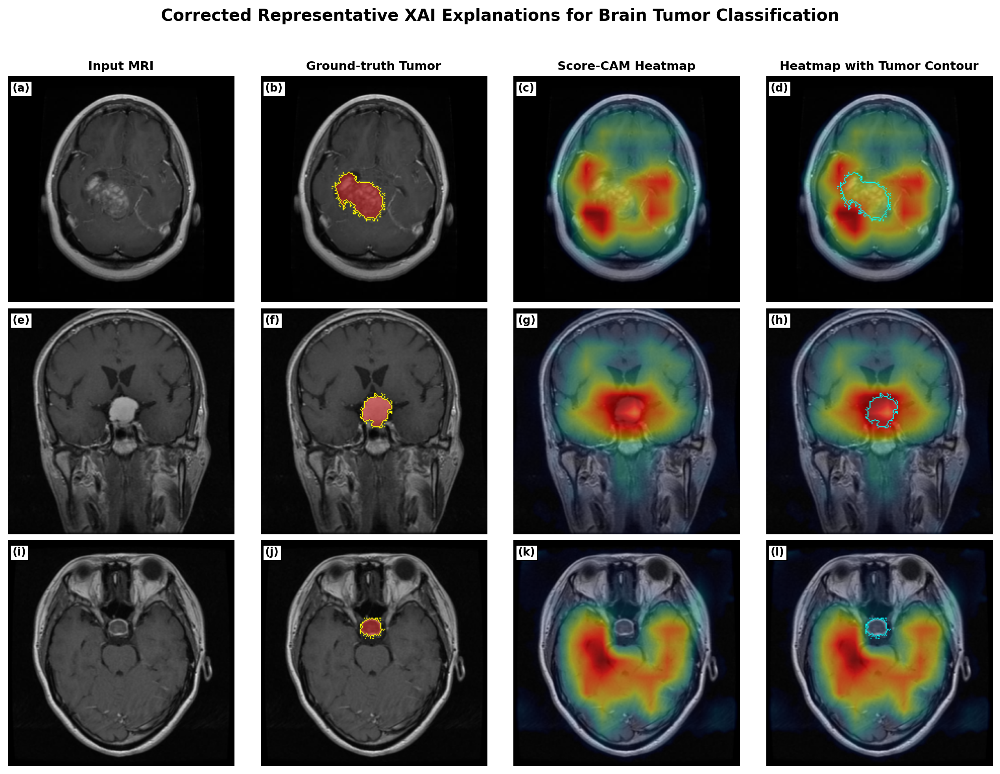


CORRECTED XAI RE-RANKING COMPLETED
Recommended method: Score-CAM
Results folder: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases\corrected_xai_reranking
Report figure: C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases\corrected_xai_reranking\CORRECTED_RECOMMENDED_XAI_3_CLASSES.png


,corrected_rank,method,n_images,final_eligible,artifact_flag,tumor_sized_dice,tumor_sized_iou,top10_precision,energy_lift_focus,pixel_ap_focus,pointing_focus,outside_head_energy_ratio,peak_outside_head,effective_area_80_full,normalized_entropy_full,faithfulness_gain_vs_random,corrected_mean_rank
0,1,Score-CAM,19,True,False,0.258903,0.188446,0.201617,1.861484,0.292318,0.333333,0.057709,0.055556,0.397359,0.948362,0.281294,4.416667
1,2,Patch Occlusion,19,True,False,0.213210,0.160877,0.097584,3.753508,0.232957,0.222222,0.116411,0.047619,0.308532,0.917675,0.232267,5.625000
2,3,Grad-CAM++,19,False,True,0.393701,0.287720,0.258455,4.643289,0.430486,0.000000,0.563193,1.000000,0.210537,0.864015,0.239636,3.791667
3,4,LayerCAM,19,False,True,0.392037,0.286562,0.258693,4.627524,0.429915,0.000000,0.560926,1.000000,0.211850,0.864705,0.236359,4.125000
4,5,LIME Consensus,19,False,False,0.206170,0.154813,0.108799,2.344578,0.206575,0.222222,0.098755,0.095238,0.282398,0.918312,0.393177,6.041667
5,6,HiResCAM,19,False,True,0.196142,0.140418,0.125989,3.223385,0.225885,0.166667,0.479548,0.634921,0.266209,0.907505,0.171015,6.583333
6,7,Grad-CAM,19,False,True,0.196142,0.140418,0.125989,3.223385,0.225885,0.166667,0.479548,0.634921,0.266209,0.907505,0.168810,6.583333
7,8,Ablation-CAM,19,False,True,0.214789,0.151418,0.161664,2.105314,0.250182,0.000000,0.252441,0.706349,0.474920,0.961252,0.247394,6.666667
8,9,XGrad-CAM,19,False,True,0.196142,0.140418,0.125989,3.223385,0.225885,0.166667,0.479548,0.634921,0.266209,0.907505,0.170463,6.833333
9,10,Integrated Gradients,19,False,True,0.156786,0.089172,0.086287,3.209866,0.121542,0.317460,0.387785,0.309524,0.277083,0.913673,0.212633,7.416667


In [16]:
# ============================================================
# CORRECTED XAI RE-RANKING + REPORT FIGURE
# Fixes Grad-CAM / Grad-CAM++ filename collision
# Reruns ONLY the 5 fast CAM methods on the existing 19 correct cases
# Reuses all non-CAM heatmaps and existing faithfulness results
# Penalizes outside-head and corner/edge artifacts
# ============================================================

from pathlib import Path
import math
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from scipy.ndimage import (
    binary_closing,
    binary_fill_holes,
    binary_erosion,
    label,
)

# ------------------------------------------------------------
# PATH
# ------------------------------------------------------------

RESULTS_DIR = Path(
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases"
)

OUTPUT_DIR = RESULTS_DIR / "corrected_xai_reranking"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

ORIGINAL_MAPS_DIR = RESULTS_DIR / "saved_maps"
CORRECTED_CAM_DIR = OUTPUT_DIR / "corrected_cam_maps"
CORRECTED_CAM_DIR.mkdir(parents=True, exist_ok=True)

METRICS_CSV = RESULTS_DIR / "xai_localization_per_image.csv"

IMAGE_SIZE = 224

CAM_METHODS = [
    "Grad-CAM",
    "Grad-CAM++",
    "HiResCAM",
    "LayerCAM",
    "XGrad-CAM",
]

ALL_METHODS = [
    "Grad-CAM",
    "Grad-CAM++",
    "HiResCAM",
    "LayerCAM",
    "XGrad-CAM",
    "Integrated Gradients",
    "GradientSHAP",
    "Score-CAM",
    "Ablation-CAM",
    "Patch Occlusion",
    "LIME Consensus",
]

# Explicit unique filenames: no collision is possible.
UNIQUE_CAM_FILENAME = {
    "Grad-CAM": "GradCAM.npy",
    "Grad-CAM++": "GradCAMPP.npy",
    "HiResCAM": "HiResCAM.npy",
    "LayerCAM": "LayerCAM.npy",
    "XGrad-CAM": "XGradCAM.npy",
}


# ------------------------------------------------------------
# CHECK DEPENDENCIES
# ------------------------------------------------------------

required_functions = [
    "v3_predict_details",
    "v3_capture_final_fused",
    "v4_cam_family",
]

missing = [
    name for name in required_functions
    if name not in globals()
]

if missing:
    raise RuntimeError(
        "Run the main XAI notebook setup cells first. Missing: "
        + ", ".join(missing)
    )

if not METRICS_CSV.exists():
    raise FileNotFoundError(
        f"Missing original metrics file:\n{METRICS_CSV}"
    )


# ------------------------------------------------------------
# HELPERS
# ------------------------------------------------------------

def original_safe_name(name):
    return re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        str(name),
    ).strip("_")


def prepare_heatmap(raw_map):
    heatmap = np.asarray(raw_map, dtype=np.float32)

    if heatmap.shape != (IMAGE_SIZE, IMAGE_SIZE):
        image = Image.fromarray(heatmap, mode="F")
        image = image.resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.BILINEAR,
        )
        heatmap = np.asarray(image, dtype=np.float32)

    heatmap = np.nan_to_num(
        heatmap,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )
    heatmap = np.maximum(heatmap, 0.0)

    maximum = float(heatmap.max())
    if maximum <= 1e-12:
        return np.zeros_like(heatmap, dtype=np.float32)

    return (heatmap / maximum).astype(np.float32)


def load_rgb(image_path):
    with Image.open(image_path) as opened:
        image = opened.convert("RGB").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.BILINEAR,
        )
    return np.asarray(image)


def load_mask(mask_path):
    with Image.open(mask_path) as opened:
        mask = opened.convert("L").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.NEAREST,
        )
    return np.asarray(mask) > 0


def largest_component(binary):
    components, number = label(binary)

    if number <= 0:
        return binary.astype(bool)

    sizes = np.bincount(components.reshape(-1))
    sizes[0] = 0
    return components == int(np.argmax(sizes))


def build_head_support(image_path, tumor_mask=None):
    with Image.open(image_path) as opened:
        gray = opened.convert("L").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.BILINEAR,
        )
        gray = np.asarray(gray, dtype=np.float32) / 255.0

    positive = gray[gray > 0]

    if positive.size == 0:
        support = np.ones_like(gray, dtype=bool)
    else:
        threshold = max(
            0.025,
            float(np.percentile(positive, 10)) * 0.45,
        )
        support = gray > threshold
        support = binary_closing(support, iterations=2)
        support = binary_fill_holes(support)
        support = largest_component(support)

    if support.sum() < 0.10 * support.size:
        support = gray > 0.015
        support = binary_fill_holes(support)
        support = largest_component(support)

    if tumor_mask is not None:
        support = np.logical_or(support, tumor_mask)

    return support.astype(bool)


def top_k_mask(scores, allowed_mask, number_pixels):
    allowed_indices = np.flatnonzero(
        allowed_mask.reshape(-1)
    )

    number_pixels = int(
        max(
            1,
            min(number_pixels, len(allowed_indices)),
        )
    )

    values = scores.reshape(-1)[allowed_indices]
    local_indices = np.argpartition(
        values,
        -number_pixels,
    )[-number_pixels:]

    selected_indices = allowed_indices[local_indices]

    output = np.zeros(scores.size, dtype=bool)
    output[selected_indices] = True
    return output.reshape(scores.shape)


def overlap_metrics(predicted, target):
    predicted = np.asarray(predicted, dtype=bool)
    target = np.asarray(target, dtype=bool)

    intersection = int(np.logical_and(predicted, target).sum())
    predicted_count = int(predicted.sum())
    target_count = int(target.sum())
    union = int(np.logical_or(predicted, target).sum())

    return {
        "precision": intersection / max(predicted_count, 1),
        "recall": intersection / max(target_count, 1),
        "dice": (2.0 * intersection) / max(
            predicted_count + target_count,
            1,
        ),
        "iou": intersection / max(union, 1),
    }


def pixel_average_precision(scores, target, support):
    scores = scores[support].reshape(-1)
    target = target[support].reshape(-1).astype(bool)

    positives = int(target.sum())
    if positives == 0:
        return np.nan

    order = np.argsort(-scores, kind="mergesort")
    sorted_target = target[order].astype(np.float64)
    cumulative = np.cumsum(sorted_target)
    ranks = np.arange(1, len(sorted_target) + 1)
    precision = cumulative / ranks

    return float(
        precision[sorted_target > 0].sum() / positives
    )


def normalized_entropy(values):
    values = np.asarray(values, dtype=np.float64)
    values = np.maximum(values, 0.0)

    total = float(values.sum())
    if total <= 1e-12:
        return 1.0

    probabilities = values / total
    probabilities = probabilities[probabilities > 0]

    entropy = -float(
        np.sum(probabilities * np.log(probabilities))
    )
    maximum = math.log(max(len(values), 2))

    return entropy / maximum


def effective_area_fraction(values, required_mass=0.80):
    values = np.asarray(values, dtype=np.float64)
    values = np.maximum(values, 0.0)

    total = float(values.sum())
    if total <= 1e-12:
        return 1.0

    ordered = np.sort(values)[::-1]
    cumulative = np.cumsum(ordered)

    count = int(
        np.searchsorted(
            cumulative,
            required_mass * total,
            side="left",
        )
        + 1
    )

    return count / len(values)


def compute_corrected_metrics(
    heatmap,
    tumor_mask,
    head_support,
):
    heatmap = prepare_heatmap(heatmap)
    tumor_mask = np.asarray(tumor_mask, dtype=bool)
    head_support = np.asarray(head_support, dtype=bool)

    full_energy = float(heatmap.sum())
    head_energy = float(heatmap[head_support].sum())
    tumor_energy = float(heatmap[tumor_mask].sum())
    outside_energy = float(heatmap[~head_support].sum())

    tumor_area_fraction = (
        float(tumor_mask.sum()) / max(int(head_support.sum()), 1)
    )

    energy_inside_head = (
        tumor_energy / head_energy
        if head_energy > 1e-12
        else 0.0
    )

    energy_lift = (
        energy_inside_head / tumor_area_fraction
        if tumor_area_fraction > 0
        else np.nan
    )

    outside_head_energy_ratio = (
        outside_energy / full_energy
        if full_energy > 1e-12
        else 1.0
    )

    global_peak = np.unravel_index(
        int(np.argmax(heatmap)),
        heatmap.shape,
    )

    peak_inside_tumor = int(
        tumor_mask[global_peak]
    )
    peak_outside_head = int(
        not head_support[global_peak]
    )

    tumor_pixels = max(int(tumor_mask.sum()), 1)

    tumor_sized_region = top_k_mask(
        heatmap,
        head_support,
        tumor_pixels,
    )
    tumor_sized = overlap_metrics(
        tumor_sized_region,
        tumor_mask,
    )

    top10_pixels = max(
        1,
        int(math.ceil(0.10 * head_support.sum())),
    )
    top10_region = top_k_mask(
        heatmap,
        head_support,
        top10_pixels,
    )
    top10 = overlap_metrics(
        top10_region,
        tumor_mask,
    )

    return {
        "tumor_sized_dice": float(tumor_sized["dice"]),
        "tumor_sized_iou": float(tumor_sized["iou"]),
        "top10_precision": float(top10["precision"]),
        "top10_dice": float(top10["dice"]),
        "energy_lift_focus": float(energy_lift),
        "pixel_ap_focus": float(
            pixel_average_precision(
                heatmap,
                tumor_mask,
                head_support,
            )
        ),
        "pointing_focus": float(peak_inside_tumor),
        "outside_head_energy_ratio": float(
            outside_head_energy_ratio
        ),
        "peak_outside_head": float(peak_outside_head),
        "effective_area_80_full": float(
            effective_area_fraction(
                heatmap.reshape(-1),
                required_mass=0.80,
            )
        ),
        "normalized_entropy_full": float(
            normalized_entropy(heatmap.reshape(-1))
        ),
    }


def make_transparent_overlay(
    image,
    heatmap,
    maximum_alpha=0.78,
):
    image_float = image.astype(np.float32) / 255.0
    heatmap = prepare_heatmap(heatmap)

    colors = plt.get_cmap("jet")(heatmap)[..., :3]

    # Zero attribution remains the original MRI.
    alpha = (
        maximum_alpha
        * np.power(heatmap, 1.25)
    )[..., None]

    output = (
        (1.0 - alpha) * image_float
        + alpha * colors
    )

    return np.clip(output, 0.0, 1.0)


def add_contour(image, mask):
    output = image.copy()
    contour = mask & ~binary_erosion(mask)
    output[contour] = [0.0, 1.0, 1.0]
    return output


def mask_overlay(image, mask):
    output = image.astype(np.float32) / 255.0
    result = output.copy()

    red = np.zeros_like(result)
    red[..., 0] = 1.0

    result[mask] = (
        0.62 * result[mask]
        + 0.38 * red[mask]
    )

    contour = mask & ~binary_erosion(mask)
    result[contour] = [1.0, 1.0, 0.0]

    return np.clip(result, 0.0, 1.0)


# ------------------------------------------------------------
# LOAD CORRECT CASES AND EXISTING FAITHFULNESS
# ------------------------------------------------------------

original_metrics = pd.read_csv(METRICS_CSV)

original_metrics["is_correct"] = (
    original_metrics["is_correct"]
    .astype(str)
    .str.lower()
    .map({
        "true": True,
        "false": False,
        "1": True,
        "0": False,
    })
    .fillna(False)
    .astype(bool)
)

correct_rows = original_metrics[
    original_metrics["is_correct"]
    & original_metrics["true_class"].isin(
        ["glioma", "meningioma", "pituitary"]
    )
].copy()

case_table = (
    correct_rows[
        [
            "image_path",
            "mask_path",
            "true_class",
            "predicted_class",
        ]
    ]
    .drop_duplicates(subset=["image_path"])
    .reset_index(drop=True)
)

faithfulness_table = (
    correct_rows[
        [
            "image_path",
            "method",
            "faithfulness_gain_vs_random",
        ]
    ]
    .drop_duplicates(
        subset=["image_path", "method"]
    )
)

print(
    f"Correctly classified cases: {len(case_table)}"
)


# ------------------------------------------------------------
# STEP 1: REGENERATE ONLY THE FIVE CAM METHODS
# ------------------------------------------------------------

for case_number, case in case_table.iterrows():
    image_path = Path(case["image_path"])

    with Image.open(image_path) as opened:
        original_image = opened.convert("RGB")

    details = v3_predict_details(original_image)

    final_state = v3_capture_final_fused(
        details["x"],
        details["fp"],
        int(details["predicted_index"]),
        objective="logit",
    )

    cam_maps = v4_cam_family(final_state)

    case_output_dir = (
        CORRECTED_CAM_DIR / image_path.stem
    )
    case_output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    for method in CAM_METHODS:
        if method not in cam_maps:
            raise KeyError(
                f"{method} was not returned by v4_cam_family."
            )

        np.save(
            case_output_dir
            / UNIQUE_CAM_FILENAME[method],
            prepare_heatmap(cam_maps[method]),
        )

    print(
        f"[{case_number + 1}/{len(case_table)}] "
        f"Correct CAM maps saved: {image_path.name}"
    )


# ------------------------------------------------------------
# STEP 2: RECALCULATE ALL METHODS
# Non-CAM methods reuse their already saved maps
# ------------------------------------------------------------

all_rows = []
missing_maps = []

for _, case in case_table.iterrows():
    image_path = Path(case["image_path"])
    mask_path = Path(case["mask_path"])

    tumor_mask = load_mask(mask_path)
    head_support = build_head_support(
        image_path,
        tumor_mask=tumor_mask,
    )

    for method in ALL_METHODS:
        if method in CAM_METHODS:
            map_path = (
                CORRECTED_CAM_DIR
                / image_path.stem
                / UNIQUE_CAM_FILENAME[method]
            )
        else:
            map_path = (
                ORIGINAL_MAPS_DIR
                / image_path.stem
                / (
                    original_safe_name(method)
                    + ".npy"
                )
            )

        if not map_path.exists():
            missing_maps.append({
                "image_path": str(image_path),
                "method": method,
                "expected_path": str(map_path),
            })
            continue

        heatmap = np.load(map_path)

        metrics = compute_corrected_metrics(
            heatmap,
            tumor_mask,
            head_support,
        )

        faithfulness_match = faithfulness_table[
            (faithfulness_table["image_path"] == str(image_path))
            & (faithfulness_table["method"] == method)
        ]

        faithfulness_gain = (
            float(
                faithfulness_match.iloc[0][
                    "faithfulness_gain_vs_random"
                ]
            )
            if not faithfulness_match.empty
            else np.nan
        )

        all_rows.append({
            "image_path": str(image_path),
            "mask_path": str(mask_path),
            "true_class": case["true_class"],
            "predicted_class": case["predicted_class"],
            "method": method,
            "faithfulness_gain_vs_random": faithfulness_gain,
            **metrics,
        })

per_image = pd.DataFrame(all_rows)

if per_image.empty:
    raise RuntimeError(
        "No corrected XAI metrics were produced."
    )

per_image.to_csv(
    OUTPUT_DIR
    / "CORRECTED_XAI_METRICS_PER_IMAGE.csv",
    index=False,
)

pd.DataFrame(missing_maps).to_csv(
    OUTPUT_DIR
    / "CORRECTED_XAI_MISSING_MAPS.csv",
    index=False,
)


# ------------------------------------------------------------
# STEP 3: CLASS-BALANCED SUMMARY AND RANKING
# ------------------------------------------------------------

metric_columns = [
    "tumor_sized_dice",
    "tumor_sized_iou",
    "top10_precision",
    "top10_dice",
    "energy_lift_focus",
    "pixel_ap_focus",
    "pointing_focus",
    "outside_head_energy_ratio",
    "peak_outside_head",
    "effective_area_80_full",
    "normalized_entropy_full",
    "faithfulness_gain_vs_random",
]

class_summary = (
    per_image
    .groupby(
        ["method", "true_class"],
        as_index=False,
    )[metric_columns]
    .mean()
)

summary = (
    class_summary
    .groupby("method", as_index=False)[metric_columns]
    .mean()
)

counts = (
    per_image
    .groupby("method", as_index=False)["image_path"]
    .nunique()
    .rename(columns={"image_path": "n_images"})
)

summary = summary.merge(
    counts,
    on="method",
    how="left",
)

# Preserve the previous LIME quality exclusion.
summary["quality_pass"] = (
    summary["method"] != "LIME Consensus"
)

# Artifact rule:
# reject methods whose global peak falls outside the head in >10% of cases,
# or whose mean attribution energy outside the head exceeds 15%.
summary["artifact_flag"] = (
    (summary["peak_outside_head"] > 0.10)
    | (summary["outside_head_energy_ratio"] > 0.15)
)

summary["final_eligible"] = (
    summary["quality_pass"]
    & (~summary["artifact_flag"])
    & (summary["faithfulness_gain_vs_random"] > 0)
)

higher_is_better = [
    "tumor_sized_dice",
    "tumor_sized_iou",
    "top10_precision",
    "top10_dice",
    "energy_lift_focus",
    "pixel_ap_focus",
    "pointing_focus",
    "faithfulness_gain_vs_random",
]

lower_is_better = [
    "outside_head_energy_ratio",
    "peak_outside_head",
    "effective_area_80_full",
    "normalized_entropy_full",
]

rank_columns = []

for metric in higher_is_better:
    rank_name = metric + "_rank"
    summary[rank_name] = summary[metric].rank(
        ascending=False,
        method="average",
    )
    rank_columns.append(rank_name)

for metric in lower_is_better:
    rank_name = metric + "_rank"
    summary[rank_name] = summary[metric].rank(
        ascending=True,
        method="average",
    )
    rank_columns.append(rank_name)

summary["corrected_mean_rank"] = (
    summary[rank_columns].mean(axis=1)
)

summary = summary.sort_values(
    [
        "final_eligible",
        "corrected_mean_rank",
        "faithfulness_gain_vs_random",
    ],
    ascending=[False, True, False],
).reset_index(drop=True)

summary["corrected_rank"] = np.arange(
    1,
    len(summary) + 1,
)

eligible = summary[
    summary["final_eligible"]
]

recommended_method = (
    str(eligible.iloc[0]["method"])
    if not eligible.empty
    else None
)

summary.to_csv(
    OUTPUT_DIR
    / "CORRECTED_XAI_FINAL_RANKING.csv",
    index=False,
)

class_summary.to_csv(
    OUTPUT_DIR
    / "CORRECTED_XAI_BY_CLASS.csv",
    index=False,
)


# ------------------------------------------------------------
# STEP 4: CREATE HONEST REPORT FIGURE
# ------------------------------------------------------------

report_figure_path = (
    OUTPUT_DIR
    / "CORRECTED_RECOMMENDED_XAI_3_CLASSES.png"
)

if recommended_method is not None:
    method_rows = per_image[
        per_image["method"] == recommended_method
    ].copy()

    representatives = []

    for class_name in [
        "glioma",
        "meningioma",
        "pituitary",
    ]:
        class_rows = method_rows[
            method_rows["true_class"] == class_name
        ].copy()

        median_value = class_rows[
            "tumor_sized_dice"
        ].median()

        class_rows["_distance"] = np.abs(
            class_rows["tumor_sized_dice"]
            - median_value
        )

        representatives.append(
            class_rows.sort_values(
                "_distance"
            ).iloc[0]
        )

    fig, axes = plt.subplots(
        3,
        4,
        figsize=(13, 10),
        dpi=200,
    )

    titles = [
        "Input MRI",
        "Ground-truth Tumor",
        f"{recommended_method} Heatmap",
        "Heatmap with Tumor Contour",
    ]

    for column, title in enumerate(titles):
        axes[0, column].set_title(
            title,
            fontsize=11,
            fontweight="bold",
        )

    panel_number = 0

    for row_index, row in enumerate(representatives):
        image_path = Path(row["image_path"])
        mask_path = Path(row["mask_path"])

        image = load_rgb(image_path)
        tumor_mask = load_mask(mask_path)

        if recommended_method in CAM_METHODS:
            map_path = (
                CORRECTED_CAM_DIR
                / image_path.stem
                / UNIQUE_CAM_FILENAME[
                    recommended_method
                ]
            )
        else:
            map_path = (
                ORIGINAL_MAPS_DIR
                / image_path.stem
                / (
                    original_safe_name(
                        recommended_method
                    )
                    + ".npy"
                )
            )

        heatmap = prepare_heatmap(
            np.load(map_path)
        )

        heatmap_overlay = make_transparent_overlay(
            image,
            heatmap,
        )

        contour_overlay = add_contour(
            heatmap_overlay,
            tumor_mask,
        )

        panels = [
            image,
            mask_overlay(image, tumor_mask),
            heatmap_overlay,
            contour_overlay,
        ]

        for column, panel in enumerate(panels):
            axis = axes[row_index, column]
            axis.imshow(panel)
            axis.axis("off")

            letter = chr(97 + panel_number)
            axis.text(
                0.02,
                0.97,
                f"({letter})",
                transform=axis.transAxes,
                ha="left",
                va="top",
                fontsize=10,
                fontweight="bold",
                bbox={
                    "facecolor": "white",
                    "edgecolor": "black",
                    "pad": 2,
                },
            )
            panel_number += 1

        axes[row_index, 0].set_ylabel(
            str(row["true_class"]).capitalize(),
            fontsize=11,
            fontweight="bold",
        )

    fig.suptitle(
        (
            "Corrected Representative XAI Explanations "
            "for Brain Tumor Classification"
        ),
        fontsize=15,
        fontweight="bold",
    )

    plt.tight_layout(
        rect=[0, 0, 1, 0.96]
    )

    plt.savefig(
        report_figure_path,
        dpi=600,
        bbox_inches="tight",
    )

    plt.show()


# ------------------------------------------------------------
# DISPLAY FINAL RESULT
# ------------------------------------------------------------

display_columns = [
    "corrected_rank",
    "method",
    "n_images",
    "final_eligible",
    "artifact_flag",
    "tumor_sized_dice",
    "tumor_sized_iou",
    "top10_precision",
    "energy_lift_focus",
    "pixel_ap_focus",
    "pointing_focus",
    "outside_head_energy_ratio",
    "peak_outside_head",
    "effective_area_80_full",
    "normalized_entropy_full",
    "faithfulness_gain_vs_random",
    "corrected_mean_rank",
]

print("\n" + "=" * 92)
print("CORRECTED XAI RE-RANKING COMPLETED")
print(f"Recommended method: {recommended_method}")
print(f"Results folder: {OUTPUT_DIR}")
print(f"Report figure: {report_figure_path}")
print("=" * 92)

try:
    from IPython.display import display
    display(summary[display_columns])
except Exception:
    print(
        summary[display_columns].to_string(index=False)
    )

Selected cases:
true_class                                                                                                                         image_path  tumor_sized_dice
    glioma C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\images\brisc2025_test_00136_gl_co_t1.jpg          0.263694
meningioma C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\images\brisc2025_test_00493_me_sa_t1.jpg          0.465367
 pituitary C:\Users\cse.majib\Desktop\Data sets\14 june\archive (2)\brisc2025\segmentation_task\test\images\brisc2025_test_00788_pi_ax_t1.jpg          0.101604


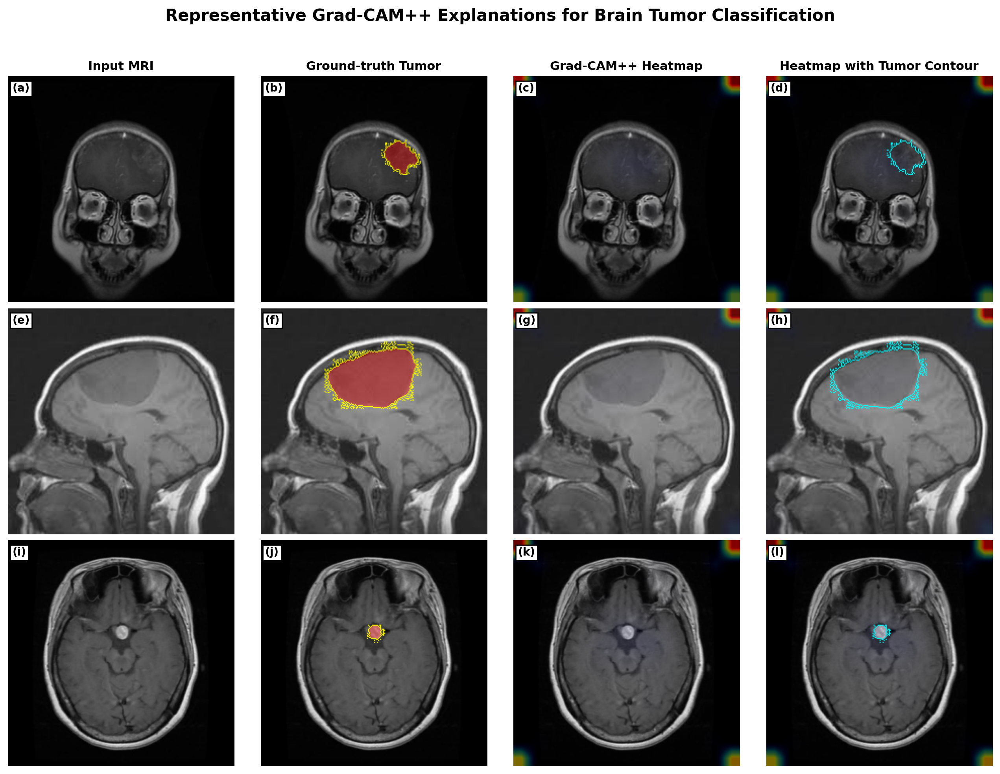


Figure saved successfully:
C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases\corrected_xai_reranking\REPORT_GRADCAMPP_3_CLASSES.png


In [17]:
# ============================================================
# SINGLE CELL: MAKE REPORT FIGURE FOR Grad-CAM++
# Uses already saved corrected Grad-CAM++ maps
# No full rerun needed
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import binary_erosion

# ------------------------------------------------------------
# PATHS
# ------------------------------------------------------------

RESULTS_DIR = Path(
    r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june\xai_tumor_localization_21_cases"
)

CORRECTED_DIR = RESULTS_DIR / "corrected_xai_reranking"
CORRECTED_CAM_DIR = CORRECTED_DIR / "corrected_cam_maps"

RANKING_CSV = CORRECTED_DIR / "CORRECTED_XAI_METRICS_PER_IMAGE.csv"
OUTPUT_FIGURE = CORRECTED_DIR / "REPORT_GRADCAMPP_3_CLASSES.png"

IMAGE_SIZE = 224
METHOD_NAME = "Grad-CAM++"
METHOD_FILE = "GradCAMPP.npy"

# ------------------------------------------------------------
# CHECK FILES
# ------------------------------------------------------------

if not RANKING_CSV.exists():
    raise FileNotFoundError(
        f"File not found:\n{RANKING_CSV}\n\n"
        "Run the corrected reranking cell first."
    )

if not CORRECTED_CAM_DIR.exists():
    raise FileNotFoundError(
        f"Folder not found:\n{CORRECTED_CAM_DIR}\n\n"
        "Run the corrected reranking cell first."
    )

# ------------------------------------------------------------
# HELPERS
# ------------------------------------------------------------

def load_rgb_image(image_path):
    with Image.open(image_path) as img:
        img = img.convert("RGB").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.BILINEAR
        )
    return np.asarray(img)

def load_mask(mask_path):
    with Image.open(mask_path) as img:
        img = img.convert("L").resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.NEAREST
        )
    return np.asarray(img) > 0

def prepare_heatmap(heatmap):
    heatmap = np.asarray(heatmap, dtype=np.float32)

    if heatmap.shape != (IMAGE_SIZE, IMAGE_SIZE):
        temp = Image.fromarray(heatmap, mode="F")
        temp = temp.resize(
            (IMAGE_SIZE, IMAGE_SIZE),
            Image.Resampling.BILINEAR
        )
        heatmap = np.asarray(temp, dtype=np.float32)

    heatmap = np.nan_to_num(heatmap, nan=0.0, posinf=0.0, neginf=0.0)
    heatmap = np.maximum(heatmap, 0.0)

    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    return heatmap

def make_overlay(image, heatmap, max_alpha=0.78):
    image = image.astype(np.float32) / 255.0
    colors = plt.get_cmap("jet")(heatmap)[..., :3]

    alpha = (max_alpha * np.power(heatmap, 1.25))[..., None]

    overlay = (1.0 - alpha) * image + alpha * colors
    return np.clip(overlay, 0.0, 1.0)

def add_mask_overlay(image, mask):
    image = image.astype(np.float32) / 255.0
    result = image.copy()

    red = np.zeros_like(result)
    red[..., 0] = 1.0

    result[mask] = 0.62 * result[mask] + 0.38 * red[mask]

    contour = mask & ~binary_erosion(mask)
    result[contour] = [1.0, 1.0, 0.0]

    return np.clip(result, 0.0, 1.0)

def add_contour(overlay, mask):
    result = overlay.copy()
    contour = mask & ~binary_erosion(mask)
    result[contour] = [0.0, 1.0, 1.0]
    return result

# ------------------------------------------------------------
# LOAD DATA
# ------------------------------------------------------------

df = pd.read_csv(RANKING_CSV)

required_cols = [
    "image_path",
    "mask_path",
    "true_class",
    "method",
    "tumor_sized_dice"
]

for col in required_cols:
    if col not in df.columns:
        raise RuntimeError(f"Missing required column: {col}")

df = df[
    df["method"].astype(str).str.strip() == METHOD_NAME
].copy()

df["true_class"] = df["true_class"].astype(str).str.strip().str.lower()

classes = ["glioma", "meningioma", "pituitary"]

selected_rows = []

for class_name in classes:
    class_df = df[df["true_class"] == class_name].copy()

    if class_df.empty:
        raise RuntimeError(
            f"No {METHOD_NAME} cases found for class: {class_name}"
        )

    class_df["tumor_sized_dice"] = pd.to_numeric(
        class_df["tumor_sized_dice"],
        errors="coerce"
    )

    class_df = class_df.dropna(subset=["tumor_sized_dice"]).copy()

    if class_df.empty:
        raise RuntimeError(
            f"No valid tumor_sized_dice values found for class: {class_name}"
        )

    # pick a representative case close to the class median
    median_value = class_df["tumor_sized_dice"].median()
    class_df["distance_from_median"] = np.abs(
        class_df["tumor_sized_dice"] - median_value
    )

    selected_row = class_df.sort_values(
        "distance_from_median"
    ).iloc[0]

    selected_rows.append(selected_row)

selected_df = pd.DataFrame(selected_rows)

print("Selected cases:")
print(
    selected_df[["true_class", "image_path", "tumor_sized_dice"]]
    .to_string(index=False)
)

# ------------------------------------------------------------
# CREATE FIGURE
# ------------------------------------------------------------

fig, axes = plt.subplots(
    nrows=3,
    ncols=4,
    figsize=(13, 10),
    dpi=200
)

titles = [
    "Input MRI",
    "Ground-truth Tumor",
    "Grad-CAM++ Heatmap",
    "Heatmap with Tumor Contour"
]

for j, title in enumerate(titles):
    axes[0, j].set_title(
        title,
        fontsize=11,
        fontweight="bold"
    )

panel_count = 0

for i, row in enumerate(selected_rows):
    image_path = Path(row["image_path"])
    mask_path = Path(row["mask_path"])
    map_path = CORRECTED_CAM_DIR / image_path.stem / METHOD_FILE

    if not map_path.exists():
        raise FileNotFoundError(
            f"Grad-CAM++ map not found:\n{map_path}"
        )

    image = load_rgb_image(image_path)
    mask = load_mask(mask_path)
    heatmap = prepare_heatmap(np.load(map_path))

    heatmap_overlay = make_overlay(image, heatmap)
    contour_overlay = add_contour(heatmap_overlay, mask)
    mask_overlay = add_mask_overlay(image, mask)

    panels = [
        image,
        mask_overlay,
        heatmap_overlay,
        contour_overlay
    ]

    for j, panel in enumerate(panels):
        ax = axes[i, j]
        ax.imshow(panel)
        ax.axis("off")

        letter = chr(97 + panel_count)
        ax.text(
            0.02,
            0.97,
            f"({letter})",
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=10,
            fontweight="bold",
            bbox={
                "facecolor": "white",
                "edgecolor": "black",
                "pad": 2
            }
        )
        panel_count += 1

    axes[i, 0].set_ylabel(
        row["true_class"].capitalize(),
        fontsize=11,
        fontweight="bold"
    )

fig.suptitle(
    "Representative Grad-CAM++ Explanations for Brain Tumor Classification",
    fontsize=15,
    fontweight="bold"
)

plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig(
    OUTPUT_FIGURE,
    dpi=600,
    bbox_inches="tight"
)

plt.show()

print("\nFigure saved successfully:")
print(OUTPUT_FIGURE)

In [ ]:
# ============================================================
# LOCAL FOLDER CLASSIFICATION REPORT
# Folder format:
# test_folder/
# ├── glioma/
# ├── meningioma/
# ├── notumor/
# └── pituitary/
# ============================================================

import os
from pathlib import Path
import numpy as np
import pandas as pd
from PIL import Image

import torch
import matplotlib.pyplot as plt

try:
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
except Exception:
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "scikit-learn"])
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


# ------------------------------------------------------------
# 1. GIVE YOUR LOCAL TEST FOLDER PATH HERE
# ------------------------------------------------------------

LOCAL_TEST_DIR = r"C:\Users\cse.majib\Desktop\Data sets\mendeley ghaffer\Brain Tumor Data\Brain Tumor data\Brain Tumor data\Training"

# Example:
# LOCAL_TEST_DIR = r"C:\Users\cse.majib\Desktop\local_test"


# ------------------------------------------------------------
# 2. CLASS NAME MAPPING
# ------------------------------------------------------------

def canonical_class_name(name):
    name = str(name).lower().strip()
    name = name.replace("-", "_").replace(" ", "_")

    if name in ["glioma", "glioma_tumor", "glioma_tumour"]:
        return "glioma"

    if name in ["meningioma", "meningioma_tumor", "meningioma_tumour"]:
        return "meningioma"

    if name in ["notumor", "no_tumor", "no_tumour", "normal", "healthy"]:
        return "no_tumor"

    if name in ["pituitary", "pituitary_tumor", "pituitary_tumour"]:
        return "pituitary"

    return name


# Make sure class_names comes from your loaded checkpoint
print("Model classes:", class_names)

CLASS_TO_IDX = {c: i for i, c in enumerate(class_names)}

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


# ------------------------------------------------------------
# 3. COLLECT IMAGES FROM LOCAL FOLDER
# ------------------------------------------------------------

test_items = []

root = Path(LOCAL_TEST_DIR)

if not root.exists():
    raise FileNotFoundError(f"Folder not found: {LOCAL_TEST_DIR}")

for class_folder in root.iterdir():
    if not class_folder.is_dir():
        continue

    cname = canonical_class_name(class_folder.name)

    if cname not in CLASS_TO_IDX:
        print(f"[SKIP] Unknown folder: {class_folder.name}")
        continue

    label_idx = CLASS_TO_IDX[cname]

    for img_path in class_folder.rglob("*"):
        if img_path.is_file() and img_path.suffix.lower() in IMG_EXTS:
            test_items.append((str(img_path), label_idx, cname))

print(f"Total test images found: {len(test_items)}")

if len(test_items) == 0:
    raise RuntimeError("No valid test images found. Check folder path and image extensions.")


# ------------------------------------------------------------
# 4. PREDICT ALL IMAGES
# ------------------------------------------------------------

model.eval()

y_true = []
y_pred = []
y_prob = []
paths = []
true_names = []
pred_names = []

with torch.no_grad():
    for img_path, true_idx, true_class in test_items:
        try:
            pil_img = Image.open(img_path).convert("RGB")

            # This function came from the interface cell
            x, fp, _ = preprocess_input_image(pil_img)

            outputs = model(x, fp)
            logits = outputs["cls_logits"]

            probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()

            pred_idx = int(np.argmax(probs))
            pred_class = class_names[pred_idx]
            confidence = float(probs[pred_idx])

            y_true.append(true_idx)
            y_pred.append(pred_idx)
            y_prob.append(confidence)

            paths.append(img_path)
            true_names.append(true_class)
            pred_names.append(pred_class)

        except Exception as e:
            print(f"[ERROR] {img_path}: {e}")


# ------------------------------------------------------------
# 5. CLASSIFICATION REPORT
# ------------------------------------------------------------

acc = accuracy_score(y_true, y_pred)

print("\n==================================================")
print("LOCAL TEST CLASSIFICATION RESULT")
print("==================================================")
print(f"Total evaluated images: {len(y_true)}")
print(f"Accuracy: {acc:.4f}")
print("==================================================\n")

report_text = classification_report(
    y_true,
    y_pred,
    labels=list(range(len(class_names))),
    target_names=class_names,
    digits=4,
    zero_division=0
)

print(report_text)


# ------------------------------------------------------------
# 6. SAVE REPORT AS CSV
# ------------------------------------------------------------

report_dict = classification_report(
    y_true,
    y_pred,
    labels=list(range(len(class_names))),
    target_names=class_names,
    digits=4,
    zero_division=0,
    output_dict=True
)

report_df = pd.DataFrame(report_dict).transpose()
report_csv_path = os.path.join(LOCAL_TEST_DIR, "classification_report.csv")
report_df.to_csv(report_csv_path, index=True)

print("Saved classification report:")
print(report_csv_path)


# ------------------------------------------------------------
# 7. SAVE PER-IMAGE PREDICTIONS
# ------------------------------------------------------------

pred_df = pd.DataFrame({
    "image_path": paths,
    "true_class": true_names,
    "predicted_class": pred_names,
    "confidence": y_prob,
    "correct": [t == p for t, p in zip(true_names, pred_names)]
})

pred_csv_path = os.path.join(LOCAL_TEST_DIR, "classification_predictions.csv")
pred_df.to_csv(pred_csv_path, index=False)

print("Saved prediction details:")
print(pred_csv_path)


# ------------------------------------------------------------
# 8. CONFUSION MATRIX
# ------------------------------------------------------------

cm = confusion_matrix(
    y_true,
    y_pred,
    labels=list(range(len(class_names)))
)

plt.figure(figsize=(7, 6))
plt.imshow(cm)
plt.title("Local Test Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(range(len(class_names)), class_names, rotation=45, ha="right")
plt.yticks(range(len(class_names)), class_names)

for i in range(len(class_names)):
    for j in range(len(class_names)):
        plt.text(j, i, cm[i, j], ha="center", va="center")

plt.tight_layout()

cm_path = os.path.join(LOCAL_TEST_DIR, "confusion_matrix_local_test.png")
plt.savefig(cm_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved confusion matrix:")
print(cm_path)

Model classes: ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Total test images found: 5712


In [ ]:
# ============================================================
# ONE-CELL STYLISH BRAIN TUMOR DIAGNOSTIC INTERFACE
#
# Flow:
#   1. Detection: Tumor detected? Yes / No
#   2. Tumor type and confidence
#   3. Localization from the segmentation branch
#   4. Interpretability using classifier-only Grad-CAM++
#
# Grad-CAM++ source:
#   model.encoder.fusions[-1]
#
# The segmentation mask is NOT used to create Grad-CAM++.
# ============================================================

import os
import sys
import html
import contextlib
import subprocess
from pathlib import Path

import numpy as np
from PIL import Image, ImageDraw

import torch
import torch.nn as nn
import torch.nn.functional as F


# ============================================================
# INSTALL / IMPORT REQUIRED LIBRARIES
# ============================================================

try:
    import timm
except Exception:
    subprocess.check_call(
        [sys.executable, "-m", "pip", "install", "-q", "timm"]
    )
    import timm

try:
    import gradio as gr
except Exception:
    subprocess.check_call(
        [sys.executable, "-m", "pip", "install", "-q", "gradio"]
    )
    import gr

try:
    import matplotlib.pyplot as plt
except Exception:
    subprocess.check_call(
        [sys.executable, "-m", "pip", "install", "-q", "matplotlib"]
    )
    import matplotlib.pyplot as plt


# ============================================================
# BASIC CONFIGURATION
# ============================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

IMG_SIZE = 224

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary",
]

DEFAULT_BACKBONES = [
    "convnext_base",
    "efficientnetv2_rw_s",
    "densenet201",
    "swin_small_patch4_window7_224",
    "vit_base_patch16_224",
]


# ============================================================
# FIND SAVED MODEL AUTOMATICALLY
# ============================================================

OUT_DIR_CANDIDATES = [
    "./runs_brisc2025_multitask_gated_unet",
    (
        r"C:\Users\cse.majib\Desktop\Data sets\14 june\20june"
        r"\runs_brisc2025_multitask_gated_unet"
    ),
]

MODEL_FILENAMES = [
    "BRISC2025_final_best_multitask_model.pth",
    "best_joint_multitask_checkpoint.pth",
]

MODEL_PATH = None

for output_directory in OUT_DIR_CANDIDATES:
    for filename in MODEL_FILENAMES:
        candidate = os.path.join(
            output_directory,
            filename,
        )

        if os.path.exists(candidate):
            MODEL_PATH = candidate
            break

    if MODEL_PATH is not None:
        break

if MODEL_PATH is None:
    for filename in MODEL_FILENAMES:
        matches = list(
            Path(".").rglob(filename)
        )

        if matches:
            MODEL_PATH = str(matches[0])
            break

if MODEL_PATH is None:
    raise FileNotFoundError(
        "Saved model not found.\n\n"
        "Expected one of these files:\n"
        "1. BRISC2025_final_best_multitask_model.pth\n"
        "2. best_joint_multitask_checkpoint.pth\n\n"
        "Expected folder:\n"
        "./runs_brisc2025_multitask_gated_unet/"
    )

print(
    "Using model:",
    os.path.abspath(MODEL_PATH),
)


# ============================================================
# MODEL ARCHITECTURE
# ============================================================

class ConvBNAct(nn.Module):
    def __init__(
        self,
        in_ch,
        out_ch,
    ):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(
                in_ch,
                out_ch,
                3,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Conv2d(
                out_ch,
                out_ch,
                3,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
        )

    def forward(self, x):
        return self.block(x)


class DecoderBlock(nn.Module):
    def __init__(
        self,
        in_ch,
        skip_ch,
        out_ch,
    ):
        super().__init__()

        self.conv = ConvBNAct(
            in_ch + skip_ch,
            out_ch,
        )

    def forward(
        self,
        x,
        skip,
    ):
        x = F.interpolate(
            x,
            size=skip.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        return self.conv(
            torch.cat(
                [x, skip],
                dim=1,
            )
        )


class GatedFusionHead(nn.Module):
    def __init__(
        self,
        dims,
        hidden=2048,
        num_classes=4,
        p_drop=0.10,
    ):
        super().__init__()

        self.dims = list(
            map(int, dims)
        )
        self.streams = len(
            self.dims
        )
        self.in_dim = sum(
            self.dims
        )

        self.gates = nn.Sequential(
            nn.Linear(
                self.in_dim,
                self.streams,
            ),
            nn.Sigmoid(),
        )

        self.norm = nn.LayerNorm(
            self.in_dim
        )

        self.mlp = nn.Sequential(
            nn.Linear(
                self.in_dim,
                hidden,
            ),
            nn.GELU(),
            nn.Dropout(p_drop),
            nn.Linear(
                hidden,
                num_classes,
            ),
        )

    def forward(self, x):
        gates = self.gates(x)

        weighted_parts = []
        offset = 0

        for stream_index, dimension in enumerate(
            self.dims
        ):
            part = x[
                :,
                offset:offset + dimension,
            ]

            weighted_parts.append(
                part
                * gates[
                    :,
                    stream_index:stream_index + 1,
                ]
            )

            offset += dimension

        gated_features = torch.cat(
            weighted_parts,
            dim=1,
        )

        return self.mlp(
            self.norm(gated_features)
        )


class SpatialGatedFusionLevel(nn.Module):
    def __init__(
        self,
        in_channels_list,
        out_ch,
        p_drop=0.05,
    ):
        super().__init__()

        self.dims = [
            int(out_ch)
            for _ in in_channels_list
        ]

        self.streams = len(
            self.dims
        )

        self.in_dim = (
            int(out_ch)
            * self.streams
        )

        self.proj = nn.ModuleList([
            nn.Conv2d(
                channel,
                out_ch,
                1,
            )
            for channel in in_channels_list
        ])

        self.gates = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(
                self.in_dim,
                self.streams,
            ),
            nn.Sigmoid(),
        )

        self.norm = nn.BatchNorm2d(
            self.in_dim
        )

        self.reduce = nn.Sequential(
            nn.Conv2d(
                self.in_dim,
                out_ch,
                1,
                bias=False,
            ),
            nn.BatchNorm2d(out_ch),
            nn.GELU(),
            nn.Dropout2d(p_drop),
        )

    def forward(self, features):
        max_height = max(
            feature.shape[-2]
            for feature in features
        )

        max_width = max(
            feature.shape[-1]
            for feature in features
        )

        projected_features = []

        for feature, projection in zip(
            features,
            self.proj,
        ):
            if feature.shape[-2:] != (
                max_height,
                max_width,
            ):
                feature = F.interpolate(
                    feature,
                    size=(
                        max_height,
                        max_width,
                    ),
                    mode="bilinear",
                    align_corners=False,
                )

            projected_features.append(
                projection(feature)
            )

        concatenated = torch.cat(
            projected_features,
            dim=1,
        )

        gates = self.gates(
            concatenated
        )

        weighted_features = []

        for stream_index in range(
            self.streams
        ):
            weighted_features.append(
                projected_features[
                    stream_index
                ]
                * gates[
                    :,
                    stream_index:
                    stream_index + 1,
                    None,
                    None,
                ]
            )

        gated_features = torch.cat(
            weighted_features,
            dim=1,
        )

        return self.reduce(
            self.norm(gated_features)
        )


class TimmSpatialBackbone(nn.Module):
    def __init__(
        self,
        name,
        pretrained=False,
        in_chans=3,
        out_indices=(0, 1, 2, 3),
        freeze=True,
    ):
        super().__init__()

        self.name = name
        self.freeze = freeze

        self.model = timm.create_model(
            name,
            pretrained=pretrained,
            features_only=True,
            out_indices=out_indices,
            in_chans=in_chans,
        )

        self.channels = (
            self.model
            .feature_info
            .channels()
        )

        if freeze:
            for parameter in self.model.parameters():
                parameter.requires_grad = False

            self.model.eval()

    def train(self, mode=True):
        super().train(mode)

        if self.freeze:
            self.model.eval()

        return self

    def _to_nchw(
        self,
        tensor,
        expected_channels,
    ):
        if tensor.ndim != 4:
            raise RuntimeError(
                f"{self.name}: unexpected rank "
                f"{tensor.ndim}, shape={tensor.shape}"
            )

        if tensor.shape[1] == expected_channels:
            return tensor

        if tensor.shape[-1] == expected_channels:
            return tensor.permute(
                0,
                3,
                1,
                2,
            ).contiguous()

        raise RuntimeError(
            f"{self.name}: expected channel "
            f"{expected_channels}, got {tensor.shape}"
        )

    def forward(self, x):
        context = (
            torch.no_grad
            if self.freeze
            else torch.enable_grad
        )

        with context():
            features = self.model(x)

        return [
            self._to_nchw(
                feature,
                channels,
            )
            for feature, channels in zip(
                features,
                self.channels,
            )
        ]


class GatedMultiBackboneEncoder(nn.Module):
    def __init__(
        self,
        backbone_names,
        pretrained=False,
        in_chans=3,
        fuse_channels=(
            64,
            128,
            256,
            512,
        ),
        freeze=True,
    ):
        super().__init__()

        self.backbones = (
            nn.ModuleList()
        )

        self.backbone_names = []

        print("\nLoading backbones:")

        for name in backbone_names:
            try:
                backbone = TimmSpatialBackbone(
                    name=name,
                    pretrained=pretrained,
                    in_chans=in_chans,
                    out_indices=(
                        0,
                        1,
                        2,
                        3,
                    ),
                    freeze=freeze,
                )

                print(
                    f"  [OK] {name} | "
                    f"channels={backbone.channels}"
                )

                self.backbones.append(
                    backbone
                )

                self.backbone_names.append(
                    name
                )

            except Exception as error:
                print(
                    f"  [SKIP] {name} | "
                    f"{str(error)[:200]}"
                )

        if len(self.backbones) == 0:
            raise RuntimeError(
                "No backbone loaded successfully."
            )

        self.num_levels = min(
            len(backbone.channels)
            for backbone
            in self.backbones
        )

        self.fuse_channels = list(
            fuse_channels[
                :self.num_levels
            ]
        )

        self.fusions = nn.ModuleList([
            SpatialGatedFusionLevel(
                [
                    backbone.channels[
                        level
                    ]
                    for backbone
                    in self.backbones
                ],
                self.fuse_channels[
                    level
                ],
            )
            for level
            in range(
                self.num_levels
            )
        ])

    def forward(self, x):
        all_features = [
            backbone(x)
            for backbone
            in self.backbones
        ]

        return [
            self.fusions[level]([
                features[level]
                for features
                in all_features
            ])
            for level
            in range(
                self.num_levels
            )
        ]


class GatedFPMultiTaskUNet(nn.Module):
    def __init__(
        self,
        backbone_names,
        num_classes=4,
        seg_classes=1,
        fp_dim=262,
        use_fp=True,
        pretrained=False,
        freeze_backbones=True,
    ):
        super().__init__()

        self.use_fp = use_fp

        self.encoder = (
            GatedMultiBackboneEncoder(
                backbone_names=(
                    backbone_names
                ),
                pretrained=pretrained,
                in_chans=3,
                fuse_channels=(
                    64,
                    128,
                    256,
                    512,
                ),
                freeze=freeze_backbones,
            )
        )

        channels = (
            self.encoder
            .fuse_channels
        )

        self.decoder_blocks = nn.ModuleList([
            DecoderBlock(
                channels[index],
                channels[index - 1],
                channels[index - 1],
            )
            for index in range(
                len(channels) - 1,
                0,
                -1,
            )
        ])

        self.seg_head = nn.Conv2d(
            channels[0],
            seg_classes,
            1,
        )

        if use_fp:
            self.fp_proj = nn.Sequential(
                nn.Linear(
                    fp_dim,
                    256,
                ),
                nn.GELU(),
                nn.Dropout(0.20),
            )

            classifier_dimensions = [
                channels[-1],
                256,
            ]

        else:
            self.fp_proj = None

            classifier_dimensions = [
                channels[-1]
            ]

        self.classifier = GatedFusionHead(
            dims=classifier_dimensions,
            hidden=2048,
            num_classes=num_classes,
            p_drop=0.10,
        )

    def forward(
        self,
        x,
        fp=None,
    ):
        features = self.encoder(x)

        decoder_feature = (
            features[-1]
        )

        for block, skip in zip(
            self.decoder_blocks,
            features[:-1][::-1],
        ):
            decoder_feature = block(
                decoder_feature,
                skip,
            )

        segmentation_logits = F.interpolate(
            self.seg_head(
                decoder_feature
            ),
            size=x.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        classification_parts = [
            F.adaptive_avg_pool2d(
                features[-1],
                1,
            ).flatten(1)
        ]

        if (
            self.use_fp
            and fp is not None
        ):
            classification_parts.append(
                self.fp_proj(
                    fp.float()
                )
            )

        classification_feature = (
            torch.cat(
                classification_parts,
                dim=1,
            )
        )

        return {
            "seg_logits":
                segmentation_logits,
            "cls_logits":
                self.classifier(
                    classification_feature
                ),
        }


# ============================================================
# LOAD CHECKPOINT
# ============================================================

def safe_torch_load(
    path,
    map_location,
):
    try:
        return torch.load(
            path,
            map_location=map_location,
            weights_only=False,
        )

    except TypeError:
        return torch.load(
            path,
            map_location=map_location,
        )


checkpoint = safe_torch_load(
    MODEL_PATH,
    map_location=device,
)

if "model_state_dict" in checkpoint:
    state_dict = checkpoint[
        "model_state_dict"
    ]

elif "model" in checkpoint:
    state_dict = checkpoint[
        "model"
    ]

else:
    raise KeyError(
        "Checkpoint must contain "
        "'model_state_dict' or 'model'."
    )

clean_state_dict = {}

for key, value in state_dict.items():
    if key.startswith("module."):
        clean_key = key.replace(
            "module.",
            "",
            1,
        )
    else:
        clean_key = key

    clean_state_dict[
        clean_key
    ] = value

state_dict = clean_state_dict

class_names = checkpoint.get(
    "class_names",
    CLASS_NAMES,
)

backbones = checkpoint.get(
    "backbones",
    DEFAULT_BACKBONES,
)

IMG_SIZE = int(
    checkpoint.get(
        "img_size",
        IMG_SIZE,
    )
)

print("\nCheckpoint loaded.")
print("Classes:", class_names)
print("Backbones:", backbones)
print("Image size:", IMG_SIZE)


# ============================================================
# BUILD MODEL
# ============================================================

model = GatedFPMultiTaskUNet(
    backbone_names=backbones,
    num_classes=len(
        class_names
    ),
    seg_classes=1,
    fp_dim=262,
    use_fp=True,
    pretrained=False,
    freeze_backbones=True,
).to(device)

model.load_state_dict(
    state_dict,
    strict=True,
)

model.eval()

print("\nModel loaded successfully.")
print(
    "Grad-CAM++ source:",
    "model.encoder.fusions[-1]",
)


# ============================================================
# PREPROCESSING
# ============================================================

def make_fingerprint_262_interface(
    image,
):
    grayscale = np.array(
        image
        .convert("L")
        .resize(
            (
                IMG_SIZE,
                IMG_SIZE,
            )
        )
    ).astype(np.float32)

    normalized = (
        grayscale / 255.0
    )

    histogram, _ = np.histogram(
        grayscale,
        bins=256,
        range=(0, 255),
    )

    histogram = (
        histogram.astype(
            np.float32
        )
        / (
            histogram.sum()
            + 1e-8
        )
    )

    mean_value = normalized.mean()
    standard_deviation = (
        normalized.std()
        + 1e-8
    )

    centered = (
        normalized
        - mean_value
    )

    skewness = (
        np.mean(
            centered ** 3
        )
        / (
            standard_deviation ** 3
            + 1e-8
        )
    )

    kurtosis = (
        np.mean(
            centered ** 4
        )
        / (
            standard_deviation ** 4
            + 1e-8
        )
    )

    entropy = -np.sum(
        histogram
        * np.log(
            histogram + 1e-8
        )
    )

    foreground_ratio = float(
        (
            normalized
            > mean_value
        ).mean()
    )

    fingerprint = np.concatenate(
        [
            histogram,
            [
                mean_value,
                standard_deviation,
                skewness,
                kurtosis,
                entropy,
                foreground_ratio,
            ],
        ]
    ).astype(np.float32)

    return torch.from_numpy(
        fingerprint
    ).float()


def preprocess_input_image(
    pil_image,
):
    resized_image = (
        pil_image
        .convert("RGB")
        .resize(
            (
                IMG_SIZE,
                IMG_SIZE,
            ),
            Image.Resampling.BILINEAR,
        )
    )

    image_array = (
        np.array(
            resized_image
        ).astype(np.float32)
        / 255.0
    )

    input_tensor = (
        torch.from_numpy(
            image_array
        )
        .permute(
            2,
            0,
            1,
        )
    )

    mean = torch.tensor(
        [
            0.485,
            0.456,
            0.406,
        ]
    ).view(
        3,
        1,
        1,
    )

    standard_deviation = (
        torch.tensor(
            [
                0.229,
                0.224,
                0.225,
            ]
        )
        .view(
            3,
            1,
            1,
        )
    )

    input_tensor = (
        (
            input_tensor
            - mean
        )
        / standard_deviation
    ).float().unsqueeze(0)

    fingerprint = (
        make_fingerprint_262_interface(
            resized_image
        )
        .unsqueeze(0)
    )

    return (
        input_tensor.to(device),
        fingerprint.to(device),
        resized_image,
    )


# ============================================================
# LOCALIZATION VISUALIZATION
# ============================================================

def create_localization_outputs(
    image,
    mask_probability,
    predicted_class,
):
    image_array = np.asarray(
        image
    ).astype(np.uint8)

    normalized_class = (
        str(predicted_class)
        .lower()
        .replace(" ", "_")
    )

    no_tumor_names = {
        "no_tumor",
        "notumor",
        "normal",
        "healthy",
    }

    if normalized_class in no_tumor_names:
        empty_mask = Image.fromarray(
            np.zeros(
                (
                    IMG_SIZE,
                    IMG_SIZE,
                ),
                dtype=np.uint8,
            )
        )

        return (
            image,
            empty_mask,
            "No tumor region was displayed because the predicted class was no_tumor.",
            False,
        )

    binary_mask = (
        mask_probability > 0.50
    )

    if binary_mask.sum() < 20:
        binary_mask = (
            mask_probability > 0.35
        )

    if binary_mask.sum() < 20:
        soft_mask = Image.fromarray(
            np.uint8(
                np.clip(
                    mask_probability
                    * 255.0,
                    0,
                    255,
                )
            )
        )

        return (
            image,
            soft_mask,
            "A tumor class was predicted, but the segmentation response was weak.",
            True,
        )

    overlay = image_array.copy()

    red_layer = np.zeros_like(
        image_array
    )

    red_layer[:, :, 0] = 255

    alpha = 0.45

    overlay[binary_mask] = (
        (
            1.0 - alpha
        )
        * overlay[
            binary_mask
        ]
        + alpha
        * red_layer[
            binary_mask
        ]
    ).astype(np.uint8)

    overlay_image = Image.fromarray(
        overlay
    )

    y_coordinates, x_coordinates = np.where(
        binary_mask
    )

    x_min = int(
        x_coordinates.min()
    )
    x_max = int(
        x_coordinates.max()
    )
    y_min = int(
        y_coordinates.min()
    )
    y_max = int(
        y_coordinates.max()
    )

    drawer = ImageDraw.Draw(
        overlay_image
    )

    drawer.rectangle(
        [
            x_min,
            y_min,
            x_max,
            y_max,
        ],
        outline="yellow",
        width=3,
    )

    mask_image = Image.fromarray(
        np.uint8(
            binary_mask
        )
        * 255
    )

    region_text = (
        "Tumor region detected by the segmentation branch. "
        f"Bounding box: ({x_min}, {y_min}) to ({x_max}, {y_max})."
    )

    return (
        overlay_image,
        mask_image,
        region_text,
        True,
    )



# ============================================================
# EXACT FINAL-FUSED GRAD-CAM++ FROM THE XAI EXPERIMENT
# ============================================================
#
# This follows the same logic used by the report-ready XAI code:
#
#   1. Temporarily disable the backbone's internal torch.no_grad()
#      behavior while keeping all backbone parameters frozen.
#   2. Capture model.encoder.fusions[-1].
#   3. Differentiate the predicted-class logit with respect to the
#      final fused activation.
#   4. Apply the same Grad-CAM++ weighting equation.
#   5. Normalize with the same robust 99th-percentile procedure.
#
# The segmentation output is not used to create this heatmap.
# ============================================================

@contextlib.contextmanager
def xai_gradient_mode(
    base_model,
):
    """
    Temporarily allow an autograd graph through frozen backbones.

    Backbone parameters remain frozen because requires_grad is not changed.
    Only the custom `freeze` flag is temporarily disabled so that the
    backbone forward method does not enter torch.no_grad().
    """

    previous_flags = []

    for backbone in (
        base_model
        .encoder
        .backbones
    ):
        previous_flags.append(
            backbone.freeze
        )
        backbone.freeze = False

    try:
        base_model.eval()
        yield

    finally:
        for backbone, previous_flag in zip(
            base_model.encoder.backbones,
            previous_flags,
        ):
            backbone.freeze = previous_flag

        base_model.eval()


def normalize_xai_map(
    attribution_map,
    percentile=99.0,
):
    """
    Robust normalization used by the report-ready XAI code.
    """

    attribution_map = np.asarray(
        attribution_map,
        dtype=np.float32,
    )

    attribution_map = np.nan_to_num(
        attribution_map,
        nan=0.0,
        posinf=0.0,
        neginf=0.0,
    )

    attribution_map = np.maximum(
        attribution_map,
        0.0,
    )

    if attribution_map.size == 0:
        return attribution_map

    scale = float(
        np.percentile(
            attribution_map,
            float(percentile),
        )
    )

    if scale <= 1e-10:
        scale = float(
            attribution_map.max()
        )

    if scale <= 1e-10:
        return np.zeros_like(
            attribution_map,
            dtype=np.float32,
        )

    return np.clip(
        attribution_map / scale,
        0.0,
        1.0,
    ).astype(np.float32)


def upsample_xai_tensor(
    tensor_2d,
):
    """
    Upsample [H,W], [B,H,W], or [B,1,H,W] to display resolution.
    """

    if tensor_2d.ndim == 2:
        tensor_2d = tensor_2d[
            None,
            None,
        ]

    elif tensor_2d.ndim == 3:
        tensor_2d = tensor_2d[
            :,
            None,
        ]

    output = F.interpolate(
        tensor_2d.float(),
        size=(
            IMG_SIZE,
            IMG_SIZE,
        ),
        mode="bilinear",
        align_corners=False,
    )

    return (
        output[
            0,
            0,
        ]
        .detach()
        .cpu()
        .numpy()
        .astype(np.float32)
    )


def classifier_from_final_fused(
    fused_feature,
    fingerprint,
):
    """
    Run only the trained classification tail from the final fused tensor.

    Path:
        final fused feature -> GAP -> optional fingerprint projection
        -> gated classifier
    """

    classification_parts = [
        F.adaptive_avg_pool2d(
            fused_feature,
            1,
        ).flatten(1)
    ]

    if (
        bool(
            getattr(
                model,
                "use_fp",
                False,
            )
        )
        and fingerprint is not None
    ):
        classification_parts.append(
            model.fp_proj(
                fingerprint.float()
            )
        )

    classification_feature = torch.cat(
        classification_parts,
        dim=1,
    )

    return model.classifier(
        classification_feature
    )


def capture_final_fused_state(
    input_tensor,
    fingerprint,
    target_index,
):
    """
    Capture the exact final fused feature and target-class gradient.

    CAM source:
        model.encoder.fusions[-1]
    """

    captured = {}

    def forward_hook(
        module,
        inputs,
        output,
    ):
        captured[
            "activation"
        ] = output

    hook_handle = (
        model
        .encoder
        .fusions[-1]
        .register_forward_hook(
            forward_hook
        )
    )

    input_with_gradient = (
        input_tensor
        .detach()
        .clone()
        .requires_grad_(True)
    )

    fingerprint_with_gradient = (
        fingerprint
        .detach()
        .clone()
        .requires_grad_(True)
    )

    try:
        with xai_gradient_mode(
            model
        ):
            model.zero_grad(
                set_to_none=True
            )

            # Execute the encoder so the final-fusion hook fires.
            fused_features = model.encoder(
                input_with_gradient
            )

            if (
                "activation"
                not in captured
            ):
                raise RuntimeError(
                    "Final fused activation hook did not fire."
                )

            activation = captured[
                "activation"
            ]

            # Classifier-only execution from the captured final feature.
            classification_logits = (
                classifier_from_final_fused(
                    activation,
                    fingerprint_with_gradient,
                )
            )

            target_score = (
                classification_logits[
                    :,
                    int(target_index),
                ]
                .sum()
            )

            gradient_activation = (
                torch.autograd.grad(
                    outputs=target_score,
                    inputs=activation,
                    retain_graph=False,
                    create_graph=False,
                    allow_unused=False,
                )[0]
            )

    finally:
        hook_handle.remove()

    if gradient_activation is None:
        raise RuntimeError(
            "The target class was not connected to the final fused feature."
        )

    return {
        "activation":
            activation.detach(),
        "grad_activation":
            gradient_activation.detach(),
        "logits":
            classification_logits.detach(),
    }


def compute_cam_family(
    captured_state,
):
    """
    Compute Grad-CAM and Grad-CAM++ exactly as in the XAI experiment.
    """

    activation = (
        captured_state[
            "activation"
        ]
        .float()
    )

    gradient = (
        captured_state[
            "grad_activation"
        ]
        .float()
    )

    epsilon = 1e-7

    # --------------------------------------------------------
    # Grad-CAM
    # --------------------------------------------------------

    gradcam_weights = gradient.mean(
        dim=(2, 3),
        keepdim=True,
    )

    gradcam = F.relu(
        (
            gradcam_weights
            * activation
        ).sum(
            dim=1,
            keepdim=True,
        )
    )

    # --------------------------------------------------------
    # Grad-CAM++
    # --------------------------------------------------------

    gradient_squared = (
        gradient.pow(2)
    )

    gradient_cubed = (
        gradient_squared
        * gradient
    )

    denominator = (
        2.0
        * gradient_squared
        + activation.sum(
            dim=(2, 3),
            keepdim=True,
        )
        * gradient_cubed
    )

    alpha = (
        gradient_squared
        / (
            denominator
            + epsilon
        )
    )

    gradcam_pp_weights = (
        alpha
        * F.relu(
            gradient
        )
    ).sum(
        dim=(2, 3),
        keepdim=True,
    )

    gradcam_pp = F.relu(
        (
            gradcam_pp_weights
            * activation
        ).sum(
            dim=1,
            keepdim=True,
        )
    )

    return {
        "Grad-CAM":
            upsample_xai_tensor(
                gradcam
            ),
        "Grad-CAM++":
            upsample_xai_tensor(
                gradcam_pp
            ),
    }


def compute_exact_gradcam_plus_plus(
    input_tensor,
    fingerprint,
):
    """
    Produce classifier prediction and exact final-fused Grad-CAM++.

    A separate no-gradient model pass is used for segmentation.
    The CAM pass uses the classifier tail only.
    """

    # --------------------------------------------------------
    # Normal multitask inference for prediction + segmentation
    # --------------------------------------------------------

    model.eval()

    with torch.no_grad():
        multitask_outputs = model(
            input_tensor,
            fingerprint,
        )

        classification_logits = (
            multitask_outputs[
                "cls_logits"
            ]
        )

        probabilities = torch.softmax(
            classification_logits,
            dim=1,
        )

        predicted_index = int(
            torch.argmax(
                probabilities,
                dim=1,
            ).item()
        )

    # --------------------------------------------------------
    # Exact classifier-only CAM pass
    # --------------------------------------------------------

    captured_state = (
        capture_final_fused_state(
            input_tensor,
            fingerprint,
            predicted_index,
        )
    )

    cam_maps = compute_cam_family(
        captured_state
    )

    gradcam_pp_map = normalize_xai_map(
        cam_maps[
            "Grad-CAM++"
        ],
        percentile=99.0,
    )

    return (
        multitask_outputs,
        probabilities.detach(),
        predicted_index,
        gradcam_pp_map,
    )


def create_gradcam_visuals(
    image,
    gradcam_map,
    alpha=0.95,
    threshold=0.08,
    gamma=0.65,
):
    """
    Strong-contrast Grad-CAM++ overlay.
    Uses a report-like magma colormap with boosted visibility.
    Low activations remain suppressed while salient regions appear stronger.
    """

    image_array = np.asarray(
        image.convert("RGB").resize(
            (IMG_SIZE, IMG_SIZE),
            Image.Resampling.BILINEAR
        ),
        dtype=np.float32
    ) / 255.0

    normalized_map = normalize_xai_map(
        gradcam_map,
        percentile=99.0,
    )

    display_map = normalized_map.copy()
    display_map[display_map < threshold] = 0.0

    boosted_map = np.power(display_map, gamma)

    color_map = plt.get_cmap("magma")(boosted_map)[..., :3]

    opacity = (alpha * boosted_map)[..., None]

    overlay = (
        image_array * (1.0 - opacity)
        + color_map * opacity
    )

    overlay = np.clip(overlay, 0.0, 1.0)

    overlay_image = Image.fromarray(
        np.uint8(overlay * 255.0)
    )

    heatmap_image = Image.fromarray(
        np.uint8(np.clip(color_map * 255.0, 0, 255))
    )

    return overlay_image, heatmap_image



# ============================================================
# RESULT CARD
# ============================================================

def build_summary_html(
    tumor_detected,
    predicted_class,
    confidence,
    localization_text,
):
    detection_value = "YES" if tumor_detected else "NO"

    detection_class = (
        "status-positive"
        if tumor_detected
        else "status-negative"
    )

    readable_class = (
        str(predicted_class)
        .replace("_", " ")
        .title()
    )

    return f"""
    <div class="result-shell">
        <div class="result-title">Diagnostic Summary</div>

        <div class="result-grid">
            <div class="result-card">
                <div class="result-label">Detection</div>
                <div class="result-value {detection_class}">
                    {detection_value}
                </div>
            </div>

            <div class="result-card">
                <div class="result-label">Tumor Type</div>
                <div class="result-value">
                    {readable_class}
                </div>
            </div>

            <div class="result-card">
                <div class="result-label">Confidence</div>
                <div class="result-value">
                    {confidence * 100.0:.2f}%
                </div>
            </div>
        </div>
    </div>
    """



# ============================================================
# MAIN PREDICTION FUNCTION
# ============================================================

def predict_brain_tumor(
    input_image,
):
    if input_image is None:
        raise gr.Error(
            "Please upload a brain MRI image."
        )

    input_tensor, fingerprint, resized_image = (
        preprocess_input_image(
            input_image
        )
    )

    (
        outputs,
        probabilities_tensor,
        predicted_index,
        gradcam_map,
    ) = compute_exact_gradcam_plus_plus(
        input_tensor,
        fingerprint,
    )

    probabilities = (
        probabilities_tensor[
            0
        ]
        .cpu()
        .numpy()
    )

    predicted_class = (
        class_names[
            predicted_index
        ]
    )

    confidence = float(
        probabilities[
            predicted_index
        ]
    )

    segmentation_probability = (
        torch.sigmoid(
            outputs[
                "seg_logits"
            ]
        )[
            0,
            0,
        ]
        .detach()
        .cpu()
        .numpy()
    )

    (
        localization_overlay,
        binary_mask,
        localization_text,
        localization_present,
    ) = create_localization_outputs(
        resized_image,
        segmentation_probability,
        predicted_class,
    )

    normalized_class = (
        str(predicted_class)
        .lower()
        .replace(" ", "_")
    )

    tumor_detected = (
        normalized_class
        not in {
            "no_tumor",
            "notumor",
            "normal",
            "healthy",
        }
    )

    (
        gradcam_overlay,
        gradcam_heatmap,
    ) = create_gradcam_visuals(
        resized_image,
        gradcam_map,
    )

    probability_dictionary = {
        str(class_name)
        .replace("_", " ")
        .title(): float(
            probability
        )
        for class_name, probability
        in zip(
            class_names,
            probabilities,
        )
    }

    summary_html = build_summary_html(
        tumor_detected=(
            tumor_detected
        ),
        predicted_class=(
            predicted_class
        ),
        confidence=confidence,
        localization_text=(
            localization_text
        ),
    )

    return (
        summary_html,
        probability_dictionary,
        resized_image,
        localization_overlay,
        binary_mask,
        gradcam_overlay,
        gradcam_heatmap,
    )


# ============================================================
# STYLISH GRADIO INTERFACE
# ============================================================

CUSTOM_CSS = """
.gradio-container {
    max-width: 1280px !important;
    margin: 0 auto !important;
    background:
        radial-gradient(circle at top right, #e0f2fe 0%, transparent 32%),
        radial-gradient(circle at top left, #ede9fe 0%, transparent 30%),
        #f8fafc !important;
}

.app-header {
    padding: 28px 30px;
    margin-bottom: 18px;
    border-radius: 22px;
    background: linear-gradient(135deg, #172554 0%, #3730a3 55%, #0e7490 100%);
    color: white;
    box-shadow: 0 18px 40px rgba(30, 41, 59, 0.18);
}

.app-header h1 {
    margin: 0;
    font-size: 30px;
    line-height: 1.2;
    letter-spacing: -0.02em;
}

.app-header p {
    margin: 10px 0 0;
    color: #dbeafe;
    font-size: 15px;
}

.workflow {
    margin-top: 18px;
    display: flex;
    flex-wrap: wrap;
    gap: 8px;
}

.workflow span {
    padding: 7px 12px;
    border-radius: 999px;
    background: rgba(255, 255, 255, 0.14);
    border: 1px solid rgba(255, 255, 255, 0.24);
    font-size: 13px;
    font-weight: 700;
}

.panel-card {
    border-radius: 18px !important;
    border: 1px solid #dbeafe !important;
    background: rgba(255, 255, 255, 0.94) !important;
    box-shadow: 0 10px 30px rgba(15, 23, 42, 0.08) !important;
    padding: 8px !important;
}

.result-shell {
    border-radius: 18px;
    padding: 20px;
    background: white;
    border: 1px solid #dbeafe;
    box-shadow: 0 10px 30px rgba(15, 23, 42, 0.08);
}

.result-title {
    color: #0f172a;
    font-size: 20px;
    font-weight: 800;
    margin-bottom: 14px;
}

.result-grid {
    display: grid;
    grid-template-columns: repeat(3, minmax(0, 1fr));
    gap: 12px;
}

.result-card {
    border-radius: 15px;
    padding: 15px;
    background: linear-gradient(180deg, #f8fafc, #eff6ff);
    border: 1px solid #dbeafe;
}

.result-label {
    color: #64748b;
    font-size: 12px;
    font-weight: 800;
    text-transform: uppercase;
    letter-spacing: 0.08em;
}

.result-value {
    margin-top: 6px;
    color: #0f172a;
    font-size: 21px;
    font-weight: 850;
}

.status-positive {
    color: #047857;
}

.status-negative {
    color: #b91c1c;
}

.result-note {
    margin-top: 13px;
    padding: 13px 14px;
    border-radius: 13px;
    background: #f8fafc;
    color: #334155;
    border-left: 4px solid #2563eb;
    line-height: 1.55;
}

.interpretation-note {
    border-left-color: #7c3aed;
    background: #faf5ff;
}

.section-title {
    font-size: 18px;
    font-weight: 850;
    color: #172554;
    margin: 8px 0 4px;
}

.footer-note {
    margin-top: 14px;
    padding: 12px 15px;
    border-radius: 14px;
    background: #fff7ed;
    color: #9a3412;
    border: 1px solid #fed7aa;
    font-size: 13px;
    line-height: 1.5;
}

@media (max-width: 760px) {
    .result-grid {
        grid-template-columns: 1fr;
    }
}
"""


try:
    demo.close()
except Exception:
    pass


with gr.Blocks(
    theme=gr.themes.Soft(
        primary_hue="indigo",
        secondary_hue="cyan",
        neutral_hue="slate",
    ),
    css=CUSTOM_CSS,
    title=(
        "Brain Tumor Classification, "
        "Localization and Interpretability"
    ),
) as demo:

    gr.HTML(
        """
        <div class="app-header">
            <h1>Brain Tumor Diagnostic Support Interface</h1>
            <div class="workflow">
                <span>1 · Detection</span>
                <span>2 · Tumor Type</span>
                <span>3 · Localization</span>
                <span>4 · Grad-CAM++ Interpretability</span>
            </div>
        </div>
        """
    )

    with gr.Row():
        with gr.Column(
            scale=4,
            elem_classes=[
                "panel-card"
            ],
        ):
            gr.Markdown(
                "### Upload MRI"
            )

            input_component = gr.Image(
                type="pil",
                label="Brain MRI image",
                height=360,
            )

            with gr.Row():
                analyze_button = gr.Button(
                    "Analyze MRI",
                    variant="primary",
                    size="lg",
                )

                clear_button = gr.ClearButton(
                    value="Clear",
                    components=[
                        input_component
                    ],
                    size="lg",
                )

        with gr.Column(
            scale=6,
        ):
            summary_component = gr.HTML(
                """
                <div class="result-shell">
                    <div class="result-title">Diagnostic Summary</div>
                    <div class="result-note">
                        Upload an MRI image and select
                        <strong>Analyze MRI</strong>.
                    </div>
                </div>
                """
            )

            probability_component = gr.Label(
                label="Tumor-type probabilities",
                num_top_classes=len(
                    class_names
                ),
            )

    gr.HTML(
        '<div class="section-title">Localization Results</div>'
    )

    with gr.Row():
        input_output = gr.Image(
            type="pil",
            label="Processed MRI",
            elem_classes=[
                "panel-card"
            ],
        )

        localization_output = gr.Image(
            type="pil",
            label="Tumor Localization",
            elem_classes=[
                "panel-card"
            ],
        )

        mask_output = gr.Image(
            type="pil",
            label="Binary Tumor Mask",
            elem_classes=[
                "panel-card"
            ],
        )

    gr.HTML(
        '<div class="section-title">Interpretability Using Grad-CAM++</div>'
    )

    with gr.Row():
        gradcam_overlay_output = gr.Image(
            type="pil",
            label="Grad-CAM++ Overlay",
            elem_classes=[
                "panel-card"
            ],
        )

        gradcam_heatmap_output = gr.Image(
            type="pil",
            label="Grad-CAM++ Attribution Map",
            elem_classes=[
                "panel-card"
            ],
        )

    analyze_button.click(
        fn=predict_brain_tumor,
        inputs=[
            input_component
        ],
        outputs=[
            summary_component,
            probability_component,
            input_output,
            localization_output,
            mask_output,
            gradcam_overlay_output,
            gradcam_heatmap_output,
        ],
        show_progress="full",
    )

    input_component.change(
        fn=lambda: (
            """
            <div class="result-shell">
                <div class="result-title">Diagnostic Summary</div>
                <div class="result-note">
                    Image loaded. Select <strong>Analyze MRI</strong>.
                </div>
            </div>
            """
        ),
        inputs=None,
        outputs=[
            summary_component
        ],
        show_progress="hidden",
    )


demo.launch(
    share=True,
)